In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from scipy.stats import mode
%matplotlib inline

In [2]:
pd.set_option('display.max_columns',90)

In [3]:
train = pd.read_csv(r'C:\Users\User\Downloads\kaggle\house price\train.csv')
test = pd.read_csv(r'C:\Users\User\Downloads\kaggle\house price\test.csv')

In [4]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
# 1.drop columns
drop_columns=['Alley','PoolQC','Fence','MiscFeature','Id','PoolArea']
train.drop(drop_columns,axis=1,inplace=True)
test.drop(drop_columns,axis=1,inplace=True)

In [6]:
# 2.area features fill nan
area_list = ['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtFinSF2',
             'BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea',
             'GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch',
             'ScreenPorch']
for i in area_list:
    train[i].fillna(train[i].mean(),inplace=True)
    test[i].fillna(train[i].mean(),inplace=True)

In [7]:
# 3.fill nan
for i in train.columns:
    train[i] = train[i].fillna(mode(train[i])[0][0])
for i in test.columns:
    test[i] = test[i].fillna(mode(test[i])[0][0])

In [8]:
# 4.take out categorical data
onehot_list = []
for i in train.columns:
    if type(train[i][0]) == str:
        onehot_list.append(i)

In [9]:
# 5.add age data
train['age']=train['YrSold']-train['YearBuilt']
test['age']=test['YrSold']-test['YearBuilt']
train['garage_age']=train['YrSold']-train['GarageYrBlt']
test['garage_age']=test['YrSold']-test['GarageYrBlt']
train['age2']=train['YrSold']-train['YearRemodAdd']
test['age2']=test['YrSold']-test['YearRemodAdd']

In [10]:
# 6.label-encoding
for i in onehot_list:
    l = LabelEncoder().fit(train[i])
    train[i] = l.transform(train[i])
    test[i] = l.transform(test[i])

In [11]:
# 8.train_test_splits
data_x = train.drop('SalePrice',axis=1)
data_y = train['SalePrice']
x_train,x_test,y_train,y_test = train_test_split(data_x,data_y,test_size=0.2,random_state=0)

# create model (lightgbm)

In [12]:
import lightgbm as lgb

In [18]:
model_jmda = lgb.LGBMRegressor(n_estimators=669,subsample=0.8,max_depth=4,
                               feature_fraction=0.612245,
                                min_child_samples=14,num_leaves=31)
model_jmda.fit(x_train,y_train,categorical_feature=onehot_list,eval_set=(x_test,y_test),eval_metric=['rmse'])

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71444.4	valid_0's l2: 5.10431e+09
[3]	valid_0's rmse: 67142.8	valid_0's l2: 4.50815e+09
[4]	valid_0's rmse: 62757.9	valid_0's l2: 3.93855e+09
[5]	valid_0's rmse: 59087.9	valid_0's l2: 3.49138e+09
[6]	valid_0's rmse: 55936	valid_0's l2: 3.12883e+09
[7]	valid_0's rmse: 53143.7	valid_0's l2: 2.82425e+09
[8]	valid_0's rmse: 50398.3	valid_0's l2: 2.53998e+09
[9]	valid_0's rmse: 47922.3	valid_0's l2: 2.29654e+09
[10]	valid_0's rmse: 45752.4	valid_0's l2: 2.09328e+09
[11]	valid_0's rmse: 44003.8	valid_0's l2: 1.93634e+09
[12]	valid_0's rmse: 42486.7	valid_0's l2: 1.80512e+09
[13]	valid_0's rmse: 40968.9	valid_0's l2: 1.67845e+09
[14]	valid_0's rmse: 39824.9	valid_0's l2: 1.58602e+09
[15]	valid_0's rmse: 38916.7	valid_0's l2: 1.51451e+09
[16]	valid_0's rmse: 38007.7	valid_0's l2: 1.44459e+09
[17]	valid_0's rmse: 37138	valid_0's l2: 1.37923e+09
[18]	valid_0's rmse: 36118.3	valid_0's l2: 1.30453e+09
[19]	valid_0's rmse: 35

[232]	valid_0's rmse: 25938.6	valid_0's l2: 6.72808e+08
[233]	valid_0's rmse: 25924.1	valid_0's l2: 6.7206e+08
[234]	valid_0's rmse: 25917.8	valid_0's l2: 6.71735e+08
[235]	valid_0's rmse: 25923.1	valid_0's l2: 6.72007e+08
[236]	valid_0's rmse: 25925.1	valid_0's l2: 6.72112e+08
[237]	valid_0's rmse: 25878.7	valid_0's l2: 6.69707e+08
[238]	valid_0's rmse: 25882.3	valid_0's l2: 6.69894e+08
[239]	valid_0's rmse: 25874.7	valid_0's l2: 6.695e+08
[240]	valid_0's rmse: 25873.5	valid_0's l2: 6.6944e+08
[241]	valid_0's rmse: 25828.7	valid_0's l2: 6.6712e+08
[242]	valid_0's rmse: 25820.1	valid_0's l2: 6.66676e+08
[243]	valid_0's rmse: 25824.5	valid_0's l2: 6.66904e+08
[244]	valid_0's rmse: 25821.1	valid_0's l2: 6.66732e+08
[245]	valid_0's rmse: 25829.5	valid_0's l2: 6.67164e+08
[246]	valid_0's rmse: 25797.6	valid_0's l2: 6.65519e+08
[247]	valid_0's rmse: 25797.1	valid_0's l2: 6.65491e+08
[248]	valid_0's rmse: 25769	valid_0's l2: 6.6404e+08
[249]	valid_0's rmse: 25774.7	valid_0's l2: 6.64336e+08


[420]	valid_0's rmse: 25799.3	valid_0's l2: 6.65606e+08
[421]	valid_0's rmse: 25798.1	valid_0's l2: 6.65541e+08
[422]	valid_0's rmse: 25791.1	valid_0's l2: 6.65179e+08
[423]	valid_0's rmse: 25791	valid_0's l2: 6.65174e+08
[424]	valid_0's rmse: 25791.4	valid_0's l2: 6.65194e+08
[425]	valid_0's rmse: 25785.6	valid_0's l2: 6.64899e+08
[426]	valid_0's rmse: 25781.5	valid_0's l2: 6.64687e+08
[427]	valid_0's rmse: 25775.8	valid_0's l2: 6.64393e+08
[428]	valid_0's rmse: 25756	valid_0's l2: 6.63371e+08
[429]	valid_0's rmse: 25756.1	valid_0's l2: 6.63375e+08
[430]	valid_0's rmse: 25767.2	valid_0's l2: 6.63947e+08
[431]	valid_0's rmse: 25770.4	valid_0's l2: 6.64111e+08
[432]	valid_0's rmse: 25774.6	valid_0's l2: 6.64329e+08
[433]	valid_0's rmse: 25775.8	valid_0's l2: 6.6439e+08
[434]	valid_0's rmse: 25772.4	valid_0's l2: 6.64217e+08
[435]	valid_0's rmse: 25760.5	valid_0's l2: 6.63604e+08
[436]	valid_0's rmse: 25767.1	valid_0's l2: 6.63943e+08
[437]	valid_0's rmse: 25766.6	valid_0's l2: 6.63919e+

[619]	valid_0's rmse: 25762.1	valid_0's l2: 6.63685e+08
[620]	valid_0's rmse: 25760.1	valid_0's l2: 6.63583e+08
[621]	valid_0's rmse: 25757.7	valid_0's l2: 6.63459e+08
[622]	valid_0's rmse: 25757.2	valid_0's l2: 6.63435e+08
[623]	valid_0's rmse: 25759.5	valid_0's l2: 6.63551e+08
[624]	valid_0's rmse: 25761.6	valid_0's l2: 6.63663e+08
[625]	valid_0's rmse: 25760.4	valid_0's l2: 6.63597e+08
[626]	valid_0's rmse: 25758.4	valid_0's l2: 6.63498e+08
[627]	valid_0's rmse: 25754.4	valid_0's l2: 6.63289e+08
[628]	valid_0's rmse: 25757.2	valid_0's l2: 6.63431e+08
[629]	valid_0's rmse: 25749	valid_0's l2: 6.6301e+08
[630]	valid_0's rmse: 25752.7	valid_0's l2: 6.63203e+08
[631]	valid_0's rmse: 25752.6	valid_0's l2: 6.63194e+08
[632]	valid_0's rmse: 25752.7	valid_0's l2: 6.632e+08
[633]	valid_0's rmse: 25754.8	valid_0's l2: 6.63312e+08
[634]	valid_0's rmse: 25752.9	valid_0's l2: 6.63211e+08
[635]	valid_0's rmse: 25749.9	valid_0's l2: 6.6306e+08
[636]	valid_0's rmse: 25749.6	valid_0's l2: 6.6304e+08

LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              feature_fraction=0.612245, importance_type='split',
              learning_rate=0.1, max_depth=4, min_child_samples=14,
              min_child_weight=0.001, min_split_gain=0.0, n_estimators=669,
              n_jobs=-1, num_leaves=31, objective=None, random_state=None,
              reg_alpha=0.0, reg_lambda=0.0, silent=True, subsample=0.8,
              subsample_for_bin=200000, subsample_freq=0)

In [13]:
record=[26162.1]

In [14]:
#add time features:27205->26162

# TEST

In [13]:
x = np.arange(2,8)
y = np.linspace(0.6,0.9,50)
X,Y = np.meshgrid(x,y)
X = np.concatenate(X)
Y = np.concatenate(Y)

In [14]:
score = []
for x,y in zip(X,Y):
    model_jmda = lgb.LGBMRegressor(n_estimators=669,subsample=0.8,max_depth=x,
                                   feature_fraction=y,
                                    min_child_samples=14,num_leaves=31)
    model_jmda.fit(x_train,y_train,categorical_feature=onehot_list,eval_set=(x_test,y_test),eval_metric=['rmse'])
    score.append([x,y,model_jmda.best_score_['valid_0']['rmse']])

C:\Users\User\Anaconda3\lib\site-packages\lightgbm\basic.py:1247: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['BldgType', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtQual', 'CentralAir', 'Condition1', 'Condition2', 'Electrical', 'ExterCond', 'ExterQual', 'Exterior1st', 'Exterior2nd', 'FireplaceQu', 'Foundation', 'Functional', 'GarageCond', 'GarageFinish', 'GarageQual', 'GarageType', 'Heating', 'HeatingQC', 'HouseStyle', 'KitchenQual', 'LandContour', 'LandSlope', 'LotConfig', 'LotShape', 'MSZoning', 'MasVnrType', 'Neighborhood', 'PavedDrive', 'RoofMatl', 'RoofStyle', 'SaleCondition', 'SaleType', 'Street', 'Utilities']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69804.9	valid_0's l2: 4.87272e+09
[4]	valid_0's rmse: 66559.8	valid_0's l2: 4.43021e+09
[5]	valid_0's rmse: 63595.3	valid_0's l2: 4.04436e+09
[6]	valid_0's rmse: 60928.1	valid_0's l2: 3.71223e+09
[7]	valid_0's rmse: 58288.7	valid_0's l2: 3.39757e+09
[8]	valid_0's rmse: 55972.2	valid_0's l2: 3.13289e+09
[9]	valid_0's rmse: 53723.6	valid_0's l2: 2.88622e+09
[10]	valid_0's rmse: 51692.1	valid_0's l2: 2.67207e+09
[11]	valid_0's rmse: 50176.5	valid_0's l2: 2.51768e+09
[12]	valid_0's rmse: 48702.7	valid_0's l2: 2.37195e+09
[13]	valid_0's rmse: 47205.9	valid_0's l2: 2.2284e+09
[14]	valid_0's rmse: 45928.3	valid_0's l2: 2.10941e+09
[15]	valid_0's rmse: 44826.8	valid_0's l2: 2.00944e+09
[16]	valid_0's rmse: 43885.8	valid_0's l2: 1.92597e+09
[17]	valid_0's rmse: 42939.2	valid_0's l2: 1.84377e+09
[18]	valid_0's rmse: 41790.1	valid_0's l2: 1.74641e+09
[19]	valid_0's rmse:

[313]	valid_0's rmse: 30336.3	valid_0's l2: 9.20291e+08
[314]	valid_0's rmse: 30343.9	valid_0's l2: 9.20751e+08
[315]	valid_0's rmse: 30355.7	valid_0's l2: 9.2147e+08
[316]	valid_0's rmse: 30361.6	valid_0's l2: 9.21826e+08
[317]	valid_0's rmse: 30359.4	valid_0's l2: 9.21695e+08
[318]	valid_0's rmse: 30353.8	valid_0's l2: 9.21353e+08
[319]	valid_0's rmse: 30348.3	valid_0's l2: 9.21021e+08
[320]	valid_0's rmse: 30301.4	valid_0's l2: 9.18174e+08
[321]	valid_0's rmse: 30320.7	valid_0's l2: 9.19346e+08
[322]	valid_0's rmse: 30313.1	valid_0's l2: 9.18881e+08
[323]	valid_0's rmse: 30321.8	valid_0's l2: 9.1941e+08
[324]	valid_0's rmse: 30319.2	valid_0's l2: 9.19255e+08
[325]	valid_0's rmse: 30280.7	valid_0's l2: 9.16923e+08
[326]	valid_0's rmse: 30291.5	valid_0's l2: 9.17573e+08
[327]	valid_0's rmse: 30285.6	valid_0's l2: 9.17215e+08
[328]	valid_0's rmse: 30286.2	valid_0's l2: 9.17252e+08
[329]	valid_0's rmse: 30295.2	valid_0's l2: 9.17799e+08
[330]	valid_0's rmse: 30278.8	valid_0's l2: 9.1680

[605]	valid_0's rmse: 29279.1	valid_0's l2: 8.57268e+08
[606]	valid_0's rmse: 29270.8	valid_0's l2: 8.56781e+08
[607]	valid_0's rmse: 29277.9	valid_0's l2: 8.57194e+08
[608]	valid_0's rmse: 29280.7	valid_0's l2: 8.57359e+08
[609]	valid_0's rmse: 29292.6	valid_0's l2: 8.58054e+08
[610]	valid_0's rmse: 29287.3	valid_0's l2: 8.57743e+08
[611]	valid_0's rmse: 29284.4	valid_0's l2: 8.57575e+08
[612]	valid_0's rmse: 29307.8	valid_0's l2: 8.5895e+08
[613]	valid_0's rmse: 29266.5	valid_0's l2: 8.56528e+08
[614]	valid_0's rmse: 29251.5	valid_0's l2: 8.55648e+08
[615]	valid_0's rmse: 29259.7	valid_0's l2: 8.56129e+08
[616]	valid_0's rmse: 29260	valid_0's l2: 8.56145e+08
[617]	valid_0's rmse: 29260.1	valid_0's l2: 8.56154e+08
[618]	valid_0's rmse: 29253.5	valid_0's l2: 8.55766e+08
[619]	valid_0's rmse: 29257.2	valid_0's l2: 8.55985e+08
[620]	valid_0's rmse: 29262.6	valid_0's l2: 8.56297e+08
[621]	valid_0's rmse: 29260.4	valid_0's l2: 8.56172e+08
[622]	valid_0's rmse: 29254.5	valid_0's l2: 8.55827

[93]	valid_0's rmse: 28494.7	valid_0's l2: 8.11946e+08
[94]	valid_0's rmse: 28428.4	valid_0's l2: 8.08174e+08
[95]	valid_0's rmse: 28415.6	valid_0's l2: 8.07447e+08
[96]	valid_0's rmse: 28411.4	valid_0's l2: 8.07206e+08
[97]	valid_0's rmse: 28381.2	valid_0's l2: 8.05495e+08
[98]	valid_0's rmse: 28315.1	valid_0's l2: 8.01744e+08
[99]	valid_0's rmse: 28315.7	valid_0's l2: 8.0178e+08
[100]	valid_0's rmse: 28267.5	valid_0's l2: 7.99051e+08
[101]	valid_0's rmse: 28236.8	valid_0's l2: 7.97317e+08
[102]	valid_0's rmse: 28193.2	valid_0's l2: 7.94857e+08
[103]	valid_0's rmse: 28228.7	valid_0's l2: 7.96861e+08
[104]	valid_0's rmse: 28214.2	valid_0's l2: 7.96043e+08
[105]	valid_0's rmse: 28201.2	valid_0's l2: 7.95306e+08
[106]	valid_0's rmse: 28259.3	valid_0's l2: 7.98589e+08
[107]	valid_0's rmse: 28144.5	valid_0's l2: 7.92114e+08
[108]	valid_0's rmse: 27992.6	valid_0's l2: 7.83584e+08
[109]	valid_0's rmse: 28025.2	valid_0's l2: 7.85412e+08
[110]	valid_0's rmse: 28009.3	valid_0's l2: 7.84522e+08


[351]	valid_0's rmse: 26021.1	valid_0's l2: 6.77097e+08
[352]	valid_0's rmse: 26033.5	valid_0's l2: 6.77742e+08
[353]	valid_0's rmse: 26045.9	valid_0's l2: 6.78391e+08
[354]	valid_0's rmse: 26040.6	valid_0's l2: 6.78111e+08
[355]	valid_0's rmse: 26034	valid_0's l2: 6.7777e+08
[356]	valid_0's rmse: 26027.5	valid_0's l2: 6.77431e+08
[357]	valid_0's rmse: 26018.4	valid_0's l2: 6.76955e+08
[358]	valid_0's rmse: 25999	valid_0's l2: 6.7595e+08
[359]	valid_0's rmse: 25984.9	valid_0's l2: 6.75213e+08
[360]	valid_0's rmse: 25990.2	valid_0's l2: 6.7549e+08
[361]	valid_0's rmse: 25984.5	valid_0's l2: 6.75195e+08
[362]	valid_0's rmse: 25990	valid_0's l2: 6.7548e+08
[363]	valid_0's rmse: 25992.2	valid_0's l2: 6.75593e+08
[364]	valid_0's rmse: 25959.6	valid_0's l2: 6.73899e+08
[365]	valid_0's rmse: 25971.2	valid_0's l2: 6.74505e+08
[366]	valid_0's rmse: 25974.3	valid_0's l2: 6.74666e+08
[367]	valid_0's rmse: 25973.7	valid_0's l2: 6.74631e+08
[368]	valid_0's rmse: 25962	valid_0's l2: 6.74027e+08
[369

[594]	valid_0's rmse: 25791.8	valid_0's l2: 6.65218e+08
[595]	valid_0's rmse: 25798.3	valid_0's l2: 6.65555e+08
[596]	valid_0's rmse: 25800.4	valid_0's l2: 6.65661e+08
[597]	valid_0's rmse: 25795.2	valid_0's l2: 6.65391e+08
[598]	valid_0's rmse: 25798.3	valid_0's l2: 6.65552e+08
[599]	valid_0's rmse: 25795.8	valid_0's l2: 6.65422e+08
[600]	valid_0's rmse: 25797	valid_0's l2: 6.65483e+08
[601]	valid_0's rmse: 25792.8	valid_0's l2: 6.65269e+08
[602]	valid_0's rmse: 25791.9	valid_0's l2: 6.65222e+08
[603]	valid_0's rmse: 25805.1	valid_0's l2: 6.65901e+08
[604]	valid_0's rmse: 25805.6	valid_0's l2: 6.65929e+08
[605]	valid_0's rmse: 25802.2	valid_0's l2: 6.65753e+08
[606]	valid_0's rmse: 25796.3	valid_0's l2: 6.65448e+08
[607]	valid_0's rmse: 25793.8	valid_0's l2: 6.65319e+08
[608]	valid_0's rmse: 25787	valid_0's l2: 6.6497e+08
[609]	valid_0's rmse: 25789.4	valid_0's l2: 6.65095e+08
[610]	valid_0's rmse: 25786.7	valid_0's l2: 6.64952e+08
[611]	valid_0's rmse: 25785.6	valid_0's l2: 6.64898e+

[222]	valid_0's rmse: 26475.8	valid_0's l2: 7.00965e+08
[223]	valid_0's rmse: 26473.4	valid_0's l2: 7.0084e+08
[224]	valid_0's rmse: 26452	valid_0's l2: 6.99706e+08
[225]	valid_0's rmse: 26444.5	valid_0's l2: 6.99309e+08
[226]	valid_0's rmse: 26464.6	valid_0's l2: 7.00376e+08
[227]	valid_0's rmse: 26453.4	valid_0's l2: 6.9978e+08
[228]	valid_0's rmse: 26453.5	valid_0's l2: 6.99787e+08
[229]	valid_0's rmse: 26446.4	valid_0's l2: 6.99414e+08
[230]	valid_0's rmse: 26442.4	valid_0's l2: 6.99201e+08
[231]	valid_0's rmse: 26475.4	valid_0's l2: 7.00948e+08
[232]	valid_0's rmse: 26451.1	valid_0's l2: 6.99659e+08
[233]	valid_0's rmse: 26456.6	valid_0's l2: 6.99951e+08
[234]	valid_0's rmse: 26460.9	valid_0's l2: 7.00179e+08
[235]	valid_0's rmse: 26439.1	valid_0's l2: 6.99025e+08
[236]	valid_0's rmse: 26415.8	valid_0's l2: 6.97796e+08
[237]	valid_0's rmse: 26411.4	valid_0's l2: 6.9756e+08
[238]	valid_0's rmse: 26416.1	valid_0's l2: 6.97812e+08
[239]	valid_0's rmse: 26418.5	valid_0's l2: 6.97939e+

[436]	valid_0's rmse: 26280.7	valid_0's l2: 6.90676e+08
[437]	valid_0's rmse: 26289.8	valid_0's l2: 6.91154e+08
[438]	valid_0's rmse: 26303.8	valid_0's l2: 6.91889e+08
[439]	valid_0's rmse: 26304.1	valid_0's l2: 6.91908e+08
[440]	valid_0's rmse: 26310	valid_0's l2: 6.92216e+08
[441]	valid_0's rmse: 26314.8	valid_0's l2: 6.92471e+08
[442]	valid_0's rmse: 26327.2	valid_0's l2: 6.93122e+08
[443]	valid_0's rmse: 26329.4	valid_0's l2: 6.93239e+08
[444]	valid_0's rmse: 26339.2	valid_0's l2: 6.93753e+08
[445]	valid_0's rmse: 26342	valid_0's l2: 6.93903e+08
[446]	valid_0's rmse: 26336.4	valid_0's l2: 6.93603e+08
[447]	valid_0's rmse: 26332.6	valid_0's l2: 6.93403e+08
[448]	valid_0's rmse: 26318.8	valid_0's l2: 6.92679e+08
[449]	valid_0's rmse: 26318.8	valid_0's l2: 6.92677e+08
[450]	valid_0's rmse: 26317	valid_0's l2: 6.92586e+08
[451]	valid_0's rmse: 26317.4	valid_0's l2: 6.92607e+08
[452]	valid_0's rmse: 26318.8	valid_0's l2: 6.92681e+08
[453]	valid_0's rmse: 26314.9	valid_0's l2: 6.92472e+0

[645]	valid_0's rmse: 26245.3	valid_0's l2: 6.88815e+08
[646]	valid_0's rmse: 26239.5	valid_0's l2: 6.8851e+08
[647]	valid_0's rmse: 26240.8	valid_0's l2: 6.88581e+08
[648]	valid_0's rmse: 26237.2	valid_0's l2: 6.8839e+08
[649]	valid_0's rmse: 26235.7	valid_0's l2: 6.88312e+08
[650]	valid_0's rmse: 26237.4	valid_0's l2: 6.884e+08
[651]	valid_0's rmse: 26240.2	valid_0's l2: 6.88546e+08
[652]	valid_0's rmse: 26237.7	valid_0's l2: 6.88415e+08
[653]	valid_0's rmse: 26230.2	valid_0's l2: 6.88026e+08
[654]	valid_0's rmse: 26227.1	valid_0's l2: 6.87859e+08
[655]	valid_0's rmse: 26227.1	valid_0's l2: 6.87861e+08
[656]	valid_0's rmse: 26228.9	valid_0's l2: 6.87956e+08
[657]	valid_0's rmse: 26227.6	valid_0's l2: 6.87887e+08
[658]	valid_0's rmse: 26226.5	valid_0's l2: 6.87831e+08
[659]	valid_0's rmse: 26223.6	valid_0's l2: 6.87676e+08
[660]	valid_0's rmse: 26229.6	valid_0's l2: 6.87991e+08
[661]	valid_0's rmse: 26228.8	valid_0's l2: 6.87952e+08
[662]	valid_0's rmse: 26226.8	valid_0's l2: 6.87847e

[279]	valid_0's rmse: 27666.7	valid_0's l2: 7.65445e+08
[280]	valid_0's rmse: 27642.1	valid_0's l2: 7.64087e+08
[281]	valid_0's rmse: 27627	valid_0's l2: 7.63254e+08
[282]	valid_0's rmse: 27685.5	valid_0's l2: 7.66485e+08
[283]	valid_0's rmse: 27678.8	valid_0's l2: 7.66115e+08
[284]	valid_0's rmse: 27664.6	valid_0's l2: 7.6533e+08
[285]	valid_0's rmse: 27650	valid_0's l2: 7.64524e+08
[286]	valid_0's rmse: 27648.5	valid_0's l2: 7.6444e+08
[287]	valid_0's rmse: 27662.7	valid_0's l2: 7.65223e+08
[288]	valid_0's rmse: 27646.8	valid_0's l2: 7.64346e+08
[289]	valid_0's rmse: 27631.3	valid_0's l2: 7.63488e+08
[290]	valid_0's rmse: 27624.6	valid_0's l2: 7.63121e+08
[291]	valid_0's rmse: 27610.6	valid_0's l2: 7.62344e+08
[292]	valid_0's rmse: 27603.9	valid_0's l2: 7.61976e+08
[293]	valid_0's rmse: 27588.1	valid_0's l2: 7.61103e+08
[294]	valid_0's rmse: 27586.8	valid_0's l2: 7.61029e+08
[295]	valid_0's rmse: 27580.8	valid_0's l2: 7.60701e+08
[296]	valid_0's rmse: 27570.6	valid_0's l2: 7.60138e+0

[463]	valid_0's rmse: 27418.6	valid_0's l2: 7.51781e+08
[464]	valid_0's rmse: 27414.7	valid_0's l2: 7.51568e+08
[465]	valid_0's rmse: 27408.3	valid_0's l2: 7.51213e+08
[466]	valid_0's rmse: 27408.9	valid_0's l2: 7.51248e+08
[467]	valid_0's rmse: 27408	valid_0's l2: 7.51197e+08
[468]	valid_0's rmse: 27406.3	valid_0's l2: 7.51103e+08
[469]	valid_0's rmse: 27401.1	valid_0's l2: 7.50819e+08
[470]	valid_0's rmse: 27410	valid_0's l2: 7.51308e+08
[471]	valid_0's rmse: 27411.3	valid_0's l2: 7.51378e+08
[472]	valid_0's rmse: 27401.3	valid_0's l2: 7.50831e+08
[473]	valid_0's rmse: 27396.4	valid_0's l2: 7.50562e+08
[474]	valid_0's rmse: 27400	valid_0's l2: 7.5076e+08
[475]	valid_0's rmse: 27391.1	valid_0's l2: 7.50272e+08
[476]	valid_0's rmse: 27378.4	valid_0's l2: 7.49575e+08
[477]	valid_0's rmse: 27376.7	valid_0's l2: 7.49484e+08
[478]	valid_0's rmse: 27369.2	valid_0's l2: 7.49076e+08
[479]	valid_0's rmse: 27371	valid_0's l2: 7.49171e+08
[480]	valid_0's rmse: 27373.5	valid_0's l2: 7.49306e+08
[

[644]	valid_0's rmse: 27306.4	valid_0's l2: 7.45637e+08
[645]	valid_0's rmse: 27307.4	valid_0's l2: 7.45692e+08
[646]	valid_0's rmse: 27307.4	valid_0's l2: 7.45695e+08
[647]	valid_0's rmse: 27307.7	valid_0's l2: 7.45711e+08
[648]	valid_0's rmse: 27307.9	valid_0's l2: 7.45721e+08
[649]	valid_0's rmse: 27309	valid_0's l2: 7.45782e+08
[650]	valid_0's rmse: 27306.5	valid_0's l2: 7.45646e+08
[651]	valid_0's rmse: 27313.1	valid_0's l2: 7.46005e+08
[652]	valid_0's rmse: 27312.9	valid_0's l2: 7.45995e+08
[653]	valid_0's rmse: 27312.4	valid_0's l2: 7.4597e+08
[654]	valid_0's rmse: 27312.5	valid_0's l2: 7.45975e+08
[655]	valid_0's rmse: 27307.3	valid_0's l2: 7.45686e+08
[656]	valid_0's rmse: 27309.4	valid_0's l2: 7.45801e+08
[657]	valid_0's rmse: 27313.4	valid_0's l2: 7.46024e+08
[658]	valid_0's rmse: 27310.4	valid_0's l2: 7.4586e+08
[659]	valid_0's rmse: 27313.4	valid_0's l2: 7.46023e+08
[660]	valid_0's rmse: 27313.7	valid_0's l2: 7.46039e+08
[661]	valid_0's rmse: 27307.7	valid_0's l2: 7.45709e

[293]	valid_0's rmse: 26916.9	valid_0's l2: 7.24519e+08
[294]	valid_0's rmse: 26916.9	valid_0's l2: 7.24522e+08
[295]	valid_0's rmse: 26917.4	valid_0's l2: 7.24548e+08
[296]	valid_0's rmse: 26918.9	valid_0's l2: 7.24629e+08
[297]	valid_0's rmse: 26920.5	valid_0's l2: 7.24713e+08
[298]	valid_0's rmse: 26924.1	valid_0's l2: 7.24909e+08
[299]	valid_0's rmse: 26926.2	valid_0's l2: 7.25021e+08
[300]	valid_0's rmse: 26918.6	valid_0's l2: 7.2461e+08
[301]	valid_0's rmse: 26903.1	valid_0's l2: 7.23774e+08
[302]	valid_0's rmse: 26878.3	valid_0's l2: 7.22441e+08
[303]	valid_0's rmse: 26879.5	valid_0's l2: 7.2251e+08
[304]	valid_0's rmse: 26870.8	valid_0's l2: 7.22042e+08
[305]	valid_0's rmse: 26864.5	valid_0's l2: 7.21701e+08
[306]	valid_0's rmse: 26866.6	valid_0's l2: 7.21814e+08
[307]	valid_0's rmse: 26849.1	valid_0's l2: 7.20874e+08
[308]	valid_0's rmse: 26850.2	valid_0's l2: 7.20933e+08
[309]	valid_0's rmse: 26853	valid_0's l2: 7.21083e+08
[310]	valid_0's rmse: 26845.1	valid_0's l2: 7.20659e

[509]	valid_0's rmse: 26500.7	valid_0's l2: 7.02286e+08
[510]	valid_0's rmse: 26493.4	valid_0's l2: 7.019e+08
[511]	valid_0's rmse: 26489.2	valid_0's l2: 7.01676e+08
[512]	valid_0's rmse: 26488.3	valid_0's l2: 7.01631e+08
[513]	valid_0's rmse: 26484	valid_0's l2: 7.01401e+08
[514]	valid_0's rmse: 26484.5	valid_0's l2: 7.01428e+08
[515]	valid_0's rmse: 26480.8	valid_0's l2: 7.01231e+08
[516]	valid_0's rmse: 26481.4	valid_0's l2: 7.01264e+08
[517]	valid_0's rmse: 26482	valid_0's l2: 7.01294e+08
[518]	valid_0's rmse: 26481.9	valid_0's l2: 7.01293e+08
[519]	valid_0's rmse: 26480.9	valid_0's l2: 7.01239e+08
[520]	valid_0's rmse: 26483.6	valid_0's l2: 7.01383e+08
[521]	valid_0's rmse: 26483.3	valid_0's l2: 7.01366e+08
[522]	valid_0's rmse: 26482.9	valid_0's l2: 7.01345e+08
[523]	valid_0's rmse: 26481.9	valid_0's l2: 7.0129e+08
[524]	valid_0's rmse: 26482.9	valid_0's l2: 7.01344e+08
[525]	valid_0's rmse: 26473.9	valid_0's l2: 7.00868e+08
[526]	valid_0's rmse: 26469.5	valid_0's l2: 7.00636e+08

[1]	valid_0's rmse: 76646.5	valid_0's l2: 5.87468e+09
[2]	valid_0's rmse: 70912.1	valid_0's l2: 5.02853e+09
[3]	valid_0's rmse: 66266.9	valid_0's l2: 4.3913e+09
[4]	valid_0's rmse: 61866.4	valid_0's l2: 3.82745e+09
[5]	valid_0's rmse: 58108.7	valid_0's l2: 3.37662e+09
[6]	valid_0's rmse: 55109	valid_0's l2: 3.03701e+09
[7]	valid_0's rmse: 52112.8	valid_0's l2: 2.71574e+09
[8]	valid_0's rmse: 49372	valid_0's l2: 2.4376e+09
[9]	valid_0's rmse: 46766	valid_0's l2: 2.18706e+09
[10]	valid_0's rmse: 44681.6	valid_0's l2: 1.99645e+09
[11]	valid_0's rmse: 42906.6	valid_0's l2: 1.84098e+09
[12]	valid_0's rmse: 41365.5	valid_0's l2: 1.7111e+09
[13]	valid_0's rmse: 39773.4	valid_0's l2: 1.58193e+09
[14]	valid_0's rmse: 38636.5	valid_0's l2: 1.49278e+09
[15]	valid_0's rmse: 37594.7	valid_0's l2: 1.41336e+09
[16]	valid_0's rmse: 36704.2	valid_0's l2: 1.3472e+09
[17]	valid_0's rmse: 35583.6	valid_0's l2: 1.26619e+09
[18]	valid_0's rmse: 34622.9	valid_0's l2: 1.19874e+09
[19]	valid_0's rmse: 33813.7	

[169]	valid_0's rmse: 27430.4	valid_0's l2: 7.52426e+08
[170]	valid_0's rmse: 27414.9	valid_0's l2: 7.51578e+08
[171]	valid_0's rmse: 27394.4	valid_0's l2: 7.50453e+08
[172]	valid_0's rmse: 27381.2	valid_0's l2: 7.49729e+08
[173]	valid_0's rmse: 27387.9	valid_0's l2: 7.50096e+08
[174]	valid_0's rmse: 27391.7	valid_0's l2: 7.50307e+08
[175]	valid_0's rmse: 27375	valid_0's l2: 7.49391e+08
[176]	valid_0's rmse: 27362.6	valid_0's l2: 7.48713e+08
[177]	valid_0's rmse: 27342.8	valid_0's l2: 7.47629e+08
[178]	valid_0's rmse: 27359.2	valid_0's l2: 7.48527e+08
[179]	valid_0's rmse: 27326.9	valid_0's l2: 7.4676e+08
[180]	valid_0's rmse: 27340.2	valid_0's l2: 7.47489e+08
[181]	valid_0's rmse: 27334.2	valid_0's l2: 7.4716e+08
[182]	valid_0's rmse: 27314.8	valid_0's l2: 7.461e+08
[183]	valid_0's rmse: 27317.9	valid_0's l2: 7.46265e+08
[184]	valid_0's rmse: 27308.3	valid_0's l2: 7.45744e+08
[185]	valid_0's rmse: 27288.2	valid_0's l2: 7.44648e+08
[186]	valid_0's rmse: 27311.4	valid_0's l2: 7.45913e+0

[374]	valid_0's rmse: 26931.1	valid_0's l2: 7.25283e+08
[375]	valid_0's rmse: 26936.7	valid_0's l2: 7.25587e+08
[376]	valid_0's rmse: 26921.6	valid_0's l2: 7.24775e+08
[377]	valid_0's rmse: 26926.1	valid_0's l2: 7.25012e+08
[378]	valid_0's rmse: 26930.6	valid_0's l2: 7.25258e+08
[379]	valid_0's rmse: 26933.4	valid_0's l2: 7.25408e+08
[380]	valid_0's rmse: 26938	valid_0's l2: 7.25656e+08
[381]	valid_0's rmse: 26926.9	valid_0's l2: 7.25061e+08
[382]	valid_0's rmse: 26931.8	valid_0's l2: 7.25323e+08
[383]	valid_0's rmse: 26931.5	valid_0's l2: 7.25306e+08
[384]	valid_0's rmse: 26930.7	valid_0's l2: 7.25261e+08
[385]	valid_0's rmse: 26924.5	valid_0's l2: 7.2493e+08
[386]	valid_0's rmse: 26919.5	valid_0's l2: 7.24659e+08
[387]	valid_0's rmse: 26916.8	valid_0's l2: 7.24516e+08
[388]	valid_0's rmse: 26917.5	valid_0's l2: 7.24553e+08
[389]	valid_0's rmse: 26925.1	valid_0's l2: 7.2496e+08
[390]	valid_0's rmse: 26929	valid_0's l2: 7.25169e+08
[391]	valid_0's rmse: 26917.4	valid_0's l2: 7.24544e+0

[555]	valid_0's rmse: 26853.6	valid_0's l2: 7.21118e+08
[556]	valid_0's rmse: 26854.5	valid_0's l2: 7.21163e+08
[557]	valid_0's rmse: 26853.6	valid_0's l2: 7.21114e+08
[558]	valid_0's rmse: 26855.8	valid_0's l2: 7.21236e+08
[559]	valid_0's rmse: 26864.5	valid_0's l2: 7.21702e+08
[560]	valid_0's rmse: 26857.8	valid_0's l2: 7.21342e+08
[561]	valid_0's rmse: 26860	valid_0's l2: 7.21462e+08
[562]	valid_0's rmse: 26865.6	valid_0's l2: 7.21762e+08
[563]	valid_0's rmse: 26859.8	valid_0's l2: 7.21449e+08
[564]	valid_0's rmse: 26853.8	valid_0's l2: 7.21127e+08
[565]	valid_0's rmse: 26850.2	valid_0's l2: 7.20932e+08
[566]	valid_0's rmse: 26847.2	valid_0's l2: 7.2077e+08
[567]	valid_0's rmse: 26852	valid_0's l2: 7.21027e+08
[568]	valid_0's rmse: 26852.3	valid_0's l2: 7.21049e+08
[569]	valid_0's rmse: 26848.3	valid_0's l2: 7.2083e+08
[570]	valid_0's rmse: 26844.6	valid_0's l2: 7.20635e+08
[571]	valid_0's rmse: 26843.3	valid_0's l2: 7.20564e+08
[572]	valid_0's rmse: 26841.5	valid_0's l2: 7.20466e+0

[303]	valid_0's rmse: 29847.6	valid_0's l2: 8.90879e+08
[304]	valid_0's rmse: 29850.2	valid_0's l2: 8.91035e+08
[305]	valid_0's rmse: 29821.1	valid_0's l2: 8.89296e+08
[306]	valid_0's rmse: 29804.9	valid_0's l2: 8.88332e+08
[307]	valid_0's rmse: 29784.6	valid_0's l2: 8.87121e+08
[308]	valid_0's rmse: 29815.6	valid_0's l2: 8.8897e+08
[309]	valid_0's rmse: 29778.8	valid_0's l2: 8.86775e+08
[310]	valid_0's rmse: 29742.7	valid_0's l2: 8.84627e+08
[311]	valid_0's rmse: 29745.1	valid_0's l2: 8.8477e+08
[312]	valid_0's rmse: 29743.9	valid_0's l2: 8.847e+08
[313]	valid_0's rmse: 29742.6	valid_0's l2: 8.84621e+08
[314]	valid_0's rmse: 29707	valid_0's l2: 8.82503e+08
[315]	valid_0's rmse: 29691.3	valid_0's l2: 8.81574e+08
[316]	valid_0's rmse: 29644	valid_0's l2: 8.78765e+08
[317]	valid_0's rmse: 29606.2	valid_0's l2: 8.76526e+08
[318]	valid_0's rmse: 29621.8	valid_0's l2: 8.77454e+08
[319]	valid_0's rmse: 29628.1	valid_0's l2: 8.77824e+08
[320]	valid_0's rmse: 29626.1	valid_0's l2: 8.77707e+08


[608]	valid_0's rmse: 28839.3	valid_0's l2: 8.31706e+08
[609]	valid_0's rmse: 28828.3	valid_0's l2: 8.31072e+08
[610]	valid_0's rmse: 28830.3	valid_0's l2: 8.31184e+08
[611]	valid_0's rmse: 28816.3	valid_0's l2: 8.30377e+08
[612]	valid_0's rmse: 28812.4	valid_0's l2: 8.30154e+08
[613]	valid_0's rmse: 28811.9	valid_0's l2: 8.30123e+08
[614]	valid_0's rmse: 28805.5	valid_0's l2: 8.29757e+08
[615]	valid_0's rmse: 28812.7	valid_0's l2: 8.30172e+08
[616]	valid_0's rmse: 28809.7	valid_0's l2: 8.29997e+08
[617]	valid_0's rmse: 28799.9	valid_0's l2: 8.29434e+08
[618]	valid_0's rmse: 28805.5	valid_0's l2: 8.29756e+08
[619]	valid_0's rmse: 28800.8	valid_0's l2: 8.29484e+08
[620]	valid_0's rmse: 28802.6	valid_0's l2: 8.29587e+08
[621]	valid_0's rmse: 28802.1	valid_0's l2: 8.29558e+08
[622]	valid_0's rmse: 28799.6	valid_0's l2: 8.29419e+08
[623]	valid_0's rmse: 28793.5	valid_0's l2: 8.29068e+08
[624]	valid_0's rmse: 28794.6	valid_0's l2: 8.29126e+08
[625]	valid_0's rmse: 28786.7	valid_0's l2: 8.28

[347]	valid_0's rmse: 26752	valid_0's l2: 7.15671e+08
[348]	valid_0's rmse: 26739.9	valid_0's l2: 7.15024e+08
[349]	valid_0's rmse: 26741.1	valid_0's l2: 7.15085e+08
[350]	valid_0's rmse: 26756.6	valid_0's l2: 7.15914e+08
[351]	valid_0's rmse: 26764.6	valid_0's l2: 7.16346e+08
[352]	valid_0's rmse: 26764.7	valid_0's l2: 7.16348e+08
[353]	valid_0's rmse: 26763.4	valid_0's l2: 7.16282e+08
[354]	valid_0's rmse: 26752.9	valid_0's l2: 7.15719e+08
[355]	valid_0's rmse: 26746.1	valid_0's l2: 7.15351e+08
[356]	valid_0's rmse: 26751.8	valid_0's l2: 7.1566e+08
[357]	valid_0's rmse: 26722.8	valid_0's l2: 7.14109e+08
[358]	valid_0's rmse: 26713.8	valid_0's l2: 7.13627e+08
[359]	valid_0's rmse: 26686.1	valid_0's l2: 7.12149e+08
[360]	valid_0's rmse: 26688.9	valid_0's l2: 7.12299e+08
[361]	valid_0's rmse: 26694.6	valid_0's l2: 7.12601e+08
[362]	valid_0's rmse: 26672.2	valid_0's l2: 7.11405e+08
[363]	valid_0's rmse: 26672.7	valid_0's l2: 7.1143e+08
[364]	valid_0's rmse: 26650.3	valid_0's l2: 7.10237e

[604]	valid_0's rmse: 26657.1	valid_0's l2: 7.106e+08
[605]	valid_0's rmse: 26654.5	valid_0's l2: 7.10463e+08
[606]	valid_0's rmse: 26640.3	valid_0's l2: 7.09706e+08
[607]	valid_0's rmse: 26646.4	valid_0's l2: 7.10028e+08
[608]	valid_0's rmse: 26645.9	valid_0's l2: 7.10002e+08
[609]	valid_0's rmse: 26649.8	valid_0's l2: 7.10211e+08
[610]	valid_0's rmse: 26636.2	valid_0's l2: 7.09487e+08
[611]	valid_0's rmse: 26644.9	valid_0's l2: 7.09951e+08
[612]	valid_0's rmse: 26648.7	valid_0's l2: 7.10155e+08
[613]	valid_0's rmse: 26648.5	valid_0's l2: 7.10144e+08
[614]	valid_0's rmse: 26637.2	valid_0's l2: 7.0954e+08
[615]	valid_0's rmse: 26631	valid_0's l2: 7.09208e+08
[616]	valid_0's rmse: 26631.6	valid_0's l2: 7.09242e+08
[617]	valid_0's rmse: 26633.2	valid_0's l2: 7.09325e+08
[618]	valid_0's rmse: 26627.8	valid_0's l2: 7.0904e+08
[619]	valid_0's rmse: 26631.2	valid_0's l2: 7.09219e+08
[620]	valid_0's rmse: 26629.6	valid_0's l2: 7.09136e+08
[621]	valid_0's rmse: 26628.7	valid_0's l2: 7.09086e+0

[173]	valid_0's rmse: 26369.8	valid_0's l2: 6.95364e+08
[174]	valid_0's rmse: 26357.4	valid_0's l2: 6.94715e+08
[175]	valid_0's rmse: 26328.4	valid_0's l2: 6.93183e+08
[176]	valid_0's rmse: 26304.4	valid_0's l2: 6.91923e+08
[177]	valid_0's rmse: 26319	valid_0's l2: 6.92688e+08
[178]	valid_0's rmse: 26319.3	valid_0's l2: 6.92708e+08
[179]	valid_0's rmse: 26307.2	valid_0's l2: 6.9207e+08
[180]	valid_0's rmse: 26289.7	valid_0's l2: 6.91148e+08
[181]	valid_0's rmse: 26281.7	valid_0's l2: 6.90728e+08
[182]	valid_0's rmse: 26261.7	valid_0's l2: 6.89677e+08
[183]	valid_0's rmse: 26261.5	valid_0's l2: 6.89665e+08
[184]	valid_0's rmse: 26254.5	valid_0's l2: 6.893e+08
[185]	valid_0's rmse: 26236.2	valid_0's l2: 6.88336e+08
[186]	valid_0's rmse: 26230.1	valid_0's l2: 6.88021e+08
[187]	valid_0's rmse: 26240.4	valid_0's l2: 6.88558e+08
[188]	valid_0's rmse: 26246.2	valid_0's l2: 6.88862e+08
[189]	valid_0's rmse: 26259.7	valid_0's l2: 6.89574e+08
[190]	valid_0's rmse: 26238.6	valid_0's l2: 6.88464e+

[369]	valid_0's rmse: 25755	valid_0's l2: 6.63321e+08
[370]	valid_0's rmse: 25747.1	valid_0's l2: 6.62911e+08
[371]	valid_0's rmse: 25740.7	valid_0's l2: 6.62585e+08
[372]	valid_0's rmse: 25744.9	valid_0's l2: 6.62799e+08
[373]	valid_0's rmse: 25747	valid_0's l2: 6.62906e+08
[374]	valid_0's rmse: 25747.7	valid_0's l2: 6.62946e+08
[375]	valid_0's rmse: 25733.1	valid_0's l2: 6.62194e+08
[376]	valid_0's rmse: 25728.5	valid_0's l2: 6.61958e+08
[377]	valid_0's rmse: 25739.5	valid_0's l2: 6.62521e+08
[378]	valid_0's rmse: 25748.1	valid_0's l2: 6.62967e+08
[379]	valid_0's rmse: 25753.6	valid_0's l2: 6.6325e+08
[380]	valid_0's rmse: 25750.1	valid_0's l2: 6.63067e+08
[381]	valid_0's rmse: 25748.3	valid_0's l2: 6.62975e+08
[382]	valid_0's rmse: 25748	valid_0's l2: 6.62961e+08
[383]	valid_0's rmse: 25759	valid_0's l2: 6.63529e+08
[384]	valid_0's rmse: 25747.1	valid_0's l2: 6.62915e+08
[385]	valid_0's rmse: 25753.2	valid_0's l2: 6.6323e+08
[386]	valid_0's rmse: 25759.4	valid_0's l2: 6.63545e+08
[3

[555]	valid_0's rmse: 25799.4	valid_0's l2: 6.65607e+08
[556]	valid_0's rmse: 25791.8	valid_0's l2: 6.65215e+08
[557]	valid_0's rmse: 25785.3	valid_0's l2: 6.6488e+08
[558]	valid_0's rmse: 25793.1	valid_0's l2: 6.65284e+08
[559]	valid_0's rmse: 25796.2	valid_0's l2: 6.65442e+08
[560]	valid_0's rmse: 25802.7	valid_0's l2: 6.65778e+08
[561]	valid_0's rmse: 25807	valid_0's l2: 6.66e+08
[562]	valid_0's rmse: 25802.6	valid_0's l2: 6.65774e+08
[563]	valid_0's rmse: 25805.6	valid_0's l2: 6.65931e+08
[564]	valid_0's rmse: 25801.9	valid_0's l2: 6.6574e+08
[565]	valid_0's rmse: 25799.6	valid_0's l2: 6.65621e+08
[566]	valid_0's rmse: 25807.7	valid_0's l2: 6.66037e+08
[567]	valid_0's rmse: 25805.6	valid_0's l2: 6.65931e+08
[568]	valid_0's rmse: 25801.9	valid_0's l2: 6.65739e+08
[569]	valid_0's rmse: 25808.8	valid_0's l2: 6.66093e+08
[570]	valid_0's rmse: 25808.4	valid_0's l2: 6.66072e+08
[571]	valid_0's rmse: 25806.8	valid_0's l2: 6.65989e+08
[572]	valid_0's rmse: 25796.9	valid_0's l2: 6.6548e+08


[180]	valid_0's rmse: 27231.3	valid_0's l2: 7.41542e+08
[181]	valid_0's rmse: 27197.6	valid_0's l2: 7.39711e+08
[182]	valid_0's rmse: 27199	valid_0's l2: 7.39786e+08
[183]	valid_0's rmse: 27193.3	valid_0's l2: 7.39474e+08
[184]	valid_0's rmse: 27197	valid_0's l2: 7.39677e+08
[185]	valid_0's rmse: 27169.3	valid_0's l2: 7.38169e+08
[186]	valid_0's rmse: 27180.4	valid_0's l2: 7.38777e+08
[187]	valid_0's rmse: 27155.6	valid_0's l2: 7.37427e+08
[188]	valid_0's rmse: 27151.1	valid_0's l2: 7.37182e+08
[189]	valid_0's rmse: 27133.8	valid_0's l2: 7.36245e+08
[190]	valid_0's rmse: 27140.1	valid_0's l2: 7.36585e+08
[191]	valid_0's rmse: 27133.2	valid_0's l2: 7.36211e+08
[192]	valid_0's rmse: 27109.5	valid_0's l2: 7.34925e+08
[193]	valid_0's rmse: 27108.2	valid_0's l2: 7.34854e+08
[194]	valid_0's rmse: 27116.6	valid_0's l2: 7.35312e+08
[195]	valid_0's rmse: 27059	valid_0's l2: 7.32187e+08
[196]	valid_0's rmse: 27042.9	valid_0's l2: 7.31316e+08
[197]	valid_0's rmse: 27034.6	valid_0's l2: 7.30872e+0

[377]	valid_0's rmse: 26371.5	valid_0's l2: 6.95457e+08
[378]	valid_0's rmse: 26370.9	valid_0's l2: 6.95422e+08
[379]	valid_0's rmse: 26367.3	valid_0's l2: 6.95235e+08
[380]	valid_0's rmse: 26363.5	valid_0's l2: 6.95032e+08
[381]	valid_0's rmse: 26352.9	valid_0's l2: 6.94476e+08
[382]	valid_0's rmse: 26362.6	valid_0's l2: 6.94986e+08
[383]	valid_0's rmse: 26357.2	valid_0's l2: 6.947e+08
[384]	valid_0's rmse: 26355.9	valid_0's l2: 6.94636e+08
[385]	valid_0's rmse: 26368.7	valid_0's l2: 6.95309e+08
[386]	valid_0's rmse: 26363.2	valid_0's l2: 6.95017e+08
[387]	valid_0's rmse: 26378.3	valid_0's l2: 6.95812e+08
[388]	valid_0's rmse: 26392	valid_0's l2: 6.96539e+08
[389]	valid_0's rmse: 26380.1	valid_0's l2: 6.9591e+08
[390]	valid_0's rmse: 26376.1	valid_0's l2: 6.95698e+08
[391]	valid_0's rmse: 26365.9	valid_0's l2: 6.95161e+08
[392]	valid_0's rmse: 26358.2	valid_0's l2: 6.94752e+08
[393]	valid_0's rmse: 26353.6	valid_0's l2: 6.94512e+08
[394]	valid_0's rmse: 26342.9	valid_0's l2: 6.93947e+

[531]	valid_0's rmse: 26174	valid_0's l2: 6.85078e+08
[532]	valid_0's rmse: 26174.3	valid_0's l2: 6.85096e+08
[533]	valid_0's rmse: 26171	valid_0's l2: 6.84922e+08
[534]	valid_0's rmse: 26172.3	valid_0's l2: 6.84991e+08
[535]	valid_0's rmse: 26181.9	valid_0's l2: 6.85492e+08
[536]	valid_0's rmse: 26185.2	valid_0's l2: 6.85664e+08
[537]	valid_0's rmse: 26201.2	valid_0's l2: 6.86505e+08
[538]	valid_0's rmse: 26209.1	valid_0's l2: 6.86915e+08
[539]	valid_0's rmse: 26209.3	valid_0's l2: 6.86928e+08
[540]	valid_0's rmse: 26205	valid_0's l2: 6.86699e+08
[541]	valid_0's rmse: 26203.9	valid_0's l2: 6.86643e+08
[542]	valid_0's rmse: 26199.6	valid_0's l2: 6.86421e+08
[543]	valid_0's rmse: 26193.9	valid_0's l2: 6.86122e+08
[544]	valid_0's rmse: 26191.2	valid_0's l2: 6.8598e+08
[545]	valid_0's rmse: 26186.3	valid_0's l2: 6.8572e+08
[546]	valid_0's rmse: 26181.4	valid_0's l2: 6.85464e+08
[547]	valid_0's rmse: 26180.2	valid_0's l2: 6.854e+08
[548]	valid_0's rmse: 26184.9	valid_0's l2: 6.85651e+08
[5

[173]	valid_0's rmse: 27635.8	valid_0's l2: 7.63738e+08
[174]	valid_0's rmse: 27632.3	valid_0's l2: 7.63542e+08
[175]	valid_0's rmse: 27634.9	valid_0's l2: 7.63688e+08
[176]	valid_0's rmse: 27627	valid_0's l2: 7.63249e+08
[177]	valid_0's rmse: 27627.7	valid_0's l2: 7.63287e+08
[178]	valid_0's rmse: 27577.5	valid_0's l2: 7.60518e+08
[179]	valid_0's rmse: 27546.8	valid_0's l2: 7.58825e+08
[180]	valid_0's rmse: 27565.5	valid_0's l2: 7.59856e+08
[181]	valid_0's rmse: 27554.9	valid_0's l2: 7.59272e+08
[182]	valid_0's rmse: 27530.5	valid_0's l2: 7.57927e+08
[183]	valid_0's rmse: 27518.9	valid_0's l2: 7.57288e+08
[184]	valid_0's rmse: 27507.4	valid_0's l2: 7.56655e+08
[185]	valid_0's rmse: 27493.3	valid_0's l2: 7.55882e+08
[186]	valid_0's rmse: 27493.4	valid_0's l2: 7.55889e+08
[187]	valid_0's rmse: 27472.8	valid_0's l2: 7.54756e+08
[188]	valid_0's rmse: 27465	valid_0's l2: 7.54324e+08
[189]	valid_0's rmse: 27439.2	valid_0's l2: 7.52907e+08
[190]	valid_0's rmse: 27432.1	valid_0's l2: 7.52521e

[371]	valid_0's rmse: 27073.6	valid_0's l2: 7.32981e+08
[372]	valid_0's rmse: 27071.8	valid_0's l2: 7.32885e+08
[373]	valid_0's rmse: 27071.2	valid_0's l2: 7.32851e+08
[374]	valid_0's rmse: 27087.9	valid_0's l2: 7.33756e+08
[375]	valid_0's rmse: 27078.1	valid_0's l2: 7.33225e+08
[376]	valid_0's rmse: 27082.4	valid_0's l2: 7.33455e+08
[377]	valid_0's rmse: 27082.9	valid_0's l2: 7.33483e+08
[378]	valid_0's rmse: 27072.6	valid_0's l2: 7.32928e+08
[379]	valid_0's rmse: 27072.9	valid_0's l2: 7.32939e+08
[380]	valid_0's rmse: 27066	valid_0's l2: 7.32571e+08
[381]	valid_0's rmse: 27060.8	valid_0's l2: 7.3229e+08
[382]	valid_0's rmse: 27065.1	valid_0's l2: 7.32522e+08
[383]	valid_0's rmse: 27052.7	valid_0's l2: 7.3185e+08
[384]	valid_0's rmse: 27055.4	valid_0's l2: 7.31994e+08
[385]	valid_0's rmse: 27048.9	valid_0's l2: 7.31644e+08
[386]	valid_0's rmse: 27049.4	valid_0's l2: 7.3167e+08
[387]	valid_0's rmse: 27041.4	valid_0's l2: 7.31238e+08
[388]	valid_0's rmse: 27030.1	valid_0's l2: 7.30626e+

[564]	valid_0's rmse: 26858.9	valid_0's l2: 7.21401e+08
[565]	valid_0's rmse: 26857.2	valid_0's l2: 7.21311e+08
[566]	valid_0's rmse: 26844.3	valid_0's l2: 7.20619e+08
[567]	valid_0's rmse: 26843.8	valid_0's l2: 7.20588e+08
[568]	valid_0's rmse: 26848.4	valid_0's l2: 7.20839e+08
[569]	valid_0's rmse: 26837.3	valid_0's l2: 7.20241e+08
[570]	valid_0's rmse: 26833.6	valid_0's l2: 7.20041e+08
[571]	valid_0's rmse: 26831.5	valid_0's l2: 7.1993e+08
[572]	valid_0's rmse: 26829.4	valid_0's l2: 7.19818e+08
[573]	valid_0's rmse: 26822.9	valid_0's l2: 7.1947e+08
[574]	valid_0's rmse: 26820.9	valid_0's l2: 7.19361e+08
[575]	valid_0's rmse: 26815.9	valid_0's l2: 7.19095e+08
[576]	valid_0's rmse: 26814.5	valid_0's l2: 7.19017e+08
[577]	valid_0's rmse: 26819.6	valid_0's l2: 7.19291e+08
[578]	valid_0's rmse: 26814.8	valid_0's l2: 7.19031e+08
[579]	valid_0's rmse: 26810.4	valid_0's l2: 7.188e+08
[580]	valid_0's rmse: 26814.7	valid_0's l2: 7.19029e+08
[581]	valid_0's rmse: 26810.6	valid_0's l2: 7.18808e

[180]	valid_0's rmse: 27918.7	valid_0's l2: 7.79452e+08
[181]	valid_0's rmse: 27908.4	valid_0's l2: 7.78878e+08
[182]	valid_0's rmse: 27917.2	valid_0's l2: 7.79371e+08
[183]	valid_0's rmse: 27908.2	valid_0's l2: 7.78865e+08
[184]	valid_0's rmse: 27890.7	valid_0's l2: 7.7789e+08
[185]	valid_0's rmse: 27897.9	valid_0's l2: 7.7829e+08
[186]	valid_0's rmse: 27873.6	valid_0's l2: 7.7694e+08
[187]	valid_0's rmse: 27900.3	valid_0's l2: 7.78426e+08
[188]	valid_0's rmse: 27892.9	valid_0's l2: 7.78012e+08
[189]	valid_0's rmse: 27896.7	valid_0's l2: 7.78225e+08
[190]	valid_0's rmse: 27911.5	valid_0's l2: 7.79051e+08
[191]	valid_0's rmse: 27873.5	valid_0's l2: 7.76933e+08
[192]	valid_0's rmse: 27890.3	valid_0's l2: 7.7787e+08
[193]	valid_0's rmse: 27877.2	valid_0's l2: 7.77137e+08
[194]	valid_0's rmse: 27866.7	valid_0's l2: 7.76552e+08
[195]	valid_0's rmse: 27856	valid_0's l2: 7.75955e+08
[196]	valid_0's rmse: 27834.1	valid_0's l2: 7.74738e+08
[197]	valid_0's rmse: 27856.8	valid_0's l2: 7.76001e+0

[377]	valid_0's rmse: 27491.4	valid_0's l2: 7.55779e+08
[378]	valid_0's rmse: 27492.6	valid_0's l2: 7.55843e+08
[379]	valid_0's rmse: 27490.9	valid_0's l2: 7.55749e+08
[380]	valid_0's rmse: 27484.9	valid_0's l2: 7.5542e+08
[381]	valid_0's rmse: 27492.6	valid_0's l2: 7.55843e+08
[382]	valid_0's rmse: 27477.5	valid_0's l2: 7.55016e+08
[383]	valid_0's rmse: 27488	valid_0's l2: 7.55592e+08
[384]	valid_0's rmse: 27487.7	valid_0's l2: 7.55574e+08
[385]	valid_0's rmse: 27479.3	valid_0's l2: 7.55114e+08
[386]	valid_0's rmse: 27473.4	valid_0's l2: 7.54789e+08
[387]	valid_0's rmse: 27471.5	valid_0's l2: 7.54681e+08
[388]	valid_0's rmse: 27466	valid_0's l2: 7.5438e+08
[389]	valid_0's rmse: 27462.6	valid_0's l2: 7.54196e+08
[390]	valid_0's rmse: 27451.5	valid_0's l2: 7.53587e+08
[391]	valid_0's rmse: 27451.1	valid_0's l2: 7.53565e+08
[392]	valid_0's rmse: 27446.3	valid_0's l2: 7.533e+08
[393]	valid_0's rmse: 27444	valid_0's l2: 7.53175e+08
[394]	valid_0's rmse: 27444.6	valid_0's l2: 7.53206e+08
[3

[568]	valid_0's rmse: 27469.5	valid_0's l2: 7.54573e+08
[569]	valid_0's rmse: 27470.3	valid_0's l2: 7.54618e+08
[570]	valid_0's rmse: 27470.6	valid_0's l2: 7.54632e+08
[571]	valid_0's rmse: 27468.8	valid_0's l2: 7.54534e+08
[572]	valid_0's rmse: 27474.2	valid_0's l2: 7.54834e+08
[573]	valid_0's rmse: 27470.1	valid_0's l2: 7.54609e+08
[574]	valid_0's rmse: 27471.1	valid_0's l2: 7.54664e+08
[575]	valid_0's rmse: 27471.2	valid_0's l2: 7.54668e+08
[576]	valid_0's rmse: 27475.7	valid_0's l2: 7.54913e+08
[577]	valid_0's rmse: 27474.8	valid_0's l2: 7.54865e+08
[578]	valid_0's rmse: 27477.5	valid_0's l2: 7.55013e+08
[579]	valid_0's rmse: 27478.3	valid_0's l2: 7.55058e+08
[580]	valid_0's rmse: 27481.9	valid_0's l2: 7.55255e+08
[581]	valid_0's rmse: 27482.7	valid_0's l2: 7.55298e+08
[582]	valid_0's rmse: 27485.8	valid_0's l2: 7.55471e+08
[583]	valid_0's rmse: 27478.7	valid_0's l2: 7.55077e+08
[584]	valid_0's rmse: 27478.9	valid_0's l2: 7.55088e+08
[585]	valid_0's rmse: 27481.5	valid_0's l2: 7.55

[303]	valid_0's rmse: 29847.6	valid_0's l2: 8.90879e+08
[304]	valid_0's rmse: 29850.2	valid_0's l2: 8.91035e+08
[305]	valid_0's rmse: 29821.1	valid_0's l2: 8.89296e+08
[306]	valid_0's rmse: 29804.9	valid_0's l2: 8.88332e+08
[307]	valid_0's rmse: 29784.6	valid_0's l2: 8.87121e+08
[308]	valid_0's rmse: 29815.6	valid_0's l2: 8.8897e+08
[309]	valid_0's rmse: 29778.8	valid_0's l2: 8.86775e+08
[310]	valid_0's rmse: 29742.7	valid_0's l2: 8.84627e+08
[311]	valid_0's rmse: 29745.1	valid_0's l2: 8.8477e+08
[312]	valid_0's rmse: 29743.9	valid_0's l2: 8.847e+08
[313]	valid_0's rmse: 29742.6	valid_0's l2: 8.84621e+08
[314]	valid_0's rmse: 29707	valid_0's l2: 8.82503e+08
[315]	valid_0's rmse: 29691.3	valid_0's l2: 8.81574e+08
[316]	valid_0's rmse: 29644	valid_0's l2: 8.78765e+08
[317]	valid_0's rmse: 29606.2	valid_0's l2: 8.76526e+08
[318]	valid_0's rmse: 29621.8	valid_0's l2: 8.77454e+08
[319]	valid_0's rmse: 29628.1	valid_0's l2: 8.77824e+08
[320]	valid_0's rmse: 29626.1	valid_0's l2: 8.77707e+08


[643]	valid_0's rmse: 28766.6	valid_0's l2: 8.27519e+08
[644]	valid_0's rmse: 28795	valid_0's l2: 8.29153e+08
[645]	valid_0's rmse: 28796.3	valid_0's l2: 8.29228e+08
[646]	valid_0's rmse: 28793.3	valid_0's l2: 8.29053e+08
[647]	valid_0's rmse: 28783.3	valid_0's l2: 8.28478e+08
[648]	valid_0's rmse: 28786.5	valid_0's l2: 8.28661e+08
[649]	valid_0's rmse: 28791.1	valid_0's l2: 8.28926e+08
[650]	valid_0's rmse: 28788.5	valid_0's l2: 8.2878e+08
[651]	valid_0's rmse: 28758.2	valid_0's l2: 8.27032e+08
[652]	valid_0's rmse: 28753.6	valid_0's l2: 8.26771e+08
[653]	valid_0's rmse: 28754.2	valid_0's l2: 8.26806e+08
[654]	valid_0's rmse: 28752	valid_0's l2: 8.26675e+08
[655]	valid_0's rmse: 28760.5	valid_0's l2: 8.27167e+08
[656]	valid_0's rmse: 28742.2	valid_0's l2: 8.26116e+08
[657]	valid_0's rmse: 28747.4	valid_0's l2: 8.26415e+08
[658]	valid_0's rmse: 28729.8	valid_0's l2: 8.25404e+08
[659]	valid_0's rmse: 28727.2	valid_0's l2: 8.25251e+08
[660]	valid_0's rmse: 28727.7	valid_0's l2: 8.25282e+

[143]	valid_0's rmse: 28319.6	valid_0's l2: 8.02002e+08
[144]	valid_0's rmse: 28309.8	valid_0's l2: 8.01445e+08
[145]	valid_0's rmse: 28314.5	valid_0's l2: 8.0171e+08
[146]	valid_0's rmse: 28295.7	valid_0's l2: 8.00646e+08
[147]	valid_0's rmse: 28309.2	valid_0's l2: 8.01411e+08
[148]	valid_0's rmse: 28326.1	valid_0's l2: 8.02369e+08
[149]	valid_0's rmse: 28311.8	valid_0's l2: 8.01557e+08
[150]	valid_0's rmse: 28293.2	valid_0's l2: 8.00506e+08
[151]	valid_0's rmse: 28266.5	valid_0's l2: 7.98995e+08
[152]	valid_0's rmse: 28245.9	valid_0's l2: 7.97833e+08
[153]	valid_0's rmse: 28229.9	valid_0's l2: 7.96929e+08
[154]	valid_0's rmse: 28223.8	valid_0's l2: 7.96581e+08
[155]	valid_0's rmse: 28197.2	valid_0's l2: 7.95085e+08
[156]	valid_0's rmse: 28207.1	valid_0's l2: 7.9564e+08
[157]	valid_0's rmse: 28197.2	valid_0's l2: 7.9508e+08
[158]	valid_0's rmse: 28192.4	valid_0's l2: 7.94814e+08
[159]	valid_0's rmse: 28175.2	valid_0's l2: 7.93842e+08
[160]	valid_0's rmse: 28152.6	valid_0's l2: 7.92571

[426]	valid_0's rmse: 26517.5	valid_0's l2: 7.03177e+08
[427]	valid_0's rmse: 26530.9	valid_0's l2: 7.03888e+08
[428]	valid_0's rmse: 26509.9	valid_0's l2: 7.02776e+08
[429]	valid_0's rmse: 26505.8	valid_0's l2: 7.02559e+08
[430]	valid_0's rmse: 26488.4	valid_0's l2: 7.01635e+08
[431]	valid_0's rmse: 26476.8	valid_0's l2: 7.01021e+08
[432]	valid_0's rmse: 26476.5	valid_0's l2: 7.01004e+08
[433]	valid_0's rmse: 26477.3	valid_0's l2: 7.01049e+08
[434]	valid_0's rmse: 26491.3	valid_0's l2: 7.01789e+08
[435]	valid_0's rmse: 26500.8	valid_0's l2: 7.02294e+08
[436]	valid_0's rmse: 26514.8	valid_0's l2: 7.03035e+08
[437]	valid_0's rmse: 26527.1	valid_0's l2: 7.03685e+08
[438]	valid_0's rmse: 26518.6	valid_0's l2: 7.03234e+08
[439]	valid_0's rmse: 26528.1	valid_0's l2: 7.03737e+08
[440]	valid_0's rmse: 26547.2	valid_0's l2: 7.04755e+08
[441]	valid_0's rmse: 26536	valid_0's l2: 7.04158e+08
[442]	valid_0's rmse: 26518.1	valid_0's l2: 7.03207e+08
[443]	valid_0's rmse: 26516.5	valid_0's l2: 7.0312

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71444.4	valid_0's l2: 5.10431e+09
[3]	valid_0's rmse: 67142.8	valid_0's l2: 4.50815e+09
[4]	valid_0's rmse: 62757.9	valid_0's l2: 3.93855e+09
[5]	valid_0's rmse: 59087.9	valid_0's l2: 3.49138e+09
[6]	valid_0's rmse: 55936	valid_0's l2: 3.12883e+09
[7]	valid_0's rmse: 53143.7	valid_0's l2: 2.82425e+09
[8]	valid_0's rmse: 50398.3	valid_0's l2: 2.53998e+09
[9]	valid_0's rmse: 47922.3	valid_0's l2: 2.29654e+09
[10]	valid_0's rmse: 45752.4	valid_0's l2: 2.09328e+09
[11]	valid_0's rmse: 44003.8	valid_0's l2: 1.93634e+09
[12]	valid_0's rmse: 42486.7	valid_0's l2: 1.80512e+09
[13]	valid_0's rmse: 40968.9	valid_0's l2: 1.67845e+09
[14]	valid_0's rmse: 39824.9	valid_0's l2: 1.58602e+09
[15]	valid_0's rmse: 38916.7	valid_0's l2: 1.51451e+09
[16]	valid_0's rmse: 38007.7	valid_0's l2: 1.44459e+09
[17]	valid_0's rmse: 37138	valid_0's l2: 1.37923e+09
[18]	valid_0's rmse: 36118.3	valid_0's l2: 1.30453e+09
[19]	valid_0's rmse: 35

[242]	valid_0's rmse: 25820.1	valid_0's l2: 6.66676e+08
[243]	valid_0's rmse: 25824.5	valid_0's l2: 6.66904e+08
[244]	valid_0's rmse: 25821.1	valid_0's l2: 6.66732e+08
[245]	valid_0's rmse: 25829.5	valid_0's l2: 6.67164e+08
[246]	valid_0's rmse: 25797.6	valid_0's l2: 6.65519e+08
[247]	valid_0's rmse: 25797.1	valid_0's l2: 6.65491e+08
[248]	valid_0's rmse: 25769	valid_0's l2: 6.6404e+08
[249]	valid_0's rmse: 25774.7	valid_0's l2: 6.64336e+08
[250]	valid_0's rmse: 25776.4	valid_0's l2: 6.64422e+08
[251]	valid_0's rmse: 25769.2	valid_0's l2: 6.64053e+08
[252]	valid_0's rmse: 25784.3	valid_0's l2: 6.64832e+08
[253]	valid_0's rmse: 25782.7	valid_0's l2: 6.64746e+08
[254]	valid_0's rmse: 25810.7	valid_0's l2: 6.66192e+08
[255]	valid_0's rmse: 25786.6	valid_0's l2: 6.64949e+08
[256]	valid_0's rmse: 25781.4	valid_0's l2: 6.64678e+08
[257]	valid_0's rmse: 25770.2	valid_0's l2: 6.64104e+08
[258]	valid_0's rmse: 25783.5	valid_0's l2: 6.64789e+08
[259]	valid_0's rmse: 25778.1	valid_0's l2: 6.64511

[485]	valid_0's rmse: 25779	valid_0's l2: 6.64559e+08
[486]	valid_0's rmse: 25772.8	valid_0's l2: 6.64235e+08
[487]	valid_0's rmse: 25775.3	valid_0's l2: 6.64368e+08
[488]	valid_0's rmse: 25781.2	valid_0's l2: 6.64671e+08
[489]	valid_0's rmse: 25784.5	valid_0's l2: 6.6484e+08
[490]	valid_0's rmse: 25795.5	valid_0's l2: 6.6541e+08
[491]	valid_0's rmse: 25792.9	valid_0's l2: 6.65274e+08
[492]	valid_0's rmse: 25773.9	valid_0's l2: 6.64294e+08
[493]	valid_0's rmse: 25774.2	valid_0's l2: 6.6431e+08
[494]	valid_0's rmse: 25765.4	valid_0's l2: 6.63854e+08
[495]	valid_0's rmse: 25770.5	valid_0's l2: 6.64118e+08
[496]	valid_0's rmse: 25775.8	valid_0's l2: 6.64394e+08
[497]	valid_0's rmse: 25774.8	valid_0's l2: 6.64339e+08
[498]	valid_0's rmse: 25768.3	valid_0's l2: 6.64004e+08
[499]	valid_0's rmse: 25773.4	valid_0's l2: 6.64269e+08
[500]	valid_0's rmse: 25777.5	valid_0's l2: 6.64478e+08
[501]	valid_0's rmse: 25782.7	valid_0's l2: 6.64748e+08
[502]	valid_0's rmse: 25781.1	valid_0's l2: 6.64667e+

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71050.6	valid_0's l2: 5.04819e+09
[3]	valid_0's rmse: 66535.3	valid_0's l2: 4.42695e+09
[4]	valid_0's rmse: 62192.9	valid_0's l2: 3.86795e+09
[5]	valid_0's rmse: 58443.8	valid_0's l2: 3.41568e+09
[6]	valid_0's rmse: 55593.9	valid_0's l2: 3.09068e+09
[7]	valid_0's rmse: 52642.8	valid_0's l2: 2.77126e+09
[8]	valid_0's rmse: 49868.6	valid_0's l2: 2.48688e+09
[9]	valid_0's rmse: 47353.9	valid_0's l2: 2.24239e+09
[10]	valid_0's rmse: 45256.6	valid_0's l2: 2.04816e+09
[11]	valid_0's rmse: 43550	valid_0's l2: 1.8966e+09
[12]	valid_0's rmse: 41874.4	valid_0's l2: 1.75346e+09
[13]	valid_0's rmse: 40276.3	valid_0's l2: 1.62218e+09
[14]	valid_0's rmse: 39083.7	valid_0's l2: 1.52753e+09
[15]	valid_0's rmse: 38028.8	valid_0's l2: 1.44619e+09
[16]	valid_0's rmse: 37184.1	valid_0's l2: 1.38266e+09
[17]	valid_0's rmse: 35951	valid_0's l2: 1.29247e+09
[18]	valid_0's rmse: 34962.9	valid_0's l2: 1.2224e+09
[19]	valid_0's rmse: 3418

[209]	valid_0's rmse: 26936.3	valid_0's l2: 7.25564e+08
[210]	valid_0's rmse: 26937.8	valid_0's l2: 7.25647e+08
[211]	valid_0's rmse: 26915.5	valid_0's l2: 7.24442e+08
[212]	valid_0's rmse: 26918.6	valid_0's l2: 7.24613e+08
[213]	valid_0's rmse: 26906	valid_0's l2: 7.23931e+08
[214]	valid_0's rmse: 26899.5	valid_0's l2: 7.23584e+08
[215]	valid_0's rmse: 26882.5	valid_0's l2: 7.2267e+08
[216]	valid_0's rmse: 26882	valid_0's l2: 7.22644e+08
[217]	valid_0's rmse: 26896.4	valid_0's l2: 7.23415e+08
[218]	valid_0's rmse: 26919.9	valid_0's l2: 7.24682e+08
[219]	valid_0's rmse: 26893.2	valid_0's l2: 7.23243e+08
[220]	valid_0's rmse: 26872.5	valid_0's l2: 7.22129e+08
[221]	valid_0's rmse: 26841.2	valid_0's l2: 7.20451e+08
[222]	valid_0's rmse: 26831.3	valid_0's l2: 7.19919e+08
[223]	valid_0's rmse: 26865.9	valid_0's l2: 7.21776e+08
[224]	valid_0's rmse: 26834.2	valid_0's l2: 7.20073e+08
[225]	valid_0's rmse: 26803.7	valid_0's l2: 7.18439e+08
[226]	valid_0's rmse: 26799.4	valid_0's l2: 7.18208e+

[437]	valid_0's rmse: 26237.5	valid_0's l2: 6.88408e+08
[438]	valid_0's rmse: 26239.6	valid_0's l2: 6.88516e+08
[439]	valid_0's rmse: 26239.9	valid_0's l2: 6.88532e+08
[440]	valid_0's rmse: 26232.8	valid_0's l2: 6.88162e+08
[441]	valid_0's rmse: 26222.8	valid_0's l2: 6.87635e+08
[442]	valid_0's rmse: 26228.5	valid_0's l2: 6.87932e+08
[443]	valid_0's rmse: 26231.5	valid_0's l2: 6.88094e+08
[444]	valid_0's rmse: 26236.1	valid_0's l2: 6.88333e+08
[445]	valid_0's rmse: 26233.7	valid_0's l2: 6.88207e+08
[446]	valid_0's rmse: 26232.2	valid_0's l2: 6.88128e+08
[447]	valid_0's rmse: 26228.4	valid_0's l2: 6.87928e+08
[448]	valid_0's rmse: 26223.6	valid_0's l2: 6.87677e+08
[449]	valid_0's rmse: 26227.2	valid_0's l2: 6.87867e+08
[450]	valid_0's rmse: 26228	valid_0's l2: 6.87908e+08
[451]	valid_0's rmse: 26227.4	valid_0's l2: 6.87879e+08
[452]	valid_0's rmse: 26231.5	valid_0's l2: 6.88091e+08
[453]	valid_0's rmse: 26229.5	valid_0's l2: 6.87987e+08
[454]	valid_0's rmse: 26232.3	valid_0's l2: 6.8813

[642]	valid_0's rmse: 26169.9	valid_0's l2: 6.84866e+08
[643]	valid_0's rmse: 26172.6	valid_0's l2: 6.85003e+08
[644]	valid_0's rmse: 26173.5	valid_0's l2: 6.85051e+08
[645]	valid_0's rmse: 26174.1	valid_0's l2: 6.85081e+08
[646]	valid_0's rmse: 26174.8	valid_0's l2: 6.85121e+08
[647]	valid_0's rmse: 26179	valid_0's l2: 6.8534e+08
[648]	valid_0's rmse: 26179.1	valid_0's l2: 6.85344e+08
[649]	valid_0's rmse: 26175.1	valid_0's l2: 6.85135e+08
[650]	valid_0's rmse: 26177	valid_0's l2: 6.85234e+08
[651]	valid_0's rmse: 26180.8	valid_0's l2: 6.85432e+08
[652]	valid_0's rmse: 26179.5	valid_0's l2: 6.85366e+08
[653]	valid_0's rmse: 26175.5	valid_0's l2: 6.85157e+08
[654]	valid_0's rmse: 26172.8	valid_0's l2: 6.85017e+08
[655]	valid_0's rmse: 26175.2	valid_0's l2: 6.85141e+08
[656]	valid_0's rmse: 26174	valid_0's l2: 6.85081e+08
[657]	valid_0's rmse: 26172.7	valid_0's l2: 6.8501e+08
[658]	valid_0's rmse: 26175	valid_0's l2: 6.85129e+08
[659]	valid_0's rmse: 26174.6	valid_0's l2: 6.8511e+08
[66

[289]	valid_0's rmse: 27229.2	valid_0's l2: 7.41432e+08
[290]	valid_0's rmse: 27221.8	valid_0's l2: 7.41026e+08
[291]	valid_0's rmse: 27227.9	valid_0's l2: 7.41358e+08
[292]	valid_0's rmse: 27223.3	valid_0's l2: 7.41109e+08
[293]	valid_0's rmse: 27212.8	valid_0's l2: 7.40537e+08
[294]	valid_0's rmse: 27222	valid_0's l2: 7.41036e+08
[295]	valid_0's rmse: 27216.3	valid_0's l2: 7.40728e+08
[296]	valid_0's rmse: 27215.6	valid_0's l2: 7.4069e+08
[297]	valid_0's rmse: 27212.6	valid_0's l2: 7.40523e+08
[298]	valid_0's rmse: 27219	valid_0's l2: 7.40874e+08
[299]	valid_0's rmse: 27226.7	valid_0's l2: 7.41292e+08
[300]	valid_0's rmse: 27227	valid_0's l2: 7.41307e+08
[301]	valid_0's rmse: 27212	valid_0's l2: 7.40492e+08
[302]	valid_0's rmse: 27220.3	valid_0's l2: 7.40946e+08
[303]	valid_0's rmse: 27203.2	valid_0's l2: 7.40014e+08
[304]	valid_0's rmse: 27222.7	valid_0's l2: 7.41076e+08
[305]	valid_0's rmse: 27206.5	valid_0's l2: 7.40193e+08
[306]	valid_0's rmse: 27189.8	valid_0's l2: 7.39283e+08
[

[507]	valid_0's rmse: 26918.2	valid_0's l2: 7.24589e+08
[508]	valid_0's rmse: 26916.8	valid_0's l2: 7.24513e+08
[509]	valid_0's rmse: 26924.1	valid_0's l2: 7.24906e+08
[510]	valid_0's rmse: 26922.3	valid_0's l2: 7.24808e+08
[511]	valid_0's rmse: 26925.9	valid_0's l2: 7.25003e+08
[512]	valid_0's rmse: 26925.8	valid_0's l2: 7.24999e+08
[513]	valid_0's rmse: 26931.7	valid_0's l2: 7.25318e+08
[514]	valid_0's rmse: 26925.6	valid_0's l2: 7.2499e+08
[515]	valid_0's rmse: 26927.5	valid_0's l2: 7.25091e+08
[516]	valid_0's rmse: 26920.3	valid_0's l2: 7.24701e+08
[517]	valid_0's rmse: 26922.4	valid_0's l2: 7.24815e+08
[518]	valid_0's rmse: 26919.6	valid_0's l2: 7.24662e+08
[519]	valid_0's rmse: 26926.1	valid_0's l2: 7.25016e+08
[520]	valid_0's rmse: 26922.3	valid_0's l2: 7.24812e+08
[521]	valid_0's rmse: 26919.4	valid_0's l2: 7.24653e+08
[522]	valid_0's rmse: 26918.5	valid_0's l2: 7.24606e+08
[523]	valid_0's rmse: 26921.4	valid_0's l2: 7.24761e+08
[524]	valid_0's rmse: 26917.4	valid_0's l2: 7.245

[1]	valid_0's rmse: 76646.5	valid_0's l2: 5.87468e+09
[2]	valid_0's rmse: 70887.9	valid_0's l2: 5.02509e+09
[3]	valid_0's rmse: 66330.8	valid_0's l2: 4.39978e+09
[4]	valid_0's rmse: 61990.2	valid_0's l2: 3.84278e+09
[5]	valid_0's rmse: 58171.7	valid_0's l2: 3.38395e+09
[6]	valid_0's rmse: 55212.3	valid_0's l2: 3.0484e+09
[7]	valid_0's rmse: 52289.1	valid_0's l2: 2.73415e+09
[8]	valid_0's rmse: 49505.9	valid_0's l2: 2.45083e+09
[9]	valid_0's rmse: 47082.1	valid_0's l2: 2.21672e+09
[10]	valid_0's rmse: 44970.5	valid_0's l2: 2.02234e+09
[11]	valid_0's rmse: 43106.1	valid_0's l2: 1.85814e+09
[12]	valid_0's rmse: 41486.5	valid_0's l2: 1.72113e+09
[13]	valid_0's rmse: 39822.7	valid_0's l2: 1.58585e+09
[14]	valid_0's rmse: 38646.4	valid_0's l2: 1.49355e+09
[15]	valid_0's rmse: 37626.3	valid_0's l2: 1.41574e+09
[16]	valid_0's rmse: 36814.4	valid_0's l2: 1.3553e+09
[17]	valid_0's rmse: 35678.1	valid_0's l2: 1.27293e+09
[18]	valid_0's rmse: 34725.9	valid_0's l2: 1.20589e+09
[19]	valid_0's rmse: 

[184]	valid_0's rmse: 27890.7	valid_0's l2: 7.7789e+08
[185]	valid_0's rmse: 27897.9	valid_0's l2: 7.7829e+08
[186]	valid_0's rmse: 27873.6	valid_0's l2: 7.7694e+08
[187]	valid_0's rmse: 27900.3	valid_0's l2: 7.78426e+08
[188]	valid_0's rmse: 27892.9	valid_0's l2: 7.78012e+08
[189]	valid_0's rmse: 27896.7	valid_0's l2: 7.78225e+08
[190]	valid_0's rmse: 27911.5	valid_0's l2: 7.79051e+08
[191]	valid_0's rmse: 27873.5	valid_0's l2: 7.76933e+08
[192]	valid_0's rmse: 27890.3	valid_0's l2: 7.7787e+08
[193]	valid_0's rmse: 27877.2	valid_0's l2: 7.77137e+08
[194]	valid_0's rmse: 27866.7	valid_0's l2: 7.76552e+08
[195]	valid_0's rmse: 27856	valid_0's l2: 7.75955e+08
[196]	valid_0's rmse: 27834.1	valid_0's l2: 7.74738e+08
[197]	valid_0's rmse: 27856.8	valid_0's l2: 7.76001e+08
[198]	valid_0's rmse: 27849.1	valid_0's l2: 7.75574e+08
[199]	valid_0's rmse: 27812.3	valid_0's l2: 7.73526e+08
[200]	valid_0's rmse: 27800.1	valid_0's l2: 7.72848e+08
[201]	valid_0's rmse: 27812.9	valid_0's l2: 7.73556e+0

[384]	valid_0's rmse: 27487.7	valid_0's l2: 7.55574e+08
[385]	valid_0's rmse: 27479.3	valid_0's l2: 7.55114e+08
[386]	valid_0's rmse: 27473.4	valid_0's l2: 7.54789e+08
[387]	valid_0's rmse: 27471.5	valid_0's l2: 7.54681e+08
[388]	valid_0's rmse: 27466	valid_0's l2: 7.5438e+08
[389]	valid_0's rmse: 27462.6	valid_0's l2: 7.54196e+08
[390]	valid_0's rmse: 27451.5	valid_0's l2: 7.53587e+08
[391]	valid_0's rmse: 27451.1	valid_0's l2: 7.53565e+08
[392]	valid_0's rmse: 27446.3	valid_0's l2: 7.533e+08
[393]	valid_0's rmse: 27444	valid_0's l2: 7.53175e+08
[394]	valid_0's rmse: 27444.6	valid_0's l2: 7.53206e+08
[395]	valid_0's rmse: 27450.2	valid_0's l2: 7.53512e+08
[396]	valid_0's rmse: 27460.6	valid_0's l2: 7.54083e+08
[397]	valid_0's rmse: 27452.7	valid_0's l2: 7.53652e+08
[398]	valid_0's rmse: 27449.7	valid_0's l2: 7.53486e+08
[399]	valid_0's rmse: 27443	valid_0's l2: 7.5312e+08
[400]	valid_0's rmse: 27444.1	valid_0's l2: 7.53181e+08
[401]	valid_0's rmse: 27453.9	valid_0's l2: 7.53718e+08
[4

[574]	valid_0's rmse: 27471.1	valid_0's l2: 7.54664e+08
[575]	valid_0's rmse: 27471.2	valid_0's l2: 7.54668e+08
[576]	valid_0's rmse: 27475.7	valid_0's l2: 7.54913e+08
[577]	valid_0's rmse: 27474.8	valid_0's l2: 7.54865e+08
[578]	valid_0's rmse: 27477.5	valid_0's l2: 7.55013e+08
[579]	valid_0's rmse: 27478.3	valid_0's l2: 7.55058e+08
[580]	valid_0's rmse: 27481.9	valid_0's l2: 7.55255e+08
[581]	valid_0's rmse: 27482.7	valid_0's l2: 7.55298e+08
[582]	valid_0's rmse: 27485.8	valid_0's l2: 7.55471e+08
[583]	valid_0's rmse: 27478.7	valid_0's l2: 7.55077e+08
[584]	valid_0's rmse: 27478.9	valid_0's l2: 7.55088e+08
[585]	valid_0's rmse: 27481.5	valid_0's l2: 7.55233e+08
[586]	valid_0's rmse: 27478.5	valid_0's l2: 7.55068e+08
[587]	valid_0's rmse: 27479	valid_0's l2: 7.55098e+08
[588]	valid_0's rmse: 27481.9	valid_0's l2: 7.55257e+08
[589]	valid_0's rmse: 27481.1	valid_0's l2: 7.55212e+08
[590]	valid_0's rmse: 27483	valid_0's l2: 7.55316e+08
[591]	valid_0's rmse: 27482.6	valid_0's l2: 7.55291e

[342]	valid_0's rmse: 30180.9	valid_0's l2: 9.10889e+08
[343]	valid_0's rmse: 30187.8	valid_0's l2: 9.11301e+08
[344]	valid_0's rmse: 30149.5	valid_0's l2: 9.08993e+08
[345]	valid_0's rmse: 30085.9	valid_0's l2: 9.05159e+08
[346]	valid_0's rmse: 30114.9	valid_0's l2: 9.06909e+08
[347]	valid_0's rmse: 30114.6	valid_0's l2: 9.06892e+08
[348]	valid_0's rmse: 30074.5	valid_0's l2: 9.04477e+08
[349]	valid_0's rmse: 30100.9	valid_0's l2: 9.06064e+08
[350]	valid_0's rmse: 30092	valid_0's l2: 9.05531e+08
[351]	valid_0's rmse: 30090.9	valid_0's l2: 9.05464e+08
[352]	valid_0's rmse: 30063.7	valid_0's l2: 9.03823e+08
[353]	valid_0's rmse: 30063.3	valid_0's l2: 9.03802e+08
[354]	valid_0's rmse: 30038.6	valid_0's l2: 9.02318e+08
[355]	valid_0's rmse: 30012	valid_0's l2: 9.0072e+08
[356]	valid_0's rmse: 30038.9	valid_0's l2: 9.02337e+08
[357]	valid_0's rmse: 30023.5	valid_0's l2: 9.01412e+08
[358]	valid_0's rmse: 30022.6	valid_0's l2: 9.01357e+08
[359]	valid_0's rmse: 30007	valid_0's l2: 9.00417e+08

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 68073.2	valid_0's l2: 4.63396e+09
[4]	valid_0's rmse: 64029.5	valid_0's l2: 4.09977e+09
[5]	valid_0's rmse: 60701.1	valid_0's l2: 3.68462e+09
[6]	valid_0's rmse: 57827.2	valid_0's l2: 3.34399e+09
[7]	valid_0's rmse: 55178.1	valid_0's l2: 3.04463e+09
[8]	valid_0's rmse: 52458.7	valid_0's l2: 2.75191e+09
[9]	valid_0's rmse: 50149.5	valid_0's l2: 2.51497e+09
[10]	valid_0's rmse: 48045.8	valid_0's l2: 2.3084e+09
[11]	valid_0's rmse: 46176.8	valid_0's l2: 2.1323e+09
[12]	valid_0's rmse: 44447.4	valid_0's l2: 1.97557e+09
[13]	valid_0's rmse: 42903.4	valid_0's l2: 1.8407e+09
[14]	valid_0's rmse: 41744.6	valid_0's l2: 1.74261e+09
[15]	valid_0's rmse: 40591.8	valid_0's l2: 1.64769e+09
[16]	valid_0's rmse: 39631.6	valid_0's l2: 1.57067e+09
[17]	valid_0's rmse: 38668	valid_0's l2: 1.49521e+09
[18]	valid_0's rmse: 37887.7	valid_0's l2: 1.43548e+09
[19]	valid_0's rmse: 369

[279]	valid_0's rmse: 27003	valid_0's l2: 7.29164e+08
[280]	valid_0's rmse: 27009	valid_0's l2: 7.29486e+08
[281]	valid_0's rmse: 27021.8	valid_0's l2: 7.30176e+08
[282]	valid_0's rmse: 27015.1	valid_0's l2: 7.29815e+08
[283]	valid_0's rmse: 27014.4	valid_0's l2: 7.29776e+08
[284]	valid_0's rmse: 27042.1	valid_0's l2: 7.31273e+08
[285]	valid_0's rmse: 27023.8	valid_0's l2: 7.30287e+08
[286]	valid_0's rmse: 27031.9	valid_0's l2: 7.30722e+08
[287]	valid_0's rmse: 27041.3	valid_0's l2: 7.31229e+08
[288]	valid_0's rmse: 27050.1	valid_0's l2: 7.31707e+08
[289]	valid_0's rmse: 27044.6	valid_0's l2: 7.31412e+08
[290]	valid_0's rmse: 27035.4	valid_0's l2: 7.30913e+08
[291]	valid_0's rmse: 27038	valid_0's l2: 7.31052e+08
[292]	valid_0's rmse: 27037.5	valid_0's l2: 7.31028e+08
[293]	valid_0's rmse: 27036.3	valid_0's l2: 7.30962e+08
[294]	valid_0's rmse: 27034.7	valid_0's l2: 7.30874e+08
[295]	valid_0's rmse: 27041	valid_0's l2: 7.31213e+08
[296]	valid_0's rmse: 27045.6	valid_0's l2: 7.31467e+08


[572]	valid_0's rmse: 26702.6	valid_0's l2: 7.13028e+08
[573]	valid_0's rmse: 26699.1	valid_0's l2: 7.12845e+08
[574]	valid_0's rmse: 26701.3	valid_0's l2: 7.12957e+08
[575]	valid_0's rmse: 26694.7	valid_0's l2: 7.12606e+08
[576]	valid_0's rmse: 26697.9	valid_0's l2: 7.12775e+08
[577]	valid_0's rmse: 26703.5	valid_0's l2: 7.13077e+08
[578]	valid_0's rmse: 26704.2	valid_0's l2: 7.13116e+08
[579]	valid_0's rmse: 26703.3	valid_0's l2: 7.13066e+08
[580]	valid_0's rmse: 26703.9	valid_0's l2: 7.13099e+08
[581]	valid_0's rmse: 26694.9	valid_0's l2: 7.12619e+08
[582]	valid_0's rmse: 26691	valid_0's l2: 7.12412e+08
[583]	valid_0's rmse: 26696.8	valid_0's l2: 7.1272e+08
[584]	valid_0's rmse: 26701.7	valid_0's l2: 7.12979e+08
[585]	valid_0's rmse: 26701.8	valid_0's l2: 7.12985e+08
[586]	valid_0's rmse: 26694.1	valid_0's l2: 7.12575e+08
[587]	valid_0's rmse: 26691.9	valid_0's l2: 7.12458e+08
[588]	valid_0's rmse: 26693.1	valid_0's l2: 7.1252e+08
[589]	valid_0's rmse: 26694.6	valid_0's l2: 7.126e+0

[61]	valid_0's rmse: 28692.1	valid_0's l2: 8.23237e+08
[62]	valid_0's rmse: 28678.4	valid_0's l2: 8.22452e+08
[63]	valid_0's rmse: 28616.1	valid_0's l2: 8.1888e+08
[64]	valid_0's rmse: 28567.1	valid_0's l2: 8.1608e+08
[65]	valid_0's rmse: 28476.5	valid_0's l2: 8.10911e+08
[66]	valid_0's rmse: 28359.2	valid_0's l2: 8.04244e+08
[67]	valid_0's rmse: 28325	valid_0's l2: 8.02305e+08
[68]	valid_0's rmse: 28276	valid_0's l2: 7.99534e+08
[69]	valid_0's rmse: 28255.8	valid_0's l2: 7.98391e+08
[70]	valid_0's rmse: 28216.9	valid_0's l2: 7.96194e+08
[71]	valid_0's rmse: 28276.6	valid_0's l2: 7.99566e+08
[72]	valid_0's rmse: 28219.9	valid_0's l2: 7.96361e+08
[73]	valid_0's rmse: 28192.2	valid_0's l2: 7.948e+08
[74]	valid_0's rmse: 28158.1	valid_0's l2: 7.9288e+08
[75]	valid_0's rmse: 28124.4	valid_0's l2: 7.90985e+08
[76]	valid_0's rmse: 28035.4	valid_0's l2: 7.85984e+08
[77]	valid_0's rmse: 28082.5	valid_0's l2: 7.88627e+08
[78]	valid_0's rmse: 28042	valid_0's l2: 7.86356e+08
[79]	valid_0's rmse: 

[316]	valid_0's rmse: 26259.8	valid_0's l2: 6.89575e+08
[317]	valid_0's rmse: 26243.1	valid_0's l2: 6.88701e+08
[318]	valid_0's rmse: 26250.9	valid_0's l2: 6.8911e+08
[319]	valid_0's rmse: 26238	valid_0's l2: 6.88433e+08
[320]	valid_0's rmse: 26235.8	valid_0's l2: 6.88318e+08
[321]	valid_0's rmse: 26223.1	valid_0's l2: 6.87649e+08
[322]	valid_0's rmse: 26224.7	valid_0's l2: 6.87737e+08
[323]	valid_0's rmse: 26238.2	valid_0's l2: 6.88444e+08
[324]	valid_0's rmse: 26238.6	valid_0's l2: 6.88464e+08
[325]	valid_0's rmse: 26213.5	valid_0's l2: 6.87146e+08
[326]	valid_0's rmse: 26214.2	valid_0's l2: 6.87186e+08
[327]	valid_0's rmse: 26215.3	valid_0's l2: 6.8724e+08
[328]	valid_0's rmse: 26206.9	valid_0's l2: 6.868e+08
[329]	valid_0's rmse: 26199.9	valid_0's l2: 6.86433e+08
[330]	valid_0's rmse: 26204.3	valid_0's l2: 6.86666e+08
[331]	valid_0's rmse: 26206.4	valid_0's l2: 6.86776e+08
[332]	valid_0's rmse: 26201.3	valid_0's l2: 6.8651e+08
[333]	valid_0's rmse: 26204	valid_0's l2: 6.8665e+08
[3

[547]	valid_0's rmse: 26103	valid_0's l2: 6.81364e+08
[548]	valid_0's rmse: 26104.3	valid_0's l2: 6.81432e+08
[549]	valid_0's rmse: 26102.7	valid_0's l2: 6.8135e+08
[550]	valid_0's rmse: 26106.6	valid_0's l2: 6.81552e+08
[551]	valid_0's rmse: 26105.1	valid_0's l2: 6.81474e+08
[552]	valid_0's rmse: 26109.7	valid_0's l2: 6.81718e+08
[553]	valid_0's rmse: 26106.9	valid_0's l2: 6.81569e+08
[554]	valid_0's rmse: 26104.7	valid_0's l2: 6.81455e+08
[555]	valid_0's rmse: 26094.6	valid_0's l2: 6.80926e+08
[556]	valid_0's rmse: 26096.7	valid_0's l2: 6.8104e+08
[557]	valid_0's rmse: 26103.1	valid_0's l2: 6.8137e+08
[558]	valid_0's rmse: 26103	valid_0's l2: 6.81366e+08
[559]	valid_0's rmse: 26104.9	valid_0's l2: 6.81466e+08
[560]	valid_0's rmse: 26101.9	valid_0's l2: 6.81307e+08
[561]	valid_0's rmse: 26105	valid_0's l2: 6.81473e+08
[562]	valid_0's rmse: 26096.8	valid_0's l2: 6.81044e+08
[563]	valid_0's rmse: 26101.6	valid_0's l2: 6.81291e+08
[564]	valid_0's rmse: 26103.1	valid_0's l2: 6.81372e+08
[

[248]	valid_0's rmse: 26540.9	valid_0's l2: 7.04418e+08
[249]	valid_0's rmse: 26549.6	valid_0's l2: 7.0488e+08
[250]	valid_0's rmse: 26534.2	valid_0's l2: 7.04065e+08
[251]	valid_0's rmse: 26546	valid_0's l2: 7.04691e+08
[252]	valid_0's rmse: 26539.3	valid_0's l2: 7.04332e+08
[253]	valid_0's rmse: 26508.1	valid_0's l2: 7.02678e+08
[254]	valid_0's rmse: 26511.2	valid_0's l2: 7.02845e+08
[255]	valid_0's rmse: 26500.3	valid_0's l2: 7.02267e+08
[256]	valid_0's rmse: 26479.5	valid_0's l2: 7.01166e+08
[257]	valid_0's rmse: 26485.6	valid_0's l2: 7.01489e+08
[258]	valid_0's rmse: 26492.1	valid_0's l2: 7.01831e+08
[259]	valid_0's rmse: 26477.6	valid_0's l2: 7.01065e+08
[260]	valid_0's rmse: 26459.3	valid_0's l2: 7.00093e+08
[261]	valid_0's rmse: 26458.4	valid_0's l2: 7.00048e+08
[262]	valid_0's rmse: 26451.6	valid_0's l2: 6.99687e+08
[263]	valid_0's rmse: 26431.3	valid_0's l2: 6.98611e+08
[264]	valid_0's rmse: 26427.9	valid_0's l2: 6.98436e+08
[265]	valid_0's rmse: 26412	valid_0's l2: 6.97596e+

[455]	valid_0's rmse: 25915.9	valid_0's l2: 6.71635e+08
[456]	valid_0's rmse: 25918	valid_0's l2: 6.71742e+08
[457]	valid_0's rmse: 25915	valid_0's l2: 6.71586e+08
[458]	valid_0's rmse: 25909.9	valid_0's l2: 6.71325e+08
[459]	valid_0's rmse: 25910.8	valid_0's l2: 6.71371e+08
[460]	valid_0's rmse: 25905.9	valid_0's l2: 6.71114e+08
[461]	valid_0's rmse: 25918.5	valid_0's l2: 6.71768e+08
[462]	valid_0's rmse: 25917.8	valid_0's l2: 6.71731e+08
[463]	valid_0's rmse: 25922	valid_0's l2: 6.71952e+08
[464]	valid_0's rmse: 25927.9	valid_0's l2: 6.72256e+08
[465]	valid_0's rmse: 25924.5	valid_0's l2: 6.72081e+08
[466]	valid_0's rmse: 25918.8	valid_0's l2: 6.71784e+08
[467]	valid_0's rmse: 25918	valid_0's l2: 6.71741e+08
[468]	valid_0's rmse: 25913.3	valid_0's l2: 6.715e+08
[469]	valid_0's rmse: 25923	valid_0's l2: 6.72001e+08
[470]	valid_0's rmse: 25927.9	valid_0's l2: 6.72257e+08
[471]	valid_0's rmse: 25929.1	valid_0's l2: 6.72316e+08
[472]	valid_0's rmse: 25927.1	valid_0's l2: 6.72215e+08
[473

[654]	valid_0's rmse: 25871.8	valid_0's l2: 6.69349e+08
[655]	valid_0's rmse: 25870.5	valid_0's l2: 6.69283e+08
[656]	valid_0's rmse: 25867.2	valid_0's l2: 6.69113e+08
[657]	valid_0's rmse: 25874.5	valid_0's l2: 6.69487e+08
[658]	valid_0's rmse: 25875.6	valid_0's l2: 6.69547e+08
[659]	valid_0's rmse: 25876.2	valid_0's l2: 6.69578e+08
[660]	valid_0's rmse: 25880.9	valid_0's l2: 6.6982e+08
[661]	valid_0's rmse: 25877.8	valid_0's l2: 6.69659e+08
[662]	valid_0's rmse: 25878.2	valid_0's l2: 6.69682e+08
[663]	valid_0's rmse: 25875	valid_0's l2: 6.69514e+08
[664]	valid_0's rmse: 25876	valid_0's l2: 6.69566e+08
[665]	valid_0's rmse: 25878.4	valid_0's l2: 6.69689e+08
[666]	valid_0's rmse: 25878.1	valid_0's l2: 6.69675e+08
[667]	valid_0's rmse: 25877.3	valid_0's l2: 6.69636e+08
[668]	valid_0's rmse: 25877.2	valid_0's l2: 6.6963e+08
[669]	valid_0's rmse: 25878.2	valid_0's l2: 6.69681e+08
[1]	valid_0's rmse: 76630.8	valid_0's l2: 5.87229e+09
[2]	valid_0's rmse: 70891.1	valid_0's l2: 5.02554e+09
[3

[295]	valid_0's rmse: 26819	valid_0's l2: 7.19256e+08
[296]	valid_0's rmse: 26831.8	valid_0's l2: 7.19947e+08
[297]	valid_0's rmse: 26826	valid_0's l2: 7.19634e+08
[298]	valid_0's rmse: 26820.9	valid_0's l2: 7.1936e+08
[299]	valid_0's rmse: 26817	valid_0's l2: 7.1915e+08
[300]	valid_0's rmse: 26805.2	valid_0's l2: 7.18517e+08
[301]	valid_0's rmse: 26815.1	valid_0's l2: 7.19047e+08
[302]	valid_0's rmse: 26821.9	valid_0's l2: 7.19415e+08
[303]	valid_0's rmse: 26813.9	valid_0's l2: 7.18985e+08
[304]	valid_0's rmse: 26803.4	valid_0's l2: 7.18422e+08
[305]	valid_0's rmse: 26800.2	valid_0's l2: 7.18253e+08
[306]	valid_0's rmse: 26789.6	valid_0's l2: 7.17682e+08
[307]	valid_0's rmse: 26778.6	valid_0's l2: 7.17095e+08
[308]	valid_0's rmse: 26793.8	valid_0's l2: 7.17907e+08
[309]	valid_0's rmse: 26789.5	valid_0's l2: 7.17675e+08
[310]	valid_0's rmse: 26773	valid_0's l2: 7.16791e+08
[311]	valid_0's rmse: 26784.1	valid_0's l2: 7.17387e+08
[312]	valid_0's rmse: 26778.4	valid_0's l2: 7.17085e+08
[3

[476]	valid_0's rmse: 26454.3	valid_0's l2: 6.9983e+08
[477]	valid_0's rmse: 26446.7	valid_0's l2: 6.99427e+08
[478]	valid_0's rmse: 26440.3	valid_0's l2: 6.9909e+08
[479]	valid_0's rmse: 26433.3	valid_0's l2: 6.9872e+08
[480]	valid_0's rmse: 26429.4	valid_0's l2: 6.98515e+08
[481]	valid_0's rmse: 26425.6	valid_0's l2: 6.98315e+08
[482]	valid_0's rmse: 26421.8	valid_0's l2: 6.9811e+08
[483]	valid_0's rmse: 26432.3	valid_0's l2: 6.98667e+08
[484]	valid_0's rmse: 26437.4	valid_0's l2: 6.98936e+08
[485]	valid_0's rmse: 26429.1	valid_0's l2: 6.985e+08
[486]	valid_0's rmse: 26426	valid_0's l2: 6.98336e+08
[487]	valid_0's rmse: 26425.9	valid_0's l2: 6.98329e+08
[488]	valid_0's rmse: 26424.2	valid_0's l2: 6.98238e+08
[489]	valid_0's rmse: 26427.1	valid_0's l2: 6.98391e+08
[490]	valid_0's rmse: 26421.3	valid_0's l2: 6.98085e+08
[491]	valid_0's rmse: 26425.9	valid_0's l2: 6.98329e+08
[492]	valid_0's rmse: 26422.4	valid_0's l2: 6.98144e+08
[493]	valid_0's rmse: 26416.9	valid_0's l2: 6.97852e+08


[1]	valid_0's rmse: 76646.5	valid_0's l2: 5.87468e+09
[2]	valid_0's rmse: 70887.9	valid_0's l2: 5.02509e+09
[3]	valid_0's rmse: 66330.8	valid_0's l2: 4.39978e+09
[4]	valid_0's rmse: 61987.2	valid_0's l2: 3.84241e+09
[5]	valid_0's rmse: 58183.6	valid_0's l2: 3.38534e+09
[6]	valid_0's rmse: 55218.9	valid_0's l2: 3.04913e+09
[7]	valid_0's rmse: 52320.2	valid_0's l2: 2.7374e+09
[8]	valid_0's rmse: 49532.7	valid_0's l2: 2.45349e+09
[9]	valid_0's rmse: 47089.5	valid_0's l2: 2.21742e+09
[10]	valid_0's rmse: 44978.3	valid_0's l2: 2.02304e+09
[11]	valid_0's rmse: 43063.4	valid_0's l2: 1.85446e+09
[12]	valid_0's rmse: 41441.8	valid_0's l2: 1.71743e+09
[13]	valid_0's rmse: 39755.7	valid_0's l2: 1.58052e+09
[14]	valid_0's rmse: 38572.8	valid_0's l2: 1.48786e+09
[15]	valid_0's rmse: 37554.2	valid_0's l2: 1.41032e+09
[16]	valid_0's rmse: 36765.9	valid_0's l2: 1.35173e+09
[17]	valid_0's rmse: 35657.1	valid_0's l2: 1.27143e+09
[18]	valid_0's rmse: 34678.4	valid_0's l2: 1.20259e+09
[19]	valid_0's rmse:

[179]	valid_0's rmse: 27249.7	valid_0's l2: 7.42547e+08
[180]	valid_0's rmse: 27232.9	valid_0's l2: 7.41632e+08
[181]	valid_0's rmse: 27225.7	valid_0's l2: 7.41241e+08
[182]	valid_0's rmse: 27193.2	valid_0's l2: 7.39471e+08
[183]	valid_0's rmse: 27183	valid_0's l2: 7.38915e+08
[184]	valid_0's rmse: 27172.5	valid_0's l2: 7.38342e+08
[185]	valid_0's rmse: 27153	valid_0's l2: 7.37284e+08
[186]	valid_0's rmse: 27177.7	valid_0's l2: 7.38627e+08
[187]	valid_0's rmse: 27192.6	valid_0's l2: 7.39438e+08
[188]	valid_0's rmse: 27192.2	valid_0's l2: 7.39416e+08
[189]	valid_0's rmse: 27175.8	valid_0's l2: 7.38522e+08
[190]	valid_0's rmse: 27171.4	valid_0's l2: 7.38283e+08
[191]	valid_0's rmse: 27176.5	valid_0's l2: 7.38564e+08
[192]	valid_0's rmse: 27188	valid_0's l2: 7.3919e+08
[193]	valid_0's rmse: 27166.2	valid_0's l2: 7.38002e+08
[194]	valid_0's rmse: 27148.7	valid_0's l2: 7.37051e+08
[195]	valid_0's rmse: 27161.8	valid_0's l2: 7.37762e+08
[196]	valid_0's rmse: 27169	valid_0's l2: 7.38154e+08
[

[365]	valid_0's rmse: 26735.9	valid_0's l2: 7.1481e+08
[366]	valid_0's rmse: 26733.1	valid_0's l2: 7.14657e+08
[367]	valid_0's rmse: 26727	valid_0's l2: 7.1433e+08
[368]	valid_0's rmse: 26722.4	valid_0's l2: 7.14084e+08
[369]	valid_0's rmse: 26707.3	valid_0's l2: 7.13278e+08
[370]	valid_0's rmse: 26713.2	valid_0's l2: 7.13594e+08
[371]	valid_0's rmse: 26710.4	valid_0's l2: 7.13443e+08
[372]	valid_0's rmse: 26717.2	valid_0's l2: 7.13806e+08
[373]	valid_0's rmse: 26710	valid_0's l2: 7.13426e+08
[374]	valid_0's rmse: 26712.9	valid_0's l2: 7.1358e+08
[375]	valid_0's rmse: 26714.2	valid_0's l2: 7.13647e+08
[376]	valid_0's rmse: 26698.2	valid_0's l2: 7.12795e+08
[377]	valid_0's rmse: 26697.2	valid_0's l2: 7.12743e+08
[378]	valid_0's rmse: 26689.9	valid_0's l2: 7.12348e+08
[379]	valid_0's rmse: 26686	valid_0's l2: 7.12143e+08
[380]	valid_0's rmse: 26686.9	valid_0's l2: 7.12193e+08
[381]	valid_0's rmse: 26678.2	valid_0's l2: 7.11727e+08
[382]	valid_0's rmse: 26685.4	valid_0's l2: 7.1211e+08
[3

[550]	valid_0's rmse: 26506.7	valid_0's l2: 7.02606e+08
[551]	valid_0's rmse: 26513.1	valid_0's l2: 7.02945e+08
[552]	valid_0's rmse: 26513.1	valid_0's l2: 7.02947e+08
[553]	valid_0's rmse: 26511.5	valid_0's l2: 7.02862e+08
[554]	valid_0's rmse: 26512.1	valid_0's l2: 7.02893e+08
[555]	valid_0's rmse: 26515	valid_0's l2: 7.03047e+08
[556]	valid_0's rmse: 26504.9	valid_0's l2: 7.0251e+08
[557]	valid_0's rmse: 26507	valid_0's l2: 7.02621e+08
[558]	valid_0's rmse: 26505.4	valid_0's l2: 7.02534e+08
[559]	valid_0's rmse: 26501.9	valid_0's l2: 7.02348e+08
[560]	valid_0's rmse: 26496	valid_0's l2: 7.0204e+08
[561]	valid_0's rmse: 26493.2	valid_0's l2: 7.01888e+08
[562]	valid_0's rmse: 26490.2	valid_0's l2: 7.01729e+08
[563]	valid_0's rmse: 26492.7	valid_0's l2: 7.01861e+08
[564]	valid_0's rmse: 26490.7	valid_0's l2: 7.01759e+08
[565]	valid_0's rmse: 26490.6	valid_0's l2: 7.01751e+08
[566]	valid_0's rmse: 26485	valid_0's l2: 7.01456e+08
[567]	valid_0's rmse: 26482.8	valid_0's l2: 7.01339e+08
[5

[324]	valid_0's rmse: 30247.1	valid_0's l2: 9.14885e+08
[325]	valid_0's rmse: 30251.4	valid_0's l2: 9.15144e+08
[326]	valid_0's rmse: 30252.8	valid_0's l2: 9.15231e+08
[327]	valid_0's rmse: 30236.9	valid_0's l2: 9.14272e+08
[328]	valid_0's rmse: 30245.1	valid_0's l2: 9.14769e+08
[329]	valid_0's rmse: 30208.9	valid_0's l2: 9.12578e+08
[330]	valid_0's rmse: 30257.3	valid_0's l2: 9.15505e+08
[331]	valid_0's rmse: 30255.1	valid_0's l2: 9.15371e+08
[332]	valid_0's rmse: 30251.8	valid_0's l2: 9.15171e+08
[333]	valid_0's rmse: 30207.1	valid_0's l2: 9.12466e+08
[334]	valid_0's rmse: 30201.7	valid_0's l2: 9.12142e+08
[335]	valid_0's rmse: 30211.5	valid_0's l2: 9.12734e+08
[336]	valid_0's rmse: 30223.3	valid_0's l2: 9.13448e+08
[337]	valid_0's rmse: 30226.2	valid_0's l2: 9.13624e+08
[338]	valid_0's rmse: 30211.3	valid_0's l2: 9.12723e+08
[339]	valid_0's rmse: 30201.8	valid_0's l2: 9.12151e+08
[340]	valid_0's rmse: 30199.9	valid_0's l2: 9.12036e+08
[341]	valid_0's rmse: 30193.7	valid_0's l2: 9.11

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 68073.2	valid_0's l2: 4.63396e+09
[4]	valid_0's rmse: 64029.5	valid_0's l2: 4.09977e+09
[5]	valid_0's rmse: 60701.1	valid_0's l2: 3.68462e+09
[6]	valid_0's rmse: 57827.2	valid_0's l2: 3.34399e+09
[7]	valid_0's rmse: 55178.1	valid_0's l2: 3.04463e+09
[8]	valid_0's rmse: 52458.7	valid_0's l2: 2.75191e+09
[9]	valid_0's rmse: 50149.5	valid_0's l2: 2.51497e+09
[10]	valid_0's rmse: 48045.8	valid_0's l2: 2.3084e+09
[11]	valid_0's rmse: 46176.8	valid_0's l2: 2.1323e+09
[12]	valid_0's rmse: 44447.4	valid_0's l2: 1.97557e+09
[13]	valid_0's rmse: 42903.4	valid_0's l2: 1.8407e+09
[14]	valid_0's rmse: 41744.6	valid_0's l2: 1.74261e+09
[15]	valid_0's rmse: 40591.8	valid_0's l2: 1.64769e+09
[16]	valid_0's rmse: 39631.6	valid_0's l2: 1.57067e+09
[17]	valid_0's rmse: 38668	valid_0's l2: 1.49521e+09
[18]	valid_0's rmse: 37887.7	valid_0's l2: 1.43548e+09
[19]	valid_0's rmse: 369

[294]	valid_0's rmse: 27034.7	valid_0's l2: 7.30874e+08
[295]	valid_0's rmse: 27041	valid_0's l2: 7.31213e+08
[296]	valid_0's rmse: 27045.6	valid_0's l2: 7.31467e+08
[297]	valid_0's rmse: 27038.4	valid_0's l2: 7.31074e+08
[298]	valid_0's rmse: 27041	valid_0's l2: 7.31218e+08
[299]	valid_0's rmse: 27020.5	valid_0's l2: 7.30109e+08
[300]	valid_0's rmse: 27008.1	valid_0's l2: 7.29439e+08
[301]	valid_0's rmse: 27010.8	valid_0's l2: 7.29582e+08
[302]	valid_0's rmse: 27023.6	valid_0's l2: 7.30277e+08
[303]	valid_0's rmse: 27009	valid_0's l2: 7.29484e+08
[304]	valid_0's rmse: 27019.7	valid_0's l2: 7.30065e+08
[305]	valid_0's rmse: 27040.1	valid_0's l2: 7.31166e+08
[306]	valid_0's rmse: 27050.1	valid_0's l2: 7.31707e+08
[307]	valid_0's rmse: 27064.9	valid_0's l2: 7.32511e+08
[308]	valid_0's rmse: 27092.7	valid_0's l2: 7.34016e+08
[309]	valid_0's rmse: 27095.7	valid_0's l2: 7.34179e+08
[310]	valid_0's rmse: 27107.7	valid_0's l2: 7.34825e+08
[311]	valid_0's rmse: 27096.2	valid_0's l2: 7.34206e+0

[594]	valid_0's rmse: 26695.2	valid_0's l2: 7.12633e+08
[595]	valid_0's rmse: 26704.3	valid_0's l2: 7.1312e+08
[596]	valid_0's rmse: 26694.7	valid_0's l2: 7.12605e+08
[597]	valid_0's rmse: 26692.6	valid_0's l2: 7.12498e+08
[598]	valid_0's rmse: 26696.5	valid_0's l2: 7.12705e+08
[599]	valid_0's rmse: 26708.4	valid_0's l2: 7.13338e+08
[600]	valid_0's rmse: 26709.5	valid_0's l2: 7.13395e+08
[601]	valid_0's rmse: 26701.3	valid_0's l2: 7.12959e+08
[602]	valid_0's rmse: 26703	valid_0's l2: 7.13048e+08
[603]	valid_0's rmse: 26703.2	valid_0's l2: 7.13059e+08
[604]	valid_0's rmse: 26696.5	valid_0's l2: 7.12704e+08
[605]	valid_0's rmse: 26688.8	valid_0's l2: 7.12292e+08
[606]	valid_0's rmse: 26680.8	valid_0's l2: 7.11868e+08
[607]	valid_0's rmse: 26673	valid_0's l2: 7.11451e+08
[608]	valid_0's rmse: 26671	valid_0's l2: 7.11344e+08
[609]	valid_0's rmse: 26679.9	valid_0's l2: 7.11815e+08
[610]	valid_0's rmse: 26674.1	valid_0's l2: 7.11507e+08
[611]	valid_0's rmse: 26670.9	valid_0's l2: 7.11335e+08

[89]	valid_0's rmse: 27768.7	valid_0's l2: 7.711e+08
[90]	valid_0's rmse: 27738.9	valid_0's l2: 7.69449e+08
[91]	valid_0's rmse: 27768	valid_0's l2: 7.7106e+08
[92]	valid_0's rmse: 27721	valid_0's l2: 7.68452e+08
[93]	valid_0's rmse: 27722.7	valid_0's l2: 7.68546e+08
[94]	valid_0's rmse: 27639.8	valid_0's l2: 7.6396e+08
[95]	valid_0's rmse: 27574	valid_0's l2: 7.60328e+08
[96]	valid_0's rmse: 27550.4	valid_0's l2: 7.59026e+08
[97]	valid_0's rmse: 27507.7	valid_0's l2: 7.56676e+08
[98]	valid_0's rmse: 27495.6	valid_0's l2: 7.56011e+08
[99]	valid_0's rmse: 27494.8	valid_0's l2: 7.55962e+08
[100]	valid_0's rmse: 27450.9	valid_0's l2: 7.5355e+08
[101]	valid_0's rmse: 27456.4	valid_0's l2: 7.53853e+08
[102]	valid_0's rmse: 27406.3	valid_0's l2: 7.51106e+08
[103]	valid_0's rmse: 27314.3	valid_0's l2: 7.46071e+08
[104]	valid_0's rmse: 27302.1	valid_0's l2: 7.45407e+08
[105]	valid_0's rmse: 27325.3	valid_0's l2: 7.46673e+08
[106]	valid_0's rmse: 27271.8	valid_0's l2: 7.43752e+08
[107]	valid_0'

[329]	valid_0's rmse: 26199.9	valid_0's l2: 6.86433e+08
[330]	valid_0's rmse: 26204.3	valid_0's l2: 6.86666e+08
[331]	valid_0's rmse: 26206.4	valid_0's l2: 6.86776e+08
[332]	valid_0's rmse: 26201.3	valid_0's l2: 6.8651e+08
[333]	valid_0's rmse: 26204	valid_0's l2: 6.8665e+08
[334]	valid_0's rmse: 26209.4	valid_0's l2: 6.8693e+08
[335]	valid_0's rmse: 26188.9	valid_0's l2: 6.85858e+08
[336]	valid_0's rmse: 26199.7	valid_0's l2: 6.86427e+08
[337]	valid_0's rmse: 26201.1	valid_0's l2: 6.865e+08
[338]	valid_0's rmse: 26212.5	valid_0's l2: 6.87094e+08
[339]	valid_0's rmse: 26216.9	valid_0's l2: 6.87326e+08
[340]	valid_0's rmse: 26221.8	valid_0's l2: 6.87584e+08
[341]	valid_0's rmse: 26224.7	valid_0's l2: 6.87733e+08
[342]	valid_0's rmse: 26218.4	valid_0's l2: 6.87407e+08
[343]	valid_0's rmse: 26226.7	valid_0's l2: 6.87839e+08
[344]	valid_0's rmse: 26222.6	valid_0's l2: 6.87623e+08
[345]	valid_0's rmse: 26238.2	valid_0's l2: 6.88441e+08
[346]	valid_0's rmse: 26229.6	valid_0's l2: 6.8799e+08


[571]	valid_0's rmse: 26082.7	valid_0's l2: 6.80309e+08
[572]	valid_0's rmse: 26087.2	valid_0's l2: 6.80544e+08
[573]	valid_0's rmse: 26084.6	valid_0's l2: 6.80407e+08
[574]	valid_0's rmse: 26080.1	valid_0's l2: 6.80169e+08
[575]	valid_0's rmse: 26083.2	valid_0's l2: 6.80335e+08
[576]	valid_0's rmse: 26077.5	valid_0's l2: 6.80035e+08
[577]	valid_0's rmse: 26078.9	valid_0's l2: 6.80111e+08
[578]	valid_0's rmse: 26077.6	valid_0's l2: 6.80041e+08
[579]	valid_0's rmse: 26081	valid_0's l2: 6.80219e+08
[580]	valid_0's rmse: 26083	valid_0's l2: 6.80322e+08
[581]	valid_0's rmse: 26083.3	valid_0's l2: 6.80336e+08
[582]	valid_0's rmse: 26081.1	valid_0's l2: 6.80224e+08
[583]	valid_0's rmse: 26082.6	valid_0's l2: 6.80301e+08
[584]	valid_0's rmse: 26087.5	valid_0's l2: 6.80558e+08
[585]	valid_0's rmse: 26086.9	valid_0's l2: 6.80525e+08
[586]	valid_0's rmse: 26092.3	valid_0's l2: 6.80807e+08
[587]	valid_0's rmse: 26096	valid_0's l2: 6.80999e+08
[588]	valid_0's rmse: 26094.9	valid_0's l2: 6.80942e+0

[278]	valid_0's rmse: 26327.2	valid_0's l2: 6.93124e+08
[279]	valid_0's rmse: 26311.3	valid_0's l2: 6.92287e+08
[280]	valid_0's rmse: 26310.2	valid_0's l2: 6.92226e+08
[281]	valid_0's rmse: 26289.6	valid_0's l2: 6.91143e+08
[282]	valid_0's rmse: 26281.1	valid_0's l2: 6.90695e+08
[283]	valid_0's rmse: 26288.5	valid_0's l2: 6.91088e+08
[284]	valid_0's rmse: 26296.4	valid_0's l2: 6.91503e+08
[285]	valid_0's rmse: 26284.7	valid_0's l2: 6.90886e+08
[286]	valid_0's rmse: 26256.9	valid_0's l2: 6.89425e+08
[287]	valid_0's rmse: 26250.4	valid_0's l2: 6.89085e+08
[288]	valid_0's rmse: 26234.3	valid_0's l2: 6.88238e+08
[289]	valid_0's rmse: 26231.1	valid_0's l2: 6.88072e+08
[290]	valid_0's rmse: 26212.4	valid_0's l2: 6.87088e+08
[291]	valid_0's rmse: 26187.6	valid_0's l2: 6.85793e+08
[292]	valid_0's rmse: 26200.2	valid_0's l2: 6.8645e+08
[293]	valid_0's rmse: 26194.8	valid_0's l2: 6.86167e+08
[294]	valid_0's rmse: 26184.9	valid_0's l2: 6.8565e+08
[295]	valid_0's rmse: 26178.3	valid_0's l2: 6.8530

[481]	valid_0's rmse: 25931.1	valid_0's l2: 6.7242e+08
[482]	valid_0's rmse: 25928.1	valid_0's l2: 6.72269e+08
[483]	valid_0's rmse: 25929.5	valid_0's l2: 6.7234e+08
[484]	valid_0's rmse: 25922.3	valid_0's l2: 6.71967e+08
[485]	valid_0's rmse: 25928.7	valid_0's l2: 6.72298e+08
[486]	valid_0's rmse: 25925.2	valid_0's l2: 6.72118e+08
[487]	valid_0's rmse: 25921	valid_0's l2: 6.719e+08
[488]	valid_0's rmse: 25911.7	valid_0's l2: 6.71416e+08
[489]	valid_0's rmse: 25911.4	valid_0's l2: 6.714e+08
[490]	valid_0's rmse: 25909.8	valid_0's l2: 6.71315e+08
[491]	valid_0's rmse: 25913.4	valid_0's l2: 6.71503e+08
[492]	valid_0's rmse: 25910	valid_0's l2: 6.71327e+08
[493]	valid_0's rmse: 25896.5	valid_0's l2: 6.70631e+08
[494]	valid_0's rmse: 25899.2	valid_0's l2: 6.70766e+08
[495]	valid_0's rmse: 25890.1	valid_0's l2: 6.70295e+08
[496]	valid_0's rmse: 25884.9	valid_0's l2: 6.70028e+08
[497]	valid_0's rmse: 25886.9	valid_0's l2: 6.70131e+08
[498]	valid_0's rmse: 25883.8	valid_0's l2: 6.69969e+08
[4

[1]	valid_0's rmse: 76630.8	valid_0's l2: 5.87229e+09
[2]	valid_0's rmse: 70891.1	valid_0's l2: 5.02554e+09
[3]	valid_0's rmse: 66360.2	valid_0's l2: 4.40367e+09
[4]	valid_0's rmse: 62019.2	valid_0's l2: 3.84638e+09
[5]	valid_0's rmse: 58301.5	valid_0's l2: 3.39906e+09
[6]	valid_0's rmse: 54955.1	valid_0's l2: 3.02006e+09
[7]	valid_0's rmse: 52092.9	valid_0's l2: 2.71367e+09
[8]	valid_0's rmse: 49276.6	valid_0's l2: 2.42818e+09
[9]	valid_0's rmse: 46693.2	valid_0's l2: 2.18025e+09
[10]	valid_0's rmse: 44670.6	valid_0's l2: 1.99546e+09
[11]	valid_0's rmse: 42822.6	valid_0's l2: 1.83377e+09
[12]	valid_0's rmse: 41406.8	valid_0's l2: 1.71452e+09
[13]	valid_0's rmse: 39847.8	valid_0's l2: 1.58784e+09
[14]	valid_0's rmse: 38829.4	valid_0's l2: 1.50773e+09
[15]	valid_0's rmse: 37901.3	valid_0's l2: 1.43651e+09
[16]	valid_0's rmse: 37011.4	valid_0's l2: 1.36984e+09
[17]	valid_0's rmse: 35897.5	valid_0's l2: 1.28863e+09
[18]	valid_0's rmse: 34918.8	valid_0's l2: 1.21932e+09
[19]	valid_0's rmse

[214]	valid_0's rmse: 27138.1	valid_0's l2: 7.36476e+08
[215]	valid_0's rmse: 27137.1	valid_0's l2: 7.36423e+08
[216]	valid_0's rmse: 27122.3	valid_0's l2: 7.35617e+08
[217]	valid_0's rmse: 27136.6	valid_0's l2: 7.36394e+08
[218]	valid_0's rmse: 27139.3	valid_0's l2: 7.36542e+08
[219]	valid_0's rmse: 27125.4	valid_0's l2: 7.35789e+08
[220]	valid_0's rmse: 27110.3	valid_0's l2: 7.34969e+08
[221]	valid_0's rmse: 27099	valid_0's l2: 7.34356e+08
[222]	valid_0's rmse: 27118	valid_0's l2: 7.35387e+08
[223]	valid_0's rmse: 27130.9	valid_0's l2: 7.36086e+08
[224]	valid_0's rmse: 27123.3	valid_0's l2: 7.35674e+08
[225]	valid_0's rmse: 27122.6	valid_0's l2: 7.35633e+08
[226]	valid_0's rmse: 27109.4	valid_0's l2: 7.34918e+08
[227]	valid_0's rmse: 27077	valid_0's l2: 7.33163e+08
[228]	valid_0's rmse: 27071.9	valid_0's l2: 7.32889e+08
[229]	valid_0's rmse: 27058.3	valid_0's l2: 7.32153e+08
[230]	valid_0's rmse: 27058.4	valid_0's l2: 7.32155e+08
[231]	valid_0's rmse: 27046.1	valid_0's l2: 7.31489e+0

[421]	valid_0's rmse: 26520.7	valid_0's l2: 7.03348e+08
[422]	valid_0's rmse: 26512	valid_0's l2: 7.02885e+08
[423]	valid_0's rmse: 26511.6	valid_0's l2: 7.02862e+08
[424]	valid_0's rmse: 26509.6	valid_0's l2: 7.02758e+08
[425]	valid_0's rmse: 26496.6	valid_0's l2: 7.02067e+08
[426]	valid_0's rmse: 26490.4	valid_0's l2: 7.01742e+08
[427]	valid_0's rmse: 26490.8	valid_0's l2: 7.01763e+08
[428]	valid_0's rmse: 26498.8	valid_0's l2: 7.02185e+08
[429]	valid_0's rmse: 26504.4	valid_0's l2: 7.02482e+08
[430]	valid_0's rmse: 26495	valid_0's l2: 7.01987e+08
[431]	valid_0's rmse: 26486	valid_0's l2: 7.01508e+08
[432]	valid_0's rmse: 26478.5	valid_0's l2: 7.01113e+08
[433]	valid_0's rmse: 26473.4	valid_0's l2: 7.00843e+08
[434]	valid_0's rmse: 26470.8	valid_0's l2: 7.00705e+08
[435]	valid_0's rmse: 26476.1	valid_0's l2: 7.00986e+08
[436]	valid_0's rmse: 26465.6	valid_0's l2: 7.00426e+08
[437]	valid_0's rmse: 26458.2	valid_0's l2: 7.00034e+08
[438]	valid_0's rmse: 26453.2	valid_0's l2: 6.99772e+0

[582]	valid_0's rmse: 26332.5	valid_0's l2: 6.934e+08
[583]	valid_0's rmse: 26328.3	valid_0's l2: 6.93178e+08
[584]	valid_0's rmse: 26326	valid_0's l2: 6.93059e+08
[585]	valid_0's rmse: 26328.3	valid_0's l2: 6.93182e+08
[586]	valid_0's rmse: 26327.8	valid_0's l2: 6.93153e+08
[587]	valid_0's rmse: 26325.4	valid_0's l2: 6.93026e+08
[588]	valid_0's rmse: 26326	valid_0's l2: 6.9306e+08
[589]	valid_0's rmse: 26321.9	valid_0's l2: 6.92843e+08
[590]	valid_0's rmse: 26324.3	valid_0's l2: 6.92966e+08
[591]	valid_0's rmse: 26321.3	valid_0's l2: 6.9281e+08
[592]	valid_0's rmse: 26324.3	valid_0's l2: 6.92967e+08
[593]	valid_0's rmse: 26321.6	valid_0's l2: 6.92827e+08
[594]	valid_0's rmse: 26339.6	valid_0's l2: 6.93773e+08
[595]	valid_0's rmse: 26340.1	valid_0's l2: 6.93803e+08
[596]	valid_0's rmse: 26344.9	valid_0's l2: 6.94056e+08
[597]	valid_0's rmse: 26333.7	valid_0's l2: 6.93463e+08
[598]	valid_0's rmse: 26333.4	valid_0's l2: 6.93447e+08
[599]	valid_0's rmse: 26330.5	valid_0's l2: 6.93293e+08


[139]	valid_0's rmse: 27595.8	valid_0's l2: 7.61529e+08
[140]	valid_0's rmse: 27543.9	valid_0's l2: 7.58668e+08
[141]	valid_0's rmse: 27522.5	valid_0's l2: 7.57486e+08
[142]	valid_0's rmse: 27542.8	valid_0's l2: 7.58604e+08
[143]	valid_0's rmse: 27528.5	valid_0's l2: 7.57817e+08
[144]	valid_0's rmse: 27483.5	valid_0's l2: 7.55343e+08
[145]	valid_0's rmse: 27502.4	valid_0's l2: 7.56383e+08
[146]	valid_0's rmse: 27529.1	valid_0's l2: 7.57851e+08
[147]	valid_0's rmse: 27518.1	valid_0's l2: 7.57245e+08
[148]	valid_0's rmse: 27495.2	valid_0's l2: 7.55984e+08
[149]	valid_0's rmse: 27480.3	valid_0's l2: 7.55166e+08
[150]	valid_0's rmse: 27500.1	valid_0's l2: 7.56253e+08
[151]	valid_0's rmse: 27516	valid_0's l2: 7.57132e+08
[152]	valid_0's rmse: 27488.9	valid_0's l2: 7.5564e+08
[153]	valid_0's rmse: 27514.1	valid_0's l2: 7.57023e+08
[154]	valid_0's rmse: 27469.3	valid_0's l2: 7.5456e+08
[155]	valid_0's rmse: 27473.5	valid_0's l2: 7.54793e+08
[156]	valid_0's rmse: 27460	valid_0's l2: 7.54049e+0

[335]	valid_0's rmse: 26749.2	valid_0's l2: 7.1552e+08
[336]	valid_0's rmse: 26752.8	valid_0's l2: 7.15713e+08
[337]	valid_0's rmse: 26741.1	valid_0's l2: 7.15085e+08
[338]	valid_0's rmse: 26744.2	valid_0's l2: 7.15251e+08
[339]	valid_0's rmse: 26741.1	valid_0's l2: 7.15089e+08
[340]	valid_0's rmse: 26723.5	valid_0's l2: 7.14144e+08
[341]	valid_0's rmse: 26723.6	valid_0's l2: 7.14149e+08
[342]	valid_0's rmse: 26726.6	valid_0's l2: 7.14311e+08
[343]	valid_0's rmse: 26724.8	valid_0's l2: 7.14217e+08
[344]	valid_0's rmse: 26711.5	valid_0's l2: 7.13505e+08
[345]	valid_0's rmse: 26715.6	valid_0's l2: 7.13725e+08
[346]	valid_0's rmse: 26726.8	valid_0's l2: 7.14322e+08
[347]	valid_0's rmse: 26719.7	valid_0's l2: 7.13944e+08
[348]	valid_0's rmse: 26715.9	valid_0's l2: 7.13738e+08
[349]	valid_0's rmse: 26711	valid_0's l2: 7.13478e+08
[350]	valid_0's rmse: 26722.8	valid_0's l2: 7.1411e+08
[351]	valid_0's rmse: 26731.1	valid_0's l2: 7.14551e+08
[352]	valid_0's rmse: 26726.2	valid_0's l2: 7.14291e

[525]	valid_0's rmse: 26508.8	valid_0's l2: 7.02716e+08
[526]	valid_0's rmse: 26512.2	valid_0's l2: 7.02894e+08
[527]	valid_0's rmse: 26512	valid_0's l2: 7.02886e+08
[528]	valid_0's rmse: 26517.3	valid_0's l2: 7.03165e+08
[529]	valid_0's rmse: 26511.6	valid_0's l2: 7.02864e+08
[530]	valid_0's rmse: 26511.4	valid_0's l2: 7.02855e+08
[531]	valid_0's rmse: 26509.4	valid_0's l2: 7.02751e+08
[532]	valid_0's rmse: 26510.6	valid_0's l2: 7.02813e+08
[533]	valid_0's rmse: 26514.8	valid_0's l2: 7.03036e+08
[534]	valid_0's rmse: 26508.7	valid_0's l2: 7.02712e+08
[535]	valid_0's rmse: 26508.3	valid_0's l2: 7.02689e+08
[536]	valid_0's rmse: 26509.6	valid_0's l2: 7.02757e+08
[537]	valid_0's rmse: 26506.3	valid_0's l2: 7.02582e+08
[538]	valid_0's rmse: 26503	valid_0's l2: 7.02408e+08
[539]	valid_0's rmse: 26501.3	valid_0's l2: 7.02317e+08
[540]	valid_0's rmse: 26506.9	valid_0's l2: 7.02616e+08
[541]	valid_0's rmse: 26506.4	valid_0's l2: 7.02589e+08
[542]	valid_0's rmse: 26504.6	valid_0's l2: 7.02496e

[328]	valid_0's rmse: 30909	valid_0's l2: 9.55365e+08
[329]	valid_0's rmse: 30926.1	valid_0's l2: 9.56423e+08
[330]	valid_0's rmse: 30918.7	valid_0's l2: 9.55968e+08
[331]	valid_0's rmse: 30911.2	valid_0's l2: 9.55505e+08
[332]	valid_0's rmse: 30920.6	valid_0's l2: 9.56084e+08
[333]	valid_0's rmse: 30915	valid_0's l2: 9.55737e+08
[334]	valid_0's rmse: 30915.3	valid_0's l2: 9.55755e+08
[335]	valid_0's rmse: 30923.5	valid_0's l2: 9.56263e+08
[336]	valid_0's rmse: 30930.8	valid_0's l2: 9.56716e+08
[337]	valid_0's rmse: 30927	valid_0's l2: 9.56482e+08
[338]	valid_0's rmse: 30927.4	valid_0's l2: 9.56502e+08
[339]	valid_0's rmse: 30992.1	valid_0's l2: 9.60512e+08
[340]	valid_0's rmse: 30990.5	valid_0's l2: 9.60413e+08
[341]	valid_0's rmse: 31021.8	valid_0's l2: 9.62349e+08
[342]	valid_0's rmse: 31009.5	valid_0's l2: 9.61588e+08
[343]	valid_0's rmse: 31005.9	valid_0's l2: 9.61368e+08
[344]	valid_0's rmse: 30990.5	valid_0's l2: 9.60411e+08
[345]	valid_0's rmse: 30977	valid_0's l2: 9.59577e+08


[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63918	valid_0's l2: 4.08552e+09
[5]	valid_0's rmse: 60622.1	valid_0's l2: 3.67504e+09
[6]	valid_0's rmse: 57787.6	valid_0's l2: 3.33941e+09
[7]	valid_0's rmse: 54965.9	valid_0's l2: 3.02125e+09
[8]	valid_0's rmse: 52181.3	valid_0's l2: 2.72289e+09
[9]	valid_0's rmse: 49913.3	valid_0's l2: 2.49134e+09
[10]	valid_0's rmse: 47823.6	valid_0's l2: 2.28709e+09
[11]	valid_0's rmse: 45946.8	valid_0's l2: 2.11111e+09
[12]	valid_0's rmse: 44094.5	valid_0's l2: 1.94433e+09
[13]	valid_0's rmse: 42450	valid_0's l2: 1.802e+09
[14]	valid_0's rmse: 41199.5	valid_0's l2: 1.6974e+09
[15]	valid_0's rmse: 39905.4	valid_0's l2: 1.59244e+09
[16]	valid_0's rmse: 38935.7	valid_0's l2: 1.51599e+09
[17]	valid_0's rmse: 38048.2	valid_0's l2: 1.44766e+09
[18]	valid_0's rmse: 37200.5	valid_0's l2: 1.38388e+09
[19]	valid_0's rmse: 36441.6	

[307]	valid_0's rmse: 26698.7	valid_0's l2: 7.12818e+08
[308]	valid_0's rmse: 26664.1	valid_0's l2: 7.10976e+08
[309]	valid_0's rmse: 26665.4	valid_0's l2: 7.11046e+08
[310]	valid_0's rmse: 26679	valid_0's l2: 7.1177e+08
[311]	valid_0's rmse: 26673.5	valid_0's l2: 7.11477e+08
[312]	valid_0's rmse: 26659.5	valid_0's l2: 7.10728e+08
[313]	valid_0's rmse: 26662.9	valid_0's l2: 7.10912e+08
[314]	valid_0's rmse: 26664	valid_0's l2: 7.10968e+08
[315]	valid_0's rmse: 26679	valid_0's l2: 7.11767e+08
[316]	valid_0's rmse: 26678.5	valid_0's l2: 7.11743e+08
[317]	valid_0's rmse: 26667.6	valid_0's l2: 7.11162e+08
[318]	valid_0's rmse: 26668.9	valid_0's l2: 7.1123e+08
[319]	valid_0's rmse: 26684.6	valid_0's l2: 7.1207e+08
[320]	valid_0's rmse: 26655.1	valid_0's l2: 7.10495e+08
[321]	valid_0's rmse: 26658	valid_0's l2: 7.1065e+08
[322]	valid_0's rmse: 26659.5	valid_0's l2: 7.10728e+08
[323]	valid_0's rmse: 26638.6	valid_0's l2: 7.09614e+08
[324]	valid_0's rmse: 26632.4	valid_0's l2: 7.09287e+08
[325

[589]	valid_0's rmse: 26307.2	valid_0's l2: 6.92071e+08
[590]	valid_0's rmse: 26302	valid_0's l2: 6.91798e+08
[591]	valid_0's rmse: 26307	valid_0's l2: 6.9206e+08
[592]	valid_0's rmse: 26305.1	valid_0's l2: 6.91957e+08
[593]	valid_0's rmse: 26304.7	valid_0's l2: 6.91935e+08
[594]	valid_0's rmse: 26308.9	valid_0's l2: 6.92159e+08
[595]	valid_0's rmse: 26303.1	valid_0's l2: 6.91852e+08
[596]	valid_0's rmse: 26308.4	valid_0's l2: 6.92133e+08
[597]	valid_0's rmse: 26295.8	valid_0's l2: 6.91471e+08
[598]	valid_0's rmse: 26299	valid_0's l2: 6.91639e+08
[599]	valid_0's rmse: 26307.2	valid_0's l2: 6.92069e+08
[600]	valid_0's rmse: 26298.4	valid_0's l2: 6.91605e+08
[601]	valid_0's rmse: 26284.6	valid_0's l2: 6.90883e+08
[602]	valid_0's rmse: 26293.8	valid_0's l2: 6.91362e+08
[603]	valid_0's rmse: 26294.9	valid_0's l2: 6.91421e+08
[604]	valid_0's rmse: 26292	valid_0's l2: 6.91267e+08
[605]	valid_0's rmse: 26297	valid_0's l2: 6.91533e+08
[606]	valid_0's rmse: 26287	valid_0's l2: 6.91005e+08
[607]

[316]	valid_0's rmse: 26335	valid_0's l2: 6.93532e+08
[317]	valid_0's rmse: 26333	valid_0's l2: 6.93429e+08
[318]	valid_0's rmse: 26352.4	valid_0's l2: 6.94451e+08
[319]	valid_0's rmse: 26346.1	valid_0's l2: 6.94118e+08
[320]	valid_0's rmse: 26342.8	valid_0's l2: 6.93944e+08
[321]	valid_0's rmse: 26348.9	valid_0's l2: 6.94267e+08
[322]	valid_0's rmse: 26357.6	valid_0's l2: 6.94721e+08
[323]	valid_0's rmse: 26342.8	valid_0's l2: 6.93941e+08
[324]	valid_0's rmse: 26332.9	valid_0's l2: 6.93422e+08
[325]	valid_0's rmse: 26332.1	valid_0's l2: 6.93381e+08
[326]	valid_0's rmse: 26328.9	valid_0's l2: 6.93213e+08
[327]	valid_0's rmse: 26316	valid_0's l2: 6.9253e+08
[328]	valid_0's rmse: 26324.5	valid_0's l2: 6.92978e+08
[329]	valid_0's rmse: 26324.2	valid_0's l2: 6.92962e+08
[330]	valid_0's rmse: 26317	valid_0's l2: 6.92586e+08
[331]	valid_0's rmse: 26310.8	valid_0's l2: 6.92256e+08
[332]	valid_0's rmse: 26314.4	valid_0's l2: 6.92446e+08
[333]	valid_0's rmse: 26327.6	valid_0's l2: 6.93141e+08
[

[550]	valid_0's rmse: 26114.8	valid_0's l2: 6.81981e+08
[551]	valid_0's rmse: 26108.5	valid_0's l2: 6.81655e+08
[552]	valid_0's rmse: 26106	valid_0's l2: 6.81524e+08
[553]	valid_0's rmse: 26104.6	valid_0's l2: 6.81452e+08
[554]	valid_0's rmse: 26105.4	valid_0's l2: 6.81494e+08
[555]	valid_0's rmse: 26112.4	valid_0's l2: 6.81856e+08
[556]	valid_0's rmse: 26116	valid_0's l2: 6.82047e+08
[557]	valid_0's rmse: 26108.9	valid_0's l2: 6.81673e+08
[558]	valid_0's rmse: 26110.9	valid_0's l2: 6.81779e+08
[559]	valid_0's rmse: 26115.2	valid_0's l2: 6.82004e+08
[560]	valid_0's rmse: 26113	valid_0's l2: 6.81887e+08
[561]	valid_0's rmse: 26109.5	valid_0's l2: 6.81705e+08
[562]	valid_0's rmse: 26117.1	valid_0's l2: 6.82102e+08
[563]	valid_0's rmse: 26117.2	valid_0's l2: 6.8211e+08
[564]	valid_0's rmse: 26115	valid_0's l2: 6.81992e+08
[565]	valid_0's rmse: 26109.5	valid_0's l2: 6.81704e+08
[566]	valid_0's rmse: 26113.3	valid_0's l2: 6.81903e+08
[567]	valid_0's rmse: 26119.5	valid_0's l2: 6.82228e+08
[

[249]	valid_0's rmse: 27589	valid_0's l2: 7.61153e+08
[250]	valid_0's rmse: 27581.8	valid_0's l2: 7.60758e+08
[251]	valid_0's rmse: 27592.8	valid_0's l2: 7.61361e+08
[252]	valid_0's rmse: 27587.7	valid_0's l2: 7.6108e+08
[253]	valid_0's rmse: 27597.9	valid_0's l2: 7.61645e+08
[254]	valid_0's rmse: 27622.5	valid_0's l2: 7.63002e+08
[255]	valid_0's rmse: 27600.7	valid_0's l2: 7.61798e+08
[256]	valid_0's rmse: 27594.5	valid_0's l2: 7.61458e+08
[257]	valid_0's rmse: 27579	valid_0's l2: 7.60603e+08
[258]	valid_0's rmse: 27581.5	valid_0's l2: 7.60741e+08
[259]	valid_0's rmse: 27559.1	valid_0's l2: 7.59502e+08
[260]	valid_0's rmse: 27557.8	valid_0's l2: 7.5943e+08
[261]	valid_0's rmse: 27564.9	valid_0's l2: 7.59824e+08
[262]	valid_0's rmse: 27542.1	valid_0's l2: 7.58566e+08
[263]	valid_0's rmse: 27567.3	valid_0's l2: 7.59957e+08
[264]	valid_0's rmse: 27557.5	valid_0's l2: 7.59417e+08
[265]	valid_0's rmse: 27568.1	valid_0's l2: 7.59998e+08
[266]	valid_0's rmse: 27553.4	valid_0's l2: 7.59187e+0

[477]	valid_0's rmse: 27209.6	valid_0's l2: 7.40364e+08
[478]	valid_0's rmse: 27200.8	valid_0's l2: 7.39884e+08
[479]	valid_0's rmse: 27197.7	valid_0's l2: 7.39715e+08
[480]	valid_0's rmse: 27200.5	valid_0's l2: 7.39865e+08
[481]	valid_0's rmse: 27210.8	valid_0's l2: 7.40427e+08
[482]	valid_0's rmse: 27207.6	valid_0's l2: 7.40255e+08
[483]	valid_0's rmse: 27207.2	valid_0's l2: 7.40234e+08
[484]	valid_0's rmse: 27203.8	valid_0's l2: 7.40049e+08
[485]	valid_0's rmse: 27207.1	valid_0's l2: 7.40227e+08
[486]	valid_0's rmse: 27200.7	valid_0's l2: 7.39876e+08
[487]	valid_0's rmse: 27212	valid_0's l2: 7.40494e+08
[488]	valid_0's rmse: 27214.8	valid_0's l2: 7.40644e+08
[489]	valid_0's rmse: 27225.8	valid_0's l2: 7.41245e+08
[490]	valid_0's rmse: 27228.7	valid_0's l2: 7.41403e+08
[491]	valid_0's rmse: 27227.2	valid_0's l2: 7.41323e+08
[492]	valid_0's rmse: 27225.8	valid_0's l2: 7.41245e+08
[493]	valid_0's rmse: 27225.8	valid_0's l2: 7.41246e+08
[494]	valid_0's rmse: 27227.3	valid_0's l2: 7.4132

[1]	valid_0's rmse: 76630.8	valid_0's l2: 5.87229e+09
[2]	valid_0's rmse: 70813.4	valid_0's l2: 5.01454e+09
[3]	valid_0's rmse: 66563.7	valid_0's l2: 4.43072e+09
[4]	valid_0's rmse: 62163.5	valid_0's l2: 3.8643e+09
[5]	valid_0's rmse: 58047.2	valid_0's l2: 3.36948e+09
[6]	valid_0's rmse: 54914.6	valid_0's l2: 3.01562e+09
[7]	valid_0's rmse: 51875.9	valid_0's l2: 2.69111e+09
[8]	valid_0's rmse: 49121.7	valid_0's l2: 2.41295e+09
[9]	valid_0's rmse: 46573.2	valid_0's l2: 2.16906e+09
[10]	valid_0's rmse: 44567	valid_0's l2: 1.98622e+09
[11]	valid_0's rmse: 42762	valid_0's l2: 1.82859e+09
[12]	valid_0's rmse: 41201	valid_0's l2: 1.69752e+09
[13]	valid_0's rmse: 39724.6	valid_0's l2: 1.57804e+09
[14]	valid_0's rmse: 38739.3	valid_0's l2: 1.50073e+09
[15]	valid_0's rmse: 37878.7	valid_0's l2: 1.43479e+09
[16]	valid_0's rmse: 36923.2	valid_0's l2: 1.36332e+09
[17]	valid_0's rmse: 35767.1	valid_0's l2: 1.27929e+09
[18]	valid_0's rmse: 34827.8	valid_0's l2: 1.21297e+09
[19]	valid_0's rmse: 33964

[210]	valid_0's rmse: 27615.8	valid_0's l2: 7.6263e+08
[211]	valid_0's rmse: 27600	valid_0's l2: 7.61761e+08
[212]	valid_0's rmse: 27597.5	valid_0's l2: 7.61621e+08
[213]	valid_0's rmse: 27592.8	valid_0's l2: 7.61361e+08
[214]	valid_0's rmse: 27596.2	valid_0's l2: 7.61552e+08
[215]	valid_0's rmse: 27598.7	valid_0's l2: 7.61686e+08
[216]	valid_0's rmse: 27581	valid_0's l2: 7.60711e+08
[217]	valid_0's rmse: 27574.9	valid_0's l2: 7.60375e+08
[218]	valid_0's rmse: 27560.4	valid_0's l2: 7.59574e+08
[219]	valid_0's rmse: 27527.4	valid_0's l2: 7.5776e+08
[220]	valid_0's rmse: 27526.3	valid_0's l2: 7.57697e+08
[221]	valid_0's rmse: 27531.2	valid_0's l2: 7.57968e+08
[222]	valid_0's rmse: 27539.1	valid_0's l2: 7.58399e+08
[223]	valid_0's rmse: 27515	valid_0's l2: 7.57077e+08
[224]	valid_0's rmse: 27525	valid_0's l2: 7.57624e+08
[225]	valid_0's rmse: 27523.3	valid_0's l2: 7.57534e+08
[226]	valid_0's rmse: 27530.3	valid_0's l2: 7.57917e+08
[227]	valid_0's rmse: 27521.6	valid_0's l2: 7.57441e+08
[2

[427]	valid_0's rmse: 27157.9	valid_0's l2: 7.37554e+08
[428]	valid_0's rmse: 27150.8	valid_0's l2: 7.37169e+08
[429]	valid_0's rmse: 27141.1	valid_0's l2: 7.36637e+08
[430]	valid_0's rmse: 27135.3	valid_0's l2: 7.36327e+08
[431]	valid_0's rmse: 27127.1	valid_0's l2: 7.35877e+08
[432]	valid_0's rmse: 27131.5	valid_0's l2: 7.36117e+08
[433]	valid_0's rmse: 27128.9	valid_0's l2: 7.35978e+08
[434]	valid_0's rmse: 27124.7	valid_0's l2: 7.35747e+08
[435]	valid_0's rmse: 27123.3	valid_0's l2: 7.35671e+08
[436]	valid_0's rmse: 27117.5	valid_0's l2: 7.35356e+08
[437]	valid_0's rmse: 27105.6	valid_0's l2: 7.34716e+08
[438]	valid_0's rmse: 27099.9	valid_0's l2: 7.34403e+08
[439]	valid_0's rmse: 27088.3	valid_0's l2: 7.33775e+08
[440]	valid_0's rmse: 27094.3	valid_0's l2: 7.34102e+08
[441]	valid_0's rmse: 27099.9	valid_0's l2: 7.34404e+08
[442]	valid_0's rmse: 27090.4	valid_0's l2: 7.3389e+08
[443]	valid_0's rmse: 27092.8	valid_0's l2: 7.34017e+08
[444]	valid_0's rmse: 27095.8	valid_0's l2: 7.341

[640]	valid_0's rmse: 26924.6	valid_0's l2: 7.24935e+08
[641]	valid_0's rmse: 26924.9	valid_0's l2: 7.24949e+08
[642]	valid_0's rmse: 26928.7	valid_0's l2: 7.25157e+08
[643]	valid_0's rmse: 26927.5	valid_0's l2: 7.2509e+08
[644]	valid_0's rmse: 26931.2	valid_0's l2: 7.2529e+08
[645]	valid_0's rmse: 26930.5	valid_0's l2: 7.25254e+08
[646]	valid_0's rmse: 26927.5	valid_0's l2: 7.25089e+08
[647]	valid_0's rmse: 26925.1	valid_0's l2: 7.24962e+08
[648]	valid_0's rmse: 26921.4	valid_0's l2: 7.24763e+08
[649]	valid_0's rmse: 26919.4	valid_0's l2: 7.24654e+08
[650]	valid_0's rmse: 26913.8	valid_0's l2: 7.24353e+08
[651]	valid_0's rmse: 26913.1	valid_0's l2: 7.24316e+08
[652]	valid_0's rmse: 26911.6	valid_0's l2: 7.24232e+08
[653]	valid_0's rmse: 26910.8	valid_0's l2: 7.24189e+08
[654]	valid_0's rmse: 26915	valid_0's l2: 7.24415e+08
[655]	valid_0's rmse: 26912.8	valid_0's l2: 7.24297e+08
[656]	valid_0's rmse: 26916.8	valid_0's l2: 7.24515e+08
[657]	valid_0's rmse: 26921.7	valid_0's l2: 7.24778e

[261]	valid_0's rmse: 27275.8	valid_0's l2: 7.43967e+08
[262]	valid_0's rmse: 27266.2	valid_0's l2: 7.43446e+08
[263]	valid_0's rmse: 27274.3	valid_0's l2: 7.4389e+08
[264]	valid_0's rmse: 27280.8	valid_0's l2: 7.44243e+08
[265]	valid_0's rmse: 27269.4	valid_0's l2: 7.43622e+08
[266]	valid_0's rmse: 27255.2	valid_0's l2: 7.42848e+08
[267]	valid_0's rmse: 27257.8	valid_0's l2: 7.42987e+08
[268]	valid_0's rmse: 27242.8	valid_0's l2: 7.42169e+08
[269]	valid_0's rmse: 27250.6	valid_0's l2: 7.42594e+08
[270]	valid_0's rmse: 27242.1	valid_0's l2: 7.42133e+08
[271]	valid_0's rmse: 27246.3	valid_0's l2: 7.4236e+08
[272]	valid_0's rmse: 27249.6	valid_0's l2: 7.4254e+08
[273]	valid_0's rmse: 27236.2	valid_0's l2: 7.41809e+08
[274]	valid_0's rmse: 27230.7	valid_0's l2: 7.41509e+08
[275]	valid_0's rmse: 27235.8	valid_0's l2: 7.41788e+08
[276]	valid_0's rmse: 27222.8	valid_0's l2: 7.41081e+08
[277]	valid_0's rmse: 27231.2	valid_0's l2: 7.41538e+08
[278]	valid_0's rmse: 27221.4	valid_0's l2: 7.41005

[464]	valid_0's rmse: 27091.9	valid_0's l2: 7.33972e+08
[465]	valid_0's rmse: 27089.4	valid_0's l2: 7.33835e+08
[466]	valid_0's rmse: 27088.8	valid_0's l2: 7.338e+08
[467]	valid_0's rmse: 27085.6	valid_0's l2: 7.33628e+08
[468]	valid_0's rmse: 27082.7	valid_0's l2: 7.33472e+08
[469]	valid_0's rmse: 27082.2	valid_0's l2: 7.33447e+08
[470]	valid_0's rmse: 27087.9	valid_0's l2: 7.33756e+08
[471]	valid_0's rmse: 27080.6	valid_0's l2: 7.3336e+08
[472]	valid_0's rmse: 27086.6	valid_0's l2: 7.33682e+08
[473]	valid_0's rmse: 27092.3	valid_0's l2: 7.33991e+08
[474]	valid_0's rmse: 27089	valid_0's l2: 7.33815e+08
[475]	valid_0's rmse: 27084.4	valid_0's l2: 7.33562e+08
[476]	valid_0's rmse: 27082.7	valid_0's l2: 7.33473e+08
[477]	valid_0's rmse: 27089.6	valid_0's l2: 7.33845e+08
[478]	valid_0's rmse: 27092.2	valid_0's l2: 7.33988e+08
[479]	valid_0's rmse: 27078	valid_0's l2: 7.33217e+08
[480]	valid_0's rmse: 27084.9	valid_0's l2: 7.33594e+08
[481]	valid_0's rmse: 27082.2	valid_0's l2: 7.33444e+08

[635]	valid_0's rmse: 27063.1	valid_0's l2: 7.32411e+08
[636]	valid_0's rmse: 27062.8	valid_0's l2: 7.32396e+08
[637]	valid_0's rmse: 27062	valid_0's l2: 7.32353e+08
[638]	valid_0's rmse: 27065.3	valid_0's l2: 7.32532e+08
[639]	valid_0's rmse: 27066.4	valid_0's l2: 7.32589e+08
[640]	valid_0's rmse: 27067.4	valid_0's l2: 7.32644e+08
[641]	valid_0's rmse: 27065.6	valid_0's l2: 7.32549e+08
[642]	valid_0's rmse: 27063.4	valid_0's l2: 7.32429e+08
[643]	valid_0's rmse: 27060.9	valid_0's l2: 7.32293e+08
[644]	valid_0's rmse: 27060.3	valid_0's l2: 7.32258e+08
[645]	valid_0's rmse: 27061.2	valid_0's l2: 7.32307e+08
[646]	valid_0's rmse: 27063.1	valid_0's l2: 7.32411e+08
[647]	valid_0's rmse: 27062.9	valid_0's l2: 7.324e+08
[648]	valid_0's rmse: 27066.5	valid_0's l2: 7.32596e+08
[649]	valid_0's rmse: 27063.8	valid_0's l2: 7.32452e+08
[650]	valid_0's rmse: 27064.6	valid_0's l2: 7.32493e+08
[651]	valid_0's rmse: 27064.6	valid_0's l2: 7.32495e+08
[652]	valid_0's rmse: 27064.1	valid_0's l2: 7.32464e

[118]	valid_0's rmse: 31740	valid_0's l2: 1.00743e+09
[119]	valid_0's rmse: 31767	valid_0's l2: 1.00914e+09
[120]	valid_0's rmse: 31748.5	valid_0's l2: 1.00797e+09
[121]	valid_0's rmse: 31704.6	valid_0's l2: 1.00518e+09
[122]	valid_0's rmse: 31719.5	valid_0's l2: 1.00613e+09
[123]	valid_0's rmse: 31708.7	valid_0's l2: 1.00544e+09
[124]	valid_0's rmse: 31680.8	valid_0's l2: 1.00367e+09
[125]	valid_0's rmse: 31673.5	valid_0's l2: 1.00321e+09
[126]	valid_0's rmse: 31692.2	valid_0's l2: 1.00439e+09
[127]	valid_0's rmse: 31694.4	valid_0's l2: 1.00454e+09
[128]	valid_0's rmse: 31691.5	valid_0's l2: 1.00435e+09
[129]	valid_0's rmse: 31672.9	valid_0's l2: 1.00317e+09
[130]	valid_0's rmse: 31602.7	valid_0's l2: 9.98733e+08
[131]	valid_0's rmse: 31656.7	valid_0's l2: 1.00214e+09
[132]	valid_0's rmse: 31630.9	valid_0's l2: 1.00051e+09
[133]	valid_0's rmse: 31602.7	valid_0's l2: 9.98728e+08
[134]	valid_0's rmse: 31583.6	valid_0's l2: 9.97521e+08
[135]	valid_0's rmse: 31624.2	valid_0's l2: 1.00009e

[500]	valid_0's rmse: 30662.1	valid_0's l2: 9.40167e+08
[501]	valid_0's rmse: 30675.9	valid_0's l2: 9.41008e+08
[502]	valid_0's rmse: 30669.2	valid_0's l2: 9.40601e+08
[503]	valid_0's rmse: 30653.2	valid_0's l2: 9.39619e+08
[504]	valid_0's rmse: 30677	valid_0's l2: 9.41075e+08
[505]	valid_0's rmse: 30680.7	valid_0's l2: 9.41303e+08
[506]	valid_0's rmse: 30666	valid_0's l2: 9.40401e+08
[507]	valid_0's rmse: 30675.6	valid_0's l2: 9.40992e+08
[508]	valid_0's rmse: 30692	valid_0's l2: 9.41996e+08
[509]	valid_0's rmse: 30703.6	valid_0's l2: 9.42712e+08
[510]	valid_0's rmse: 30677.8	valid_0's l2: 9.41126e+08
[511]	valid_0's rmse: 30679.5	valid_0's l2: 9.4123e+08
[512]	valid_0's rmse: 30639.2	valid_0's l2: 9.38762e+08
[513]	valid_0's rmse: 30646.1	valid_0's l2: 9.39184e+08
[514]	valid_0's rmse: 30682	valid_0's l2: 9.41388e+08
[515]	valid_0's rmse: 30680	valid_0's l2: 9.41264e+08
[516]	valid_0's rmse: 30686.9	valid_0's l2: 9.41684e+08
[517]	valid_0's rmse: 30692.9	valid_0's l2: 9.42056e+08
[51

[26]	valid_0's rmse: 33491.9	valid_0's l2: 1.12171e+09
[27]	valid_0's rmse: 33266.7	valid_0's l2: 1.10668e+09
[28]	valid_0's rmse: 33059.7	valid_0's l2: 1.09294e+09
[29]	valid_0's rmse: 32999.3	valid_0's l2: 1.08896e+09
[30]	valid_0's rmse: 32839.6	valid_0's l2: 1.07844e+09
[31]	valid_0's rmse: 32782.9	valid_0's l2: 1.07472e+09
[32]	valid_0's rmse: 32424.4	valid_0's l2: 1.05134e+09
[33]	valid_0's rmse: 32206.8	valid_0's l2: 1.03728e+09
[34]	valid_0's rmse: 32136	valid_0's l2: 1.03272e+09
[35]	valid_0's rmse: 32002.9	valid_0's l2: 1.02419e+09
[36]	valid_0's rmse: 31994.8	valid_0's l2: 1.02367e+09
[37]	valid_0's rmse: 31831.5	valid_0's l2: 1.01324e+09
[38]	valid_0's rmse: 31877	valid_0's l2: 1.01614e+09
[39]	valid_0's rmse: 31828.6	valid_0's l2: 1.01306e+09
[40]	valid_0's rmse: 31783.4	valid_0's l2: 1.01019e+09
[41]	valid_0's rmse: 31570.3	valid_0's l2: 9.96686e+08
[42]	valid_0's rmse: 31595.8	valid_0's l2: 9.98295e+08
[43]	valid_0's rmse: 31535.9	valid_0's l2: 9.9451e+08
[44]	valid_0's 

[325]	valid_0's rmse: 26608.1	valid_0's l2: 7.0799e+08
[326]	valid_0's rmse: 26598.6	valid_0's l2: 7.07487e+08
[327]	valid_0's rmse: 26589.8	valid_0's l2: 7.07015e+08
[328]	valid_0's rmse: 26603.3	valid_0's l2: 7.07736e+08
[329]	valid_0's rmse: 26630.8	valid_0's l2: 7.09201e+08
[330]	valid_0's rmse: 26642.4	valid_0's l2: 7.09819e+08
[331]	valid_0's rmse: 26670.3	valid_0's l2: 7.11302e+08
[332]	valid_0's rmse: 26645.3	valid_0's l2: 7.09971e+08
[333]	valid_0's rmse: 26642.3	valid_0's l2: 7.09811e+08
[334]	valid_0's rmse: 26630.8	valid_0's l2: 7.09199e+08
[335]	valid_0's rmse: 26630.1	valid_0's l2: 7.09161e+08
[336]	valid_0's rmse: 26637.5	valid_0's l2: 7.09556e+08
[337]	valid_0's rmse: 26631.5	valid_0's l2: 7.09235e+08
[338]	valid_0's rmse: 26639.6	valid_0's l2: 7.09667e+08
[339]	valid_0's rmse: 26614	valid_0's l2: 7.08307e+08
[340]	valid_0's rmse: 26610.4	valid_0's l2: 7.08113e+08
[341]	valid_0's rmse: 26612.3	valid_0's l2: 7.08217e+08
[342]	valid_0's rmse: 26600.2	valid_0's l2: 7.07569

[613]	valid_0's rmse: 26331.3	valid_0's l2: 6.93339e+08
[614]	valid_0's rmse: 26329.1	valid_0's l2: 6.93221e+08
[615]	valid_0's rmse: 26326.9	valid_0's l2: 6.93108e+08
[616]	valid_0's rmse: 26330.9	valid_0's l2: 6.93318e+08
[617]	valid_0's rmse: 26338.3	valid_0's l2: 6.93705e+08
[618]	valid_0's rmse: 26338.1	valid_0's l2: 6.93696e+08
[619]	valid_0's rmse: 26333.9	valid_0's l2: 6.93473e+08
[620]	valid_0's rmse: 26331.3	valid_0's l2: 6.93337e+08
[621]	valid_0's rmse: 26334.3	valid_0's l2: 6.93496e+08
[622]	valid_0's rmse: 26325	valid_0's l2: 6.93008e+08
[623]	valid_0's rmse: 26322.2	valid_0's l2: 6.92856e+08
[624]	valid_0's rmse: 26314.7	valid_0's l2: 6.92463e+08
[625]	valid_0's rmse: 26319.7	valid_0's l2: 6.92725e+08
[626]	valid_0's rmse: 26319.5	valid_0's l2: 6.92715e+08
[627]	valid_0's rmse: 26317.5	valid_0's l2: 6.92612e+08
[628]	valid_0's rmse: 26315.7	valid_0's l2: 6.92518e+08
[629]	valid_0's rmse: 26325.4	valid_0's l2: 6.93027e+08
[630]	valid_0's rmse: 26323.7	valid_0's l2: 6.9293

[345]	valid_0's rmse: 26283	valid_0's l2: 6.90795e+08
[346]	valid_0's rmse: 26283.7	valid_0's l2: 6.90835e+08
[347]	valid_0's rmse: 26280.2	valid_0's l2: 6.9065e+08
[348]	valid_0's rmse: 26276.6	valid_0's l2: 6.90459e+08
[349]	valid_0's rmse: 26272.3	valid_0's l2: 6.90236e+08
[350]	valid_0's rmse: 26262.9	valid_0's l2: 6.89739e+08
[351]	valid_0's rmse: 26262.6	valid_0's l2: 6.89726e+08
[352]	valid_0's rmse: 26241.8	valid_0's l2: 6.8863e+08
[353]	valid_0's rmse: 26245.7	valid_0's l2: 6.88836e+08
[354]	valid_0's rmse: 26244.2	valid_0's l2: 6.88761e+08
[355]	valid_0's rmse: 26241	valid_0's l2: 6.88587e+08
[356]	valid_0's rmse: 26234.4	valid_0's l2: 6.88244e+08
[357]	valid_0's rmse: 26238.5	valid_0's l2: 6.88456e+08
[358]	valid_0's rmse: 26234.8	valid_0's l2: 6.88265e+08
[359]	valid_0's rmse: 26215.2	valid_0's l2: 6.87236e+08
[360]	valid_0's rmse: 26213.9	valid_0's l2: 6.87168e+08
[361]	valid_0's rmse: 26205.1	valid_0's l2: 6.86706e+08
[362]	valid_0's rmse: 26196.1	valid_0's l2: 6.86235e+0

[604]	valid_0's rmse: 26109.4	valid_0's l2: 6.817e+08
[605]	valid_0's rmse: 26104.8	valid_0's l2: 6.8146e+08
[606]	valid_0's rmse: 26104.9	valid_0's l2: 6.81468e+08
[607]	valid_0's rmse: 26105.4	valid_0's l2: 6.81491e+08
[608]	valid_0's rmse: 26106	valid_0's l2: 6.81522e+08
[609]	valid_0's rmse: 26110.3	valid_0's l2: 6.81746e+08
[610]	valid_0's rmse: 26113.7	valid_0's l2: 6.81923e+08
[611]	valid_0's rmse: 26112	valid_0's l2: 6.81836e+08
[612]	valid_0's rmse: 26111.9	valid_0's l2: 6.81829e+08
[613]	valid_0's rmse: 26112.2	valid_0's l2: 6.81846e+08
[614]	valid_0's rmse: 26107.2	valid_0's l2: 6.81586e+08
[615]	valid_0's rmse: 26110.1	valid_0's l2: 6.81737e+08
[616]	valid_0's rmse: 26106.1	valid_0's l2: 6.81529e+08
[617]	valid_0's rmse: 26108.6	valid_0's l2: 6.81657e+08
[618]	valid_0's rmse: 26105.5	valid_0's l2: 6.81497e+08
[619]	valid_0's rmse: 26105.3	valid_0's l2: 6.81489e+08
[620]	valid_0's rmse: 26106	valid_0's l2: 6.81523e+08
[621]	valid_0's rmse: 26107.7	valid_0's l2: 6.81614e+08
[

[298]	valid_0's rmse: 27538.8	valid_0's l2: 7.58385e+08
[299]	valid_0's rmse: 27536.7	valid_0's l2: 7.58271e+08
[300]	valid_0's rmse: 27523.7	valid_0's l2: 7.57554e+08
[301]	valid_0's rmse: 27519.2	valid_0's l2: 7.57308e+08
[302]	valid_0's rmse: 27536.7	valid_0's l2: 7.5827e+08
[303]	valid_0's rmse: 27534.3	valid_0's l2: 7.58136e+08
[304]	valid_0's rmse: 27531.4	valid_0's l2: 7.57977e+08
[305]	valid_0's rmse: 27517.9	valid_0's l2: 7.57236e+08
[306]	valid_0's rmse: 27509.8	valid_0's l2: 7.56791e+08
[307]	valid_0's rmse: 27508.5	valid_0's l2: 7.56718e+08
[308]	valid_0's rmse: 27497.4	valid_0's l2: 7.56105e+08
[309]	valid_0's rmse: 27493.6	valid_0's l2: 7.55899e+08
[310]	valid_0's rmse: 27499.9	valid_0's l2: 7.56244e+08
[311]	valid_0's rmse: 27510	valid_0's l2: 7.56801e+08
[312]	valid_0's rmse: 27496.3	valid_0's l2: 7.56045e+08
[313]	valid_0's rmse: 27492.4	valid_0's l2: 7.55833e+08
[314]	valid_0's rmse: 27491.4	valid_0's l2: 7.55779e+08
[315]	valid_0's rmse: 27489.9	valid_0's l2: 7.55696

[500]	valid_0's rmse: 27238	valid_0's l2: 7.41909e+08
[501]	valid_0's rmse: 27239.3	valid_0's l2: 7.4198e+08
[502]	valid_0's rmse: 27235.9	valid_0's l2: 7.41797e+08
[503]	valid_0's rmse: 27242.2	valid_0's l2: 7.42139e+08
[504]	valid_0's rmse: 27243.9	valid_0's l2: 7.42232e+08
[505]	valid_0's rmse: 27245.9	valid_0's l2: 7.42341e+08
[506]	valid_0's rmse: 27249	valid_0's l2: 7.42506e+08
[507]	valid_0's rmse: 27251.4	valid_0's l2: 7.42639e+08
[508]	valid_0's rmse: 27253.6	valid_0's l2: 7.42761e+08
[509]	valid_0's rmse: 27256.5	valid_0's l2: 7.42917e+08
[510]	valid_0's rmse: 27251.7	valid_0's l2: 7.42655e+08
[511]	valid_0's rmse: 27248.1	valid_0's l2: 7.42458e+08
[512]	valid_0's rmse: 27245.2	valid_0's l2: 7.423e+08
[513]	valid_0's rmse: 27243.7	valid_0's l2: 7.42219e+08
[514]	valid_0's rmse: 27241.3	valid_0's l2: 7.42089e+08
[515]	valid_0's rmse: 27245.4	valid_0's l2: 7.42309e+08
[516]	valid_0's rmse: 27241	valid_0's l2: 7.42074e+08
[517]	valid_0's rmse: 27242.9	valid_0's l2: 7.42178e+08
[

[1]	valid_0's rmse: 76630.8	valid_0's l2: 5.87229e+09
[2]	valid_0's rmse: 70813.4	valid_0's l2: 5.01454e+09
[3]	valid_0's rmse: 66563.7	valid_0's l2: 4.43072e+09
[4]	valid_0's rmse: 62163.5	valid_0's l2: 3.8643e+09
[5]	valid_0's rmse: 58047.2	valid_0's l2: 3.36948e+09
[6]	valid_0's rmse: 54914.6	valid_0's l2: 3.01562e+09
[7]	valid_0's rmse: 51875.9	valid_0's l2: 2.69111e+09
[8]	valid_0's rmse: 49121.7	valid_0's l2: 2.41295e+09
[9]	valid_0's rmse: 46573.2	valid_0's l2: 2.16906e+09
[10]	valid_0's rmse: 44567	valid_0's l2: 1.98622e+09
[11]	valid_0's rmse: 42762	valid_0's l2: 1.82859e+09
[12]	valid_0's rmse: 41201	valid_0's l2: 1.69752e+09
[13]	valid_0's rmse: 39724.6	valid_0's l2: 1.57804e+09
[14]	valid_0's rmse: 38739.3	valid_0's l2: 1.50073e+09
[15]	valid_0's rmse: 37878.7	valid_0's l2: 1.43479e+09
[16]	valid_0's rmse: 36923.2	valid_0's l2: 1.36332e+09
[17]	valid_0's rmse: 35767.1	valid_0's l2: 1.27929e+09
[18]	valid_0's rmse: 34827.8	valid_0's l2: 1.21297e+09
[19]	valid_0's rmse: 33964

[222]	valid_0's rmse: 27539.1	valid_0's l2: 7.58399e+08
[223]	valid_0's rmse: 27515	valid_0's l2: 7.57077e+08
[224]	valid_0's rmse: 27525	valid_0's l2: 7.57624e+08
[225]	valid_0's rmse: 27523.3	valid_0's l2: 7.57534e+08
[226]	valid_0's rmse: 27530.3	valid_0's l2: 7.57917e+08
[227]	valid_0's rmse: 27521.6	valid_0's l2: 7.57441e+08
[228]	valid_0's rmse: 27501.4	valid_0's l2: 7.56328e+08
[229]	valid_0's rmse: 27505.1	valid_0's l2: 7.56528e+08
[230]	valid_0's rmse: 27486.6	valid_0's l2: 7.55511e+08
[231]	valid_0's rmse: 27501.9	valid_0's l2: 7.56356e+08
[232]	valid_0's rmse: 27504.1	valid_0's l2: 7.56475e+08
[233]	valid_0's rmse: 27513.6	valid_0's l2: 7.57001e+08
[234]	valid_0's rmse: 27501.5	valid_0's l2: 7.56334e+08
[235]	valid_0's rmse: 27516.8	valid_0's l2: 7.57177e+08
[236]	valid_0's rmse: 27517.3	valid_0's l2: 7.57202e+08
[237]	valid_0's rmse: 27495.3	valid_0's l2: 7.5599e+08
[238]	valid_0's rmse: 27493.5	valid_0's l2: 7.5589e+08
[239]	valid_0's rmse: 27493.6	valid_0's l2: 7.55897e+0

[433]	valid_0's rmse: 27128.9	valid_0's l2: 7.35978e+08
[434]	valid_0's rmse: 27124.7	valid_0's l2: 7.35747e+08
[435]	valid_0's rmse: 27123.3	valid_0's l2: 7.35671e+08
[436]	valid_0's rmse: 27117.5	valid_0's l2: 7.35356e+08
[437]	valid_0's rmse: 27105.6	valid_0's l2: 7.34716e+08
[438]	valid_0's rmse: 27099.9	valid_0's l2: 7.34403e+08
[439]	valid_0's rmse: 27088.3	valid_0's l2: 7.33775e+08
[440]	valid_0's rmse: 27094.3	valid_0's l2: 7.34102e+08
[441]	valid_0's rmse: 27099.9	valid_0's l2: 7.34404e+08
[442]	valid_0's rmse: 27090.4	valid_0's l2: 7.3389e+08
[443]	valid_0's rmse: 27092.8	valid_0's l2: 7.34017e+08
[444]	valid_0's rmse: 27095.8	valid_0's l2: 7.34183e+08
[445]	valid_0's rmse: 27094.5	valid_0's l2: 7.3411e+08
[446]	valid_0's rmse: 27094.3	valid_0's l2: 7.34103e+08
[447]	valid_0's rmse: 27108.4	valid_0's l2: 7.34863e+08
[448]	valid_0's rmse: 27109.7	valid_0's l2: 7.34936e+08
[449]	valid_0's rmse: 27109.3	valid_0's l2: 7.34914e+08
[450]	valid_0's rmse: 27119	valid_0's l2: 7.35439e

[637]	valid_0's rmse: 26921.2	valid_0's l2: 7.24749e+08
[638]	valid_0's rmse: 26920.2	valid_0's l2: 7.24698e+08
[639]	valid_0's rmse: 26923.5	valid_0's l2: 7.24872e+08
[640]	valid_0's rmse: 26924.6	valid_0's l2: 7.24935e+08
[641]	valid_0's rmse: 26924.9	valid_0's l2: 7.24949e+08
[642]	valid_0's rmse: 26928.7	valid_0's l2: 7.25157e+08
[643]	valid_0's rmse: 26927.5	valid_0's l2: 7.2509e+08
[644]	valid_0's rmse: 26931.2	valid_0's l2: 7.2529e+08
[645]	valid_0's rmse: 26930.5	valid_0's l2: 7.25254e+08
[646]	valid_0's rmse: 26927.5	valid_0's l2: 7.25089e+08
[647]	valid_0's rmse: 26925.1	valid_0's l2: 7.24962e+08
[648]	valid_0's rmse: 26921.4	valid_0's l2: 7.24763e+08
[649]	valid_0's rmse: 26919.4	valid_0's l2: 7.24654e+08
[650]	valid_0's rmse: 26913.8	valid_0's l2: 7.24353e+08
[651]	valid_0's rmse: 26913.1	valid_0's l2: 7.24316e+08
[652]	valid_0's rmse: 26911.6	valid_0's l2: 7.24232e+08
[653]	valid_0's rmse: 26910.8	valid_0's l2: 7.24189e+08
[654]	valid_0's rmse: 26915	valid_0's l2: 7.24415e

[254]	valid_0's rmse: 27268.7	valid_0's l2: 7.43581e+08
[255]	valid_0's rmse: 27269.1	valid_0's l2: 7.43605e+08
[256]	valid_0's rmse: 27259.9	valid_0's l2: 7.43103e+08
[257]	valid_0's rmse: 27260.5	valid_0's l2: 7.43134e+08
[258]	valid_0's rmse: 27284.2	valid_0's l2: 7.44426e+08
[259]	valid_0's rmse: 27282.5	valid_0's l2: 7.44335e+08
[260]	valid_0's rmse: 27277.2	valid_0's l2: 7.44048e+08
[261]	valid_0's rmse: 27275.8	valid_0's l2: 7.43967e+08
[262]	valid_0's rmse: 27266.2	valid_0's l2: 7.43446e+08
[263]	valid_0's rmse: 27274.3	valid_0's l2: 7.4389e+08
[264]	valid_0's rmse: 27280.8	valid_0's l2: 7.44243e+08
[265]	valid_0's rmse: 27269.4	valid_0's l2: 7.43622e+08
[266]	valid_0's rmse: 27255.2	valid_0's l2: 7.42848e+08
[267]	valid_0's rmse: 27257.8	valid_0's l2: 7.42987e+08
[268]	valid_0's rmse: 27242.8	valid_0's l2: 7.42169e+08
[269]	valid_0's rmse: 27250.6	valid_0's l2: 7.42594e+08
[270]	valid_0's rmse: 27242.1	valid_0's l2: 7.42133e+08
[271]	valid_0's rmse: 27246.3	valid_0's l2: 7.423

[437]	valid_0's rmse: 27129.6	valid_0's l2: 7.36017e+08
[438]	valid_0's rmse: 27127.3	valid_0's l2: 7.35892e+08
[439]	valid_0's rmse: 27128.4	valid_0's l2: 7.3595e+08
[440]	valid_0's rmse: 27125.5	valid_0's l2: 7.3579e+08
[441]	valid_0's rmse: 27125.6	valid_0's l2: 7.35797e+08
[442]	valid_0's rmse: 27132	valid_0's l2: 7.36146e+08
[443]	valid_0's rmse: 27119.3	valid_0's l2: 7.35455e+08
[444]	valid_0's rmse: 27116	valid_0's l2: 7.3528e+08
[445]	valid_0's rmse: 27119.1	valid_0's l2: 7.35446e+08
[446]	valid_0's rmse: 27115.8	valid_0's l2: 7.35267e+08
[447]	valid_0's rmse: 27105.5	valid_0's l2: 7.3471e+08
[448]	valid_0's rmse: 27105.5	valid_0's l2: 7.34706e+08
[449]	valid_0's rmse: 27104	valid_0's l2: 7.34626e+08
[450]	valid_0's rmse: 27115.7	valid_0's l2: 7.35261e+08
[451]	valid_0's rmse: 27114.8	valid_0's l2: 7.35213e+08
[452]	valid_0's rmse: 27111.8	valid_0's l2: 7.35049e+08
[453]	valid_0's rmse: 27106.2	valid_0's l2: 7.34745e+08
[454]	valid_0's rmse: 27103.7	valid_0's l2: 7.34609e+08
[4

[635]	valid_0's rmse: 27063.1	valid_0's l2: 7.32411e+08
[636]	valid_0's rmse: 27062.8	valid_0's l2: 7.32396e+08
[637]	valid_0's rmse: 27062	valid_0's l2: 7.32353e+08
[638]	valid_0's rmse: 27065.3	valid_0's l2: 7.32532e+08
[639]	valid_0's rmse: 27066.4	valid_0's l2: 7.32589e+08
[640]	valid_0's rmse: 27067.4	valid_0's l2: 7.32644e+08
[641]	valid_0's rmse: 27065.6	valid_0's l2: 7.32549e+08
[642]	valid_0's rmse: 27063.4	valid_0's l2: 7.32429e+08
[643]	valid_0's rmse: 27060.9	valid_0's l2: 7.32293e+08
[644]	valid_0's rmse: 27060.3	valid_0's l2: 7.32258e+08
[645]	valid_0's rmse: 27061.2	valid_0's l2: 7.32307e+08
[646]	valid_0's rmse: 27063.1	valid_0's l2: 7.32411e+08
[647]	valid_0's rmse: 27062.9	valid_0's l2: 7.324e+08
[648]	valid_0's rmse: 27066.5	valid_0's l2: 7.32596e+08
[649]	valid_0's rmse: 27063.8	valid_0's l2: 7.32452e+08
[650]	valid_0's rmse: 27064.6	valid_0's l2: 7.32493e+08
[651]	valid_0's rmse: 27064.6	valid_0's l2: 7.32495e+08
[652]	valid_0's rmse: 27064.1	valid_0's l2: 7.32464e

[418]	valid_0's rmse: 29363.7	valid_0's l2: 8.62225e+08
[419]	valid_0's rmse: 29327.4	valid_0's l2: 8.60093e+08
[420]	valid_0's rmse: 29333.3	valid_0's l2: 8.60442e+08
[421]	valid_0's rmse: 29332.1	valid_0's l2: 8.60372e+08
[422]	valid_0's rmse: 29312.7	valid_0's l2: 8.59237e+08
[423]	valid_0's rmse: 29315.4	valid_0's l2: 8.59391e+08
[424]	valid_0's rmse: 29294.7	valid_0's l2: 8.58178e+08
[425]	valid_0's rmse: 29282.6	valid_0's l2: 8.57471e+08
[426]	valid_0's rmse: 29275.9	valid_0's l2: 8.57078e+08
[427]	valid_0's rmse: 29259.1	valid_0's l2: 8.56097e+08
[428]	valid_0's rmse: 29267.3	valid_0's l2: 8.56576e+08
[429]	valid_0's rmse: 29270.1	valid_0's l2: 8.5674e+08
[430]	valid_0's rmse: 29268.3	valid_0's l2: 8.56636e+08
[431]	valid_0's rmse: 29265.1	valid_0's l2: 8.56448e+08
[432]	valid_0's rmse: 29217.1	valid_0's l2: 8.53636e+08
[433]	valid_0's rmse: 29217.4	valid_0's l2: 8.53654e+08
[434]	valid_0's rmse: 29215	valid_0's l2: 8.53514e+08
[435]	valid_0's rmse: 29216.4	valid_0's l2: 8.53595

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57694.1	valid_0's l2: 3.32861e+09
[7]	valid_0's rmse: 54697.3	valid_0's l2: 2.9918e+09
[8]	valid_0's rmse: 52240.2	valid_0's l2: 2.72904e+09
[9]	valid_0's rmse: 50023.2	valid_0's l2: 2.50232e+09
[10]	valid_0's rmse: 47941.8	valid_0's l2: 2.29842e+09
[11]	valid_0's rmse: 46204.7	valid_0's l2: 2.13488e+09
[12]	valid_0's rmse: 44602.7	valid_0's l2: 1.9894e+09
[13]	valid_0's rmse: 42999.1	valid_0's l2: 1.84893e+09
[14]	valid_0's rmse: 41961.1	valid_0's l2: 1.76074e+09
[15]	valid_0's rmse: 40991.8	valid_0's l2: 1.68032e+09
[16]	valid_0's rmse: 40165.4	valid_0's l2: 1.61326e+09
[17]	valid_0's rmse: 39166.9	valid_0's l2: 1.53405e+09
[18]	valid_0's rmse: 38171.7	valid_0's l2: 1.45708e+09
[19]	valid_0's rmse: 373

[237]	valid_0's rmse: 28526.3	valid_0's l2: 8.1375e+08
[238]	valid_0's rmse: 28528.7	valid_0's l2: 8.13884e+08
[239]	valid_0's rmse: 28518	valid_0's l2: 8.13274e+08
[240]	valid_0's rmse: 28513	valid_0's l2: 8.12994e+08
[241]	valid_0's rmse: 28508.7	valid_0's l2: 8.12746e+08
[242]	valid_0's rmse: 28516.6	valid_0's l2: 8.13195e+08
[243]	valid_0's rmse: 28513.6	valid_0's l2: 8.13023e+08
[244]	valid_0's rmse: 28489.5	valid_0's l2: 8.11654e+08
[245]	valid_0's rmse: 28504.7	valid_0's l2: 8.12518e+08
[246]	valid_0's rmse: 28485.2	valid_0's l2: 8.11408e+08
[247]	valid_0's rmse: 28490.6	valid_0's l2: 8.11712e+08
[248]	valid_0's rmse: 28508.2	valid_0's l2: 8.12718e+08
[249]	valid_0's rmse: 28509.4	valid_0's l2: 8.12785e+08
[250]	valid_0's rmse: 28508.7	valid_0's l2: 8.12748e+08
[251]	valid_0's rmse: 28512	valid_0's l2: 8.12934e+08
[252]	valid_0's rmse: 28504.5	valid_0's l2: 8.12509e+08
[253]	valid_0's rmse: 28513.4	valid_0's l2: 8.13015e+08
[254]	valid_0's rmse: 28524.3	valid_0's l2: 8.13636e+08

[503]	valid_0's rmse: 28004.2	valid_0's l2: 7.84236e+08
[504]	valid_0's rmse: 27997.4	valid_0's l2: 7.83856e+08
[505]	valid_0's rmse: 27996.1	valid_0's l2: 7.83779e+08
[506]	valid_0's rmse: 28008.8	valid_0's l2: 7.84491e+08
[507]	valid_0's rmse: 28006.2	valid_0's l2: 7.84347e+08
[508]	valid_0's rmse: 28006.2	valid_0's l2: 7.84347e+08
[509]	valid_0's rmse: 28016.6	valid_0's l2: 7.84932e+08
[510]	valid_0's rmse: 28010.2	valid_0's l2: 7.8457e+08
[511]	valid_0's rmse: 28018.8	valid_0's l2: 7.85054e+08
[512]	valid_0's rmse: 28019.2	valid_0's l2: 7.85076e+08
[513]	valid_0's rmse: 28027.9	valid_0's l2: 7.85562e+08
[514]	valid_0's rmse: 28023.1	valid_0's l2: 7.85296e+08
[515]	valid_0's rmse: 28020.6	valid_0's l2: 7.85152e+08
[516]	valid_0's rmse: 28017.9	valid_0's l2: 7.85e+08
[517]	valid_0's rmse: 28010.6	valid_0's l2: 7.84593e+08
[518]	valid_0's rmse: 28010.4	valid_0's l2: 7.84585e+08
[519]	valid_0's rmse: 28012.6	valid_0's l2: 7.84707e+08
[520]	valid_0's rmse: 28024	valid_0's l2: 7.85347e+0

[12]	valid_0's rmse: 42923.4	valid_0's l2: 1.84241e+09
[13]	valid_0's rmse: 41316.5	valid_0's l2: 1.70705e+09
[14]	valid_0's rmse: 40306.6	valid_0's l2: 1.62462e+09
[15]	valid_0's rmse: 39131.4	valid_0's l2: 1.53127e+09
[16]	valid_0's rmse: 38036.4	valid_0's l2: 1.44677e+09
[17]	valid_0's rmse: 37027.4	valid_0's l2: 1.37103e+09
[18]	valid_0's rmse: 36242.8	valid_0's l2: 1.31354e+09
[19]	valid_0's rmse: 35597.8	valid_0's l2: 1.2672e+09
[20]	valid_0's rmse: 35042.1	valid_0's l2: 1.22795e+09
[21]	valid_0's rmse: 34675.6	valid_0's l2: 1.2024e+09
[22]	valid_0's rmse: 34326.1	valid_0's l2: 1.17828e+09
[23]	valid_0's rmse: 33852.3	valid_0's l2: 1.14598e+09
[24]	valid_0's rmse: 33649	valid_0's l2: 1.13225e+09
[25]	valid_0's rmse: 33400.4	valid_0's l2: 1.11559e+09
[26]	valid_0's rmse: 32958.4	valid_0's l2: 1.08626e+09
[27]	valid_0's rmse: 32640.7	valid_0's l2: 1.06542e+09
[28]	valid_0's rmse: 32485	valid_0's l2: 1.05527e+09
[29]	valid_0's rmse: 32236.1	valid_0's l2: 1.03917e+09
[30]	valid_0's r

[258]	valid_0's rmse: 27634.9	valid_0's l2: 7.6369e+08
[259]	valid_0's rmse: 27632.6	valid_0's l2: 7.63563e+08
[260]	valid_0's rmse: 27606.4	valid_0's l2: 7.62113e+08
[261]	valid_0's rmse: 27576.2	valid_0's l2: 7.60446e+08
[262]	valid_0's rmse: 27573.5	valid_0's l2: 7.60296e+08
[263]	valid_0's rmse: 27573.9	valid_0's l2: 7.60318e+08
[264]	valid_0's rmse: 27568.3	valid_0's l2: 7.6001e+08
[265]	valid_0's rmse: 27541.6	valid_0's l2: 7.5854e+08
[266]	valid_0's rmse: 27516	valid_0's l2: 7.57131e+08
[267]	valid_0's rmse: 27506.1	valid_0's l2: 7.56583e+08
[268]	valid_0's rmse: 27510.9	valid_0's l2: 7.56851e+08
[269]	valid_0's rmse: 27503.7	valid_0's l2: 7.56454e+08
[270]	valid_0's rmse: 27476.9	valid_0's l2: 7.54978e+08
[271]	valid_0's rmse: 27470.8	valid_0's l2: 7.54645e+08
[272]	valid_0's rmse: 27457.3	valid_0's l2: 7.53904e+08
[273]	valid_0's rmse: 27454.6	valid_0's l2: 7.53754e+08
[274]	valid_0's rmse: 27450.5	valid_0's l2: 7.53529e+08
[275]	valid_0's rmse: 27471.7	valid_0's l2: 7.54696e+

[517]	valid_0's rmse: 27392.3	valid_0's l2: 7.50339e+08
[518]	valid_0's rmse: 27388.4	valid_0's l2: 7.50123e+08
[519]	valid_0's rmse: 27390	valid_0's l2: 7.50215e+08
[520]	valid_0's rmse: 27393.6	valid_0's l2: 7.50412e+08
[521]	valid_0's rmse: 27392.8	valid_0's l2: 7.50368e+08
[522]	valid_0's rmse: 27398.5	valid_0's l2: 7.50678e+08
[523]	valid_0's rmse: 27398.1	valid_0's l2: 7.50654e+08
[524]	valid_0's rmse: 27399.5	valid_0's l2: 7.50733e+08
[525]	valid_0's rmse: 27393.6	valid_0's l2: 7.50408e+08
[526]	valid_0's rmse: 27395.8	valid_0's l2: 7.50529e+08
[527]	valid_0's rmse: 27403.9	valid_0's l2: 7.50972e+08
[528]	valid_0's rmse: 27399.1	valid_0's l2: 7.50711e+08
[529]	valid_0's rmse: 27398.6	valid_0's l2: 7.50686e+08
[530]	valid_0's rmse: 27393.4	valid_0's l2: 7.50396e+08
[531]	valid_0's rmse: 27392.3	valid_0's l2: 7.5034e+08
[532]	valid_0's rmse: 27403	valid_0's l2: 7.50926e+08
[533]	valid_0's rmse: 27397.8	valid_0's l2: 7.50639e+08
[534]	valid_0's rmse: 27393.9	valid_0's l2: 7.50425e+

[1]	valid_0's rmse: 76640.1	valid_0's l2: 5.87371e+09
[2]	valid_0's rmse: 70929.5	valid_0's l2: 5.031e+09
[3]	valid_0's rmse: 66396.8	valid_0's l2: 4.40853e+09
[4]	valid_0's rmse: 61969.2	valid_0's l2: 3.84018e+09
[5]	valid_0's rmse: 58295.6	valid_0's l2: 3.39838e+09
[6]	valid_0's rmse: 55267.3	valid_0's l2: 3.05447e+09
[7]	valid_0's rmse: 52189.5	valid_0's l2: 2.72374e+09
[8]	valid_0's rmse: 49606.1	valid_0's l2: 2.46076e+09
[9]	valid_0's rmse: 47085.2	valid_0's l2: 2.21702e+09
[10]	valid_0's rmse: 45106.2	valid_0's l2: 2.03457e+09
[11]	valid_0's rmse: 43400.2	valid_0's l2: 1.88358e+09
[12]	valid_0's rmse: 41787.5	valid_0's l2: 1.7462e+09
[13]	valid_0's rmse: 40194.2	valid_0's l2: 1.61558e+09
[14]	valid_0's rmse: 39104.2	valid_0's l2: 1.52914e+09
[15]	valid_0's rmse: 38212.4	valid_0's l2: 1.46018e+09
[16]	valid_0's rmse: 37469.1	valid_0's l2: 1.40393e+09
[17]	valid_0's rmse: 36723.3	valid_0's l2: 1.3486e+09
[18]	valid_0's rmse: 35788.6	valid_0's l2: 1.28082e+09
[19]	valid_0's rmse: 34

[206]	valid_0's rmse: 26694.5	valid_0's l2: 7.12598e+08
[207]	valid_0's rmse: 26676.7	valid_0's l2: 7.11647e+08
[208]	valid_0's rmse: 26680.4	valid_0's l2: 7.11844e+08
[209]	valid_0's rmse: 26692.2	valid_0's l2: 7.12475e+08
[210]	valid_0's rmse: 26685.8	valid_0's l2: 7.12132e+08
[211]	valid_0's rmse: 26672.5	valid_0's l2: 7.11422e+08
[212]	valid_0's rmse: 26673.9	valid_0's l2: 7.11495e+08
[213]	valid_0's rmse: 26681.7	valid_0's l2: 7.11913e+08
[214]	valid_0's rmse: 26715.2	valid_0's l2: 7.13702e+08
[215]	valid_0's rmse: 26683	valid_0's l2: 7.11983e+08
[216]	valid_0's rmse: 26679.4	valid_0's l2: 7.11793e+08
[217]	valid_0's rmse: 26672.2	valid_0's l2: 7.11409e+08
[218]	valid_0's rmse: 26663	valid_0's l2: 7.10916e+08
[219]	valid_0's rmse: 26650.5	valid_0's l2: 7.10249e+08
[220]	valid_0's rmse: 26632.6	valid_0's l2: 7.09294e+08
[221]	valid_0's rmse: 26649.4	valid_0's l2: 7.10192e+08
[222]	valid_0's rmse: 26656.4	valid_0's l2: 7.10566e+08
[223]	valid_0's rmse: 26637.7	valid_0's l2: 7.09568e

[427]	valid_0's rmse: 26308.8	valid_0's l2: 6.92153e+08
[428]	valid_0's rmse: 26304.2	valid_0's l2: 6.9191e+08
[429]	valid_0's rmse: 26306.9	valid_0's l2: 6.92054e+08
[430]	valid_0's rmse: 26302.1	valid_0's l2: 6.91798e+08
[431]	valid_0's rmse: 26295.5	valid_0's l2: 6.91453e+08
[432]	valid_0's rmse: 26287.4	valid_0's l2: 6.9103e+08
[433]	valid_0's rmse: 26286.9	valid_0's l2: 6.91003e+08
[434]	valid_0's rmse: 26290.7	valid_0's l2: 6.91199e+08
[435]	valid_0's rmse: 26288.4	valid_0's l2: 6.91079e+08
[436]	valid_0's rmse: 26292.3	valid_0's l2: 6.91283e+08
[437]	valid_0's rmse: 26298.4	valid_0's l2: 6.91606e+08
[438]	valid_0's rmse: 26304.6	valid_0's l2: 6.91931e+08
[439]	valid_0's rmse: 26312.1	valid_0's l2: 6.92326e+08
[440]	valid_0's rmse: 26310.6	valid_0's l2: 6.92246e+08
[441]	valid_0's rmse: 26311	valid_0's l2: 6.92268e+08
[442]	valid_0's rmse: 26308.3	valid_0's l2: 6.92129e+08
[443]	valid_0's rmse: 26299.3	valid_0's l2: 6.91652e+08
[444]	valid_0's rmse: 26299.3	valid_0's l2: 6.91653e

[618]	valid_0's rmse: 26301.8	valid_0's l2: 6.91786e+08
[619]	valid_0's rmse: 26304.4	valid_0's l2: 6.91921e+08
[620]	valid_0's rmse: 26307.2	valid_0's l2: 6.92068e+08
[621]	valid_0's rmse: 26302.7	valid_0's l2: 6.91833e+08
[622]	valid_0's rmse: 26298.1	valid_0's l2: 6.9159e+08
[623]	valid_0's rmse: 26298.9	valid_0's l2: 6.91632e+08
[624]	valid_0's rmse: 26300.8	valid_0's l2: 6.9173e+08
[625]	valid_0's rmse: 26301.4	valid_0's l2: 6.91764e+08
[626]	valid_0's rmse: 26300.2	valid_0's l2: 6.91702e+08
[627]	valid_0's rmse: 26304.1	valid_0's l2: 6.91905e+08
[628]	valid_0's rmse: 26310.3	valid_0's l2: 6.92231e+08
[629]	valid_0's rmse: 26310.7	valid_0's l2: 6.92254e+08
[630]	valid_0's rmse: 26310.8	valid_0's l2: 6.92259e+08
[631]	valid_0's rmse: 26310.2	valid_0's l2: 6.92227e+08
[632]	valid_0's rmse: 26313.5	valid_0's l2: 6.924e+08
[633]	valid_0's rmse: 26314.1	valid_0's l2: 6.92432e+08
[634]	valid_0's rmse: 26314.6	valid_0's l2: 6.9246e+08
[635]	valid_0's rmse: 26313.1	valid_0's l2: 6.92381e+

[268]	valid_0's rmse: 27275.4	valid_0's l2: 7.43946e+08
[269]	valid_0's rmse: 27271	valid_0's l2: 7.43705e+08
[270]	valid_0's rmse: 27277.2	valid_0's l2: 7.44045e+08
[271]	valid_0's rmse: 27272.2	valid_0's l2: 7.43772e+08
[272]	valid_0's rmse: 27251.9	valid_0's l2: 7.42668e+08
[273]	valid_0's rmse: 27250.5	valid_0's l2: 7.42592e+08
[274]	valid_0's rmse: 27240.5	valid_0's l2: 7.42047e+08
[275]	valid_0's rmse: 27228.9	valid_0's l2: 7.41415e+08
[276]	valid_0's rmse: 27229.1	valid_0's l2: 7.41425e+08
[277]	valid_0's rmse: 27240.3	valid_0's l2: 7.42031e+08
[278]	valid_0's rmse: 27244.1	valid_0's l2: 7.42239e+08
[279]	valid_0's rmse: 27236.3	valid_0's l2: 7.41816e+08
[280]	valid_0's rmse: 27208.8	valid_0's l2: 7.40321e+08
[281]	valid_0's rmse: 27210	valid_0's l2: 7.40384e+08
[282]	valid_0's rmse: 27191.5	valid_0's l2: 7.39377e+08
[283]	valid_0's rmse: 27201	valid_0's l2: 7.39894e+08
[284]	valid_0's rmse: 27187.2	valid_0's l2: 7.39142e+08
[285]	valid_0's rmse: 27178.8	valid_0's l2: 7.38686e+0

[484]	valid_0's rmse: 26713.3	valid_0's l2: 7.13602e+08
[485]	valid_0's rmse: 26704.8	valid_0's l2: 7.13144e+08
[486]	valid_0's rmse: 26703.6	valid_0's l2: 7.13081e+08
[487]	valid_0's rmse: 26697.8	valid_0's l2: 7.12773e+08
[488]	valid_0's rmse: 26694.5	valid_0's l2: 7.12597e+08
[489]	valid_0's rmse: 26694.8	valid_0's l2: 7.12611e+08
[490]	valid_0's rmse: 26701.3	valid_0's l2: 7.12957e+08
[491]	valid_0's rmse: 26713.3	valid_0's l2: 7.136e+08
[492]	valid_0's rmse: 26711.9	valid_0's l2: 7.13524e+08
[493]	valid_0's rmse: 26717.4	valid_0's l2: 7.13819e+08
[494]	valid_0's rmse: 26717.1	valid_0's l2: 7.13806e+08
[495]	valid_0's rmse: 26719.6	valid_0's l2: 7.13938e+08
[496]	valid_0's rmse: 26728.6	valid_0's l2: 7.14416e+08
[497]	valid_0's rmse: 26724.4	valid_0's l2: 7.14194e+08
[498]	valid_0's rmse: 26724.8	valid_0's l2: 7.14216e+08
[499]	valid_0's rmse: 26721.7	valid_0's l2: 7.1405e+08
[500]	valid_0's rmse: 26715.7	valid_0's l2: 7.1373e+08
[501]	valid_0's rmse: 26711.8	valid_0's l2: 7.13522e

[1]	valid_0's rmse: 76561	valid_0's l2: 5.86158e+09
[2]	valid_0's rmse: 70721.6	valid_0's l2: 5.00154e+09
[3]	valid_0's rmse: 66046.4	valid_0's l2: 4.36213e+09
[4]	valid_0's rmse: 61624.5	valid_0's l2: 3.79758e+09
[5]	valid_0's rmse: 57838.9	valid_0's l2: 3.34534e+09
[6]	valid_0's rmse: 54863.6	valid_0's l2: 3.01001e+09
[7]	valid_0's rmse: 51700.3	valid_0's l2: 2.67292e+09
[8]	valid_0's rmse: 49030.3	valid_0's l2: 2.40397e+09
[9]	valid_0's rmse: 46568.9	valid_0's l2: 2.16866e+09
[10]	valid_0's rmse: 44613.4	valid_0's l2: 1.99035e+09
[11]	valid_0's rmse: 42776.4	valid_0's l2: 1.82982e+09
[12]	valid_0's rmse: 41307.1	valid_0's l2: 1.70627e+09
[13]	valid_0's rmse: 39724.2	valid_0's l2: 1.57801e+09
[14]	valid_0's rmse: 38672.9	valid_0's l2: 1.4956e+09
[15]	valid_0's rmse: 37861	valid_0's l2: 1.43346e+09
[16]	valid_0's rmse: 37035.3	valid_0's l2: 1.37161e+09
[17]	valid_0's rmse: 35937.7	valid_0's l2: 1.29152e+09
[18]	valid_0's rmse: 35020.7	valid_0's l2: 1.22645e+09
[19]	valid_0's rmse: 342

[181]	valid_0's rmse: 28395.9	valid_0's l2: 8.06328e+08
[182]	valid_0's rmse: 28358.1	valid_0's l2: 8.04182e+08
[183]	valid_0's rmse: 28344.6	valid_0's l2: 8.03419e+08
[184]	valid_0's rmse: 28334.8	valid_0's l2: 8.02862e+08
[185]	valid_0's rmse: 28342.5	valid_0's l2: 8.03298e+08
[186]	valid_0's rmse: 28348.6	valid_0's l2: 8.03645e+08
[187]	valid_0's rmse: 28345.7	valid_0's l2: 8.03477e+08
[188]	valid_0's rmse: 28333.2	valid_0's l2: 8.0277e+08
[189]	valid_0's rmse: 28288.5	valid_0's l2: 8.00242e+08
[190]	valid_0's rmse: 28278.9	valid_0's l2: 7.99699e+08
[191]	valid_0's rmse: 28289.6	valid_0's l2: 8.003e+08
[192]	valid_0's rmse: 28289.1	valid_0's l2: 8.00273e+08
[193]	valid_0's rmse: 28279.7	valid_0's l2: 7.99744e+08
[194]	valid_0's rmse: 28267	valid_0's l2: 7.99022e+08
[195]	valid_0's rmse: 28249.7	valid_0's l2: 7.98046e+08
[196]	valid_0's rmse: 28235.5	valid_0's l2: 7.97246e+08
[197]	valid_0's rmse: 28240.4	valid_0's l2: 7.9752e+08
[198]	valid_0's rmse: 28254	valid_0's l2: 7.9829e+08
[

[381]	valid_0's rmse: 27968.2	valid_0's l2: 7.82222e+08
[382]	valid_0's rmse: 27977.5	valid_0's l2: 7.82739e+08
[383]	valid_0's rmse: 27974.3	valid_0's l2: 7.82561e+08
[384]	valid_0's rmse: 27972.1	valid_0's l2: 7.82437e+08
[385]	valid_0's rmse: 27969.2	valid_0's l2: 7.82276e+08
[386]	valid_0's rmse: 27971.7	valid_0's l2: 7.82415e+08
[387]	valid_0's rmse: 27971	valid_0's l2: 7.82376e+08
[388]	valid_0's rmse: 27959	valid_0's l2: 7.81704e+08
[389]	valid_0's rmse: 27963.2	valid_0's l2: 7.81942e+08
[390]	valid_0's rmse: 27954.7	valid_0's l2: 7.81465e+08
[391]	valid_0's rmse: 27963.5	valid_0's l2: 7.81956e+08
[392]	valid_0's rmse: 27969.2	valid_0's l2: 7.82277e+08
[393]	valid_0's rmse: 27964.1	valid_0's l2: 7.81992e+08
[394]	valid_0's rmse: 27970	valid_0's l2: 7.82322e+08
[395]	valid_0's rmse: 27963.8	valid_0's l2: 7.81976e+08
[396]	valid_0's rmse: 27962.3	valid_0's l2: 7.81889e+08
[397]	valid_0's rmse: 27962.1	valid_0's l2: 7.81878e+08
[398]	valid_0's rmse: 27963.1	valid_0's l2: 7.81935e+0

[573]	valid_0's rmse: 27918.5	valid_0's l2: 7.79441e+08
[574]	valid_0's rmse: 27920.8	valid_0's l2: 7.79572e+08
[575]	valid_0's rmse: 27921.4	valid_0's l2: 7.79605e+08
[576]	valid_0's rmse: 27919.8	valid_0's l2: 7.79514e+08
[577]	valid_0's rmse: 27916.4	valid_0's l2: 7.79323e+08
[578]	valid_0's rmse: 27914.3	valid_0's l2: 7.79207e+08
[579]	valid_0's rmse: 27913	valid_0's l2: 7.79138e+08
[580]	valid_0's rmse: 27917.9	valid_0's l2: 7.79409e+08
[581]	valid_0's rmse: 27919.8	valid_0's l2: 7.79513e+08
[582]	valid_0's rmse: 27918.8	valid_0's l2: 7.79462e+08
[583]	valid_0's rmse: 27919.6	valid_0's l2: 7.79504e+08
[584]	valid_0's rmse: 27926.2	valid_0's l2: 7.79871e+08
[585]	valid_0's rmse: 27927.5	valid_0's l2: 7.79943e+08
[586]	valid_0's rmse: 27928.4	valid_0's l2: 7.79996e+08
[587]	valid_0's rmse: 27924	valid_0's l2: 7.79752e+08
[588]	valid_0's rmse: 27920.9	valid_0's l2: 7.79575e+08
[589]	valid_0's rmse: 27922.1	valid_0's l2: 7.79641e+08
[590]	valid_0's rmse: 27926.4	valid_0's l2: 7.79883e

[362]	valid_0's rmse: 29463.9	valid_0's l2: 8.68123e+08
[363]	valid_0's rmse: 29476.8	valid_0's l2: 8.68881e+08
[364]	valid_0's rmse: 29484	valid_0's l2: 8.69305e+08
[365]	valid_0's rmse: 29483.9	valid_0's l2: 8.69303e+08
[366]	valid_0's rmse: 29472.7	valid_0's l2: 8.68643e+08
[367]	valid_0's rmse: 29464.5	valid_0's l2: 8.68158e+08
[368]	valid_0's rmse: 29472.8	valid_0's l2: 8.68644e+08
[369]	valid_0's rmse: 29473.5	valid_0's l2: 8.68685e+08
[370]	valid_0's rmse: 29511	valid_0's l2: 8.70898e+08
[371]	valid_0's rmse: 29490.1	valid_0's l2: 8.69664e+08
[372]	valid_0's rmse: 29493	valid_0's l2: 8.69839e+08
[373]	valid_0's rmse: 29484.8	valid_0's l2: 8.69353e+08
[374]	valid_0's rmse: 29488.9	valid_0's l2: 8.69597e+08
[375]	valid_0's rmse: 29492.1	valid_0's l2: 8.69786e+08
[376]	valid_0's rmse: 29497	valid_0's l2: 8.70073e+08
[377]	valid_0's rmse: 29497.1	valid_0's l2: 8.70077e+08
[378]	valid_0's rmse: 29497.9	valid_0's l2: 8.70123e+08
[379]	valid_0's rmse: 29494	valid_0's l2: 8.69896e+08
[3

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57694.1	valid_0's l2: 3.32861e+09
[7]	valid_0's rmse: 54697.3	valid_0's l2: 2.9918e+09
[8]	valid_0's rmse: 52240.2	valid_0's l2: 2.72904e+09
[9]	valid_0's rmse: 50023.2	valid_0's l2: 2.50232e+09
[10]	valid_0's rmse: 47941.8	valid_0's l2: 2.29842e+09
[11]	valid_0's rmse: 46204.7	valid_0's l2: 2.13488e+09
[12]	valid_0's rmse: 44602.7	valid_0's l2: 1.9894e+09
[13]	valid_0's rmse: 42999.1	valid_0's l2: 1.84893e+09
[14]	valid_0's rmse: 41961.1	valid_0's l2: 1.76074e+09
[15]	valid_0's rmse: 40991.8	valid_0's l2: 1.68032e+09
[16]	valid_0's rmse: 40165.4	valid_0's l2: 1.61326e+09
[17]	valid_0's rmse: 39166.9	valid_0's l2: 1.53405e+09
[18]	valid_0's rmse: 38171.7	valid_0's l2: 1.45708e+09
[19]	valid_0's rmse: 373

[281]	valid_0's rmse: 28387.2	valid_0's l2: 8.05831e+08
[282]	valid_0's rmse: 28383.7	valid_0's l2: 8.05632e+08
[283]	valid_0's rmse: 28336.7	valid_0's l2: 8.02971e+08
[284]	valid_0's rmse: 28338.5	valid_0's l2: 8.03072e+08
[285]	valid_0's rmse: 28312.8	valid_0's l2: 8.01613e+08
[286]	valid_0's rmse: 28314.1	valid_0's l2: 8.01687e+08
[287]	valid_0's rmse: 28317.1	valid_0's l2: 8.01859e+08
[288]	valid_0's rmse: 28311.1	valid_0's l2: 8.01517e+08
[289]	valid_0's rmse: 28320.4	valid_0's l2: 8.02048e+08
[290]	valid_0's rmse: 28341.3	valid_0's l2: 8.03227e+08
[291]	valid_0's rmse: 28336.9	valid_0's l2: 8.02979e+08
[292]	valid_0's rmse: 28338.1	valid_0's l2: 8.03046e+08
[293]	valid_0's rmse: 28344.9	valid_0's l2: 8.03435e+08
[294]	valid_0's rmse: 28320.8	valid_0's l2: 8.02067e+08
[295]	valid_0's rmse: 28316.6	valid_0's l2: 8.01828e+08
[296]	valid_0's rmse: 28328.9	valid_0's l2: 8.02525e+08
[297]	valid_0's rmse: 28319.7	valid_0's l2: 8.02006e+08
[298]	valid_0's rmse: 28320.1	valid_0's l2: 8.02

[577]	valid_0's rmse: 28038.9	valid_0's l2: 7.86181e+08
[578]	valid_0's rmse: 28042.7	valid_0's l2: 7.86391e+08
[579]	valid_0's rmse: 28041.4	valid_0's l2: 7.86319e+08
[580]	valid_0's rmse: 28037.7	valid_0's l2: 7.86111e+08
[581]	valid_0's rmse: 28037.6	valid_0's l2: 7.86106e+08
[582]	valid_0's rmse: 28032.3	valid_0's l2: 7.8581e+08
[583]	valid_0's rmse: 28033.2	valid_0's l2: 7.85861e+08
[584]	valid_0's rmse: 28034.1	valid_0's l2: 7.85909e+08
[585]	valid_0's rmse: 28026.6	valid_0's l2: 7.85489e+08
[586]	valid_0's rmse: 28029.2	valid_0's l2: 7.85637e+08
[587]	valid_0's rmse: 28022.5	valid_0's l2: 7.85261e+08
[588]	valid_0's rmse: 28024.1	valid_0's l2: 7.85353e+08
[589]	valid_0's rmse: 28021.2	valid_0's l2: 7.85185e+08
[590]	valid_0's rmse: 28028.7	valid_0's l2: 7.85607e+08
[591]	valid_0's rmse: 28032.5	valid_0's l2: 7.85819e+08
[592]	valid_0's rmse: 28019.9	valid_0's l2: 7.85115e+08
[593]	valid_0's rmse: 28019.4	valid_0's l2: 7.85089e+08
[594]	valid_0's rmse: 28025	valid_0's l2: 7.85399

[68]	valid_0's rmse: 29480.6	valid_0's l2: 8.69108e+08
[69]	valid_0's rmse: 29552.3	valid_0's l2: 8.73337e+08
[70]	valid_0's rmse: 29517.2	valid_0's l2: 8.71268e+08
[71]	valid_0's rmse: 29501.7	valid_0's l2: 8.70348e+08
[72]	valid_0's rmse: 29477.5	valid_0's l2: 8.68923e+08
[73]	valid_0's rmse: 29374.5	valid_0's l2: 8.6286e+08
[74]	valid_0's rmse: 29349.8	valid_0's l2: 8.61411e+08
[75]	valid_0's rmse: 29308.7	valid_0's l2: 8.59002e+08
[76]	valid_0's rmse: 29240.1	valid_0's l2: 8.54984e+08
[77]	valid_0's rmse: 29197	valid_0's l2: 8.52464e+08
[78]	valid_0's rmse: 29149.4	valid_0's l2: 8.49685e+08
[79]	valid_0's rmse: 29112.1	valid_0's l2: 8.47517e+08
[80]	valid_0's rmse: 29094.3	valid_0's l2: 8.46476e+08
[81]	valid_0's rmse: 29040.3	valid_0's l2: 8.43337e+08
[82]	valid_0's rmse: 29047.7	valid_0's l2: 8.43766e+08
[83]	valid_0's rmse: 29144.3	valid_0's l2: 8.49387e+08
[84]	valid_0's rmse: 29205	valid_0's l2: 8.5293e+08
[85]	valid_0's rmse: 29140	valid_0's l2: 8.49138e+08
[86]	valid_0's rms

[328]	valid_0's rmse: 27494.3	valid_0's l2: 7.55935e+08
[329]	valid_0's rmse: 27484.3	valid_0's l2: 7.55389e+08
[330]	valid_0's rmse: 27481.1	valid_0's l2: 7.55209e+08
[331]	valid_0's rmse: 27477.8	valid_0's l2: 7.55028e+08
[332]	valid_0's rmse: 27475.1	valid_0's l2: 7.54879e+08
[333]	valid_0's rmse: 27484.5	valid_0's l2: 7.55399e+08
[334]	valid_0's rmse: 27481.9	valid_0's l2: 7.55253e+08
[335]	valid_0's rmse: 27474.6	valid_0's l2: 7.54854e+08
[336]	valid_0's rmse: 27486.1	valid_0's l2: 7.55486e+08
[337]	valid_0's rmse: 27480.4	valid_0's l2: 7.55174e+08
[338]	valid_0's rmse: 27479.3	valid_0's l2: 7.55114e+08
[339]	valid_0's rmse: 27488.4	valid_0's l2: 7.55609e+08
[340]	valid_0's rmse: 27486.8	valid_0's l2: 7.55527e+08
[341]	valid_0's rmse: 27510.6	valid_0's l2: 7.56834e+08
[342]	valid_0's rmse: 27490.9	valid_0's l2: 7.55749e+08
[343]	valid_0's rmse: 27479.4	valid_0's l2: 7.55118e+08
[344]	valid_0's rmse: 27484.3	valid_0's l2: 7.55387e+08
[345]	valid_0's rmse: 27480.3	valid_0's l2: 7.55

[574]	valid_0's rmse: 27365.4	valid_0's l2: 7.48868e+08
[575]	valid_0's rmse: 27367.9	valid_0's l2: 7.49005e+08
[576]	valid_0's rmse: 27368.6	valid_0's l2: 7.49043e+08
[577]	valid_0's rmse: 27365.9	valid_0's l2: 7.48892e+08
[578]	valid_0's rmse: 27367.9	valid_0's l2: 7.48999e+08
[579]	valid_0's rmse: 27369.8	valid_0's l2: 7.49108e+08
[580]	valid_0's rmse: 27366.8	valid_0's l2: 7.4894e+08
[581]	valid_0's rmse: 27367.6	valid_0's l2: 7.48985e+08
[582]	valid_0's rmse: 27378	valid_0's l2: 7.49553e+08
[583]	valid_0's rmse: 27383.1	valid_0's l2: 7.49834e+08
[584]	valid_0's rmse: 27384	valid_0's l2: 7.49882e+08
[585]	valid_0's rmse: 27381.6	valid_0's l2: 7.49749e+08
[586]	valid_0's rmse: 27385.7	valid_0's l2: 7.49976e+08
[587]	valid_0's rmse: 27385.3	valid_0's l2: 7.49955e+08
[588]	valid_0's rmse: 27382.7	valid_0's l2: 7.49811e+08
[589]	valid_0's rmse: 27380	valid_0's l2: 7.49662e+08
[590]	valid_0's rmse: 27378.4	valid_0's l2: 7.49575e+08
[591]	valid_0's rmse: 27379	valid_0's l2: 7.49612e+08
[

[250]	valid_0's rmse: 26593.7	valid_0's l2: 7.07226e+08
[251]	valid_0's rmse: 26595.6	valid_0's l2: 7.07328e+08
[252]	valid_0's rmse: 26566	valid_0's l2: 7.05754e+08
[253]	valid_0's rmse: 26537	valid_0's l2: 7.04213e+08
[254]	valid_0's rmse: 26516.3	valid_0's l2: 7.03113e+08
[255]	valid_0's rmse: 26519.8	valid_0's l2: 7.03299e+08
[256]	valid_0's rmse: 26536	valid_0's l2: 7.04162e+08
[257]	valid_0's rmse: 26512.4	valid_0's l2: 7.02908e+08
[258]	valid_0's rmse: 26515.5	valid_0's l2: 7.0307e+08
[259]	valid_0's rmse: 26530.7	valid_0's l2: 7.03877e+08
[260]	valid_0's rmse: 26534.2	valid_0's l2: 7.04065e+08
[261]	valid_0's rmse: 26528.7	valid_0's l2: 7.03771e+08
[262]	valid_0's rmse: 26524.2	valid_0's l2: 7.03535e+08
[263]	valid_0's rmse: 26499	valid_0's l2: 7.02199e+08
[264]	valid_0's rmse: 26499.6	valid_0's l2: 7.02227e+08
[265]	valid_0's rmse: 26536.9	valid_0's l2: 7.04207e+08
[266]	valid_0's rmse: 26526.2	valid_0's l2: 7.03637e+08
[267]	valid_0's rmse: 26516.3	valid_0's l2: 7.03112e+08
[

[466]	valid_0's rmse: 26320.2	valid_0's l2: 6.92755e+08
[467]	valid_0's rmse: 26314.8	valid_0's l2: 6.92467e+08
[468]	valid_0's rmse: 26305.1	valid_0's l2: 6.91958e+08
[469]	valid_0's rmse: 26310.4	valid_0's l2: 6.92236e+08
[470]	valid_0's rmse: 26319.1	valid_0's l2: 6.92693e+08
[471]	valid_0's rmse: 26318.9	valid_0's l2: 6.92687e+08
[472]	valid_0's rmse: 26326.4	valid_0's l2: 6.93077e+08
[473]	valid_0's rmse: 26327.1	valid_0's l2: 6.93114e+08
[474]	valid_0's rmse: 26335.1	valid_0's l2: 6.93535e+08
[475]	valid_0's rmse: 26326.9	valid_0's l2: 6.93107e+08
[476]	valid_0's rmse: 26330.4	valid_0's l2: 6.93289e+08
[477]	valid_0's rmse: 26333.9	valid_0's l2: 6.93475e+08
[478]	valid_0's rmse: 26332.4	valid_0's l2: 6.93396e+08
[479]	valid_0's rmse: 26330	valid_0's l2: 6.93271e+08
[480]	valid_0's rmse: 26328.3	valid_0's l2: 6.93178e+08
[481]	valid_0's rmse: 26333.9	valid_0's l2: 6.93473e+08
[482]	valid_0's rmse: 26335.5	valid_0's l2: 6.93557e+08
[483]	valid_0's rmse: 26328.6	valid_0's l2: 6.9319

[1]	valid_0's rmse: 76545.3	valid_0's l2: 5.85919e+09
[2]	valid_0's rmse: 70731.2	valid_0's l2: 5.0029e+09
[3]	valid_0's rmse: 66102.7	valid_0's l2: 4.36956e+09
[4]	valid_0's rmse: 61654.5	valid_0's l2: 3.80127e+09
[5]	valid_0's rmse: 57829.5	valid_0's l2: 3.34425e+09
[6]	valid_0's rmse: 54806.5	valid_0's l2: 3.00376e+09
[7]	valid_0's rmse: 51647.1	valid_0's l2: 2.66742e+09
[8]	valid_0's rmse: 48939.3	valid_0's l2: 2.39505e+09
[9]	valid_0's rmse: 46460	valid_0's l2: 2.15853e+09
[10]	valid_0's rmse: 44382.2	valid_0's l2: 1.96978e+09
[11]	valid_0's rmse: 42668.8	valid_0's l2: 1.82063e+09
[12]	valid_0's rmse: 41105.4	valid_0's l2: 1.68966e+09
[13]	valid_0's rmse: 39704.9	valid_0's l2: 1.57648e+09
[14]	valid_0's rmse: 38686.6	valid_0's l2: 1.49665e+09
[15]	valid_0's rmse: 37616.2	valid_0's l2: 1.41498e+09
[16]	valid_0's rmse: 36815.6	valid_0's l2: 1.35539e+09
[17]	valid_0's rmse: 36008.1	valid_0's l2: 1.29659e+09
[18]	valid_0's rmse: 35098	valid_0's l2: 1.23187e+09
[19]	valid_0's rmse: 342

[234]	valid_0's rmse: 27365.5	valid_0's l2: 7.4887e+08
[235]	valid_0's rmse: 27372.5	valid_0's l2: 7.49256e+08
[236]	valid_0's rmse: 27384.6	valid_0's l2: 7.49915e+08
[237]	valid_0's rmse: 27387.1	valid_0's l2: 7.50055e+08
[238]	valid_0's rmse: 27394.4	valid_0's l2: 7.50454e+08
[239]	valid_0's rmse: 27402.3	valid_0's l2: 7.50888e+08
[240]	valid_0's rmse: 27411	valid_0's l2: 7.51364e+08
[241]	valid_0's rmse: 27408	valid_0's l2: 7.51198e+08
[242]	valid_0's rmse: 27395.3	valid_0's l2: 7.50502e+08
[243]	valid_0's rmse: 27403.8	valid_0's l2: 7.50971e+08
[244]	valid_0's rmse: 27405.2	valid_0's l2: 7.51045e+08
[245]	valid_0's rmse: 27403.4	valid_0's l2: 7.50947e+08
[246]	valid_0's rmse: 27394.4	valid_0's l2: 7.50455e+08
[247]	valid_0's rmse: 27358.7	valid_0's l2: 7.485e+08
[248]	valid_0's rmse: 27339.1	valid_0's l2: 7.47427e+08
[249]	valid_0's rmse: 27336.8	valid_0's l2: 7.47299e+08
[250]	valid_0's rmse: 27350.2	valid_0's l2: 7.48035e+08
[251]	valid_0's rmse: 27331.4	valid_0's l2: 7.47003e+08

[451]	valid_0's rmse: 26735.3	valid_0's l2: 7.14774e+08
[452]	valid_0's rmse: 26738.1	valid_0's l2: 7.14928e+08
[453]	valid_0's rmse: 26739.5	valid_0's l2: 7.15003e+08
[454]	valid_0's rmse: 26742	valid_0's l2: 7.15136e+08
[455]	valid_0's rmse: 26733.3	valid_0's l2: 7.14667e+08
[456]	valid_0's rmse: 26732.2	valid_0's l2: 7.14612e+08
[457]	valid_0's rmse: 26718.3	valid_0's l2: 7.13867e+08
[458]	valid_0's rmse: 26721.2	valid_0's l2: 7.14022e+08
[459]	valid_0's rmse: 26721.7	valid_0's l2: 7.14051e+08
[460]	valid_0's rmse: 26719.9	valid_0's l2: 7.13951e+08
[461]	valid_0's rmse: 26719	valid_0's l2: 7.13905e+08
[462]	valid_0's rmse: 26716.2	valid_0's l2: 7.13756e+08
[463]	valid_0's rmse: 26711.3	valid_0's l2: 7.13495e+08
[464]	valid_0's rmse: 26699	valid_0's l2: 7.12839e+08
[465]	valid_0's rmse: 26698.9	valid_0's l2: 7.12833e+08
[466]	valid_0's rmse: 26697.7	valid_0's l2: 7.12766e+08
[467]	valid_0's rmse: 26699.9	valid_0's l2: 7.12886e+08
[468]	valid_0's rmse: 26702.3	valid_0's l2: 7.13012e+0

[657]	valid_0's rmse: 26684.9	valid_0's l2: 7.12084e+08
[658]	valid_0's rmse: 26681.8	valid_0's l2: 7.11916e+08
[659]	valid_0's rmse: 26678.2	valid_0's l2: 7.11726e+08
[660]	valid_0's rmse: 26685.8	valid_0's l2: 7.12132e+08
[661]	valid_0's rmse: 26688.4	valid_0's l2: 7.12272e+08
[662]	valid_0's rmse: 26684.5	valid_0's l2: 7.12061e+08
[663]	valid_0's rmse: 26684.3	valid_0's l2: 7.12049e+08
[664]	valid_0's rmse: 26685.8	valid_0's l2: 7.12131e+08
[665]	valid_0's rmse: 26683.9	valid_0's l2: 7.12029e+08
[666]	valid_0's rmse: 26693.1	valid_0's l2: 7.1252e+08
[667]	valid_0's rmse: 26692.8	valid_0's l2: 7.12504e+08
[668]	valid_0's rmse: 26693.6	valid_0's l2: 7.12549e+08
[669]	valid_0's rmse: 26693.4	valid_0's l2: 7.12538e+08
[1]	valid_0's rmse: 76561	valid_0's l2: 5.86158e+09
[2]	valid_0's rmse: 70721.6	valid_0's l2: 5.00154e+09
[3]	valid_0's rmse: 66046.4	valid_0's l2: 4.36213e+09
[4]	valid_0's rmse: 61624.5	valid_0's l2: 3.79758e+09
[5]	valid_0's rmse: 57838.9	valid_0's l2: 3.34534e+09
[6]	v

[260]	valid_0's rmse: 28121.2	valid_0's l2: 7.90803e+08
[261]	valid_0's rmse: 28109.5	valid_0's l2: 7.90143e+08
[262]	valid_0's rmse: 28100.9	valid_0's l2: 7.89663e+08
[263]	valid_0's rmse: 28107.8	valid_0's l2: 7.9005e+08
[264]	valid_0's rmse: 28093	valid_0's l2: 7.89219e+08
[265]	valid_0's rmse: 28100.7	valid_0's l2: 7.89652e+08
[266]	valid_0's rmse: 28083.4	valid_0's l2: 7.88675e+08
[267]	valid_0's rmse: 28093.1	valid_0's l2: 7.89221e+08
[268]	valid_0's rmse: 28102.1	valid_0's l2: 7.89729e+08
[269]	valid_0's rmse: 28093.4	valid_0's l2: 7.89241e+08
[270]	valid_0's rmse: 28105.8	valid_0's l2: 7.89937e+08
[271]	valid_0's rmse: 28119.9	valid_0's l2: 7.90727e+08
[272]	valid_0's rmse: 28114.3	valid_0's l2: 7.90413e+08
[273]	valid_0's rmse: 28116.8	valid_0's l2: 7.90554e+08
[274]	valid_0's rmse: 28101.4	valid_0's l2: 7.89687e+08
[275]	valid_0's rmse: 28097.9	valid_0's l2: 7.89492e+08
[276]	valid_0's rmse: 28084.9	valid_0's l2: 7.88762e+08
[277]	valid_0's rmse: 28103.2	valid_0's l2: 7.89791

[451]	valid_0's rmse: 27927	valid_0's l2: 7.79915e+08
[452]	valid_0's rmse: 27917.3	valid_0's l2: 7.79373e+08
[453]	valid_0's rmse: 27913.2	valid_0's l2: 7.79146e+08
[454]	valid_0's rmse: 27909.3	valid_0's l2: 7.78931e+08
[455]	valid_0's rmse: 27915	valid_0's l2: 7.79247e+08
[456]	valid_0's rmse: 27921.3	valid_0's l2: 7.79597e+08
[457]	valid_0's rmse: 27915	valid_0's l2: 7.79248e+08
[458]	valid_0's rmse: 27919.9	valid_0's l2: 7.79521e+08
[459]	valid_0's rmse: 27925.6	valid_0's l2: 7.79839e+08
[460]	valid_0's rmse: 27923.7	valid_0's l2: 7.79735e+08
[461]	valid_0's rmse: 27918.7	valid_0's l2: 7.79451e+08
[462]	valid_0's rmse: 27920.1	valid_0's l2: 7.79532e+08
[463]	valid_0's rmse: 27914	valid_0's l2: 7.79193e+08
[464]	valid_0's rmse: 27911.5	valid_0's l2: 7.79053e+08
[465]	valid_0's rmse: 27912	valid_0's l2: 7.79079e+08
[466]	valid_0's rmse: 27910.5	valid_0's l2: 7.78998e+08
[467]	valid_0's rmse: 27910	valid_0's l2: 7.78967e+08
[468]	valid_0's rmse: 27910.4	valid_0's l2: 7.78988e+08
[469

[636]	valid_0's rmse: 27908.4	valid_0's l2: 7.78879e+08
[637]	valid_0's rmse: 27908.1	valid_0's l2: 7.78862e+08
[638]	valid_0's rmse: 27909.2	valid_0's l2: 7.78922e+08
[639]	valid_0's rmse: 27909.4	valid_0's l2: 7.78935e+08
[640]	valid_0's rmse: 27910.5	valid_0's l2: 7.78998e+08
[641]	valid_0's rmse: 27910.6	valid_0's l2: 7.79001e+08
[642]	valid_0's rmse: 27910.8	valid_0's l2: 7.79011e+08
[643]	valid_0's rmse: 27912.3	valid_0's l2: 7.79096e+08
[644]	valid_0's rmse: 27914.4	valid_0's l2: 7.79215e+08
[645]	valid_0's rmse: 27916.9	valid_0's l2: 7.79353e+08
[646]	valid_0's rmse: 27918.1	valid_0's l2: 7.79418e+08
[647]	valid_0's rmse: 27918.5	valid_0's l2: 7.79442e+08
[648]	valid_0's rmse: 27918.4	valid_0's l2: 7.79435e+08
[649]	valid_0's rmse: 27917	valid_0's l2: 7.79357e+08
[650]	valid_0's rmse: 27920.4	valid_0's l2: 7.79549e+08
[651]	valid_0's rmse: 27922.6	valid_0's l2: 7.7967e+08
[652]	valid_0's rmse: 27922.9	valid_0's l2: 7.79687e+08
[653]	valid_0's rmse: 27923.1	valid_0's l2: 7.79699

[479]	valid_0's rmse: 29110	valid_0's l2: 8.47394e+08
[480]	valid_0's rmse: 29073.8	valid_0's l2: 8.45285e+08
[481]	valid_0's rmse: 29081.8	valid_0's l2: 8.45749e+08
[482]	valid_0's rmse: 29081.5	valid_0's l2: 8.45731e+08
[483]	valid_0's rmse: 29064.9	valid_0's l2: 8.4477e+08
[484]	valid_0's rmse: 29070.7	valid_0's l2: 8.45106e+08
[485]	valid_0's rmse: 29077.6	valid_0's l2: 8.45507e+08
[486]	valid_0's rmse: 29066.2	valid_0's l2: 8.44844e+08
[487]	valid_0's rmse: 29063.4	valid_0's l2: 8.4468e+08
[488]	valid_0's rmse: 29052.5	valid_0's l2: 8.44048e+08
[489]	valid_0's rmse: 29050.9	valid_0's l2: 8.43954e+08
[490]	valid_0's rmse: 29051.8	valid_0's l2: 8.44008e+08
[491]	valid_0's rmse: 29053.1	valid_0's l2: 8.44082e+08
[492]	valid_0's rmse: 29061.2	valid_0's l2: 8.44554e+08
[493]	valid_0's rmse: 29062.6	valid_0's l2: 8.44636e+08
[494]	valid_0's rmse: 29063.7	valid_0's l2: 8.44698e+08
[495]	valid_0's rmse: 29073.6	valid_0's l2: 8.45276e+08
[496]	valid_0's rmse: 29071	valid_0's l2: 8.45125e+0

[28]	valid_0's rmse: 33709.1	valid_0's l2: 1.1363e+09
[29]	valid_0's rmse: 33496.1	valid_0's l2: 1.12199e+09
[30]	valid_0's rmse: 33125.1	valid_0's l2: 1.09727e+09
[31]	valid_0's rmse: 32967.8	valid_0's l2: 1.08688e+09
[32]	valid_0's rmse: 32692.2	valid_0's l2: 1.06878e+09
[33]	valid_0's rmse: 32550.2	valid_0's l2: 1.05952e+09
[34]	valid_0's rmse: 32485.7	valid_0's l2: 1.05532e+09
[35]	valid_0's rmse: 32406.6	valid_0's l2: 1.05019e+09
[36]	valid_0's rmse: 32361.3	valid_0's l2: 1.04725e+09
[37]	valid_0's rmse: 32383.8	valid_0's l2: 1.04871e+09
[38]	valid_0's rmse: 32435.9	valid_0's l2: 1.05209e+09
[39]	valid_0's rmse: 32321	valid_0's l2: 1.04465e+09
[40]	valid_0's rmse: 32311.9	valid_0's l2: 1.04406e+09
[41]	valid_0's rmse: 32190.6	valid_0's l2: 1.03623e+09
[42]	valid_0's rmse: 32228.4	valid_0's l2: 1.03867e+09
[43]	valid_0's rmse: 32152.8	valid_0's l2: 1.0338e+09
[44]	valid_0's rmse: 32113.2	valid_0's l2: 1.03126e+09
[45]	valid_0's rmse: 32111.2	valid_0's l2: 1.03113e+09
[46]	valid_0's

[304]	valid_0's rmse: 28381.1	valid_0's l2: 8.05486e+08
[305]	valid_0's rmse: 28391.8	valid_0's l2: 8.06095e+08
[306]	valid_0's rmse: 28391.1	valid_0's l2: 8.06054e+08
[307]	valid_0's rmse: 28347.4	valid_0's l2: 8.03577e+08
[308]	valid_0's rmse: 28377.7	valid_0's l2: 8.05293e+08
[309]	valid_0's rmse: 28387.1	valid_0's l2: 8.05829e+08
[310]	valid_0's rmse: 28384.6	valid_0's l2: 8.05685e+08
[311]	valid_0's rmse: 28353.3	valid_0's l2: 8.03908e+08
[312]	valid_0's rmse: 28316.2	valid_0's l2: 8.01809e+08
[313]	valid_0's rmse: 28292.6	valid_0's l2: 8.00473e+08
[314]	valid_0's rmse: 28278.7	valid_0's l2: 7.99683e+08
[315]	valid_0's rmse: 28290.8	valid_0's l2: 8.00367e+08
[316]	valid_0's rmse: 28281.2	valid_0's l2: 7.99827e+08
[317]	valid_0's rmse: 28276.5	valid_0's l2: 7.99562e+08
[318]	valid_0's rmse: 28278.4	valid_0's l2: 7.99666e+08
[319]	valid_0's rmse: 28271.5	valid_0's l2: 7.99279e+08
[320]	valid_0's rmse: 28292.3	valid_0's l2: 8.00457e+08
[321]	valid_0's rmse: 28289.2	valid_0's l2: 8.00

[592]	valid_0's rmse: 28019.9	valid_0's l2: 7.85115e+08
[593]	valid_0's rmse: 28019.4	valid_0's l2: 7.85089e+08
[594]	valid_0's rmse: 28025	valid_0's l2: 7.85399e+08
[595]	valid_0's rmse: 28018.3	valid_0's l2: 7.85025e+08
[596]	valid_0's rmse: 28030.8	valid_0's l2: 7.85728e+08
[597]	valid_0's rmse: 28042.1	valid_0's l2: 7.86358e+08
[598]	valid_0's rmse: 28045.5	valid_0's l2: 7.86552e+08
[599]	valid_0's rmse: 28031.1	valid_0's l2: 7.85745e+08
[600]	valid_0's rmse: 28022.6	valid_0's l2: 7.85265e+08
[601]	valid_0's rmse: 28021.8	valid_0's l2: 7.85222e+08
[602]	valid_0's rmse: 28013.8	valid_0's l2: 7.84776e+08
[603]	valid_0's rmse: 28006.6	valid_0's l2: 7.84371e+08
[604]	valid_0's rmse: 28005.2	valid_0's l2: 7.8429e+08
[605]	valid_0's rmse: 27999.7	valid_0's l2: 7.83984e+08
[606]	valid_0's rmse: 27997.5	valid_0's l2: 7.83858e+08
[607]	valid_0's rmse: 27995.5	valid_0's l2: 7.83747e+08
[608]	valid_0's rmse: 27993.5	valid_0's l2: 7.83639e+08
[609]	valid_0's rmse: 27989	valid_0's l2: 7.83384e+

[86]	valid_0's rmse: 29139.3	valid_0's l2: 8.491e+08
[87]	valid_0's rmse: 29129.4	valid_0's l2: 8.48523e+08
[88]	valid_0's rmse: 29165.1	valid_0's l2: 8.50606e+08
[89]	valid_0's rmse: 29180.7	valid_0's l2: 8.5151e+08
[90]	valid_0's rmse: 29156.7	valid_0's l2: 8.50114e+08
[91]	valid_0's rmse: 29051.6	valid_0's l2: 8.43996e+08
[92]	valid_0's rmse: 29048.7	valid_0's l2: 8.43825e+08
[93]	valid_0's rmse: 29064.6	valid_0's l2: 8.44748e+08
[94]	valid_0's rmse: 29076.7	valid_0's l2: 8.45456e+08
[95]	valid_0's rmse: 29087	valid_0's l2: 8.46054e+08
[96]	valid_0's rmse: 29074.1	valid_0's l2: 8.45301e+08
[97]	valid_0's rmse: 29060.6	valid_0's l2: 8.44519e+08
[98]	valid_0's rmse: 28942.2	valid_0's l2: 8.37653e+08
[99]	valid_0's rmse: 28900.8	valid_0's l2: 8.35258e+08
[100]	valid_0's rmse: 28909	valid_0's l2: 8.35731e+08
[101]	valid_0's rmse: 28850	valid_0's l2: 8.32322e+08
[102]	valid_0's rmse: 28877.2	valid_0's l2: 8.33891e+08
[103]	valid_0's rmse: 28859.6	valid_0's l2: 8.32874e+08
[104]	valid_0's

[353]	valid_0's rmse: 27464.9	valid_0's l2: 7.54319e+08
[354]	valid_0's rmse: 27449.9	valid_0's l2: 7.53496e+08
[355]	valid_0's rmse: 27454.5	valid_0's l2: 7.53752e+08
[356]	valid_0's rmse: 27452	valid_0's l2: 7.5361e+08
[357]	valid_0's rmse: 27449.2	valid_0's l2: 7.53456e+08
[358]	valid_0's rmse: 27451.5	valid_0's l2: 7.53587e+08
[359]	valid_0's rmse: 27444.4	valid_0's l2: 7.53197e+08
[360]	valid_0's rmse: 27453.2	valid_0's l2: 7.53679e+08
[361]	valid_0's rmse: 27452.8	valid_0's l2: 7.53655e+08
[362]	valid_0's rmse: 27452.1	valid_0's l2: 7.53617e+08
[363]	valid_0's rmse: 27463.9	valid_0's l2: 7.54264e+08
[364]	valid_0's rmse: 27464.6	valid_0's l2: 7.54303e+08
[365]	valid_0's rmse: 27472	valid_0's l2: 7.5471e+08
[366]	valid_0's rmse: 27461.5	valid_0's l2: 7.54137e+08
[367]	valid_0's rmse: 27449.3	valid_0's l2: 7.53466e+08
[368]	valid_0's rmse: 27445	valid_0's l2: 7.53227e+08
[369]	valid_0's rmse: 27461	valid_0's l2: 7.54107e+08
[370]	valid_0's rmse: 27459.6	valid_0's l2: 7.54028e+08
[3

[583]	valid_0's rmse: 27383.1	valid_0's l2: 7.49834e+08
[584]	valid_0's rmse: 27384	valid_0's l2: 7.49882e+08
[585]	valid_0's rmse: 27381.6	valid_0's l2: 7.49749e+08
[586]	valid_0's rmse: 27385.7	valid_0's l2: 7.49976e+08
[587]	valid_0's rmse: 27385.3	valid_0's l2: 7.49955e+08
[588]	valid_0's rmse: 27382.7	valid_0's l2: 7.49811e+08
[589]	valid_0's rmse: 27380	valid_0's l2: 7.49662e+08
[590]	valid_0's rmse: 27378.4	valid_0's l2: 7.49575e+08
[591]	valid_0's rmse: 27379	valid_0's l2: 7.49612e+08
[592]	valid_0's rmse: 27378.5	valid_0's l2: 7.49584e+08
[593]	valid_0's rmse: 27384.3	valid_0's l2: 7.49902e+08
[594]	valid_0's rmse: 27378.3	valid_0's l2: 7.49573e+08
[595]	valid_0's rmse: 27375.5	valid_0's l2: 7.49417e+08
[596]	valid_0's rmse: 27376.6	valid_0's l2: 7.49478e+08
[597]	valid_0's rmse: 27382	valid_0's l2: 7.49773e+08
[598]	valid_0's rmse: 27379.9	valid_0's l2: 7.49659e+08
[599]	valid_0's rmse: 27384	valid_0's l2: 7.49881e+08
[600]	valid_0's rmse: 27379.9	valid_0's l2: 7.49661e+08
[6

[261]	valid_0's rmse: 26528.7	valid_0's l2: 7.03771e+08
[262]	valid_0's rmse: 26524.2	valid_0's l2: 7.03535e+08
[263]	valid_0's rmse: 26499	valid_0's l2: 7.02199e+08
[264]	valid_0's rmse: 26499.6	valid_0's l2: 7.02227e+08
[265]	valid_0's rmse: 26536.9	valid_0's l2: 7.04207e+08
[266]	valid_0's rmse: 26526.2	valid_0's l2: 7.03637e+08
[267]	valid_0's rmse: 26516.3	valid_0's l2: 7.03112e+08
[268]	valid_0's rmse: 26529.7	valid_0's l2: 7.03825e+08
[269]	valid_0's rmse: 26518.1	valid_0's l2: 7.03212e+08
[270]	valid_0's rmse: 26508.7	valid_0's l2: 7.02714e+08
[271]	valid_0's rmse: 26502.8	valid_0's l2: 7.024e+08
[272]	valid_0's rmse: 26483.7	valid_0's l2: 7.01386e+08
[273]	valid_0's rmse: 26486.9	valid_0's l2: 7.01557e+08
[274]	valid_0's rmse: 26495.3	valid_0's l2: 7.02002e+08
[275]	valid_0's rmse: 26487.7	valid_0's l2: 7.01598e+08
[276]	valid_0's rmse: 26479.1	valid_0's l2: 7.01143e+08
[277]	valid_0's rmse: 26481.9	valid_0's l2: 7.01292e+08
[278]	valid_0's rmse: 26486.4	valid_0's l2: 7.01528e

[466]	valid_0's rmse: 26320.2	valid_0's l2: 6.92755e+08
[467]	valid_0's rmse: 26314.8	valid_0's l2: 6.92467e+08
[468]	valid_0's rmse: 26305.1	valid_0's l2: 6.91958e+08
[469]	valid_0's rmse: 26310.4	valid_0's l2: 6.92236e+08
[470]	valid_0's rmse: 26319.1	valid_0's l2: 6.92693e+08
[471]	valid_0's rmse: 26318.9	valid_0's l2: 6.92687e+08
[472]	valid_0's rmse: 26326.4	valid_0's l2: 6.93077e+08
[473]	valid_0's rmse: 26327.1	valid_0's l2: 6.93114e+08
[474]	valid_0's rmse: 26335.1	valid_0's l2: 6.93535e+08
[475]	valid_0's rmse: 26326.9	valid_0's l2: 6.93107e+08
[476]	valid_0's rmse: 26330.4	valid_0's l2: 6.93289e+08
[477]	valid_0's rmse: 26333.9	valid_0's l2: 6.93475e+08
[478]	valid_0's rmse: 26332.4	valid_0's l2: 6.93396e+08
[479]	valid_0's rmse: 26330	valid_0's l2: 6.93271e+08
[480]	valid_0's rmse: 26328.3	valid_0's l2: 6.93178e+08
[481]	valid_0's rmse: 26333.9	valid_0's l2: 6.93473e+08
[482]	valid_0's rmse: 26335.5	valid_0's l2: 6.93557e+08
[483]	valid_0's rmse: 26328.6	valid_0's l2: 6.9319

[669]	valid_0's rmse: 26313.5	valid_0's l2: 6.92398e+08
[1]	valid_0's rmse: 76545.3	valid_0's l2: 5.85919e+09
[2]	valid_0's rmse: 70731.2	valid_0's l2: 5.0029e+09
[3]	valid_0's rmse: 66102.7	valid_0's l2: 4.36956e+09
[4]	valid_0's rmse: 61654.5	valid_0's l2: 3.80127e+09
[5]	valid_0's rmse: 57829.5	valid_0's l2: 3.34425e+09
[6]	valid_0's rmse: 54806.5	valid_0's l2: 3.00376e+09
[7]	valid_0's rmse: 51647.1	valid_0's l2: 2.66742e+09
[8]	valid_0's rmse: 48939.3	valid_0's l2: 2.39505e+09
[9]	valid_0's rmse: 46460	valid_0's l2: 2.15853e+09
[10]	valid_0's rmse: 44382.2	valid_0's l2: 1.96978e+09
[11]	valid_0's rmse: 42668.8	valid_0's l2: 1.82063e+09
[12]	valid_0's rmse: 41105.4	valid_0's l2: 1.68966e+09
[13]	valid_0's rmse: 39704.9	valid_0's l2: 1.57648e+09
[14]	valid_0's rmse: 38686.6	valid_0's l2: 1.49665e+09
[15]	valid_0's rmse: 37616.2	valid_0's l2: 1.41498e+09
[16]	valid_0's rmse: 36815.6	valid_0's l2: 1.35539e+09
[17]	valid_0's rmse: 36008.1	valid_0's l2: 1.29659e+09
[18]	valid_0's rmse: 

[330]	valid_0's rmse: 27002.2	valid_0's l2: 7.2912e+08
[331]	valid_0's rmse: 27004.5	valid_0's l2: 7.29244e+08
[332]	valid_0's rmse: 27020.9	valid_0's l2: 7.30128e+08
[333]	valid_0's rmse: 27017	valid_0's l2: 7.29916e+08
[334]	valid_0's rmse: 27009.9	valid_0's l2: 7.29536e+08
[335]	valid_0's rmse: 27019.4	valid_0's l2: 7.30047e+08
[336]	valid_0's rmse: 27013.3	valid_0's l2: 7.29719e+08
[337]	valid_0's rmse: 27006.2	valid_0's l2: 7.29337e+08
[338]	valid_0's rmse: 27011.7	valid_0's l2: 7.29631e+08
[339]	valid_0's rmse: 26999.9	valid_0's l2: 7.28992e+08
[340]	valid_0's rmse: 27003.6	valid_0's l2: 7.29194e+08
[341]	valid_0's rmse: 26995.1	valid_0's l2: 7.28736e+08
[342]	valid_0's rmse: 26993.2	valid_0's l2: 7.2863e+08
[343]	valid_0's rmse: 26987.4	valid_0's l2: 7.28321e+08
[344]	valid_0's rmse: 26980	valid_0's l2: 7.2792e+08
[345]	valid_0's rmse: 26972.2	valid_0's l2: 7.27502e+08
[346]	valid_0's rmse: 26988	valid_0's l2: 7.2835e+08
[347]	valid_0's rmse: 26973.1	valid_0's l2: 7.27546e+08
[3

[540]	valid_0's rmse: 26700.5	valid_0's l2: 7.12914e+08
[541]	valid_0's rmse: 26700.9	valid_0's l2: 7.12935e+08
[542]	valid_0's rmse: 26697.2	valid_0's l2: 7.12739e+08
[543]	valid_0's rmse: 26696.2	valid_0's l2: 7.12688e+08
[544]	valid_0's rmse: 26698.2	valid_0's l2: 7.12793e+08
[545]	valid_0's rmse: 26696	valid_0's l2: 7.12676e+08
[546]	valid_0's rmse: 26700.7	valid_0's l2: 7.12928e+08
[547]	valid_0's rmse: 26700.2	valid_0's l2: 7.129e+08
[548]	valid_0's rmse: 26695.8	valid_0's l2: 7.12667e+08
[549]	valid_0's rmse: 26698.2	valid_0's l2: 7.12796e+08
[550]	valid_0's rmse: 26697.7	valid_0's l2: 7.12766e+08
[551]	valid_0's rmse: 26705	valid_0's l2: 7.13155e+08
[552]	valid_0's rmse: 26702	valid_0's l2: 7.12996e+08
[553]	valid_0's rmse: 26699.1	valid_0's l2: 7.12843e+08
[554]	valid_0's rmse: 26700.3	valid_0's l2: 7.12906e+08
[555]	valid_0's rmse: 26700.6	valid_0's l2: 7.1292e+08
[556]	valid_0's rmse: 26700	valid_0's l2: 7.12891e+08
[557]	valid_0's rmse: 26693.1	valid_0's l2: 7.12524e+08
[55

[180]	valid_0's rmse: 28385.6	valid_0's l2: 8.05742e+08
[181]	valid_0's rmse: 28395.9	valid_0's l2: 8.06328e+08
[182]	valid_0's rmse: 28358.1	valid_0's l2: 8.04182e+08
[183]	valid_0's rmse: 28344.6	valid_0's l2: 8.03419e+08
[184]	valid_0's rmse: 28334.8	valid_0's l2: 8.02862e+08
[185]	valid_0's rmse: 28342.5	valid_0's l2: 8.03298e+08
[186]	valid_0's rmse: 28348.6	valid_0's l2: 8.03645e+08
[187]	valid_0's rmse: 28345.7	valid_0's l2: 8.03477e+08
[188]	valid_0's rmse: 28333.2	valid_0's l2: 8.0277e+08
[189]	valid_0's rmse: 28288.5	valid_0's l2: 8.00242e+08
[190]	valid_0's rmse: 28278.9	valid_0's l2: 7.99699e+08
[191]	valid_0's rmse: 28289.6	valid_0's l2: 8.003e+08
[192]	valid_0's rmse: 28289.1	valid_0's l2: 8.00273e+08
[193]	valid_0's rmse: 28279.7	valid_0's l2: 7.99744e+08
[194]	valid_0's rmse: 28267	valid_0's l2: 7.99022e+08
[195]	valid_0's rmse: 28249.7	valid_0's l2: 7.98046e+08
[196]	valid_0's rmse: 28235.5	valid_0's l2: 7.97246e+08
[197]	valid_0's rmse: 28240.4	valid_0's l2: 7.9752e+0

[370]	valid_0's rmse: 27962.1	valid_0's l2: 7.8188e+08
[371]	valid_0's rmse: 27954.1	valid_0's l2: 7.81432e+08
[372]	valid_0's rmse: 27947.6	valid_0's l2: 7.81066e+08
[373]	valid_0's rmse: 27954.2	valid_0's l2: 7.81436e+08
[374]	valid_0's rmse: 27951.3	valid_0's l2: 7.81276e+08
[375]	valid_0's rmse: 27963.2	valid_0's l2: 7.81943e+08
[376]	valid_0's rmse: 27959.5	valid_0's l2: 7.81736e+08
[377]	valid_0's rmse: 27963.6	valid_0's l2: 7.81962e+08
[378]	valid_0's rmse: 27962.8	valid_0's l2: 7.8192e+08
[379]	valid_0's rmse: 27959.3	valid_0's l2: 7.81724e+08
[380]	valid_0's rmse: 27974.5	valid_0's l2: 7.82572e+08
[381]	valid_0's rmse: 27968.2	valid_0's l2: 7.82222e+08
[382]	valid_0's rmse: 27977.5	valid_0's l2: 7.82739e+08
[383]	valid_0's rmse: 27974.3	valid_0's l2: 7.82561e+08
[384]	valid_0's rmse: 27972.1	valid_0's l2: 7.82437e+08
[385]	valid_0's rmse: 27969.2	valid_0's l2: 7.82276e+08
[386]	valid_0's rmse: 27971.7	valid_0's l2: 7.82415e+08
[387]	valid_0's rmse: 27971	valid_0's l2: 7.82376e

[563]	valid_0's rmse: 27902.6	valid_0's l2: 7.78552e+08
[564]	valid_0's rmse: 27900.5	valid_0's l2: 7.78437e+08
[565]	valid_0's rmse: 27902.2	valid_0's l2: 7.78534e+08
[566]	valid_0's rmse: 27906.8	valid_0's l2: 7.78787e+08
[567]	valid_0's rmse: 27907.6	valid_0's l2: 7.78835e+08
[568]	valid_0's rmse: 27910	valid_0's l2: 7.7897e+08
[569]	valid_0's rmse: 27914.4	valid_0's l2: 7.79214e+08
[570]	valid_0's rmse: 27912.4	valid_0's l2: 7.79102e+08
[571]	valid_0's rmse: 27914.4	valid_0's l2: 7.79213e+08
[572]	valid_0's rmse: 27916.7	valid_0's l2: 7.79344e+08
[573]	valid_0's rmse: 27918.5	valid_0's l2: 7.79441e+08
[574]	valid_0's rmse: 27920.8	valid_0's l2: 7.79572e+08
[575]	valid_0's rmse: 27921.4	valid_0's l2: 7.79605e+08
[576]	valid_0's rmse: 27919.8	valid_0's l2: 7.79514e+08
[577]	valid_0's rmse: 27916.4	valid_0's l2: 7.79323e+08
[578]	valid_0's rmse: 27914.3	valid_0's l2: 7.79207e+08
[579]	valid_0's rmse: 27913	valid_0's l2: 7.79138e+08
[580]	valid_0's rmse: 27917.9	valid_0's l2: 7.79409e+

[349]	valid_0's rmse: 29663.2	valid_0's l2: 8.79905e+08
[350]	valid_0's rmse: 29645.2	valid_0's l2: 8.78837e+08
[351]	valid_0's rmse: 29636.2	valid_0's l2: 8.78307e+08
[352]	valid_0's rmse: 29609.4	valid_0's l2: 8.76719e+08
[353]	valid_0's rmse: 29621.5	valid_0's l2: 8.77432e+08
[354]	valid_0's rmse: 29612.5	valid_0's l2: 8.769e+08
[355]	valid_0's rmse: 29606.8	valid_0's l2: 8.76564e+08
[356]	valid_0's rmse: 29596.1	valid_0's l2: 8.75929e+08
[357]	valid_0's rmse: 29563.5	valid_0's l2: 8.74e+08
[358]	valid_0's rmse: 29570.6	valid_0's l2: 8.74422e+08
[359]	valid_0's rmse: 29585.7	valid_0's l2: 8.75311e+08
[360]	valid_0's rmse: 29618.3	valid_0's l2: 8.77244e+08
[361]	valid_0's rmse: 29626.5	valid_0's l2: 8.77727e+08
[362]	valid_0's rmse: 29600.3	valid_0's l2: 8.76178e+08
[363]	valid_0's rmse: 29635.5	valid_0's l2: 8.78265e+08
[364]	valid_0's rmse: 29628.8	valid_0's l2: 8.77868e+08
[365]	valid_0's rmse: 29626.9	valid_0's l2: 8.77752e+08
[366]	valid_0's rmse: 29605.6	valid_0's l2: 8.76492e+

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57694.1	valid_0's l2: 3.32861e+09
[7]	valid_0's rmse: 54697.3	valid_0's l2: 2.9918e+09
[8]	valid_0's rmse: 52240.2	valid_0's l2: 2.72904e+09
[9]	valid_0's rmse: 50023.2	valid_0's l2: 2.50232e+09
[10]	valid_0's rmse: 47941.8	valid_0's l2: 2.29842e+09
[11]	valid_0's rmse: 46204.7	valid_0's l2: 2.13488e+09
[12]	valid_0's rmse: 44602.7	valid_0's l2: 1.9894e+09
[13]	valid_0's rmse: 42999.1	valid_0's l2: 1.84893e+09
[14]	valid_0's rmse: 41961.1	valid_0's l2: 1.76074e+09
[15]	valid_0's rmse: 40991.8	valid_0's l2: 1.68032e+09
[16]	valid_0's rmse: 40024.4	valid_0's l2: 1.60195e+09
[17]	valid_0's rmse: 39032	valid_0's l2: 1.5235e+09
[18]	valid_0's rmse: 38011.8	valid_0's l2: 1.4449e+09
[19]	valid_0's rmse: 37191.6

[315]	valid_0's rmse: 27578.1	valid_0's l2: 7.60554e+08
[316]	valid_0's rmse: 27567.3	valid_0's l2: 7.59959e+08
[317]	valid_0's rmse: 27568.1	valid_0's l2: 7.59999e+08
[318]	valid_0's rmse: 27576.8	valid_0's l2: 7.60477e+08
[319]	valid_0's rmse: 27595	valid_0's l2: 7.61484e+08
[320]	valid_0's rmse: 27589.9	valid_0's l2: 7.612e+08
[321]	valid_0's rmse: 27571.6	valid_0's l2: 7.60195e+08
[322]	valid_0's rmse: 27579.9	valid_0's l2: 7.60649e+08
[323]	valid_0's rmse: 27570.4	valid_0's l2: 7.60129e+08
[324]	valid_0's rmse: 27521.6	valid_0's l2: 7.57439e+08
[325]	valid_0's rmse: 27522	valid_0's l2: 7.57463e+08
[326]	valid_0's rmse: 27497.6	valid_0's l2: 7.56118e+08
[327]	valid_0's rmse: 27513.5	valid_0's l2: 7.56994e+08
[328]	valid_0's rmse: 27558	valid_0's l2: 7.59446e+08
[329]	valid_0's rmse: 27558.8	valid_0's l2: 7.59487e+08
[330]	valid_0's rmse: 27558.2	valid_0's l2: 7.59455e+08
[331]	valid_0's rmse: 27561.5	valid_0's l2: 7.59638e+08
[332]	valid_0's rmse: 27572	valid_0's l2: 7.60214e+08
[3

[593]	valid_0's rmse: 27369.5	valid_0's l2: 7.49088e+08
[594]	valid_0's rmse: 27368.5	valid_0's l2: 7.49034e+08
[595]	valid_0's rmse: 27366.7	valid_0's l2: 7.48937e+08
[596]	valid_0's rmse: 27365.8	valid_0's l2: 7.48887e+08
[597]	valid_0's rmse: 27366.1	valid_0's l2: 7.48906e+08
[598]	valid_0's rmse: 27348.5	valid_0's l2: 7.47941e+08
[599]	valid_0's rmse: 27341.7	valid_0's l2: 7.4757e+08
[600]	valid_0's rmse: 27344.3	valid_0's l2: 7.47709e+08
[601]	valid_0's rmse: 27349	valid_0's l2: 7.47965e+08
[602]	valid_0's rmse: 27349.5	valid_0's l2: 7.47994e+08
[603]	valid_0's rmse: 27355.4	valid_0's l2: 7.48316e+08
[604]	valid_0's rmse: 27368.1	valid_0's l2: 7.49015e+08
[605]	valid_0's rmse: 27368	valid_0's l2: 7.49007e+08
[606]	valid_0's rmse: 27360.3	valid_0's l2: 7.48587e+08
[607]	valid_0's rmse: 27351.6	valid_0's l2: 7.48111e+08
[608]	valid_0's rmse: 27363.7	valid_0's l2: 7.4877e+08
[609]	valid_0's rmse: 27365.7	valid_0's l2: 7.48882e+08
[610]	valid_0's rmse: 27370	valid_0's l2: 7.49119e+08


[75]	valid_0's rmse: 28666.5	valid_0's l2: 8.21769e+08
[76]	valid_0's rmse: 28603.4	valid_0's l2: 8.18154e+08
[77]	valid_0's rmse: 28514.9	valid_0's l2: 8.131e+08
[78]	valid_0's rmse: 28503.6	valid_0's l2: 8.12455e+08
[79]	valid_0's rmse: 28447.1	valid_0's l2: 8.09236e+08
[80]	valid_0's rmse: 28415.1	valid_0's l2: 8.07416e+08
[81]	valid_0's rmse: 28384.7	valid_0's l2: 8.05689e+08
[82]	valid_0's rmse: 28375.9	valid_0's l2: 8.05192e+08
[83]	valid_0's rmse: 28372.2	valid_0's l2: 8.04983e+08
[84]	valid_0's rmse: 28353.8	valid_0's l2: 8.03938e+08
[85]	valid_0's rmse: 28315.1	valid_0's l2: 8.01743e+08
[86]	valid_0's rmse: 28302.3	valid_0's l2: 8.0102e+08
[87]	valid_0's rmse: 28261	valid_0's l2: 7.98685e+08
[88]	valid_0's rmse: 28270.5	valid_0's l2: 7.9922e+08
[89]	valid_0's rmse: 28218.4	valid_0's l2: 7.96277e+08
[90]	valid_0's rmse: 28219.4	valid_0's l2: 7.96335e+08
[91]	valid_0's rmse: 28266	valid_0's l2: 7.98966e+08
[92]	valid_0's rmse: 28271.2	valid_0's l2: 7.99263e+08
[93]	valid_0's rms

[341]	valid_0's rmse: 26301.3	valid_0's l2: 6.91759e+08
[342]	valid_0's rmse: 26297.4	valid_0's l2: 6.91553e+08
[343]	valid_0's rmse: 26292	valid_0's l2: 6.91271e+08
[344]	valid_0's rmse: 26285.4	valid_0's l2: 6.90925e+08
[345]	valid_0's rmse: 26296.9	valid_0's l2: 6.91529e+08
[346]	valid_0's rmse: 26283.7	valid_0's l2: 6.90832e+08
[347]	valid_0's rmse: 26280.3	valid_0's l2: 6.90654e+08
[348]	valid_0's rmse: 26285.7	valid_0's l2: 6.9094e+08
[349]	valid_0's rmse: 26279.7	valid_0's l2: 6.90622e+08
[350]	valid_0's rmse: 26284.5	valid_0's l2: 6.90874e+08
[351]	valid_0's rmse: 26293.4	valid_0's l2: 6.91341e+08
[352]	valid_0's rmse: 26300.8	valid_0's l2: 6.91732e+08
[353]	valid_0's rmse: 26287.2	valid_0's l2: 6.91016e+08
[354]	valid_0's rmse: 26272.1	valid_0's l2: 6.90225e+08
[355]	valid_0's rmse: 26270.9	valid_0's l2: 6.90161e+08
[356]	valid_0's rmse: 26278.7	valid_0's l2: 6.90571e+08
[357]	valid_0's rmse: 26291.1	valid_0's l2: 6.91221e+08
[358]	valid_0's rmse: 26291	valid_0's l2: 6.91215e+

[584]	valid_0's rmse: 26301.4	valid_0's l2: 6.91766e+08
[585]	valid_0's rmse: 26297.7	valid_0's l2: 6.91567e+08
[586]	valid_0's rmse: 26292.1	valid_0's l2: 6.91274e+08
[587]	valid_0's rmse: 26290.7	valid_0's l2: 6.91199e+08
[588]	valid_0's rmse: 26289.8	valid_0's l2: 6.91152e+08
[589]	valid_0's rmse: 26282	valid_0's l2: 6.90743e+08
[590]	valid_0's rmse: 26279.5	valid_0's l2: 6.90614e+08
[591]	valid_0's rmse: 26282	valid_0's l2: 6.90743e+08
[592]	valid_0's rmse: 26286.4	valid_0's l2: 6.90974e+08
[593]	valid_0's rmse: 26293.2	valid_0's l2: 6.91334e+08
[594]	valid_0's rmse: 26290.8	valid_0's l2: 6.91206e+08
[595]	valid_0's rmse: 26289.9	valid_0's l2: 6.91159e+08
[596]	valid_0's rmse: 26286.7	valid_0's l2: 6.9099e+08
[597]	valid_0's rmse: 26288.9	valid_0's l2: 6.91109e+08
[598]	valid_0's rmse: 26283.3	valid_0's l2: 6.9081e+08
[599]	valid_0's rmse: 26281.2	valid_0's l2: 6.90699e+08
[600]	valid_0's rmse: 26274	valid_0's l2: 6.90325e+08
[601]	valid_0's rmse: 26270.6	valid_0's l2: 6.90147e+08


[266]	valid_0's rmse: 26387.9	valid_0's l2: 6.96323e+08
[267]	valid_0's rmse: 26391.4	valid_0's l2: 6.96508e+08
[268]	valid_0's rmse: 26362.8	valid_0's l2: 6.94995e+08
[269]	valid_0's rmse: 26350	valid_0's l2: 6.94323e+08
[270]	valid_0's rmse: 26360.2	valid_0's l2: 6.94859e+08
[271]	valid_0's rmse: 26371.5	valid_0's l2: 6.95458e+08
[272]	valid_0's rmse: 26366.2	valid_0's l2: 6.95178e+08
[273]	valid_0's rmse: 26368.5	valid_0's l2: 6.95295e+08
[274]	valid_0's rmse: 26379.4	valid_0's l2: 6.95873e+08
[275]	valid_0's rmse: 26369.7	valid_0's l2: 6.95359e+08
[276]	valid_0's rmse: 26359.6	valid_0's l2: 6.9483e+08
[277]	valid_0's rmse: 26348.2	valid_0's l2: 6.94227e+08
[278]	valid_0's rmse: 26328	valid_0's l2: 6.93166e+08
[279]	valid_0's rmse: 26307	valid_0's l2: 6.92061e+08
[280]	valid_0's rmse: 26338.7	valid_0's l2: 6.93725e+08
[281]	valid_0's rmse: 26329.1	valid_0's l2: 6.9322e+08
[282]	valid_0's rmse: 26317.1	valid_0's l2: 6.92591e+08
[283]	valid_0's rmse: 26333.9	valid_0's l2: 6.93474e+08


[488]	valid_0's rmse: 26300.1	valid_0's l2: 6.91695e+08
[489]	valid_0's rmse: 26296.6	valid_0's l2: 6.91512e+08
[490]	valid_0's rmse: 26303.7	valid_0's l2: 6.91884e+08
[491]	valid_0's rmse: 26303.5	valid_0's l2: 6.91875e+08
[492]	valid_0's rmse: 26304.7	valid_0's l2: 6.91935e+08
[493]	valid_0's rmse: 26307.1	valid_0's l2: 6.92063e+08
[494]	valid_0's rmse: 26309.5	valid_0's l2: 6.92188e+08
[495]	valid_0's rmse: 26305.9	valid_0's l2: 6.91998e+08
[496]	valid_0's rmse: 26308.5	valid_0's l2: 6.92136e+08
[497]	valid_0's rmse: 26310.9	valid_0's l2: 6.92266e+08
[498]	valid_0's rmse: 26310.4	valid_0's l2: 6.92235e+08
[499]	valid_0's rmse: 26309.7	valid_0's l2: 6.92202e+08
[500]	valid_0's rmse: 26301.4	valid_0's l2: 6.91762e+08
[501]	valid_0's rmse: 26297.4	valid_0's l2: 6.91551e+08
[502]	valid_0's rmse: 26283.9	valid_0's l2: 6.90843e+08
[503]	valid_0's rmse: 26282.1	valid_0's l2: 6.9075e+08
[504]	valid_0's rmse: 26279.3	valid_0's l2: 6.90602e+08
[505]	valid_0's rmse: 26281.7	valid_0's l2: 6.907

[1]	valid_0's rmse: 76545.3	valid_0's l2: 5.85919e+09
[2]	valid_0's rmse: 70731.2	valid_0's l2: 5.0029e+09
[3]	valid_0's rmse: 66102.7	valid_0's l2: 4.36956e+09
[4]	valid_0's rmse: 61654.5	valid_0's l2: 3.80127e+09
[5]	valid_0's rmse: 57829.5	valid_0's l2: 3.34425e+09
[6]	valid_0's rmse: 54806.5	valid_0's l2: 3.00376e+09
[7]	valid_0's rmse: 51647.1	valid_0's l2: 2.66742e+09
[8]	valid_0's rmse: 48939.3	valid_0's l2: 2.39505e+09
[9]	valid_0's rmse: 46460	valid_0's l2: 2.15853e+09
[10]	valid_0's rmse: 44382.2	valid_0's l2: 1.96978e+09
[11]	valid_0's rmse: 42668.8	valid_0's l2: 1.82063e+09
[12]	valid_0's rmse: 41105.4	valid_0's l2: 1.68966e+09
[13]	valid_0's rmse: 39704.7	valid_0's l2: 1.57647e+09
[14]	valid_0's rmse: 38678	valid_0's l2: 1.49599e+09
[15]	valid_0's rmse: 37814.6	valid_0's l2: 1.42994e+09
[16]	valid_0's rmse: 37106.9	valid_0's l2: 1.37692e+09
[17]	valid_0's rmse: 36019.1	valid_0's l2: 1.29737e+09
[18]	valid_0's rmse: 35060	valid_0's l2: 1.2292e+09
[19]	valid_0's rmse: 34396.

[197]	valid_0's rmse: 28222.4	valid_0's l2: 7.96501e+08
[198]	valid_0's rmse: 28228.1	valid_0's l2: 7.96824e+08
[199]	valid_0's rmse: 28214.1	valid_0's l2: 7.96034e+08
[200]	valid_0's rmse: 28206.6	valid_0's l2: 7.9561e+08
[201]	valid_0's rmse: 28200	valid_0's l2: 7.95242e+08
[202]	valid_0's rmse: 28213.3	valid_0's l2: 7.9599e+08
[203]	valid_0's rmse: 28227.1	valid_0's l2: 7.96771e+08
[204]	valid_0's rmse: 28237.2	valid_0's l2: 7.97337e+08
[205]	valid_0's rmse: 28249.3	valid_0's l2: 7.98022e+08
[206]	valid_0's rmse: 28231.8	valid_0's l2: 7.97034e+08
[207]	valid_0's rmse: 28243.6	valid_0's l2: 7.977e+08
[208]	valid_0's rmse: 28211.1	valid_0's l2: 7.95867e+08
[209]	valid_0's rmse: 28225.1	valid_0's l2: 7.96657e+08
[210]	valid_0's rmse: 28241.8	valid_0's l2: 7.97599e+08
[211]	valid_0's rmse: 28275.3	valid_0's l2: 7.99495e+08
[212]	valid_0's rmse: 28257	valid_0's l2: 7.98456e+08
[213]	valid_0's rmse: 28228.3	valid_0's l2: 7.96837e+08
[214]	valid_0's rmse: 28236.2	valid_0's l2: 7.97282e+08


[429]	valid_0's rmse: 27609.5	valid_0's l2: 7.62282e+08
[430]	valid_0's rmse: 27616.9	valid_0's l2: 7.62695e+08
[431]	valid_0's rmse: 27607.9	valid_0's l2: 7.62196e+08
[432]	valid_0's rmse: 27602	valid_0's l2: 7.61868e+08
[433]	valid_0's rmse: 27586.4	valid_0's l2: 7.61007e+08
[434]	valid_0's rmse: 27590	valid_0's l2: 7.61209e+08
[435]	valid_0's rmse: 27588.4	valid_0's l2: 7.61117e+08
[436]	valid_0's rmse: 27580.8	valid_0's l2: 7.60698e+08
[437]	valid_0's rmse: 27574.1	valid_0's l2: 7.60332e+08
[438]	valid_0's rmse: 27572.5	valid_0's l2: 7.60241e+08
[439]	valid_0's rmse: 27575.7	valid_0's l2: 7.60419e+08
[440]	valid_0's rmse: 27577.7	valid_0's l2: 7.60529e+08
[441]	valid_0's rmse: 27575	valid_0's l2: 7.60383e+08
[442]	valid_0's rmse: 27562.9	valid_0's l2: 7.59714e+08
[443]	valid_0's rmse: 27556	valid_0's l2: 7.59335e+08
[444]	valid_0's rmse: 27562.6	valid_0's l2: 7.59695e+08
[445]	valid_0's rmse: 27553.5	valid_0's l2: 7.59196e+08
[446]	valid_0's rmse: 27550.7	valid_0's l2: 7.59041e+08


[617]	valid_0's rmse: 27446.1	valid_0's l2: 7.53291e+08
[618]	valid_0's rmse: 27447.9	valid_0's l2: 7.53389e+08
[619]	valid_0's rmse: 27461.2	valid_0's l2: 7.54119e+08
[620]	valid_0's rmse: 27469.8	valid_0's l2: 7.54589e+08
[621]	valid_0's rmse: 27473	valid_0's l2: 7.54766e+08
[622]	valid_0's rmse: 27472.2	valid_0's l2: 7.54723e+08
[623]	valid_0's rmse: 27470.5	valid_0's l2: 7.54631e+08
[624]	valid_0's rmse: 27469.8	valid_0's l2: 7.54589e+08
[625]	valid_0's rmse: 27466.7	valid_0's l2: 7.54421e+08
[626]	valid_0's rmse: 27470.2	valid_0's l2: 7.54611e+08
[627]	valid_0's rmse: 27466.8	valid_0's l2: 7.54426e+08
[628]	valid_0's rmse: 27466.1	valid_0's l2: 7.54386e+08
[629]	valid_0's rmse: 27467.7	valid_0's l2: 7.54472e+08
[630]	valid_0's rmse: 27467.2	valid_0's l2: 7.54446e+08
[631]	valid_0's rmse: 27464.2	valid_0's l2: 7.54281e+08
[632]	valid_0's rmse: 27470.3	valid_0's l2: 7.54619e+08
[633]	valid_0's rmse: 27475.8	valid_0's l2: 7.54919e+08
[634]	valid_0's rmse: 27473.1	valid_0's l2: 7.5477

[217]	valid_0's rmse: 28034.7	valid_0's l2: 7.85944e+08
[218]	valid_0's rmse: 28010.9	valid_0's l2: 7.84611e+08
[219]	valid_0's rmse: 28032.4	valid_0's l2: 7.85817e+08
[220]	valid_0's rmse: 28028.5	valid_0's l2: 7.85599e+08
[221]	valid_0's rmse: 28033.3	valid_0's l2: 7.85865e+08
[222]	valid_0's rmse: 28055.4	valid_0's l2: 7.87105e+08
[223]	valid_0's rmse: 28030.7	valid_0's l2: 7.85722e+08
[224]	valid_0's rmse: 28027.9	valid_0's l2: 7.85564e+08
[225]	valid_0's rmse: 28025.6	valid_0's l2: 7.85436e+08
[226]	valid_0's rmse: 28019.2	valid_0's l2: 7.85075e+08
[227]	valid_0's rmse: 27998.8	valid_0's l2: 7.83934e+08
[228]	valid_0's rmse: 27977.7	valid_0's l2: 7.8275e+08
[229]	valid_0's rmse: 27968.6	valid_0's l2: 7.82242e+08
[230]	valid_0's rmse: 27950.1	valid_0's l2: 7.81208e+08
[231]	valid_0's rmse: 27965.4	valid_0's l2: 7.82061e+08
[232]	valid_0's rmse: 27956.1	valid_0's l2: 7.81543e+08
[233]	valid_0's rmse: 27961.2	valid_0's l2: 7.81828e+08
[234]	valid_0's rmse: 27964.1	valid_0's l2: 7.819

[418]	valid_0's rmse: 27546.3	valid_0's l2: 7.58801e+08
[419]	valid_0's rmse: 27544.7	valid_0's l2: 7.58711e+08
[420]	valid_0's rmse: 27551.6	valid_0's l2: 7.59092e+08
[421]	valid_0's rmse: 27556	valid_0's l2: 7.59333e+08
[422]	valid_0's rmse: 27554.6	valid_0's l2: 7.59255e+08
[423]	valid_0's rmse: 27541.4	valid_0's l2: 7.5853e+08
[424]	valid_0's rmse: 27534.2	valid_0's l2: 7.58134e+08
[425]	valid_0's rmse: 27524.8	valid_0's l2: 7.57613e+08
[426]	valid_0's rmse: 27520.1	valid_0's l2: 7.57354e+08
[427]	valid_0's rmse: 27525.4	valid_0's l2: 7.57646e+08
[428]	valid_0's rmse: 27525.4	valid_0's l2: 7.57646e+08
[429]	valid_0's rmse: 27525.2	valid_0's l2: 7.57634e+08
[430]	valid_0's rmse: 27539.9	valid_0's l2: 7.58444e+08
[431]	valid_0's rmse: 27547.4	valid_0's l2: 7.58857e+08
[432]	valid_0's rmse: 27544.8	valid_0's l2: 7.58714e+08
[433]	valid_0's rmse: 27543.2	valid_0's l2: 7.58629e+08
[434]	valid_0's rmse: 27549.3	valid_0's l2: 7.58962e+08
[435]	valid_0's rmse: 27545.2	valid_0's l2: 7.58738

[603]	valid_0's rmse: 27547.5	valid_0's l2: 7.58864e+08
[604]	valid_0's rmse: 27549.6	valid_0's l2: 7.5898e+08
[605]	valid_0's rmse: 27547.4	valid_0's l2: 7.58861e+08
[606]	valid_0's rmse: 27545.3	valid_0's l2: 7.58743e+08
[607]	valid_0's rmse: 27542.6	valid_0's l2: 7.58593e+08
[608]	valid_0's rmse: 27544.4	valid_0's l2: 7.58696e+08
[609]	valid_0's rmse: 27542.8	valid_0's l2: 7.58608e+08
[610]	valid_0's rmse: 27549.6	valid_0's l2: 7.58978e+08
[611]	valid_0's rmse: 27550.1	valid_0's l2: 7.59009e+08
[612]	valid_0's rmse: 27546.5	valid_0's l2: 7.58811e+08
[613]	valid_0's rmse: 27549.3	valid_0's l2: 7.58963e+08
[614]	valid_0's rmse: 27547.6	valid_0's l2: 7.58868e+08
[615]	valid_0's rmse: 27545.2	valid_0's l2: 7.58738e+08
[616]	valid_0's rmse: 27541.3	valid_0's l2: 7.58525e+08
[617]	valid_0's rmse: 27538.1	valid_0's l2: 7.58346e+08
[618]	valid_0's rmse: 27536.4	valid_0's l2: 7.58254e+08
[619]	valid_0's rmse: 27536.5	valid_0's l2: 7.58256e+08
[620]	valid_0's rmse: 27542.4	valid_0's l2: 7.585

[376]	valid_0's rmse: 29488.1	valid_0's l2: 8.69547e+08
[377]	valid_0's rmse: 29490	valid_0's l2: 8.69657e+08
[378]	valid_0's rmse: 29484.1	valid_0's l2: 8.69312e+08
[379]	valid_0's rmse: 29481.4	valid_0's l2: 8.69151e+08
[380]	valid_0's rmse: 29453.2	valid_0's l2: 8.67492e+08
[381]	valid_0's rmse: 29447.5	valid_0's l2: 8.67155e+08
[382]	valid_0's rmse: 29458.3	valid_0's l2: 8.67791e+08
[383]	valid_0's rmse: 29465	valid_0's l2: 8.68185e+08
[384]	valid_0's rmse: 29462.6	valid_0's l2: 8.68046e+08
[385]	valid_0's rmse: 29444.8	valid_0's l2: 8.66994e+08
[386]	valid_0's rmse: 29449.4	valid_0's l2: 8.67267e+08
[387]	valid_0's rmse: 29449.6	valid_0's l2: 8.67279e+08
[388]	valid_0's rmse: 29464.1	valid_0's l2: 8.68133e+08
[389]	valid_0's rmse: 29468.9	valid_0's l2: 8.68414e+08
[390]	valid_0's rmse: 29462.6	valid_0's l2: 8.68047e+08
[391]	valid_0's rmse: 29441.8	valid_0's l2: 8.6682e+08
[392]	valid_0's rmse: 29427.1	valid_0's l2: 8.65953e+08
[393]	valid_0's rmse: 29426.3	valid_0's l2: 8.65908e+

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57694.1	valid_0's l2: 3.32861e+09
[7]	valid_0's rmse: 54697.3	valid_0's l2: 2.9918e+09
[8]	valid_0's rmse: 52240.2	valid_0's l2: 2.72904e+09
[9]	valid_0's rmse: 50023.2	valid_0's l2: 2.50232e+09
[10]	valid_0's rmse: 47941.8	valid_0's l2: 2.29842e+09
[11]	valid_0's rmse: 46204.7	valid_0's l2: 2.13488e+09
[12]	valid_0's rmse: 44602.7	valid_0's l2: 1.9894e+09
[13]	valid_0's rmse: 42999.1	valid_0's l2: 1.84893e+09
[14]	valid_0's rmse: 41961.1	valid_0's l2: 1.76074e+09
[15]	valid_0's rmse: 40991.8	valid_0's l2: 1.68032e+09
[16]	valid_0's rmse: 40024.4	valid_0's l2: 1.60195e+09
[17]	valid_0's rmse: 39032	valid_0's l2: 1.5235e+09
[18]	valid_0's rmse: 38011.8	valid_0's l2: 1.4449e+09
[19]	valid_0's rmse: 37191.6

[299]	valid_0's rmse: 27722	valid_0's l2: 7.6851e+08
[300]	valid_0's rmse: 27710.9	valid_0's l2: 7.67892e+08
[301]	valid_0's rmse: 27700.7	valid_0's l2: 7.67331e+08
[302]	valid_0's rmse: 27696.6	valid_0's l2: 7.67103e+08
[303]	valid_0's rmse: 27691.8	valid_0's l2: 7.66835e+08
[304]	valid_0's rmse: 27647.9	valid_0's l2: 7.64408e+08
[305]	valid_0's rmse: 27638.9	valid_0's l2: 7.63911e+08
[306]	valid_0's rmse: 27639.5	valid_0's l2: 7.63942e+08
[307]	valid_0's rmse: 27635.1	valid_0's l2: 7.63696e+08
[308]	valid_0's rmse: 27641.5	valid_0's l2: 7.64054e+08
[309]	valid_0's rmse: 27634.5	valid_0's l2: 7.63667e+08
[310]	valid_0's rmse: 27626.3	valid_0's l2: 7.63212e+08
[311]	valid_0's rmse: 27618.6	valid_0's l2: 7.62786e+08
[312]	valid_0's rmse: 27609.2	valid_0's l2: 7.62269e+08
[313]	valid_0's rmse: 27610.9	valid_0's l2: 7.62361e+08
[314]	valid_0's rmse: 27585.2	valid_0's l2: 7.60941e+08
[315]	valid_0's rmse: 27578.1	valid_0's l2: 7.60554e+08
[316]	valid_0's rmse: 27567.3	valid_0's l2: 7.59959

[595]	valid_0's rmse: 27366.7	valid_0's l2: 7.48937e+08
[596]	valid_0's rmse: 27365.8	valid_0's l2: 7.48887e+08
[597]	valid_0's rmse: 27366.1	valid_0's l2: 7.48906e+08
[598]	valid_0's rmse: 27348.5	valid_0's l2: 7.47941e+08
[599]	valid_0's rmse: 27341.7	valid_0's l2: 7.4757e+08
[600]	valid_0's rmse: 27344.3	valid_0's l2: 7.47709e+08
[601]	valid_0's rmse: 27349	valid_0's l2: 7.47965e+08
[602]	valid_0's rmse: 27349.5	valid_0's l2: 7.47994e+08
[603]	valid_0's rmse: 27355.4	valid_0's l2: 7.48316e+08
[604]	valid_0's rmse: 27368.1	valid_0's l2: 7.49015e+08
[605]	valid_0's rmse: 27368	valid_0's l2: 7.49007e+08
[606]	valid_0's rmse: 27360.3	valid_0's l2: 7.48587e+08
[607]	valid_0's rmse: 27351.6	valid_0's l2: 7.48111e+08
[608]	valid_0's rmse: 27363.7	valid_0's l2: 7.4877e+08
[609]	valid_0's rmse: 27365.7	valid_0's l2: 7.48882e+08
[610]	valid_0's rmse: 27370	valid_0's l2: 7.49119e+08
[611]	valid_0's rmse: 27360.1	valid_0's l2: 7.48574e+08
[612]	valid_0's rmse: 27360.1	valid_0's l2: 7.48577e+08


[313]	valid_0's rmse: 26369	valid_0's l2: 6.95326e+08
[314]	valid_0's rmse: 26365.4	valid_0's l2: 6.95133e+08
[315]	valid_0's rmse: 26368.9	valid_0's l2: 6.95321e+08
[316]	valid_0's rmse: 26380.9	valid_0's l2: 6.95954e+08
[317]	valid_0's rmse: 26374.7	valid_0's l2: 6.95625e+08
[318]	valid_0's rmse: 26384.7	valid_0's l2: 6.96151e+08
[319]	valid_0's rmse: 26380.9	valid_0's l2: 6.95953e+08
[320]	valid_0's rmse: 26373.6	valid_0's l2: 6.95566e+08
[321]	valid_0's rmse: 26360.6	valid_0's l2: 6.94881e+08
[322]	valid_0's rmse: 26357.2	valid_0's l2: 6.947e+08
[323]	valid_0's rmse: 26362.9	valid_0's l2: 6.95002e+08
[324]	valid_0's rmse: 26360.4	valid_0's l2: 6.94872e+08
[325]	valid_0's rmse: 26359.3	valid_0's l2: 6.94815e+08
[326]	valid_0's rmse: 26345.9	valid_0's l2: 6.94106e+08
[327]	valid_0's rmse: 26342	valid_0's l2: 6.93903e+08
[328]	valid_0's rmse: 26341.9	valid_0's l2: 6.93895e+08
[329]	valid_0's rmse: 26361.1	valid_0's l2: 6.94908e+08
[330]	valid_0's rmse: 26362.7	valid_0's l2: 6.94989e+0

[550]	valid_0's rmse: 26315.6	valid_0's l2: 6.92513e+08
[551]	valid_0's rmse: 26309	valid_0's l2: 6.92164e+08
[552]	valid_0's rmse: 26314.5	valid_0's l2: 6.92454e+08
[553]	valid_0's rmse: 26317.4	valid_0's l2: 6.92608e+08
[554]	valid_0's rmse: 26319.6	valid_0's l2: 6.92724e+08
[555]	valid_0's rmse: 26319.2	valid_0's l2: 6.92699e+08
[556]	valid_0's rmse: 26316.4	valid_0's l2: 6.92555e+08
[557]	valid_0's rmse: 26315.2	valid_0's l2: 6.9249e+08
[558]	valid_0's rmse: 26311.7	valid_0's l2: 6.92308e+08
[559]	valid_0's rmse: 26315.4	valid_0's l2: 6.92499e+08
[560]	valid_0's rmse: 26317.5	valid_0's l2: 6.92611e+08
[561]	valid_0's rmse: 26318.6	valid_0's l2: 6.9267e+08
[562]	valid_0's rmse: 26317.2	valid_0's l2: 6.92598e+08
[563]	valid_0's rmse: 26314.5	valid_0's l2: 6.92455e+08
[564]	valid_0's rmse: 26316.8	valid_0's l2: 6.92575e+08
[565]	valid_0's rmse: 26317.5	valid_0's l2: 6.9261e+08
[566]	valid_0's rmse: 26325.4	valid_0's l2: 6.93029e+08
[567]	valid_0's rmse: 26320.9	valid_0's l2: 6.9279e+0

[252]	valid_0's rmse: 26440.6	valid_0's l2: 6.99104e+08
[253]	valid_0's rmse: 26438.6	valid_0's l2: 6.98998e+08
[254]	valid_0's rmse: 26431.6	valid_0's l2: 6.98632e+08
[255]	valid_0's rmse: 26403.8	valid_0's l2: 6.97161e+08
[256]	valid_0's rmse: 26396.2	valid_0's l2: 6.96757e+08
[257]	valid_0's rmse: 26412.9	valid_0's l2: 6.97641e+08
[258]	valid_0's rmse: 26413.7	valid_0's l2: 6.97684e+08
[259]	valid_0's rmse: 26401.1	valid_0's l2: 6.9702e+08
[260]	valid_0's rmse: 26406.7	valid_0's l2: 6.97311e+08
[261]	valid_0's rmse: 26400.8	valid_0's l2: 6.97002e+08
[262]	valid_0's rmse: 26393.7	valid_0's l2: 6.96626e+08
[263]	valid_0's rmse: 26388.5	valid_0's l2: 6.96353e+08
[264]	valid_0's rmse: 26413.1	valid_0's l2: 6.97653e+08
[265]	valid_0's rmse: 26380.3	valid_0's l2: 6.9592e+08
[266]	valid_0's rmse: 26387.9	valid_0's l2: 6.96323e+08
[267]	valid_0's rmse: 26391.4	valid_0's l2: 6.96508e+08
[268]	valid_0's rmse: 26362.8	valid_0's l2: 6.94995e+08
[269]	valid_0's rmse: 26350	valid_0's l2: 6.94323e

[461]	valid_0's rmse: 26308	valid_0's l2: 6.9211e+08
[462]	valid_0's rmse: 26304.2	valid_0's l2: 6.9191e+08
[463]	valid_0's rmse: 26308.1	valid_0's l2: 6.92116e+08
[464]	valid_0's rmse: 26313.5	valid_0's l2: 6.92398e+08
[465]	valid_0's rmse: 26317.8	valid_0's l2: 6.92626e+08
[466]	valid_0's rmse: 26320.3	valid_0's l2: 6.92761e+08
[467]	valid_0's rmse: 26319.4	valid_0's l2: 6.92713e+08
[468]	valid_0's rmse: 26316.8	valid_0's l2: 6.92576e+08
[469]	valid_0's rmse: 26320.3	valid_0's l2: 6.92761e+08
[470]	valid_0's rmse: 26330	valid_0's l2: 6.93266e+08
[471]	valid_0's rmse: 26330.7	valid_0's l2: 6.93305e+08
[472]	valid_0's rmse: 26318.5	valid_0's l2: 6.92666e+08
[473]	valid_0's rmse: 26317.2	valid_0's l2: 6.92596e+08
[474]	valid_0's rmse: 26316.7	valid_0's l2: 6.92571e+08
[475]	valid_0's rmse: 26315.8	valid_0's l2: 6.92521e+08
[476]	valid_0's rmse: 26302	valid_0's l2: 6.91796e+08
[477]	valid_0's rmse: 26302.7	valid_0's l2: 6.91832e+08
[478]	valid_0's rmse: 26298.1	valid_0's l2: 6.91592e+08


[663]	valid_0's rmse: 26305.6	valid_0's l2: 6.91985e+08
[664]	valid_0's rmse: 26306.9	valid_0's l2: 6.92056e+08
[665]	valid_0's rmse: 26307.8	valid_0's l2: 6.92099e+08
[666]	valid_0's rmse: 26310.4	valid_0's l2: 6.92238e+08
[667]	valid_0's rmse: 26307.5	valid_0's l2: 6.92083e+08
[668]	valid_0's rmse: 26308.6	valid_0's l2: 6.92141e+08
[669]	valid_0's rmse: 26311.3	valid_0's l2: 6.92286e+08
[1]	valid_0's rmse: 76545.3	valid_0's l2: 5.85919e+09
[2]	valid_0's rmse: 70731.2	valid_0's l2: 5.0029e+09
[3]	valid_0's rmse: 66102.7	valid_0's l2: 4.36956e+09
[4]	valid_0's rmse: 61654.5	valid_0's l2: 3.80127e+09
[5]	valid_0's rmse: 57829.5	valid_0's l2: 3.34425e+09
[6]	valid_0's rmse: 54806.5	valid_0's l2: 3.00376e+09
[7]	valid_0's rmse: 51647.1	valid_0's l2: 2.66742e+09
[8]	valid_0's rmse: 48939.3	valid_0's l2: 2.39505e+09
[9]	valid_0's rmse: 46460	valid_0's l2: 2.15853e+09
[10]	valid_0's rmse: 44382.2	valid_0's l2: 1.96978e+09
[11]	valid_0's rmse: 42668.8	valid_0's l2: 1.82063e+09
[12]	valid_0's 

[291]	valid_0's rmse: 27949.4	valid_0's l2: 7.81166e+08
[292]	valid_0's rmse: 27957	valid_0's l2: 7.81592e+08
[293]	valid_0's rmse: 27953.3	valid_0's l2: 7.81386e+08
[294]	valid_0's rmse: 27951.8	valid_0's l2: 7.81302e+08
[295]	valid_0's rmse: 27954.9	valid_0's l2: 7.81478e+08
[296]	valid_0's rmse: 27947.6	valid_0's l2: 7.81066e+08
[297]	valid_0's rmse: 27940.3	valid_0's l2: 7.8066e+08
[298]	valid_0's rmse: 27927.1	valid_0's l2: 7.79925e+08
[299]	valid_0's rmse: 27929	valid_0's l2: 7.80028e+08
[300]	valid_0's rmse: 27926.5	valid_0's l2: 7.79891e+08
[301]	valid_0's rmse: 27934.8	valid_0's l2: 7.80355e+08
[302]	valid_0's rmse: 27935.5	valid_0's l2: 7.80391e+08
[303]	valid_0's rmse: 27934.6	valid_0's l2: 7.80342e+08
[304]	valid_0's rmse: 27921.5	valid_0's l2: 7.79608e+08
[305]	valid_0's rmse: 27910.4	valid_0's l2: 7.78992e+08
[306]	valid_0's rmse: 27896.1	valid_0's l2: 7.78195e+08
[307]	valid_0's rmse: 27898.7	valid_0's l2: 7.78337e+08
[308]	valid_0's rmse: 27911.9	valid_0's l2: 7.79073e+

[520]	valid_0's rmse: 27517.6	valid_0's l2: 7.57221e+08
[521]	valid_0's rmse: 27523.3	valid_0's l2: 7.57532e+08
[522]	valid_0's rmse: 27518.4	valid_0's l2: 7.57262e+08
[523]	valid_0's rmse: 27518	valid_0's l2: 7.5724e+08
[524]	valid_0's rmse: 27525.7	valid_0's l2: 7.57663e+08
[525]	valid_0's rmse: 27521.2	valid_0's l2: 7.57418e+08
[526]	valid_0's rmse: 27512.5	valid_0's l2: 7.56937e+08
[527]	valid_0's rmse: 27520.3	valid_0's l2: 7.57368e+08
[528]	valid_0's rmse: 27518.4	valid_0's l2: 7.57262e+08
[529]	valid_0's rmse: 27513.8	valid_0's l2: 7.57011e+08
[530]	valid_0's rmse: 27512.7	valid_0's l2: 7.56946e+08
[531]	valid_0's rmse: 27501.6	valid_0's l2: 7.56339e+08
[532]	valid_0's rmse: 27501.9	valid_0's l2: 7.56355e+08
[533]	valid_0's rmse: 27499.4	valid_0's l2: 7.56214e+08
[534]	valid_0's rmse: 27491.2	valid_0's l2: 7.55768e+08
[535]	valid_0's rmse: 27488.7	valid_0's l2: 7.55629e+08
[536]	valid_0's rmse: 27491.5	valid_0's l2: 7.55782e+08
[537]	valid_0's rmse: 27490.4	valid_0's l2: 7.55722

[1]	valid_0's rmse: 76561	valid_0's l2: 5.86158e+09
[2]	valid_0's rmse: 70721.6	valid_0's l2: 5.00154e+09
[3]	valid_0's rmse: 66046.4	valid_0's l2: 4.36213e+09
[4]	valid_0's rmse: 61624.5	valid_0's l2: 3.79758e+09
[5]	valid_0's rmse: 57838.9	valid_0's l2: 3.34534e+09
[6]	valid_0's rmse: 54863.6	valid_0's l2: 3.01001e+09
[7]	valid_0's rmse: 51700.3	valid_0's l2: 2.67292e+09
[8]	valid_0's rmse: 49030.3	valid_0's l2: 2.40397e+09
[9]	valid_0's rmse: 46568.9	valid_0's l2: 2.16866e+09
[10]	valid_0's rmse: 44613.4	valid_0's l2: 1.99035e+09
[11]	valid_0's rmse: 42776.4	valid_0's l2: 1.82982e+09
[12]	valid_0's rmse: 41307.1	valid_0's l2: 1.70627e+09
[13]	valid_0's rmse: 39736.7	valid_0's l2: 1.57901e+09
[14]	valid_0's rmse: 38686.9	valid_0's l2: 1.49667e+09
[15]	valid_0's rmse: 37915.3	valid_0's l2: 1.43757e+09
[16]	valid_0's rmse: 37067.8	valid_0's l2: 1.37402e+09
[17]	valid_0's rmse: 35945.7	valid_0's l2: 1.2921e+09
[18]	valid_0's rmse: 34975.2	valid_0's l2: 1.22327e+09
[19]	valid_0's rmse: 3

[175]	valid_0's rmse: 28167.9	valid_0's l2: 7.93431e+08
[176]	valid_0's rmse: 28163.1	valid_0's l2: 7.93161e+08
[177]	valid_0's rmse: 28154.4	valid_0's l2: 7.92669e+08
[178]	valid_0's rmse: 28141.8	valid_0's l2: 7.91963e+08
[179]	valid_0's rmse: 28103.7	valid_0's l2: 7.89816e+08
[180]	valid_0's rmse: 28120.7	valid_0's l2: 7.90773e+08
[181]	valid_0's rmse: 28136.6	valid_0's l2: 7.91671e+08
[182]	valid_0's rmse: 28105.7	valid_0's l2: 7.89931e+08
[183]	valid_0's rmse: 28092.4	valid_0's l2: 7.89181e+08
[184]	valid_0's rmse: 28073	valid_0's l2: 7.88094e+08
[185]	valid_0's rmse: 28093.1	valid_0's l2: 7.89223e+08
[186]	valid_0's rmse: 28107.9	valid_0's l2: 7.90052e+08
[187]	valid_0's rmse: 28131.5	valid_0's l2: 7.91382e+08
[188]	valid_0's rmse: 28134.3	valid_0's l2: 7.91537e+08
[189]	valid_0's rmse: 28118.3	valid_0's l2: 7.9064e+08
[190]	valid_0's rmse: 28130.1	valid_0's l2: 7.91302e+08
[191]	valid_0's rmse: 28112.4	valid_0's l2: 7.9031e+08
[192]	valid_0's rmse: 28133.5	valid_0's l2: 7.91491e

[379]	valid_0's rmse: 27582.7	valid_0's l2: 7.60807e+08
[380]	valid_0's rmse: 27578	valid_0's l2: 7.60547e+08
[381]	valid_0's rmse: 27574.2	valid_0's l2: 7.60337e+08
[382]	valid_0's rmse: 27575.8	valid_0's l2: 7.60425e+08
[383]	valid_0's rmse: 27566.3	valid_0's l2: 7.59903e+08
[384]	valid_0's rmse: 27561.6	valid_0's l2: 7.5964e+08
[385]	valid_0's rmse: 27569	valid_0's l2: 7.60052e+08
[386]	valid_0's rmse: 27572	valid_0's l2: 7.60214e+08
[387]	valid_0's rmse: 27573.6	valid_0's l2: 7.60304e+08
[388]	valid_0's rmse: 27554	valid_0's l2: 7.59222e+08
[389]	valid_0's rmse: 27555.5	valid_0's l2: 7.59307e+08
[390]	valid_0's rmse: 27550.5	valid_0's l2: 7.59032e+08
[391]	valid_0's rmse: 27544.4	valid_0's l2: 7.58693e+08
[392]	valid_0's rmse: 27538.5	valid_0's l2: 7.58367e+08
[393]	valid_0's rmse: 27544.8	valid_0's l2: 7.58717e+08
[394]	valid_0's rmse: 27554	valid_0's l2: 7.59221e+08
[395]	valid_0's rmse: 27559.1	valid_0's l2: 7.59505e+08
[396]	valid_0's rmse: 27563.5	valid_0's l2: 7.59747e+08
[39

[575]	valid_0's rmse: 27540.1	valid_0's l2: 7.58457e+08
[576]	valid_0's rmse: 27541.6	valid_0's l2: 7.58538e+08
[577]	valid_0's rmse: 27548	valid_0's l2: 7.58891e+08
[578]	valid_0's rmse: 27552.5	valid_0's l2: 7.59142e+08
[579]	valid_0's rmse: 27560.6	valid_0's l2: 7.59586e+08
[580]	valid_0's rmse: 27556.7	valid_0's l2: 7.59373e+08
[581]	valid_0's rmse: 27556.6	valid_0's l2: 7.59366e+08
[582]	valid_0's rmse: 27555.9	valid_0's l2: 7.59326e+08
[583]	valid_0's rmse: 27551.9	valid_0's l2: 7.59105e+08
[584]	valid_0's rmse: 27548.8	valid_0's l2: 7.58937e+08
[585]	valid_0's rmse: 27543.9	valid_0's l2: 7.58667e+08
[586]	valid_0's rmse: 27539.8	valid_0's l2: 7.58442e+08
[587]	valid_0's rmse: 27542.5	valid_0's l2: 7.58592e+08
[588]	valid_0's rmse: 27546.9	valid_0's l2: 7.58834e+08
[589]	valid_0's rmse: 27550.4	valid_0's l2: 7.59022e+08
[590]	valid_0's rmse: 27546.6	valid_0's l2: 7.58814e+08
[591]	valid_0's rmse: 27546.8	valid_0's l2: 7.58829e+08
[592]	valid_0's rmse: 27548.2	valid_0's l2: 7.5890

[370]	valid_0's rmse: 30541.3	valid_0's l2: 9.32769e+08
[371]	valid_0's rmse: 30523.7	valid_0's l2: 9.31695e+08
[372]	valid_0's rmse: 30474.8	valid_0's l2: 9.28715e+08
[373]	valid_0's rmse: 30479	valid_0's l2: 9.28967e+08
[374]	valid_0's rmse: 30480	valid_0's l2: 9.29028e+08
[375]	valid_0's rmse: 30442.2	valid_0's l2: 9.26728e+08
[376]	valid_0's rmse: 30421.8	valid_0's l2: 9.25485e+08
[377]	valid_0's rmse: 30391.5	valid_0's l2: 9.23646e+08
[378]	valid_0's rmse: 30390.3	valid_0's l2: 9.23571e+08
[379]	valid_0's rmse: 30385	valid_0's l2: 9.2325e+08
[380]	valid_0's rmse: 30405	valid_0's l2: 9.24464e+08
[381]	valid_0's rmse: 30415.5	valid_0's l2: 9.25104e+08
[382]	valid_0's rmse: 30413.4	valid_0's l2: 9.24976e+08
[383]	valid_0's rmse: 30380.2	valid_0's l2: 9.22959e+08
[384]	valid_0's rmse: 30335.4	valid_0's l2: 9.20237e+08
[385]	valid_0's rmse: 30327.8	valid_0's l2: 9.19778e+08
[386]	valid_0's rmse: 30372.2	valid_0's l2: 9.22469e+08
[387]	valid_0's rmse: 30371.3	valid_0's l2: 9.22415e+08
[

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57694.1	valid_0's l2: 3.32861e+09
[7]	valid_0's rmse: 54697.3	valid_0's l2: 2.9918e+09
[8]	valid_0's rmse: 52240.2	valid_0's l2: 2.72904e+09
[9]	valid_0's rmse: 50023.2	valid_0's l2: 2.50232e+09
[10]	valid_0's rmse: 47941.8	valid_0's l2: 2.29842e+09
[11]	valid_0's rmse: 46207.5	valid_0's l2: 2.13513e+09
[12]	valid_0's rmse: 44605.4	valid_0's l2: 1.98964e+09
[13]	valid_0's rmse: 43001.8	valid_0's l2: 1.84916e+09
[14]	valid_0's rmse: 41963.7	valid_0's l2: 1.76095e+09
[15]	valid_0's rmse: 40994.1	valid_0's l2: 1.68052e+09
[16]	valid_0's rmse: 40026.7	valid_0's l2: 1.60213e+09
[17]	valid_0's rmse: 39034.2	valid_0's l2: 1.52367e+09
[18]	valid_0's rmse: 38013.9	valid_0's l2: 1.44506e+09
[19]	valid_0's rmse: 37

[287]	valid_0's rmse: 28100.5	valid_0's l2: 7.8964e+08
[288]	valid_0's rmse: 28099.6	valid_0's l2: 7.89589e+08
[289]	valid_0's rmse: 28108	valid_0's l2: 7.90058e+08
[290]	valid_0's rmse: 28091.1	valid_0's l2: 7.89111e+08
[291]	valid_0's rmse: 28074.8	valid_0's l2: 7.88193e+08
[292]	valid_0's rmse: 28055.5	valid_0's l2: 7.87112e+08
[293]	valid_0's rmse: 28060.9	valid_0's l2: 7.87413e+08
[294]	valid_0's rmse: 28086.6	valid_0's l2: 7.88859e+08
[295]	valid_0's rmse: 28086.5	valid_0's l2: 7.8885e+08
[296]	valid_0's rmse: 28091.9	valid_0's l2: 7.89155e+08
[297]	valid_0's rmse: 28089.1	valid_0's l2: 7.88995e+08
[298]	valid_0's rmse: 28084	valid_0's l2: 7.88712e+08
[299]	valid_0's rmse: 28083.4	valid_0's l2: 7.88679e+08
[300]	valid_0's rmse: 28081	valid_0's l2: 7.88543e+08
[301]	valid_0's rmse: 28091.9	valid_0's l2: 7.89154e+08
[302]	valid_0's rmse: 28125	valid_0's l2: 7.91013e+08
[303]	valid_0's rmse: 28122.4	valid_0's l2: 7.90872e+08
[304]	valid_0's rmse: 28163.6	valid_0's l2: 7.93189e+08
[3

[579]	valid_0's rmse: 28062.8	valid_0's l2: 7.87523e+08
[580]	valid_0's rmse: 28066.1	valid_0's l2: 7.87707e+08
[581]	valid_0's rmse: 28061.1	valid_0's l2: 7.87423e+08
[582]	valid_0's rmse: 28067.3	valid_0's l2: 7.87772e+08
[583]	valid_0's rmse: 28054.7	valid_0's l2: 7.87064e+08
[584]	valid_0's rmse: 28054.2	valid_0's l2: 7.87039e+08
[585]	valid_0's rmse: 28054.6	valid_0's l2: 7.87063e+08
[586]	valid_0's rmse: 28056.1	valid_0's l2: 7.87146e+08
[587]	valid_0's rmse: 28034.6	valid_0's l2: 7.85938e+08
[588]	valid_0's rmse: 28046.7	valid_0's l2: 7.86619e+08
[589]	valid_0's rmse: 28039.2	valid_0's l2: 7.86197e+08
[590]	valid_0's rmse: 28026.8	valid_0's l2: 7.85504e+08
[591]	valid_0's rmse: 28029.7	valid_0's l2: 7.85666e+08
[592]	valid_0's rmse: 28030.3	valid_0's l2: 7.85695e+08
[593]	valid_0's rmse: 28028.7	valid_0's l2: 7.85607e+08
[594]	valid_0's rmse: 28024.4	valid_0's l2: 7.85365e+08
[595]	valid_0's rmse: 28023.7	valid_0's l2: 7.8533e+08
[596]	valid_0's rmse: 28022.2	valid_0's l2: 7.852

[77]	valid_0's rmse: 28764.9	valid_0's l2: 8.27417e+08
[78]	valid_0's rmse: 28652.7	valid_0's l2: 8.20979e+08
[79]	valid_0's rmse: 28620.7	valid_0's l2: 8.19143e+08
[80]	valid_0's rmse: 28587.8	valid_0's l2: 8.17265e+08
[81]	valid_0's rmse: 28544	valid_0's l2: 8.14763e+08
[82]	valid_0's rmse: 28521.6	valid_0's l2: 8.13482e+08
[83]	valid_0's rmse: 28493.4	valid_0's l2: 8.11874e+08
[84]	valid_0's rmse: 28464.3	valid_0's l2: 8.10216e+08
[85]	valid_0's rmse: 28340.3	valid_0's l2: 8.03173e+08
[86]	valid_0's rmse: 28290.9	valid_0's l2: 8.00376e+08
[87]	valid_0's rmse: 28298.1	valid_0's l2: 8.00784e+08
[88]	valid_0's rmse: 28258.8	valid_0's l2: 7.98562e+08
[89]	valid_0's rmse: 28226.4	valid_0's l2: 7.96727e+08
[90]	valid_0's rmse: 28210.3	valid_0's l2: 7.95819e+08
[91]	valid_0's rmse: 28178.7	valid_0's l2: 7.94042e+08
[92]	valid_0's rmse: 28110.5	valid_0's l2: 7.90198e+08
[93]	valid_0's rmse: 28093	valid_0's l2: 7.89215e+08
[94]	valid_0's rmse: 28065.1	valid_0's l2: 7.87651e+08
[95]	valid_0's

[334]	valid_0's rmse: 26553.8	valid_0's l2: 7.05103e+08
[335]	valid_0's rmse: 26568.8	valid_0's l2: 7.05903e+08
[336]	valid_0's rmse: 26571.4	valid_0's l2: 7.0604e+08
[337]	valid_0's rmse: 26569.2	valid_0's l2: 7.05924e+08
[338]	valid_0's rmse: 26566.3	valid_0's l2: 7.05769e+08
[339]	valid_0's rmse: 26563.2	valid_0's l2: 7.05601e+08
[340]	valid_0's rmse: 26552.6	valid_0's l2: 7.05042e+08
[341]	valid_0's rmse: 26560	valid_0's l2: 7.05432e+08
[342]	valid_0's rmse: 26568.2	valid_0's l2: 7.05868e+08
[343]	valid_0's rmse: 26562.1	valid_0's l2: 7.05547e+08
[344]	valid_0's rmse: 26562	valid_0's l2: 7.05541e+08
[345]	valid_0's rmse: 26562.7	valid_0's l2: 7.05577e+08
[346]	valid_0's rmse: 26557.4	valid_0's l2: 7.05294e+08
[347]	valid_0's rmse: 26566.9	valid_0's l2: 7.05802e+08
[348]	valid_0's rmse: 26564.3	valid_0's l2: 7.05659e+08
[349]	valid_0's rmse: 26558.7	valid_0's l2: 7.05362e+08
[350]	valid_0's rmse: 26554.4	valid_0's l2: 7.05134e+08
[351]	valid_0's rmse: 26561.5	valid_0's l2: 7.05515e+

[559]	valid_0's rmse: 26492.6	valid_0's l2: 7.0186e+08
[560]	valid_0's rmse: 26485.7	valid_0's l2: 7.01493e+08
[561]	valid_0's rmse: 26483	valid_0's l2: 7.01351e+08
[562]	valid_0's rmse: 26483.4	valid_0's l2: 7.01369e+08
[563]	valid_0's rmse: 26483.6	valid_0's l2: 7.01383e+08
[564]	valid_0's rmse: 26475.5	valid_0's l2: 7.00954e+08
[565]	valid_0's rmse: 26476	valid_0's l2: 7.0098e+08
[566]	valid_0's rmse: 26476.7	valid_0's l2: 7.01018e+08
[567]	valid_0's rmse: 26475	valid_0's l2: 7.00924e+08
[568]	valid_0's rmse: 26474.9	valid_0's l2: 7.00918e+08
[569]	valid_0's rmse: 26475.3	valid_0's l2: 7.00942e+08
[570]	valid_0's rmse: 26477.7	valid_0's l2: 7.01067e+08
[571]	valid_0's rmse: 26484.7	valid_0's l2: 7.0144e+08
[572]	valid_0's rmse: 26482.4	valid_0's l2: 7.01316e+08
[573]	valid_0's rmse: 26490.9	valid_0's l2: 7.01769e+08
[574]	valid_0's rmse: 26492.9	valid_0's l2: 7.01874e+08
[575]	valid_0's rmse: 26492.1	valid_0's l2: 7.0183e+08
[576]	valid_0's rmse: 26493.7	valid_0's l2: 7.01915e+08
[5

[238]	valid_0's rmse: 27022	valid_0's l2: 7.30189e+08
[239]	valid_0's rmse: 27024	valid_0's l2: 7.30298e+08
[240]	valid_0's rmse: 27007.9	valid_0's l2: 7.29429e+08
[241]	valid_0's rmse: 27005.1	valid_0's l2: 7.29276e+08
[242]	valid_0's rmse: 26993.2	valid_0's l2: 7.28634e+08
[243]	valid_0's rmse: 27004.3	valid_0's l2: 7.2923e+08
[244]	valid_0's rmse: 26995.7	valid_0's l2: 7.28766e+08
[245]	valid_0's rmse: 27010.7	valid_0's l2: 7.29576e+08
[246]	valid_0's rmse: 27029.9	valid_0's l2: 7.30617e+08
[247]	valid_0's rmse: 27017.6	valid_0's l2: 7.29952e+08
[248]	valid_0's rmse: 27021.7	valid_0's l2: 7.30173e+08
[249]	valid_0's rmse: 27020.7	valid_0's l2: 7.30121e+08
[250]	valid_0's rmse: 27013.6	valid_0's l2: 7.29734e+08
[251]	valid_0's rmse: 27007.8	valid_0's l2: 7.2942e+08
[252]	valid_0's rmse: 26992.7	valid_0's l2: 7.28604e+08
[253]	valid_0's rmse: 26985.2	valid_0's l2: 7.28203e+08
[254]	valid_0's rmse: 26974.5	valid_0's l2: 7.27624e+08
[255]	valid_0's rmse: 26988.5	valid_0's l2: 7.28377e+0

[477]	valid_0's rmse: 26911.9	valid_0's l2: 7.2425e+08
[478]	valid_0's rmse: 26920.9	valid_0's l2: 7.24734e+08
[479]	valid_0's rmse: 26903	valid_0's l2: 7.23769e+08
[480]	valid_0's rmse: 26895.2	valid_0's l2: 7.23352e+08
[481]	valid_0's rmse: 26894.2	valid_0's l2: 7.23297e+08
[482]	valid_0's rmse: 26891	valid_0's l2: 7.23125e+08
[483]	valid_0's rmse: 26892.1	valid_0's l2: 7.23184e+08
[484]	valid_0's rmse: 26889.8	valid_0's l2: 7.23062e+08
[485]	valid_0's rmse: 26893.4	valid_0's l2: 7.23256e+08
[486]	valid_0's rmse: 26895.9	valid_0's l2: 7.2339e+08
[487]	valid_0's rmse: 26893.7	valid_0's l2: 7.2327e+08
[488]	valid_0's rmse: 26897	valid_0's l2: 7.23451e+08
[489]	valid_0's rmse: 26895.8	valid_0's l2: 7.23386e+08
[490]	valid_0's rmse: 26887.8	valid_0's l2: 7.22953e+08
[491]	valid_0's rmse: 26888.1	valid_0's l2: 7.2297e+08
[492]	valid_0's rmse: 26881.3	valid_0's l2: 7.22603e+08
[493]	valid_0's rmse: 26877.8	valid_0's l2: 7.22417e+08
[494]	valid_0's rmse: 26869.1	valid_0's l2: 7.21947e+08
[4

[1]	valid_0's rmse: 76545.3	valid_0's l2: 5.85919e+09
[2]	valid_0's rmse: 70731.2	valid_0's l2: 5.0029e+09
[3]	valid_0's rmse: 66102.7	valid_0's l2: 4.36956e+09
[4]	valid_0's rmse: 61654.5	valid_0's l2: 3.80127e+09
[5]	valid_0's rmse: 57829.5	valid_0's l2: 3.34425e+09
[6]	valid_0's rmse: 54806.5	valid_0's l2: 3.00376e+09
[7]	valid_0's rmse: 51647.1	valid_0's l2: 2.66742e+09
[8]	valid_0's rmse: 48900.8	valid_0's l2: 2.39129e+09
[9]	valid_0's rmse: 46418.7	valid_0's l2: 2.15469e+09
[10]	valid_0's rmse: 44342.3	valid_0's l2: 1.96624e+09
[11]	valid_0's rmse: 42609.5	valid_0's l2: 1.81557e+09
[12]	valid_0's rmse: 41058.9	valid_0's l2: 1.68583e+09
[13]	valid_0's rmse: 39681.5	valid_0's l2: 1.57462e+09
[14]	valid_0's rmse: 38602.8	valid_0's l2: 1.49017e+09
[15]	valid_0's rmse: 37673.5	valid_0's l2: 1.41929e+09
[16]	valid_0's rmse: 36903.1	valid_0's l2: 1.36184e+09
[17]	valid_0's rmse: 36245	valid_0's l2: 1.3137e+09
[18]	valid_0's rmse: 35291.8	valid_0's l2: 1.24551e+09
[19]	valid_0's rmse: 34

[226]	valid_0's rmse: 28354	valid_0's l2: 8.03947e+08
[227]	valid_0's rmse: 28365.2	valid_0's l2: 8.04585e+08
[228]	valid_0's rmse: 28353.5	valid_0's l2: 8.03922e+08
[229]	valid_0's rmse: 28347.5	valid_0's l2: 8.03581e+08
[230]	valid_0's rmse: 28370.2	valid_0's l2: 8.04865e+08
[231]	valid_0's rmse: 28370	valid_0's l2: 8.04855e+08
[232]	valid_0's rmse: 28388.5	valid_0's l2: 8.05906e+08
[233]	valid_0's rmse: 28370.7	valid_0's l2: 8.04899e+08
[234]	valid_0's rmse: 28353.6	valid_0's l2: 8.03929e+08
[235]	valid_0's rmse: 28355.4	valid_0's l2: 8.04031e+08
[236]	valid_0's rmse: 28365.2	valid_0's l2: 8.04587e+08
[237]	valid_0's rmse: 28371.3	valid_0's l2: 8.0493e+08
[238]	valid_0's rmse: 28355.2	valid_0's l2: 8.04018e+08
[239]	valid_0's rmse: 28343.1	valid_0's l2: 8.03329e+08
[240]	valid_0's rmse: 28350.2	valid_0's l2: 8.03734e+08
[241]	valid_0's rmse: 28345.5	valid_0's l2: 8.03467e+08
[242]	valid_0's rmse: 28325.3	valid_0's l2: 8.0232e+08
[243]	valid_0's rmse: 28323.3	valid_0's l2: 8.02211e+0

[438]	valid_0's rmse: 27935.3	valid_0's l2: 7.80381e+08
[439]	valid_0's rmse: 27932.7	valid_0's l2: 7.80237e+08
[440]	valid_0's rmse: 27930.9	valid_0's l2: 7.80133e+08
[441]	valid_0's rmse: 27928.9	valid_0's l2: 7.80021e+08
[442]	valid_0's rmse: 27934.4	valid_0's l2: 7.80332e+08
[443]	valid_0's rmse: 27934.5	valid_0's l2: 7.80334e+08
[444]	valid_0's rmse: 27935.5	valid_0's l2: 7.80391e+08
[445]	valid_0's rmse: 27931.7	valid_0's l2: 7.80178e+08
[446]	valid_0's rmse: 27932.9	valid_0's l2: 7.80245e+08
[447]	valid_0's rmse: 27936.3	valid_0's l2: 7.80436e+08
[448]	valid_0's rmse: 27932.8	valid_0's l2: 7.80241e+08
[449]	valid_0's rmse: 27932.2	valid_0's l2: 7.80206e+08
[450]	valid_0's rmse: 27934.1	valid_0's l2: 7.80313e+08
[451]	valid_0's rmse: 27930.7	valid_0's l2: 7.80121e+08
[452]	valid_0's rmse: 27937.2	valid_0's l2: 7.80489e+08
[453]	valid_0's rmse: 27937.2	valid_0's l2: 7.80487e+08
[454]	valid_0's rmse: 27940.9	valid_0's l2: 7.80696e+08
[455]	valid_0's rmse: 27939.1	valid_0's l2: 7.80

[627]	valid_0's rmse: 27804.3	valid_0's l2: 7.73078e+08
[628]	valid_0's rmse: 27805.1	valid_0's l2: 7.73122e+08
[629]	valid_0's rmse: 27806	valid_0's l2: 7.73174e+08
[630]	valid_0's rmse: 27799	valid_0's l2: 7.72783e+08
[631]	valid_0's rmse: 27802.1	valid_0's l2: 7.72955e+08
[632]	valid_0's rmse: 27810.2	valid_0's l2: 7.73409e+08
[633]	valid_0's rmse: 27808.3	valid_0's l2: 7.73301e+08
[634]	valid_0's rmse: 27809.2	valid_0's l2: 7.73353e+08
[635]	valid_0's rmse: 27810	valid_0's l2: 7.73393e+08
[636]	valid_0's rmse: 27810.8	valid_0's l2: 7.73439e+08
[637]	valid_0's rmse: 27808.4	valid_0's l2: 7.73309e+08
[638]	valid_0's rmse: 27807.9	valid_0's l2: 7.73282e+08
[639]	valid_0's rmse: 27807.5	valid_0's l2: 7.73255e+08
[640]	valid_0's rmse: 27810.3	valid_0's l2: 7.73414e+08
[641]	valid_0's rmse: 27817.5	valid_0's l2: 7.73812e+08
[642]	valid_0's rmse: 27814	valid_0's l2: 7.73619e+08
[643]	valid_0's rmse: 27812.2	valid_0's l2: 7.73519e+08
[644]	valid_0's rmse: 27810	valid_0's l2: 7.73399e+08
[6

[228]	valid_0's rmse: 28403.9	valid_0's l2: 8.06781e+08
[229]	valid_0's rmse: 28408	valid_0's l2: 8.07014e+08
[230]	valid_0's rmse: 28392.5	valid_0's l2: 8.06135e+08
[231]	valid_0's rmse: 28398.2	valid_0's l2: 8.06459e+08
[232]	valid_0's rmse: 28389.3	valid_0's l2: 8.05954e+08
[233]	valid_0's rmse: 28407.6	valid_0's l2: 8.06993e+08
[234]	valid_0's rmse: 28389	valid_0's l2: 8.05938e+08
[235]	valid_0's rmse: 28377.2	valid_0's l2: 8.05267e+08
[236]	valid_0's rmse: 28382.8	valid_0's l2: 8.05581e+08
[237]	valid_0's rmse: 28387.1	valid_0's l2: 8.05828e+08
[238]	valid_0's rmse: 28383.5	valid_0's l2: 8.05625e+08
[239]	valid_0's rmse: 28381.4	valid_0's l2: 8.05504e+08
[240]	valid_0's rmse: 28351.1	valid_0's l2: 8.03782e+08
[241]	valid_0's rmse: 28369.5	valid_0's l2: 8.04827e+08
[242]	valid_0's rmse: 28368.1	valid_0's l2: 8.04748e+08
[243]	valid_0's rmse: 28357.7	valid_0's l2: 8.04157e+08
[244]	valid_0's rmse: 28371.3	valid_0's l2: 8.0493e+08
[245]	valid_0's rmse: 28347	valid_0's l2: 8.03553e+08

[428]	valid_0's rmse: 28007.4	valid_0's l2: 7.84414e+08
[429]	valid_0's rmse: 28001.9	valid_0's l2: 7.84109e+08
[430]	valid_0's rmse: 28007.1	valid_0's l2: 7.84399e+08
[431]	valid_0's rmse: 28000.9	valid_0's l2: 7.84049e+08
[432]	valid_0's rmse: 27998.4	valid_0's l2: 7.83912e+08
[433]	valid_0's rmse: 28003.2	valid_0's l2: 7.84181e+08
[434]	valid_0's rmse: 27999	valid_0's l2: 7.83944e+08
[435]	valid_0's rmse: 28002.8	valid_0's l2: 7.84156e+08
[436]	valid_0's rmse: 28006.6	valid_0's l2: 7.84372e+08
[437]	valid_0's rmse: 28008.3	valid_0's l2: 7.84467e+08
[438]	valid_0's rmse: 28018	valid_0's l2: 7.85008e+08
[439]	valid_0's rmse: 28014.3	valid_0's l2: 7.84799e+08
[440]	valid_0's rmse: 28010.1	valid_0's l2: 7.84567e+08
[441]	valid_0's rmse: 28010.7	valid_0's l2: 7.84601e+08
[442]	valid_0's rmse: 27997.1	valid_0's l2: 7.83835e+08
[443]	valid_0's rmse: 27993.8	valid_0's l2: 7.83654e+08
[444]	valid_0's rmse: 28001.2	valid_0's l2: 7.84069e+08
[445]	valid_0's rmse: 27996	valid_0's l2: 7.83776e+0

[619]	valid_0's rmse: 27943	valid_0's l2: 7.80811e+08
[620]	valid_0's rmse: 27941.8	valid_0's l2: 7.80744e+08
[621]	valid_0's rmse: 27936.4	valid_0's l2: 7.80445e+08
[622]	valid_0's rmse: 27935.6	valid_0's l2: 7.804e+08
[623]	valid_0's rmse: 27936.4	valid_0's l2: 7.80445e+08
[624]	valid_0's rmse: 27937.1	valid_0's l2: 7.80479e+08
[625]	valid_0's rmse: 27940.1	valid_0's l2: 7.80651e+08
[626]	valid_0's rmse: 27938.1	valid_0's l2: 7.80536e+08
[627]	valid_0's rmse: 27942.4	valid_0's l2: 7.80776e+08
[628]	valid_0's rmse: 27938.9	valid_0's l2: 7.80583e+08
[629]	valid_0's rmse: 27938.8	valid_0's l2: 7.80576e+08
[630]	valid_0's rmse: 27934.1	valid_0's l2: 7.80316e+08
[631]	valid_0's rmse: 27935.5	valid_0's l2: 7.8039e+08
[632]	valid_0's rmse: 27935.1	valid_0's l2: 7.8037e+08
[633]	valid_0's rmse: 27931.7	valid_0's l2: 7.80178e+08
[634]	valid_0's rmse: 27933.4	valid_0's l2: 7.80274e+08
[635]	valid_0's rmse: 27933.4	valid_0's l2: 7.80277e+08
[636]	valid_0's rmse: 27934	valid_0's l2: 7.80307e+08


[429]	valid_0's rmse: 30296.2	valid_0's l2: 9.17857e+08
[430]	valid_0's rmse: 30282.7	valid_0's l2: 9.17045e+08
[431]	valid_0's rmse: 30254.4	valid_0's l2: 9.15326e+08
[432]	valid_0's rmse: 30260.5	valid_0's l2: 9.15699e+08
[433]	valid_0's rmse: 30251.7	valid_0's l2: 9.15163e+08
[434]	valid_0's rmse: 30251.1	valid_0's l2: 9.15128e+08
[435]	valid_0's rmse: 30220.7	valid_0's l2: 9.1329e+08
[436]	valid_0's rmse: 30214.2	valid_0's l2: 9.12901e+08
[437]	valid_0's rmse: 30213.2	valid_0's l2: 9.12839e+08
[438]	valid_0's rmse: 30209.5	valid_0's l2: 9.12615e+08
[439]	valid_0's rmse: 30209.5	valid_0's l2: 9.12612e+08
[440]	valid_0's rmse: 30219	valid_0's l2: 9.13185e+08
[441]	valid_0's rmse: 30215	valid_0's l2: 9.12948e+08
[442]	valid_0's rmse: 30223.9	valid_0's l2: 9.13483e+08
[443]	valid_0's rmse: 30210.5	valid_0's l2: 9.12672e+08
[444]	valid_0's rmse: 30214.1	valid_0's l2: 9.1289e+08
[445]	valid_0's rmse: 30183.6	valid_0's l2: 9.11048e+08
[446]	valid_0's rmse: 30194.4	valid_0's l2: 9.117e+08


[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57694.1	valid_0's l2: 3.32861e+09
[7]	valid_0's rmse: 54697.3	valid_0's l2: 2.9918e+09
[8]	valid_0's rmse: 52240.2	valid_0's l2: 2.72904e+09
[9]	valid_0's rmse: 50023.2	valid_0's l2: 2.50232e+09
[10]	valid_0's rmse: 47941.8	valid_0's l2: 2.29842e+09
[11]	valid_0's rmse: 46207.5	valid_0's l2: 2.13513e+09
[12]	valid_0's rmse: 44605.4	valid_0's l2: 1.98964e+09
[13]	valid_0's rmse: 43001.8	valid_0's l2: 1.84916e+09
[14]	valid_0's rmse: 41963.7	valid_0's l2: 1.76095e+09
[15]	valid_0's rmse: 40994.1	valid_0's l2: 1.68052e+09
[16]	valid_0's rmse: 40026.7	valid_0's l2: 1.60213e+09
[17]	valid_0's rmse: 39034.2	valid_0's l2: 1.52367e+09
[18]	valid_0's rmse: 38013.9	valid_0's l2: 1.44506e+09
[19]	valid_0's rmse: 37

[281]	valid_0's rmse: 28063.2	valid_0's l2: 7.87546e+08
[282]	valid_0's rmse: 28051.6	valid_0's l2: 7.8689e+08
[283]	valid_0's rmse: 28050.9	valid_0's l2: 7.86856e+08
[284]	valid_0's rmse: 28044.2	valid_0's l2: 7.86477e+08
[285]	valid_0's rmse: 28074.4	valid_0's l2: 7.88171e+08
[286]	valid_0's rmse: 28082.6	valid_0's l2: 7.88631e+08
[287]	valid_0's rmse: 28100.5	valid_0's l2: 7.8964e+08
[288]	valid_0's rmse: 28099.6	valid_0's l2: 7.89589e+08
[289]	valid_0's rmse: 28108	valid_0's l2: 7.90058e+08
[290]	valid_0's rmse: 28091.1	valid_0's l2: 7.89111e+08
[291]	valid_0's rmse: 28074.8	valid_0's l2: 7.88193e+08
[292]	valid_0's rmse: 28055.5	valid_0's l2: 7.87112e+08
[293]	valid_0's rmse: 28060.9	valid_0's l2: 7.87413e+08
[294]	valid_0's rmse: 28086.6	valid_0's l2: 7.88859e+08
[295]	valid_0's rmse: 28086.5	valid_0's l2: 7.8885e+08
[296]	valid_0's rmse: 28091.9	valid_0's l2: 7.89155e+08
[297]	valid_0's rmse: 28089.1	valid_0's l2: 7.88995e+08
[298]	valid_0's rmse: 28084	valid_0's l2: 7.88712e+08

[555]	valid_0's rmse: 28042.5	valid_0's l2: 7.8638e+08
[556]	valid_0's rmse: 28043.8	valid_0's l2: 7.86456e+08
[557]	valid_0's rmse: 28042.3	valid_0's l2: 7.86372e+08
[558]	valid_0's rmse: 28037.1	valid_0's l2: 7.86079e+08
[559]	valid_0's rmse: 28043.4	valid_0's l2: 7.86433e+08
[560]	valid_0's rmse: 28023.9	valid_0's l2: 7.85338e+08
[561]	valid_0's rmse: 28025.3	valid_0's l2: 7.85417e+08
[562]	valid_0's rmse: 28057.9	valid_0's l2: 7.87247e+08
[563]	valid_0's rmse: 28066.1	valid_0's l2: 7.87705e+08
[564]	valid_0's rmse: 28060.8	valid_0's l2: 7.87411e+08
[565]	valid_0's rmse: 28063.4	valid_0's l2: 7.87553e+08
[566]	valid_0's rmse: 28071.1	valid_0's l2: 7.87986e+08
[567]	valid_0's rmse: 28069	valid_0's l2: 7.87871e+08
[568]	valid_0's rmse: 28065.6	valid_0's l2: 7.8768e+08
[569]	valid_0's rmse: 28069.1	valid_0's l2: 7.87876e+08
[570]	valid_0's rmse: 28051.6	valid_0's l2: 7.8689e+08
[571]	valid_0's rmse: 28046.5	valid_0's l2: 7.86606e+08
[572]	valid_0's rmse: 28052.9	valid_0's l2: 7.86966e+

[50]	valid_0's rmse: 30061.8	valid_0's l2: 9.03712e+08
[51]	valid_0's rmse: 30002	valid_0's l2: 9.00123e+08
[52]	valid_0's rmse: 29915.6	valid_0's l2: 8.94942e+08
[53]	valid_0's rmse: 29840.6	valid_0's l2: 8.90461e+08
[54]	valid_0's rmse: 29813.1	valid_0's l2: 8.88824e+08
[55]	valid_0's rmse: 29706.2	valid_0's l2: 8.82458e+08
[56]	valid_0's rmse: 29668.5	valid_0's l2: 8.80219e+08
[57]	valid_0's rmse: 29660.4	valid_0's l2: 8.79741e+08
[58]	valid_0's rmse: 29577.6	valid_0's l2: 8.74836e+08
[59]	valid_0's rmse: 29508.1	valid_0's l2: 8.70731e+08
[60]	valid_0's rmse: 29453.1	valid_0's l2: 8.67483e+08
[61]	valid_0's rmse: 29385	valid_0's l2: 8.6348e+08
[62]	valid_0's rmse: 29338.1	valid_0's l2: 8.60724e+08
[63]	valid_0's rmse: 29270.2	valid_0's l2: 8.56746e+08
[64]	valid_0's rmse: 29278	valid_0's l2: 8.57204e+08
[65]	valid_0's rmse: 29281.5	valid_0's l2: 8.57408e+08
[66]	valid_0's rmse: 29190.8	valid_0's l2: 8.521e+08
[67]	valid_0's rmse: 29123.5	valid_0's l2: 8.48177e+08
[68]	valid_0's rmse

[294]	valid_0's rmse: 26685.4	valid_0's l2: 7.1211e+08
[295]	valid_0's rmse: 26665.6	valid_0's l2: 7.11052e+08
[296]	valid_0's rmse: 26648.3	valid_0's l2: 7.10131e+08
[297]	valid_0's rmse: 26645.7	valid_0's l2: 7.09996e+08
[298]	valid_0's rmse: 26624.3	valid_0's l2: 7.08856e+08
[299]	valid_0's rmse: 26622.6	valid_0's l2: 7.08764e+08
[300]	valid_0's rmse: 26635.9	valid_0's l2: 7.0947e+08
[301]	valid_0's rmse: 26628	valid_0's l2: 7.09051e+08
[302]	valid_0's rmse: 26629.5	valid_0's l2: 7.0913e+08
[303]	valid_0's rmse: 26623.1	valid_0's l2: 7.08787e+08
[304]	valid_0's rmse: 26612.5	valid_0's l2: 7.08228e+08
[305]	valid_0's rmse: 26613.1	valid_0's l2: 7.08258e+08
[306]	valid_0's rmse: 26600.2	valid_0's l2: 7.07571e+08
[307]	valid_0's rmse: 26612.5	valid_0's l2: 7.08224e+08
[308]	valid_0's rmse: 26613.4	valid_0's l2: 7.08276e+08
[309]	valid_0's rmse: 26613.7	valid_0's l2: 7.08287e+08
[310]	valid_0's rmse: 26600.1	valid_0's l2: 7.07568e+08
[311]	valid_0's rmse: 26600.7	valid_0's l2: 7.07596e+

[551]	valid_0's rmse: 26462.4	valid_0's l2: 7.00257e+08
[552]	valid_0's rmse: 26457.7	valid_0's l2: 7.00008e+08
[553]	valid_0's rmse: 26454.9	valid_0's l2: 6.9986e+08
[554]	valid_0's rmse: 26463.3	valid_0's l2: 7.00304e+08
[555]	valid_0's rmse: 26467	valid_0's l2: 7.00504e+08
[556]	valid_0's rmse: 26470.2	valid_0's l2: 7.00674e+08
[557]	valid_0's rmse: 26484.5	valid_0's l2: 7.01429e+08
[558]	valid_0's rmse: 26494	valid_0's l2: 7.01934e+08
[559]	valid_0's rmse: 26492.6	valid_0's l2: 7.0186e+08
[560]	valid_0's rmse: 26485.7	valid_0's l2: 7.01493e+08
[561]	valid_0's rmse: 26483	valid_0's l2: 7.01351e+08
[562]	valid_0's rmse: 26483.4	valid_0's l2: 7.01369e+08
[563]	valid_0's rmse: 26483.6	valid_0's l2: 7.01383e+08
[564]	valid_0's rmse: 26475.5	valid_0's l2: 7.00954e+08
[565]	valid_0's rmse: 26476	valid_0's l2: 7.0098e+08
[566]	valid_0's rmse: 26476.7	valid_0's l2: 7.01018e+08
[567]	valid_0's rmse: 26475	valid_0's l2: 7.00924e+08
[568]	valid_0's rmse: 26474.9	valid_0's l2: 7.00918e+08
[569]

[220]	valid_0's rmse: 27142.4	valid_0's l2: 7.3671e+08
[221]	valid_0's rmse: 27127.3	valid_0's l2: 7.35891e+08
[222]	valid_0's rmse: 27136.4	valid_0's l2: 7.36383e+08
[223]	valid_0's rmse: 27102.3	valid_0's l2: 7.34533e+08
[224]	valid_0's rmse: 27093	valid_0's l2: 7.34031e+08
[225]	valid_0's rmse: 27075.3	valid_0's l2: 7.33071e+08
[226]	valid_0's rmse: 27088.2	valid_0's l2: 7.33768e+08
[227]	valid_0's rmse: 27084.2	valid_0's l2: 7.33552e+08
[228]	valid_0's rmse: 27073.9	valid_0's l2: 7.32997e+08
[229]	valid_0's rmse: 27056.9	valid_0's l2: 7.32077e+08
[230]	valid_0's rmse: 27043.8	valid_0's l2: 7.31365e+08
[231]	valid_0's rmse: 27042.9	valid_0's l2: 7.31316e+08
[232]	valid_0's rmse: 27049	valid_0's l2: 7.31647e+08
[233]	valid_0's rmse: 27026.4	valid_0's l2: 7.30427e+08
[234]	valid_0's rmse: 27038.8	valid_0's l2: 7.31094e+08
[235]	valid_0's rmse: 27045.1	valid_0's l2: 7.31436e+08
[236]	valid_0's rmse: 27036.9	valid_0's l2: 7.30993e+08
[237]	valid_0's rmse: 27021.9	valid_0's l2: 7.30182e+

[448]	valid_0's rmse: 26903.6	valid_0's l2: 7.23801e+08
[449]	valid_0's rmse: 26908.8	valid_0's l2: 7.24084e+08
[450]	valid_0's rmse: 26901.6	valid_0's l2: 7.23694e+08
[451]	valid_0's rmse: 26902.1	valid_0's l2: 7.23722e+08
[452]	valid_0's rmse: 26900.8	valid_0's l2: 7.23653e+08
[453]	valid_0's rmse: 26896.6	valid_0's l2: 7.23425e+08
[454]	valid_0's rmse: 26887.5	valid_0's l2: 7.22939e+08
[455]	valid_0's rmse: 26883.7	valid_0's l2: 7.22734e+08
[456]	valid_0's rmse: 26901.3	valid_0's l2: 7.23679e+08
[457]	valid_0's rmse: 26902.2	valid_0's l2: 7.23727e+08
[458]	valid_0's rmse: 26897.8	valid_0's l2: 7.2349e+08
[459]	valid_0's rmse: 26892.8	valid_0's l2: 7.23222e+08
[460]	valid_0's rmse: 26886.2	valid_0's l2: 7.2287e+08
[461]	valid_0's rmse: 26885.6	valid_0's l2: 7.22837e+08
[462]	valid_0's rmse: 26882	valid_0's l2: 7.22639e+08
[463]	valid_0's rmse: 26898.2	valid_0's l2: 7.23514e+08
[464]	valid_0's rmse: 26898.4	valid_0's l2: 7.23522e+08
[465]	valid_0's rmse: 26898.7	valid_0's l2: 7.23542e

[644]	valid_0's rmse: 26952.9	valid_0's l2: 7.2646e+08
[645]	valid_0's rmse: 26954.8	valid_0's l2: 7.26563e+08
[646]	valid_0's rmse: 26952.4	valid_0's l2: 7.26433e+08
[647]	valid_0's rmse: 26951.8	valid_0's l2: 7.26401e+08
[648]	valid_0's rmse: 26956.6	valid_0's l2: 7.26658e+08
[649]	valid_0's rmse: 26955.7	valid_0's l2: 7.26611e+08
[650]	valid_0's rmse: 26957.2	valid_0's l2: 7.26693e+08
[651]	valid_0's rmse: 26958	valid_0's l2: 7.26736e+08
[652]	valid_0's rmse: 26958	valid_0's l2: 7.26735e+08
[653]	valid_0's rmse: 26956.6	valid_0's l2: 7.2666e+08
[654]	valid_0's rmse: 26955.7	valid_0's l2: 7.26612e+08
[655]	valid_0's rmse: 26960.7	valid_0's l2: 7.2688e+08
[656]	valid_0's rmse: 26963.6	valid_0's l2: 7.27034e+08
[657]	valid_0's rmse: 26963.3	valid_0's l2: 7.27018e+08
[658]	valid_0's rmse: 26963.7	valid_0's l2: 7.2704e+08
[659]	valid_0's rmse: 26962.8	valid_0's l2: 7.26993e+08
[660]	valid_0's rmse: 26969.8	valid_0's l2: 7.27369e+08
[661]	valid_0's rmse: 26962.2	valid_0's l2: 7.26962e+08


[287]	valid_0's rmse: 28214.4	valid_0's l2: 7.96053e+08
[288]	valid_0's rmse: 28208.7	valid_0's l2: 7.95732e+08
[289]	valid_0's rmse: 28209.9	valid_0's l2: 7.95798e+08
[290]	valid_0's rmse: 28214	valid_0's l2: 7.96028e+08
[291]	valid_0's rmse: 28219.6	valid_0's l2: 7.96347e+08
[292]	valid_0's rmse: 28198.4	valid_0's l2: 7.95151e+08
[293]	valid_0's rmse: 28204.4	valid_0's l2: 7.95487e+08
[294]	valid_0's rmse: 28198.3	valid_0's l2: 7.95146e+08
[295]	valid_0's rmse: 28208.2	valid_0's l2: 7.957e+08
[296]	valid_0's rmse: 28194	valid_0's l2: 7.94901e+08
[297]	valid_0's rmse: 28182.6	valid_0's l2: 7.94261e+08
[298]	valid_0's rmse: 28190.4	valid_0's l2: 7.94696e+08
[299]	valid_0's rmse: 28198.7	valid_0's l2: 7.95168e+08
[300]	valid_0's rmse: 28191.5	valid_0's l2: 7.94759e+08
[301]	valid_0's rmse: 28193.4	valid_0's l2: 7.94869e+08
[302]	valid_0's rmse: 28194.3	valid_0's l2: 7.94919e+08
[303]	valid_0's rmse: 28196.2	valid_0's l2: 7.95027e+08
[304]	valid_0's rmse: 28193.7	valid_0's l2: 7.94884e+0

[508]	valid_0's rmse: 27901.5	valid_0's l2: 7.78494e+08
[509]	valid_0's rmse: 27911.7	valid_0's l2: 7.79063e+08
[510]	valid_0's rmse: 27915.5	valid_0's l2: 7.79274e+08
[511]	valid_0's rmse: 27908.6	valid_0's l2: 7.78889e+08
[512]	valid_0's rmse: 27909.8	valid_0's l2: 7.78959e+08
[513]	valid_0's rmse: 27916.4	valid_0's l2: 7.79327e+08
[514]	valid_0's rmse: 27912.7	valid_0's l2: 7.79117e+08
[515]	valid_0's rmse: 27910.7	valid_0's l2: 7.79005e+08
[516]	valid_0's rmse: 27910.3	valid_0's l2: 7.78983e+08
[517]	valid_0's rmse: 27909.2	valid_0's l2: 7.78925e+08
[518]	valid_0's rmse: 27907.2	valid_0's l2: 7.78809e+08
[519]	valid_0's rmse: 27905.2	valid_0's l2: 7.78701e+08
[520]	valid_0's rmse: 27904.1	valid_0's l2: 7.78641e+08
[521]	valid_0's rmse: 27901.2	valid_0's l2: 7.78477e+08
[522]	valid_0's rmse: 27906.1	valid_0's l2: 7.78753e+08
[523]	valid_0's rmse: 27900.8	valid_0's l2: 7.78452e+08
[524]	valid_0's rmse: 27887.3	valid_0's l2: 7.77699e+08
[525]	valid_0's rmse: 27883.8	valid_0's l2: 7.77

[1]	valid_0's rmse: 76561	valid_0's l2: 5.86158e+09
[2]	valid_0's rmse: 70721.6	valid_0's l2: 5.00154e+09
[3]	valid_0's rmse: 66046.4	valid_0's l2: 4.36213e+09
[4]	valid_0's rmse: 61624.5	valid_0's l2: 3.79758e+09
[5]	valid_0's rmse: 57838.9	valid_0's l2: 3.34534e+09
[6]	valid_0's rmse: 54863.6	valid_0's l2: 3.01001e+09
[7]	valid_0's rmse: 51700.3	valid_0's l2: 2.67292e+09
[8]	valid_0's rmse: 49095.2	valid_0's l2: 2.41034e+09
[9]	valid_0's rmse: 46638.3	valid_0's l2: 2.17513e+09
[10]	valid_0's rmse: 44679.9	valid_0's l2: 1.99629e+09
[11]	valid_0's rmse: 42816.2	valid_0's l2: 1.83323e+09
[12]	valid_0's rmse: 41285.6	valid_0's l2: 1.7045e+09
[13]	valid_0's rmse: 39685.4	valid_0's l2: 1.57493e+09
[14]	valid_0's rmse: 38676.1	valid_0's l2: 1.49584e+09
[15]	valid_0's rmse: 37838.6	valid_0's l2: 1.43176e+09
[16]	valid_0's rmse: 37081.6	valid_0's l2: 1.37504e+09
[17]	valid_0's rmse: 35999	valid_0's l2: 1.29593e+09
[18]	valid_0's rmse: 35069.2	valid_0's l2: 1.22985e+09
[19]	valid_0's rmse: 342

[177]	valid_0's rmse: 28464.9	valid_0's l2: 8.10249e+08
[178]	valid_0's rmse: 28464.8	valid_0's l2: 8.10244e+08
[179]	valid_0's rmse: 28425.7	valid_0's l2: 8.08023e+08
[180]	valid_0's rmse: 28400.9	valid_0's l2: 8.06609e+08
[181]	valid_0's rmse: 28411.8	valid_0's l2: 8.07228e+08
[182]	valid_0's rmse: 28426.1	valid_0's l2: 8.08045e+08
[183]	valid_0's rmse: 28453	valid_0's l2: 8.09573e+08
[184]	valid_0's rmse: 28448	valid_0's l2: 8.09287e+08
[185]	valid_0's rmse: 28458.2	valid_0's l2: 8.09872e+08
[186]	valid_0's rmse: 28452.1	valid_0's l2: 8.09523e+08
[187]	valid_0's rmse: 28456.6	valid_0's l2: 8.0978e+08
[188]	valid_0's rmse: 28462.2	valid_0's l2: 8.10094e+08
[189]	valid_0's rmse: 28473.4	valid_0's l2: 8.10737e+08
[190]	valid_0's rmse: 28489.6	valid_0's l2: 8.11658e+08
[191]	valid_0's rmse: 28506.1	valid_0's l2: 8.12597e+08
[192]	valid_0's rmse: 28495.2	valid_0's l2: 8.11976e+08
[193]	valid_0's rmse: 28467.8	valid_0's l2: 8.10413e+08
[194]	valid_0's rmse: 28459.9	valid_0's l2: 8.09968e+

[376]	valid_0's rmse: 28073.9	valid_0's l2: 7.88142e+08
[377]	valid_0's rmse: 28066.4	valid_0's l2: 7.87721e+08
[378]	valid_0's rmse: 28062.1	valid_0's l2: 7.87483e+08
[379]	valid_0's rmse: 28077	valid_0's l2: 7.8832e+08
[380]	valid_0's rmse: 28077.9	valid_0's l2: 7.88366e+08
[381]	valid_0's rmse: 28081	valid_0's l2: 7.88544e+08
[382]	valid_0's rmse: 28079.5	valid_0's l2: 7.88457e+08
[383]	valid_0's rmse: 28066.1	valid_0's l2: 7.87707e+08
[384]	valid_0's rmse: 28056.2	valid_0's l2: 7.87153e+08
[385]	valid_0's rmse: 28065.7	valid_0's l2: 7.87682e+08
[386]	valid_0's rmse: 28067.9	valid_0's l2: 7.87807e+08
[387]	valid_0's rmse: 28054.8	valid_0's l2: 7.87073e+08
[388]	valid_0's rmse: 28049.5	valid_0's l2: 7.86776e+08
[389]	valid_0's rmse: 28048.8	valid_0's l2: 7.86736e+08
[390]	valid_0's rmse: 28047.4	valid_0's l2: 7.86654e+08
[391]	valid_0's rmse: 28041.1	valid_0's l2: 7.86301e+08
[392]	valid_0's rmse: 28030.2	valid_0's l2: 7.85693e+08
[393]	valid_0's rmse: 28036.8	valid_0's l2: 7.86062e+

[569]	valid_0's rmse: 27934	valid_0's l2: 7.8031e+08
[570]	valid_0's rmse: 27928.4	valid_0's l2: 7.79998e+08
[571]	valid_0's rmse: 27931.8	valid_0's l2: 7.80183e+08
[572]	valid_0's rmse: 27926.4	valid_0's l2: 7.79882e+08
[573]	valid_0's rmse: 27926.4	valid_0's l2: 7.79886e+08
[574]	valid_0's rmse: 27930.1	valid_0's l2: 7.80089e+08
[575]	valid_0's rmse: 27924.5	valid_0's l2: 7.79779e+08
[576]	valid_0's rmse: 27925.6	valid_0's l2: 7.79837e+08
[577]	valid_0's rmse: 27926.9	valid_0's l2: 7.79912e+08
[578]	valid_0's rmse: 27927.9	valid_0's l2: 7.7997e+08
[579]	valid_0's rmse: 27927.2	valid_0's l2: 7.79931e+08
[580]	valid_0's rmse: 27931.3	valid_0's l2: 7.80157e+08
[581]	valid_0's rmse: 27933.1	valid_0's l2: 7.80257e+08
[582]	valid_0's rmse: 27931.3	valid_0's l2: 7.80156e+08
[583]	valid_0's rmse: 27933.1	valid_0's l2: 7.80255e+08
[584]	valid_0's rmse: 27929.7	valid_0's l2: 7.8007e+08
[585]	valid_0's rmse: 27928.8	valid_0's l2: 7.80016e+08
[586]	valid_0's rmse: 27930.9	valid_0's l2: 7.80137e+

[355]	valid_0's rmse: 30012.6	valid_0's l2: 9.00757e+08
[356]	valid_0's rmse: 30012.6	valid_0's l2: 9.00758e+08
[357]	valid_0's rmse: 30048.5	valid_0's l2: 9.02911e+08
[358]	valid_0's rmse: 30043.2	valid_0's l2: 9.02592e+08
[359]	valid_0's rmse: 30035.8	valid_0's l2: 9.02147e+08
[360]	valid_0's rmse: 30065	valid_0's l2: 9.03905e+08
[361]	valid_0's rmse: 30031.6	valid_0's l2: 9.01898e+08
[362]	valid_0's rmse: 30038	valid_0's l2: 9.02283e+08
[363]	valid_0's rmse: 30033.5	valid_0's l2: 9.02013e+08
[364]	valid_0's rmse: 30031.2	valid_0's l2: 9.01873e+08
[365]	valid_0's rmse: 29951.7	valid_0's l2: 8.97103e+08
[366]	valid_0's rmse: 29981.3	valid_0's l2: 8.9888e+08
[367]	valid_0's rmse: 29957	valid_0's l2: 8.97422e+08
[368]	valid_0's rmse: 29968.6	valid_0's l2: 8.98119e+08
[369]	valid_0's rmse: 29933.4	valid_0's l2: 8.9601e+08
[370]	valid_0's rmse: 29920.7	valid_0's l2: 8.95249e+08
[371]	valid_0's rmse: 29911.6	valid_0's l2: 8.94706e+08
[372]	valid_0's rmse: 29924.1	valid_0's l2: 8.95451e+08


[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57719.7	valid_0's l2: 3.33156e+09
[7]	valid_0's rmse: 54732.6	valid_0's l2: 2.99565e+09
[8]	valid_0's rmse: 52131	valid_0's l2: 2.71764e+09
[9]	valid_0's rmse: 49903.6	valid_0's l2: 2.49037e+09
[10]	valid_0's rmse: 47877.6	valid_0's l2: 2.29226e+09
[11]	valid_0's rmse: 46126.6	valid_0's l2: 2.12767e+09
[12]	valid_0's rmse: 44527.5	valid_0's l2: 1.9827e+09
[13]	valid_0's rmse: 43221.7	valid_0's l2: 1.86811e+09
[14]	valid_0's rmse: 42191	valid_0's l2: 1.78008e+09
[15]	valid_0's rmse: 40993.2	valid_0's l2: 1.68045e+09
[16]	valid_0's rmse: 39812.9	valid_0's l2: 1.58506e+09
[17]	valid_0's rmse: 38927.4	valid_0's l2: 1.51534e+09
[18]	valid_0's rmse: 37940.2	valid_0's l2: 1.43946e+09
[19]	valid_0's rmse: 37328.

[280]	valid_0's rmse: 27748.1	valid_0's l2: 7.69959e+08
[281]	valid_0's rmse: 27734.1	valid_0's l2: 7.69179e+08
[282]	valid_0's rmse: 27750.4	valid_0's l2: 7.70086e+08
[283]	valid_0's rmse: 27754.6	valid_0's l2: 7.7032e+08
[284]	valid_0's rmse: 27761.8	valid_0's l2: 7.70719e+08
[285]	valid_0's rmse: 27745.4	valid_0's l2: 7.69809e+08
[286]	valid_0's rmse: 27742	valid_0's l2: 7.69618e+08
[287]	valid_0's rmse: 27751.2	valid_0's l2: 7.70131e+08
[288]	valid_0's rmse: 27732.6	valid_0's l2: 7.69095e+08
[289]	valid_0's rmse: 27814.4	valid_0's l2: 7.73642e+08
[290]	valid_0's rmse: 27791.7	valid_0's l2: 7.7238e+08
[291]	valid_0's rmse: 27786.1	valid_0's l2: 7.72065e+08
[292]	valid_0's rmse: 27768.4	valid_0's l2: 7.71086e+08
[293]	valid_0's rmse: 27766.5	valid_0's l2: 7.7098e+08
[294]	valid_0's rmse: 27757.8	valid_0's l2: 7.70498e+08
[295]	valid_0's rmse: 27777.8	valid_0's l2: 7.71607e+08
[296]	valid_0's rmse: 27786.1	valid_0's l2: 7.72066e+08
[297]	valid_0's rmse: 27776.3	valid_0's l2: 7.71525e+

[575]	valid_0's rmse: 27564	valid_0's l2: 7.59777e+08
[576]	valid_0's rmse: 27571.1	valid_0's l2: 7.60168e+08
[577]	valid_0's rmse: 27572.6	valid_0's l2: 7.60248e+08
[578]	valid_0's rmse: 27564.6	valid_0's l2: 7.59807e+08
[579]	valid_0's rmse: 27556	valid_0's l2: 7.59333e+08
[580]	valid_0's rmse: 27552.3	valid_0's l2: 7.59129e+08
[581]	valid_0's rmse: 27550.5	valid_0's l2: 7.59031e+08
[582]	valid_0's rmse: 27548.3	valid_0's l2: 7.5891e+08
[583]	valid_0's rmse: 27550.9	valid_0's l2: 7.5905e+08
[584]	valid_0's rmse: 27574.8	valid_0's l2: 7.60372e+08
[585]	valid_0's rmse: 27568.8	valid_0's l2: 7.60036e+08
[586]	valid_0's rmse: 27569.1	valid_0's l2: 7.60055e+08
[587]	valid_0's rmse: 27574.4	valid_0's l2: 7.60348e+08
[588]	valid_0's rmse: 27571	valid_0's l2: 7.60159e+08
[589]	valid_0's rmse: 27571.8	valid_0's l2: 7.60203e+08
[590]	valid_0's rmse: 27577.8	valid_0's l2: 7.60536e+08
[591]	valid_0's rmse: 27573.4	valid_0's l2: 7.6029e+08
[592]	valid_0's rmse: 27577.3	valid_0's l2: 7.60508e+08
[

[296]	valid_0's rmse: 26827.6	valid_0's l2: 7.19718e+08
[297]	valid_0's rmse: 26821.1	valid_0's l2: 7.19371e+08
[298]	valid_0's rmse: 26837.3	valid_0's l2: 7.20239e+08
[299]	valid_0's rmse: 26838.2	valid_0's l2: 7.20289e+08
[300]	valid_0's rmse: 26839.2	valid_0's l2: 7.20341e+08
[301]	valid_0's rmse: 26829	valid_0's l2: 7.19793e+08
[302]	valid_0's rmse: 26829.3	valid_0's l2: 7.1981e+08
[303]	valid_0's rmse: 26821.1	valid_0's l2: 7.19374e+08
[304]	valid_0's rmse: 26828	valid_0's l2: 7.19744e+08
[305]	valid_0's rmse: 26834.8	valid_0's l2: 7.20106e+08
[306]	valid_0's rmse: 26833.2	valid_0's l2: 7.20021e+08
[307]	valid_0's rmse: 26835.5	valid_0's l2: 7.20145e+08
[308]	valid_0's rmse: 26818.9	valid_0's l2: 7.19252e+08
[309]	valid_0's rmse: 26821.5	valid_0's l2: 7.19395e+08
[310]	valid_0's rmse: 26848	valid_0's l2: 7.20814e+08
[311]	valid_0's rmse: 26846.1	valid_0's l2: 7.20712e+08
[312]	valid_0's rmse: 26823.3	valid_0's l2: 7.19492e+08
[313]	valid_0's rmse: 26824.1	valid_0's l2: 7.19534e+08

[530]	valid_0's rmse: 26663.6	valid_0's l2: 7.10948e+08
[531]	valid_0's rmse: 26668.2	valid_0's l2: 7.11193e+08
[532]	valid_0's rmse: 26669.5	valid_0's l2: 7.11261e+08
[533]	valid_0's rmse: 26667.5	valid_0's l2: 7.11153e+08
[534]	valid_0's rmse: 26671	valid_0's l2: 7.11344e+08
[535]	valid_0's rmse: 26671.7	valid_0's l2: 7.11378e+08
[536]	valid_0's rmse: 26666.1	valid_0's l2: 7.11083e+08
[537]	valid_0's rmse: 26665.7	valid_0's l2: 7.1106e+08
[538]	valid_0's rmse: 26668.1	valid_0's l2: 7.11188e+08
[539]	valid_0's rmse: 26665.2	valid_0's l2: 7.11033e+08
[540]	valid_0's rmse: 26663.7	valid_0's l2: 7.10953e+08
[541]	valid_0's rmse: 26663.4	valid_0's l2: 7.10938e+08
[542]	valid_0's rmse: 26661.5	valid_0's l2: 7.10836e+08
[543]	valid_0's rmse: 26660.5	valid_0's l2: 7.10783e+08
[544]	valid_0's rmse: 26664.8	valid_0's l2: 7.11011e+08
[545]	valid_0's rmse: 26663.2	valid_0's l2: 7.10927e+08
[546]	valid_0's rmse: 26656.5	valid_0's l2: 7.10569e+08
[547]	valid_0's rmse: 26656.7	valid_0's l2: 7.10578

[230]	valid_0's rmse: 27050.2	valid_0's l2: 7.31715e+08
[231]	valid_0's rmse: 27068.9	valid_0's l2: 7.32723e+08
[232]	valid_0's rmse: 27043.6	valid_0's l2: 7.31357e+08
[233]	valid_0's rmse: 27043.5	valid_0's l2: 7.31352e+08
[234]	valid_0's rmse: 27029	valid_0's l2: 7.30566e+08
[235]	valid_0's rmse: 27037.7	valid_0's l2: 7.31036e+08
[236]	valid_0's rmse: 27028.4	valid_0's l2: 7.30536e+08
[237]	valid_0's rmse: 27001.1	valid_0's l2: 7.2906e+08
[238]	valid_0's rmse: 27008.5	valid_0's l2: 7.29462e+08
[239]	valid_0's rmse: 27007.9	valid_0's l2: 7.29425e+08
[240]	valid_0's rmse: 27018.2	valid_0's l2: 7.29982e+08
[241]	valid_0's rmse: 27005.9	valid_0's l2: 7.29317e+08
[242]	valid_0's rmse: 26998.5	valid_0's l2: 7.2892e+08
[243]	valid_0's rmse: 26980.4	valid_0's l2: 7.2794e+08
[244]	valid_0's rmse: 26966.1	valid_0's l2: 7.27168e+08
[245]	valid_0's rmse: 26954.9	valid_0's l2: 7.26569e+08
[246]	valid_0's rmse: 26951.3	valid_0's l2: 7.26374e+08
[247]	valid_0's rmse: 26963.1	valid_0's l2: 7.27007e+

[454]	valid_0's rmse: 26641.1	valid_0's l2: 7.09751e+08
[455]	valid_0's rmse: 26639.3	valid_0's l2: 7.09651e+08
[456]	valid_0's rmse: 26638.3	valid_0's l2: 7.09596e+08
[457]	valid_0's rmse: 26637.9	valid_0's l2: 7.09576e+08
[458]	valid_0's rmse: 26631.5	valid_0's l2: 7.09235e+08
[459]	valid_0's rmse: 26630.3	valid_0's l2: 7.09173e+08
[460]	valid_0's rmse: 26624.8	valid_0's l2: 7.08882e+08
[461]	valid_0's rmse: 26622.2	valid_0's l2: 7.0874e+08
[462]	valid_0's rmse: 26618.6	valid_0's l2: 7.08548e+08
[463]	valid_0's rmse: 26621.5	valid_0's l2: 7.08707e+08
[464]	valid_0's rmse: 26626.9	valid_0's l2: 7.08993e+08
[465]	valid_0's rmse: 26615.4	valid_0's l2: 7.08382e+08
[466]	valid_0's rmse: 26617.1	valid_0's l2: 7.08473e+08
[467]	valid_0's rmse: 26628.8	valid_0's l2: 7.09092e+08
[468]	valid_0's rmse: 26634.7	valid_0's l2: 7.09407e+08
[469]	valid_0's rmse: 26627	valid_0's l2: 7.08998e+08
[470]	valid_0's rmse: 26628.7	valid_0's l2: 7.0909e+08
[471]	valid_0's rmse: 26626.5	valid_0's l2: 7.0897e+

[651]	valid_0's rmse: 26582.3	valid_0's l2: 7.06619e+08
[652]	valid_0's rmse: 26579.9	valid_0's l2: 7.0649e+08
[653]	valid_0's rmse: 26579.4	valid_0's l2: 7.06465e+08
[654]	valid_0's rmse: 26577.7	valid_0's l2: 7.06375e+08
[655]	valid_0's rmse: 26575.9	valid_0's l2: 7.06278e+08
[656]	valid_0's rmse: 26575.3	valid_0's l2: 7.06249e+08
[657]	valid_0's rmse: 26575.7	valid_0's l2: 7.06267e+08
[658]	valid_0's rmse: 26575.7	valid_0's l2: 7.06269e+08
[659]	valid_0's rmse: 26572.1	valid_0's l2: 7.06078e+08
[660]	valid_0's rmse: 26575.1	valid_0's l2: 7.06235e+08
[661]	valid_0's rmse: 26573	valid_0's l2: 7.06125e+08
[662]	valid_0's rmse: 26573	valid_0's l2: 7.06126e+08
[663]	valid_0's rmse: 26574.9	valid_0's l2: 7.06225e+08
[664]	valid_0's rmse: 26572.2	valid_0's l2: 7.06084e+08
[665]	valid_0's rmse: 26573.9	valid_0's l2: 7.06171e+08
[666]	valid_0's rmse: 26571.9	valid_0's l2: 7.06064e+08
[667]	valid_0's rmse: 26572.5	valid_0's l2: 7.061e+08
[668]	valid_0's rmse: 26573.1	valid_0's l2: 7.06132e+08

[276]	valid_0's rmse: 27894	valid_0's l2: 7.78074e+08
[277]	valid_0's rmse: 27884.3	valid_0's l2: 7.77532e+08
[278]	valid_0's rmse: 27883.1	valid_0's l2: 7.77467e+08
[279]	valid_0's rmse: 27889.4	valid_0's l2: 7.77817e+08
[280]	valid_0's rmse: 27881.9	valid_0's l2: 7.77401e+08
[281]	valid_0's rmse: 27860.2	valid_0's l2: 7.76188e+08
[282]	valid_0's rmse: 27856	valid_0's l2: 7.75956e+08
[283]	valid_0's rmse: 27871.6	valid_0's l2: 7.76824e+08
[284]	valid_0's rmse: 27849	valid_0's l2: 7.75567e+08
[285]	valid_0's rmse: 27833	valid_0's l2: 7.74677e+08
[286]	valid_0's rmse: 27832.1	valid_0's l2: 7.74625e+08
[287]	valid_0's rmse: 27828.2	valid_0's l2: 7.7441e+08
[288]	valid_0's rmse: 27829.2	valid_0's l2: 7.74465e+08
[289]	valid_0's rmse: 27840.4	valid_0's l2: 7.75088e+08
[290]	valid_0's rmse: 27825.6	valid_0's l2: 7.74264e+08
[291]	valid_0's rmse: 27813.7	valid_0's l2: 7.736e+08
[292]	valid_0's rmse: 27803.1	valid_0's l2: 7.73014e+08
[293]	valid_0's rmse: 27804.3	valid_0's l2: 7.73081e+08
[29

[493]	valid_0's rmse: 27473.7	valid_0's l2: 7.54806e+08
[494]	valid_0's rmse: 27467.8	valid_0's l2: 7.54481e+08
[495]	valid_0's rmse: 27463.5	valid_0's l2: 7.54246e+08
[496]	valid_0's rmse: 27461.6	valid_0's l2: 7.54137e+08
[497]	valid_0's rmse: 27467.3	valid_0's l2: 7.54453e+08
[498]	valid_0's rmse: 27466.9	valid_0's l2: 7.54429e+08
[499]	valid_0's rmse: 27468.2	valid_0's l2: 7.54499e+08
[500]	valid_0's rmse: 27471.7	valid_0's l2: 7.54696e+08
[501]	valid_0's rmse: 27472.5	valid_0's l2: 7.54736e+08
[502]	valid_0's rmse: 27458.5	valid_0's l2: 7.5397e+08
[503]	valid_0's rmse: 27463.8	valid_0's l2: 7.54261e+08
[504]	valid_0's rmse: 27462	valid_0's l2: 7.54164e+08
[505]	valid_0's rmse: 27461.4	valid_0's l2: 7.54129e+08
[506]	valid_0's rmse: 27463.4	valid_0's l2: 7.54237e+08
[507]	valid_0's rmse: 27465.8	valid_0's l2: 7.54372e+08
[508]	valid_0's rmse: 27460.2	valid_0's l2: 7.54062e+08
[509]	valid_0's rmse: 27460.5	valid_0's l2: 7.54078e+08
[510]	valid_0's rmse: 27460.5	valid_0's l2: 7.54077

[1]	valid_0's rmse: 76561	valid_0's l2: 5.86158e+09
[2]	valid_0's rmse: 70721.6	valid_0's l2: 5.00154e+09
[3]	valid_0's rmse: 66046.4	valid_0's l2: 4.36213e+09
[4]	valid_0's rmse: 61624.5	valid_0's l2: 3.79758e+09
[5]	valid_0's rmse: 57838.9	valid_0's l2: 3.34534e+09
[6]	valid_0's rmse: 54554.1	valid_0's l2: 2.97615e+09
[7]	valid_0's rmse: 51455.5	valid_0's l2: 2.64767e+09
[8]	valid_0's rmse: 48761	valid_0's l2: 2.37764e+09
[9]	valid_0's rmse: 46288.1	valid_0's l2: 2.14259e+09
[10]	valid_0's rmse: 44518	valid_0's l2: 1.98185e+09
[11]	valid_0's rmse: 42851.2	valid_0's l2: 1.83623e+09
[12]	valid_0's rmse: 41326.1	valid_0's l2: 1.70785e+09
[13]	valid_0's rmse: 39726.2	valid_0's l2: 1.57817e+09
[14]	valid_0's rmse: 38794.2	valid_0's l2: 1.50499e+09
[15]	valid_0's rmse: 38001.1	valid_0's l2: 1.44408e+09
[16]	valid_0's rmse: 37096	valid_0's l2: 1.37611e+09
[17]	valid_0's rmse: 36028.9	valid_0's l2: 1.29808e+09
[18]	valid_0's rmse: 35074.8	valid_0's l2: 1.23024e+09
[19]	valid_0's rmse: 34484.

[188]	valid_0's rmse: 28321.4	valid_0's l2: 8.02103e+08
[189]	valid_0's rmse: 28288.6	valid_0's l2: 8.00243e+08
[190]	valid_0's rmse: 28272.8	valid_0's l2: 7.99353e+08
[191]	valid_0's rmse: 28285.9	valid_0's l2: 8.00093e+08
[192]	valid_0's rmse: 28296.8	valid_0's l2: 8.00707e+08
[193]	valid_0's rmse: 28291.9	valid_0's l2: 8.0043e+08
[194]	valid_0's rmse: 28268.3	valid_0's l2: 7.99095e+08
[195]	valid_0's rmse: 28248	valid_0's l2: 7.97951e+08
[196]	valid_0's rmse: 28267.1	valid_0's l2: 7.99029e+08
[197]	valid_0's rmse: 28274.8	valid_0's l2: 7.99467e+08
[198]	valid_0's rmse: 28252	valid_0's l2: 7.98174e+08
[199]	valid_0's rmse: 28251.8	valid_0's l2: 7.98165e+08
[200]	valid_0's rmse: 28247.7	valid_0's l2: 7.97933e+08
[201]	valid_0's rmse: 28258.3	valid_0's l2: 7.98529e+08
[202]	valid_0's rmse: 28250.1	valid_0's l2: 7.98069e+08
[203]	valid_0's rmse: 28231.1	valid_0's l2: 7.96996e+08
[204]	valid_0's rmse: 28211.2	valid_0's l2: 7.9587e+08
[205]	valid_0's rmse: 28178.6	valid_0's l2: 7.94033e+0

[370]	valid_0's rmse: 27647.5	valid_0's l2: 7.64382e+08
[371]	valid_0's rmse: 27648.8	valid_0's l2: 7.64459e+08
[372]	valid_0's rmse: 27659.9	valid_0's l2: 7.6507e+08
[373]	valid_0's rmse: 27657.2	valid_0's l2: 7.6492e+08
[374]	valid_0's rmse: 27650.4	valid_0's l2: 7.64546e+08
[375]	valid_0's rmse: 27658.3	valid_0's l2: 7.64981e+08
[376]	valid_0's rmse: 27647	valid_0's l2: 7.64357e+08
[377]	valid_0's rmse: 27647.7	valid_0's l2: 7.64397e+08
[378]	valid_0's rmse: 27647.3	valid_0's l2: 7.64371e+08
[379]	valid_0's rmse: 27644.2	valid_0's l2: 7.64204e+08
[380]	valid_0's rmse: 27643.2	valid_0's l2: 7.64147e+08
[381]	valid_0's rmse: 27638.3	valid_0's l2: 7.63877e+08
[382]	valid_0's rmse: 27641.3	valid_0's l2: 7.64039e+08
[383]	valid_0's rmse: 27636.6	valid_0's l2: 7.63784e+08
[384]	valid_0's rmse: 27630.9	valid_0's l2: 7.63465e+08
[385]	valid_0's rmse: 27625.4	valid_0's l2: 7.63164e+08
[386]	valid_0's rmse: 27620.1	valid_0's l2: 7.62868e+08
[387]	valid_0's rmse: 27626	valid_0's l2: 7.63195e+0

[553]	valid_0's rmse: 27426.8	valid_0's l2: 7.52229e+08
[554]	valid_0's rmse: 27424.8	valid_0's l2: 7.52118e+08
[555]	valid_0's rmse: 27424.3	valid_0's l2: 7.52091e+08
[556]	valid_0's rmse: 27425	valid_0's l2: 7.5213e+08
[557]	valid_0's rmse: 27428.1	valid_0's l2: 7.52302e+08
[558]	valid_0's rmse: 27429	valid_0's l2: 7.52352e+08
[559]	valid_0's rmse: 27428.3	valid_0's l2: 7.52313e+08
[560]	valid_0's rmse: 27427.6	valid_0's l2: 7.52274e+08
[561]	valid_0's rmse: 27425.7	valid_0's l2: 7.52171e+08
[562]	valid_0's rmse: 27425.1	valid_0's l2: 7.52134e+08
[563]	valid_0's rmse: 27423.8	valid_0's l2: 7.52067e+08
[564]	valid_0's rmse: 27423	valid_0's l2: 7.52019e+08
[565]	valid_0's rmse: 27427.4	valid_0's l2: 7.52264e+08
[566]	valid_0's rmse: 27426.9	valid_0's l2: 7.52236e+08
[567]	valid_0's rmse: 27429.9	valid_0's l2: 7.52398e+08
[568]	valid_0's rmse: 27425.4	valid_0's l2: 7.52153e+08
[569]	valid_0's rmse: 27426.9	valid_0's l2: 7.52235e+08
[570]	valid_0's rmse: 27427.9	valid_0's l2: 7.52291e+08

[314]	valid_0's rmse: 30178	valid_0's l2: 9.10714e+08
[315]	valid_0's rmse: 30141.3	valid_0's l2: 9.08501e+08
[316]	valid_0's rmse: 30126.2	valid_0's l2: 9.07587e+08
[317]	valid_0's rmse: 30135.7	valid_0's l2: 9.08161e+08
[318]	valid_0's rmse: 30139.6	valid_0's l2: 9.08397e+08
[319]	valid_0's rmse: 30117.3	valid_0's l2: 9.07052e+08
[320]	valid_0's rmse: 30126.4	valid_0's l2: 9.07598e+08
[321]	valid_0's rmse: 30042.7	valid_0's l2: 9.02561e+08
[322]	valid_0's rmse: 30018.8	valid_0's l2: 9.01126e+08
[323]	valid_0's rmse: 30045.6	valid_0's l2: 9.02738e+08
[324]	valid_0's rmse: 30078	valid_0's l2: 9.04685e+08
[325]	valid_0's rmse: 30071.5	valid_0's l2: 9.04297e+08
[326]	valid_0's rmse: 30038.6	valid_0's l2: 9.0232e+08
[327]	valid_0's rmse: 30044.8	valid_0's l2: 9.02689e+08
[328]	valid_0's rmse: 30035.8	valid_0's l2: 9.02146e+08
[329]	valid_0's rmse: 30023.2	valid_0's l2: 9.01393e+08
[330]	valid_0's rmse: 30008.8	valid_0's l2: 9.0053e+08
[331]	valid_0's rmse: 30011.5	valid_0's l2: 9.00691e+0

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57719.7	valid_0's l2: 3.33156e+09
[7]	valid_0's rmse: 54732.6	valid_0's l2: 2.99565e+09
[8]	valid_0's rmse: 52131	valid_0's l2: 2.71764e+09
[9]	valid_0's rmse: 49903.6	valid_0's l2: 2.49037e+09
[10]	valid_0's rmse: 47877.6	valid_0's l2: 2.29226e+09
[11]	valid_0's rmse: 46126.6	valid_0's l2: 2.12767e+09
[12]	valid_0's rmse: 44527.5	valid_0's l2: 1.9827e+09
[13]	valid_0's rmse: 43221.7	valid_0's l2: 1.86811e+09
[14]	valid_0's rmse: 42191	valid_0's l2: 1.78008e+09
[15]	valid_0's rmse: 40993.2	valid_0's l2: 1.68045e+09
[16]	valid_0's rmse: 39812.9	valid_0's l2: 1.58506e+09
[17]	valid_0's rmse: 38927.4	valid_0's l2: 1.51534e+09
[18]	valid_0's rmse: 37940.2	valid_0's l2: 1.43946e+09
[19]	valid_0's rmse: 37328.

[271]	valid_0's rmse: 27763.6	valid_0's l2: 7.70816e+08
[272]	valid_0's rmse: 27739.9	valid_0's l2: 7.69504e+08
[273]	valid_0's rmse: 27741.6	valid_0's l2: 7.69599e+08
[274]	valid_0's rmse: 27736.9	valid_0's l2: 7.69336e+08
[275]	valid_0's rmse: 27728.6	valid_0's l2: 7.68878e+08
[276]	valid_0's rmse: 27710.9	valid_0's l2: 7.67892e+08
[277]	valid_0's rmse: 27688.9	valid_0's l2: 7.66676e+08
[278]	valid_0's rmse: 27696.3	valid_0's l2: 7.67087e+08
[279]	valid_0's rmse: 27712	valid_0's l2: 7.67953e+08
[280]	valid_0's rmse: 27748.1	valid_0's l2: 7.69959e+08
[281]	valid_0's rmse: 27734.1	valid_0's l2: 7.69179e+08
[282]	valid_0's rmse: 27750.4	valid_0's l2: 7.70086e+08
[283]	valid_0's rmse: 27754.6	valid_0's l2: 7.7032e+08
[284]	valid_0's rmse: 27761.8	valid_0's l2: 7.70719e+08
[285]	valid_0's rmse: 27745.4	valid_0's l2: 7.69809e+08
[286]	valid_0's rmse: 27742	valid_0's l2: 7.69618e+08
[287]	valid_0's rmse: 27751.2	valid_0's l2: 7.70131e+08
[288]	valid_0's rmse: 27732.6	valid_0's l2: 7.69095e+

[563]	valid_0's rmse: 27596	valid_0's l2: 7.6154e+08
[564]	valid_0's rmse: 27597.9	valid_0's l2: 7.61645e+08
[565]	valid_0's rmse: 27594.6	valid_0's l2: 7.61462e+08
[566]	valid_0's rmse: 27597	valid_0's l2: 7.61592e+08
[567]	valid_0's rmse: 27599.1	valid_0's l2: 7.61709e+08
[568]	valid_0's rmse: 27592.8	valid_0's l2: 7.61363e+08
[569]	valid_0's rmse: 27589.8	valid_0's l2: 7.61195e+08
[570]	valid_0's rmse: 27591.6	valid_0's l2: 7.61297e+08
[571]	valid_0's rmse: 27594.5	valid_0's l2: 7.61458e+08
[572]	valid_0's rmse: 27585.1	valid_0's l2: 7.60936e+08
[573]	valid_0's rmse: 27585	valid_0's l2: 7.60932e+08
[574]	valid_0's rmse: 27581.8	valid_0's l2: 7.60755e+08
[575]	valid_0's rmse: 27564	valid_0's l2: 7.59777e+08
[576]	valid_0's rmse: 27571.1	valid_0's l2: 7.60168e+08
[577]	valid_0's rmse: 27572.6	valid_0's l2: 7.60248e+08
[578]	valid_0's rmse: 27564.6	valid_0's l2: 7.59807e+08
[579]	valid_0's rmse: 27556	valid_0's l2: 7.59333e+08
[580]	valid_0's rmse: 27552.3	valid_0's l2: 7.59129e+08
[58

[62]	valid_0's rmse: 29052.2	valid_0's l2: 8.44031e+08
[63]	valid_0's rmse: 29001.7	valid_0's l2: 8.41097e+08
[64]	valid_0's rmse: 29031.4	valid_0's l2: 8.42822e+08
[65]	valid_0's rmse: 28990	valid_0's l2: 8.40423e+08
[66]	valid_0's rmse: 28956.8	valid_0's l2: 8.38498e+08
[67]	valid_0's rmse: 28954.6	valid_0's l2: 8.38368e+08
[68]	valid_0's rmse: 28870.3	valid_0's l2: 8.33495e+08
[69]	valid_0's rmse: 28892.1	valid_0's l2: 8.34755e+08
[70]	valid_0's rmse: 28824.3	valid_0's l2: 8.30839e+08
[71]	valid_0's rmse: 28755.9	valid_0's l2: 8.26902e+08
[72]	valid_0's rmse: 28737.7	valid_0's l2: 8.25856e+08
[73]	valid_0's rmse: 28728.4	valid_0's l2: 8.25324e+08
[74]	valid_0's rmse: 28656.1	valid_0's l2: 8.21171e+08
[75]	valid_0's rmse: 28622.4	valid_0's l2: 8.19244e+08
[76]	valid_0's rmse: 28596.3	valid_0's l2: 8.17746e+08
[77]	valid_0's rmse: 28570.5	valid_0's l2: 8.16272e+08
[78]	valid_0's rmse: 28515.6	valid_0's l2: 8.13138e+08
[79]	valid_0's rmse: 28475.9	valid_0's l2: 8.10875e+08
[80]	valid_0

[315]	valid_0's rmse: 26805.7	valid_0's l2: 7.18547e+08
[316]	valid_0's rmse: 26804.5	valid_0's l2: 7.1848e+08
[317]	valid_0's rmse: 26807.3	valid_0's l2: 7.18632e+08
[318]	valid_0's rmse: 26811.7	valid_0's l2: 7.18865e+08
[319]	valid_0's rmse: 26797.6	valid_0's l2: 7.1811e+08
[320]	valid_0's rmse: 26777.2	valid_0's l2: 7.1702e+08
[321]	valid_0's rmse: 26774.3	valid_0's l2: 7.16864e+08
[322]	valid_0's rmse: 26768.4	valid_0's l2: 7.16546e+08
[323]	valid_0's rmse: 26769.8	valid_0's l2: 7.16624e+08
[324]	valid_0's rmse: 26766.3	valid_0's l2: 7.16437e+08
[325]	valid_0's rmse: 26764.2	valid_0's l2: 7.16323e+08
[326]	valid_0's rmse: 26763.9	valid_0's l2: 7.16305e+08
[327]	valid_0's rmse: 26758.8	valid_0's l2: 7.16034e+08
[328]	valid_0's rmse: 26767.5	valid_0's l2: 7.165e+08
[329]	valid_0's rmse: 26765.1	valid_0's l2: 7.16373e+08
[330]	valid_0's rmse: 26755.9	valid_0's l2: 7.1588e+08
[331]	valid_0's rmse: 26749.5	valid_0's l2: 7.15537e+08
[332]	valid_0's rmse: 26759	valid_0's l2: 7.16044e+08


[559]	valid_0's rmse: 26655.3	valid_0's l2: 7.10507e+08
[560]	valid_0's rmse: 26654	valid_0's l2: 7.10433e+08
[561]	valid_0's rmse: 26651.3	valid_0's l2: 7.10292e+08
[562]	valid_0's rmse: 26648	valid_0's l2: 7.10116e+08
[563]	valid_0's rmse: 26646.7	valid_0's l2: 7.10049e+08
[564]	valid_0's rmse: 26649.9	valid_0's l2: 7.10218e+08
[565]	valid_0's rmse: 26650.5	valid_0's l2: 7.10247e+08
[566]	valid_0's rmse: 26650.5	valid_0's l2: 7.1025e+08
[567]	valid_0's rmse: 26654.1	valid_0's l2: 7.10443e+08
[568]	valid_0's rmse: 26652.9	valid_0's l2: 7.10375e+08
[569]	valid_0's rmse: 26654.6	valid_0's l2: 7.10469e+08
[570]	valid_0's rmse: 26657.3	valid_0's l2: 7.10613e+08
[571]	valid_0's rmse: 26653.4	valid_0's l2: 7.10404e+08
[572]	valid_0's rmse: 26650.5	valid_0's l2: 7.10252e+08
[573]	valid_0's rmse: 26653.1	valid_0's l2: 7.10389e+08
[574]	valid_0's rmse: 26653.6	valid_0's l2: 7.10414e+08
[575]	valid_0's rmse: 26647	valid_0's l2: 7.10065e+08
[576]	valid_0's rmse: 26646.8	valid_0's l2: 7.10051e+08

[200]	valid_0's rmse: 27199.1	valid_0's l2: 7.39792e+08
[201]	valid_0's rmse: 27211.1	valid_0's l2: 7.40441e+08
[202]	valid_0's rmse: 27193.3	valid_0's l2: 7.39476e+08
[203]	valid_0's rmse: 27187.1	valid_0's l2: 7.3914e+08
[204]	valid_0's rmse: 27168.7	valid_0's l2: 7.38136e+08
[205]	valid_0's rmse: 27162.1	valid_0's l2: 7.37781e+08
[206]	valid_0's rmse: 27145	valid_0's l2: 7.36853e+08
[207]	valid_0's rmse: 27150.2	valid_0's l2: 7.37133e+08
[208]	valid_0's rmse: 27161.3	valid_0's l2: 7.37734e+08
[209]	valid_0's rmse: 27136.3	valid_0's l2: 7.36381e+08
[210]	valid_0's rmse: 27118.4	valid_0's l2: 7.35405e+08
[211]	valid_0's rmse: 27136.3	valid_0's l2: 7.36376e+08
[212]	valid_0's rmse: 27119.3	valid_0's l2: 7.35455e+08
[213]	valid_0's rmse: 27114.4	valid_0's l2: 7.3519e+08
[214]	valid_0's rmse: 27122.5	valid_0's l2: 7.35632e+08
[215]	valid_0's rmse: 27114.2	valid_0's l2: 7.35178e+08
[216]	valid_0's rmse: 27104.4	valid_0's l2: 7.3465e+08
[217]	valid_0's rmse: 27106.5	valid_0's l2: 7.34763e+

[430]	valid_0's rmse: 26680.9	valid_0's l2: 7.11871e+08
[431]	valid_0's rmse: 26676.2	valid_0's l2: 7.11618e+08
[432]	valid_0's rmse: 26678	valid_0's l2: 7.11716e+08
[433]	valid_0's rmse: 26678.5	valid_0's l2: 7.11742e+08
[434]	valid_0's rmse: 26666.9	valid_0's l2: 7.11124e+08
[435]	valid_0's rmse: 26675.6	valid_0's l2: 7.11586e+08
[436]	valid_0's rmse: 26658.4	valid_0's l2: 7.10669e+08
[437]	valid_0's rmse: 26656.3	valid_0's l2: 7.10558e+08
[438]	valid_0's rmse: 26649	valid_0's l2: 7.10171e+08
[439]	valid_0's rmse: 26650.5	valid_0's l2: 7.10249e+08
[440]	valid_0's rmse: 26656.3	valid_0's l2: 7.10558e+08
[441]	valid_0's rmse: 26637.3	valid_0's l2: 7.09547e+08
[442]	valid_0's rmse: 26634.4	valid_0's l2: 7.09392e+08
[443]	valid_0's rmse: 26633.1	valid_0's l2: 7.0932e+08
[444]	valid_0's rmse: 26615.4	valid_0's l2: 7.08379e+08
[445]	valid_0's rmse: 26614	valid_0's l2: 7.08303e+08
[446]	valid_0's rmse: 26631.4	valid_0's l2: 7.09234e+08
[447]	valid_0's rmse: 26632.9	valid_0's l2: 7.09309e+08

[637]	valid_0's rmse: 26565.9	valid_0's l2: 7.05748e+08
[638]	valid_0's rmse: 26571	valid_0's l2: 7.06016e+08
[639]	valid_0's rmse: 26569.7	valid_0's l2: 7.05948e+08
[640]	valid_0's rmse: 26569	valid_0's l2: 7.05914e+08
[641]	valid_0's rmse: 26568.2	valid_0's l2: 7.05871e+08
[642]	valid_0's rmse: 26567	valid_0's l2: 7.05804e+08
[643]	valid_0's rmse: 26567.8	valid_0's l2: 7.05846e+08
[644]	valid_0's rmse: 26565.3	valid_0's l2: 7.05715e+08
[645]	valid_0's rmse: 26570.2	valid_0's l2: 7.05973e+08
[646]	valid_0's rmse: 26567.2	valid_0's l2: 7.05814e+08
[647]	valid_0's rmse: 26569.2	valid_0's l2: 7.0592e+08
[648]	valid_0's rmse: 26565.8	valid_0's l2: 7.05744e+08
[649]	valid_0's rmse: 26576.3	valid_0's l2: 7.06299e+08
[650]	valid_0's rmse: 26579.3	valid_0's l2: 7.06457e+08
[651]	valid_0's rmse: 26582.3	valid_0's l2: 7.06619e+08
[652]	valid_0's rmse: 26579.9	valid_0's l2: 7.0649e+08
[653]	valid_0's rmse: 26579.4	valid_0's l2: 7.06465e+08
[654]	valid_0's rmse: 26577.7	valid_0's l2: 7.06375e+08


[281]	valid_0's rmse: 27860.2	valid_0's l2: 7.76188e+08
[282]	valid_0's rmse: 27856	valid_0's l2: 7.75956e+08
[283]	valid_0's rmse: 27871.6	valid_0's l2: 7.76824e+08
[284]	valid_0's rmse: 27849	valid_0's l2: 7.75567e+08
[285]	valid_0's rmse: 27833	valid_0's l2: 7.74677e+08
[286]	valid_0's rmse: 27832.1	valid_0's l2: 7.74625e+08
[287]	valid_0's rmse: 27828.2	valid_0's l2: 7.7441e+08
[288]	valid_0's rmse: 27829.2	valid_0's l2: 7.74465e+08
[289]	valid_0's rmse: 27840.4	valid_0's l2: 7.75088e+08
[290]	valid_0's rmse: 27825.6	valid_0's l2: 7.74264e+08
[291]	valid_0's rmse: 27813.7	valid_0's l2: 7.736e+08
[292]	valid_0's rmse: 27803.1	valid_0's l2: 7.73014e+08
[293]	valid_0's rmse: 27804.3	valid_0's l2: 7.73081e+08
[294]	valid_0's rmse: 27786	valid_0's l2: 7.72062e+08
[295]	valid_0's rmse: 27779.6	valid_0's l2: 7.71704e+08
[296]	valid_0's rmse: 27783.6	valid_0's l2: 7.7193e+08
[297]	valid_0's rmse: 27794.3	valid_0's l2: 7.72522e+08
[298]	valid_0's rmse: 27788.5	valid_0's l2: 7.72201e+08
[299

[481]	valid_0's rmse: 27464.7	valid_0's l2: 7.54309e+08
[482]	valid_0's rmse: 27463.9	valid_0's l2: 7.54265e+08
[483]	valid_0's rmse: 27468.8	valid_0's l2: 7.54534e+08
[484]	valid_0's rmse: 27465.1	valid_0's l2: 7.54331e+08
[485]	valid_0's rmse: 27462.2	valid_0's l2: 7.54172e+08
[486]	valid_0's rmse: 27462.6	valid_0's l2: 7.54197e+08
[487]	valid_0's rmse: 27476.6	valid_0's l2: 7.54961e+08
[488]	valid_0's rmse: 27472.8	valid_0's l2: 7.54754e+08
[489]	valid_0's rmse: 27468.9	valid_0's l2: 7.54543e+08
[490]	valid_0's rmse: 27467.7	valid_0's l2: 7.54477e+08
[491]	valid_0's rmse: 27472.9	valid_0's l2: 7.54758e+08
[492]	valid_0's rmse: 27471.1	valid_0's l2: 7.54659e+08
[493]	valid_0's rmse: 27473.7	valid_0's l2: 7.54806e+08
[494]	valid_0's rmse: 27467.8	valid_0's l2: 7.54481e+08
[495]	valid_0's rmse: 27463.5	valid_0's l2: 7.54246e+08
[496]	valid_0's rmse: 27461.6	valid_0's l2: 7.54137e+08
[497]	valid_0's rmse: 27467.3	valid_0's l2: 7.54453e+08
[498]	valid_0's rmse: 27466.9	valid_0's l2: 7.54

[1]	valid_0's rmse: 76561	valid_0's l2: 5.86158e+09
[2]	valid_0's rmse: 70721.6	valid_0's l2: 5.00154e+09
[3]	valid_0's rmse: 66046.4	valid_0's l2: 4.36213e+09
[4]	valid_0's rmse: 61624.5	valid_0's l2: 3.79758e+09
[5]	valid_0's rmse: 57838.9	valid_0's l2: 3.34534e+09
[6]	valid_0's rmse: 54554.1	valid_0's l2: 2.97615e+09
[7]	valid_0's rmse: 51455.5	valid_0's l2: 2.64767e+09
[8]	valid_0's rmse: 48761	valid_0's l2: 2.37764e+09
[9]	valid_0's rmse: 46288.1	valid_0's l2: 2.14259e+09
[10]	valid_0's rmse: 44518	valid_0's l2: 1.98185e+09
[11]	valid_0's rmse: 42851.2	valid_0's l2: 1.83623e+09
[12]	valid_0's rmse: 41326.1	valid_0's l2: 1.70785e+09
[13]	valid_0's rmse: 39726.2	valid_0's l2: 1.57817e+09
[14]	valid_0's rmse: 38794.2	valid_0's l2: 1.50499e+09
[15]	valid_0's rmse: 38001.1	valid_0's l2: 1.44408e+09
[16]	valid_0's rmse: 37096	valid_0's l2: 1.37611e+09
[17]	valid_0's rmse: 36028.9	valid_0's l2: 1.29808e+09
[18]	valid_0's rmse: 35074.8	valid_0's l2: 1.23024e+09
[19]	valid_0's rmse: 34484.

[151]	valid_0's rmse: 28540.1	valid_0's l2: 8.14539e+08
[152]	valid_0's rmse: 28549.1	valid_0's l2: 8.15053e+08
[153]	valid_0's rmse: 28536.6	valid_0's l2: 8.14335e+08
[154]	valid_0's rmse: 28534.6	valid_0's l2: 8.14224e+08
[155]	valid_0's rmse: 28498.5	valid_0's l2: 8.12167e+08
[156]	valid_0's rmse: 28484.2	valid_0's l2: 8.11349e+08
[157]	valid_0's rmse: 28499.1	valid_0's l2: 8.12199e+08
[158]	valid_0's rmse: 28499.6	valid_0's l2: 8.12225e+08
[159]	valid_0's rmse: 28487.3	valid_0's l2: 8.11525e+08
[160]	valid_0's rmse: 28503.7	valid_0's l2: 8.12462e+08
[161]	valid_0's rmse: 28463.8	valid_0's l2: 8.1019e+08
[162]	valid_0's rmse: 28443.3	valid_0's l2: 8.09024e+08
[163]	valid_0's rmse: 28449.6	valid_0's l2: 8.09381e+08
[164]	valid_0's rmse: 28464.3	valid_0's l2: 8.10214e+08
[165]	valid_0's rmse: 28430.2	valid_0's l2: 8.08277e+08
[166]	valid_0's rmse: 28407.9	valid_0's l2: 8.07008e+08
[167]	valid_0's rmse: 28378.9	valid_0's l2: 8.05363e+08
[168]	valid_0's rmse: 28398.9	valid_0's l2: 8.065

[330]	valid_0's rmse: 27743.5	valid_0's l2: 7.69701e+08
[331]	valid_0's rmse: 27745.4	valid_0's l2: 7.69809e+08
[332]	valid_0's rmse: 27740	valid_0's l2: 7.6951e+08
[333]	valid_0's rmse: 27744.6	valid_0's l2: 7.69761e+08
[334]	valid_0's rmse: 27728.8	valid_0's l2: 7.68888e+08
[335]	valid_0's rmse: 27719.8	valid_0's l2: 7.68389e+08
[336]	valid_0's rmse: 27728.2	valid_0's l2: 7.68856e+08
[337]	valid_0's rmse: 27724.4	valid_0's l2: 7.6864e+08
[338]	valid_0's rmse: 27726.5	valid_0's l2: 7.68757e+08
[339]	valid_0's rmse: 27733.4	valid_0's l2: 7.69141e+08
[340]	valid_0's rmse: 27728.5	valid_0's l2: 7.68867e+08
[341]	valid_0's rmse: 27735.3	valid_0's l2: 7.69247e+08
[342]	valid_0's rmse: 27734.4	valid_0's l2: 7.69199e+08
[343]	valid_0's rmse: 27724.7	valid_0's l2: 7.68657e+08
[344]	valid_0's rmse: 27729.2	valid_0's l2: 7.68908e+08
[345]	valid_0's rmse: 27703.9	valid_0's l2: 7.67505e+08
[346]	valid_0's rmse: 27696.5	valid_0's l2: 7.67096e+08
[347]	valid_0's rmse: 27702.8	valid_0's l2: 7.67447e

[500]	valid_0's rmse: 27469.1	valid_0's l2: 7.54552e+08
[501]	valid_0's rmse: 27468.3	valid_0's l2: 7.54508e+08
[502]	valid_0's rmse: 27472.3	valid_0's l2: 7.54726e+08
[503]	valid_0's rmse: 27473.4	valid_0's l2: 7.54788e+08
[504]	valid_0's rmse: 27471.3	valid_0's l2: 7.54672e+08
[505]	valid_0's rmse: 27466.6	valid_0's l2: 7.54414e+08
[506]	valid_0's rmse: 27470.8	valid_0's l2: 7.54646e+08
[507]	valid_0's rmse: 27466.8	valid_0's l2: 7.54426e+08
[508]	valid_0's rmse: 27466.4	valid_0's l2: 7.54406e+08
[509]	valid_0's rmse: 27460.5	valid_0's l2: 7.5408e+08
[510]	valid_0's rmse: 27465.8	valid_0's l2: 7.5437e+08
[511]	valid_0's rmse: 27467.6	valid_0's l2: 7.54468e+08
[512]	valid_0's rmse: 27469.4	valid_0's l2: 7.54566e+08
[513]	valid_0's rmse: 27471.1	valid_0's l2: 7.54659e+08
[514]	valid_0's rmse: 27474.1	valid_0's l2: 7.54826e+08
[515]	valid_0's rmse: 27467	valid_0's l2: 7.54434e+08
[516]	valid_0's rmse: 27465.5	valid_0's l2: 7.54356e+08
[517]	valid_0's rmse: 27465.1	valid_0's l2: 7.54333e

[669]	valid_0's rmse: 27377.5	valid_0's l2: 7.49525e+08
[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69910.5	valid_0's l2: 4.88748e+09
[4]	valid_0's rmse: 66663.8	valid_0's l2: 4.44406e+09
[5]	valid_0's rmse: 63664.5	valid_0's l2: 4.05317e+09
[6]	valid_0's rmse: 60765.2	valid_0's l2: 3.6924e+09
[7]	valid_0's rmse: 58349.1	valid_0's l2: 3.40462e+09
[8]	valid_0's rmse: 55981.3	valid_0's l2: 3.13391e+09
[9]	valid_0's rmse: 53762.3	valid_0's l2: 2.89039e+09
[10]	valid_0's rmse: 51899.8	valid_0's l2: 2.69359e+09
[11]	valid_0's rmse: 50199	valid_0's l2: 2.51994e+09
[12]	valid_0's rmse: 48602	valid_0's l2: 2.36216e+09
[13]	valid_0's rmse: 47329.7	valid_0's l2: 2.2401e+09
[14]	valid_0's rmse: 45978.7	valid_0's l2: 2.11404e+09
[15]	valid_0's rmse: 44992	valid_0's l2: 2.02428e+09
[16]	valid_0's rmse: 43950.4	valid_0's l2: 1.93164e+09
[17]	valid_0's rmse: 42876.6	valid_0's l2: 1.83841e+09
[18]	valid_0's rmse: 42148

[461]	valid_0's rmse: 29744	valid_0's l2: 8.84703e+08
[462]	valid_0's rmse: 29749.5	valid_0's l2: 8.85033e+08
[463]	valid_0's rmse: 29726.2	valid_0's l2: 8.83645e+08
[464]	valid_0's rmse: 29726.3	valid_0's l2: 8.8365e+08
[465]	valid_0's rmse: 29729.6	valid_0's l2: 8.83848e+08
[466]	valid_0's rmse: 29739.4	valid_0's l2: 8.8443e+08
[467]	valid_0's rmse: 29751.5	valid_0's l2: 8.85154e+08
[468]	valid_0's rmse: 29723	valid_0's l2: 8.83456e+08
[469]	valid_0's rmse: 29694.5	valid_0's l2: 8.81761e+08
[470]	valid_0's rmse: 29714.6	valid_0's l2: 8.82959e+08
[471]	valid_0's rmse: 29694.8	valid_0's l2: 8.8178e+08
[472]	valid_0's rmse: 29704.8	valid_0's l2: 8.82377e+08
[473]	valid_0's rmse: 29665.8	valid_0's l2: 8.80059e+08
[474]	valid_0's rmse: 29630.6	valid_0's l2: 8.77975e+08
[475]	valid_0's rmse: 29636.3	valid_0's l2: 8.78312e+08
[476]	valid_0's rmse: 29654	valid_0's l2: 8.79362e+08
[477]	valid_0's rmse: 29647	valid_0's l2: 8.78944e+08
[478]	valid_0's rmse: 29641.8	valid_0's l2: 8.78634e+08
[47

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57719.7	valid_0's l2: 3.33156e+09
[7]	valid_0's rmse: 54732.6	valid_0's l2: 2.99565e+09
[8]	valid_0's rmse: 52136.5	valid_0's l2: 2.71821e+09
[9]	valid_0's rmse: 49989.8	valid_0's l2: 2.49898e+09
[10]	valid_0's rmse: 47979.9	valid_0's l2: 2.30207e+09
[11]	valid_0's rmse: 46209.8	valid_0's l2: 2.13535e+09
[12]	valid_0's rmse: 44416.2	valid_0's l2: 1.9728e+09
[13]	valid_0's rmse: 43075.8	valid_0's l2: 1.85552e+09
[14]	valid_0's rmse: 42043.9	valid_0's l2: 1.76769e+09
[15]	valid_0's rmse: 40888.5	valid_0's l2: 1.67187e+09
[16]	valid_0's rmse: 39677.5	valid_0's l2: 1.5743e+09
[17]	valid_0's rmse: 38835.7	valid_0's l2: 1.50821e+09
[18]	valid_0's rmse: 37816.4	valid_0's l2: 1.43008e+09
[19]	valid_0's rmse: 369

[253]	valid_0's rmse: 28021.5	valid_0's l2: 7.85207e+08
[254]	valid_0's rmse: 27993.5	valid_0's l2: 7.83634e+08
[255]	valid_0's rmse: 28000.8	valid_0's l2: 7.84046e+08
[256]	valid_0's rmse: 28002.4	valid_0's l2: 7.84136e+08
[257]	valid_0's rmse: 27999.6	valid_0's l2: 7.83977e+08
[258]	valid_0's rmse: 27984.8	valid_0's l2: 7.83151e+08
[259]	valid_0's rmse: 27981.1	valid_0's l2: 7.82944e+08
[260]	valid_0's rmse: 27986.9	valid_0's l2: 7.83265e+08
[261]	valid_0's rmse: 28008.9	valid_0's l2: 7.84497e+08
[262]	valid_0's rmse: 27975	valid_0's l2: 7.82599e+08
[263]	valid_0's rmse: 28000.4	valid_0's l2: 7.84025e+08
[264]	valid_0's rmse: 27971.2	valid_0's l2: 7.82388e+08
[265]	valid_0's rmse: 27960.3	valid_0's l2: 7.8178e+08
[266]	valid_0's rmse: 27950.5	valid_0's l2: 7.81233e+08
[267]	valid_0's rmse: 27949	valid_0's l2: 7.81147e+08
[268]	valid_0's rmse: 27946.1	valid_0's l2: 7.80984e+08
[269]	valid_0's rmse: 27950.5	valid_0's l2: 7.81229e+08
[270]	valid_0's rmse: 27953.6	valid_0's l2: 7.81405e+

[525]	valid_0's rmse: 27385.6	valid_0's l2: 7.49971e+08
[526]	valid_0's rmse: 27395	valid_0's l2: 7.50486e+08
[527]	valid_0's rmse: 27394.7	valid_0's l2: 7.50468e+08
[528]	valid_0's rmse: 27397.8	valid_0's l2: 7.50637e+08
[529]	valid_0's rmse: 27406.3	valid_0's l2: 7.51105e+08
[530]	valid_0's rmse: 27390.9	valid_0's l2: 7.50262e+08
[531]	valid_0's rmse: 27392.4	valid_0's l2: 7.50344e+08
[532]	valid_0's rmse: 27390.8	valid_0's l2: 7.50255e+08
[533]	valid_0's rmse: 27396.2	valid_0's l2: 7.50551e+08
[534]	valid_0's rmse: 27392.7	valid_0's l2: 7.50359e+08
[535]	valid_0's rmse: 27403.5	valid_0's l2: 7.50952e+08
[536]	valid_0's rmse: 27388.5	valid_0's l2: 7.5013e+08
[537]	valid_0's rmse: 27373.5	valid_0's l2: 7.49308e+08
[538]	valid_0's rmse: 27364.7	valid_0's l2: 7.48828e+08
[539]	valid_0's rmse: 27365.5	valid_0's l2: 7.48872e+08
[540]	valid_0's rmse: 27370.6	valid_0's l2: 7.49151e+08
[541]	valid_0's rmse: 27345.1	valid_0's l2: 7.47755e+08
[542]	valid_0's rmse: 27347	valid_0's l2: 7.47861e+

[14]	valid_0's rmse: 40682.7	valid_0's l2: 1.65508e+09
[15]	valid_0's rmse: 39676.7	valid_0's l2: 1.57424e+09
[16]	valid_0's rmse: 38938.2	valid_0's l2: 1.51618e+09
[17]	valid_0's rmse: 38089.1	valid_0's l2: 1.45078e+09
[18]	valid_0's rmse: 37063.4	valid_0's l2: 1.3737e+09
[19]	valid_0's rmse: 36242.4	valid_0's l2: 1.31351e+09
[20]	valid_0's rmse: 35688.2	valid_0's l2: 1.27365e+09
[21]	valid_0's rmse: 35161.1	valid_0's l2: 1.23631e+09
[22]	valid_0's rmse: 34870.8	valid_0's l2: 1.21598e+09
[23]	valid_0's rmse: 34387.6	valid_0's l2: 1.18251e+09
[24]	valid_0's rmse: 34069.4	valid_0's l2: 1.16072e+09
[25]	valid_0's rmse: 33766.2	valid_0's l2: 1.14015e+09
[26]	valid_0's rmse: 33313.8	valid_0's l2: 1.10981e+09
[27]	valid_0's rmse: 32940.8	valid_0's l2: 1.0851e+09
[28]	valid_0's rmse: 32764.3	valid_0's l2: 1.0735e+09
[29]	valid_0's rmse: 32713.9	valid_0's l2: 1.0702e+09
[30]	valid_0's rmse: 32424.5	valid_0's l2: 1.05135e+09
[31]	valid_0's rmse: 32293	valid_0's l2: 1.04284e+09
[32]	valid_0's r

[254]	valid_0's rmse: 27438.1	valid_0's l2: 7.52852e+08
[255]	valid_0's rmse: 27448.7	valid_0's l2: 7.53433e+08
[256]	valid_0's rmse: 27452.2	valid_0's l2: 7.53624e+08
[257]	valid_0's rmse: 27457.7	valid_0's l2: 7.53926e+08
[258]	valid_0's rmse: 27488.4	valid_0's l2: 7.55613e+08
[259]	valid_0's rmse: 27492.3	valid_0's l2: 7.55827e+08
[260]	valid_0's rmse: 27495.3	valid_0's l2: 7.5599e+08
[261]	valid_0's rmse: 27489.8	valid_0's l2: 7.5569e+08
[262]	valid_0's rmse: 27528.8	valid_0's l2: 7.57837e+08
[263]	valid_0's rmse: 27538.2	valid_0's l2: 7.58353e+08
[264]	valid_0's rmse: 27533	valid_0's l2: 7.58067e+08
[265]	valid_0's rmse: 27513	valid_0's l2: 7.56963e+08
[266]	valid_0's rmse: 27500.8	valid_0's l2: 7.56295e+08
[267]	valid_0's rmse: 27474.6	valid_0's l2: 7.54853e+08
[268]	valid_0's rmse: 27463.6	valid_0's l2: 7.54248e+08
[269]	valid_0's rmse: 27458.8	valid_0's l2: 7.53987e+08
[270]	valid_0's rmse: 27455.1	valid_0's l2: 7.53783e+08
[271]	valid_0's rmse: 27454.8	valid_0's l2: 7.53765e+0

[467]	valid_0's rmse: 27158.9	valid_0's l2: 7.37607e+08
[468]	valid_0's rmse: 27167	valid_0's l2: 7.38044e+08
[469]	valid_0's rmse: 27170.7	valid_0's l2: 7.38249e+08
[470]	valid_0's rmse: 27190.4	valid_0's l2: 7.39319e+08
[471]	valid_0's rmse: 27185.6	valid_0's l2: 7.39059e+08
[472]	valid_0's rmse: 27185.8	valid_0's l2: 7.39068e+08
[473]	valid_0's rmse: 27194.2	valid_0's l2: 7.39525e+08
[474]	valid_0's rmse: 27193.4	valid_0's l2: 7.39483e+08
[475]	valid_0's rmse: 27191.5	valid_0's l2: 7.39378e+08
[476]	valid_0's rmse: 27200.3	valid_0's l2: 7.39858e+08
[477]	valid_0's rmse: 27200.7	valid_0's l2: 7.39878e+08
[478]	valid_0's rmse: 27199.1	valid_0's l2: 7.39789e+08
[479]	valid_0's rmse: 27198.7	valid_0's l2: 7.3977e+08
[480]	valid_0's rmse: 27199.7	valid_0's l2: 7.39825e+08
[481]	valid_0's rmse: 27191.5	valid_0's l2: 7.39377e+08
[482]	valid_0's rmse: 27197.5	valid_0's l2: 7.39704e+08
[483]	valid_0's rmse: 27193.8	valid_0's l2: 7.39502e+08
[484]	valid_0's rmse: 27186.9	valid_0's l2: 7.39129

[1]	valid_0's rmse: 76640.1	valid_0's l2: 5.87371e+09
[2]	valid_0's rmse: 70929.5	valid_0's l2: 5.031e+09
[3]	valid_0's rmse: 66396.8	valid_0's l2: 4.40853e+09
[4]	valid_0's rmse: 61943.2	valid_0's l2: 3.83696e+09
[5]	valid_0's rmse: 58259.6	valid_0's l2: 3.39419e+09
[6]	valid_0's rmse: 54965.2	valid_0's l2: 3.02117e+09
[7]	valid_0's rmse: 51903.3	valid_0's l2: 2.69395e+09
[8]	valid_0's rmse: 49151.3	valid_0's l2: 2.41585e+09
[9]	valid_0's rmse: 46737.1	valid_0's l2: 2.18435e+09
[10]	valid_0's rmse: 44759.1	valid_0's l2: 2.00338e+09
[11]	valid_0's rmse: 42752.2	valid_0's l2: 1.82775e+09
[12]	valid_0's rmse: 41379.3	valid_0's l2: 1.71225e+09
[13]	valid_0's rmse: 39840.9	valid_0's l2: 1.5873e+09
[14]	valid_0's rmse: 38918.4	valid_0's l2: 1.51464e+09
[15]	valid_0's rmse: 37999.4	valid_0's l2: 1.44395e+09
[16]	valid_0's rmse: 37131.2	valid_0's l2: 1.37872e+09
[17]	valid_0's rmse: 36454.5	valid_0's l2: 1.32893e+09
[18]	valid_0's rmse: 35528.2	valid_0's l2: 1.26225e+09
[19]	valid_0's rmse: 3

[207]	valid_0's rmse: 27912.7	valid_0's l2: 7.79119e+08
[208]	valid_0's rmse: 27879.7	valid_0's l2: 7.77278e+08
[209]	valid_0's rmse: 27859.3	valid_0's l2: 7.7614e+08
[210]	valid_0's rmse: 27859.4	valid_0's l2: 7.76144e+08
[211]	valid_0's rmse: 27834	valid_0's l2: 7.74733e+08
[212]	valid_0's rmse: 27839.1	valid_0's l2: 7.75014e+08
[213]	valid_0's rmse: 27802.2	valid_0's l2: 7.72963e+08
[214]	valid_0's rmse: 27813.3	valid_0's l2: 7.73577e+08
[215]	valid_0's rmse: 27834.7	valid_0's l2: 7.74768e+08
[216]	valid_0's rmse: 27816.1	valid_0's l2: 7.73737e+08
[217]	valid_0's rmse: 27793.4	valid_0's l2: 7.72475e+08
[218]	valid_0's rmse: 27802.8	valid_0's l2: 7.72994e+08
[219]	valid_0's rmse: 27809	valid_0's l2: 7.73339e+08
[220]	valid_0's rmse: 27797.2	valid_0's l2: 7.72687e+08
[221]	valid_0's rmse: 27742.2	valid_0's l2: 7.69627e+08
[222]	valid_0's rmse: 27722.6	valid_0's l2: 7.68545e+08
[223]	valid_0's rmse: 27717.5	valid_0's l2: 7.68262e+08
[224]	valid_0's rmse: 27705.5	valid_0's l2: 7.67593e+

[427]	valid_0's rmse: 27280.8	valid_0's l2: 7.44241e+08
[428]	valid_0's rmse: 27282	valid_0's l2: 7.44307e+08
[429]	valid_0's rmse: 27282.8	valid_0's l2: 7.44351e+08
[430]	valid_0's rmse: 27284.1	valid_0's l2: 7.44421e+08
[431]	valid_0's rmse: 27278.5	valid_0's l2: 7.44116e+08
[432]	valid_0's rmse: 27262.6	valid_0's l2: 7.43251e+08
[433]	valid_0's rmse: 27264.5	valid_0's l2: 7.43352e+08
[434]	valid_0's rmse: 27256.9	valid_0's l2: 7.42937e+08
[435]	valid_0's rmse: 27237.4	valid_0's l2: 7.41875e+08
[436]	valid_0's rmse: 27233.7	valid_0's l2: 7.41676e+08
[437]	valid_0's rmse: 27226.3	valid_0's l2: 7.4127e+08
[438]	valid_0's rmse: 27226.5	valid_0's l2: 7.41281e+08
[439]	valid_0's rmse: 27224.9	valid_0's l2: 7.41193e+08
[440]	valid_0's rmse: 27219	valid_0's l2: 7.40875e+08
[441]	valid_0's rmse: 27210.4	valid_0's l2: 7.40405e+08
[442]	valid_0's rmse: 27209.6	valid_0's l2: 7.40363e+08
[443]	valid_0's rmse: 27205.9	valid_0's l2: 7.40163e+08
[444]	valid_0's rmse: 27202.7	valid_0's l2: 7.39987e+

[611]	valid_0's rmse: 27277.6	valid_0's l2: 7.44065e+08
[612]	valid_0's rmse: 27276.3	valid_0's l2: 7.43997e+08
[613]	valid_0's rmse: 27276.3	valid_0's l2: 7.43995e+08
[614]	valid_0's rmse: 27271	valid_0's l2: 7.43707e+08
[615]	valid_0's rmse: 27271.2	valid_0's l2: 7.43719e+08
[616]	valid_0's rmse: 27269.8	valid_0's l2: 7.43644e+08
[617]	valid_0's rmse: 27264.7	valid_0's l2: 7.43361e+08
[618]	valid_0's rmse: 27265.7	valid_0's l2: 7.43419e+08
[619]	valid_0's rmse: 27258.8	valid_0's l2: 7.4304e+08
[620]	valid_0's rmse: 27252.9	valid_0's l2: 7.42722e+08
[621]	valid_0's rmse: 27254.9	valid_0's l2: 7.42829e+08
[622]	valid_0's rmse: 27254.7	valid_0's l2: 7.42821e+08
[623]	valid_0's rmse: 27252.1	valid_0's l2: 7.4268e+08
[624]	valid_0's rmse: 27251	valid_0's l2: 7.42617e+08
[625]	valid_0's rmse: 27254.5	valid_0's l2: 7.42807e+08
[626]	valid_0's rmse: 27253.6	valid_0's l2: 7.42759e+08
[627]	valid_0's rmse: 27253.1	valid_0's l2: 7.42731e+08
[628]	valid_0's rmse: 27256.1	valid_0's l2: 7.42892e+0

[235]	valid_0's rmse: 26861.4	valid_0's l2: 7.21537e+08
[236]	valid_0's rmse: 26878.2	valid_0's l2: 7.22437e+08
[237]	valid_0's rmse: 26882.2	valid_0's l2: 7.22654e+08
[238]	valid_0's rmse: 26876.3	valid_0's l2: 7.22335e+08
[239]	valid_0's rmse: 26853	valid_0's l2: 7.21083e+08
[240]	valid_0's rmse: 26851.6	valid_0's l2: 7.2101e+08
[241]	valid_0's rmse: 26848.3	valid_0's l2: 7.20833e+08
[242]	valid_0's rmse: 26842.8	valid_0's l2: 7.20538e+08
[243]	valid_0's rmse: 26846.3	valid_0's l2: 7.20726e+08
[244]	valid_0's rmse: 26855.5	valid_0's l2: 7.21215e+08
[245]	valid_0's rmse: 26848.7	valid_0's l2: 7.20855e+08
[246]	valid_0's rmse: 26834	valid_0's l2: 7.20064e+08
[247]	valid_0's rmse: 26821.7	valid_0's l2: 7.19403e+08
[248]	valid_0's rmse: 26810.9	valid_0's l2: 7.18826e+08
[249]	valid_0's rmse: 26796.1	valid_0's l2: 7.18029e+08
[250]	valid_0's rmse: 26804.6	valid_0's l2: 7.18488e+08
[251]	valid_0's rmse: 26792.4	valid_0's l2: 7.17831e+08
[252]	valid_0's rmse: 26804.3	valid_0's l2: 7.18472e+

[428]	valid_0's rmse: 26315.7	valid_0's l2: 6.92515e+08
[429]	valid_0's rmse: 26320.6	valid_0's l2: 6.92773e+08
[430]	valid_0's rmse: 26316.5	valid_0's l2: 6.92558e+08
[431]	valid_0's rmse: 26321.4	valid_0's l2: 6.92816e+08
[432]	valid_0's rmse: 26324.7	valid_0's l2: 6.92992e+08
[433]	valid_0's rmse: 26319.1	valid_0's l2: 6.92694e+08
[434]	valid_0's rmse: 26314.9	valid_0's l2: 6.92476e+08
[435]	valid_0's rmse: 26321.1	valid_0's l2: 6.92799e+08
[436]	valid_0's rmse: 26325.4	valid_0's l2: 6.93026e+08
[437]	valid_0's rmse: 26314.2	valid_0's l2: 6.92435e+08
[438]	valid_0's rmse: 26312.1	valid_0's l2: 6.92329e+08
[439]	valid_0's rmse: 26317.9	valid_0's l2: 6.9263e+08
[440]	valid_0's rmse: 26316.7	valid_0's l2: 6.92571e+08
[441]	valid_0's rmse: 26324.1	valid_0's l2: 6.92958e+08
[442]	valid_0's rmse: 26316.3	valid_0's l2: 6.92547e+08
[443]	valid_0's rmse: 26314.8	valid_0's l2: 6.92469e+08
[444]	valid_0's rmse: 26316.2	valid_0's l2: 6.92541e+08
[445]	valid_0's rmse: 26314.2	valid_0's l2: 6.924

[618]	valid_0's rmse: 26195.4	valid_0's l2: 6.86198e+08
[619]	valid_0's rmse: 26198.8	valid_0's l2: 6.86378e+08
[620]	valid_0's rmse: 26209.1	valid_0's l2: 6.86919e+08
[621]	valid_0's rmse: 26208.9	valid_0's l2: 6.86906e+08
[622]	valid_0's rmse: 26208.8	valid_0's l2: 6.86903e+08
[623]	valid_0's rmse: 26214.1	valid_0's l2: 6.8718e+08
[624]	valid_0's rmse: 26208.6	valid_0's l2: 6.86893e+08
[625]	valid_0's rmse: 26210	valid_0's l2: 6.86965e+08
[626]	valid_0's rmse: 26209.7	valid_0's l2: 6.86949e+08
[627]	valid_0's rmse: 26205.4	valid_0's l2: 6.86725e+08
[628]	valid_0's rmse: 26204.8	valid_0's l2: 6.86694e+08
[629]	valid_0's rmse: 26203.4	valid_0's l2: 6.8662e+08
[630]	valid_0's rmse: 26203	valid_0's l2: 6.86596e+08
[631]	valid_0's rmse: 26204.4	valid_0's l2: 6.86673e+08
[632]	valid_0's rmse: 26205.8	valid_0's l2: 6.86742e+08
[633]	valid_0's rmse: 26203.2	valid_0's l2: 6.86607e+08
[634]	valid_0's rmse: 26202	valid_0's l2: 6.86547e+08
[635]	valid_0's rmse: 26203.4	valid_0's l2: 6.86617e+08


[219]	valid_0's rmse: 28375.7	valid_0's l2: 8.05181e+08
[220]	valid_0's rmse: 28361.3	valid_0's l2: 8.04362e+08
[221]	valid_0's rmse: 28349.2	valid_0's l2: 8.03678e+08
[222]	valid_0's rmse: 28336.6	valid_0's l2: 8.02964e+08
[223]	valid_0's rmse: 28330.5	valid_0's l2: 8.02619e+08
[224]	valid_0's rmse: 28326.4	valid_0's l2: 8.02384e+08
[225]	valid_0's rmse: 28306.6	valid_0's l2: 8.01262e+08
[226]	valid_0's rmse: 28293.8	valid_0's l2: 8.00539e+08
[227]	valid_0's rmse: 28284.7	valid_0's l2: 8.00026e+08
[228]	valid_0's rmse: 28270.5	valid_0's l2: 7.99218e+08
[229]	valid_0's rmse: 28282.1	valid_0's l2: 7.99878e+08
[230]	valid_0's rmse: 28297.5	valid_0's l2: 8.0075e+08
[231]	valid_0's rmse: 28315	valid_0's l2: 8.01738e+08
[232]	valid_0's rmse: 28311	valid_0's l2: 8.01514e+08
[233]	valid_0's rmse: 28328.4	valid_0's l2: 8.02496e+08
[234]	valid_0's rmse: 28303.1	valid_0's l2: 8.01067e+08
[235]	valid_0's rmse: 28274.5	valid_0's l2: 7.99447e+08
[236]	valid_0's rmse: 28276.2	valid_0's l2: 7.99541e+

[393]	valid_0's rmse: 27785.9	valid_0's l2: 7.72054e+08
[394]	valid_0's rmse: 27792	valid_0's l2: 7.72395e+08
[395]	valid_0's rmse: 27797	valid_0's l2: 7.72672e+08
[396]	valid_0's rmse: 27793.3	valid_0's l2: 7.72465e+08
[397]	valid_0's rmse: 27784.9	valid_0's l2: 7.71998e+08
[398]	valid_0's rmse: 27779.9	valid_0's l2: 7.71724e+08
[399]	valid_0's rmse: 27778.9	valid_0's l2: 7.71669e+08
[400]	valid_0's rmse: 27765.8	valid_0's l2: 7.70938e+08
[401]	valid_0's rmse: 27771.4	valid_0's l2: 7.71249e+08
[402]	valid_0's rmse: 27781.3	valid_0's l2: 7.71801e+08
[403]	valid_0's rmse: 27778.7	valid_0's l2: 7.71655e+08
[404]	valid_0's rmse: 27771.7	valid_0's l2: 7.71265e+08
[405]	valid_0's rmse: 27777.1	valid_0's l2: 7.71565e+08
[406]	valid_0's rmse: 27773.9	valid_0's l2: 7.71389e+08
[407]	valid_0's rmse: 27793.3	valid_0's l2: 7.7247e+08
[408]	valid_0's rmse: 27789.8	valid_0's l2: 7.72272e+08
[409]	valid_0's rmse: 27785.5	valid_0's l2: 7.72032e+08
[410]	valid_0's rmse: 27781	valid_0's l2: 7.71784e+08

[570]	valid_0's rmse: 27673.8	valid_0's l2: 7.65839e+08
[571]	valid_0's rmse: 27669.5	valid_0's l2: 7.65603e+08
[572]	valid_0's rmse: 27669.5	valid_0's l2: 7.65601e+08
[573]	valid_0's rmse: 27665.9	valid_0's l2: 7.65401e+08
[574]	valid_0's rmse: 27669.2	valid_0's l2: 7.65583e+08
[575]	valid_0's rmse: 27668.1	valid_0's l2: 7.65525e+08
[576]	valid_0's rmse: 27675.6	valid_0's l2: 7.65938e+08
[577]	valid_0's rmse: 27671.4	valid_0's l2: 7.65707e+08
[578]	valid_0's rmse: 27672.7	valid_0's l2: 7.6578e+08
[579]	valid_0's rmse: 27667.2	valid_0's l2: 7.65474e+08
[580]	valid_0's rmse: 27662.9	valid_0's l2: 7.65234e+08
[581]	valid_0's rmse: 27663.8	valid_0's l2: 7.65286e+08
[582]	valid_0's rmse: 27665.4	valid_0's l2: 7.65377e+08
[583]	valid_0's rmse: 27660.7	valid_0's l2: 7.65117e+08
[584]	valid_0's rmse: 27656.3	valid_0's l2: 7.64872e+08
[585]	valid_0's rmse: 27663.8	valid_0's l2: 7.65284e+08
[586]	valid_0's rmse: 27663.1	valid_0's l2: 7.65246e+08
[587]	valid_0's rmse: 27660.2	valid_0's l2: 7.650

[342]	valid_0's rmse: 29888.3	valid_0's l2: 8.93313e+08
[343]	valid_0's rmse: 29863.1	valid_0's l2: 8.91802e+08
[344]	valid_0's rmse: 29866.2	valid_0's l2: 8.91987e+08
[345]	valid_0's rmse: 29871.1	valid_0's l2: 8.92283e+08
[346]	valid_0's rmse: 29876.7	valid_0's l2: 8.92616e+08
[347]	valid_0's rmse: 29889.5	valid_0's l2: 8.93385e+08
[348]	valid_0's rmse: 29884.3	valid_0's l2: 8.93072e+08
[349]	valid_0's rmse: 29879.3	valid_0's l2: 8.92772e+08
[350]	valid_0's rmse: 29890.5	valid_0's l2: 8.9344e+08
[351]	valid_0's rmse: 29865.7	valid_0's l2: 8.9196e+08
[352]	valid_0's rmse: 29834	valid_0's l2: 8.90067e+08
[353]	valid_0's rmse: 29814.6	valid_0's l2: 8.88913e+08
[354]	valid_0's rmse: 29839.7	valid_0's l2: 8.90409e+08
[355]	valid_0's rmse: 29802.7	valid_0's l2: 8.88203e+08
[356]	valid_0's rmse: 29804.9	valid_0's l2: 8.88333e+08
[357]	valid_0's rmse: 29803.2	valid_0's l2: 8.88233e+08
[358]	valid_0's rmse: 29808.2	valid_0's l2: 8.8853e+08
[359]	valid_0's rmse: 29787.1	valid_0's l2: 8.87271e+

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57719.7	valid_0's l2: 3.33156e+09
[7]	valid_0's rmse: 54732.6	valid_0's l2: 2.99565e+09
[8]	valid_0's rmse: 52136.5	valid_0's l2: 2.71821e+09
[9]	valid_0's rmse: 49989.8	valid_0's l2: 2.49898e+09
[10]	valid_0's rmse: 47979.9	valid_0's l2: 2.30207e+09
[11]	valid_0's rmse: 46209.8	valid_0's l2: 2.13535e+09
[12]	valid_0's rmse: 44416.2	valid_0's l2: 1.9728e+09
[13]	valid_0's rmse: 43075.8	valid_0's l2: 1.85552e+09
[14]	valid_0's rmse: 42043.9	valid_0's l2: 1.76769e+09
[15]	valid_0's rmse: 40888.5	valid_0's l2: 1.67187e+09
[16]	valid_0's rmse: 39677.5	valid_0's l2: 1.5743e+09
[17]	valid_0's rmse: 38835.7	valid_0's l2: 1.50821e+09
[18]	valid_0's rmse: 37816.4	valid_0's l2: 1.43008e+09
[19]	valid_0's rmse: 369

[290]	valid_0's rmse: 27739.2	valid_0's l2: 7.69462e+08
[291]	valid_0's rmse: 27739	valid_0's l2: 7.69453e+08
[292]	valid_0's rmse: 27731.9	valid_0's l2: 7.69058e+08
[293]	valid_0's rmse: 27737.6	valid_0's l2: 7.69377e+08
[294]	valid_0's rmse: 27741.6	valid_0's l2: 7.69594e+08
[295]	valid_0's rmse: 27766.1	valid_0's l2: 7.70957e+08
[296]	valid_0's rmse: 27760.7	valid_0's l2: 7.70658e+08
[297]	valid_0's rmse: 27750.5	valid_0's l2: 7.7009e+08
[298]	valid_0's rmse: 27740.3	valid_0's l2: 7.69527e+08
[299]	valid_0's rmse: 27716.3	valid_0's l2: 7.68192e+08
[300]	valid_0's rmse: 27717.3	valid_0's l2: 7.68248e+08
[301]	valid_0's rmse: 27712.6	valid_0's l2: 7.67988e+08
[302]	valid_0's rmse: 27673.5	valid_0's l2: 7.65822e+08
[303]	valid_0's rmse: 27661.8	valid_0's l2: 7.65175e+08
[304]	valid_0's rmse: 27639.8	valid_0's l2: 7.63961e+08
[305]	valid_0's rmse: 27604.4	valid_0's l2: 7.62003e+08
[306]	valid_0's rmse: 27580	valid_0's l2: 7.60659e+08
[307]	valid_0's rmse: 27578	valid_0's l2: 7.60547e+08

[559]	valid_0's rmse: 27331.9	valid_0's l2: 7.47034e+08
[560]	valid_0's rmse: 27332.7	valid_0's l2: 7.47075e+08
[561]	valid_0's rmse: 27342.9	valid_0's l2: 7.47633e+08
[562]	valid_0's rmse: 27344.9	valid_0's l2: 7.47746e+08
[563]	valid_0's rmse: 27338	valid_0's l2: 7.47368e+08
[564]	valid_0's rmse: 27344.9	valid_0's l2: 7.47744e+08
[565]	valid_0's rmse: 27341.6	valid_0's l2: 7.47563e+08
[566]	valid_0's rmse: 27339.3	valid_0's l2: 7.4744e+08
[567]	valid_0's rmse: 27328.8	valid_0's l2: 7.46862e+08
[568]	valid_0's rmse: 27328.8	valid_0's l2: 7.46864e+08
[569]	valid_0's rmse: 27339.9	valid_0's l2: 7.47472e+08
[570]	valid_0's rmse: 27342.9	valid_0's l2: 7.47636e+08
[571]	valid_0's rmse: 27342.4	valid_0's l2: 7.47606e+08
[572]	valid_0's rmse: 27334.5	valid_0's l2: 7.47176e+08
[573]	valid_0's rmse: 27322.5	valid_0's l2: 7.4652e+08
[574]	valid_0's rmse: 27325	valid_0's l2: 7.46655e+08
[575]	valid_0's rmse: 27327.8	valid_0's l2: 7.46811e+08
[576]	valid_0's rmse: 27325.6	valid_0's l2: 7.46686e+0

[278]	valid_0's rmse: 27498	valid_0's l2: 7.56138e+08
[279]	valid_0's rmse: 27490.8	valid_0's l2: 7.55745e+08
[280]	valid_0's rmse: 27507.2	valid_0's l2: 7.56646e+08
[281]	valid_0's rmse: 27492.7	valid_0's l2: 7.55848e+08
[282]	valid_0's rmse: 27483.5	valid_0's l2: 7.55345e+08
[283]	valid_0's rmse: 27475.3	valid_0's l2: 7.54894e+08
[284]	valid_0's rmse: 27473.4	valid_0's l2: 7.54789e+08
[285]	valid_0's rmse: 27454.8	valid_0's l2: 7.53766e+08
[286]	valid_0's rmse: 27455.5	valid_0's l2: 7.53803e+08
[287]	valid_0's rmse: 27459.4	valid_0's l2: 7.54019e+08
[288]	valid_0's rmse: 27447.3	valid_0's l2: 7.53355e+08
[289]	valid_0's rmse: 27430.8	valid_0's l2: 7.52451e+08
[290]	valid_0's rmse: 27438.3	valid_0's l2: 7.5286e+08
[291]	valid_0's rmse: 27420.9	valid_0's l2: 7.51908e+08
[292]	valid_0's rmse: 27436.8	valid_0's l2: 7.52778e+08
[293]	valid_0's rmse: 27424.4	valid_0's l2: 7.52099e+08
[294]	valid_0's rmse: 27419	valid_0's l2: 7.51804e+08
[295]	valid_0's rmse: 27424.6	valid_0's l2: 7.5211e+0

[520]	valid_0's rmse: 27190.7	valid_0's l2: 7.39336e+08
[521]	valid_0's rmse: 27190.4	valid_0's l2: 7.39318e+08
[522]	valid_0's rmse: 27194.5	valid_0's l2: 7.39541e+08
[523]	valid_0's rmse: 27196.4	valid_0's l2: 7.39643e+08
[524]	valid_0's rmse: 27196.9	valid_0's l2: 7.39672e+08
[525]	valid_0's rmse: 27198	valid_0's l2: 7.39729e+08
[526]	valid_0's rmse: 27196.6	valid_0's l2: 7.39656e+08
[527]	valid_0's rmse: 27200.1	valid_0's l2: 7.39846e+08
[528]	valid_0's rmse: 27206.9	valid_0's l2: 7.40215e+08
[529]	valid_0's rmse: 27201.9	valid_0's l2: 7.39942e+08
[530]	valid_0's rmse: 27194.6	valid_0's l2: 7.39544e+08
[531]	valid_0's rmse: 27194.8	valid_0's l2: 7.39558e+08
[532]	valid_0's rmse: 27200.3	valid_0's l2: 7.39856e+08
[533]	valid_0's rmse: 27204.8	valid_0's l2: 7.40102e+08
[534]	valid_0's rmse: 27197.3	valid_0's l2: 7.39695e+08
[535]	valid_0's rmse: 27197.5	valid_0's l2: 7.39704e+08
[536]	valid_0's rmse: 27197.1	valid_0's l2: 7.39681e+08
[537]	valid_0's rmse: 27195.3	valid_0's l2: 7.3958

[1]	valid_0's rmse: 76640.1	valid_0's l2: 5.87371e+09
[2]	valid_0's rmse: 70929.5	valid_0's l2: 5.031e+09
[3]	valid_0's rmse: 66396.8	valid_0's l2: 4.40853e+09
[4]	valid_0's rmse: 61943.2	valid_0's l2: 3.83696e+09
[5]	valid_0's rmse: 58259.6	valid_0's l2: 3.39419e+09
[6]	valid_0's rmse: 54965.2	valid_0's l2: 3.02117e+09
[7]	valid_0's rmse: 51903.3	valid_0's l2: 2.69395e+09
[8]	valid_0's rmse: 49151.3	valid_0's l2: 2.41585e+09
[9]	valid_0's rmse: 46737.1	valid_0's l2: 2.18435e+09
[10]	valid_0's rmse: 44759.1	valid_0's l2: 2.00338e+09
[11]	valid_0's rmse: 42752.2	valid_0's l2: 1.82775e+09
[12]	valid_0's rmse: 41379.3	valid_0's l2: 1.71225e+09
[13]	valid_0's rmse: 39840.9	valid_0's l2: 1.5873e+09
[14]	valid_0's rmse: 38918.4	valid_0's l2: 1.51464e+09
[15]	valid_0's rmse: 37999.4	valid_0's l2: 1.44395e+09
[16]	valid_0's rmse: 37131.2	valid_0's l2: 1.37872e+09
[17]	valid_0's rmse: 36454.5	valid_0's l2: 1.32893e+09
[18]	valid_0's rmse: 35528.2	valid_0's l2: 1.26225e+09
[19]	valid_0's rmse: 3

[217]	valid_0's rmse: 27793.4	valid_0's l2: 7.72475e+08
[218]	valid_0's rmse: 27802.8	valid_0's l2: 7.72994e+08
[219]	valid_0's rmse: 27809	valid_0's l2: 7.73339e+08
[220]	valid_0's rmse: 27797.2	valid_0's l2: 7.72687e+08
[221]	valid_0's rmse: 27742.2	valid_0's l2: 7.69627e+08
[222]	valid_0's rmse: 27722.6	valid_0's l2: 7.68545e+08
[223]	valid_0's rmse: 27717.5	valid_0's l2: 7.68262e+08
[224]	valid_0's rmse: 27705.5	valid_0's l2: 7.67593e+08
[225]	valid_0's rmse: 27705.3	valid_0's l2: 7.67583e+08
[226]	valid_0's rmse: 27704.9	valid_0's l2: 7.67564e+08
[227]	valid_0's rmse: 27697.4	valid_0's l2: 7.67146e+08
[228]	valid_0's rmse: 27701.8	valid_0's l2: 7.67391e+08
[229]	valid_0's rmse: 27688.3	valid_0's l2: 7.6664e+08
[230]	valid_0's rmse: 27681.1	valid_0's l2: 7.66243e+08
[231]	valid_0's rmse: 27686.8	valid_0's l2: 7.66557e+08
[232]	valid_0's rmse: 27635.9	valid_0's l2: 7.63741e+08
[233]	valid_0's rmse: 27627.2	valid_0's l2: 7.63265e+08
[234]	valid_0's rmse: 27644.7	valid_0's l2: 7.64228

[416]	valid_0's rmse: 27294.8	valid_0's l2: 7.45009e+08
[417]	valid_0's rmse: 27292.5	valid_0's l2: 7.44882e+08
[418]	valid_0's rmse: 27284	valid_0's l2: 7.44418e+08
[419]	valid_0's rmse: 27286.2	valid_0's l2: 7.44535e+08
[420]	valid_0's rmse: 27276.5	valid_0's l2: 7.44005e+08
[421]	valid_0's rmse: 27271.9	valid_0's l2: 7.43756e+08
[422]	valid_0's rmse: 27285.2	valid_0's l2: 7.44484e+08
[423]	valid_0's rmse: 27281.1	valid_0's l2: 7.44261e+08
[424]	valid_0's rmse: 27276.3	valid_0's l2: 7.43995e+08
[425]	valid_0's rmse: 27272.8	valid_0's l2: 7.43805e+08
[426]	valid_0's rmse: 27277.9	valid_0's l2: 7.44083e+08
[427]	valid_0's rmse: 27280.8	valid_0's l2: 7.44241e+08
[428]	valid_0's rmse: 27282	valid_0's l2: 7.44307e+08
[429]	valid_0's rmse: 27282.8	valid_0's l2: 7.44351e+08
[430]	valid_0's rmse: 27284.1	valid_0's l2: 7.44421e+08
[431]	valid_0's rmse: 27278.5	valid_0's l2: 7.44116e+08
[432]	valid_0's rmse: 27262.6	valid_0's l2: 7.43251e+08
[433]	valid_0's rmse: 27264.5	valid_0's l2: 7.43352e

[597]	valid_0's rmse: 27291.7	valid_0's l2: 7.44837e+08
[598]	valid_0's rmse: 27292.2	valid_0's l2: 7.44867e+08
[599]	valid_0's rmse: 27295.4	valid_0's l2: 7.45037e+08
[600]	valid_0's rmse: 27293.7	valid_0's l2: 7.44944e+08
[601]	valid_0's rmse: 27291.3	valid_0's l2: 7.44814e+08
[602]	valid_0's rmse: 27293.5	valid_0's l2: 7.44934e+08
[603]	valid_0's rmse: 27289.3	valid_0's l2: 7.44707e+08
[604]	valid_0's rmse: 27290.7	valid_0's l2: 7.44781e+08
[605]	valid_0's rmse: 27291.9	valid_0's l2: 7.4485e+08
[606]	valid_0's rmse: 27285.5	valid_0's l2: 7.44499e+08
[607]	valid_0's rmse: 27284.2	valid_0's l2: 7.44426e+08
[608]	valid_0's rmse: 27274.4	valid_0's l2: 7.43892e+08
[609]	valid_0's rmse: 27274	valid_0's l2: 7.43871e+08
[610]	valid_0's rmse: 27276.4	valid_0's l2: 7.44003e+08
[611]	valid_0's rmse: 27277.6	valid_0's l2: 7.44065e+08
[612]	valid_0's rmse: 27276.3	valid_0's l2: 7.43997e+08
[613]	valid_0's rmse: 27276.3	valid_0's l2: 7.43995e+08
[614]	valid_0's rmse: 27271	valid_0's l2: 7.43707e+

[209]	valid_0's rmse: 27031.3	valid_0's l2: 7.30691e+08
[210]	valid_0's rmse: 27009.3	valid_0's l2: 7.29503e+08
[211]	valid_0's rmse: 26993.6	valid_0's l2: 7.28655e+08
[212]	valid_0's rmse: 26966.7	valid_0's l2: 7.27201e+08
[213]	valid_0's rmse: 26985.5	valid_0's l2: 7.28218e+08
[214]	valid_0's rmse: 26974.5	valid_0's l2: 7.27624e+08
[215]	valid_0's rmse: 26975.8	valid_0's l2: 7.27692e+08
[216]	valid_0's rmse: 26965.2	valid_0's l2: 7.27121e+08
[217]	valid_0's rmse: 26948.8	valid_0's l2: 7.26238e+08
[218]	valid_0's rmse: 26948	valid_0's l2: 7.26192e+08
[219]	valid_0's rmse: 26922.2	valid_0's l2: 7.24806e+08
[220]	valid_0's rmse: 26926.4	valid_0's l2: 7.2503e+08
[221]	valid_0's rmse: 26940.6	valid_0's l2: 7.25798e+08
[222]	valid_0's rmse: 26921.3	valid_0's l2: 7.24757e+08
[223]	valid_0's rmse: 26891.6	valid_0's l2: 7.23157e+08
[224]	valid_0's rmse: 26888.5	valid_0's l2: 7.22991e+08
[225]	valid_0's rmse: 26888.9	valid_0's l2: 7.23014e+08
[226]	valid_0's rmse: 26901.7	valid_0's l2: 7.237e+

[425]	valid_0's rmse: 26330.9	valid_0's l2: 6.93318e+08
[426]	valid_0's rmse: 26327.8	valid_0's l2: 6.93155e+08
[427]	valid_0's rmse: 26322.8	valid_0's l2: 6.9289e+08
[428]	valid_0's rmse: 26315.7	valid_0's l2: 6.92515e+08
[429]	valid_0's rmse: 26320.6	valid_0's l2: 6.92773e+08
[430]	valid_0's rmse: 26316.5	valid_0's l2: 6.92558e+08
[431]	valid_0's rmse: 26321.4	valid_0's l2: 6.92816e+08
[432]	valid_0's rmse: 26324.7	valid_0's l2: 6.92992e+08
[433]	valid_0's rmse: 26319.1	valid_0's l2: 6.92694e+08
[434]	valid_0's rmse: 26314.9	valid_0's l2: 6.92476e+08
[435]	valid_0's rmse: 26321.1	valid_0's l2: 6.92799e+08
[436]	valid_0's rmse: 26325.4	valid_0's l2: 6.93026e+08
[437]	valid_0's rmse: 26314.2	valid_0's l2: 6.92435e+08
[438]	valid_0's rmse: 26312.1	valid_0's l2: 6.92329e+08
[439]	valid_0's rmse: 26317.9	valid_0's l2: 6.9263e+08
[440]	valid_0's rmse: 26316.7	valid_0's l2: 6.92571e+08
[441]	valid_0's rmse: 26324.1	valid_0's l2: 6.92958e+08
[442]	valid_0's rmse: 26316.3	valid_0's l2: 6.9254

[601]	valid_0's rmse: 26196.4	valid_0's l2: 6.86249e+08
[602]	valid_0's rmse: 26190	valid_0's l2: 6.85917e+08
[603]	valid_0's rmse: 26188.7	valid_0's l2: 6.85847e+08
[604]	valid_0's rmse: 26188.5	valid_0's l2: 6.85839e+08
[605]	valid_0's rmse: 26186.8	valid_0's l2: 6.85746e+08
[606]	valid_0's rmse: 26187.1	valid_0's l2: 6.85764e+08
[607]	valid_0's rmse: 26185.3	valid_0's l2: 6.85668e+08
[608]	valid_0's rmse: 26184.9	valid_0's l2: 6.85651e+08
[609]	valid_0's rmse: 26189.2	valid_0's l2: 6.85872e+08
[610]	valid_0's rmse: 26192	valid_0's l2: 6.8602e+08
[611]	valid_0's rmse: 26189.9	valid_0's l2: 6.85912e+08
[612]	valid_0's rmse: 26197	valid_0's l2: 6.86285e+08
[613]	valid_0's rmse: 26197.1	valid_0's l2: 6.86289e+08
[614]	valid_0's rmse: 26197.1	valid_0's l2: 6.86287e+08
[615]	valid_0's rmse: 26196.7	valid_0's l2: 6.86267e+08
[616]	valid_0's rmse: 26193.6	valid_0's l2: 6.86105e+08
[617]	valid_0's rmse: 26194.4	valid_0's l2: 6.86148e+08
[618]	valid_0's rmse: 26195.4	valid_0's l2: 6.86198e+08

[179]	valid_0's rmse: 28507.7	valid_0's l2: 8.12689e+08
[180]	valid_0's rmse: 28486.3	valid_0's l2: 8.11472e+08
[181]	valid_0's rmse: 28465.5	valid_0's l2: 8.10283e+08
[182]	valid_0's rmse: 28488.8	valid_0's l2: 8.11613e+08
[183]	valid_0's rmse: 28502.7	valid_0's l2: 8.12407e+08
[184]	valid_0's rmse: 28508.9	valid_0's l2: 8.12758e+08
[185]	valid_0's rmse: 28479.6	valid_0's l2: 8.11086e+08
[186]	valid_0's rmse: 28492.7	valid_0's l2: 8.11837e+08
[187]	valid_0's rmse: 28463.6	valid_0's l2: 8.10177e+08
[188]	valid_0's rmse: 28479.2	valid_0's l2: 8.11064e+08
[189]	valid_0's rmse: 28480.4	valid_0's l2: 8.11135e+08
[190]	valid_0's rmse: 28470.8	valid_0's l2: 8.10587e+08
[191]	valid_0's rmse: 28456.7	valid_0's l2: 8.09785e+08
[192]	valid_0's rmse: 28441.2	valid_0's l2: 8.08902e+08
[193]	valid_0's rmse: 28453.5	valid_0's l2: 8.09603e+08
[194]	valid_0's rmse: 28479.2	valid_0's l2: 8.11064e+08
[195]	valid_0's rmse: 28458.5	valid_0's l2: 8.09886e+08
[196]	valid_0's rmse: 28441.6	valid_0's l2: 8.08

[354]	valid_0's rmse: 27930.1	valid_0's l2: 7.80092e+08
[355]	valid_0's rmse: 27928	valid_0's l2: 7.79971e+08
[356]	valid_0's rmse: 27920.4	valid_0's l2: 7.79547e+08
[357]	valid_0's rmse: 27927	valid_0's l2: 7.7992e+08
[358]	valid_0's rmse: 27911	valid_0's l2: 7.79024e+08
[359]	valid_0's rmse: 27902.5	valid_0's l2: 7.78548e+08
[360]	valid_0's rmse: 27902.1	valid_0's l2: 7.78528e+08
[361]	valid_0's rmse: 27900.2	valid_0's l2: 7.78424e+08
[362]	valid_0's rmse: 27903	valid_0's l2: 7.78576e+08
[363]	valid_0's rmse: 27914.4	valid_0's l2: 7.79216e+08
[364]	valid_0's rmse: 27911.8	valid_0's l2: 7.79068e+08
[365]	valid_0's rmse: 27901.8	valid_0's l2: 7.78509e+08
[366]	valid_0's rmse: 27904.5	valid_0's l2: 7.78658e+08
[367]	valid_0's rmse: 27892.4	valid_0's l2: 7.77984e+08
[368]	valid_0's rmse: 27869.1	valid_0's l2: 7.76688e+08
[369]	valid_0's rmse: 27872.1	valid_0's l2: 7.76856e+08
[370]	valid_0's rmse: 27870.1	valid_0's l2: 7.76743e+08
[371]	valid_0's rmse: 27877.4	valid_0's l2: 7.77148e+08
[

[531]	valid_0's rmse: 27714	valid_0's l2: 7.68065e+08
[532]	valid_0's rmse: 27720.8	valid_0's l2: 7.68441e+08
[533]	valid_0's rmse: 27714.3	valid_0's l2: 7.68082e+08
[534]	valid_0's rmse: 27715	valid_0's l2: 7.68122e+08
[535]	valid_0's rmse: 27713.4	valid_0's l2: 7.6803e+08
[536]	valid_0's rmse: 27717.5	valid_0's l2: 7.68258e+08
[537]	valid_0's rmse: 27717.2	valid_0's l2: 7.68242e+08
[538]	valid_0's rmse: 27718.5	valid_0's l2: 7.68316e+08
[539]	valid_0's rmse: 27710.8	valid_0's l2: 7.67887e+08
[540]	valid_0's rmse: 27710.7	valid_0's l2: 7.67884e+08
[541]	valid_0's rmse: 27707.5	valid_0's l2: 7.67707e+08
[542]	valid_0's rmse: 27705.5	valid_0's l2: 7.67593e+08
[543]	valid_0's rmse: 27699.1	valid_0's l2: 7.67237e+08
[544]	valid_0's rmse: 27698.2	valid_0's l2: 7.67189e+08
[545]	valid_0's rmse: 27692.6	valid_0's l2: 7.66882e+08
[546]	valid_0's rmse: 27694.1	valid_0's l2: 7.66964e+08
[547]	valid_0's rmse: 27690.5	valid_0's l2: 7.66766e+08
[548]	valid_0's rmse: 27688.4	valid_0's l2: 7.66648e+

[306]	valid_0's rmse: 30116.6	valid_0's l2: 9.07008e+08
[307]	valid_0's rmse: 30132.3	valid_0's l2: 9.07954e+08
[308]	valid_0's rmse: 30138.3	valid_0's l2: 9.08316e+08
[309]	valid_0's rmse: 30157.3	valid_0's l2: 9.09466e+08
[310]	valid_0's rmse: 30133.3	valid_0's l2: 9.08018e+08
[311]	valid_0's rmse: 30131.6	valid_0's l2: 9.07914e+08
[312]	valid_0's rmse: 30122.9	valid_0's l2: 9.07389e+08
[313]	valid_0's rmse: 30125.4	valid_0's l2: 9.0754e+08
[314]	valid_0's rmse: 30142.9	valid_0's l2: 9.08597e+08
[315]	valid_0's rmse: 30142.4	valid_0's l2: 9.08563e+08
[316]	valid_0's rmse: 30140.8	valid_0's l2: 9.08467e+08
[317]	valid_0's rmse: 30116.7	valid_0's l2: 9.07014e+08
[318]	valid_0's rmse: 30106.7	valid_0's l2: 9.06415e+08
[319]	valid_0's rmse: 30096.1	valid_0's l2: 9.05774e+08
[320]	valid_0's rmse: 30112.9	valid_0's l2: 9.06786e+08
[321]	valid_0's rmse: 30105.8	valid_0's l2: 9.0636e+08
[322]	valid_0's rmse: 30113.1	valid_0's l2: 9.068e+08
[323]	valid_0's rmse: 30096.4	valid_0's l2: 9.05794e

[596]	valid_0's rmse: 29530	valid_0's l2: 8.72021e+08
[597]	valid_0's rmse: 29525.4	valid_0's l2: 8.71747e+08
[598]	valid_0's rmse: 29526.5	valid_0's l2: 8.71813e+08
[599]	valid_0's rmse: 29529.8	valid_0's l2: 8.72008e+08
[600]	valid_0's rmse: 29535.4	valid_0's l2: 8.7234e+08
[601]	valid_0's rmse: 29510.7	valid_0's l2: 8.70883e+08
[602]	valid_0's rmse: 29494	valid_0's l2: 8.69894e+08
[603]	valid_0's rmse: 29496	valid_0's l2: 8.70013e+08
[604]	valid_0's rmse: 29493.4	valid_0's l2: 8.69864e+08
[605]	valid_0's rmse: 29481.8	valid_0's l2: 8.69175e+08
[606]	valid_0's rmse: 29484.9	valid_0's l2: 8.69362e+08
[607]	valid_0's rmse: 29496.3	valid_0's l2: 8.70032e+08
[608]	valid_0's rmse: 29497.8	valid_0's l2: 8.7012e+08
[609]	valid_0's rmse: 29488.4	valid_0's l2: 8.69567e+08
[610]	valid_0's rmse: 29482.9	valid_0's l2: 8.69242e+08
[611]	valid_0's rmse: 29485.7	valid_0's l2: 8.69405e+08
[612]	valid_0's rmse: 29488.4	valid_0's l2: 8.69566e+08
[613]	valid_0's rmse: 29481.1	valid_0's l2: 8.69136e+08


[295]	valid_0's rmse: 27880.6	valid_0's l2: 7.77329e+08
[296]	valid_0's rmse: 27885.2	valid_0's l2: 7.77585e+08
[297]	valid_0's rmse: 27855.7	valid_0's l2: 7.75941e+08
[298]	valid_0's rmse: 27843.3	valid_0's l2: 7.75252e+08
[299]	valid_0's rmse: 27840.4	valid_0's l2: 7.75086e+08
[300]	valid_0's rmse: 27874.2	valid_0's l2: 7.76973e+08
[301]	valid_0's rmse: 27866.3	valid_0's l2: 7.76529e+08
[302]	valid_0's rmse: 27862.9	valid_0's l2: 7.7634e+08
[303]	valid_0's rmse: 27869.9	valid_0's l2: 7.76731e+08
[304]	valid_0's rmse: 27872.3	valid_0's l2: 7.76868e+08
[305]	valid_0's rmse: 27900.9	valid_0's l2: 7.78458e+08
[306]	valid_0's rmse: 27896.4	valid_0's l2: 7.7821e+08
[307]	valid_0's rmse: 27854.5	valid_0's l2: 7.75871e+08
[308]	valid_0's rmse: 27844.6	valid_0's l2: 7.7532e+08
[309]	valid_0's rmse: 27848.6	valid_0's l2: 7.75545e+08
[310]	valid_0's rmse: 27854.9	valid_0's l2: 7.75898e+08
[311]	valid_0's rmse: 27865.5	valid_0's l2: 7.76484e+08
[312]	valid_0's rmse: 27841.8	valid_0's l2: 7.75164

[534]	valid_0's rmse: 27888.7	valid_0's l2: 7.77779e+08
[535]	valid_0's rmse: 27887.8	valid_0's l2: 7.77728e+08
[536]	valid_0's rmse: 27884.7	valid_0's l2: 7.77559e+08
[537]	valid_0's rmse: 27910.2	valid_0's l2: 7.7898e+08
[538]	valid_0's rmse: 27916.1	valid_0's l2: 7.79311e+08
[539]	valid_0's rmse: 27909.2	valid_0's l2: 7.78926e+08
[540]	valid_0's rmse: 27916	valid_0's l2: 7.79305e+08
[541]	valid_0's rmse: 27913.7	valid_0's l2: 7.79176e+08
[542]	valid_0's rmse: 27914.8	valid_0's l2: 7.79238e+08
[543]	valid_0's rmse: 27916.5	valid_0's l2: 7.7933e+08
[544]	valid_0's rmse: 27925.5	valid_0's l2: 7.79836e+08
[545]	valid_0's rmse: 27937.3	valid_0's l2: 7.80494e+08
[546]	valid_0's rmse: 27923.9	valid_0's l2: 7.79744e+08
[547]	valid_0's rmse: 27919.7	valid_0's l2: 7.79508e+08
[548]	valid_0's rmse: 27910.5	valid_0's l2: 7.78999e+08
[549]	valid_0's rmse: 27906.2	valid_0's l2: 7.78756e+08
[550]	valid_0's rmse: 27901.6	valid_0's l2: 7.78499e+08
[551]	valid_0's rmse: 27889.9	valid_0's l2: 7.77847e

[195]	valid_0's rmse: 27093.6	valid_0's l2: 7.34063e+08
[196]	valid_0's rmse: 27107.6	valid_0's l2: 7.34824e+08
[197]	valid_0's rmse: 27089.2	valid_0's l2: 7.33826e+08
[198]	valid_0's rmse: 27076.2	valid_0's l2: 7.33121e+08
[199]	valid_0's rmse: 27074.3	valid_0's l2: 7.33016e+08
[200]	valid_0's rmse: 27055.2	valid_0's l2: 7.31984e+08
[201]	valid_0's rmse: 27039.4	valid_0's l2: 7.31129e+08
[202]	valid_0's rmse: 26995.5	valid_0's l2: 7.28755e+08
[203]	valid_0's rmse: 27010.9	valid_0's l2: 7.29587e+08
[204]	valid_0's rmse: 26936.6	valid_0's l2: 7.25582e+08
[205]	valid_0's rmse: 26937.7	valid_0's l2: 7.25637e+08
[206]	valid_0's rmse: 26944.6	valid_0's l2: 7.26014e+08
[207]	valid_0's rmse: 26944.8	valid_0's l2: 7.26021e+08
[208]	valid_0's rmse: 26935	valid_0's l2: 7.25497e+08
[209]	valid_0's rmse: 26932.9	valid_0's l2: 7.2538e+08
[210]	valid_0's rmse: 26926.4	valid_0's l2: 7.25029e+08
[211]	valid_0's rmse: 26897.3	valid_0's l2: 7.23463e+08
[212]	valid_0's rmse: 26868	valid_0's l2: 7.21891e+

[390]	valid_0's rmse: 26515	valid_0's l2: 7.03044e+08
[391]	valid_0's rmse: 26510.3	valid_0's l2: 7.02795e+08
[392]	valid_0's rmse: 26510.9	valid_0's l2: 7.02828e+08
[393]	valid_0's rmse: 26524.9	valid_0's l2: 7.03572e+08
[394]	valid_0's rmse: 26530.2	valid_0's l2: 7.0385e+08
[395]	valid_0's rmse: 26526.3	valid_0's l2: 7.03642e+08
[396]	valid_0's rmse: 26530.9	valid_0's l2: 7.0389e+08
[397]	valid_0's rmse: 26527	valid_0's l2: 7.03682e+08
[398]	valid_0's rmse: 26523.2	valid_0's l2: 7.03478e+08
[399]	valid_0's rmse: 26518.2	valid_0's l2: 7.03213e+08
[400]	valid_0's rmse: 26517.3	valid_0's l2: 7.03169e+08
[401]	valid_0's rmse: 26520.8	valid_0's l2: 7.03355e+08
[402]	valid_0's rmse: 26515.7	valid_0's l2: 7.03082e+08
[403]	valid_0's rmse: 26489.9	valid_0's l2: 7.01713e+08
[404]	valid_0's rmse: 26485.4	valid_0's l2: 7.01474e+08
[405]	valid_0's rmse: 26468.8	valid_0's l2: 7.00597e+08
[406]	valid_0's rmse: 26476.3	valid_0's l2: 7.00992e+08
[407]	valid_0's rmse: 26468.6	valid_0's l2: 7.00588e+0

[579]	valid_0's rmse: 26554.9	valid_0's l2: 7.05164e+08
[580]	valid_0's rmse: 26560.9	valid_0's l2: 7.05483e+08
[581]	valid_0's rmse: 26559.1	valid_0's l2: 7.05383e+08
[582]	valid_0's rmse: 26559.6	valid_0's l2: 7.05415e+08
[583]	valid_0's rmse: 26560	valid_0's l2: 7.05431e+08
[584]	valid_0's rmse: 26561.2	valid_0's l2: 7.05496e+08
[585]	valid_0's rmse: 26571.1	valid_0's l2: 7.06024e+08
[586]	valid_0's rmse: 26565.7	valid_0's l2: 7.05735e+08
[587]	valid_0's rmse: 26566.1	valid_0's l2: 7.05756e+08
[588]	valid_0's rmse: 26570.7	valid_0's l2: 7.06004e+08
[589]	valid_0's rmse: 26580.4	valid_0's l2: 7.06516e+08
[590]	valid_0's rmse: 26587.4	valid_0's l2: 7.06889e+08
[591]	valid_0's rmse: 26586.1	valid_0's l2: 7.0682e+08
[592]	valid_0's rmse: 26587.6	valid_0's l2: 7.06902e+08
[593]	valid_0's rmse: 26587.3	valid_0's l2: 7.06883e+08
[594]	valid_0's rmse: 26585	valid_0's l2: 7.06761e+08
[595]	valid_0's rmse: 26584.1	valid_0's l2: 7.06717e+08
[596]	valid_0's rmse: 26586	valid_0's l2: 7.06814e+08

[175]	valid_0's rmse: 27813.3	valid_0's l2: 7.73582e+08
[176]	valid_0's rmse: 27838.6	valid_0's l2: 7.74986e+08
[177]	valid_0's rmse: 27829.7	valid_0's l2: 7.7449e+08
[178]	valid_0's rmse: 27827.3	valid_0's l2: 7.74361e+08
[179]	valid_0's rmse: 27793.2	valid_0's l2: 7.72463e+08
[180]	valid_0's rmse: 27799.5	valid_0's l2: 7.72811e+08
[181]	valid_0's rmse: 27777.4	valid_0's l2: 7.71585e+08
[182]	valid_0's rmse: 27778.8	valid_0's l2: 7.71662e+08
[183]	valid_0's rmse: 27761.1	valid_0's l2: 7.70676e+08
[184]	valid_0's rmse: 27773.3	valid_0's l2: 7.71358e+08
[185]	valid_0's rmse: 27758.2	valid_0's l2: 7.70517e+08
[186]	valid_0's rmse: 27726	valid_0's l2: 7.68733e+08
[187]	valid_0's rmse: 27725.3	valid_0's l2: 7.6869e+08
[188]	valid_0's rmse: 27752.5	valid_0's l2: 7.70201e+08
[189]	valid_0's rmse: 27732	valid_0's l2: 7.69061e+08
[190]	valid_0's rmse: 27745.6	valid_0's l2: 7.69819e+08
[191]	valid_0's rmse: 27738.3	valid_0's l2: 7.69414e+08
[192]	valid_0's rmse: 27722.6	valid_0's l2: 7.68545e+0

[355]	valid_0's rmse: 27274.2	valid_0's l2: 7.43884e+08
[356]	valid_0's rmse: 27264.1	valid_0's l2: 7.43333e+08
[357]	valid_0's rmse: 27273.5	valid_0's l2: 7.43841e+08
[358]	valid_0's rmse: 27269.1	valid_0's l2: 7.43604e+08
[359]	valid_0's rmse: 27274.9	valid_0's l2: 7.4392e+08
[360]	valid_0's rmse: 27270.6	valid_0's l2: 7.43684e+08
[361]	valid_0's rmse: 27278	valid_0's l2: 7.44091e+08
[362]	valid_0's rmse: 27261.1	valid_0's l2: 7.43168e+08
[363]	valid_0's rmse: 27261.3	valid_0's l2: 7.4318e+08
[364]	valid_0's rmse: 27269	valid_0's l2: 7.43597e+08
[365]	valid_0's rmse: 27259.4	valid_0's l2: 7.43074e+08
[366]	valid_0's rmse: 27253.9	valid_0's l2: 7.42772e+08
[367]	valid_0's rmse: 27248.6	valid_0's l2: 7.42488e+08
[368]	valid_0's rmse: 27248.1	valid_0's l2: 7.42459e+08
[369]	valid_0's rmse: 27241	valid_0's l2: 7.42072e+08
[370]	valid_0's rmse: 27220.7	valid_0's l2: 7.40964e+08
[371]	valid_0's rmse: 27220.9	valid_0's l2: 7.40978e+08
[372]	valid_0's rmse: 27209.3	valid_0's l2: 7.40348e+08


[508]	valid_0's rmse: 26988.7	valid_0's l2: 7.2839e+08
[509]	valid_0's rmse: 26987	valid_0's l2: 7.283e+08
[510]	valid_0's rmse: 26989.4	valid_0's l2: 7.2843e+08
[511]	valid_0's rmse: 26989.3	valid_0's l2: 7.28422e+08
[512]	valid_0's rmse: 26986.5	valid_0's l2: 7.28272e+08
[513]	valid_0's rmse: 26991.3	valid_0's l2: 7.28528e+08
[514]	valid_0's rmse: 26997.5	valid_0's l2: 7.28866e+08
[515]	valid_0's rmse: 26994.4	valid_0's l2: 7.287e+08
[516]	valid_0's rmse: 26987.3	valid_0's l2: 7.28314e+08
[517]	valid_0's rmse: 26982.1	valid_0's l2: 7.28032e+08
[518]	valid_0's rmse: 26982.5	valid_0's l2: 7.28058e+08
[519]	valid_0's rmse: 26977.9	valid_0's l2: 7.27808e+08
[520]	valid_0's rmse: 26979.5	valid_0's l2: 7.27894e+08
[521]	valid_0's rmse: 26975.8	valid_0's l2: 7.27696e+08
[522]	valid_0's rmse: 26969.7	valid_0's l2: 7.27364e+08
[523]	valid_0's rmse: 26962.2	valid_0's l2: 7.26958e+08
[524]	valid_0's rmse: 26965.5	valid_0's l2: 7.27138e+08
[525]	valid_0's rmse: 26964.6	valid_0's l2: 7.27092e+08


[1]	valid_0's rmse: 76545.3	valid_0's l2: 5.85919e+09
[2]	valid_0's rmse: 70731.2	valid_0's l2: 5.0029e+09
[3]	valid_0's rmse: 66102.7	valid_0's l2: 4.36956e+09
[4]	valid_0's rmse: 61614	valid_0's l2: 3.79628e+09
[5]	valid_0's rmse: 57772.4	valid_0's l2: 3.33765e+09
[6]	valid_0's rmse: 54453.4	valid_0's l2: 2.96517e+09
[7]	valid_0's rmse: 51324.6	valid_0's l2: 2.63421e+09
[8]	valid_0's rmse: 48582.2	valid_0's l2: 2.36023e+09
[9]	valid_0's rmse: 46269	valid_0's l2: 2.14082e+09
[10]	valid_0's rmse: 44193.9	valid_0's l2: 1.9531e+09
[11]	valid_0's rmse: 42252.4	valid_0's l2: 1.78526e+09
[12]	valid_0's rmse: 40809.7	valid_0's l2: 1.66543e+09
[13]	valid_0's rmse: 39272.9	valid_0's l2: 1.54236e+09
[14]	valid_0's rmse: 38356.1	valid_0's l2: 1.47119e+09
[15]	valid_0's rmse: 37551	valid_0's l2: 1.41008e+09
[16]	valid_0's rmse: 36717.8	valid_0's l2: 1.34819e+09
[17]	valid_0's rmse: 35712.7	valid_0's l2: 1.27539e+09
[18]	valid_0's rmse: 34797.8	valid_0's l2: 1.21089e+09
[19]	valid_0's rmse: 34042.

[162]	valid_0's rmse: 28302.3	valid_0's l2: 8.01018e+08
[163]	valid_0's rmse: 28268.5	valid_0's l2: 7.99107e+08
[164]	valid_0's rmse: 28271.7	valid_0's l2: 7.99287e+08
[165]	valid_0's rmse: 28245.8	valid_0's l2: 7.97824e+08
[166]	valid_0's rmse: 28267.2	valid_0's l2: 7.99036e+08
[167]	valid_0's rmse: 28277.8	valid_0's l2: 7.99635e+08
[168]	valid_0's rmse: 28300.5	valid_0's l2: 8.00916e+08
[169]	valid_0's rmse: 28284.8	valid_0's l2: 8.00031e+08
[170]	valid_0's rmse: 28291.8	valid_0's l2: 8.00423e+08
[171]	valid_0's rmse: 28273.3	valid_0's l2: 7.99377e+08
[172]	valid_0's rmse: 28222.3	valid_0's l2: 7.96498e+08
[173]	valid_0's rmse: 28209.7	valid_0's l2: 7.95787e+08
[174]	valid_0's rmse: 28180.8	valid_0's l2: 7.94159e+08
[175]	valid_0's rmse: 28185.4	valid_0's l2: 7.94415e+08
[176]	valid_0's rmse: 28173.4	valid_0's l2: 7.9374e+08
[177]	valid_0's rmse: 28165.1	valid_0's l2: 7.93274e+08
[178]	valid_0's rmse: 28138.4	valid_0's l2: 7.91767e+08
[179]	valid_0's rmse: 28160.8	valid_0's l2: 7.930

[440]	valid_0's rmse: 27324.6	valid_0's l2: 7.46631e+08
[441]	valid_0's rmse: 27334.1	valid_0's l2: 7.47152e+08
[442]	valid_0's rmse: 27341.6	valid_0's l2: 7.47562e+08
[443]	valid_0's rmse: 27335.5	valid_0's l2: 7.47229e+08
[444]	valid_0's rmse: 27338	valid_0's l2: 7.47367e+08
[445]	valid_0's rmse: 27337.1	valid_0's l2: 7.47318e+08
[446]	valid_0's rmse: 27341.8	valid_0's l2: 7.47572e+08
[447]	valid_0's rmse: 27335.7	valid_0's l2: 7.47241e+08
[448]	valid_0's rmse: 27332.8	valid_0's l2: 7.47081e+08
[449]	valid_0's rmse: 27307.9	valid_0's l2: 7.4572e+08
[450]	valid_0's rmse: 27312.8	valid_0's l2: 7.45991e+08
[451]	valid_0's rmse: 27314.4	valid_0's l2: 7.46078e+08
[452]	valid_0's rmse: 27312.9	valid_0's l2: 7.45995e+08
[453]	valid_0's rmse: 27307.9	valid_0's l2: 7.45724e+08
[454]	valid_0's rmse: 27313	valid_0's l2: 7.46001e+08
[455]	valid_0's rmse: 27302.9	valid_0's l2: 7.45447e+08
[456]	valid_0's rmse: 27290	valid_0's l2: 7.44743e+08
[457]	valid_0's rmse: 27287.6	valid_0's l2: 7.44612e+08

[600]	valid_0's rmse: 27128.8	valid_0's l2: 7.35972e+08
[601]	valid_0's rmse: 27130.4	valid_0's l2: 7.3606e+08
[602]	valid_0's rmse: 27127.5	valid_0's l2: 7.35899e+08
[603]	valid_0's rmse: 27128.8	valid_0's l2: 7.3597e+08
[604]	valid_0's rmse: 27129.7	valid_0's l2: 7.36023e+08
[605]	valid_0's rmse: 27127.7	valid_0's l2: 7.3591e+08
[606]	valid_0's rmse: 27119.3	valid_0's l2: 7.35458e+08
[607]	valid_0's rmse: 27119.6	valid_0's l2: 7.35474e+08
[608]	valid_0's rmse: 27121.2	valid_0's l2: 7.35559e+08
[609]	valid_0's rmse: 27122.4	valid_0's l2: 7.35627e+08
[610]	valid_0's rmse: 27114.8	valid_0's l2: 7.35215e+08
[611]	valid_0's rmse: 27110.1	valid_0's l2: 7.34959e+08
[612]	valid_0's rmse: 27121.9	valid_0's l2: 7.35599e+08
[613]	valid_0's rmse: 27126.3	valid_0's l2: 7.35835e+08
[614]	valid_0's rmse: 27122.2	valid_0's l2: 7.35616e+08
[615]	valid_0's rmse: 27123.3	valid_0's l2: 7.35674e+08
[616]	valid_0's rmse: 27127.5	valid_0's l2: 7.35902e+08
[617]	valid_0's rmse: 27126.9	valid_0's l2: 7.35871

[105]	valid_0's rmse: 28903	valid_0's l2: 8.35385e+08
[106]	valid_0's rmse: 28872.3	valid_0's l2: 8.33609e+08
[107]	valid_0's rmse: 28881	valid_0's l2: 8.34111e+08
[108]	valid_0's rmse: 28904.4	valid_0's l2: 8.35464e+08
[109]	valid_0's rmse: 28930.7	valid_0's l2: 8.36986e+08
[110]	valid_0's rmse: 28908.1	valid_0's l2: 8.3568e+08
[111]	valid_0's rmse: 28942.1	valid_0's l2: 8.37642e+08
[112]	valid_0's rmse: 28878.2	valid_0's l2: 8.3395e+08
[113]	valid_0's rmse: 28883	valid_0's l2: 8.34226e+08
[114]	valid_0's rmse: 28919.7	valid_0's l2: 8.36351e+08
[115]	valid_0's rmse: 28888	valid_0's l2: 8.34516e+08
[116]	valid_0's rmse: 28839.2	valid_0's l2: 8.31701e+08
[117]	valid_0's rmse: 28835.7	valid_0's l2: 8.31498e+08
[118]	valid_0's rmse: 28817.4	valid_0's l2: 8.30445e+08
[119]	valid_0's rmse: 28759.9	valid_0's l2: 8.27133e+08
[120]	valid_0's rmse: 28730.1	valid_0's l2: 8.25419e+08
[121]	valid_0's rmse: 28736.7	valid_0's l2: 8.25797e+08
[122]	valid_0's rmse: 28717.6	valid_0's l2: 8.24701e+08
[1

[254]	valid_0's rmse: 28124.1	valid_0's l2: 7.90964e+08
[255]	valid_0's rmse: 28117.4	valid_0's l2: 7.90588e+08
[256]	valid_0's rmse: 28124.6	valid_0's l2: 7.90993e+08
[257]	valid_0's rmse: 28120.9	valid_0's l2: 7.90785e+08
[258]	valid_0's rmse: 28114.5	valid_0's l2: 7.90427e+08
[259]	valid_0's rmse: 28127.9	valid_0's l2: 7.91181e+08
[260]	valid_0's rmse: 28112.3	valid_0's l2: 7.90304e+08
[261]	valid_0's rmse: 28101.8	valid_0's l2: 7.89713e+08
[262]	valid_0's rmse: 28089.8	valid_0's l2: 7.89039e+08
[263]	valid_0's rmse: 28086	valid_0's l2: 7.88824e+08
[264]	valid_0's rmse: 28105.1	valid_0's l2: 7.89899e+08
[265]	valid_0's rmse: 28074.2	valid_0's l2: 7.88159e+08
[266]	valid_0's rmse: 28082.9	valid_0's l2: 7.88651e+08
[267]	valid_0's rmse: 28055.8	valid_0's l2: 7.87126e+08
[268]	valid_0's rmse: 28041.5	valid_0's l2: 7.86325e+08
[269]	valid_0's rmse: 28052.1	valid_0's l2: 7.86922e+08
[270]	valid_0's rmse: 28060.5	valid_0's l2: 7.87393e+08
[271]	valid_0's rmse: 28063.7	valid_0's l2: 7.8756

[547]	valid_0's rmse: 27845.9	valid_0's l2: 7.75393e+08
[548]	valid_0's rmse: 27842.1	valid_0's l2: 7.75182e+08
[549]	valid_0's rmse: 27847.8	valid_0's l2: 7.75502e+08
[550]	valid_0's rmse: 27848.3	valid_0's l2: 7.75529e+08
[551]	valid_0's rmse: 27845.9	valid_0's l2: 7.75396e+08
[552]	valid_0's rmse: 27840.6	valid_0's l2: 7.751e+08
[553]	valid_0's rmse: 27840.2	valid_0's l2: 7.75077e+08
[554]	valid_0's rmse: 27842.3	valid_0's l2: 7.75192e+08
[555]	valid_0's rmse: 27840.5	valid_0's l2: 7.75093e+08
[556]	valid_0's rmse: 27845.4	valid_0's l2: 7.75364e+08
[557]	valid_0's rmse: 27845.9	valid_0's l2: 7.75396e+08
[558]	valid_0's rmse: 27844	valid_0's l2: 7.7529e+08
[559]	valid_0's rmse: 27843.1	valid_0's l2: 7.75237e+08
[560]	valid_0's rmse: 27842.6	valid_0's l2: 7.75213e+08
[561]	valid_0's rmse: 27846.9	valid_0's l2: 7.75449e+08
[562]	valid_0's rmse: 27847.2	valid_0's l2: 7.75466e+08
[563]	valid_0's rmse: 27846.1	valid_0's l2: 7.75403e+08
[564]	valid_0's rmse: 27846.7	valid_0's l2: 7.75437e+

[314]	valid_0's rmse: 30142.9	valid_0's l2: 9.08597e+08
[315]	valid_0's rmse: 30142.4	valid_0's l2: 9.08563e+08
[316]	valid_0's rmse: 30140.8	valid_0's l2: 9.08467e+08
[317]	valid_0's rmse: 30116.7	valid_0's l2: 9.07014e+08
[318]	valid_0's rmse: 30106.7	valid_0's l2: 9.06415e+08
[319]	valid_0's rmse: 30096.1	valid_0's l2: 9.05774e+08
[320]	valid_0's rmse: 30112.9	valid_0's l2: 9.06786e+08
[321]	valid_0's rmse: 30105.8	valid_0's l2: 9.0636e+08
[322]	valid_0's rmse: 30113.1	valid_0's l2: 9.068e+08
[323]	valid_0's rmse: 30096.4	valid_0's l2: 9.05794e+08
[324]	valid_0's rmse: 30103.5	valid_0's l2: 9.06223e+08
[325]	valid_0's rmse: 30091	valid_0's l2: 9.0547e+08
[326]	valid_0's rmse: 30059.6	valid_0's l2: 9.0358e+08
[327]	valid_0's rmse: 30061.1	valid_0's l2: 9.03672e+08
[328]	valid_0's rmse: 30055.6	valid_0's l2: 9.03338e+08
[329]	valid_0's rmse: 30035.7	valid_0's l2: 9.02145e+08
[330]	valid_0's rmse: 30024.7	valid_0's l2: 9.01483e+08
[331]	valid_0's rmse: 29996.2	valid_0's l2: 8.9977e+08


[595]	valid_0's rmse: 29540.9	valid_0's l2: 8.72665e+08
[596]	valid_0's rmse: 29530	valid_0's l2: 8.72021e+08
[597]	valid_0's rmse: 29525.4	valid_0's l2: 8.71747e+08
[598]	valid_0's rmse: 29526.5	valid_0's l2: 8.71813e+08
[599]	valid_0's rmse: 29529.8	valid_0's l2: 8.72008e+08
[600]	valid_0's rmse: 29535.4	valid_0's l2: 8.7234e+08
[601]	valid_0's rmse: 29510.7	valid_0's l2: 8.70883e+08
[602]	valid_0's rmse: 29494	valid_0's l2: 8.69894e+08
[603]	valid_0's rmse: 29496	valid_0's l2: 8.70013e+08
[604]	valid_0's rmse: 29493.4	valid_0's l2: 8.69864e+08
[605]	valid_0's rmse: 29481.8	valid_0's l2: 8.69175e+08
[606]	valid_0's rmse: 29484.9	valid_0's l2: 8.69362e+08
[607]	valid_0's rmse: 29496.3	valid_0's l2: 8.70032e+08
[608]	valid_0's rmse: 29497.8	valid_0's l2: 8.7012e+08
[609]	valid_0's rmse: 29488.4	valid_0's l2: 8.69567e+08
[610]	valid_0's rmse: 29482.9	valid_0's l2: 8.69242e+08
[611]	valid_0's rmse: 29485.7	valid_0's l2: 8.69405e+08
[612]	valid_0's rmse: 29488.4	valid_0's l2: 8.69566e+08


[75]	valid_0's rmse: 29667.2	valid_0's l2: 8.8014e+08
[76]	valid_0's rmse: 29630.6	valid_0's l2: 8.77971e+08
[77]	valid_0's rmse: 29707.4	valid_0's l2: 8.82532e+08
[78]	valid_0's rmse: 29659.4	valid_0's l2: 8.7968e+08
[79]	valid_0's rmse: 29626.6	valid_0's l2: 8.77733e+08
[80]	valid_0's rmse: 29585.9	valid_0's l2: 8.75325e+08
[81]	valid_0's rmse: 29531.5	valid_0's l2: 8.72107e+08
[82]	valid_0's rmse: 29436.2	valid_0's l2: 8.66493e+08
[83]	valid_0's rmse: 29489	valid_0's l2: 8.69604e+08
[84]	valid_0's rmse: 29480.6	valid_0's l2: 8.69108e+08
[85]	valid_0's rmse: 29437.1	valid_0's l2: 8.66546e+08
[86]	valid_0's rmse: 29440.3	valid_0's l2: 8.66731e+08
[87]	valid_0's rmse: 29487.3	valid_0's l2: 8.69504e+08
[88]	valid_0's rmse: 29460.4	valid_0's l2: 8.67917e+08
[89]	valid_0's rmse: 29326.6	valid_0's l2: 8.60048e+08
[90]	valid_0's rmse: 29336.2	valid_0's l2: 8.60612e+08
[91]	valid_0's rmse: 29290.2	valid_0's l2: 8.57917e+08
[92]	valid_0's rmse: 29264.6	valid_0's l2: 8.56415e+08
[93]	valid_0's

[308]	valid_0's rmse: 27844.6	valid_0's l2: 7.7532e+08
[309]	valid_0's rmse: 27848.6	valid_0's l2: 7.75545e+08
[310]	valid_0's rmse: 27854.9	valid_0's l2: 7.75898e+08
[311]	valid_0's rmse: 27865.5	valid_0's l2: 7.76484e+08
[312]	valid_0's rmse: 27841.8	valid_0's l2: 7.75164e+08
[313]	valid_0's rmse: 27830.7	valid_0's l2: 7.74548e+08
[314]	valid_0's rmse: 27814.3	valid_0's l2: 7.73637e+08
[315]	valid_0's rmse: 27821	valid_0's l2: 7.74007e+08
[316]	valid_0's rmse: 27791.9	valid_0's l2: 7.72389e+08
[317]	valid_0's rmse: 27786.3	valid_0's l2: 7.72081e+08
[318]	valid_0's rmse: 27787.4	valid_0's l2: 7.72142e+08
[319]	valid_0's rmse: 27772.5	valid_0's l2: 7.71311e+08
[320]	valid_0's rmse: 27777	valid_0's l2: 7.71561e+08
[321]	valid_0's rmse: 27781.7	valid_0's l2: 7.71825e+08
[322]	valid_0's rmse: 27772.1	valid_0's l2: 7.71287e+08
[323]	valid_0's rmse: 27773.3	valid_0's l2: 7.71354e+08
[324]	valid_0's rmse: 27759.6	valid_0's l2: 7.70596e+08
[325]	valid_0's rmse: 27840	valid_0's l2: 7.75063e+08

[558]	valid_0's rmse: 27846.3	valid_0's l2: 7.75418e+08
[559]	valid_0's rmse: 27851.7	valid_0's l2: 7.75716e+08
[560]	valid_0's rmse: 27848.9	valid_0's l2: 7.75564e+08
[561]	valid_0's rmse: 27840.4	valid_0's l2: 7.75088e+08
[562]	valid_0's rmse: 27838.4	valid_0's l2: 7.74978e+08
[563]	valid_0's rmse: 27824.9	valid_0's l2: 7.74223e+08
[564]	valid_0's rmse: 27812.1	valid_0's l2: 7.7351e+08
[565]	valid_0's rmse: 27803.4	valid_0's l2: 7.73029e+08
[566]	valid_0's rmse: 27802.9	valid_0's l2: 7.73e+08
[567]	valid_0's rmse: 27810.3	valid_0's l2: 7.73415e+08
[568]	valid_0's rmse: 27811.7	valid_0's l2: 7.73489e+08
[569]	valid_0's rmse: 27822.1	valid_0's l2: 7.74067e+08
[570]	valid_0's rmse: 27813.2	valid_0's l2: 7.73575e+08
[571]	valid_0's rmse: 27820.3	valid_0's l2: 7.7397e+08
[572]	valid_0's rmse: 27817.2	valid_0's l2: 7.73796e+08
[573]	valid_0's rmse: 27818.9	valid_0's l2: 7.7389e+08
[574]	valid_0's rmse: 27819.3	valid_0's l2: 7.73912e+08
[575]	valid_0's rmse: 27809.5	valid_0's l2: 7.73371e+0

[186]	valid_0's rmse: 27096	valid_0's l2: 7.34195e+08
[187]	valid_0's rmse: 27099.4	valid_0's l2: 7.34377e+08
[188]	valid_0's rmse: 27075.6	valid_0's l2: 7.3309e+08
[189]	valid_0's rmse: 27079.7	valid_0's l2: 7.33308e+08
[190]	valid_0's rmse: 27093.2	valid_0's l2: 7.34041e+08
[191]	valid_0's rmse: 27110.8	valid_0's l2: 7.34993e+08
[192]	valid_0's rmse: 27141.1	valid_0's l2: 7.36641e+08
[193]	valid_0's rmse: 27088.5	valid_0's l2: 7.33789e+08
[194]	valid_0's rmse: 27091.9	valid_0's l2: 7.33972e+08
[195]	valid_0's rmse: 27093.6	valid_0's l2: 7.34063e+08
[196]	valid_0's rmse: 27107.6	valid_0's l2: 7.34824e+08
[197]	valid_0's rmse: 27089.2	valid_0's l2: 7.33826e+08
[198]	valid_0's rmse: 27076.2	valid_0's l2: 7.33121e+08
[199]	valid_0's rmse: 27074.3	valid_0's l2: 7.33016e+08
[200]	valid_0's rmse: 27055.2	valid_0's l2: 7.31984e+08
[201]	valid_0's rmse: 27039.4	valid_0's l2: 7.31129e+08
[202]	valid_0's rmse: 26995.5	valid_0's l2: 7.28755e+08
[203]	valid_0's rmse: 27010.9	valid_0's l2: 7.29587

[391]	valid_0's rmse: 26510.3	valid_0's l2: 7.02795e+08
[392]	valid_0's rmse: 26510.9	valid_0's l2: 7.02828e+08
[393]	valid_0's rmse: 26524.9	valid_0's l2: 7.03572e+08
[394]	valid_0's rmse: 26530.2	valid_0's l2: 7.0385e+08
[395]	valid_0's rmse: 26526.3	valid_0's l2: 7.03642e+08
[396]	valid_0's rmse: 26530.9	valid_0's l2: 7.0389e+08
[397]	valid_0's rmse: 26527	valid_0's l2: 7.03682e+08
[398]	valid_0's rmse: 26523.2	valid_0's l2: 7.03478e+08
[399]	valid_0's rmse: 26518.2	valid_0's l2: 7.03213e+08
[400]	valid_0's rmse: 26517.3	valid_0's l2: 7.03169e+08
[401]	valid_0's rmse: 26520.8	valid_0's l2: 7.03355e+08
[402]	valid_0's rmse: 26515.7	valid_0's l2: 7.03082e+08
[403]	valid_0's rmse: 26489.9	valid_0's l2: 7.01713e+08
[404]	valid_0's rmse: 26485.4	valid_0's l2: 7.01474e+08
[405]	valid_0's rmse: 26468.8	valid_0's l2: 7.00597e+08
[406]	valid_0's rmse: 26476.3	valid_0's l2: 7.00992e+08
[407]	valid_0's rmse: 26468.6	valid_0's l2: 7.00588e+08
[408]	valid_0's rmse: 26470.9	valid_0's l2: 7.00711e

[582]	valid_0's rmse: 26559.6	valid_0's l2: 7.05415e+08
[583]	valid_0's rmse: 26560	valid_0's l2: 7.05431e+08
[584]	valid_0's rmse: 26561.2	valid_0's l2: 7.05496e+08
[585]	valid_0's rmse: 26571.1	valid_0's l2: 7.06024e+08
[586]	valid_0's rmse: 26565.7	valid_0's l2: 7.05735e+08
[587]	valid_0's rmse: 26566.1	valid_0's l2: 7.05756e+08
[588]	valid_0's rmse: 26570.7	valid_0's l2: 7.06004e+08
[589]	valid_0's rmse: 26580.4	valid_0's l2: 7.06516e+08
[590]	valid_0's rmse: 26587.4	valid_0's l2: 7.06889e+08
[591]	valid_0's rmse: 26586.1	valid_0's l2: 7.0682e+08
[592]	valid_0's rmse: 26587.6	valid_0's l2: 7.06902e+08
[593]	valid_0's rmse: 26587.3	valid_0's l2: 7.06883e+08
[594]	valid_0's rmse: 26585	valid_0's l2: 7.06761e+08
[595]	valid_0's rmse: 26584.1	valid_0's l2: 7.06717e+08
[596]	valid_0's rmse: 26586	valid_0's l2: 7.06814e+08
[597]	valid_0's rmse: 26583.4	valid_0's l2: 7.06677e+08
[598]	valid_0's rmse: 26588.6	valid_0's l2: 7.06956e+08
[599]	valid_0's rmse: 26581.5	valid_0's l2: 7.06579e+08

[176]	valid_0's rmse: 27838.6	valid_0's l2: 7.74986e+08
[177]	valid_0's rmse: 27829.7	valid_0's l2: 7.7449e+08
[178]	valid_0's rmse: 27827.3	valid_0's l2: 7.74361e+08
[179]	valid_0's rmse: 27793.2	valid_0's l2: 7.72463e+08
[180]	valid_0's rmse: 27799.5	valid_0's l2: 7.72811e+08
[181]	valid_0's rmse: 27777.4	valid_0's l2: 7.71585e+08
[182]	valid_0's rmse: 27778.8	valid_0's l2: 7.71662e+08
[183]	valid_0's rmse: 27761.1	valid_0's l2: 7.70676e+08
[184]	valid_0's rmse: 27773.3	valid_0's l2: 7.71358e+08
[185]	valid_0's rmse: 27758.2	valid_0's l2: 7.70517e+08
[186]	valid_0's rmse: 27726	valid_0's l2: 7.68733e+08
[187]	valid_0's rmse: 27725.3	valid_0's l2: 7.6869e+08
[188]	valid_0's rmse: 27752.5	valid_0's l2: 7.70201e+08
[189]	valid_0's rmse: 27732	valid_0's l2: 7.69061e+08
[190]	valid_0's rmse: 27745.6	valid_0's l2: 7.69819e+08
[191]	valid_0's rmse: 27738.3	valid_0's l2: 7.69414e+08
[192]	valid_0's rmse: 27722.6	valid_0's l2: 7.68545e+08
[193]	valid_0's rmse: 27684.7	valid_0's l2: 7.66442e+0

[358]	valid_0's rmse: 27269.1	valid_0's l2: 7.43604e+08
[359]	valid_0's rmse: 27274.9	valid_0's l2: 7.4392e+08
[360]	valid_0's rmse: 27270.6	valid_0's l2: 7.43684e+08
[361]	valid_0's rmse: 27278	valid_0's l2: 7.44091e+08
[362]	valid_0's rmse: 27261.1	valid_0's l2: 7.43168e+08
[363]	valid_0's rmse: 27261.3	valid_0's l2: 7.4318e+08
[364]	valid_0's rmse: 27269	valid_0's l2: 7.43597e+08
[365]	valid_0's rmse: 27259.4	valid_0's l2: 7.43074e+08
[366]	valid_0's rmse: 27253.9	valid_0's l2: 7.42772e+08
[367]	valid_0's rmse: 27248.6	valid_0's l2: 7.42488e+08
[368]	valid_0's rmse: 27248.1	valid_0's l2: 7.42459e+08
[369]	valid_0's rmse: 27241	valid_0's l2: 7.42072e+08
[370]	valid_0's rmse: 27220.7	valid_0's l2: 7.40964e+08
[371]	valid_0's rmse: 27220.9	valid_0's l2: 7.40978e+08
[372]	valid_0's rmse: 27209.3	valid_0's l2: 7.40348e+08
[373]	valid_0's rmse: 27206.3	valid_0's l2: 7.40185e+08
[374]	valid_0's rmse: 27201.4	valid_0's l2: 7.39917e+08
[375]	valid_0's rmse: 27201.2	valid_0's l2: 7.39906e+08


[660]	valid_0's rmse: 26972.5	valid_0's l2: 7.27518e+08
[661]	valid_0's rmse: 26973.8	valid_0's l2: 7.27583e+08
[662]	valid_0's rmse: 26972.4	valid_0's l2: 7.27512e+08
[663]	valid_0's rmse: 26970	valid_0's l2: 7.27378e+08
[664]	valid_0's rmse: 26969.3	valid_0's l2: 7.27342e+08
[665]	valid_0's rmse: 26971.2	valid_0's l2: 7.27443e+08
[666]	valid_0's rmse: 26973.9	valid_0's l2: 7.27593e+08
[667]	valid_0's rmse: 26976.6	valid_0's l2: 7.27736e+08
[668]	valid_0's rmse: 26981.4	valid_0's l2: 7.27999e+08
[669]	valid_0's rmse: 26982.6	valid_0's l2: 7.28059e+08
[1]	valid_0's rmse: 76545.3	valid_0's l2: 5.85919e+09
[2]	valid_0's rmse: 70731.2	valid_0's l2: 5.0029e+09
[3]	valid_0's rmse: 66102.7	valid_0's l2: 4.36956e+09
[4]	valid_0's rmse: 61614	valid_0's l2: 3.79628e+09
[5]	valid_0's rmse: 57772.4	valid_0's l2: 3.33765e+09
[6]	valid_0's rmse: 54453.4	valid_0's l2: 2.96517e+09
[7]	valid_0's rmse: 51324.6	valid_0's l2: 2.63421e+09
[8]	valid_0's rmse: 48582.2	valid_0's l2: 2.36023e+09
[9]	valid_0's

[212]	valid_0's rmse: 28026.7	valid_0's l2: 7.85497e+08
[213]	valid_0's rmse: 28019	valid_0's l2: 7.85062e+08
[214]	valid_0's rmse: 27985.5	valid_0's l2: 7.83188e+08
[215]	valid_0's rmse: 27956.7	valid_0's l2: 7.81578e+08
[216]	valid_0's rmse: 27952.7	valid_0's l2: 7.81355e+08
[217]	valid_0's rmse: 27951.1	valid_0's l2: 7.81263e+08
[218]	valid_0's rmse: 27958.9	valid_0's l2: 7.81701e+08
[219]	valid_0's rmse: 27951.3	valid_0's l2: 7.81273e+08
[220]	valid_0's rmse: 27955.6	valid_0's l2: 7.81515e+08
[221]	valid_0's rmse: 27941.1	valid_0's l2: 7.80706e+08
[222]	valid_0's rmse: 27939.2	valid_0's l2: 7.80598e+08
[223]	valid_0's rmse: 27952.7	valid_0's l2: 7.81354e+08
[224]	valid_0's rmse: 27936.4	valid_0's l2: 7.80443e+08
[225]	valid_0's rmse: 27919.5	valid_0's l2: 7.79501e+08
[226]	valid_0's rmse: 27902.3	valid_0's l2: 7.7854e+08
[227]	valid_0's rmse: 27891.4	valid_0's l2: 7.7793e+08
[228]	valid_0's rmse: 27864.3	valid_0's l2: 7.76421e+08
[229]	valid_0's rmse: 27840	valid_0's l2: 7.75065e+0

[380]	valid_0's rmse: 27385.5	valid_0's l2: 7.49966e+08
[381]	valid_0's rmse: 27383.9	valid_0's l2: 7.49877e+08
[382]	valid_0's rmse: 27381.2	valid_0's l2: 7.49731e+08
[383]	valid_0's rmse: 27382.9	valid_0's l2: 7.49822e+08
[384]	valid_0's rmse: 27396.6	valid_0's l2: 7.50576e+08
[385]	valid_0's rmse: 27401.4	valid_0's l2: 7.50834e+08
[386]	valid_0's rmse: 27397.7	valid_0's l2: 7.50633e+08
[387]	valid_0's rmse: 27391.9	valid_0's l2: 7.50319e+08
[388]	valid_0's rmse: 27392.2	valid_0's l2: 7.50333e+08
[389]	valid_0's rmse: 27400.7	valid_0's l2: 7.50798e+08
[390]	valid_0's rmse: 27391.7	valid_0's l2: 7.50307e+08
[391]	valid_0's rmse: 27397.1	valid_0's l2: 7.50599e+08
[392]	valid_0's rmse: 27392.4	valid_0's l2: 7.50342e+08
[393]	valid_0's rmse: 27385.8	valid_0's l2: 7.49982e+08
[394]	valid_0's rmse: 27381.7	valid_0's l2: 7.49755e+08
[395]	valid_0's rmse: 27372.2	valid_0's l2: 7.49236e+08
[396]	valid_0's rmse: 27360.1	valid_0's l2: 7.48574e+08
[397]	valid_0's rmse: 27349.8	valid_0's l2: 7.48

[565]	valid_0's rmse: 27179.7	valid_0's l2: 7.38735e+08
[566]	valid_0's rmse: 27175.4	valid_0's l2: 7.38501e+08
[567]	valid_0's rmse: 27172.2	valid_0's l2: 7.38329e+08
[568]	valid_0's rmse: 27166.8	valid_0's l2: 7.38034e+08
[569]	valid_0's rmse: 27163.3	valid_0's l2: 7.37845e+08
[570]	valid_0's rmse: 27165.3	valid_0's l2: 7.37954e+08
[571]	valid_0's rmse: 27160.9	valid_0's l2: 7.37712e+08
[572]	valid_0's rmse: 27155	valid_0's l2: 7.37395e+08
[573]	valid_0's rmse: 27147.6	valid_0's l2: 7.36992e+08
[574]	valid_0's rmse: 27148.6	valid_0's l2: 7.37046e+08
[575]	valid_0's rmse: 27140	valid_0's l2: 7.3658e+08
[576]	valid_0's rmse: 27147	valid_0's l2: 7.36961e+08
[577]	valid_0's rmse: 27140.9	valid_0's l2: 7.36627e+08
[578]	valid_0's rmse: 27136.5	valid_0's l2: 7.36388e+08
[579]	valid_0's rmse: 27136.2	valid_0's l2: 7.36372e+08
[580]	valid_0's rmse: 27134	valid_0's l2: 7.36256e+08
[581]	valid_0's rmse: 27132.9	valid_0's l2: 7.36194e+08
[582]	valid_0's rmse: 27133.1	valid_0's l2: 7.36204e+08
[

[163]	valid_0's rmse: 28448.1	valid_0's l2: 8.09293e+08
[164]	valid_0's rmse: 28457.6	valid_0's l2: 8.09837e+08
[165]	valid_0's rmse: 28419.9	valid_0's l2: 8.0769e+08
[166]	valid_0's rmse: 28419.9	valid_0's l2: 8.07691e+08
[167]	valid_0's rmse: 28445.3	valid_0's l2: 8.09136e+08
[168]	valid_0's rmse: 28470.5	valid_0's l2: 8.10572e+08
[169]	valid_0's rmse: 28432.7	valid_0's l2: 8.08419e+08
[170]	valid_0's rmse: 28413.2	valid_0's l2: 8.0731e+08
[171]	valid_0's rmse: 28414.6	valid_0's l2: 8.07391e+08
[172]	valid_0's rmse: 28438.2	valid_0's l2: 8.08732e+08
[173]	valid_0's rmse: 28399.6	valid_0's l2: 8.06536e+08
[174]	valid_0's rmse: 28429.8	valid_0's l2: 8.08253e+08
[175]	valid_0's rmse: 28427.8	valid_0's l2: 8.08138e+08
[176]	valid_0's rmse: 28418.2	valid_0's l2: 8.07594e+08
[177]	valid_0's rmse: 28425.7	valid_0's l2: 8.08022e+08
[178]	valid_0's rmse: 28415.8	valid_0's l2: 8.07456e+08
[179]	valid_0's rmse: 28415	valid_0's l2: 8.07412e+08
[180]	valid_0's rmse: 28379.8	valid_0's l2: 8.05415e

[336]	valid_0's rmse: 27974.2	valid_0's l2: 7.82557e+08
[337]	valid_0's rmse: 27970.9	valid_0's l2: 7.82372e+08
[338]	valid_0's rmse: 27960.5	valid_0's l2: 7.81792e+08
[339]	valid_0's rmse: 27964.9	valid_0's l2: 7.82038e+08
[340]	valid_0's rmse: 27958.8	valid_0's l2: 7.81692e+08
[341]	valid_0's rmse: 27954.6	valid_0's l2: 7.8146e+08
[342]	valid_0's rmse: 27964.4	valid_0's l2: 7.8201e+08
[343]	valid_0's rmse: 27967.2	valid_0's l2: 7.82162e+08
[344]	valid_0's rmse: 27956.4	valid_0's l2: 7.8156e+08
[345]	valid_0's rmse: 27946.9	valid_0's l2: 7.81027e+08
[346]	valid_0's rmse: 27955.8	valid_0's l2: 7.81526e+08
[347]	valid_0's rmse: 27952.7	valid_0's l2: 7.81354e+08
[348]	valid_0's rmse: 27930.4	valid_0's l2: 7.80107e+08
[349]	valid_0's rmse: 27914.7	valid_0's l2: 7.79231e+08
[350]	valid_0's rmse: 27913.1	valid_0's l2: 7.7914e+08
[351]	valid_0's rmse: 27922.7	valid_0's l2: 7.79679e+08
[352]	valid_0's rmse: 27916	valid_0's l2: 7.79301e+08
[353]	valid_0's rmse: 27914.5	valid_0's l2: 7.79219e+0

[512]	valid_0's rmse: 27866.6	valid_0's l2: 7.76548e+08
[513]	valid_0's rmse: 27871.5	valid_0's l2: 7.76819e+08
[514]	valid_0's rmse: 27866.8	valid_0's l2: 7.76559e+08
[515]	valid_0's rmse: 27860.7	valid_0's l2: 7.76218e+08
[516]	valid_0's rmse: 27863.8	valid_0's l2: 7.76391e+08
[517]	valid_0's rmse: 27863.8	valid_0's l2: 7.76394e+08
[518]	valid_0's rmse: 27865.8	valid_0's l2: 7.76502e+08
[519]	valid_0's rmse: 27864	valid_0's l2: 7.76403e+08
[520]	valid_0's rmse: 27865.2	valid_0's l2: 7.76471e+08
[521]	valid_0's rmse: 27865.3	valid_0's l2: 7.76475e+08
[522]	valid_0's rmse: 27860.8	valid_0's l2: 7.76224e+08
[523]	valid_0's rmse: 27860.6	valid_0's l2: 7.76214e+08
[524]	valid_0's rmse: 27859.8	valid_0's l2: 7.76168e+08
[525]	valid_0's rmse: 27855.4	valid_0's l2: 7.75925e+08
[526]	valid_0's rmse: 27856.9	valid_0's l2: 7.76008e+08
[527]	valid_0's rmse: 27853.8	valid_0's l2: 7.75836e+08
[528]	valid_0's rmse: 27846.7	valid_0's l2: 7.75437e+08
[529]	valid_0's rmse: 27849.6	valid_0's l2: 7.7560

[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69910.5	valid_0's l2: 4.88748e+09
[4]	valid_0's rmse: 66663.8	valid_0's l2: 4.44406e+09
[5]	valid_0's rmse: 63664.5	valid_0's l2: 4.05317e+09
[6]	valid_0's rmse: 60765.2	valid_0's l2: 3.6924e+09
[7]	valid_0's rmse: 58349.1	valid_0's l2: 3.40462e+09
[8]	valid_0's rmse: 55981.3	valid_0's l2: 3.13391e+09
[9]	valid_0's rmse: 53762.3	valid_0's l2: 2.89039e+09
[10]	valid_0's rmse: 51899.8	valid_0's l2: 2.69359e+09
[11]	valid_0's rmse: 50199	valid_0's l2: 2.51994e+09
[12]	valid_0's rmse: 48602	valid_0's l2: 2.36216e+09
[13]	valid_0's rmse: 47329.7	valid_0's l2: 2.2401e+09
[14]	valid_0's rmse: 45978.7	valid_0's l2: 2.11404e+09
[15]	valid_0's rmse: 44992	valid_0's l2: 2.02428e+09
[16]	valid_0's rmse: 43950.4	valid_0's l2: 1.93164e+09
[17]	valid_0's rmse: 42876.6	valid_0's l2: 1.83841e+09
[18]	valid_0's rmse: 42148.8	valid_0's l2: 1.77652e+09
[19]	valid_0's rmse: 41055.

[356]	valid_0's rmse: 29947.2	valid_0's l2: 8.96836e+08
[357]	valid_0's rmse: 29963.6	valid_0's l2: 8.97815e+08
[358]	valid_0's rmse: 29952.6	valid_0's l2: 8.9716e+08
[359]	valid_0's rmse: 29932.6	valid_0's l2: 8.9596e+08
[360]	valid_0's rmse: 29970	valid_0's l2: 8.98203e+08
[361]	valid_0's rmse: 29961.1	valid_0's l2: 8.9767e+08
[362]	valid_0's rmse: 29930	valid_0's l2: 8.95806e+08
[363]	valid_0's rmse: 29909.6	valid_0's l2: 8.94586e+08
[364]	valid_0's rmse: 29908.2	valid_0's l2: 8.94497e+08
[365]	valid_0's rmse: 29911.6	valid_0's l2: 8.94703e+08
[366]	valid_0's rmse: 29894.3	valid_0's l2: 8.93671e+08
[367]	valid_0's rmse: 29867.7	valid_0's l2: 8.92081e+08
[368]	valid_0's rmse: 29868.9	valid_0's l2: 8.92151e+08
[369]	valid_0's rmse: 29829.4	valid_0's l2: 8.89794e+08
[370]	valid_0's rmse: 29810.8	valid_0's l2: 8.88685e+08
[371]	valid_0's rmse: 29817.2	valid_0's l2: 8.89067e+08
[372]	valid_0's rmse: 29845	valid_0's l2: 8.90721e+08
[373]	valid_0's rmse: 29836.8	valid_0's l2: 8.90233e+08
[

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57744	valid_0's l2: 3.33437e+09
[7]	valid_0's rmse: 54789.9	valid_0's l2: 3.00193e+09
[8]	valid_0's rmse: 52235.7	valid_0's l2: 2.72857e+09
[9]	valid_0's rmse: 49817.8	valid_0's l2: 2.48182e+09
[10]	valid_0's rmse: 47776.6	valid_0's l2: 2.2826e+09
[11]	valid_0's rmse: 46047.3	valid_0's l2: 2.12035e+09
[12]	valid_0's rmse: 44446.9	valid_0's l2: 1.97553e+09
[13]	valid_0's rmse: 43165.5	valid_0's l2: 1.86326e+09
[14]	valid_0's rmse: 42131	valid_0's l2: 1.77502e+09
[15]	valid_0's rmse: 41055.6	valid_0's l2: 1.68556e+09
[16]	valid_0's rmse: 40024.5	valid_0's l2: 1.60196e+09
[17]	valid_0's rmse: 38873.9	valid_0's l2: 1.51118e+09
[18]	valid_0's rmse: 38080	valid_0's l2: 1.45009e+09
[19]	valid_0's rmse: 37209	va

[276]	valid_0's rmse: 28085.4	valid_0's l2: 7.88788e+08
[277]	valid_0's rmse: 28035.7	valid_0's l2: 7.86e+08
[278]	valid_0's rmse: 28017.9	valid_0's l2: 7.85004e+08
[279]	valid_0's rmse: 27995.4	valid_0's l2: 7.83745e+08
[280]	valid_0's rmse: 28017.1	valid_0's l2: 7.84957e+08
[281]	valid_0's rmse: 28016.7	valid_0's l2: 7.84933e+08
[282]	valid_0's rmse: 28035.7	valid_0's l2: 7.85998e+08
[283]	valid_0's rmse: 28020.1	valid_0's l2: 7.85124e+08
[284]	valid_0's rmse: 28017.9	valid_0's l2: 7.85005e+08
[285]	valid_0's rmse: 27980.8	valid_0's l2: 7.82922e+08
[286]	valid_0's rmse: 27987.5	valid_0's l2: 7.83298e+08
[287]	valid_0's rmse: 27990.6	valid_0's l2: 7.83475e+08
[288]	valid_0's rmse: 27941	valid_0's l2: 7.80702e+08
[289]	valid_0's rmse: 27950.8	valid_0's l2: 7.81249e+08
[290]	valid_0's rmse: 27933.7	valid_0's l2: 7.80293e+08
[291]	valid_0's rmse: 27923.9	valid_0's l2: 7.79744e+08
[292]	valid_0's rmse: 27924	valid_0's l2: 7.7975e+08
[293]	valid_0's rmse: 27926.9	valid_0's l2: 7.7991e+08
[

[555]	valid_0's rmse: 27872.5	valid_0's l2: 7.76876e+08
[556]	valid_0's rmse: 27871.5	valid_0's l2: 7.76821e+08
[557]	valid_0's rmse: 27863.9	valid_0's l2: 7.76398e+08
[558]	valid_0's rmse: 27846.3	valid_0's l2: 7.75418e+08
[559]	valid_0's rmse: 27851.7	valid_0's l2: 7.75716e+08
[560]	valid_0's rmse: 27848.9	valid_0's l2: 7.75564e+08
[561]	valid_0's rmse: 27840.4	valid_0's l2: 7.75088e+08
[562]	valid_0's rmse: 27838.4	valid_0's l2: 7.74978e+08
[563]	valid_0's rmse: 27824.9	valid_0's l2: 7.74223e+08
[564]	valid_0's rmse: 27812.1	valid_0's l2: 7.7351e+08
[565]	valid_0's rmse: 27803.4	valid_0's l2: 7.73029e+08
[566]	valid_0's rmse: 27802.9	valid_0's l2: 7.73e+08
[567]	valid_0's rmse: 27810.3	valid_0's l2: 7.73415e+08
[568]	valid_0's rmse: 27811.7	valid_0's l2: 7.73489e+08
[569]	valid_0's rmse: 27822.1	valid_0's l2: 7.74067e+08
[570]	valid_0's rmse: 27813.2	valid_0's l2: 7.73575e+08
[571]	valid_0's rmse: 27820.3	valid_0's l2: 7.7397e+08
[572]	valid_0's rmse: 27817.2	valid_0's l2: 7.73796e+

[261]	valid_0's rmse: 26721.6	valid_0's l2: 7.14044e+08
[262]	valid_0's rmse: 26711.1	valid_0's l2: 7.13484e+08
[263]	valid_0's rmse: 26697.5	valid_0's l2: 7.12758e+08
[264]	valid_0's rmse: 26702.6	valid_0's l2: 7.1303e+08
[265]	valid_0's rmse: 26705.9	valid_0's l2: 7.13205e+08
[266]	valid_0's rmse: 26716.5	valid_0's l2: 7.13774e+08
[267]	valid_0's rmse: 26709.4	valid_0's l2: 7.1339e+08
[268]	valid_0's rmse: 26703.5	valid_0's l2: 7.13079e+08
[269]	valid_0's rmse: 26707.4	valid_0's l2: 7.13284e+08
[270]	valid_0's rmse: 26707.9	valid_0's l2: 7.13314e+08
[271]	valid_0's rmse: 26697.3	valid_0's l2: 7.12745e+08
[272]	valid_0's rmse: 26703.9	valid_0's l2: 7.13099e+08
[273]	valid_0's rmse: 26706.8	valid_0's l2: 7.13255e+08
[274]	valid_0's rmse: 26698.8	valid_0's l2: 7.12827e+08
[275]	valid_0's rmse: 26708	valid_0's l2: 7.13315e+08
[276]	valid_0's rmse: 26683.6	valid_0's l2: 7.12017e+08
[277]	valid_0's rmse: 26682.7	valid_0's l2: 7.11964e+08
[278]	valid_0's rmse: 26693.2	valid_0's l2: 7.12526e

[491]	valid_0's rmse: 26535.2	valid_0's l2: 7.04115e+08
[492]	valid_0's rmse: 26550.6	valid_0's l2: 7.04935e+08
[493]	valid_0's rmse: 26548.7	valid_0's l2: 7.04835e+08
[494]	valid_0's rmse: 26545.7	valid_0's l2: 7.04673e+08
[495]	valid_0's rmse: 26541.1	valid_0's l2: 7.0443e+08
[496]	valid_0's rmse: 26542.9	valid_0's l2: 7.04527e+08
[497]	valid_0's rmse: 26541.8	valid_0's l2: 7.04467e+08
[498]	valid_0's rmse: 26542.5	valid_0's l2: 7.04507e+08
[499]	valid_0's rmse: 26550.2	valid_0's l2: 7.04912e+08
[500]	valid_0's rmse: 26547.4	valid_0's l2: 7.04766e+08
[501]	valid_0's rmse: 26545.6	valid_0's l2: 7.04666e+08
[502]	valid_0's rmse: 26542.6	valid_0's l2: 7.04507e+08
[503]	valid_0's rmse: 26553.3	valid_0's l2: 7.05079e+08
[504]	valid_0's rmse: 26553.4	valid_0's l2: 7.05084e+08
[505]	valid_0's rmse: 26557	valid_0's l2: 7.05275e+08
[506]	valid_0's rmse: 26547.5	valid_0's l2: 7.04771e+08
[507]	valid_0's rmse: 26544.2	valid_0's l2: 7.04595e+08
[508]	valid_0's rmse: 26550	valid_0's l2: 7.04904e+

[1]	valid_0's rmse: 76640.1	valid_0's l2: 5.87371e+09
[2]	valid_0's rmse: 70929.5	valid_0's l2: 5.031e+09
[3]	valid_0's rmse: 66396.8	valid_0's l2: 4.40853e+09
[4]	valid_0's rmse: 61943.2	valid_0's l2: 3.83696e+09
[5]	valid_0's rmse: 58259.6	valid_0's l2: 3.39419e+09
[6]	valid_0's rmse: 54965.2	valid_0's l2: 3.02117e+09
[7]	valid_0's rmse: 51903.3	valid_0's l2: 2.69395e+09
[8]	valid_0's rmse: 49151.3	valid_0's l2: 2.41585e+09
[9]	valid_0's rmse: 46657.9	valid_0's l2: 2.17696e+09
[10]	valid_0's rmse: 44669.1	valid_0's l2: 1.99533e+09
[11]	valid_0's rmse: 42903.1	valid_0's l2: 1.84067e+09
[12]	valid_0's rmse: 41406.5	valid_0's l2: 1.7145e+09
[13]	valid_0's rmse: 40045.2	valid_0's l2: 1.60361e+09
[14]	valid_0's rmse: 39032.5	valid_0's l2: 1.52354e+09
[15]	valid_0's rmse: 38069.3	valid_0's l2: 1.44927e+09
[16]	valid_0's rmse: 37229.6	valid_0's l2: 1.38604e+09
[17]	valid_0's rmse: 36226.3	valid_0's l2: 1.31234e+09
[18]	valid_0's rmse: 35363.5	valid_0's l2: 1.25058e+09
[19]	valid_0's rmse: 3

[210]	valid_0's rmse: 27627	valid_0's l2: 7.6325e+08
[211]	valid_0's rmse: 27618.2	valid_0's l2: 7.62765e+08
[212]	valid_0's rmse: 27616.2	valid_0's l2: 7.62654e+08
[213]	valid_0's rmse: 27636.8	valid_0's l2: 7.63794e+08
[214]	valid_0's rmse: 27623.5	valid_0's l2: 7.63056e+08
[215]	valid_0's rmse: 27611.9	valid_0's l2: 7.62416e+08
[216]	valid_0's rmse: 27580.9	valid_0's l2: 7.60709e+08
[217]	valid_0's rmse: 27579.8	valid_0's l2: 7.60648e+08
[218]	valid_0's rmse: 27590	valid_0's l2: 7.61209e+08
[219]	valid_0's rmse: 27581.9	valid_0's l2: 7.60762e+08
[220]	valid_0's rmse: 27625.9	valid_0's l2: 7.63192e+08
[221]	valid_0's rmse: 27620.6	valid_0's l2: 7.62898e+08
[222]	valid_0's rmse: 27621.1	valid_0's l2: 7.62924e+08
[223]	valid_0's rmse: 27613.2	valid_0's l2: 7.62486e+08
[224]	valid_0's rmse: 27596	valid_0's l2: 7.61542e+08
[225]	valid_0's rmse: 27574.5	valid_0's l2: 7.60355e+08
[226]	valid_0's rmse: 27560.2	valid_0's l2: 7.59565e+08
[227]	valid_0's rmse: 27565.2	valid_0's l2: 7.59837e+08

[424]	valid_0's rmse: 27055.7	valid_0's l2: 7.32011e+08
[425]	valid_0's rmse: 27071.5	valid_0's l2: 7.32867e+08
[426]	valid_0's rmse: 27067.5	valid_0's l2: 7.3265e+08
[427]	valid_0's rmse: 27070.7	valid_0's l2: 7.32824e+08
[428]	valid_0's rmse: 27070.3	valid_0's l2: 7.32799e+08
[429]	valid_0's rmse: 27060.8	valid_0's l2: 7.32287e+08
[430]	valid_0's rmse: 27061.6	valid_0's l2: 7.32332e+08
[431]	valid_0's rmse: 27052.9	valid_0's l2: 7.31857e+08
[432]	valid_0's rmse: 27053.9	valid_0's l2: 7.31916e+08
[433]	valid_0's rmse: 27053.9	valid_0's l2: 7.31911e+08
[434]	valid_0's rmse: 27048.7	valid_0's l2: 7.31634e+08
[435]	valid_0's rmse: 27051	valid_0's l2: 7.31754e+08
[436]	valid_0's rmse: 27043.8	valid_0's l2: 7.31366e+08
[437]	valid_0's rmse: 27045.8	valid_0's l2: 7.31474e+08
[438]	valid_0's rmse: 27041.5	valid_0's l2: 7.31244e+08
[439]	valid_0's rmse: 27042.2	valid_0's l2: 7.3128e+08
[440]	valid_0's rmse: 27036	valid_0's l2: 7.30943e+08
[441]	valid_0's rmse: 27028.8	valid_0's l2: 7.30558e+0

[605]	valid_0's rmse: 26972.2	valid_0's l2: 7.27502e+08
[606]	valid_0's rmse: 26968.9	valid_0's l2: 7.27319e+08
[607]	valid_0's rmse: 26969.6	valid_0's l2: 7.27361e+08
[608]	valid_0's rmse: 26969.7	valid_0's l2: 7.27365e+08
[609]	valid_0's rmse: 26967	valid_0's l2: 7.27217e+08
[610]	valid_0's rmse: 26969	valid_0's l2: 7.27327e+08
[611]	valid_0's rmse: 26970.7	valid_0's l2: 7.27417e+08
[612]	valid_0's rmse: 26973.6	valid_0's l2: 7.27578e+08
[613]	valid_0's rmse: 26974.5	valid_0's l2: 7.27624e+08
[614]	valid_0's rmse: 26972.2	valid_0's l2: 7.27498e+08
[615]	valid_0's rmse: 26973.5	valid_0's l2: 7.27571e+08
[616]	valid_0's rmse: 26971	valid_0's l2: 7.27436e+08
[617]	valid_0's rmse: 26972.6	valid_0's l2: 7.27521e+08
[618]	valid_0's rmse: 26974.9	valid_0's l2: 7.27647e+08
[619]	valid_0's rmse: 26971.3	valid_0's l2: 7.27452e+08
[620]	valid_0's rmse: 26969.4	valid_0's l2: 7.27348e+08
[621]	valid_0's rmse: 26967.1	valid_0's l2: 7.27223e+08
[622]	valid_0's rmse: 26965.5	valid_0's l2: 7.27139e+0

[214]	valid_0's rmse: 27985.5	valid_0's l2: 7.83188e+08
[215]	valid_0's rmse: 27956.7	valid_0's l2: 7.81578e+08
[216]	valid_0's rmse: 27952.7	valid_0's l2: 7.81355e+08
[217]	valid_0's rmse: 27951.1	valid_0's l2: 7.81263e+08
[218]	valid_0's rmse: 27958.9	valid_0's l2: 7.81701e+08
[219]	valid_0's rmse: 27951.3	valid_0's l2: 7.81273e+08
[220]	valid_0's rmse: 27955.6	valid_0's l2: 7.81515e+08
[221]	valid_0's rmse: 27941.1	valid_0's l2: 7.80706e+08
[222]	valid_0's rmse: 27939.2	valid_0's l2: 7.80598e+08
[223]	valid_0's rmse: 27952.7	valid_0's l2: 7.81354e+08
[224]	valid_0's rmse: 27936.4	valid_0's l2: 7.80443e+08
[225]	valid_0's rmse: 27919.5	valid_0's l2: 7.79501e+08
[226]	valid_0's rmse: 27902.3	valid_0's l2: 7.7854e+08
[227]	valid_0's rmse: 27891.4	valid_0's l2: 7.7793e+08
[228]	valid_0's rmse: 27864.3	valid_0's l2: 7.76421e+08
[229]	valid_0's rmse: 27840	valid_0's l2: 7.75065e+08
[230]	valid_0's rmse: 27840.3	valid_0's l2: 7.7508e+08
[231]	valid_0's rmse: 27814.8	valid_0's l2: 7.73662e+

[419]	valid_0's rmse: 27331	valid_0's l2: 7.46983e+08
[420]	valid_0's rmse: 27337.6	valid_0's l2: 7.47343e+08
[421]	valid_0's rmse: 27331.4	valid_0's l2: 7.47007e+08
[422]	valid_0's rmse: 27325.6	valid_0's l2: 7.46689e+08
[423]	valid_0's rmse: 27327.8	valid_0's l2: 7.46811e+08
[424]	valid_0's rmse: 27331	valid_0's l2: 7.46985e+08
[425]	valid_0's rmse: 27326.4	valid_0's l2: 7.46731e+08
[426]	valid_0's rmse: 27343.1	valid_0's l2: 7.47644e+08
[427]	valid_0's rmse: 27330.4	valid_0's l2: 7.4695e+08
[428]	valid_0's rmse: 27334.8	valid_0's l2: 7.47191e+08
[429]	valid_0's rmse: 27339.2	valid_0's l2: 7.47433e+08
[430]	valid_0's rmse: 27340.8	valid_0's l2: 7.47519e+08
[431]	valid_0's rmse: 27350.2	valid_0's l2: 7.48035e+08
[432]	valid_0's rmse: 27335.9	valid_0's l2: 7.47249e+08
[433]	valid_0's rmse: 27340.8	valid_0's l2: 7.4752e+08
[434]	valid_0's rmse: 27348	valid_0's l2: 7.47914e+08
[435]	valid_0's rmse: 27343.2	valid_0's l2: 7.47649e+08
[436]	valid_0's rmse: 27343.2	valid_0's l2: 7.47653e+08


[614]	valid_0's rmse: 27122.2	valid_0's l2: 7.35616e+08
[615]	valid_0's rmse: 27123.3	valid_0's l2: 7.35674e+08
[616]	valid_0's rmse: 27127.5	valid_0's l2: 7.35902e+08
[617]	valid_0's rmse: 27126.9	valid_0's l2: 7.35871e+08
[618]	valid_0's rmse: 27129.1	valid_0's l2: 7.35988e+08
[619]	valid_0's rmse: 27128	valid_0's l2: 7.3593e+08
[620]	valid_0's rmse: 27128.7	valid_0's l2: 7.35967e+08
[621]	valid_0's rmse: 27131.3	valid_0's l2: 7.36106e+08
[622]	valid_0's rmse: 27130.1	valid_0's l2: 7.36041e+08
[623]	valid_0's rmse: 27125.9	valid_0's l2: 7.35815e+08
[624]	valid_0's rmse: 27130.1	valid_0's l2: 7.36045e+08
[625]	valid_0's rmse: 27130.7	valid_0's l2: 7.36074e+08
[626]	valid_0's rmse: 27137.9	valid_0's l2: 7.36468e+08
[627]	valid_0's rmse: 27139.4	valid_0's l2: 7.36546e+08
[628]	valid_0's rmse: 27141.5	valid_0's l2: 7.36658e+08
[629]	valid_0's rmse: 27146.4	valid_0's l2: 7.36928e+08
[630]	valid_0's rmse: 27149	valid_0's l2: 7.37068e+08
[631]	valid_0's rmse: 27147.5	valid_0's l2: 7.36987e+

[181]	valid_0's rmse: 28398.9	valid_0's l2: 8.06499e+08
[182]	valid_0's rmse: 28378.2	valid_0's l2: 8.05321e+08
[183]	valid_0's rmse: 28363.7	valid_0's l2: 8.04498e+08
[184]	valid_0's rmse: 28357.9	valid_0's l2: 8.0417e+08
[185]	valid_0's rmse: 28313.2	valid_0's l2: 8.01638e+08
[186]	valid_0's rmse: 28338.6	valid_0's l2: 8.03074e+08
[187]	valid_0's rmse: 28315.4	valid_0's l2: 8.0176e+08
[188]	valid_0's rmse: 28320.4	valid_0's l2: 8.02047e+08
[189]	valid_0's rmse: 28332.3	valid_0's l2: 8.02722e+08
[190]	valid_0's rmse: 28299	valid_0's l2: 8.00833e+08
[191]	valid_0's rmse: 28327.6	valid_0's l2: 8.02453e+08
[192]	valid_0's rmse: 28352.3	valid_0's l2: 8.0385e+08
[193]	valid_0's rmse: 28358.3	valid_0's l2: 8.04191e+08
[194]	valid_0's rmse: 28358.4	valid_0's l2: 8.042e+08
[195]	valid_0's rmse: 28366	valid_0's l2: 8.04629e+08
[196]	valid_0's rmse: 28352.9	valid_0's l2: 8.03887e+08
[197]	valid_0's rmse: 28370.1	valid_0's l2: 8.04861e+08
[198]	valid_0's rmse: 28335.4	valid_0's l2: 8.02893e+08
[

[360]	valid_0's rmse: 27905.8	valid_0's l2: 7.78735e+08
[361]	valid_0's rmse: 27902.5	valid_0's l2: 7.78549e+08
[362]	valid_0's rmse: 27899.2	valid_0's l2: 7.78366e+08
[363]	valid_0's rmse: 27906	valid_0's l2: 7.78745e+08
[364]	valid_0's rmse: 27904.7	valid_0's l2: 7.7867e+08
[365]	valid_0's rmse: 27908.5	valid_0's l2: 7.78883e+08
[366]	valid_0's rmse: 27901.8	valid_0's l2: 7.78513e+08
[367]	valid_0's rmse: 27901.3	valid_0's l2: 7.78482e+08
[368]	valid_0's rmse: 27902.4	valid_0's l2: 7.78546e+08
[369]	valid_0's rmse: 27919.4	valid_0's l2: 7.79492e+08
[370]	valid_0's rmse: 27911.1	valid_0's l2: 7.79027e+08
[371]	valid_0's rmse: 27911.4	valid_0's l2: 7.79047e+08
[372]	valid_0's rmse: 27918.6	valid_0's l2: 7.79448e+08
[373]	valid_0's rmse: 27917.7	valid_0's l2: 7.79398e+08
[374]	valid_0's rmse: 27910.9	valid_0's l2: 7.7902e+08
[375]	valid_0's rmse: 27919.1	valid_0's l2: 7.79474e+08
[376]	valid_0's rmse: 27913.8	valid_0's l2: 7.79183e+08
[377]	valid_0's rmse: 27914.8	valid_0's l2: 7.79236e

[542]	valid_0's rmse: 27845.5	valid_0's l2: 7.75372e+08
[543]	valid_0's rmse: 27847.5	valid_0's l2: 7.75486e+08
[544]	valid_0's rmse: 27844.5	valid_0's l2: 7.75318e+08
[545]	valid_0's rmse: 27842.1	valid_0's l2: 7.75181e+08
[546]	valid_0's rmse: 27847.3	valid_0's l2: 7.7547e+08
[547]	valid_0's rmse: 27845.9	valid_0's l2: 7.75393e+08
[548]	valid_0's rmse: 27842.1	valid_0's l2: 7.75182e+08
[549]	valid_0's rmse: 27847.8	valid_0's l2: 7.75502e+08
[550]	valid_0's rmse: 27848.3	valid_0's l2: 7.75529e+08
[551]	valid_0's rmse: 27845.9	valid_0's l2: 7.75396e+08
[552]	valid_0's rmse: 27840.6	valid_0's l2: 7.751e+08
[553]	valid_0's rmse: 27840.2	valid_0's l2: 7.75077e+08
[554]	valid_0's rmse: 27842.3	valid_0's l2: 7.75192e+08
[555]	valid_0's rmse: 27840.5	valid_0's l2: 7.75093e+08
[556]	valid_0's rmse: 27845.4	valid_0's l2: 7.75364e+08
[557]	valid_0's rmse: 27845.9	valid_0's l2: 7.75396e+08
[558]	valid_0's rmse: 27844	valid_0's l2: 7.7529e+08
[559]	valid_0's rmse: 27843.1	valid_0's l2: 7.75237e+0

[334]	valid_0's rmse: 29794.8	valid_0's l2: 8.87728e+08
[335]	valid_0's rmse: 29772	valid_0's l2: 8.86369e+08
[336]	valid_0's rmse: 29778.4	valid_0's l2: 8.86751e+08
[337]	valid_0's rmse: 29777.3	valid_0's l2: 8.86687e+08
[338]	valid_0's rmse: 29783.6	valid_0's l2: 8.87062e+08
[339]	valid_0's rmse: 29777.7	valid_0's l2: 8.86713e+08
[340]	valid_0's rmse: 29776.6	valid_0's l2: 8.86645e+08
[341]	valid_0's rmse: 29777.5	valid_0's l2: 8.867e+08
[342]	valid_0's rmse: 29776.5	valid_0's l2: 8.86637e+08
[343]	valid_0's rmse: 29801.2	valid_0's l2: 8.88109e+08
[344]	valid_0's rmse: 29798.9	valid_0's l2: 8.87973e+08
[345]	valid_0's rmse: 29780.4	valid_0's l2: 8.86872e+08
[346]	valid_0's rmse: 29759.1	valid_0's l2: 8.85607e+08
[347]	valid_0's rmse: 29774.5	valid_0's l2: 8.86519e+08
[348]	valid_0's rmse: 29801.4	valid_0's l2: 8.88126e+08
[349]	valid_0's rmse: 29807.1	valid_0's l2: 8.88465e+08
[350]	valid_0's rmse: 29763.8	valid_0's l2: 8.85883e+08
[351]	valid_0's rmse: 29762.2	valid_0's l2: 8.85788e

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57744	valid_0's l2: 3.33437e+09
[7]	valid_0's rmse: 54789.9	valid_0's l2: 3.00193e+09
[8]	valid_0's rmse: 52235.7	valid_0's l2: 2.72857e+09
[9]	valid_0's rmse: 49817.8	valid_0's l2: 2.48182e+09
[10]	valid_0's rmse: 47776.6	valid_0's l2: 2.2826e+09
[11]	valid_0's rmse: 46047.3	valid_0's l2: 2.12035e+09
[12]	valid_0's rmse: 44446.9	valid_0's l2: 1.97553e+09
[13]	valid_0's rmse: 43165.5	valid_0's l2: 1.86326e+09
[14]	valid_0's rmse: 41890.8	valid_0's l2: 1.75484e+09
[15]	valid_0's rmse: 40834.1	valid_0's l2: 1.66743e+09
[16]	valid_0's rmse: 39657.1	valid_0's l2: 1.57269e+09
[17]	valid_0's rmse: 38569.7	valid_0's l2: 1.48762e+09
[18]	valid_0's rmse: 37622.2	valid_0's l2: 1.41543e+09
[19]	valid_0's rmse: 3677

[264]	valid_0's rmse: 27260.2	valid_0's l2: 7.43119e+08
[265]	valid_0's rmse: 27265.5	valid_0's l2: 7.43409e+08
[266]	valid_0's rmse: 27297.9	valid_0's l2: 7.45173e+08
[267]	valid_0's rmse: 27298.8	valid_0's l2: 7.45223e+08
[268]	valid_0's rmse: 27312.5	valid_0's l2: 7.45972e+08
[269]	valid_0's rmse: 27295.2	valid_0's l2: 7.45027e+08
[270]	valid_0's rmse: 27287.7	valid_0's l2: 7.44616e+08
[271]	valid_0's rmse: 27234.3	valid_0's l2: 7.41706e+08
[272]	valid_0's rmse: 27194.8	valid_0's l2: 7.39558e+08
[273]	valid_0's rmse: 27187.2	valid_0's l2: 7.39144e+08
[274]	valid_0's rmse: 27207.3	valid_0's l2: 7.40236e+08
[275]	valid_0's rmse: 27197.5	valid_0's l2: 7.39706e+08
[276]	valid_0's rmse: 27157	valid_0's l2: 7.37504e+08
[277]	valid_0's rmse: 27159.6	valid_0's l2: 7.37645e+08
[278]	valid_0's rmse: 27172.1	valid_0's l2: 7.38324e+08
[279]	valid_0's rmse: 27120.9	valid_0's l2: 7.35542e+08
[280]	valid_0's rmse: 27075.1	valid_0's l2: 7.33059e+08
[281]	valid_0's rmse: 27074.8	valid_0's l2: 7.3304

[547]	valid_0's rmse: 26965.3	valid_0's l2: 7.27126e+08
[548]	valid_0's rmse: 26964	valid_0's l2: 7.27055e+08
[549]	valid_0's rmse: 26951	valid_0's l2: 7.26356e+08
[550]	valid_0's rmse: 26945.9	valid_0's l2: 7.26082e+08
[551]	valid_0's rmse: 26948.2	valid_0's l2: 7.26207e+08
[552]	valid_0's rmse: 26950.2	valid_0's l2: 7.26311e+08
[553]	valid_0's rmse: 26943.9	valid_0's l2: 7.25972e+08
[554]	valid_0's rmse: 26939.5	valid_0's l2: 7.25735e+08
[555]	valid_0's rmse: 26937.8	valid_0's l2: 7.25645e+08
[556]	valid_0's rmse: 26944.1	valid_0's l2: 7.25986e+08
[557]	valid_0's rmse: 26938.7	valid_0's l2: 7.25696e+08
[558]	valid_0's rmse: 26937.5	valid_0's l2: 7.25627e+08
[559]	valid_0's rmse: 26930.6	valid_0's l2: 7.25255e+08
[560]	valid_0's rmse: 26929.1	valid_0's l2: 7.25179e+08
[561]	valid_0's rmse: 26915.6	valid_0's l2: 7.24447e+08
[562]	valid_0's rmse: 26908.3	valid_0's l2: 7.24057e+08
[563]	valid_0's rmse: 26911.7	valid_0's l2: 7.24241e+08
[564]	valid_0's rmse: 26905.8	valid_0's l2: 7.23924e

[277]	valid_0's rmse: 26869	valid_0's l2: 7.21944e+08
[278]	valid_0's rmse: 26862.7	valid_0's l2: 7.21607e+08
[279]	valid_0's rmse: 26863.3	valid_0's l2: 7.21637e+08
[280]	valid_0's rmse: 26889.1	valid_0's l2: 7.23023e+08
[281]	valid_0's rmse: 26895.4	valid_0's l2: 7.23362e+08
[282]	valid_0's rmse: 26888.2	valid_0's l2: 7.22976e+08
[283]	valid_0's rmse: 26881.7	valid_0's l2: 7.22626e+08
[284]	valid_0's rmse: 26880.9	valid_0's l2: 7.22581e+08
[285]	valid_0's rmse: 26875.9	valid_0's l2: 7.22314e+08
[286]	valid_0's rmse: 26865.8	valid_0's l2: 7.21769e+08
[287]	valid_0's rmse: 26860	valid_0's l2: 7.21458e+08
[288]	valid_0's rmse: 26855.2	valid_0's l2: 7.21204e+08
[289]	valid_0's rmse: 26869.1	valid_0's l2: 7.2195e+08
[290]	valid_0's rmse: 26860.8	valid_0's l2: 7.21503e+08
[291]	valid_0's rmse: 26858.6	valid_0's l2: 7.21383e+08
[292]	valid_0's rmse: 26860.6	valid_0's l2: 7.2149e+08
[293]	valid_0's rmse: 26815.9	valid_0's l2: 7.19092e+08
[294]	valid_0's rmse: 26818.6	valid_0's l2: 7.19238e+0

[493]	valid_0's rmse: 26749.1	valid_0's l2: 7.15516e+08
[494]	valid_0's rmse: 26750.3	valid_0's l2: 7.1558e+08
[495]	valid_0's rmse: 26742.6	valid_0's l2: 7.15168e+08
[496]	valid_0's rmse: 26741.8	valid_0's l2: 7.15125e+08
[497]	valid_0's rmse: 26745.5	valid_0's l2: 7.15322e+08
[498]	valid_0's rmse: 26756.1	valid_0's l2: 7.15891e+08
[499]	valid_0's rmse: 26744.9	valid_0's l2: 7.15291e+08
[500]	valid_0's rmse: 26745.6	valid_0's l2: 7.15327e+08
[501]	valid_0's rmse: 26739.3	valid_0's l2: 7.14989e+08
[502]	valid_0's rmse: 26747.6	valid_0's l2: 7.15436e+08
[503]	valid_0's rmse: 26745.5	valid_0's l2: 7.15324e+08
[504]	valid_0's rmse: 26744.2	valid_0's l2: 7.15254e+08
[505]	valid_0's rmse: 26747.4	valid_0's l2: 7.15424e+08
[506]	valid_0's rmse: 26754.1	valid_0's l2: 7.15784e+08
[507]	valid_0's rmse: 26747.8	valid_0's l2: 7.15443e+08
[508]	valid_0's rmse: 26754.7	valid_0's l2: 7.15816e+08
[509]	valid_0's rmse: 26763	valid_0's l2: 7.16256e+08
[510]	valid_0's rmse: 26761.8	valid_0's l2: 7.16195

[1]	valid_0's rmse: 76640.1	valid_0's l2: 5.87371e+09
[2]	valid_0's rmse: 70929.5	valid_0's l2: 5.031e+09
[3]	valid_0's rmse: 66396.8	valid_0's l2: 4.40853e+09
[4]	valid_0's rmse: 61943.2	valid_0's l2: 3.83696e+09
[5]	valid_0's rmse: 58259.6	valid_0's l2: 3.39419e+09
[6]	valid_0's rmse: 54965.2	valid_0's l2: 3.02117e+09
[7]	valid_0's rmse: 51903.3	valid_0's l2: 2.69395e+09
[8]	valid_0's rmse: 49151.3	valid_0's l2: 2.41585e+09
[9]	valid_0's rmse: 46657.9	valid_0's l2: 2.17696e+09
[10]	valid_0's rmse: 44669.1	valid_0's l2: 1.99533e+09
[11]	valid_0's rmse: 42903.1	valid_0's l2: 1.84067e+09
[12]	valid_0's rmse: 41406.5	valid_0's l2: 1.7145e+09
[13]	valid_0's rmse: 39997.2	valid_0's l2: 1.59977e+09
[14]	valid_0's rmse: 38814.3	valid_0's l2: 1.50655e+09
[15]	valid_0's rmse: 37845.9	valid_0's l2: 1.43231e+09
[16]	valid_0's rmse: 37016.5	valid_0's l2: 1.37022e+09
[17]	valid_0's rmse: 36033.4	valid_0's l2: 1.2984e+09
[18]	valid_0's rmse: 35217.4	valid_0's l2: 1.24027e+09
[19]	valid_0's rmse: 34

[228]	valid_0's rmse: 28083.4	valid_0's l2: 7.88678e+08
[229]	valid_0's rmse: 28104.6	valid_0's l2: 7.8987e+08
[230]	valid_0's rmse: 28060.3	valid_0's l2: 7.87379e+08
[231]	valid_0's rmse: 28074	valid_0's l2: 7.88147e+08
[232]	valid_0's rmse: 28104.8	valid_0's l2: 7.89878e+08
[233]	valid_0's rmse: 28089.5	valid_0's l2: 7.89021e+08
[234]	valid_0's rmse: 28078.5	valid_0's l2: 7.88401e+08
[235]	valid_0's rmse: 28075.8	valid_0's l2: 7.88253e+08
[236]	valid_0's rmse: 28070.5	valid_0's l2: 7.87955e+08
[237]	valid_0's rmse: 28050.4	valid_0's l2: 7.86824e+08
[238]	valid_0's rmse: 28050.6	valid_0's l2: 7.86837e+08
[239]	valid_0's rmse: 28041.4	valid_0's l2: 7.86323e+08
[240]	valid_0's rmse: 28014.8	valid_0's l2: 7.84829e+08
[241]	valid_0's rmse: 28036.7	valid_0's l2: 7.86055e+08
[242]	valid_0's rmse: 28037.7	valid_0's l2: 7.86115e+08
[243]	valid_0's rmse: 28028.1	valid_0's l2: 7.85575e+08
[244]	valid_0's rmse: 28034.1	valid_0's l2: 7.85912e+08
[245]	valid_0's rmse: 28047	valid_0's l2: 7.86632e+

[426]	valid_0's rmse: 27687.2	valid_0's l2: 7.66583e+08
[427]	valid_0's rmse: 27691.7	valid_0's l2: 7.66833e+08
[428]	valid_0's rmse: 27685.6	valid_0's l2: 7.66494e+08
[429]	valid_0's rmse: 27676.6	valid_0's l2: 7.65995e+08
[430]	valid_0's rmse: 27669.9	valid_0's l2: 7.65625e+08
[431]	valid_0's rmse: 27668	valid_0's l2: 7.65517e+08
[432]	valid_0's rmse: 27673.9	valid_0's l2: 7.65844e+08
[433]	valid_0's rmse: 27686.9	valid_0's l2: 7.66565e+08
[434]	valid_0's rmse: 27686.6	valid_0's l2: 7.66546e+08
[435]	valid_0's rmse: 27680.6	valid_0's l2: 7.66217e+08
[436]	valid_0's rmse: 27681.9	valid_0's l2: 7.6629e+08
[437]	valid_0's rmse: 27691.9	valid_0's l2: 7.6684e+08
[438]	valid_0's rmse: 27696.3	valid_0's l2: 7.67087e+08
[439]	valid_0's rmse: 27694.5	valid_0's l2: 7.66984e+08
[440]	valid_0's rmse: 27692.8	valid_0's l2: 7.66891e+08
[441]	valid_0's rmse: 27696.3	valid_0's l2: 7.67087e+08
[442]	valid_0's rmse: 27709.1	valid_0's l2: 7.67793e+08
[443]	valid_0's rmse: 27709	valid_0's l2: 7.67787e+0

[617]	valid_0's rmse: 27764.3	valid_0's l2: 7.70854e+08
[618]	valid_0's rmse: 27763.9	valid_0's l2: 7.70834e+08
[619]	valid_0's rmse: 27763.7	valid_0's l2: 7.70823e+08
[620]	valid_0's rmse: 27763.6	valid_0's l2: 7.70815e+08
[621]	valid_0's rmse: 27766.7	valid_0's l2: 7.70991e+08
[622]	valid_0's rmse: 27764.3	valid_0's l2: 7.70859e+08
[623]	valid_0's rmse: 27766.9	valid_0's l2: 7.71002e+08
[624]	valid_0's rmse: 27765.2	valid_0's l2: 7.70905e+08
[625]	valid_0's rmse: 27763.3	valid_0's l2: 7.70801e+08
[626]	valid_0's rmse: 27759.3	valid_0's l2: 7.70578e+08
[627]	valid_0's rmse: 27760.8	valid_0's l2: 7.70665e+08
[628]	valid_0's rmse: 27758.4	valid_0's l2: 7.70531e+08
[629]	valid_0's rmse: 27761.2	valid_0's l2: 7.70685e+08
[630]	valid_0's rmse: 27765	valid_0's l2: 7.70895e+08
[631]	valid_0's rmse: 27766.2	valid_0's l2: 7.70961e+08
[632]	valid_0's rmse: 27767.3	valid_0's l2: 7.71023e+08
[633]	valid_0's rmse: 27765.7	valid_0's l2: 7.70934e+08
[634]	valid_0's rmse: 27758.9	valid_0's l2: 7.7055

[227]	valid_0's rmse: 27246.4	valid_0's l2: 7.42364e+08
[228]	valid_0's rmse: 27224.6	valid_0's l2: 7.41176e+08
[229]	valid_0's rmse: 27212.4	valid_0's l2: 7.40517e+08
[230]	valid_0's rmse: 27187.5	valid_0's l2: 7.39162e+08
[231]	valid_0's rmse: 27190	valid_0's l2: 7.39296e+08
[232]	valid_0's rmse: 27180.7	valid_0's l2: 7.3879e+08
[233]	valid_0's rmse: 27172.1	valid_0's l2: 7.38324e+08
[234]	valid_0's rmse: 27161.4	valid_0's l2: 7.37744e+08
[235]	valid_0's rmse: 27165.6	valid_0's l2: 7.3797e+08
[236]	valid_0's rmse: 27168.1	valid_0's l2: 7.38104e+08
[237]	valid_0's rmse: 27180.6	valid_0's l2: 7.38782e+08
[238]	valid_0's rmse: 27176	valid_0's l2: 7.38538e+08
[239]	valid_0's rmse: 27150.8	valid_0's l2: 7.37164e+08
[240]	valid_0's rmse: 27164.1	valid_0's l2: 7.37891e+08
[241]	valid_0's rmse: 27149.1	valid_0's l2: 7.37074e+08
[242]	valid_0's rmse: 27120.3	valid_0's l2: 7.35508e+08
[243]	valid_0's rmse: 27131.8	valid_0's l2: 7.36137e+08
[244]	valid_0's rmse: 27126.3	valid_0's l2: 7.35835e+0

[434]	valid_0's rmse: 26781.5	valid_0's l2: 7.17246e+08
[435]	valid_0's rmse: 26779.7	valid_0's l2: 7.17154e+08
[436]	valid_0's rmse: 26781	valid_0's l2: 7.17221e+08
[437]	valid_0's rmse: 26776.6	valid_0's l2: 7.16989e+08
[438]	valid_0's rmse: 26774.6	valid_0's l2: 7.16878e+08
[439]	valid_0's rmse: 26774.9	valid_0's l2: 7.16897e+08
[440]	valid_0's rmse: 26773.3	valid_0's l2: 7.16808e+08
[441]	valid_0's rmse: 26780.1	valid_0's l2: 7.17172e+08
[442]	valid_0's rmse: 26768.2	valid_0's l2: 7.16535e+08
[443]	valid_0's rmse: 26770.1	valid_0's l2: 7.16637e+08
[444]	valid_0's rmse: 26771.9	valid_0's l2: 7.16736e+08
[445]	valid_0's rmse: 26768.4	valid_0's l2: 7.16547e+08
[446]	valid_0's rmse: 26772.4	valid_0's l2: 7.16759e+08
[447]	valid_0's rmse: 26774.3	valid_0's l2: 7.16861e+08
[448]	valid_0's rmse: 26772.9	valid_0's l2: 7.16787e+08
[449]	valid_0's rmse: 26767	valid_0's l2: 7.16472e+08
[450]	valid_0's rmse: 26764.9	valid_0's l2: 7.16357e+08
[451]	valid_0's rmse: 26766.7	valid_0's l2: 7.16454e

[622]	valid_0's rmse: 26682.4	valid_0's l2: 7.11951e+08
[623]	valid_0's rmse: 26676.5	valid_0's l2: 7.11635e+08
[624]	valid_0's rmse: 26676.5	valid_0's l2: 7.11634e+08
[625]	valid_0's rmse: 26675.3	valid_0's l2: 7.11572e+08
[626]	valid_0's rmse: 26681.1	valid_0's l2: 7.11881e+08
[627]	valid_0's rmse: 26681.3	valid_0's l2: 7.11889e+08
[628]	valid_0's rmse: 26671.2	valid_0's l2: 7.1135e+08
[629]	valid_0's rmse: 26670.5	valid_0's l2: 7.11316e+08
[630]	valid_0's rmse: 26667.8	valid_0's l2: 7.11172e+08
[631]	valid_0's rmse: 26669.4	valid_0's l2: 7.11255e+08
[632]	valid_0's rmse: 26666.5	valid_0's l2: 7.11103e+08
[633]	valid_0's rmse: 26669.5	valid_0's l2: 7.11263e+08
[634]	valid_0's rmse: 26670.4	valid_0's l2: 7.11309e+08
[635]	valid_0's rmse: 26672.4	valid_0's l2: 7.11415e+08
[636]	valid_0's rmse: 26666.7	valid_0's l2: 7.11112e+08
[637]	valid_0's rmse: 26665.7	valid_0's l2: 7.11061e+08
[638]	valid_0's rmse: 26666.7	valid_0's l2: 7.11114e+08
[639]	valid_0's rmse: 26664.7	valid_0's l2: 7.110

[189]	valid_0's rmse: 27429.3	valid_0's l2: 7.52369e+08
[190]	valid_0's rmse: 27396.8	valid_0's l2: 7.50585e+08
[191]	valid_0's rmse: 27418.7	valid_0's l2: 7.51783e+08
[192]	valid_0's rmse: 27437.3	valid_0's l2: 7.52807e+08
[193]	valid_0's rmse: 27423.7	valid_0's l2: 7.52062e+08
[194]	valid_0's rmse: 27435.8	valid_0's l2: 7.52724e+08
[195]	valid_0's rmse: 27426.5	valid_0's l2: 7.52212e+08
[196]	valid_0's rmse: 27401.9	valid_0's l2: 7.50863e+08
[197]	valid_0's rmse: 27421.4	valid_0's l2: 7.51933e+08
[198]	valid_0's rmse: 27401.6	valid_0's l2: 7.50847e+08
[199]	valid_0's rmse: 27424.7	valid_0's l2: 7.52112e+08
[200]	valid_0's rmse: 27445.3	valid_0's l2: 7.53245e+08
[201]	valid_0's rmse: 27452.8	valid_0's l2: 7.53655e+08
[202]	valid_0's rmse: 27463.6	valid_0's l2: 7.54249e+08
[203]	valid_0's rmse: 27444.4	valid_0's l2: 7.53196e+08
[204]	valid_0's rmse: 27462.7	valid_0's l2: 7.54202e+08
[205]	valid_0's rmse: 27444.7	valid_0's l2: 7.53212e+08
[206]	valid_0's rmse: 27429.9	valid_0's l2: 7.52

[377]	valid_0's rmse: 27165.3	valid_0's l2: 7.37956e+08
[378]	valid_0's rmse: 27162.1	valid_0's l2: 7.37779e+08
[379]	valid_0's rmse: 27160.1	valid_0's l2: 7.3767e+08
[380]	valid_0's rmse: 27159.7	valid_0's l2: 7.37648e+08
[381]	valid_0's rmse: 27142.9	valid_0's l2: 7.36736e+08
[382]	valid_0's rmse: 27154.1	valid_0's l2: 7.37346e+08
[383]	valid_0's rmse: 27149.6	valid_0's l2: 7.371e+08
[384]	valid_0's rmse: 27140.7	valid_0's l2: 7.36615e+08
[385]	valid_0's rmse: 27149.6	valid_0's l2: 7.37102e+08
[386]	valid_0's rmse: 27144.8	valid_0's l2: 7.36842e+08
[387]	valid_0's rmse: 27135.2	valid_0's l2: 7.36318e+08
[388]	valid_0's rmse: 27142.6	valid_0's l2: 7.36719e+08
[389]	valid_0's rmse: 27151.8	valid_0's l2: 7.37222e+08
[390]	valid_0's rmse: 27147.7	valid_0's l2: 7.36997e+08
[391]	valid_0's rmse: 27137.4	valid_0's l2: 7.36437e+08
[392]	valid_0's rmse: 27121.7	valid_0's l2: 7.35589e+08
[393]	valid_0's rmse: 27130.8	valid_0's l2: 7.3608e+08
[394]	valid_0's rmse: 27135.4	valid_0's l2: 7.36329e

[553]	valid_0's rmse: 27082.5	valid_0's l2: 7.33462e+08
[554]	valid_0's rmse: 27084.9	valid_0's l2: 7.3359e+08
[555]	valid_0's rmse: 27087.9	valid_0's l2: 7.33755e+08
[556]	valid_0's rmse: 27082.7	valid_0's l2: 7.3347e+08
[557]	valid_0's rmse: 27086.3	valid_0's l2: 7.33667e+08
[558]	valid_0's rmse: 27086.5	valid_0's l2: 7.33677e+08
[559]	valid_0's rmse: 27082.2	valid_0's l2: 7.33447e+08
[560]	valid_0's rmse: 27078.3	valid_0's l2: 7.33233e+08
[561]	valid_0's rmse: 27075.8	valid_0's l2: 7.33101e+08
[562]	valid_0's rmse: 27070.9	valid_0's l2: 7.32833e+08
[563]	valid_0's rmse: 27074.8	valid_0's l2: 7.33043e+08
[564]	valid_0's rmse: 27074.4	valid_0's l2: 7.33023e+08
[565]	valid_0's rmse: 27076	valid_0's l2: 7.3311e+08
[566]	valid_0's rmse: 27071.3	valid_0's l2: 7.32857e+08
[567]	valid_0's rmse: 27076.7	valid_0's l2: 7.33147e+08
[568]	valid_0's rmse: 27080.7	valid_0's l2: 7.33366e+08
[569]	valid_0's rmse: 27083.5	valid_0's l2: 7.33515e+08
[570]	valid_0's rmse: 27078.1	valid_0's l2: 7.33223e+

[345]	valid_0's rmse: 29780.4	valid_0's l2: 8.86872e+08
[346]	valid_0's rmse: 29759.1	valid_0's l2: 8.85607e+08
[347]	valid_0's rmse: 29774.5	valid_0's l2: 8.86519e+08
[348]	valid_0's rmse: 29801.4	valid_0's l2: 8.88126e+08
[349]	valid_0's rmse: 29807.1	valid_0's l2: 8.88465e+08
[350]	valid_0's rmse: 29763.8	valid_0's l2: 8.85883e+08
[351]	valid_0's rmse: 29762.2	valid_0's l2: 8.85788e+08
[352]	valid_0's rmse: 29760.4	valid_0's l2: 8.85683e+08
[353]	valid_0's rmse: 29748.1	valid_0's l2: 8.84948e+08
[354]	valid_0's rmse: 29739.1	valid_0's l2: 8.84416e+08
[355]	valid_0's rmse: 29720.3	valid_0's l2: 8.83297e+08
[356]	valid_0's rmse: 29731.5	valid_0's l2: 8.83963e+08
[357]	valid_0's rmse: 29735.2	valid_0's l2: 8.84183e+08
[358]	valid_0's rmse: 29775.5	valid_0's l2: 8.86582e+08
[359]	valid_0's rmse: 29773.3	valid_0's l2: 8.86452e+08
[360]	valid_0's rmse: 29779.5	valid_0's l2: 8.8682e+08
[361]	valid_0's rmse: 29787.1	valid_0's l2: 8.87274e+08
[362]	valid_0's rmse: 29781.6	valid_0's l2: 8.869

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57744	valid_0's l2: 3.33437e+09
[7]	valid_0's rmse: 54789.9	valid_0's l2: 3.00193e+09
[8]	valid_0's rmse: 52235.7	valid_0's l2: 2.72857e+09
[9]	valid_0's rmse: 49817.8	valid_0's l2: 2.48182e+09
[10]	valid_0's rmse: 47776.6	valid_0's l2: 2.2826e+09
[11]	valid_0's rmse: 46047.3	valid_0's l2: 2.12035e+09
[12]	valid_0's rmse: 44446.9	valid_0's l2: 1.97553e+09
[13]	valid_0's rmse: 43165.5	valid_0's l2: 1.86326e+09
[14]	valid_0's rmse: 41890.8	valid_0's l2: 1.75484e+09
[15]	valid_0's rmse: 40834.1	valid_0's l2: 1.66743e+09
[16]	valid_0's rmse: 39657.1	valid_0's l2: 1.57269e+09
[17]	valid_0's rmse: 38569.7	valid_0's l2: 1.48762e+09
[18]	valid_0's rmse: 37622.2	valid_0's l2: 1.41543e+09
[19]	valid_0's rmse: 3677

[286]	valid_0's rmse: 27072.5	valid_0's l2: 7.32922e+08
[287]	valid_0's rmse: 27075.7	valid_0's l2: 7.33092e+08
[288]	valid_0's rmse: 27081.4	valid_0's l2: 7.33405e+08
[289]	valid_0's rmse: 27082.3	valid_0's l2: 7.3345e+08
[290]	valid_0's rmse: 27084.4	valid_0's l2: 7.33563e+08
[291]	valid_0's rmse: 27049.3	valid_0's l2: 7.31666e+08
[292]	valid_0's rmse: 27032.6	valid_0's l2: 7.30759e+08
[293]	valid_0's rmse: 27009.4	valid_0's l2: 7.29508e+08
[294]	valid_0's rmse: 26996.2	valid_0's l2: 7.28793e+08
[295]	valid_0's rmse: 26964.1	valid_0's l2: 7.2706e+08
[296]	valid_0's rmse: 26939.7	valid_0's l2: 7.25747e+08
[297]	valid_0's rmse: 26968.7	valid_0's l2: 7.27311e+08
[298]	valid_0's rmse: 26958	valid_0's l2: 7.26735e+08
[299]	valid_0's rmse: 26934.2	valid_0's l2: 7.25449e+08
[300]	valid_0's rmse: 26913.6	valid_0's l2: 7.2434e+08
[301]	valid_0's rmse: 26911.7	valid_0's l2: 7.24237e+08
[302]	valid_0's rmse: 26960.9	valid_0's l2: 7.26891e+08
[303]	valid_0's rmse: 26962.4	valid_0's l2: 7.26971e+

[565]	valid_0's rmse: 26908.5	valid_0's l2: 7.24067e+08
[566]	valid_0's rmse: 26905.2	valid_0's l2: 7.23887e+08
[567]	valid_0's rmse: 26903	valid_0's l2: 7.23771e+08
[568]	valid_0's rmse: 26905.3	valid_0's l2: 7.23897e+08
[569]	valid_0's rmse: 26905	valid_0's l2: 7.23881e+08
[570]	valid_0's rmse: 26902	valid_0's l2: 7.23715e+08
[571]	valid_0's rmse: 26900.1	valid_0's l2: 7.23615e+08
[572]	valid_0's rmse: 26899.4	valid_0's l2: 7.23576e+08
[573]	valid_0's rmse: 26899.2	valid_0's l2: 7.2357e+08
[574]	valid_0's rmse: 26893.1	valid_0's l2: 7.2324e+08
[575]	valid_0's rmse: 26892.9	valid_0's l2: 7.23225e+08
[576]	valid_0's rmse: 26887	valid_0's l2: 7.22909e+08
[577]	valid_0's rmse: 26887.8	valid_0's l2: 7.22952e+08
[578]	valid_0's rmse: 26889.6	valid_0's l2: 7.23052e+08
[579]	valid_0's rmse: 26891.9	valid_0's l2: 7.23173e+08
[580]	valid_0's rmse: 26896.7	valid_0's l2: 7.23435e+08
[581]	valid_0's rmse: 26892.6	valid_0's l2: 7.23214e+08
[582]	valid_0's rmse: 26894.7	valid_0's l2: 7.23326e+08
[5

[261]	valid_0's rmse: 26898.8	valid_0's l2: 7.23546e+08
[262]	valid_0's rmse: 26912.9	valid_0's l2: 7.24304e+08
[263]	valid_0's rmse: 26914.3	valid_0's l2: 7.24381e+08
[264]	valid_0's rmse: 26923.8	valid_0's l2: 7.2489e+08
[265]	valid_0's rmse: 26926.1	valid_0's l2: 7.25016e+08
[266]	valid_0's rmse: 26925.5	valid_0's l2: 7.24981e+08
[267]	valid_0's rmse: 26864.9	valid_0's l2: 7.2172e+08
[268]	valid_0's rmse: 26864.4	valid_0's l2: 7.21697e+08
[269]	valid_0's rmse: 26862	valid_0's l2: 7.2157e+08
[270]	valid_0's rmse: 26861.5	valid_0's l2: 7.21539e+08
[271]	valid_0's rmse: 26886.1	valid_0's l2: 7.22864e+08
[272]	valid_0's rmse: 26884.4	valid_0's l2: 7.22772e+08
[273]	valid_0's rmse: 26871.1	valid_0's l2: 7.22056e+08
[274]	valid_0's rmse: 26869.2	valid_0's l2: 7.21955e+08
[275]	valid_0's rmse: 26879.1	valid_0's l2: 7.22488e+08
[276]	valid_0's rmse: 26877.7	valid_0's l2: 7.22412e+08
[277]	valid_0's rmse: 26869	valid_0's l2: 7.21944e+08
[278]	valid_0's rmse: 26862.7	valid_0's l2: 7.21607e+08

[503]	valid_0's rmse: 26745.5	valid_0's l2: 7.15324e+08
[504]	valid_0's rmse: 26744.2	valid_0's l2: 7.15254e+08
[505]	valid_0's rmse: 26747.4	valid_0's l2: 7.15424e+08
[506]	valid_0's rmse: 26754.1	valid_0's l2: 7.15784e+08
[507]	valid_0's rmse: 26747.8	valid_0's l2: 7.15443e+08
[508]	valid_0's rmse: 26754.7	valid_0's l2: 7.15816e+08
[509]	valid_0's rmse: 26763	valid_0's l2: 7.16256e+08
[510]	valid_0's rmse: 26761.8	valid_0's l2: 7.16195e+08
[511]	valid_0's rmse: 26768.5	valid_0's l2: 7.16554e+08
[512]	valid_0's rmse: 26773.3	valid_0's l2: 7.1681e+08
[513]	valid_0's rmse: 26780.5	valid_0's l2: 7.17194e+08
[514]	valid_0's rmse: 26778.7	valid_0's l2: 7.171e+08
[515]	valid_0's rmse: 26777.3	valid_0's l2: 7.17023e+08
[516]	valid_0's rmse: 26773.7	valid_0's l2: 7.16829e+08
[517]	valid_0's rmse: 26783.7	valid_0's l2: 7.17367e+08
[518]	valid_0's rmse: 26786.9	valid_0's l2: 7.17537e+08
[519]	valid_0's rmse: 26777.1	valid_0's l2: 7.17015e+08
[520]	valid_0's rmse: 26777.8	valid_0's l2: 7.17049e+

[1]	valid_0's rmse: 76640.1	valid_0's l2: 5.87371e+09
[2]	valid_0's rmse: 70929.5	valid_0's l2: 5.031e+09
[3]	valid_0's rmse: 66396.8	valid_0's l2: 4.40853e+09
[4]	valid_0's rmse: 61943.2	valid_0's l2: 3.83696e+09
[5]	valid_0's rmse: 58259.6	valid_0's l2: 3.39419e+09
[6]	valid_0's rmse: 54965.2	valid_0's l2: 3.02117e+09
[7]	valid_0's rmse: 51903.3	valid_0's l2: 2.69395e+09
[8]	valid_0's rmse: 49151.3	valid_0's l2: 2.41585e+09
[9]	valid_0's rmse: 46657.9	valid_0's l2: 2.17696e+09
[10]	valid_0's rmse: 44669.1	valid_0's l2: 1.99533e+09
[11]	valid_0's rmse: 42903.1	valid_0's l2: 1.84067e+09
[12]	valid_0's rmse: 41406.5	valid_0's l2: 1.7145e+09
[13]	valid_0's rmse: 39997.2	valid_0's l2: 1.59977e+09
[14]	valid_0's rmse: 38814.3	valid_0's l2: 1.50655e+09
[15]	valid_0's rmse: 37845.9	valid_0's l2: 1.43231e+09
[16]	valid_0's rmse: 37016.5	valid_0's l2: 1.37022e+09
[17]	valid_0's rmse: 36033.4	valid_0's l2: 1.2984e+09
[18]	valid_0's rmse: 35217.4	valid_0's l2: 1.24027e+09
[19]	valid_0's rmse: 34

[208]	valid_0's rmse: 28037.1	valid_0's l2: 7.86078e+08
[209]	valid_0's rmse: 28043.8	valid_0's l2: 7.86453e+08
[210]	valid_0's rmse: 28021.7	valid_0's l2: 7.85213e+08
[211]	valid_0's rmse: 28035.8	valid_0's l2: 7.86005e+08
[212]	valid_0's rmse: 28049.8	valid_0's l2: 7.8679e+08
[213]	valid_0's rmse: 28055.6	valid_0's l2: 7.87119e+08
[214]	valid_0's rmse: 28038.5	valid_0's l2: 7.86157e+08
[215]	valid_0's rmse: 28064.7	valid_0's l2: 7.87627e+08
[216]	valid_0's rmse: 28040.1	valid_0's l2: 7.8625e+08
[217]	valid_0's rmse: 28050.6	valid_0's l2: 7.86834e+08
[218]	valid_0's rmse: 28069.1	valid_0's l2: 7.87876e+08
[219]	valid_0's rmse: 28073.1	valid_0's l2: 7.88101e+08
[220]	valid_0's rmse: 28066.9	valid_0's l2: 7.87751e+08
[221]	valid_0's rmse: 28057.6	valid_0's l2: 7.87231e+08
[222]	valid_0's rmse: 28083.8	valid_0's l2: 7.88699e+08
[223]	valid_0's rmse: 28095.8	valid_0's l2: 7.89373e+08
[224]	valid_0's rmse: 28082.9	valid_0's l2: 7.88652e+08
[225]	valid_0's rmse: 28100.2	valid_0's l2: 7.8962

[429]	valid_0's rmse: 27676.6	valid_0's l2: 7.65995e+08
[430]	valid_0's rmse: 27669.9	valid_0's l2: 7.65625e+08
[431]	valid_0's rmse: 27668	valid_0's l2: 7.65517e+08
[432]	valid_0's rmse: 27673.9	valid_0's l2: 7.65844e+08
[433]	valid_0's rmse: 27686.9	valid_0's l2: 7.66565e+08
[434]	valid_0's rmse: 27686.6	valid_0's l2: 7.66546e+08
[435]	valid_0's rmse: 27680.6	valid_0's l2: 7.66217e+08
[436]	valid_0's rmse: 27681.9	valid_0's l2: 7.6629e+08
[437]	valid_0's rmse: 27691.9	valid_0's l2: 7.6684e+08
[438]	valid_0's rmse: 27696.3	valid_0's l2: 7.67087e+08
[439]	valid_0's rmse: 27694.5	valid_0's l2: 7.66984e+08
[440]	valid_0's rmse: 27692.8	valid_0's l2: 7.66891e+08
[441]	valid_0's rmse: 27696.3	valid_0's l2: 7.67087e+08
[442]	valid_0's rmse: 27709.1	valid_0's l2: 7.67793e+08
[443]	valid_0's rmse: 27709	valid_0's l2: 7.67787e+08
[444]	valid_0's rmse: 27702.6	valid_0's l2: 7.67436e+08
[445]	valid_0's rmse: 27704.9	valid_0's l2: 7.67561e+08
[446]	valid_0's rmse: 27705.9	valid_0's l2: 7.6762e+08

[616]	valid_0's rmse: 27758.5	valid_0's l2: 7.70533e+08
[617]	valid_0's rmse: 27764.3	valid_0's l2: 7.70854e+08
[618]	valid_0's rmse: 27763.9	valid_0's l2: 7.70834e+08
[619]	valid_0's rmse: 27763.7	valid_0's l2: 7.70823e+08
[620]	valid_0's rmse: 27763.6	valid_0's l2: 7.70815e+08
[621]	valid_0's rmse: 27766.7	valid_0's l2: 7.70991e+08
[622]	valid_0's rmse: 27764.3	valid_0's l2: 7.70859e+08
[623]	valid_0's rmse: 27766.9	valid_0's l2: 7.71002e+08
[624]	valid_0's rmse: 27765.2	valid_0's l2: 7.70905e+08
[625]	valid_0's rmse: 27763.3	valid_0's l2: 7.70801e+08
[626]	valid_0's rmse: 27759.3	valid_0's l2: 7.70578e+08
[627]	valid_0's rmse: 27760.8	valid_0's l2: 7.70665e+08
[628]	valid_0's rmse: 27758.4	valid_0's l2: 7.70531e+08
[629]	valid_0's rmse: 27761.2	valid_0's l2: 7.70685e+08
[630]	valid_0's rmse: 27765	valid_0's l2: 7.70895e+08
[631]	valid_0's rmse: 27766.2	valid_0's l2: 7.70961e+08
[632]	valid_0's rmse: 27767.3	valid_0's l2: 7.71023e+08
[633]	valid_0's rmse: 27765.7	valid_0's l2: 7.7093

[221]	valid_0's rmse: 27294.6	valid_0's l2: 7.44994e+08
[222]	valid_0's rmse: 27275.7	valid_0's l2: 7.43965e+08
[223]	valid_0's rmse: 27265.5	valid_0's l2: 7.43409e+08
[224]	valid_0's rmse: 27254.2	valid_0's l2: 7.42794e+08
[225]	valid_0's rmse: 27265.5	valid_0's l2: 7.43407e+08
[226]	valid_0's rmse: 27280.5	valid_0's l2: 7.44225e+08
[227]	valid_0's rmse: 27246.4	valid_0's l2: 7.42364e+08
[228]	valid_0's rmse: 27224.6	valid_0's l2: 7.41176e+08
[229]	valid_0's rmse: 27212.4	valid_0's l2: 7.40517e+08
[230]	valid_0's rmse: 27187.5	valid_0's l2: 7.39162e+08
[231]	valid_0's rmse: 27190	valid_0's l2: 7.39296e+08
[232]	valid_0's rmse: 27180.7	valid_0's l2: 7.3879e+08
[233]	valid_0's rmse: 27172.1	valid_0's l2: 7.38324e+08
[234]	valid_0's rmse: 27161.4	valid_0's l2: 7.37744e+08
[235]	valid_0's rmse: 27165.6	valid_0's l2: 7.3797e+08
[236]	valid_0's rmse: 27168.1	valid_0's l2: 7.38104e+08
[237]	valid_0's rmse: 27180.6	valid_0's l2: 7.38782e+08
[238]	valid_0's rmse: 27176	valid_0's l2: 7.38538e+0

[429]	valid_0's rmse: 26817.3	valid_0's l2: 7.1917e+08
[430]	valid_0's rmse: 26813.9	valid_0's l2: 7.18984e+08
[431]	valid_0's rmse: 26791.1	valid_0's l2: 7.17763e+08
[432]	valid_0's rmse: 26785.3	valid_0's l2: 7.17452e+08
[433]	valid_0's rmse: 26781.1	valid_0's l2: 7.17228e+08
[434]	valid_0's rmse: 26781.5	valid_0's l2: 7.17246e+08
[435]	valid_0's rmse: 26779.7	valid_0's l2: 7.17154e+08
[436]	valid_0's rmse: 26781	valid_0's l2: 7.17221e+08
[437]	valid_0's rmse: 26776.6	valid_0's l2: 7.16989e+08
[438]	valid_0's rmse: 26774.6	valid_0's l2: 7.16878e+08
[439]	valid_0's rmse: 26774.9	valid_0's l2: 7.16897e+08
[440]	valid_0's rmse: 26773.3	valid_0's l2: 7.16808e+08
[441]	valid_0's rmse: 26780.1	valid_0's l2: 7.17172e+08
[442]	valid_0's rmse: 26768.2	valid_0's l2: 7.16535e+08
[443]	valid_0's rmse: 26770.1	valid_0's l2: 7.16637e+08
[444]	valid_0's rmse: 26771.9	valid_0's l2: 7.16736e+08
[445]	valid_0's rmse: 26768.4	valid_0's l2: 7.16547e+08
[446]	valid_0's rmse: 26772.4	valid_0's l2: 7.16759

[604]	valid_0's rmse: 26707.7	valid_0's l2: 7.13304e+08
[605]	valid_0's rmse: 26706.2	valid_0's l2: 7.13223e+08
[606]	valid_0's rmse: 26709	valid_0's l2: 7.13371e+08
[607]	valid_0's rmse: 26706.3	valid_0's l2: 7.13225e+08
[608]	valid_0's rmse: 26707.3	valid_0's l2: 7.1328e+08
[609]	valid_0's rmse: 26704.9	valid_0's l2: 7.1315e+08
[610]	valid_0's rmse: 26701.1	valid_0's l2: 7.1295e+08
[611]	valid_0's rmse: 26698.7	valid_0's l2: 7.12819e+08
[612]	valid_0's rmse: 26693.5	valid_0's l2: 7.12543e+08
[613]	valid_0's rmse: 26691	valid_0's l2: 7.1241e+08
[614]	valid_0's rmse: 26684.8	valid_0's l2: 7.12081e+08
[615]	valid_0's rmse: 26684.3	valid_0's l2: 7.12053e+08
[616]	valid_0's rmse: 26687.4	valid_0's l2: 7.12219e+08
[617]	valid_0's rmse: 26688.4	valid_0's l2: 7.12273e+08
[618]	valid_0's rmse: 26697.6	valid_0's l2: 7.12763e+08
[619]	valid_0's rmse: 26694.9	valid_0's l2: 7.12616e+08
[620]	valid_0's rmse: 26688.4	valid_0's l2: 7.12271e+08
[621]	valid_0's rmse: 26684.6	valid_0's l2: 7.12066e+08


[179]	valid_0's rmse: 27470.2	valid_0's l2: 7.54613e+08
[180]	valid_0's rmse: 27444.6	valid_0's l2: 7.53208e+08
[181]	valid_0's rmse: 27465.1	valid_0's l2: 7.54334e+08
[182]	valid_0's rmse: 27421.7	valid_0's l2: 7.5195e+08
[183]	valid_0's rmse: 27438.7	valid_0's l2: 7.52881e+08
[184]	valid_0's rmse: 27457	valid_0's l2: 7.53889e+08
[185]	valid_0's rmse: 27421.9	valid_0's l2: 7.51962e+08
[186]	valid_0's rmse: 27443.1	valid_0's l2: 7.53122e+08
[187]	valid_0's rmse: 27430.5	valid_0's l2: 7.52432e+08
[188]	valid_0's rmse: 27418.3	valid_0's l2: 7.51764e+08
[189]	valid_0's rmse: 27429.3	valid_0's l2: 7.52369e+08
[190]	valid_0's rmse: 27396.8	valid_0's l2: 7.50585e+08
[191]	valid_0's rmse: 27418.7	valid_0's l2: 7.51783e+08
[192]	valid_0's rmse: 27437.3	valid_0's l2: 7.52807e+08
[193]	valid_0's rmse: 27423.7	valid_0's l2: 7.52062e+08
[194]	valid_0's rmse: 27435.8	valid_0's l2: 7.52724e+08
[195]	valid_0's rmse: 27426.5	valid_0's l2: 7.52212e+08
[196]	valid_0's rmse: 27401.9	valid_0's l2: 7.50863

[370]	valid_0's rmse: 27167.5	valid_0's l2: 7.38075e+08
[371]	valid_0's rmse: 27163.5	valid_0's l2: 7.37858e+08
[372]	valid_0's rmse: 27152.4	valid_0's l2: 7.3725e+08
[373]	valid_0's rmse: 27155.8	valid_0's l2: 7.37438e+08
[374]	valid_0's rmse: 27149	valid_0's l2: 7.37071e+08
[375]	valid_0's rmse: 27160.7	valid_0's l2: 7.37702e+08
[376]	valid_0's rmse: 27171.8	valid_0's l2: 7.38305e+08
[377]	valid_0's rmse: 27165.3	valid_0's l2: 7.37956e+08
[378]	valid_0's rmse: 27162.1	valid_0's l2: 7.37779e+08
[379]	valid_0's rmse: 27160.1	valid_0's l2: 7.3767e+08
[380]	valid_0's rmse: 27159.7	valid_0's l2: 7.37648e+08
[381]	valid_0's rmse: 27142.9	valid_0's l2: 7.36736e+08
[382]	valid_0's rmse: 27154.1	valid_0's l2: 7.37346e+08
[383]	valid_0's rmse: 27149.6	valid_0's l2: 7.371e+08
[384]	valid_0's rmse: 27140.7	valid_0's l2: 7.36615e+08
[385]	valid_0's rmse: 27149.6	valid_0's l2: 7.37102e+08
[386]	valid_0's rmse: 27144.8	valid_0's l2: 7.36842e+08
[387]	valid_0's rmse: 27135.2	valid_0's l2: 7.36318e+0

[545]	valid_0's rmse: 27091.8	valid_0's l2: 7.33967e+08
[546]	valid_0's rmse: 27096.3	valid_0's l2: 7.34207e+08
[547]	valid_0's rmse: 27095	valid_0's l2: 7.3414e+08
[548]	valid_0's rmse: 27091.1	valid_0's l2: 7.33928e+08
[549]	valid_0's rmse: 27091.5	valid_0's l2: 7.33951e+08
[550]	valid_0's rmse: 27088.7	valid_0's l2: 7.338e+08
[551]	valid_0's rmse: 27092.8	valid_0's l2: 7.3402e+08
[552]	valid_0's rmse: 27088.9	valid_0's l2: 7.33811e+08
[553]	valid_0's rmse: 27082.5	valid_0's l2: 7.33462e+08
[554]	valid_0's rmse: 27084.9	valid_0's l2: 7.3359e+08
[555]	valid_0's rmse: 27087.9	valid_0's l2: 7.33755e+08
[556]	valid_0's rmse: 27082.7	valid_0's l2: 7.3347e+08
[557]	valid_0's rmse: 27086.3	valid_0's l2: 7.33667e+08
[558]	valid_0's rmse: 27086.5	valid_0's l2: 7.33677e+08
[559]	valid_0's rmse: 27082.2	valid_0's l2: 7.33447e+08
[560]	valid_0's rmse: 27078.3	valid_0's l2: 7.33233e+08
[561]	valid_0's rmse: 27075.8	valid_0's l2: 7.33101e+08
[562]	valid_0's rmse: 27070.9	valid_0's l2: 7.32833e+08


[343]	valid_0's rmse: 29928.7	valid_0's l2: 8.95729e+08
[344]	valid_0's rmse: 29912.4	valid_0's l2: 8.94749e+08
[345]	valid_0's rmse: 29863.1	valid_0's l2: 8.91807e+08
[346]	valid_0's rmse: 29839.6	valid_0's l2: 8.90404e+08
[347]	valid_0's rmse: 29836.1	valid_0's l2: 8.90191e+08
[348]	valid_0's rmse: 29840.5	valid_0's l2: 8.90457e+08
[349]	valid_0's rmse: 29871.5	valid_0's l2: 8.92308e+08
[350]	valid_0's rmse: 29856.3	valid_0's l2: 8.91401e+08
[351]	valid_0's rmse: 29869.4	valid_0's l2: 8.92179e+08
[352]	valid_0's rmse: 29864.6	valid_0's l2: 8.91892e+08
[353]	valid_0's rmse: 29856.3	valid_0's l2: 8.914e+08
[354]	valid_0's rmse: 29827.5	valid_0's l2: 8.89679e+08
[355]	valid_0's rmse: 29795.8	valid_0's l2: 8.87788e+08
[356]	valid_0's rmse: 29818.1	valid_0's l2: 8.89117e+08
[357]	valid_0's rmse: 29836.3	valid_0's l2: 8.90202e+08
[358]	valid_0's rmse: 29836	valid_0's l2: 8.90188e+08
[359]	valid_0's rmse: 29794.4	valid_0's l2: 8.87708e+08
[360]	valid_0's rmse: 29829.3	valid_0's l2: 8.89785e

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57744	valid_0's l2: 3.33437e+09
[7]	valid_0's rmse: 54789.9	valid_0's l2: 3.00193e+09
[8]	valid_0's rmse: 52235.7	valid_0's l2: 2.72857e+09
[9]	valid_0's rmse: 49817.8	valid_0's l2: 2.48182e+09
[10]	valid_0's rmse: 47776.6	valid_0's l2: 2.2826e+09
[11]	valid_0's rmse: 46050.8	valid_0's l2: 2.12068e+09
[12]	valid_0's rmse: 44449.3	valid_0's l2: 1.97574e+09
[13]	valid_0's rmse: 42957.7	valid_0's l2: 1.84536e+09
[14]	valid_0's rmse: 41813.5	valid_0's l2: 1.74837e+09
[15]	valid_0's rmse: 40650.4	valid_0's l2: 1.65245e+09
[16]	valid_0's rmse: 39653.3	valid_0's l2: 1.57239e+09
[17]	valid_0's rmse: 38599.9	valid_0's l2: 1.48995e+09
[18]	valid_0's rmse: 37827.1	valid_0's l2: 1.43089e+09
[19]	valid_0's rmse: 3708

[287]	valid_0's rmse: 27361.3	valid_0's l2: 7.48639e+08
[288]	valid_0's rmse: 27350.2	valid_0's l2: 7.48032e+08
[289]	valid_0's rmse: 27357.9	valid_0's l2: 7.48454e+08
[290]	valid_0's rmse: 27347.6	valid_0's l2: 7.47893e+08
[291]	valid_0's rmse: 27383	valid_0's l2: 7.49831e+08
[292]	valid_0's rmse: 27350	valid_0's l2: 7.48022e+08
[293]	valid_0's rmse: 27356.3	valid_0's l2: 7.4837e+08
[294]	valid_0's rmse: 27317.8	valid_0's l2: 7.46263e+08
[295]	valid_0's rmse: 27315.6	valid_0's l2: 7.46141e+08
[296]	valid_0's rmse: 27331.1	valid_0's l2: 7.46989e+08
[297]	valid_0's rmse: 27329.7	valid_0's l2: 7.46913e+08
[298]	valid_0's rmse: 27308.8	valid_0's l2: 7.45769e+08
[299]	valid_0's rmse: 27302.8	valid_0's l2: 7.45441e+08
[300]	valid_0's rmse: 27313.9	valid_0's l2: 7.46047e+08
[301]	valid_0's rmse: 27319.7	valid_0's l2: 7.46366e+08
[302]	valid_0's rmse: 27322.9	valid_0's l2: 7.46543e+08
[303]	valid_0's rmse: 27320.8	valid_0's l2: 7.46428e+08
[304]	valid_0's rmse: 27327.7	valid_0's l2: 7.46802e+

[541]	valid_0's rmse: 27269.3	valid_0's l2: 7.43617e+08
[542]	valid_0's rmse: 27266.5	valid_0's l2: 7.43463e+08
[543]	valid_0's rmse: 27264.2	valid_0's l2: 7.43335e+08
[544]	valid_0's rmse: 27242.7	valid_0's l2: 7.42165e+08
[545]	valid_0's rmse: 27241.1	valid_0's l2: 7.42079e+08
[546]	valid_0's rmse: 27230.3	valid_0's l2: 7.4149e+08
[547]	valid_0's rmse: 27236.8	valid_0's l2: 7.41844e+08
[548]	valid_0's rmse: 27234.8	valid_0's l2: 7.41736e+08
[549]	valid_0's rmse: 27232.5	valid_0's l2: 7.41612e+08
[550]	valid_0's rmse: 27234.4	valid_0's l2: 7.4171e+08
[551]	valid_0's rmse: 27233.5	valid_0's l2: 7.41665e+08
[552]	valid_0's rmse: 27228	valid_0's l2: 7.41364e+08
[553]	valid_0's rmse: 27213.1	valid_0's l2: 7.40552e+08
[554]	valid_0's rmse: 27217.6	valid_0's l2: 7.408e+08
[555]	valid_0's rmse: 27219.9	valid_0's l2: 7.40925e+08
[556]	valid_0's rmse: 27221.5	valid_0's l2: 7.41007e+08
[557]	valid_0's rmse: 27216.3	valid_0's l2: 7.40728e+08
[558]	valid_0's rmse: 27219.8	valid_0's l2: 7.40918e+0

[26]	valid_0's rmse: 32365	valid_0's l2: 1.0475e+09
[27]	valid_0's rmse: 32030	valid_0's l2: 1.02592e+09
[28]	valid_0's rmse: 31954.9	valid_0's l2: 1.02112e+09
[29]	valid_0's rmse: 31934.2	valid_0's l2: 1.01979e+09
[30]	valid_0's rmse: 31662.8	valid_0's l2: 1.00254e+09
[31]	valid_0's rmse: 31541.9	valid_0's l2: 9.94893e+08
[32]	valid_0's rmse: 31456	valid_0's l2: 9.8948e+08
[33]	valid_0's rmse: 31234.4	valid_0's l2: 9.75588e+08
[34]	valid_0's rmse: 31173.7	valid_0's l2: 9.718e+08
[35]	valid_0's rmse: 31112.9	valid_0's l2: 9.68013e+08
[36]	valid_0's rmse: 31017.5	valid_0's l2: 9.62086e+08
[37]	valid_0's rmse: 30984.7	valid_0's l2: 9.60053e+08
[38]	valid_0's rmse: 30849.6	valid_0's l2: 9.51699e+08
[39]	valid_0's rmse: 30681.3	valid_0's l2: 9.41342e+08
[40]	valid_0's rmse: 30673.1	valid_0's l2: 9.4084e+08
[41]	valid_0's rmse: 30595.5	valid_0's l2: 9.36082e+08
[42]	valid_0's rmse: 30591.1	valid_0's l2: 9.35818e+08
[43]	valid_0's rmse: 30547.1	valid_0's l2: 9.33126e+08
[44]	valid_0's rmse: 

[243]	valid_0's rmse: 26807.8	valid_0's l2: 7.18659e+08
[244]	valid_0's rmse: 26821.4	valid_0's l2: 7.19388e+08
[245]	valid_0's rmse: 26818.1	valid_0's l2: 7.19212e+08
[246]	valid_0's rmse: 26813.8	valid_0's l2: 7.18978e+08
[247]	valid_0's rmse: 26825.9	valid_0's l2: 7.19629e+08
[248]	valid_0's rmse: 26834	valid_0's l2: 7.20063e+08
[249]	valid_0's rmse: 26839.2	valid_0's l2: 7.20344e+08
[250]	valid_0's rmse: 26847.4	valid_0's l2: 7.20785e+08
[251]	valid_0's rmse: 26847.6	valid_0's l2: 7.20792e+08
[252]	valid_0's rmse: 26854.6	valid_0's l2: 7.21168e+08
[253]	valid_0's rmse: 26866.3	valid_0's l2: 7.218e+08
[254]	valid_0's rmse: 26862.8	valid_0's l2: 7.21609e+08
[255]	valid_0's rmse: 26867.2	valid_0's l2: 7.21847e+08
[256]	valid_0's rmse: 26873.4	valid_0's l2: 7.2218e+08
[257]	valid_0's rmse: 26873.9	valid_0's l2: 7.22206e+08
[258]	valid_0's rmse: 26876.8	valid_0's l2: 7.22361e+08
[259]	valid_0's rmse: 26871.9	valid_0's l2: 7.22096e+08
[260]	valid_0's rmse: 26839.2	valid_0's l2: 7.20343e+

[478]	valid_0's rmse: 26529.1	valid_0's l2: 7.03795e+08
[479]	valid_0's rmse: 26540.4	valid_0's l2: 7.04391e+08
[480]	valid_0's rmse: 26533.5	valid_0's l2: 7.04028e+08
[481]	valid_0's rmse: 26527.8	valid_0's l2: 7.03722e+08
[482]	valid_0's rmse: 26532.1	valid_0's l2: 7.03955e+08
[483]	valid_0's rmse: 26535.7	valid_0's l2: 7.04143e+08
[484]	valid_0's rmse: 26522.4	valid_0's l2: 7.03437e+08
[485]	valid_0's rmse: 26528.9	valid_0's l2: 7.03784e+08
[486]	valid_0's rmse: 26533.3	valid_0's l2: 7.04018e+08
[487]	valid_0's rmse: 26529	valid_0's l2: 7.03786e+08
[488]	valid_0's rmse: 26527	valid_0's l2: 7.03682e+08
[489]	valid_0's rmse: 26526.7	valid_0's l2: 7.03666e+08
[490]	valid_0's rmse: 26526.8	valid_0's l2: 7.03672e+08
[491]	valid_0's rmse: 26532.2	valid_0's l2: 7.03958e+08
[492]	valid_0's rmse: 26524.7	valid_0's l2: 7.03558e+08
[493]	valid_0's rmse: 26536.5	valid_0's l2: 7.04186e+08
[494]	valid_0's rmse: 26536.5	valid_0's l2: 7.04185e+08
[495]	valid_0's rmse: 26537.9	valid_0's l2: 7.04258e

[1]	valid_0's rmse: 76640.1	valid_0's l2: 5.87371e+09
[2]	valid_0's rmse: 70929.5	valid_0's l2: 5.031e+09
[3]	valid_0's rmse: 66393.4	valid_0's l2: 4.40808e+09
[4]	valid_0's rmse: 61947.5	valid_0's l2: 3.8375e+09
[5]	valid_0's rmse: 58267.2	valid_0's l2: 3.39506e+09
[6]	valid_0's rmse: 54983.1	valid_0's l2: 3.02314e+09
[7]	valid_0's rmse: 51955.5	valid_0's l2: 2.69937e+09
[8]	valid_0's rmse: 49196.9	valid_0's l2: 2.42033e+09
[9]	valid_0's rmse: 46706.5	valid_0's l2: 2.1815e+09
[10]	valid_0's rmse: 44739.6	valid_0's l2: 2.00163e+09
[11]	valid_0's rmse: 42909	valid_0's l2: 1.84119e+09
[12]	valid_0's rmse: 41363.7	valid_0's l2: 1.71095e+09
[13]	valid_0's rmse: 39964.6	valid_0's l2: 1.59717e+09
[14]	valid_0's rmse: 38917.7	valid_0's l2: 1.51459e+09
[15]	valid_0's rmse: 37774	valid_0's l2: 1.42687e+09
[16]	valid_0's rmse: 37002.8	valid_0's l2: 1.36921e+09
[17]	valid_0's rmse: 36249.9	valid_0's l2: 1.31405e+09
[18]	valid_0's rmse: 35593.7	valid_0's l2: 1.26691e+09
[19]	valid_0's rmse: 34652	

[223]	valid_0's rmse: 27507.1	valid_0's l2: 7.56641e+08
[224]	valid_0's rmse: 27522.8	valid_0's l2: 7.57507e+08
[225]	valid_0's rmse: 27514.4	valid_0's l2: 7.5704e+08
[226]	valid_0's rmse: 27505.2	valid_0's l2: 7.56535e+08
[227]	valid_0's rmse: 27515.2	valid_0's l2: 7.57085e+08
[228]	valid_0's rmse: 27518.8	valid_0's l2: 7.57283e+08
[229]	valid_0's rmse: 27491.9	valid_0's l2: 7.55806e+08
[230]	valid_0's rmse: 27467.2	valid_0's l2: 7.5445e+08
[231]	valid_0's rmse: 27451.3	valid_0's l2: 7.53575e+08
[232]	valid_0's rmse: 27444.1	valid_0's l2: 7.53178e+08
[233]	valid_0's rmse: 27449.3	valid_0's l2: 7.53467e+08
[234]	valid_0's rmse: 27427.6	valid_0's l2: 7.52274e+08
[235]	valid_0's rmse: 27408.2	valid_0's l2: 7.5121e+08
[236]	valid_0's rmse: 27391.4	valid_0's l2: 7.50288e+08
[237]	valid_0's rmse: 27402.3	valid_0's l2: 7.50884e+08
[238]	valid_0's rmse: 27391.5	valid_0's l2: 7.50292e+08
[239]	valid_0's rmse: 27387.4	valid_0's l2: 7.50072e+08
[240]	valid_0's rmse: 27377.8	valid_0's l2: 7.49544

[416]	valid_0's rmse: 26930.6	valid_0's l2: 7.25258e+08
[417]	valid_0's rmse: 26950.1	valid_0's l2: 7.26306e+08
[418]	valid_0's rmse: 26940.3	valid_0's l2: 7.25779e+08
[419]	valid_0's rmse: 26938.3	valid_0's l2: 7.25673e+08
[420]	valid_0's rmse: 26947.3	valid_0's l2: 7.26157e+08
[421]	valid_0's rmse: 26939.9	valid_0's l2: 7.2576e+08
[422]	valid_0's rmse: 26954.2	valid_0's l2: 7.2653e+08
[423]	valid_0's rmse: 26956.2	valid_0's l2: 7.26634e+08
[424]	valid_0's rmse: 26945	valid_0's l2: 7.26033e+08
[425]	valid_0's rmse: 26942.9	valid_0's l2: 7.25923e+08
[426]	valid_0's rmse: 26931.9	valid_0's l2: 7.25326e+08
[427]	valid_0's rmse: 26928.4	valid_0's l2: 7.25137e+08
[428]	valid_0's rmse: 26942.3	valid_0's l2: 7.25886e+08
[429]	valid_0's rmse: 26939.7	valid_0's l2: 7.25747e+08
[430]	valid_0's rmse: 26940.5	valid_0's l2: 7.25789e+08
[431]	valid_0's rmse: 26941.7	valid_0's l2: 7.25858e+08
[432]	valid_0's rmse: 26938.4	valid_0's l2: 7.25675e+08
[433]	valid_0's rmse: 26950.6	valid_0's l2: 7.26337e

[596]	valid_0's rmse: 26848.5	valid_0's l2: 7.2084e+08
[597]	valid_0's rmse: 26846.4	valid_0's l2: 7.20727e+08
[598]	valid_0's rmse: 26848.3	valid_0's l2: 7.20832e+08
[599]	valid_0's rmse: 26853.9	valid_0's l2: 7.21129e+08
[600]	valid_0's rmse: 26852.4	valid_0's l2: 7.21049e+08
[601]	valid_0's rmse: 26852.3	valid_0's l2: 7.21048e+08
[602]	valid_0's rmse: 26849.3	valid_0's l2: 7.20885e+08
[603]	valid_0's rmse: 26849	valid_0's l2: 7.2087e+08
[604]	valid_0's rmse: 26849	valid_0's l2: 7.20869e+08
[605]	valid_0's rmse: 26852.2	valid_0's l2: 7.21041e+08
[606]	valid_0's rmse: 26848.3	valid_0's l2: 7.20832e+08
[607]	valid_0's rmse: 26847.6	valid_0's l2: 7.20792e+08
[608]	valid_0's rmse: 26843.3	valid_0's l2: 7.2056e+08
[609]	valid_0's rmse: 26843.9	valid_0's l2: 7.20597e+08
[610]	valid_0's rmse: 26840.6	valid_0's l2: 7.20418e+08
[611]	valid_0's rmse: 26839.2	valid_0's l2: 7.2034e+08
[612]	valid_0's rmse: 26835.1	valid_0's l2: 7.20122e+08
[613]	valid_0's rmse: 26839.2	valid_0's l2: 7.20342e+08


[215]	valid_0's rmse: 28172.1	valid_0's l2: 7.93666e+08
[216]	valid_0's rmse: 28169.5	valid_0's l2: 7.93521e+08
[217]	valid_0's rmse: 28152.6	valid_0's l2: 7.92568e+08
[218]	valid_0's rmse: 28161.8	valid_0's l2: 7.93086e+08
[219]	valid_0's rmse: 28145.4	valid_0's l2: 7.92166e+08
[220]	valid_0's rmse: 28135.3	valid_0's l2: 7.91597e+08
[221]	valid_0's rmse: 28120.6	valid_0's l2: 7.90768e+08
[222]	valid_0's rmse: 28117.8	valid_0's l2: 7.90613e+08
[223]	valid_0's rmse: 28126.6	valid_0's l2: 7.91105e+08
[224]	valid_0's rmse: 28110	valid_0's l2: 7.90173e+08
[225]	valid_0's rmse: 28083.8	valid_0's l2: 7.88698e+08
[226]	valid_0's rmse: 28093.9	valid_0's l2: 7.89269e+08
[227]	valid_0's rmse: 28099	valid_0's l2: 7.89552e+08
[228]	valid_0's rmse: 28085.5	valid_0's l2: 7.88795e+08
[229]	valid_0's rmse: 28110.5	valid_0's l2: 7.90199e+08
[230]	valid_0's rmse: 28088.5	valid_0's l2: 7.88966e+08
[231]	valid_0's rmse: 28096.6	valid_0's l2: 7.89418e+08
[232]	valid_0's rmse: 28111.2	valid_0's l2: 7.90239e

[406]	valid_0's rmse: 27574.5	valid_0's l2: 7.60351e+08
[407]	valid_0's rmse: 27566.3	valid_0's l2: 7.59902e+08
[408]	valid_0's rmse: 27564.5	valid_0's l2: 7.59804e+08
[409]	valid_0's rmse: 27565.5	valid_0's l2: 7.59859e+08
[410]	valid_0's rmse: 27566.8	valid_0's l2: 7.59928e+08
[411]	valid_0's rmse: 27558.2	valid_0's l2: 7.59453e+08
[412]	valid_0's rmse: 27557.1	valid_0's l2: 7.59395e+08
[413]	valid_0's rmse: 27558.9	valid_0's l2: 7.59493e+08
[414]	valid_0's rmse: 27553.9	valid_0's l2: 7.59217e+08
[415]	valid_0's rmse: 27565.8	valid_0's l2: 7.59873e+08
[416]	valid_0's rmse: 27563.5	valid_0's l2: 7.59745e+08
[417]	valid_0's rmse: 27563.8	valid_0's l2: 7.59765e+08
[418]	valid_0's rmse: 27550	valid_0's l2: 7.59005e+08
[419]	valid_0's rmse: 27542.6	valid_0's l2: 7.58597e+08
[420]	valid_0's rmse: 27550.8	valid_0's l2: 7.59047e+08
[421]	valid_0's rmse: 27538.9	valid_0's l2: 7.58389e+08
[422]	valid_0's rmse: 27542	valid_0's l2: 7.58564e+08
[423]	valid_0's rmse: 27544.8	valid_0's l2: 7.58714e

[599]	valid_0's rmse: 27395.9	valid_0's l2: 7.50534e+08
[600]	valid_0's rmse: 27394.5	valid_0's l2: 7.50458e+08
[601]	valid_0's rmse: 27391.9	valid_0's l2: 7.50316e+08
[602]	valid_0's rmse: 27393.7	valid_0's l2: 7.50416e+08
[603]	valid_0's rmse: 27393.5	valid_0's l2: 7.50405e+08
[604]	valid_0's rmse: 27393.9	valid_0's l2: 7.50428e+08
[605]	valid_0's rmse: 27393.9	valid_0's l2: 7.50424e+08
[606]	valid_0's rmse: 27397.2	valid_0's l2: 7.50604e+08
[607]	valid_0's rmse: 27395.1	valid_0's l2: 7.50491e+08
[608]	valid_0's rmse: 27387	valid_0's l2: 7.50046e+08
[609]	valid_0's rmse: 27381.3	valid_0's l2: 7.49734e+08
[610]	valid_0's rmse: 27381.5	valid_0's l2: 7.49748e+08
[611]	valid_0's rmse: 27379.1	valid_0's l2: 7.49613e+08
[612]	valid_0's rmse: 27378.5	valid_0's l2: 7.49581e+08
[613]	valid_0's rmse: 27383.1	valid_0's l2: 7.49833e+08
[614]	valid_0's rmse: 27382.4	valid_0's l2: 7.49798e+08
[615]	valid_0's rmse: 27382.7	valid_0's l2: 7.4981e+08
[616]	valid_0's rmse: 27385.7	valid_0's l2: 7.49978

[154]	valid_0's rmse: 28371.4	valid_0's l2: 8.04937e+08
[155]	valid_0's rmse: 28366.1	valid_0's l2: 8.04637e+08
[156]	valid_0's rmse: 28323.1	valid_0's l2: 8.02199e+08
[157]	valid_0's rmse: 28335.9	valid_0's l2: 8.02922e+08
[158]	valid_0's rmse: 28354.2	valid_0's l2: 8.03961e+08
[159]	valid_0's rmse: 28329.8	valid_0's l2: 8.02575e+08
[160]	valid_0's rmse: 28298.7	valid_0's l2: 8.00817e+08
[161]	valid_0's rmse: 28297.6	valid_0's l2: 8.00755e+08
[162]	valid_0's rmse: 28318.3	valid_0's l2: 8.01924e+08
[163]	valid_0's rmse: 28290.8	valid_0's l2: 8.00371e+08
[164]	valid_0's rmse: 28302.1	valid_0's l2: 8.01009e+08
[165]	valid_0's rmse: 28257.9	valid_0's l2: 7.98507e+08
[166]	valid_0's rmse: 28235.1	valid_0's l2: 7.97219e+08
[167]	valid_0's rmse: 28227	valid_0's l2: 7.96761e+08
[168]	valid_0's rmse: 28231.2	valid_0's l2: 7.97003e+08
[169]	valid_0's rmse: 28238.3	valid_0's l2: 7.97399e+08
[170]	valid_0's rmse: 28210.4	valid_0's l2: 7.95824e+08
[171]	valid_0's rmse: 28201.8	valid_0's l2: 7.9534

[337]	valid_0's rmse: 27672.6	valid_0's l2: 7.65772e+08
[338]	valid_0's rmse: 27682.1	valid_0's l2: 7.66297e+08
[339]	valid_0's rmse: 27678	valid_0's l2: 7.6607e+08
[340]	valid_0's rmse: 27674.9	valid_0's l2: 7.65899e+08
[341]	valid_0's rmse: 27678.4	valid_0's l2: 7.66093e+08
[342]	valid_0's rmse: 27671.5	valid_0's l2: 7.65709e+08
[343]	valid_0's rmse: 27673.7	valid_0's l2: 7.65833e+08
[344]	valid_0's rmse: 27682.6	valid_0's l2: 7.66324e+08
[345]	valid_0's rmse: 27679.6	valid_0's l2: 7.66161e+08
[346]	valid_0's rmse: 27689	valid_0's l2: 7.66681e+08
[347]	valid_0's rmse: 27672.3	valid_0's l2: 7.65757e+08
[348]	valid_0's rmse: 27657.8	valid_0's l2: 7.64954e+08
[349]	valid_0's rmse: 27653.1	valid_0's l2: 7.64697e+08
[350]	valid_0's rmse: 27664.1	valid_0's l2: 7.653e+08
[351]	valid_0's rmse: 27659.6	valid_0's l2: 7.65051e+08
[352]	valid_0's rmse: 27661.2	valid_0's l2: 7.6514e+08
[353]	valid_0's rmse: 27656.4	valid_0's l2: 7.64878e+08
[354]	valid_0's rmse: 27660.5	valid_0's l2: 7.65103e+08


[514]	valid_0's rmse: 27437.9	valid_0's l2: 7.52841e+08
[515]	valid_0's rmse: 27435.4	valid_0's l2: 7.52702e+08
[516]	valid_0's rmse: 27437.7	valid_0's l2: 7.52825e+08
[517]	valid_0's rmse: 27438.4	valid_0's l2: 7.52863e+08
[518]	valid_0's rmse: 27435.2	valid_0's l2: 7.52689e+08
[519]	valid_0's rmse: 27435.2	valid_0's l2: 7.52689e+08
[520]	valid_0's rmse: 27437.2	valid_0's l2: 7.52801e+08
[521]	valid_0's rmse: 27442.1	valid_0's l2: 7.53071e+08
[522]	valid_0's rmse: 27448.5	valid_0's l2: 7.53418e+08
[523]	valid_0's rmse: 27447.1	valid_0's l2: 7.53344e+08
[524]	valid_0's rmse: 27450.1	valid_0's l2: 7.53508e+08
[525]	valid_0's rmse: 27443.6	valid_0's l2: 7.53152e+08
[526]	valid_0's rmse: 27445.9	valid_0's l2: 7.53276e+08
[527]	valid_0's rmse: 27443.9	valid_0's l2: 7.53168e+08
[528]	valid_0's rmse: 27441.6	valid_0's l2: 7.53044e+08
[529]	valid_0's rmse: 27438.2	valid_0's l2: 7.52857e+08
[530]	valid_0's rmse: 27438.7	valid_0's l2: 7.52885e+08
[531]	valid_0's rmse: 27441.1	valid_0's l2: 7.53

[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69910.5	valid_0's l2: 4.88748e+09
[4]	valid_0's rmse: 66663.8	valid_0's l2: 4.44406e+09
[5]	valid_0's rmse: 63664.5	valid_0's l2: 4.05317e+09
[6]	valid_0's rmse: 60765.2	valid_0's l2: 3.6924e+09
[7]	valid_0's rmse: 58349.1	valid_0's l2: 3.40462e+09
[8]	valid_0's rmse: 55981.3	valid_0's l2: 3.13391e+09
[9]	valid_0's rmse: 53762.3	valid_0's l2: 2.89039e+09
[10]	valid_0's rmse: 51899.8	valid_0's l2: 2.69359e+09
[11]	valid_0's rmse: 50129.4	valid_0's l2: 2.51295e+09
[12]	valid_0's rmse: 48515.9	valid_0's l2: 2.35379e+09
[13]	valid_0's rmse: 47258.8	valid_0's l2: 2.23339e+09
[14]	valid_0's rmse: 45960.1	valid_0's l2: 2.11233e+09
[15]	valid_0's rmse: 44595.2	valid_0's l2: 1.98873e+09
[16]	valid_0's rmse: 43323.8	valid_0's l2: 1.87695e+09
[17]	valid_0's rmse: 42374.1	valid_0's l2: 1.79557e+09
[18]	valid_0's rmse: 41444.2	valid_0's l2: 1.71762e+09
[19]	valid_0's rmse:

[333]	valid_0's rmse: 29926.3	valid_0's l2: 8.95582e+08
[334]	valid_0's rmse: 29949.4	valid_0's l2: 8.96968e+08
[335]	valid_0's rmse: 29946.1	valid_0's l2: 8.96768e+08
[336]	valid_0's rmse: 29947.5	valid_0's l2: 8.9685e+08
[337]	valid_0's rmse: 29896.4	valid_0's l2: 8.93797e+08
[338]	valid_0's rmse: 29911.1	valid_0's l2: 8.94673e+08
[339]	valid_0's rmse: 29921.1	valid_0's l2: 8.9527e+08
[340]	valid_0's rmse: 29918.5	valid_0's l2: 8.95114e+08
[341]	valid_0's rmse: 29927.6	valid_0's l2: 8.95663e+08
[342]	valid_0's rmse: 29955.8	valid_0's l2: 8.9735e+08
[343]	valid_0's rmse: 29928.7	valid_0's l2: 8.95729e+08
[344]	valid_0's rmse: 29912.4	valid_0's l2: 8.94749e+08
[345]	valid_0's rmse: 29863.1	valid_0's l2: 8.91807e+08
[346]	valid_0's rmse: 29839.6	valid_0's l2: 8.90404e+08
[347]	valid_0's rmse: 29836.1	valid_0's l2: 8.90191e+08
[348]	valid_0's rmse: 29840.5	valid_0's l2: 8.90457e+08
[349]	valid_0's rmse: 29871.5	valid_0's l2: 8.92308e+08
[350]	valid_0's rmse: 29856.3	valid_0's l2: 8.91401

[668]	valid_0's rmse: 29082.3	valid_0's l2: 8.4578e+08
[669]	valid_0's rmse: 29077.3	valid_0's l2: 8.45487e+08
[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57744	valid_0's l2: 3.33437e+09
[7]	valid_0's rmse: 54789.9	valid_0's l2: 3.00193e+09
[8]	valid_0's rmse: 52235.7	valid_0's l2: 2.72857e+09
[9]	valid_0's rmse: 49817.8	valid_0's l2: 2.48182e+09
[10]	valid_0's rmse: 47776.6	valid_0's l2: 2.2826e+09
[11]	valid_0's rmse: 46050.8	valid_0's l2: 2.12068e+09
[12]	valid_0's rmse: 44449.3	valid_0's l2: 1.97574e+09
[13]	valid_0's rmse: 42957.7	valid_0's l2: 1.84536e+09
[14]	valid_0's rmse: 41813.5	valid_0's l2: 1.74837e+09
[15]	valid_0's rmse: 40650.4	valid_0's l2: 1.65245e+09
[16]	valid_0's rmse: 39653.3	valid_0's l2: 1.57239e+09
[17]	valid_0's rmse: 385

[191]	valid_0's rmse: 27661.9	valid_0's l2: 7.65179e+08
[192]	valid_0's rmse: 27678.3	valid_0's l2: 7.66088e+08
[193]	valid_0's rmse: 27611.3	valid_0's l2: 7.62382e+08
[194]	valid_0's rmse: 27601.8	valid_0's l2: 7.61859e+08
[195]	valid_0's rmse: 27608.3	valid_0's l2: 7.62216e+08
[196]	valid_0's rmse: 27583.3	valid_0's l2: 7.60841e+08
[197]	valid_0's rmse: 27608	valid_0's l2: 7.62201e+08
[198]	valid_0's rmse: 27590	valid_0's l2: 7.61207e+08
[199]	valid_0's rmse: 27541.6	valid_0's l2: 7.58541e+08
[200]	valid_0's rmse: 27540.5	valid_0's l2: 7.58482e+08
[201]	valid_0's rmse: 27542.9	valid_0's l2: 7.58614e+08
[202]	valid_0's rmse: 27513.1	valid_0's l2: 7.56972e+08
[203]	valid_0's rmse: 27524.4	valid_0's l2: 7.57593e+08
[204]	valid_0's rmse: 27489.2	valid_0's l2: 7.55658e+08
[205]	valid_0's rmse: 27479.6	valid_0's l2: 7.55126e+08
[206]	valid_0's rmse: 27469.5	valid_0's l2: 7.54574e+08
[207]	valid_0's rmse: 27484.5	valid_0's l2: 7.55398e+08
[208]	valid_0's rmse: 27489.2	valid_0's l2: 7.55658e

[456]	valid_0's rmse: 27304.2	valid_0's l2: 7.4552e+08
[457]	valid_0's rmse: 27307.6	valid_0's l2: 7.45704e+08
[458]	valid_0's rmse: 27303.6	valid_0's l2: 7.45486e+08
[459]	valid_0's rmse: 27296.5	valid_0's l2: 7.45099e+08
[460]	valid_0's rmse: 27295.8	valid_0's l2: 7.45059e+08
[461]	valid_0's rmse: 27307	valid_0's l2: 7.45674e+08
[462]	valid_0's rmse: 27305.9	valid_0's l2: 7.45611e+08
[463]	valid_0's rmse: 27306	valid_0's l2: 7.45615e+08
[464]	valid_0's rmse: 27314.6	valid_0's l2: 7.46085e+08
[465]	valid_0's rmse: 27316	valid_0's l2: 7.46162e+08
[466]	valid_0's rmse: 27317.9	valid_0's l2: 7.46266e+08
[467]	valid_0's rmse: 27299.2	valid_0's l2: 7.45249e+08
[468]	valid_0's rmse: 27299.4	valid_0's l2: 7.45258e+08
[469]	valid_0's rmse: 27300.7	valid_0's l2: 7.4533e+08
[470]	valid_0's rmse: 27301.4	valid_0's l2: 7.45367e+08
[471]	valid_0's rmse: 27287	valid_0's l2: 7.44581e+08
[472]	valid_0's rmse: 27283.9	valid_0's l2: 7.44411e+08
[473]	valid_0's rmse: 27292.9	valid_0's l2: 7.44902e+08
[4

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71378.8	valid_0's l2: 5.09493e+09
[3]	valid_0's rmse: 67092	valid_0's l2: 4.50134e+09
[4]	valid_0's rmse: 62743.7	valid_0's l2: 3.93677e+09
[5]	valid_0's rmse: 58999.5	valid_0's l2: 3.48094e+09
[6]	valid_0's rmse: 55757.1	valid_0's l2: 3.10885e+09
[7]	valid_0's rmse: 52785.3	valid_0's l2: 2.78629e+09
[8]	valid_0's rmse: 50190.3	valid_0's l2: 2.51907e+09
[9]	valid_0's rmse: 47703	valid_0's l2: 2.27558e+09
[10]	valid_0's rmse: 45755.1	valid_0's l2: 2.09353e+09
[11]	valid_0's rmse: 44030.4	valid_0's l2: 1.93867e+09
[12]	valid_0's rmse: 42156.3	valid_0's l2: 1.77715e+09
[13]	valid_0's rmse: 40754.7	valid_0's l2: 1.66094e+09
[14]	valid_0's rmse: 39739.6	valid_0's l2: 1.57923e+09
[15]	valid_0's rmse: 38552.2	valid_0's l2: 1.48627e+09
[16]	valid_0's rmse: 37613.7	valid_0's l2: 1.41479e+09
[17]	valid_0's rmse: 36543.4	valid_0's l2: 1.33542e+09
[18]	valid_0's rmse: 35727.8	valid_0's l2: 1.27647e+09
[19]	valid_0's rmse: 34

[225]	valid_0's rmse: 26752.2	valid_0's l2: 7.1568e+08
[226]	valid_0's rmse: 26741.8	valid_0's l2: 7.15122e+08
[227]	valid_0's rmse: 26723.6	valid_0's l2: 7.1415e+08
[228]	valid_0's rmse: 26713.5	valid_0's l2: 7.1361e+08
[229]	valid_0's rmse: 26714.6	valid_0's l2: 7.13669e+08
[230]	valid_0's rmse: 26728.1	valid_0's l2: 7.14394e+08
[231]	valid_0's rmse: 26716	valid_0's l2: 7.13747e+08
[232]	valid_0's rmse: 26722.7	valid_0's l2: 7.14104e+08
[233]	valid_0's rmse: 26730.3	valid_0's l2: 7.14507e+08
[234]	valid_0's rmse: 26750.4	valid_0's l2: 7.15583e+08
[235]	valid_0's rmse: 26768.7	valid_0's l2: 7.16561e+08
[236]	valid_0's rmse: 26779.6	valid_0's l2: 7.17149e+08
[237]	valid_0's rmse: 26787.6	valid_0's l2: 7.17574e+08
[238]	valid_0's rmse: 26796.1	valid_0's l2: 7.1803e+08
[239]	valid_0's rmse: 26802.1	valid_0's l2: 7.18353e+08
[240]	valid_0's rmse: 26800.7	valid_0's l2: 7.18275e+08
[241]	valid_0's rmse: 26821.9	valid_0's l2: 7.19415e+08
[242]	valid_0's rmse: 26817.2	valid_0's l2: 7.19163e+0

[447]	valid_0's rmse: 26527	valid_0's l2: 7.03683e+08
[448]	valid_0's rmse: 26532.6	valid_0's l2: 7.03976e+08
[449]	valid_0's rmse: 26529.8	valid_0's l2: 7.03831e+08
[450]	valid_0's rmse: 26528.1	valid_0's l2: 7.03742e+08
[451]	valid_0's rmse: 26532.7	valid_0's l2: 7.03986e+08
[452]	valid_0's rmse: 26550.7	valid_0's l2: 7.04939e+08
[453]	valid_0's rmse: 26551.1	valid_0's l2: 7.04959e+08
[454]	valid_0's rmse: 26542.9	valid_0's l2: 7.04526e+08
[455]	valid_0's rmse: 26538.4	valid_0's l2: 7.04289e+08
[456]	valid_0's rmse: 26532	valid_0's l2: 7.03948e+08
[457]	valid_0's rmse: 26540	valid_0's l2: 7.04373e+08
[458]	valid_0's rmse: 26537.3	valid_0's l2: 7.04229e+08
[459]	valid_0's rmse: 26532.8	valid_0's l2: 7.0399e+08
[460]	valid_0's rmse: 26534.9	valid_0's l2: 7.04101e+08
[461]	valid_0's rmse: 26530.2	valid_0's l2: 7.03849e+08
[462]	valid_0's rmse: 26522.9	valid_0's l2: 7.03462e+08
[463]	valid_0's rmse: 26516.1	valid_0's l2: 7.03102e+08
[464]	valid_0's rmse: 26515.4	valid_0's l2: 7.03066e+08

[666]	valid_0's rmse: 26544.3	valid_0's l2: 7.04598e+08
[667]	valid_0's rmse: 26543.4	valid_0's l2: 7.04552e+08
[668]	valid_0's rmse: 26541.9	valid_0's l2: 7.04471e+08
[669]	valid_0's rmse: 26545.3	valid_0's l2: 7.04652e+08
[1]	valid_0's rmse: 76640.1	valid_0's l2: 5.87371e+09
[2]	valid_0's rmse: 70929.5	valid_0's l2: 5.031e+09
[3]	valid_0's rmse: 66393.4	valid_0's l2: 4.40808e+09
[4]	valid_0's rmse: 61947.5	valid_0's l2: 3.8375e+09
[5]	valid_0's rmse: 58267.2	valid_0's l2: 3.39506e+09
[6]	valid_0's rmse: 54983.1	valid_0's l2: 3.02314e+09
[7]	valid_0's rmse: 51955.5	valid_0's l2: 2.69937e+09
[8]	valid_0's rmse: 49196.9	valid_0's l2: 2.42033e+09
[9]	valid_0's rmse: 46706.5	valid_0's l2: 2.1815e+09
[10]	valid_0's rmse: 44739.6	valid_0's l2: 2.00163e+09
[11]	valid_0's rmse: 42909	valid_0's l2: 1.84119e+09
[12]	valid_0's rmse: 41363.7	valid_0's l2: 1.71095e+09
[13]	valid_0's rmse: 39964.6	valid_0's l2: 1.59717e+09
[14]	valid_0's rmse: 38917.7	valid_0's l2: 1.51459e+09
[15]	valid_0's rmse: 

[333]	valid_0's rmse: 27052.2	valid_0's l2: 7.31819e+08
[334]	valid_0's rmse: 27044.9	valid_0's l2: 7.31428e+08
[335]	valid_0's rmse: 27040	valid_0's l2: 7.31162e+08
[336]	valid_0's rmse: 27032.1	valid_0's l2: 7.30734e+08
[337]	valid_0's rmse: 27023.3	valid_0's l2: 7.3026e+08
[338]	valid_0's rmse: 26999.5	valid_0's l2: 7.2897e+08
[339]	valid_0's rmse: 26994.4	valid_0's l2: 7.28697e+08
[340]	valid_0's rmse: 26998.4	valid_0's l2: 7.28912e+08
[341]	valid_0's rmse: 27000.5	valid_0's l2: 7.29026e+08
[342]	valid_0's rmse: 27004.7	valid_0's l2: 7.29255e+08
[343]	valid_0's rmse: 27002.9	valid_0's l2: 7.29157e+08
[344]	valid_0's rmse: 26996.2	valid_0's l2: 7.28797e+08
[345]	valid_0's rmse: 26994.3	valid_0's l2: 7.28694e+08
[346]	valid_0's rmse: 26994.5	valid_0's l2: 7.28701e+08
[347]	valid_0's rmse: 26995.1	valid_0's l2: 7.28736e+08
[348]	valid_0's rmse: 26995.4	valid_0's l2: 7.28752e+08
[349]	valid_0's rmse: 26998.8	valid_0's l2: 7.28937e+08
[350]	valid_0's rmse: 27005.8	valid_0's l2: 7.29314e

[521]	valid_0's rmse: 26901.4	valid_0's l2: 7.23685e+08
[522]	valid_0's rmse: 26906.8	valid_0's l2: 7.23973e+08
[523]	valid_0's rmse: 26903.7	valid_0's l2: 7.23809e+08
[524]	valid_0's rmse: 26901.6	valid_0's l2: 7.23695e+08
[525]	valid_0's rmse: 26894.1	valid_0's l2: 7.23293e+08
[526]	valid_0's rmse: 26899	valid_0's l2: 7.23558e+08
[527]	valid_0's rmse: 26901.4	valid_0's l2: 7.23683e+08
[528]	valid_0's rmse: 26894.5	valid_0's l2: 7.23313e+08
[529]	valid_0's rmse: 26883.8	valid_0's l2: 7.22737e+08
[530]	valid_0's rmse: 26875.6	valid_0's l2: 7.22295e+08
[531]	valid_0's rmse: 26875.8	valid_0's l2: 7.2231e+08
[532]	valid_0's rmse: 26877.1	valid_0's l2: 7.22381e+08
[533]	valid_0's rmse: 26878.3	valid_0's l2: 7.22445e+08
[534]	valid_0's rmse: 26880.1	valid_0's l2: 7.22538e+08
[535]	valid_0's rmse: 26879.7	valid_0's l2: 7.22521e+08
[536]	valid_0's rmse: 26879.6	valid_0's l2: 7.22513e+08
[537]	valid_0's rmse: 26867.7	valid_0's l2: 7.21874e+08
[538]	valid_0's rmse: 26862.6	valid_0's l2: 7.21598

[1]	valid_0's rmse: 76545.3	valid_0's l2: 5.85919e+09
[2]	valid_0's rmse: 70731.2	valid_0's l2: 5.0029e+09
[3]	valid_0's rmse: 66103.2	valid_0's l2: 4.36964e+09
[4]	valid_0's rmse: 61704.5	valid_0's l2: 3.80745e+09
[5]	valid_0's rmse: 57854.3	valid_0's l2: 3.34712e+09
[6]	valid_0's rmse: 54406.9	valid_0's l2: 2.96011e+09
[7]	valid_0's rmse: 51286.3	valid_0's l2: 2.63029e+09
[8]	valid_0's rmse: 48685	valid_0's l2: 2.37023e+09
[9]	valid_0's rmse: 46639.8	valid_0's l2: 2.17527e+09
[10]	valid_0's rmse: 44495.9	valid_0's l2: 1.97988e+09
[11]	valid_0's rmse: 42524	valid_0's l2: 1.80829e+09
[12]	valid_0's rmse: 41101.7	valid_0's l2: 1.68935e+09
[13]	valid_0's rmse: 39656.7	valid_0's l2: 1.57266e+09
[14]	valid_0's rmse: 38574.4	valid_0's l2: 1.48798e+09
[15]	valid_0's rmse: 37729	valid_0's l2: 1.42348e+09
[16]	valid_0's rmse: 36971.9	valid_0's l2: 1.36692e+09
[17]	valid_0's rmse: 35868.8	valid_0's l2: 1.28657e+09
[18]	valid_0's rmse: 35055	valid_0's l2: 1.22885e+09
[19]	valid_0's rmse: 34373	v

[188]	valid_0's rmse: 28357.6	valid_0's l2: 8.04152e+08
[189]	valid_0's rmse: 28363.9	valid_0's l2: 8.04509e+08
[190]	valid_0's rmse: 28348.9	valid_0's l2: 8.03662e+08
[191]	valid_0's rmse: 28381.5	valid_0's l2: 8.05512e+08
[192]	valid_0's rmse: 28363.6	valid_0's l2: 8.04494e+08
[193]	valid_0's rmse: 28372.2	valid_0's l2: 8.04979e+08
[194]	valid_0's rmse: 28383.4	valid_0's l2: 8.05618e+08
[195]	valid_0's rmse: 28339.4	valid_0's l2: 8.03122e+08
[196]	valid_0's rmse: 28353.3	valid_0's l2: 8.03907e+08
[197]	valid_0's rmse: 28343.7	valid_0's l2: 8.03366e+08
[198]	valid_0's rmse: 28361.5	valid_0's l2: 8.04375e+08
[199]	valid_0's rmse: 28333	valid_0's l2: 8.02761e+08
[200]	valid_0's rmse: 28328.1	valid_0's l2: 8.0248e+08
[201]	valid_0's rmse: 28292.9	valid_0's l2: 8.0049e+08
[202]	valid_0's rmse: 28261.7	valid_0's l2: 7.98726e+08
[203]	valid_0's rmse: 28264.2	valid_0's l2: 7.98864e+08
[204]	valid_0's rmse: 28281	valid_0's l2: 7.99813e+08
[205]	valid_0's rmse: 28265.4	valid_0's l2: 7.98934e+0

[383]	valid_0's rmse: 27652.4	valid_0's l2: 7.64655e+08
[384]	valid_0's rmse: 27650.2	valid_0's l2: 7.64531e+08
[385]	valid_0's rmse: 27649.2	valid_0's l2: 7.64481e+08
[386]	valid_0's rmse: 27644.9	valid_0's l2: 7.64238e+08
[387]	valid_0's rmse: 27634.6	valid_0's l2: 7.6367e+08
[388]	valid_0's rmse: 27638.9	valid_0's l2: 7.63908e+08
[389]	valid_0's rmse: 27636.1	valid_0's l2: 7.63754e+08
[390]	valid_0's rmse: 27633.3	valid_0's l2: 7.636e+08
[391]	valid_0's rmse: 27626	valid_0's l2: 7.63198e+08
[392]	valid_0's rmse: 27621	valid_0's l2: 7.62917e+08
[393]	valid_0's rmse: 27621.6	valid_0's l2: 7.62953e+08
[394]	valid_0's rmse: 27620.8	valid_0's l2: 7.62909e+08
[395]	valid_0's rmse: 27620.7	valid_0's l2: 7.62903e+08
[396]	valid_0's rmse: 27606.6	valid_0's l2: 7.62127e+08
[397]	valid_0's rmse: 27599.7	valid_0's l2: 7.61746e+08
[398]	valid_0's rmse: 27603.5	valid_0's l2: 7.61952e+08
[399]	valid_0's rmse: 27599.2	valid_0's l2: 7.61718e+08
[400]	valid_0's rmse: 27586.6	valid_0's l2: 7.61022e+08

[580]	valid_0's rmse: 27448.2	valid_0's l2: 7.53405e+08
[581]	valid_0's rmse: 27436	valid_0's l2: 7.52736e+08
[582]	valid_0's rmse: 27431.5	valid_0's l2: 7.52489e+08
[583]	valid_0's rmse: 27426.2	valid_0's l2: 7.52195e+08
[584]	valid_0's rmse: 27428.8	valid_0's l2: 7.52337e+08
[585]	valid_0's rmse: 27429.9	valid_0's l2: 7.524e+08
[586]	valid_0's rmse: 27430.9	valid_0's l2: 7.52454e+08
[587]	valid_0's rmse: 27419.4	valid_0's l2: 7.51821e+08
[588]	valid_0's rmse: 27426.3	valid_0's l2: 7.522e+08
[589]	valid_0's rmse: 27416.5	valid_0's l2: 7.51663e+08
[590]	valid_0's rmse: 27417.2	valid_0's l2: 7.51701e+08
[591]	valid_0's rmse: 27423	valid_0's l2: 7.52023e+08
[592]	valid_0's rmse: 27417.3	valid_0's l2: 7.51709e+08
[593]	valid_0's rmse: 27414.6	valid_0's l2: 7.5156e+08
[594]	valid_0's rmse: 27411.5	valid_0's l2: 7.51388e+08
[595]	valid_0's rmse: 27403	valid_0's l2: 7.50926e+08
[596]	valid_0's rmse: 27403	valid_0's l2: 7.50926e+08
[597]	valid_0's rmse: 27402.9	valid_0's l2: 7.5092e+08
[598]	

[159]	valid_0's rmse: 28329.8	valid_0's l2: 8.02575e+08
[160]	valid_0's rmse: 28298.7	valid_0's l2: 8.00817e+08
[161]	valid_0's rmse: 28297.6	valid_0's l2: 8.00755e+08
[162]	valid_0's rmse: 28318.3	valid_0's l2: 8.01924e+08
[163]	valid_0's rmse: 28290.8	valid_0's l2: 8.00371e+08
[164]	valid_0's rmse: 28302.1	valid_0's l2: 8.01009e+08
[165]	valid_0's rmse: 28257.9	valid_0's l2: 7.98507e+08
[166]	valid_0's rmse: 28235.1	valid_0's l2: 7.97219e+08
[167]	valid_0's rmse: 28227	valid_0's l2: 7.96761e+08
[168]	valid_0's rmse: 28231.2	valid_0's l2: 7.97003e+08
[169]	valid_0's rmse: 28238.3	valid_0's l2: 7.97399e+08
[170]	valid_0's rmse: 28210.4	valid_0's l2: 7.95824e+08
[171]	valid_0's rmse: 28201.8	valid_0's l2: 7.9534e+08
[172]	valid_0's rmse: 28218.4	valid_0's l2: 7.96277e+08
[173]	valid_0's rmse: 28171.3	valid_0's l2: 7.93621e+08
[174]	valid_0's rmse: 28198.8	valid_0's l2: 7.95174e+08
[175]	valid_0's rmse: 28189.3	valid_0's l2: 7.94636e+08
[176]	valid_0's rmse: 28195.7	valid_0's l2: 7.94996

[340]	valid_0's rmse: 27674.9	valid_0's l2: 7.65899e+08
[341]	valid_0's rmse: 27678.4	valid_0's l2: 7.66093e+08
[342]	valid_0's rmse: 27671.5	valid_0's l2: 7.65709e+08
[343]	valid_0's rmse: 27673.7	valid_0's l2: 7.65833e+08
[344]	valid_0's rmse: 27682.6	valid_0's l2: 7.66324e+08
[345]	valid_0's rmse: 27679.6	valid_0's l2: 7.66161e+08
[346]	valid_0's rmse: 27689	valid_0's l2: 7.66681e+08
[347]	valid_0's rmse: 27672.3	valid_0's l2: 7.65757e+08
[348]	valid_0's rmse: 27657.8	valid_0's l2: 7.64954e+08
[349]	valid_0's rmse: 27653.1	valid_0's l2: 7.64697e+08
[350]	valid_0's rmse: 27664.1	valid_0's l2: 7.653e+08
[351]	valid_0's rmse: 27659.6	valid_0's l2: 7.65051e+08
[352]	valid_0's rmse: 27661.2	valid_0's l2: 7.6514e+08
[353]	valid_0's rmse: 27656.4	valid_0's l2: 7.64878e+08
[354]	valid_0's rmse: 27660.5	valid_0's l2: 7.65103e+08
[355]	valid_0's rmse: 27662.1	valid_0's l2: 7.65189e+08
[356]	valid_0's rmse: 27658.2	valid_0's l2: 7.64976e+08
[357]	valid_0's rmse: 27648.2	valid_0's l2: 7.64423e+

[518]	valid_0's rmse: 27435.2	valid_0's l2: 7.52689e+08
[519]	valid_0's rmse: 27435.2	valid_0's l2: 7.52689e+08
[520]	valid_0's rmse: 27437.2	valid_0's l2: 7.52801e+08
[521]	valid_0's rmse: 27442.1	valid_0's l2: 7.53071e+08
[522]	valid_0's rmse: 27448.5	valid_0's l2: 7.53418e+08
[523]	valid_0's rmse: 27447.1	valid_0's l2: 7.53344e+08
[524]	valid_0's rmse: 27450.1	valid_0's l2: 7.53508e+08
[525]	valid_0's rmse: 27443.6	valid_0's l2: 7.53152e+08
[526]	valid_0's rmse: 27445.9	valid_0's l2: 7.53276e+08
[527]	valid_0's rmse: 27443.9	valid_0's l2: 7.53168e+08
[528]	valid_0's rmse: 27441.6	valid_0's l2: 7.53044e+08
[529]	valid_0's rmse: 27438.2	valid_0's l2: 7.52857e+08
[530]	valid_0's rmse: 27438.7	valid_0's l2: 7.52885e+08
[531]	valid_0's rmse: 27441.1	valid_0's l2: 7.53016e+08
[532]	valid_0's rmse: 27441.1	valid_0's l2: 7.53016e+08
[533]	valid_0's rmse: 27448.2	valid_0's l2: 7.53405e+08
[534]	valid_0's rmse: 27448.2	valid_0's l2: 7.53402e+08
[535]	valid_0's rmse: 27441.6	valid_0's l2: 7.53

[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69910.5	valid_0's l2: 4.88748e+09
[4]	valid_0's rmse: 66663.8	valid_0's l2: 4.44406e+09
[5]	valid_0's rmse: 63664.5	valid_0's l2: 4.05317e+09
[6]	valid_0's rmse: 60765.2	valid_0's l2: 3.6924e+09
[7]	valid_0's rmse: 58349.1	valid_0's l2: 3.40462e+09
[8]	valid_0's rmse: 55981.3	valid_0's l2: 3.13391e+09
[9]	valid_0's rmse: 53762.3	valid_0's l2: 2.89039e+09
[10]	valid_0's rmse: 51899.8	valid_0's l2: 2.69359e+09
[11]	valid_0's rmse: 50129.4	valid_0's l2: 2.51295e+09
[12]	valid_0's rmse: 48515.9	valid_0's l2: 2.35379e+09
[13]	valid_0's rmse: 47258.8	valid_0's l2: 2.23339e+09
[14]	valid_0's rmse: 45960.1	valid_0's l2: 2.11233e+09
[15]	valid_0's rmse: 44595.2	valid_0's l2: 1.98873e+09
[16]	valid_0's rmse: 43323.8	valid_0's l2: 1.87695e+09
[17]	valid_0's rmse: 42374.1	valid_0's l2: 1.79557e+09
[18]	valid_0's rmse: 41444.2	valid_0's l2: 1.71762e+09
[19]	valid_0's rmse:

[344]	valid_0's rmse: 29651.7	valid_0's l2: 8.79222e+08
[345]	valid_0's rmse: 29658	valid_0's l2: 8.796e+08
[346]	valid_0's rmse: 29646.7	valid_0's l2: 8.78926e+08
[347]	valid_0's rmse: 29641.1	valid_0's l2: 8.78596e+08
[348]	valid_0's rmse: 29668.9	valid_0's l2: 8.80244e+08
[349]	valid_0's rmse: 29666.5	valid_0's l2: 8.80103e+08
[350]	valid_0's rmse: 29656.6	valid_0's l2: 8.79515e+08
[351]	valid_0's rmse: 29677.2	valid_0's l2: 8.80739e+08
[352]	valid_0's rmse: 29674.1	valid_0's l2: 8.80552e+08
[353]	valid_0's rmse: 29661.3	valid_0's l2: 8.79794e+08
[354]	valid_0's rmse: 29642.5	valid_0's l2: 8.7868e+08
[355]	valid_0's rmse: 29618	valid_0's l2: 8.77226e+08
[356]	valid_0's rmse: 29614.3	valid_0's l2: 8.77005e+08
[357]	valid_0's rmse: 29614.7	valid_0's l2: 8.77031e+08
[358]	valid_0's rmse: 29614.7	valid_0's l2: 8.77028e+08
[359]	valid_0's rmse: 29573.6	valid_0's l2: 8.74599e+08
[360]	valid_0's rmse: 29574.2	valid_0's l2: 8.74633e+08
[361]	valid_0's rmse: 29570.1	valid_0's l2: 8.74388e+08

[656]	valid_0's rmse: 29328.1	valid_0's l2: 8.60135e+08
[657]	valid_0's rmse: 29325.5	valid_0's l2: 8.59982e+08
[658]	valid_0's rmse: 29328.6	valid_0's l2: 8.6017e+08
[659]	valid_0's rmse: 29321.5	valid_0's l2: 8.59748e+08
[660]	valid_0's rmse: 29320.9	valid_0's l2: 8.59715e+08
[661]	valid_0's rmse: 29320.4	valid_0's l2: 8.59687e+08
[662]	valid_0's rmse: 29328.7	valid_0's l2: 8.60172e+08
[663]	valid_0's rmse: 29332.8	valid_0's l2: 8.60413e+08
[664]	valid_0's rmse: 29331.9	valid_0's l2: 8.60362e+08
[665]	valid_0's rmse: 29325.3	valid_0's l2: 8.59974e+08
[666]	valid_0's rmse: 29325.6	valid_0's l2: 8.59989e+08
[667]	valid_0's rmse: 29317.8	valid_0's l2: 8.5953e+08
[668]	valid_0's rmse: 29331.2	valid_0's l2: 8.60319e+08
[669]	valid_0's rmse: 29322.4	valid_0's l2: 8.59803e+08
[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	v

[165]	valid_0's rmse: 27946.1	valid_0's l2: 7.80986e+08
[166]	valid_0's rmse: 27908.3	valid_0's l2: 7.78872e+08
[167]	valid_0's rmse: 27903.4	valid_0's l2: 7.78602e+08
[168]	valid_0's rmse: 27894.6	valid_0's l2: 7.78108e+08
[169]	valid_0's rmse: 27875.9	valid_0's l2: 7.77068e+08
[170]	valid_0's rmse: 27876.3	valid_0's l2: 7.77088e+08
[171]	valid_0's rmse: 27875.1	valid_0's l2: 7.77019e+08
[172]	valid_0's rmse: 27893.7	valid_0's l2: 7.78058e+08
[173]	valid_0's rmse: 27848.5	valid_0's l2: 7.75541e+08
[174]	valid_0's rmse: 27848.6	valid_0's l2: 7.75546e+08
[175]	valid_0's rmse: 27847.2	valid_0's l2: 7.75465e+08
[176]	valid_0's rmse: 27804.8	valid_0's l2: 7.73107e+08
[177]	valid_0's rmse: 27754.5	valid_0's l2: 7.70311e+08
[178]	valid_0's rmse: 27692.9	valid_0's l2: 7.66899e+08
[179]	valid_0's rmse: 27693.1	valid_0's l2: 7.66907e+08
[180]	valid_0's rmse: 27655.7	valid_0's l2: 7.64839e+08
[181]	valid_0's rmse: 27616.2	valid_0's l2: 7.62655e+08
[182]	valid_0's rmse: 27590.5	valid_0's l2: 7.61

[443]	valid_0's rmse: 27321.5	valid_0's l2: 7.46466e+08
[444]	valid_0's rmse: 27316.7	valid_0's l2: 7.46202e+08
[445]	valid_0's rmse: 27319.9	valid_0's l2: 7.46379e+08
[446]	valid_0's rmse: 27321	valid_0's l2: 7.46435e+08
[447]	valid_0's rmse: 27317.6	valid_0's l2: 7.46252e+08
[448]	valid_0's rmse: 27303.1	valid_0's l2: 7.4546e+08
[449]	valid_0's rmse: 27318.1	valid_0's l2: 7.46278e+08
[450]	valid_0's rmse: 27318.8	valid_0's l2: 7.46319e+08
[451]	valid_0's rmse: 27310.7	valid_0's l2: 7.45872e+08
[452]	valid_0's rmse: 27305.5	valid_0's l2: 7.45591e+08
[453]	valid_0's rmse: 27307.3	valid_0's l2: 7.45691e+08
[454]	valid_0's rmse: 27311.7	valid_0's l2: 7.45929e+08
[455]	valid_0's rmse: 27315	valid_0's l2: 7.46107e+08
[456]	valid_0's rmse: 27315.9	valid_0's l2: 7.4616e+08
[457]	valid_0's rmse: 27315.8	valid_0's l2: 7.46152e+08
[458]	valid_0's rmse: 27313.7	valid_0's l2: 7.4604e+08
[459]	valid_0's rmse: 27317.2	valid_0's l2: 7.46229e+08
[460]	valid_0's rmse: 27308.2	valid_0's l2: 7.45736e+08

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71378.8	valid_0's l2: 5.09493e+09
[3]	valid_0's rmse: 67092	valid_0's l2: 4.50134e+09
[4]	valid_0's rmse: 62743.7	valid_0's l2: 3.93677e+09
[5]	valid_0's rmse: 58999.5	valid_0's l2: 3.48094e+09
[6]	valid_0's rmse: 55757.1	valid_0's l2: 3.10885e+09
[7]	valid_0's rmse: 52785.3	valid_0's l2: 2.78629e+09
[8]	valid_0's rmse: 50190.3	valid_0's l2: 2.51907e+09
[9]	valid_0's rmse: 47703	valid_0's l2: 2.27558e+09
[10]	valid_0's rmse: 45755.1	valid_0's l2: 2.09353e+09
[11]	valid_0's rmse: 44030.4	valid_0's l2: 1.93867e+09
[12]	valid_0's rmse: 42156.3	valid_0's l2: 1.77715e+09
[13]	valid_0's rmse: 40754.7	valid_0's l2: 1.66094e+09
[14]	valid_0's rmse: 39739.6	valid_0's l2: 1.57923e+09
[15]	valid_0's rmse: 38552.2	valid_0's l2: 1.48627e+09
[16]	valid_0's rmse: 37613.7	valid_0's l2: 1.41479e+09
[17]	valid_0's rmse: 36543.4	valid_0's l2: 1.33542e+09
[18]	valid_0's rmse: 35727.8	valid_0's l2: 1.27647e+09
[19]	valid_0's rmse: 34

[222]	valid_0's rmse: 26641.3	valid_0's l2: 7.09757e+08
[223]	valid_0's rmse: 26639.6	valid_0's l2: 7.09669e+08
[224]	valid_0's rmse: 26639.8	valid_0's l2: 7.09677e+08
[225]	valid_0's rmse: 26642.2	valid_0's l2: 7.09807e+08
[226]	valid_0's rmse: 26648.6	valid_0's l2: 7.10148e+08
[227]	valid_0's rmse: 26622.6	valid_0's l2: 7.08763e+08
[228]	valid_0's rmse: 26626.3	valid_0's l2: 7.08962e+08
[229]	valid_0's rmse: 26609.1	valid_0's l2: 7.08045e+08
[230]	valid_0's rmse: 26597.2	valid_0's l2: 7.07411e+08
[231]	valid_0's rmse: 26577.9	valid_0's l2: 7.06385e+08
[232]	valid_0's rmse: 26549.2	valid_0's l2: 7.04858e+08
[233]	valid_0's rmse: 26545.6	valid_0's l2: 7.04666e+08
[234]	valid_0's rmse: 26540.6	valid_0's l2: 7.04403e+08
[235]	valid_0's rmse: 26527.4	valid_0's l2: 7.03702e+08
[236]	valid_0's rmse: 26511.8	valid_0's l2: 7.02875e+08
[237]	valid_0's rmse: 26479.4	valid_0's l2: 7.01158e+08
[238]	valid_0's rmse: 26480.6	valid_0's l2: 7.01224e+08
[239]	valid_0's rmse: 26448.4	valid_0's l2: 6.99

[437]	valid_0's rmse: 26250.8	valid_0's l2: 6.89105e+08
[438]	valid_0's rmse: 26255	valid_0's l2: 6.89327e+08
[439]	valid_0's rmse: 26244.7	valid_0's l2: 6.88785e+08
[440]	valid_0's rmse: 26256	valid_0's l2: 6.8938e+08
[441]	valid_0's rmse: 26256.2	valid_0's l2: 6.8939e+08
[442]	valid_0's rmse: 26258	valid_0's l2: 6.89481e+08
[443]	valid_0's rmse: 26261.2	valid_0's l2: 6.89653e+08
[444]	valid_0's rmse: 26252.2	valid_0's l2: 6.89181e+08
[445]	valid_0's rmse: 26253.7	valid_0's l2: 6.89259e+08
[446]	valid_0's rmse: 26248.4	valid_0's l2: 6.88976e+08
[447]	valid_0's rmse: 26242.2	valid_0's l2: 6.88652e+08
[448]	valid_0's rmse: 26250.4	valid_0's l2: 6.89085e+08
[449]	valid_0's rmse: 26250.1	valid_0's l2: 6.8907e+08
[450]	valid_0's rmse: 26247.3	valid_0's l2: 6.88922e+08
[451]	valid_0's rmse: 26241.2	valid_0's l2: 6.886e+08
[452]	valid_0's rmse: 26247.7	valid_0's l2: 6.8894e+08
[453]	valid_0's rmse: 26245	valid_0's l2: 6.888e+08
[454]	valid_0's rmse: 26251.9	valid_0's l2: 6.89164e+08
[455]	va

[1]	valid_0's rmse: 76640.1	valid_0's l2: 5.87371e+09
[2]	valid_0's rmse: 70929.5	valid_0's l2: 5.031e+09
[3]	valid_0's rmse: 66393.4	valid_0's l2: 4.40808e+09
[4]	valid_0's rmse: 61947.5	valid_0's l2: 3.8375e+09
[5]	valid_0's rmse: 58267.2	valid_0's l2: 3.39506e+09
[6]	valid_0's rmse: 54983.1	valid_0's l2: 3.02314e+09
[7]	valid_0's rmse: 51955.5	valid_0's l2: 2.69937e+09
[8]	valid_0's rmse: 49196.9	valid_0's l2: 2.42033e+09
[9]	valid_0's rmse: 46706.5	valid_0's l2: 2.1815e+09
[10]	valid_0's rmse: 44739.6	valid_0's l2: 2.00163e+09
[11]	valid_0's rmse: 42909	valid_0's l2: 1.84119e+09
[12]	valid_0's rmse: 41363.7	valid_0's l2: 1.71095e+09
[13]	valid_0's rmse: 39964.6	valid_0's l2: 1.59717e+09
[14]	valid_0's rmse: 38917.7	valid_0's l2: 1.51459e+09
[15]	valid_0's rmse: 37774	valid_0's l2: 1.42687e+09
[16]	valid_0's rmse: 37002.8	valid_0's l2: 1.36921e+09
[17]	valid_0's rmse: 36249.9	valid_0's l2: 1.31405e+09
[18]	valid_0's rmse: 35598.4	valid_0's l2: 1.26725e+09
[19]	valid_0's rmse: 34661	

[214]	valid_0's rmse: 27573.5	valid_0's l2: 7.60299e+08
[215]	valid_0's rmse: 27544.3	valid_0's l2: 7.58688e+08
[216]	valid_0's rmse: 27537.7	valid_0's l2: 7.58323e+08
[217]	valid_0's rmse: 27514.8	valid_0's l2: 7.57064e+08
[218]	valid_0's rmse: 27497.7	valid_0's l2: 7.56124e+08
[219]	valid_0's rmse: 27489.2	valid_0's l2: 7.55654e+08
[220]	valid_0's rmse: 27494.2	valid_0's l2: 7.55933e+08
[221]	valid_0's rmse: 27529.4	valid_0's l2: 7.57871e+08
[222]	valid_0's rmse: 27526.6	valid_0's l2: 7.57714e+08
[223]	valid_0's rmse: 27514.9	valid_0's l2: 7.57071e+08
[224]	valid_0's rmse: 27496.6	valid_0's l2: 7.56061e+08
[225]	valid_0's rmse: 27533.9	valid_0's l2: 7.58113e+08
[226]	valid_0's rmse: 27523.9	valid_0's l2: 7.57563e+08
[227]	valid_0's rmse: 27530.5	valid_0's l2: 7.57928e+08
[228]	valid_0's rmse: 27512.5	valid_0's l2: 7.56938e+08
[229]	valid_0's rmse: 27495.6	valid_0's l2: 7.5601e+08
[230]	valid_0's rmse: 27474.2	valid_0's l2: 7.54834e+08
[231]	valid_0's rmse: 27474.2	valid_0's l2: 7.548

[433]	valid_0's rmse: 27126.4	valid_0's l2: 7.3584e+08
[434]	valid_0's rmse: 27119.3	valid_0's l2: 7.35454e+08
[435]	valid_0's rmse: 27137.4	valid_0's l2: 7.3644e+08
[436]	valid_0's rmse: 27143.2	valid_0's l2: 7.36754e+08
[437]	valid_0's rmse: 27132.6	valid_0's l2: 7.36176e+08
[438]	valid_0's rmse: 27133.4	valid_0's l2: 7.36221e+08
[439]	valid_0's rmse: 27128.7	valid_0's l2: 7.35967e+08
[440]	valid_0's rmse: 27122.8	valid_0's l2: 7.35644e+08
[441]	valid_0's rmse: 27119	valid_0's l2: 7.35442e+08
[442]	valid_0's rmse: 27116.3	valid_0's l2: 7.35292e+08
[443]	valid_0's rmse: 27119.4	valid_0's l2: 7.3546e+08
[444]	valid_0's rmse: 27114.8	valid_0's l2: 7.35212e+08
[445]	valid_0's rmse: 27126.7	valid_0's l2: 7.35856e+08
[446]	valid_0's rmse: 27130	valid_0's l2: 7.36037e+08
[447]	valid_0's rmse: 27129.1	valid_0's l2: 7.35986e+08
[448]	valid_0's rmse: 27136.1	valid_0's l2: 7.36366e+08
[449]	valid_0's rmse: 27132.8	valid_0's l2: 7.36187e+08
[450]	valid_0's rmse: 27129.7	valid_0's l2: 7.36018e+08

[604]	valid_0's rmse: 27085.9	valid_0's l2: 7.33646e+08
[605]	valid_0's rmse: 27084.7	valid_0's l2: 7.33581e+08
[606]	valid_0's rmse: 27087.7	valid_0's l2: 7.33741e+08
[607]	valid_0's rmse: 27085.6	valid_0's l2: 7.33629e+08
[608]	valid_0's rmse: 27082.3	valid_0's l2: 7.33451e+08
[609]	valid_0's rmse: 27080.1	valid_0's l2: 7.33334e+08
[610]	valid_0's rmse: 27084.5	valid_0's l2: 7.33571e+08
[611]	valid_0's rmse: 27083.7	valid_0's l2: 7.33527e+08
[612]	valid_0's rmse: 27084.5	valid_0's l2: 7.33569e+08
[613]	valid_0's rmse: 27087.2	valid_0's l2: 7.33715e+08
[614]	valid_0's rmse: 27086.3	valid_0's l2: 7.33669e+08
[615]	valid_0's rmse: 27081	valid_0's l2: 7.33379e+08
[616]	valid_0's rmse: 27082.6	valid_0's l2: 7.33466e+08
[617]	valid_0's rmse: 27080.7	valid_0's l2: 7.33363e+08
[618]	valid_0's rmse: 27077.3	valid_0's l2: 7.33178e+08
[619]	valid_0's rmse: 27084	valid_0's l2: 7.33541e+08
[620]	valid_0's rmse: 27085	valid_0's l2: 7.33597e+08
[621]	valid_0's rmse: 27085.3	valid_0's l2: 7.33613e+0

[211]	valid_0's rmse: 27704.9	valid_0's l2: 7.67559e+08
[212]	valid_0's rmse: 27715.3	valid_0's l2: 7.68138e+08
[213]	valid_0's rmse: 27701.1	valid_0's l2: 7.67353e+08
[214]	valid_0's rmse: 27687.4	valid_0's l2: 7.66594e+08
[215]	valid_0's rmse: 27686.7	valid_0's l2: 7.66553e+08
[216]	valid_0's rmse: 27693.3	valid_0's l2: 7.66918e+08
[217]	valid_0's rmse: 27684.1	valid_0's l2: 7.66409e+08
[218]	valid_0's rmse: 27673.8	valid_0's l2: 7.65838e+08
[219]	valid_0's rmse: 27671.6	valid_0's l2: 7.65719e+08
[220]	valid_0's rmse: 27664.8	valid_0's l2: 7.6534e+08
[221]	valid_0's rmse: 27655.4	valid_0's l2: 7.64823e+08
[222]	valid_0's rmse: 27642.7	valid_0's l2: 7.6412e+08
[223]	valid_0's rmse: 27631.2	valid_0's l2: 7.63482e+08
[224]	valid_0's rmse: 27627.3	valid_0's l2: 7.63266e+08
[225]	valid_0's rmse: 27625.1	valid_0's l2: 7.63148e+08
[226]	valid_0's rmse: 27615.3	valid_0's l2: 7.62607e+08
[227]	valid_0's rmse: 27624.7	valid_0's l2: 7.63123e+08
[228]	valid_0's rmse: 27616.7	valid_0's l2: 7.6268

[397]	valid_0's rmse: 27293.8	valid_0's l2: 7.44952e+08
[398]	valid_0's rmse: 27291	valid_0's l2: 7.44798e+08
[399]	valid_0's rmse: 27286	valid_0's l2: 7.44526e+08
[400]	valid_0's rmse: 27283.1	valid_0's l2: 7.44368e+08
[401]	valid_0's rmse: 27270	valid_0's l2: 7.43651e+08
[402]	valid_0's rmse: 27286.1	valid_0's l2: 7.4453e+08
[403]	valid_0's rmse: 27287.8	valid_0's l2: 7.44623e+08
[404]	valid_0's rmse: 27283.1	valid_0's l2: 7.44369e+08
[405]	valid_0's rmse: 27281.5	valid_0's l2: 7.44278e+08
[406]	valid_0's rmse: 27280.3	valid_0's l2: 7.44216e+08
[407]	valid_0's rmse: 27277.3	valid_0's l2: 7.44049e+08
[408]	valid_0's rmse: 27257.7	valid_0's l2: 7.42984e+08
[409]	valid_0's rmse: 27266.2	valid_0's l2: 7.43446e+08
[410]	valid_0's rmse: 27257	valid_0's l2: 7.42945e+08
[411]	valid_0's rmse: 27280.5	valid_0's l2: 7.44225e+08
[412]	valid_0's rmse: 27276.9	valid_0's l2: 7.44027e+08
[413]	valid_0's rmse: 27275.3	valid_0's l2: 7.43939e+08
[414]	valid_0's rmse: 27266.8	valid_0's l2: 7.4348e+08
[4

[589]	valid_0's rmse: 27028.6	valid_0's l2: 7.30543e+08
[590]	valid_0's rmse: 27023.3	valid_0's l2: 7.3026e+08
[591]	valid_0's rmse: 27024.8	valid_0's l2: 7.30342e+08
[592]	valid_0's rmse: 27014.6	valid_0's l2: 7.29788e+08
[593]	valid_0's rmse: 27024.7	valid_0's l2: 7.30336e+08
[594]	valid_0's rmse: 27024.8	valid_0's l2: 7.30337e+08
[595]	valid_0's rmse: 27029.5	valid_0's l2: 7.30592e+08
[596]	valid_0's rmse: 27032.7	valid_0's l2: 7.30768e+08
[597]	valid_0's rmse: 27033	valid_0's l2: 7.30784e+08
[598]	valid_0's rmse: 27026.8	valid_0's l2: 7.30449e+08
[599]	valid_0's rmse: 27027.7	valid_0's l2: 7.30499e+08
[600]	valid_0's rmse: 27031.3	valid_0's l2: 7.30693e+08
[601]	valid_0's rmse: 27034.1	valid_0's l2: 7.30842e+08
[602]	valid_0's rmse: 27029.5	valid_0's l2: 7.30594e+08
[603]	valid_0's rmse: 27033.2	valid_0's l2: 7.30796e+08
[604]	valid_0's rmse: 27040.3	valid_0's l2: 7.31179e+08
[605]	valid_0's rmse: 27041.6	valid_0's l2: 7.31249e+08
[606]	valid_0's rmse: 27041.5	valid_0's l2: 7.31243

[147]	valid_0's rmse: 27675.4	valid_0's l2: 7.65928e+08
[148]	valid_0's rmse: 27722.2	valid_0's l2: 7.68523e+08
[149]	valid_0's rmse: 27697.1	valid_0's l2: 7.67128e+08
[150]	valid_0's rmse: 27717.6	valid_0's l2: 7.68263e+08
[151]	valid_0's rmse: 27724.7	valid_0's l2: 7.6866e+08
[152]	valid_0's rmse: 27676.5	valid_0's l2: 7.6599e+08
[153]	valid_0's rmse: 27656.6	valid_0's l2: 7.64889e+08
[154]	valid_0's rmse: 27660.8	valid_0's l2: 7.65122e+08
[155]	valid_0's rmse: 27630	valid_0's l2: 7.63419e+08
[156]	valid_0's rmse: 27641.7	valid_0's l2: 7.64064e+08
[157]	valid_0's rmse: 27617.6	valid_0's l2: 7.62734e+08
[158]	valid_0's rmse: 27640.6	valid_0's l2: 7.64004e+08
[159]	valid_0's rmse: 27638.8	valid_0's l2: 7.63901e+08
[160]	valid_0's rmse: 27642.2	valid_0's l2: 7.64089e+08
[161]	valid_0's rmse: 27599.6	valid_0's l2: 7.61737e+08
[162]	valid_0's rmse: 27606.8	valid_0's l2: 7.62134e+08
[163]	valid_0's rmse: 27587.8	valid_0's l2: 7.61084e+08
[164]	valid_0's rmse: 27607.1	valid_0's l2: 7.62149e

[330]	valid_0's rmse: 27100	valid_0's l2: 7.34411e+08
[331]	valid_0's rmse: 27117.4	valid_0's l2: 7.35354e+08
[332]	valid_0's rmse: 27117.3	valid_0's l2: 7.3535e+08
[333]	valid_0's rmse: 27122	valid_0's l2: 7.35603e+08
[334]	valid_0's rmse: 27119.2	valid_0's l2: 7.35451e+08
[335]	valid_0's rmse: 27124.7	valid_0's l2: 7.35748e+08
[336]	valid_0's rmse: 27114.7	valid_0's l2: 7.35209e+08
[337]	valid_0's rmse: 27121.1	valid_0's l2: 7.35554e+08
[338]	valid_0's rmse: 27110	valid_0's l2: 7.3495e+08
[339]	valid_0's rmse: 27100.2	valid_0's l2: 7.34421e+08
[340]	valid_0's rmse: 27104.8	valid_0's l2: 7.3467e+08
[341]	valid_0's rmse: 27095.5	valid_0's l2: 7.34167e+08
[342]	valid_0's rmse: 27088.8	valid_0's l2: 7.33804e+08
[343]	valid_0's rmse: 27080.2	valid_0's l2: 7.3334e+08
[344]	valid_0's rmse: 27082.5	valid_0's l2: 7.33462e+08
[345]	valid_0's rmse: 27077.1	valid_0's l2: 7.3317e+08
[346]	valid_0's rmse: 27059.8	valid_0's l2: 7.32233e+08
[347]	valid_0's rmse: 27067.4	valid_0's l2: 7.32643e+08
[34

[508]	valid_0's rmse: 26993	valid_0's l2: 7.28624e+08
[509]	valid_0's rmse: 26992.8	valid_0's l2: 7.28609e+08
[510]	valid_0's rmse: 26992.2	valid_0's l2: 7.28577e+08
[511]	valid_0's rmse: 26999.2	valid_0's l2: 7.28955e+08
[512]	valid_0's rmse: 26995.8	valid_0's l2: 7.28776e+08
[513]	valid_0's rmse: 26994.8	valid_0's l2: 7.28718e+08
[514]	valid_0's rmse: 26992.7	valid_0's l2: 7.28604e+08
[515]	valid_0's rmse: 27000.6	valid_0's l2: 7.29034e+08
[516]	valid_0's rmse: 27000.3	valid_0's l2: 7.29019e+08
[517]	valid_0's rmse: 27003.4	valid_0's l2: 7.29183e+08
[518]	valid_0's rmse: 27002.9	valid_0's l2: 7.29156e+08
[519]	valid_0's rmse: 27006	valid_0's l2: 7.29323e+08
[520]	valid_0's rmse: 27007.3	valid_0's l2: 7.29394e+08
[521]	valid_0's rmse: 27008.5	valid_0's l2: 7.29457e+08
[522]	valid_0's rmse: 27003.3	valid_0's l2: 7.29176e+08
[523]	valid_0's rmse: 27002.3	valid_0's l2: 7.29127e+08
[524]	valid_0's rmse: 27000.8	valid_0's l2: 7.29043e+08
[525]	valid_0's rmse: 26996.6	valid_0's l2: 7.28817e

[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69910.5	valid_0's l2: 4.88748e+09
[4]	valid_0's rmse: 66663.8	valid_0's l2: 4.44406e+09
[5]	valid_0's rmse: 63664.5	valid_0's l2: 4.05317e+09
[6]	valid_0's rmse: 60765.2	valid_0's l2: 3.6924e+09
[7]	valid_0's rmse: 58349.1	valid_0's l2: 3.40462e+09
[8]	valid_0's rmse: 55981.3	valid_0's l2: 3.13391e+09
[9]	valid_0's rmse: 53762.3	valid_0's l2: 2.89039e+09
[10]	valid_0's rmse: 51899.8	valid_0's l2: 2.69359e+09
[11]	valid_0's rmse: 50129.4	valid_0's l2: 2.51295e+09
[12]	valid_0's rmse: 48515.9	valid_0's l2: 2.35379e+09
[13]	valid_0's rmse: 47258.8	valid_0's l2: 2.23339e+09
[14]	valid_0's rmse: 45960.1	valid_0's l2: 2.11233e+09
[15]	valid_0's rmse: 44595.2	valid_0's l2: 1.98873e+09
[16]	valid_0's rmse: 43323.8	valid_0's l2: 1.87695e+09
[17]	valid_0's rmse: 42374.1	valid_0's l2: 1.79557e+09
[18]	valid_0's rmse: 41444.2	valid_0's l2: 1.71762e+09
[19]	valid_0's rmse:

[348]	valid_0's rmse: 29668.9	valid_0's l2: 8.80244e+08
[349]	valid_0's rmse: 29666.5	valid_0's l2: 8.80103e+08
[350]	valid_0's rmse: 29656.6	valid_0's l2: 8.79515e+08
[351]	valid_0's rmse: 29677.2	valid_0's l2: 8.80739e+08
[352]	valid_0's rmse: 29674.1	valid_0's l2: 8.80552e+08
[353]	valid_0's rmse: 29661.3	valid_0's l2: 8.79794e+08
[354]	valid_0's rmse: 29642.5	valid_0's l2: 8.7868e+08
[355]	valid_0's rmse: 29618	valid_0's l2: 8.77226e+08
[356]	valid_0's rmse: 29614.3	valid_0's l2: 8.77005e+08
[357]	valid_0's rmse: 29614.7	valid_0's l2: 8.77031e+08
[358]	valid_0's rmse: 29614.7	valid_0's l2: 8.77028e+08
[359]	valid_0's rmse: 29573.6	valid_0's l2: 8.74599e+08
[360]	valid_0's rmse: 29574.2	valid_0's l2: 8.74633e+08
[361]	valid_0's rmse: 29570.1	valid_0's l2: 8.74388e+08
[362]	valid_0's rmse: 29560.1	valid_0's l2: 8.73798e+08
[363]	valid_0's rmse: 29574.5	valid_0's l2: 8.74653e+08
[364]	valid_0's rmse: 29564.8	valid_0's l2: 8.74075e+08
[365]	valid_0's rmse: 29595.8	valid_0's l2: 8.75909

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57744	valid_0's l2: 3.33437e+09
[7]	valid_0's rmse: 54789.9	valid_0's l2: 3.00193e+09
[8]	valid_0's rmse: 52235.7	valid_0's l2: 2.72857e+09
[9]	valid_0's rmse: 49817.8	valid_0's l2: 2.48182e+09
[10]	valid_0's rmse: 47776.6	valid_0's l2: 2.2826e+09
[11]	valid_0's rmse: 46050.8	valid_0's l2: 2.12068e+09
[12]	valid_0's rmse: 44449.3	valid_0's l2: 1.97574e+09
[13]	valid_0's rmse: 42957.7	valid_0's l2: 1.84536e+09
[14]	valid_0's rmse: 41813.5	valid_0's l2: 1.74837e+09
[15]	valid_0's rmse: 40650.4	valid_0's l2: 1.65245e+09
[16]	valid_0's rmse: 39653.3	valid_0's l2: 1.57239e+09
[17]	valid_0's rmse: 38599.9	valid_0's l2: 1.48995e+09
[18]	valid_0's rmse: 37827.1	valid_0's l2: 1.43089e+09
[19]	valid_0's rmse: 3708

[272]	valid_0's rmse: 27558.3	valid_0's l2: 7.59458e+08
[273]	valid_0's rmse: 27563.3	valid_0's l2: 7.59737e+08
[274]	valid_0's rmse: 27563	valid_0's l2: 7.59719e+08
[275]	valid_0's rmse: 27636.1	valid_0's l2: 7.63752e+08
[276]	valid_0's rmse: 27610.7	valid_0's l2: 7.62352e+08
[277]	valid_0's rmse: 27614.5	valid_0's l2: 7.62562e+08
[278]	valid_0's rmse: 27571.5	valid_0's l2: 7.60186e+08
[279]	valid_0's rmse: 27569	valid_0's l2: 7.60051e+08
[280]	valid_0's rmse: 27572.3	valid_0's l2: 7.60234e+08
[281]	valid_0's rmse: 27574.7	valid_0's l2: 7.60363e+08
[282]	valid_0's rmse: 27600.8	valid_0's l2: 7.61803e+08
[283]	valid_0's rmse: 27600.6	valid_0's l2: 7.61792e+08
[284]	valid_0's rmse: 27611.7	valid_0's l2: 7.62404e+08
[285]	valid_0's rmse: 27600.3	valid_0's l2: 7.61778e+08
[286]	valid_0's rmse: 27598.8	valid_0's l2: 7.61694e+08
[287]	valid_0's rmse: 27598.2	valid_0's l2: 7.61663e+08
[288]	valid_0's rmse: 27575.5	valid_0's l2: 7.60406e+08
[289]	valid_0's rmse: 27585.8	valid_0's l2: 7.60976e

[558]	valid_0's rmse: 27249.4	valid_0's l2: 7.42532e+08
[559]	valid_0's rmse: 27253.7	valid_0's l2: 7.42766e+08
[560]	valid_0's rmse: 27262.2	valid_0's l2: 7.43229e+08
[561]	valid_0's rmse: 27267.7	valid_0's l2: 7.43525e+08
[562]	valid_0's rmse: 27267.3	valid_0's l2: 7.43507e+08
[563]	valid_0's rmse: 27267.7	valid_0's l2: 7.43528e+08
[564]	valid_0's rmse: 27258.9	valid_0's l2: 7.43045e+08
[565]	valid_0's rmse: 27268.7	valid_0's l2: 7.43584e+08
[566]	valid_0's rmse: 27268.2	valid_0's l2: 7.43553e+08
[567]	valid_0's rmse: 27264.9	valid_0's l2: 7.43377e+08
[568]	valid_0's rmse: 27270.1	valid_0's l2: 7.43657e+08
[569]	valid_0's rmse: 27271.8	valid_0's l2: 7.43753e+08
[570]	valid_0's rmse: 27267.9	valid_0's l2: 7.43539e+08
[571]	valid_0's rmse: 27265.2	valid_0's l2: 7.43389e+08
[572]	valid_0's rmse: 27260.5	valid_0's l2: 7.43135e+08
[573]	valid_0's rmse: 27258	valid_0's l2: 7.42998e+08
[574]	valid_0's rmse: 27255.7	valid_0's l2: 7.42873e+08
[575]	valid_0's rmse: 27257.7	valid_0's l2: 7.4298

[249]	valid_0's rmse: 26448.9	valid_0's l2: 6.99546e+08
[250]	valid_0's rmse: 26439.7	valid_0's l2: 6.9906e+08
[251]	valid_0's rmse: 26423.6	valid_0's l2: 6.98206e+08
[252]	valid_0's rmse: 26438.1	valid_0's l2: 6.98972e+08
[253]	valid_0's rmse: 26439.9	valid_0's l2: 6.99069e+08
[254]	valid_0's rmse: 26445.2	valid_0's l2: 6.99348e+08
[255]	valid_0's rmse: 26442.2	valid_0's l2: 6.99189e+08
[256]	valid_0's rmse: 26452	valid_0's l2: 6.99711e+08
[257]	valid_0's rmse: 26433	valid_0's l2: 6.98703e+08
[258]	valid_0's rmse: 26418.2	valid_0's l2: 6.97921e+08
[259]	valid_0's rmse: 26423.6	valid_0's l2: 6.98207e+08
[260]	valid_0's rmse: 26413.2	valid_0's l2: 6.97657e+08
[261]	valid_0's rmse: 26437.4	valid_0's l2: 6.98934e+08
[262]	valid_0's rmse: 26429.4	valid_0's l2: 6.98515e+08
[263]	valid_0's rmse: 26432.8	valid_0's l2: 6.98694e+08
[264]	valid_0's rmse: 26432	valid_0's l2: 6.98648e+08
[265]	valid_0's rmse: 26428.3	valid_0's l2: 6.98455e+08
[266]	valid_0's rmse: 26408.8	valid_0's l2: 6.97425e+08

[488]	valid_0's rmse: 26277.6	valid_0's l2: 6.90514e+08
[489]	valid_0's rmse: 26275.2	valid_0's l2: 6.90384e+08
[490]	valid_0's rmse: 26280.3	valid_0's l2: 6.90656e+08
[491]	valid_0's rmse: 26293.4	valid_0's l2: 6.91343e+08
[492]	valid_0's rmse: 26294.5	valid_0's l2: 6.91402e+08
[493]	valid_0's rmse: 26288.8	valid_0's l2: 6.91101e+08
[494]	valid_0's rmse: 26287.7	valid_0's l2: 6.91042e+08
[495]	valid_0's rmse: 26289.4	valid_0's l2: 6.9113e+08
[496]	valid_0's rmse: 26284.2	valid_0's l2: 6.90861e+08
[497]	valid_0's rmse: 26285.1	valid_0's l2: 6.90907e+08
[498]	valid_0's rmse: 26291.3	valid_0's l2: 6.91231e+08
[499]	valid_0's rmse: 26292.6	valid_0's l2: 6.91299e+08
[500]	valid_0's rmse: 26293.8	valid_0's l2: 6.91366e+08
[501]	valid_0's rmse: 26293.3	valid_0's l2: 6.91339e+08
[502]	valid_0's rmse: 26293.5	valid_0's l2: 6.91347e+08
[503]	valid_0's rmse: 26296.4	valid_0's l2: 6.91502e+08
[504]	valid_0's rmse: 26310.3	valid_0's l2: 6.92231e+08
[505]	valid_0's rmse: 26311.8	valid_0's l2: 6.923

[1]	valid_0's rmse: 76640.1	valid_0's l2: 5.87371e+09
[2]	valid_0's rmse: 70929.5	valid_0's l2: 5.031e+09
[3]	valid_0's rmse: 66393.4	valid_0's l2: 4.40808e+09
[4]	valid_0's rmse: 61947.5	valid_0's l2: 3.8375e+09
[5]	valid_0's rmse: 58267.2	valid_0's l2: 3.39506e+09
[6]	valid_0's rmse: 54983.1	valid_0's l2: 3.02314e+09
[7]	valid_0's rmse: 51955.5	valid_0's l2: 2.69937e+09
[8]	valid_0's rmse: 49196.9	valid_0's l2: 2.42033e+09
[9]	valid_0's rmse: 46706.5	valid_0's l2: 2.1815e+09
[10]	valid_0's rmse: 44739.6	valid_0's l2: 2.00163e+09
[11]	valid_0's rmse: 42909	valid_0's l2: 1.84119e+09
[12]	valid_0's rmse: 41363.7	valid_0's l2: 1.71095e+09
[13]	valid_0's rmse: 39964.6	valid_0's l2: 1.59717e+09
[14]	valid_0's rmse: 38917.7	valid_0's l2: 1.51459e+09
[15]	valid_0's rmse: 37774	valid_0's l2: 1.42687e+09
[16]	valid_0's rmse: 37002.8	valid_0's l2: 1.36921e+09
[17]	valid_0's rmse: 36249.9	valid_0's l2: 1.31405e+09
[18]	valid_0's rmse: 35598.4	valid_0's l2: 1.26725e+09
[19]	valid_0's rmse: 34661	

[208]	valid_0's rmse: 27603.9	valid_0's l2: 7.61975e+08
[209]	valid_0's rmse: 27603.7	valid_0's l2: 7.61963e+08
[210]	valid_0's rmse: 27612.8	valid_0's l2: 7.62469e+08
[211]	valid_0's rmse: 27575.1	valid_0's l2: 7.60387e+08
[212]	valid_0's rmse: 27558.9	valid_0's l2: 7.59494e+08
[213]	valid_0's rmse: 27572.8	valid_0's l2: 7.60262e+08
[214]	valid_0's rmse: 27573.5	valid_0's l2: 7.60299e+08
[215]	valid_0's rmse: 27544.3	valid_0's l2: 7.58688e+08
[216]	valid_0's rmse: 27537.7	valid_0's l2: 7.58323e+08
[217]	valid_0's rmse: 27514.8	valid_0's l2: 7.57064e+08
[218]	valid_0's rmse: 27497.7	valid_0's l2: 7.56124e+08
[219]	valid_0's rmse: 27489.2	valid_0's l2: 7.55654e+08
[220]	valid_0's rmse: 27494.2	valid_0's l2: 7.55933e+08
[221]	valid_0's rmse: 27529.4	valid_0's l2: 7.57871e+08
[222]	valid_0's rmse: 27526.6	valid_0's l2: 7.57714e+08
[223]	valid_0's rmse: 27514.9	valid_0's l2: 7.57071e+08
[224]	valid_0's rmse: 27496.6	valid_0's l2: 7.56061e+08
[225]	valid_0's rmse: 27533.9	valid_0's l2: 7.58

[429]	valid_0's rmse: 27128.4	valid_0's l2: 7.35949e+08
[430]	valid_0's rmse: 27124.9	valid_0's l2: 7.3576e+08
[431]	valid_0's rmse: 27117.7	valid_0's l2: 7.35368e+08
[432]	valid_0's rmse: 27125.4	valid_0's l2: 7.35788e+08
[433]	valid_0's rmse: 27126.4	valid_0's l2: 7.3584e+08
[434]	valid_0's rmse: 27119.3	valid_0's l2: 7.35454e+08
[435]	valid_0's rmse: 27137.4	valid_0's l2: 7.3644e+08
[436]	valid_0's rmse: 27143.2	valid_0's l2: 7.36754e+08
[437]	valid_0's rmse: 27132.6	valid_0's l2: 7.36176e+08
[438]	valid_0's rmse: 27133.4	valid_0's l2: 7.36221e+08
[439]	valid_0's rmse: 27128.7	valid_0's l2: 7.35967e+08
[440]	valid_0's rmse: 27122.8	valid_0's l2: 7.35644e+08
[441]	valid_0's rmse: 27119	valid_0's l2: 7.35442e+08
[442]	valid_0's rmse: 27116.3	valid_0's l2: 7.35292e+08
[443]	valid_0's rmse: 27119.4	valid_0's l2: 7.3546e+08
[444]	valid_0's rmse: 27114.8	valid_0's l2: 7.35212e+08
[445]	valid_0's rmse: 27126.7	valid_0's l2: 7.35856e+08
[446]	valid_0's rmse: 27130	valid_0's l2: 7.36037e+08


[591]	valid_0's rmse: 27096.8	valid_0's l2: 7.34235e+08
[592]	valid_0's rmse: 27103.2	valid_0's l2: 7.34583e+08
[593]	valid_0's rmse: 27101.2	valid_0's l2: 7.34476e+08
[594]	valid_0's rmse: 27100.9	valid_0's l2: 7.34461e+08
[595]	valid_0's rmse: 27100.7	valid_0's l2: 7.34448e+08
[596]	valid_0's rmse: 27099.7	valid_0's l2: 7.34394e+08
[597]	valid_0's rmse: 27096.2	valid_0's l2: 7.34205e+08
[598]	valid_0's rmse: 27094.3	valid_0's l2: 7.341e+08
[599]	valid_0's rmse: 27091.8	valid_0's l2: 7.33968e+08
[600]	valid_0's rmse: 27083.6	valid_0's l2: 7.33519e+08
[601]	valid_0's rmse: 27083.6	valid_0's l2: 7.33519e+08
[602]	valid_0's rmse: 27083.8	valid_0's l2: 7.3353e+08
[603]	valid_0's rmse: 27086.9	valid_0's l2: 7.33699e+08
[604]	valid_0's rmse: 27085.9	valid_0's l2: 7.33646e+08
[605]	valid_0's rmse: 27084.7	valid_0's l2: 7.33581e+08
[606]	valid_0's rmse: 27087.7	valid_0's l2: 7.33741e+08
[607]	valid_0's rmse: 27085.6	valid_0's l2: 7.33629e+08
[608]	valid_0's rmse: 27082.3	valid_0's l2: 7.33451

[166]	valid_0's rmse: 27962	valid_0's l2: 7.81872e+08
[167]	valid_0's rmse: 27960.6	valid_0's l2: 7.81796e+08
[168]	valid_0's rmse: 27959.6	valid_0's l2: 7.81742e+08
[169]	valid_0's rmse: 27923.4	valid_0's l2: 7.79717e+08
[170]	valid_0's rmse: 27905.7	valid_0's l2: 7.78729e+08
[171]	valid_0's rmse: 27863.3	valid_0's l2: 7.76363e+08
[172]	valid_0's rmse: 27854.9	valid_0's l2: 7.75897e+08
[173]	valid_0's rmse: 27826.9	valid_0's l2: 7.74339e+08
[174]	valid_0's rmse: 27808.4	valid_0's l2: 7.7331e+08
[175]	valid_0's rmse: 27799.7	valid_0's l2: 7.72826e+08
[176]	valid_0's rmse: 27786.8	valid_0's l2: 7.72107e+08
[177]	valid_0's rmse: 27788.6	valid_0's l2: 7.72206e+08
[178]	valid_0's rmse: 27764.3	valid_0's l2: 7.70858e+08
[179]	valid_0's rmse: 27778.1	valid_0's l2: 7.71624e+08
[180]	valid_0's rmse: 27773.7	valid_0's l2: 7.7138e+08
[181]	valid_0's rmse: 27750.7	valid_0's l2: 7.70099e+08
[182]	valid_0's rmse: 27733	valid_0's l2: 7.69122e+08
[183]	valid_0's rmse: 27703.6	valid_0's l2: 7.67489e+0

[370]	valid_0's rmse: 27338.1	valid_0's l2: 7.47371e+08
[371]	valid_0's rmse: 27339.6	valid_0's l2: 7.47453e+08
[372]	valid_0's rmse: 27340.2	valid_0's l2: 7.47487e+08
[373]	valid_0's rmse: 27335.2	valid_0's l2: 7.47215e+08
[374]	valid_0's rmse: 27332.4	valid_0's l2: 7.47061e+08
[375]	valid_0's rmse: 27322.8	valid_0's l2: 7.46538e+08
[376]	valid_0's rmse: 27308.2	valid_0's l2: 7.4574e+08
[377]	valid_0's rmse: 27316	valid_0's l2: 7.46162e+08
[378]	valid_0's rmse: 27317.7	valid_0's l2: 7.46258e+08
[379]	valid_0's rmse: 27314.9	valid_0's l2: 7.46103e+08
[380]	valid_0's rmse: 27318.2	valid_0's l2: 7.46286e+08
[381]	valid_0's rmse: 27307.4	valid_0's l2: 7.45696e+08
[382]	valid_0's rmse: 27299.8	valid_0's l2: 7.45281e+08
[383]	valid_0's rmse: 27299.7	valid_0's l2: 7.45276e+08
[384]	valid_0's rmse: 27297.3	valid_0's l2: 7.45144e+08
[385]	valid_0's rmse: 27284.2	valid_0's l2: 7.44425e+08
[386]	valid_0's rmse: 27280	valid_0's l2: 7.44196e+08
[387]	valid_0's rmse: 27273.5	valid_0's l2: 7.43843e+

[549]	valid_0's rmse: 27042.1	valid_0's l2: 7.31278e+08
[550]	valid_0's rmse: 27041.4	valid_0's l2: 7.3124e+08
[551]	valid_0's rmse: 27038.7	valid_0's l2: 7.3109e+08
[552]	valid_0's rmse: 27034.5	valid_0's l2: 7.30864e+08
[553]	valid_0's rmse: 27038.5	valid_0's l2: 7.31082e+08
[554]	valid_0's rmse: 27038.2	valid_0's l2: 7.31063e+08
[555]	valid_0's rmse: 27038	valid_0's l2: 7.31055e+08
[556]	valid_0's rmse: 27037.2	valid_0's l2: 7.31012e+08
[557]	valid_0's rmse: 27038.4	valid_0's l2: 7.31073e+08
[558]	valid_0's rmse: 27034.7	valid_0's l2: 7.30873e+08
[559]	valid_0's rmse: 27037.1	valid_0's l2: 7.31007e+08
[560]	valid_0's rmse: 27036.5	valid_0's l2: 7.30974e+08
[561]	valid_0's rmse: 27034.8	valid_0's l2: 7.30881e+08
[562]	valid_0's rmse: 27037.3	valid_0's l2: 7.31018e+08
[563]	valid_0's rmse: 27031.3	valid_0's l2: 7.3069e+08
[564]	valid_0's rmse: 27029.5	valid_0's l2: 7.30596e+08
[565]	valid_0's rmse: 27032.5	valid_0's l2: 7.30756e+08
[566]	valid_0's rmse: 27030	valid_0's l2: 7.30618e+08

[158]	valid_0's rmse: 27640.6	valid_0's l2: 7.64004e+08
[159]	valid_0's rmse: 27638.8	valid_0's l2: 7.63901e+08
[160]	valid_0's rmse: 27642.2	valid_0's l2: 7.64089e+08
[161]	valid_0's rmse: 27599.6	valid_0's l2: 7.61737e+08
[162]	valid_0's rmse: 27606.8	valid_0's l2: 7.62134e+08
[163]	valid_0's rmse: 27587.8	valid_0's l2: 7.61084e+08
[164]	valid_0's rmse: 27607.1	valid_0's l2: 7.62149e+08
[165]	valid_0's rmse: 27579.5	valid_0's l2: 7.60628e+08
[166]	valid_0's rmse: 27562.4	valid_0's l2: 7.59685e+08
[167]	valid_0's rmse: 27546.7	valid_0's l2: 7.58823e+08
[168]	valid_0's rmse: 27567	valid_0's l2: 7.59942e+08
[169]	valid_0's rmse: 27575.4	valid_0's l2: 7.60405e+08
[170]	valid_0's rmse: 27551.6	valid_0's l2: 7.59089e+08
[171]	valid_0's rmse: 27548.1	valid_0's l2: 7.58897e+08
[172]	valid_0's rmse: 27525.3	valid_0's l2: 7.57644e+08
[173]	valid_0's rmse: 27532.2	valid_0's l2: 7.58023e+08
[174]	valid_0's rmse: 27555.2	valid_0's l2: 7.59287e+08
[175]	valid_0's rmse: 27527.6	valid_0's l2: 7.5776

[339]	valid_0's rmse: 27100.2	valid_0's l2: 7.34421e+08
[340]	valid_0's rmse: 27104.8	valid_0's l2: 7.3467e+08
[341]	valid_0's rmse: 27095.5	valid_0's l2: 7.34167e+08
[342]	valid_0's rmse: 27088.8	valid_0's l2: 7.33804e+08
[343]	valid_0's rmse: 27080.2	valid_0's l2: 7.3334e+08
[344]	valid_0's rmse: 27082.5	valid_0's l2: 7.33462e+08
[345]	valid_0's rmse: 27077.1	valid_0's l2: 7.3317e+08
[346]	valid_0's rmse: 27059.8	valid_0's l2: 7.32233e+08
[347]	valid_0's rmse: 27067.4	valid_0's l2: 7.32643e+08
[348]	valid_0's rmse: 27062.6	valid_0's l2: 7.32383e+08
[349]	valid_0's rmse: 27058.1	valid_0's l2: 7.32143e+08
[350]	valid_0's rmse: 27064.4	valid_0's l2: 7.32483e+08
[351]	valid_0's rmse: 27052.3	valid_0's l2: 7.31827e+08
[352]	valid_0's rmse: 27060.2	valid_0's l2: 7.32253e+08
[353]	valid_0's rmse: 27052.6	valid_0's l2: 7.31844e+08
[354]	valid_0's rmse: 27061.2	valid_0's l2: 7.32309e+08
[355]	valid_0's rmse: 27070.5	valid_0's l2: 7.32813e+08
[356]	valid_0's rmse: 27077.6	valid_0's l2: 7.33195

[515]	valid_0's rmse: 27000.6	valid_0's l2: 7.29034e+08
[516]	valid_0's rmse: 27000.3	valid_0's l2: 7.29019e+08
[517]	valid_0's rmse: 27003.4	valid_0's l2: 7.29183e+08
[518]	valid_0's rmse: 27002.9	valid_0's l2: 7.29156e+08
[519]	valid_0's rmse: 27006	valid_0's l2: 7.29323e+08
[520]	valid_0's rmse: 27007.3	valid_0's l2: 7.29394e+08
[521]	valid_0's rmse: 27008.5	valid_0's l2: 7.29457e+08
[522]	valid_0's rmse: 27003.3	valid_0's l2: 7.29176e+08
[523]	valid_0's rmse: 27002.3	valid_0's l2: 7.29127e+08
[524]	valid_0's rmse: 27000.8	valid_0's l2: 7.29043e+08
[525]	valid_0's rmse: 26996.6	valid_0's l2: 7.28817e+08
[526]	valid_0's rmse: 27000.4	valid_0's l2: 7.29024e+08
[527]	valid_0's rmse: 26999.4	valid_0's l2: 7.28967e+08
[528]	valid_0's rmse: 26997.9	valid_0's l2: 7.28888e+08
[529]	valid_0's rmse: 26994	valid_0's l2: 7.28679e+08
[530]	valid_0's rmse: 26991.9	valid_0's l2: 7.28563e+08
[531]	valid_0's rmse: 26990.5	valid_0's l2: 7.28485e+08
[532]	valid_0's rmse: 26984.7	valid_0's l2: 7.28176e

[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69910.5	valid_0's l2: 4.88748e+09
[4]	valid_0's rmse: 66663.8	valid_0's l2: 4.44406e+09
[5]	valid_0's rmse: 63664.5	valid_0's l2: 4.05317e+09
[6]	valid_0's rmse: 60765.2	valid_0's l2: 3.6924e+09
[7]	valid_0's rmse: 58295.3	valid_0's l2: 3.39835e+09
[8]	valid_0's rmse: 55950	valid_0's l2: 3.1304e+09
[9]	valid_0's rmse: 53961.7	valid_0's l2: 2.91187e+09
[10]	valid_0's rmse: 52105.6	valid_0's l2: 2.71499e+09
[11]	valid_0's rmse: 50583.4	valid_0's l2: 2.55868e+09
[12]	valid_0's rmse: 49026.3	valid_0's l2: 2.40358e+09
[13]	valid_0's rmse: 47614.2	valid_0's l2: 2.26711e+09
[14]	valid_0's rmse: 46299.6	valid_0's l2: 2.14366e+09
[15]	valid_0's rmse: 45091.1	valid_0's l2: 2.03321e+09
[16]	valid_0's rmse: 43782.7	valid_0's l2: 1.91692e+09
[17]	valid_0's rmse: 42920.4	valid_0's l2: 1.84216e+09
[18]	valid_0's rmse: 42075.1	valid_0's l2: 1.77032e+09
[19]	valid_0's rmse: 41

[362]	valid_0's rmse: 29560.5	valid_0's l2: 8.73824e+08
[363]	valid_0's rmse: 29529.2	valid_0's l2: 8.71974e+08
[364]	valid_0's rmse: 29543.5	valid_0's l2: 8.7282e+08
[365]	valid_0's rmse: 29540.8	valid_0's l2: 8.72657e+08
[366]	valid_0's rmse: 29545.3	valid_0's l2: 8.72922e+08
[367]	valid_0's rmse: 29510.1	valid_0's l2: 8.70846e+08
[368]	valid_0's rmse: 29495	valid_0's l2: 8.69957e+08
[369]	valid_0's rmse: 29501.9	valid_0's l2: 8.70362e+08
[370]	valid_0's rmse: 29484	valid_0's l2: 8.69306e+08
[371]	valid_0's rmse: 29509.6	valid_0's l2: 8.70814e+08
[372]	valid_0's rmse: 29508.6	valid_0's l2: 8.70759e+08
[373]	valid_0's rmse: 29503.2	valid_0's l2: 8.70436e+08
[374]	valid_0's rmse: 29507.5	valid_0's l2: 8.7069e+08
[375]	valid_0's rmse: 29506.7	valid_0's l2: 8.70643e+08
[376]	valid_0's rmse: 29502.2	valid_0's l2: 8.70382e+08
[377]	valid_0's rmse: 29508.6	valid_0's l2: 8.70758e+08
[378]	valid_0's rmse: 29498.3	valid_0's l2: 8.70147e+08
[379]	valid_0's rmse: 29506.5	valid_0's l2: 8.70634e+0

[667]	valid_0's rmse: 28674.3	valid_0's l2: 8.22215e+08
[668]	valid_0's rmse: 28676.6	valid_0's l2: 8.22348e+08
[669]	valid_0's rmse: 28659.4	valid_0's l2: 8.21363e+08
[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57744	valid_0's l2: 3.33437e+09
[7]	valid_0's rmse: 54795.8	valid_0's l2: 3.00258e+09
[8]	valid_0's rmse: 52379.6	valid_0's l2: 2.74362e+09
[9]	valid_0's rmse: 49956.1	valid_0's l2: 2.49561e+09
[10]	valid_0's rmse: 47920.3	valid_0's l2: 2.29635e+09
[11]	valid_0's rmse: 46105.3	valid_0's l2: 2.1257e+09
[12]	valid_0's rmse: 44497	valid_0's l2: 1.97998e+09
[13]	valid_0's rmse: 42955.1	valid_0's l2: 1.84514e+09
[14]	valid_0's rmse: 41741.2	valid_0's l2: 1.74233e+09
[15]	valid_0's rmse: 40542.9	valid_0's l2: 1.64372e+09
[16]	valid_0's rmse: 395

[176]	valid_0's rmse: 27861.2	valid_0's l2: 7.76245e+08
[177]	valid_0's rmse: 27855.7	valid_0's l2: 7.7594e+08
[178]	valid_0's rmse: 27837.7	valid_0's l2: 7.74936e+08
[179]	valid_0's rmse: 27822.4	valid_0's l2: 7.74088e+08
[180]	valid_0's rmse: 27778	valid_0's l2: 7.71617e+08
[181]	valid_0's rmse: 27799.7	valid_0's l2: 7.72824e+08
[182]	valid_0's rmse: 27828.7	valid_0's l2: 7.74437e+08
[183]	valid_0's rmse: 27778.2	valid_0's l2: 7.71629e+08
[184]	valid_0's rmse: 27783.7	valid_0's l2: 7.71937e+08
[185]	valid_0's rmse: 27745.8	valid_0's l2: 7.69828e+08
[186]	valid_0's rmse: 27697.8	valid_0's l2: 7.67166e+08
[187]	valid_0's rmse: 27716	valid_0's l2: 7.68178e+08
[188]	valid_0's rmse: 27713.3	valid_0's l2: 7.68024e+08
[189]	valid_0's rmse: 27719.1	valid_0's l2: 7.68348e+08
[190]	valid_0's rmse: 27715.2	valid_0's l2: 7.68132e+08
[191]	valid_0's rmse: 27731	valid_0's l2: 7.69007e+08
[192]	valid_0's rmse: 27746.2	valid_0's l2: 7.69851e+08
[193]	valid_0's rmse: 27761.8	valid_0's l2: 7.70715e+08

[424]	valid_0's rmse: 27131.3	valid_0's l2: 7.36107e+08
[425]	valid_0's rmse: 27133.4	valid_0's l2: 7.36219e+08
[426]	valid_0's rmse: 27134.6	valid_0's l2: 7.36288e+08
[427]	valid_0's rmse: 27135.1	valid_0's l2: 7.36313e+08
[428]	valid_0's rmse: 27131.3	valid_0's l2: 7.36106e+08
[429]	valid_0's rmse: 27130.6	valid_0's l2: 7.36069e+08
[430]	valid_0's rmse: 27131.3	valid_0's l2: 7.36107e+08
[431]	valid_0's rmse: 27127.9	valid_0's l2: 7.35925e+08
[432]	valid_0's rmse: 27129.9	valid_0's l2: 7.36029e+08
[433]	valid_0's rmse: 27131.8	valid_0's l2: 7.36133e+08
[434]	valid_0's rmse: 27178.1	valid_0's l2: 7.38649e+08
[435]	valid_0's rmse: 27177.3	valid_0's l2: 7.38603e+08
[436]	valid_0's rmse: 27195	valid_0's l2: 7.39567e+08
[437]	valid_0's rmse: 27194.9	valid_0's l2: 7.39563e+08
[438]	valid_0's rmse: 27195	valid_0's l2: 7.39569e+08
[439]	valid_0's rmse: 27182.2	valid_0's l2: 7.38871e+08
[440]	valid_0's rmse: 27183.4	valid_0's l2: 7.38938e+08
[441]	valid_0's rmse: 27167.1	valid_0's l2: 7.38053e

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71378.8	valid_0's l2: 5.09493e+09
[3]	valid_0's rmse: 67048.4	valid_0's l2: 4.49549e+09
[4]	valid_0's rmse: 62704	valid_0's l2: 3.93179e+09
[5]	valid_0's rmse: 58957.7	valid_0's l2: 3.47601e+09
[6]	valid_0's rmse: 55715.3	valid_0's l2: 3.1042e+09
[7]	valid_0's rmse: 52592.3	valid_0's l2: 2.76595e+09
[8]	valid_0's rmse: 50116.9	valid_0's l2: 2.5117e+09
[9]	valid_0's rmse: 47620.3	valid_0's l2: 2.2677e+09
[10]	valid_0's rmse: 45773.6	valid_0's l2: 2.09523e+09
[11]	valid_0's rmse: 44025.5	valid_0's l2: 1.93825e+09
[12]	valid_0's rmse: 42240.2	valid_0's l2: 1.78424e+09
[13]	valid_0's rmse: 40676	valid_0's l2: 1.65454e+09
[14]	valid_0's rmse: 39627.9	valid_0's l2: 1.57037e+09
[15]	valid_0's rmse: 38457.8	valid_0's l2: 1.479e+09
[16]	valid_0's rmse: 37752.5	valid_0's l2: 1.42525e+09
[17]	valid_0's rmse: 36758.7	valid_0's l2: 1.3512e+09
[18]	valid_0's rmse: 35808.3	valid_0's l2: 1.28224e+09
[19]	valid_0's rmse: 35270.2	

[226]	valid_0's rmse: 26692.8	valid_0's l2: 7.12504e+08
[227]	valid_0's rmse: 26649	valid_0's l2: 7.10171e+08
[228]	valid_0's rmse: 26645.5	valid_0's l2: 7.09981e+08
[229]	valid_0's rmse: 26642.3	valid_0's l2: 7.0981e+08
[230]	valid_0's rmse: 26631.2	valid_0's l2: 7.09219e+08
[231]	valid_0's rmse: 26612	valid_0's l2: 7.082e+08
[232]	valid_0's rmse: 26608.1	valid_0's l2: 7.07989e+08
[233]	valid_0's rmse: 26619.6	valid_0's l2: 7.08605e+08
[234]	valid_0's rmse: 26616.8	valid_0's l2: 7.08451e+08
[235]	valid_0's rmse: 26607.9	valid_0's l2: 7.07982e+08
[236]	valid_0's rmse: 26594.6	valid_0's l2: 7.0727e+08
[237]	valid_0's rmse: 26601.9	valid_0's l2: 7.07661e+08
[238]	valid_0's rmse: 26585.6	valid_0's l2: 7.06796e+08
[239]	valid_0's rmse: 26599.6	valid_0's l2: 7.07541e+08
[240]	valid_0's rmse: 26623.9	valid_0's l2: 7.08832e+08
[241]	valid_0's rmse: 26596.4	valid_0's l2: 7.07368e+08
[242]	valid_0's rmse: 26595.3	valid_0's l2: 7.07309e+08
[243]	valid_0's rmse: 26592.9	valid_0's l2: 7.07182e+08


[444]	valid_0's rmse: 26373.4	valid_0's l2: 6.95554e+08
[445]	valid_0's rmse: 26367.7	valid_0's l2: 6.95256e+08
[446]	valid_0's rmse: 26363.8	valid_0's l2: 6.95051e+08
[447]	valid_0's rmse: 26349.7	valid_0's l2: 6.94304e+08
[448]	valid_0's rmse: 26354.5	valid_0's l2: 6.9456e+08
[449]	valid_0's rmse: 26354.7	valid_0's l2: 6.94571e+08
[450]	valid_0's rmse: 26350	valid_0's l2: 6.94321e+08
[451]	valid_0's rmse: 26350.5	valid_0's l2: 6.94348e+08
[452]	valid_0's rmse: 26347.1	valid_0's l2: 6.94171e+08
[453]	valid_0's rmse: 26346.3	valid_0's l2: 6.94127e+08
[454]	valid_0's rmse: 26338.1	valid_0's l2: 6.93695e+08
[455]	valid_0's rmse: 26332.8	valid_0's l2: 6.93416e+08
[456]	valid_0's rmse: 26333.9	valid_0's l2: 6.93472e+08
[457]	valid_0's rmse: 26327.7	valid_0's l2: 6.9315e+08
[458]	valid_0's rmse: 26317	valid_0's l2: 6.92585e+08
[459]	valid_0's rmse: 26317.3	valid_0's l2: 6.92598e+08
[460]	valid_0's rmse: 26311.6	valid_0's l2: 6.92303e+08
[461]	valid_0's rmse: 26302.5	valid_0's l2: 6.91821e+0

[1]	valid_0's rmse: 76640.1	valid_0's l2: 5.87371e+09
[2]	valid_0's rmse: 70929.5	valid_0's l2: 5.031e+09
[3]	valid_0's rmse: 66388.3	valid_0's l2: 4.4074e+09
[4]	valid_0's rmse: 61943.5	valid_0's l2: 3.83699e+09
[5]	valid_0's rmse: 58263.3	valid_0's l2: 3.39461e+09
[6]	valid_0's rmse: 54980.1	valid_0's l2: 3.02281e+09
[7]	valid_0's rmse: 51842.7	valid_0's l2: 2.68766e+09
[8]	valid_0's rmse: 49135.6	valid_0's l2: 2.41431e+09
[9]	valid_0's rmse: 46598.9	valid_0's l2: 2.17146e+09
[10]	valid_0's rmse: 44651.3	valid_0's l2: 1.99374e+09
[11]	valid_0's rmse: 42891.2	valid_0's l2: 1.83966e+09
[12]	valid_0's rmse: 41316.5	valid_0's l2: 1.70705e+09
[13]	valid_0's rmse: 39855.2	valid_0's l2: 1.58844e+09
[14]	valid_0's rmse: 38856	valid_0's l2: 1.50979e+09
[15]	valid_0's rmse: 37634.7	valid_0's l2: 1.41637e+09
[16]	valid_0's rmse: 36831.1	valid_0's l2: 1.35653e+09
[17]	valid_0's rmse: 36045.6	valid_0's l2: 1.29928e+09
[18]	valid_0's rmse: 35105.2	valid_0's l2: 1.23238e+09
[19]	valid_0's rmse: 343

[210]	valid_0's rmse: 27215.2	valid_0's l2: 7.40668e+08
[211]	valid_0's rmse: 27227	valid_0's l2: 7.41309e+08
[212]	valid_0's rmse: 27212.8	valid_0's l2: 7.40536e+08
[213]	valid_0's rmse: 27216	valid_0's l2: 7.40712e+08
[214]	valid_0's rmse: 27206.7	valid_0's l2: 7.40203e+08
[215]	valid_0's rmse: 27211.3	valid_0's l2: 7.40453e+08
[216]	valid_0's rmse: 27197.6	valid_0's l2: 7.39708e+08
[217]	valid_0's rmse: 27193.2	valid_0's l2: 7.39471e+08
[218]	valid_0's rmse: 27180	valid_0's l2: 7.38753e+08
[219]	valid_0's rmse: 27168.7	valid_0's l2: 7.38137e+08
[220]	valid_0's rmse: 27162.3	valid_0's l2: 7.37793e+08
[221]	valid_0's rmse: 27159.7	valid_0's l2: 7.37648e+08
[222]	valid_0's rmse: 27153.9	valid_0's l2: 7.37336e+08
[223]	valid_0's rmse: 27150	valid_0's l2: 7.37125e+08
[224]	valid_0's rmse: 27154	valid_0's l2: 7.37339e+08
[225]	valid_0's rmse: 27137.5	valid_0's l2: 7.36446e+08
[226]	valid_0's rmse: 27146	valid_0's l2: 7.36904e+08
[227]	valid_0's rmse: 27122.4	valid_0's l2: 7.35623e+08
[228

[432]	valid_0's rmse: 26920.6	valid_0's l2: 7.24717e+08
[433]	valid_0's rmse: 26924.5	valid_0's l2: 7.24929e+08
[434]	valid_0's rmse: 26921.3	valid_0's l2: 7.24758e+08
[435]	valid_0's rmse: 26919.2	valid_0's l2: 7.24642e+08
[436]	valid_0's rmse: 26917.2	valid_0's l2: 7.24538e+08
[437]	valid_0's rmse: 26918.6	valid_0's l2: 7.24609e+08
[438]	valid_0's rmse: 26920.2	valid_0's l2: 7.24698e+08
[439]	valid_0's rmse: 26910.9	valid_0's l2: 7.24198e+08
[440]	valid_0's rmse: 26909.4	valid_0's l2: 7.24115e+08
[441]	valid_0's rmse: 26908.4	valid_0's l2: 7.24064e+08
[442]	valid_0's rmse: 26916.8	valid_0's l2: 7.24512e+08
[443]	valid_0's rmse: 26935.9	valid_0's l2: 7.25545e+08
[444]	valid_0's rmse: 26920.5	valid_0's l2: 7.24712e+08
[445]	valid_0's rmse: 26924.3	valid_0's l2: 7.2492e+08
[446]	valid_0's rmse: 26925.4	valid_0's l2: 7.24979e+08
[447]	valid_0's rmse: 26919.2	valid_0's l2: 7.24642e+08
[448]	valid_0's rmse: 26912.7	valid_0's l2: 7.24292e+08
[449]	valid_0's rmse: 26920	valid_0's l2: 7.24685

[618]	valid_0's rmse: 26824.6	valid_0's l2: 7.19557e+08
[619]	valid_0's rmse: 26829.3	valid_0's l2: 7.1981e+08
[620]	valid_0's rmse: 26830.8	valid_0's l2: 7.1989e+08
[621]	valid_0's rmse: 26830	valid_0's l2: 7.19849e+08
[622]	valid_0's rmse: 26826.6	valid_0's l2: 7.19664e+08
[623]	valid_0's rmse: 26825.8	valid_0's l2: 7.19625e+08
[624]	valid_0's rmse: 26820.4	valid_0's l2: 7.19335e+08
[625]	valid_0's rmse: 26818.4	valid_0's l2: 7.19228e+08
[626]	valid_0's rmse: 26816.6	valid_0's l2: 7.1913e+08
[627]	valid_0's rmse: 26812.6	valid_0's l2: 7.18916e+08
[628]	valid_0's rmse: 26814.2	valid_0's l2: 7.19e+08
[629]	valid_0's rmse: 26814.2	valid_0's l2: 7.19e+08
[630]	valid_0's rmse: 26815	valid_0's l2: 7.19046e+08
[631]	valid_0's rmse: 26813.2	valid_0's l2: 7.18947e+08
[632]	valid_0's rmse: 26812.9	valid_0's l2: 7.1893e+08
[633]	valid_0's rmse: 26816.8	valid_0's l2: 7.19141e+08
[634]	valid_0's rmse: 26821.8	valid_0's l2: 7.19408e+08
[635]	valid_0's rmse: 26820	valid_0's l2: 7.1931e+08
[636]	val

[219]	valid_0's rmse: 27735.6	valid_0's l2: 7.69265e+08
[220]	valid_0's rmse: 27716.7	valid_0's l2: 7.68215e+08
[221]	valid_0's rmse: 27727	valid_0's l2: 7.68786e+08
[222]	valid_0's rmse: 27709.3	valid_0's l2: 7.67808e+08
[223]	valid_0's rmse: 27699	valid_0's l2: 7.67237e+08
[224]	valid_0's rmse: 27717.1	valid_0's l2: 7.68238e+08
[225]	valid_0's rmse: 27701.3	valid_0's l2: 7.67364e+08
[226]	valid_0's rmse: 27699.3	valid_0's l2: 7.67252e+08
[227]	valid_0's rmse: 27704.4	valid_0's l2: 7.67535e+08
[228]	valid_0's rmse: 27697.1	valid_0's l2: 7.67128e+08
[229]	valid_0's rmse: 27692.6	valid_0's l2: 7.66878e+08
[230]	valid_0's rmse: 27714.1	valid_0's l2: 7.68074e+08
[231]	valid_0's rmse: 27697.6	valid_0's l2: 7.67156e+08
[232]	valid_0's rmse: 27696.3	valid_0's l2: 7.67083e+08
[233]	valid_0's rmse: 27684	valid_0's l2: 7.66405e+08
[234]	valid_0's rmse: 27675.1	valid_0's l2: 7.65913e+08
[235]	valid_0's rmse: 27673.5	valid_0's l2: 7.65823e+08
[236]	valid_0's rmse: 27691.7	valid_0's l2: 7.6683e+08

[413]	valid_0's rmse: 27300.5	valid_0's l2: 7.45319e+08
[414]	valid_0's rmse: 27297.6	valid_0's l2: 7.45159e+08
[415]	valid_0's rmse: 27295.4	valid_0's l2: 7.45038e+08
[416]	valid_0's rmse: 27295.9	valid_0's l2: 7.45069e+08
[417]	valid_0's rmse: 27292.7	valid_0's l2: 7.4489e+08
[418]	valid_0's rmse: 27284.5	valid_0's l2: 7.44446e+08
[419]	valid_0's rmse: 27278.9	valid_0's l2: 7.44137e+08
[420]	valid_0's rmse: 27279	valid_0's l2: 7.44142e+08
[421]	valid_0's rmse: 27274.5	valid_0's l2: 7.43898e+08
[422]	valid_0's rmse: 27282.8	valid_0's l2: 7.44349e+08
[423]	valid_0's rmse: 27285.4	valid_0's l2: 7.44493e+08
[424]	valid_0's rmse: 27285.4	valid_0's l2: 7.44492e+08
[425]	valid_0's rmse: 27281.1	valid_0's l2: 7.44257e+08
[426]	valid_0's rmse: 27279.2	valid_0's l2: 7.44152e+08
[427]	valid_0's rmse: 27266.2	valid_0's l2: 7.43444e+08
[428]	valid_0's rmse: 27265.7	valid_0's l2: 7.43419e+08
[429]	valid_0's rmse: 27257.1	valid_0's l2: 7.42947e+08
[430]	valid_0's rmse: 27250.3	valid_0's l2: 7.4258e

[598]	valid_0's rmse: 27098.6	valid_0's l2: 7.34336e+08
[599]	valid_0's rmse: 27094.3	valid_0's l2: 7.34102e+08
[600]	valid_0's rmse: 27086.2	valid_0's l2: 7.3366e+08
[601]	valid_0's rmse: 27083.3	valid_0's l2: 7.33506e+08
[602]	valid_0's rmse: 27078.8	valid_0's l2: 7.33261e+08
[603]	valid_0's rmse: 27077.8	valid_0's l2: 7.3321e+08
[604]	valid_0's rmse: 27077.4	valid_0's l2: 7.33185e+08
[605]	valid_0's rmse: 27073.9	valid_0's l2: 7.32996e+08
[606]	valid_0's rmse: 27067.9	valid_0's l2: 7.32672e+08
[607]	valid_0's rmse: 27065.4	valid_0's l2: 7.32534e+08
[608]	valid_0's rmse: 27063.6	valid_0's l2: 7.32438e+08
[609]	valid_0's rmse: 27054.7	valid_0's l2: 7.31954e+08
[610]	valid_0's rmse: 27051	valid_0's l2: 7.31755e+08
[611]	valid_0's rmse: 27048.8	valid_0's l2: 7.31638e+08
[612]	valid_0's rmse: 27042.6	valid_0's l2: 7.31301e+08
[613]	valid_0's rmse: 27043.8	valid_0's l2: 7.31366e+08
[614]	valid_0's rmse: 27041.6	valid_0's l2: 7.31249e+08
[615]	valid_0's rmse: 27039.8	valid_0's l2: 7.31153e

[144]	valid_0's rmse: 28476.1	valid_0's l2: 8.10889e+08
[145]	valid_0's rmse: 28492.9	valid_0's l2: 8.11847e+08
[146]	valid_0's rmse: 28456	valid_0's l2: 8.09744e+08
[147]	valid_0's rmse: 28485.1	valid_0's l2: 8.11403e+08
[148]	valid_0's rmse: 28506.6	valid_0's l2: 8.12627e+08
[149]	valid_0's rmse: 28509.4	valid_0's l2: 8.12787e+08
[150]	valid_0's rmse: 28530.8	valid_0's l2: 8.14007e+08
[151]	valid_0's rmse: 28546	valid_0's l2: 8.14875e+08
[152]	valid_0's rmse: 28498.2	valid_0's l2: 8.12145e+08
[153]	valid_0's rmse: 28499	valid_0's l2: 8.12196e+08
[154]	valid_0's rmse: 28480.6	valid_0's l2: 8.11144e+08
[155]	valid_0's rmse: 28492.7	valid_0's l2: 8.11831e+08
[156]	valid_0's rmse: 28462.1	valid_0's l2: 8.10092e+08
[157]	valid_0's rmse: 28469.8	valid_0's l2: 8.10527e+08
[158]	valid_0's rmse: 28460.3	valid_0's l2: 8.09991e+08
[159]	valid_0's rmse: 28435.7	valid_0's l2: 8.08587e+08
[160]	valid_0's rmse: 28448.9	valid_0's l2: 8.09338e+08
[161]	valid_0's rmse: 28420.7	valid_0's l2: 8.07734e+0

[326]	valid_0's rmse: 27877.7	valid_0's l2: 7.77164e+08
[327]	valid_0's rmse: 27867.8	valid_0's l2: 7.76617e+08
[328]	valid_0's rmse: 27874.7	valid_0's l2: 7.76998e+08
[329]	valid_0's rmse: 27877.6	valid_0's l2: 7.7716e+08
[330]	valid_0's rmse: 27877.5	valid_0's l2: 7.77154e+08
[331]	valid_0's rmse: 27882.1	valid_0's l2: 7.77414e+08
[332]	valid_0's rmse: 27872.4	valid_0's l2: 7.7687e+08
[333]	valid_0's rmse: 27883.4	valid_0's l2: 7.77483e+08
[334]	valid_0's rmse: 27891.3	valid_0's l2: 7.77926e+08
[335]	valid_0's rmse: 27904.8	valid_0's l2: 7.78679e+08
[336]	valid_0's rmse: 27886.5	valid_0's l2: 7.77659e+08
[337]	valid_0's rmse: 27876.8	valid_0's l2: 7.77114e+08
[338]	valid_0's rmse: 27879.9	valid_0's l2: 7.7729e+08
[339]	valid_0's rmse: 27882.8	valid_0's l2: 7.77452e+08
[340]	valid_0's rmse: 27867.9	valid_0's l2: 7.76621e+08
[341]	valid_0's rmse: 27874.9	valid_0's l2: 7.77012e+08
[342]	valid_0's rmse: 27877.8	valid_0's l2: 7.77169e+08
[343]	valid_0's rmse: 27875	valid_0's l2: 7.77015e+

[504]	valid_0's rmse: 27672.5	valid_0's l2: 7.65769e+08
[505]	valid_0's rmse: 27673.3	valid_0's l2: 7.6581e+08
[506]	valid_0's rmse: 27679.2	valid_0's l2: 7.66137e+08
[507]	valid_0's rmse: 27682.2	valid_0's l2: 7.66307e+08
[508]	valid_0's rmse: 27677.8	valid_0's l2: 7.66061e+08
[509]	valid_0's rmse: 27675.5	valid_0's l2: 7.65932e+08
[510]	valid_0's rmse: 27679.1	valid_0's l2: 7.66133e+08
[511]	valid_0's rmse: 27683.3	valid_0's l2: 7.66364e+08
[512]	valid_0's rmse: 27679.6	valid_0's l2: 7.66159e+08
[513]	valid_0's rmse: 27683	valid_0's l2: 7.66346e+08
[514]	valid_0's rmse: 27690.7	valid_0's l2: 7.66777e+08
[515]	valid_0's rmse: 27681.3	valid_0's l2: 7.66256e+08
[516]	valid_0's rmse: 27681.7	valid_0's l2: 7.66279e+08
[517]	valid_0's rmse: 27678.8	valid_0's l2: 7.66117e+08
[518]	valid_0's rmse: 27685.1	valid_0's l2: 7.66467e+08
[519]	valid_0's rmse: 27683.4	valid_0's l2: 7.66369e+08
[520]	valid_0's rmse: 27678.2	valid_0's l2: 7.66084e+08
[521]	valid_0's rmse: 27681.3	valid_0's l2: 7.66255

[660]	valid_0's rmse: 27586.7	valid_0's l2: 7.61025e+08
[661]	valid_0's rmse: 27587.5	valid_0's l2: 7.61072e+08
[662]	valid_0's rmse: 27587.6	valid_0's l2: 7.61077e+08
[663]	valid_0's rmse: 27590.6	valid_0's l2: 7.61243e+08
[664]	valid_0's rmse: 27587.8	valid_0's l2: 7.61086e+08
[665]	valid_0's rmse: 27584.5	valid_0's l2: 7.60902e+08
[666]	valid_0's rmse: 27587.9	valid_0's l2: 7.61095e+08
[667]	valid_0's rmse: 27585.1	valid_0's l2: 7.60936e+08
[668]	valid_0's rmse: 27579.9	valid_0's l2: 7.60653e+08
[669]	valid_0's rmse: 27577.5	valid_0's l2: 7.6052e+08
[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69910.5	valid_0's l2: 4.88748e+09
[4]	valid_0's rmse: 66663.8	valid_0's l2: 4.44406e+09
[5]	valid_0's rmse: 63664.5	valid_0's l2: 4.05317e+09
[6]	valid_0's rmse: 60765.2	valid_0's l2: 3.6924e+09
[7]	valid_0's rmse: 58295.3	valid_0's l2: 3.39835e+09
[8]	valid_0's rmse: 55950	valid_0's l2: 3.1304e+09
[9]	valid_0's

[455]	valid_0's rmse: 29368.7	valid_0's l2: 8.62522e+08
[456]	valid_0's rmse: 29337.4	valid_0's l2: 8.60681e+08
[457]	valid_0's rmse: 29333.6	valid_0's l2: 8.60462e+08
[458]	valid_0's rmse: 29334.2	valid_0's l2: 8.60498e+08
[459]	valid_0's rmse: 29373.3	valid_0's l2: 8.62788e+08
[460]	valid_0's rmse: 29376.1	valid_0's l2: 8.62952e+08
[461]	valid_0's rmse: 29377.9	valid_0's l2: 8.63062e+08
[462]	valid_0's rmse: 29394.2	valid_0's l2: 8.64021e+08
[463]	valid_0's rmse: 29359.3	valid_0's l2: 8.61967e+08
[464]	valid_0's rmse: 29386.1	valid_0's l2: 8.63541e+08
[465]	valid_0's rmse: 29385.5	valid_0's l2: 8.63509e+08
[466]	valid_0's rmse: 29372.7	valid_0's l2: 8.62755e+08
[467]	valid_0's rmse: 29366.8	valid_0's l2: 8.62412e+08
[468]	valid_0's rmse: 29296.6	valid_0's l2: 8.58293e+08
[469]	valid_0's rmse: 29297.8	valid_0's l2: 8.58363e+08
[470]	valid_0's rmse: 29312.1	valid_0's l2: 8.59202e+08
[471]	valid_0's rmse: 29320	valid_0's l2: 8.59664e+08
[472]	valid_0's rmse: 29298.5	valid_0's l2: 8.584e

[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57744	valid_0's l2: 3.33437e+09
[7]	valid_0's rmse: 54795.8	valid_0's l2: 3.00258e+09
[8]	valid_0's rmse: 52379.6	valid_0's l2: 2.74362e+09
[9]	valid_0's rmse: 49956.1	valid_0's l2: 2.49561e+09
[10]	valid_0's rmse: 47920.3	valid_0's l2: 2.29635e+09
[11]	valid_0's rmse: 46105.3	valid_0's l2: 2.1257e+09
[12]	valid_0's rmse: 44497	valid_0's l2: 1.97998e+09
[13]	valid_0's rmse: 42955.1	valid_0's l2: 1.84514e+09
[14]	valid_0's rmse: 41741.2	valid_0's l2: 1.74233e+09
[15]	valid_0's rmse: 40542.9	valid_0's l2: 1.64372e+09
[16]	valid_0's rmse: 39511.4	valid_0's l2: 1.56115e+09
[17]	valid_0's rmse: 38431.1	valid_0's l2: 1.47695e+09
[18]	valid_0's rmse: 37737.5	valid_0's l2: 1.42412e+09
[19]	valid_0's rmse: 37090	valid_0's l2: 1.37567e+09
[20]	valid_0's rmse: 36640.3	valid_0's l2: 1.34251e+09
[21]	valid_0's rmse: 36107.8	valid_0's l2: 1.30378e+09
[22]	valid_0's rmse: 35

[259]	valid_0's rmse: 27329	valid_0's l2: 7.46873e+08
[260]	valid_0's rmse: 27337.9	valid_0's l2: 7.47358e+08
[261]	valid_0's rmse: 27328.8	valid_0's l2: 7.46864e+08
[262]	valid_0's rmse: 27323	valid_0's l2: 7.46544e+08
[263]	valid_0's rmse: 27339	valid_0's l2: 7.47419e+08
[264]	valid_0's rmse: 27336	valid_0's l2: 7.47256e+08
[265]	valid_0's rmse: 27339.8	valid_0's l2: 7.47462e+08
[266]	valid_0's rmse: 27322.2	valid_0's l2: 7.46505e+08
[267]	valid_0's rmse: 27270.2	valid_0's l2: 7.43662e+08
[268]	valid_0's rmse: 27285.2	valid_0's l2: 7.44482e+08
[269]	valid_0's rmse: 27297.6	valid_0's l2: 7.45158e+08
[270]	valid_0's rmse: 27307.9	valid_0's l2: 7.45722e+08
[271]	valid_0's rmse: 27285.8	valid_0's l2: 7.44516e+08
[272]	valid_0's rmse: 27271.1	valid_0's l2: 7.43712e+08
[273]	valid_0's rmse: 27284.7	valid_0's l2: 7.44454e+08
[274]	valid_0's rmse: 27282.6	valid_0's l2: 7.44339e+08
[275]	valid_0's rmse: 27293.9	valid_0's l2: 7.44959e+08
[276]	valid_0's rmse: 27292.8	valid_0's l2: 7.44896e+08


[531]	valid_0's rmse: 27190.7	valid_0's l2: 7.39336e+08
[532]	valid_0's rmse: 27168.1	valid_0's l2: 7.38104e+08
[533]	valid_0's rmse: 27178.2	valid_0's l2: 7.38654e+08
[534]	valid_0's rmse: 27162.6	valid_0's l2: 7.37808e+08
[535]	valid_0's rmse: 27176.1	valid_0's l2: 7.3854e+08
[536]	valid_0's rmse: 27173.5	valid_0's l2: 7.38397e+08
[537]	valid_0's rmse: 27166.5	valid_0's l2: 7.38021e+08
[538]	valid_0's rmse: 27179.3	valid_0's l2: 7.38715e+08
[539]	valid_0's rmse: 27174.9	valid_0's l2: 7.38473e+08
[540]	valid_0's rmse: 27177.5	valid_0's l2: 7.38617e+08
[541]	valid_0's rmse: 27177.6	valid_0's l2: 7.3862e+08
[542]	valid_0's rmse: 27184.5	valid_0's l2: 7.38998e+08
[543]	valid_0's rmse: 27184.7	valid_0's l2: 7.3901e+08
[544]	valid_0's rmse: 27181.3	valid_0's l2: 7.38823e+08
[545]	valid_0's rmse: 27180.9	valid_0's l2: 7.38803e+08
[546]	valid_0's rmse: 27187.4	valid_0's l2: 7.39153e+08
[547]	valid_0's rmse: 27182.1	valid_0's l2: 7.38864e+08
[548]	valid_0's rmse: 27182	valid_0's l2: 7.38863e+

[19]	valid_0's rmse: 35270.2	valid_0's l2: 1.24399e+09
[20]	valid_0's rmse: 34701.8	valid_0's l2: 1.20421e+09
[21]	valid_0's rmse: 34235.2	valid_0's l2: 1.17205e+09
[22]	valid_0's rmse: 33851.8	valid_0's l2: 1.14594e+09
[23]	valid_0's rmse: 33397.8	valid_0's l2: 1.11541e+09
[24]	valid_0's rmse: 33056.9	valid_0's l2: 1.09276e+09
[25]	valid_0's rmse: 32792.2	valid_0's l2: 1.07533e+09
[26]	valid_0's rmse: 32514.4	valid_0's l2: 1.05719e+09
[27]	valid_0's rmse: 32054.3	valid_0's l2: 1.02748e+09
[28]	valid_0's rmse: 31850.9	valid_0's l2: 1.01448e+09
[29]	valid_0's rmse: 31696.3	valid_0's l2: 1.00465e+09
[30]	valid_0's rmse: 31474.3	valid_0's l2: 9.90634e+08
[31]	valid_0's rmse: 31316.1	valid_0's l2: 9.80696e+08
[32]	valid_0's rmse: 31149.6	valid_0's l2: 9.70296e+08
[33]	valid_0's rmse: 30929.9	valid_0's l2: 9.56656e+08
[34]	valid_0's rmse: 30821.3	valid_0's l2: 9.49955e+08
[35]	valid_0's rmse: 30826.9	valid_0's l2: 9.50296e+08
[36]	valid_0's rmse: 30833	valid_0's l2: 9.50672e+08
[37]	valid_0

[233]	valid_0's rmse: 26619.6	valid_0's l2: 7.08605e+08
[234]	valid_0's rmse: 26616.8	valid_0's l2: 7.08451e+08
[235]	valid_0's rmse: 26607.9	valid_0's l2: 7.07982e+08
[236]	valid_0's rmse: 26594.6	valid_0's l2: 7.0727e+08
[237]	valid_0's rmse: 26601.9	valid_0's l2: 7.07661e+08
[238]	valid_0's rmse: 26585.6	valid_0's l2: 7.06796e+08
[239]	valid_0's rmse: 26599.6	valid_0's l2: 7.07541e+08
[240]	valid_0's rmse: 26623.9	valid_0's l2: 7.08832e+08
[241]	valid_0's rmse: 26596.4	valid_0's l2: 7.07368e+08
[242]	valid_0's rmse: 26595.3	valid_0's l2: 7.07309e+08
[243]	valid_0's rmse: 26592.9	valid_0's l2: 7.07182e+08
[244]	valid_0's rmse: 26599.6	valid_0's l2: 7.07537e+08
[245]	valid_0's rmse: 26589.5	valid_0's l2: 7.06999e+08
[246]	valid_0's rmse: 26562.8	valid_0's l2: 7.05582e+08
[247]	valid_0's rmse: 26559.9	valid_0's l2: 7.05429e+08
[248]	valid_0's rmse: 26550.5	valid_0's l2: 7.0493e+08
[249]	valid_0's rmse: 26542.8	valid_0's l2: 7.04519e+08
[250]	valid_0's rmse: 26539.6	valid_0's l2: 7.0434

[452]	valid_0's rmse: 26347.1	valid_0's l2: 6.94171e+08
[453]	valid_0's rmse: 26346.3	valid_0's l2: 6.94127e+08
[454]	valid_0's rmse: 26338.1	valid_0's l2: 6.93695e+08
[455]	valid_0's rmse: 26332.8	valid_0's l2: 6.93416e+08
[456]	valid_0's rmse: 26333.9	valid_0's l2: 6.93472e+08
[457]	valid_0's rmse: 26327.7	valid_0's l2: 6.9315e+08
[458]	valid_0's rmse: 26317	valid_0's l2: 6.92585e+08
[459]	valid_0's rmse: 26317.3	valid_0's l2: 6.92598e+08
[460]	valid_0's rmse: 26311.6	valid_0's l2: 6.92303e+08
[461]	valid_0's rmse: 26302.5	valid_0's l2: 6.91821e+08
[462]	valid_0's rmse: 26297.2	valid_0's l2: 6.91542e+08
[463]	valid_0's rmse: 26305.5	valid_0's l2: 6.9198e+08
[464]	valid_0's rmse: 26304.1	valid_0's l2: 6.91908e+08
[465]	valid_0's rmse: 26306.9	valid_0's l2: 6.92052e+08
[466]	valid_0's rmse: 26307.9	valid_0's l2: 6.92105e+08
[467]	valid_0's rmse: 26307.9	valid_0's l2: 6.92105e+08
[468]	valid_0's rmse: 26309.6	valid_0's l2: 6.92193e+08
[469]	valid_0's rmse: 26311.7	valid_0's l2: 6.92305e

[1]	valid_0's rmse: 76640.1	valid_0's l2: 5.87371e+09
[2]	valid_0's rmse: 70929.5	valid_0's l2: 5.031e+09
[3]	valid_0's rmse: 66388.3	valid_0's l2: 4.4074e+09
[4]	valid_0's rmse: 61943.5	valid_0's l2: 3.83699e+09
[5]	valid_0's rmse: 58263.3	valid_0's l2: 3.39461e+09
[6]	valid_0's rmse: 54980.1	valid_0's l2: 3.02281e+09
[7]	valid_0's rmse: 51842.7	valid_0's l2: 2.68766e+09
[8]	valid_0's rmse: 49135.6	valid_0's l2: 2.41431e+09
[9]	valid_0's rmse: 46598.9	valid_0's l2: 2.17146e+09
[10]	valid_0's rmse: 44651.3	valid_0's l2: 1.99374e+09
[11]	valid_0's rmse: 42891.2	valid_0's l2: 1.83966e+09
[12]	valid_0's rmse: 41316.5	valid_0's l2: 1.70705e+09
[13]	valid_0's rmse: 39855.2	valid_0's l2: 1.58844e+09
[14]	valid_0's rmse: 38856	valid_0's l2: 1.50979e+09
[15]	valid_0's rmse: 37634.7	valid_0's l2: 1.41637e+09
[16]	valid_0's rmse: 36831.1	valid_0's l2: 1.35653e+09
[17]	valid_0's rmse: 36045.6	valid_0's l2: 1.29928e+09
[18]	valid_0's rmse: 35105.2	valid_0's l2: 1.23238e+09
[19]	valid_0's rmse: 343

[213]	valid_0's rmse: 27216	valid_0's l2: 7.40712e+08
[214]	valid_0's rmse: 27206.7	valid_0's l2: 7.40203e+08
[215]	valid_0's rmse: 27211.3	valid_0's l2: 7.40453e+08
[216]	valid_0's rmse: 27197.6	valid_0's l2: 7.39708e+08
[217]	valid_0's rmse: 27193.2	valid_0's l2: 7.39471e+08
[218]	valid_0's rmse: 27180	valid_0's l2: 7.38753e+08
[219]	valid_0's rmse: 27168.7	valid_0's l2: 7.38137e+08
[220]	valid_0's rmse: 27162.3	valid_0's l2: 7.37793e+08
[221]	valid_0's rmse: 27159.7	valid_0's l2: 7.37648e+08
[222]	valid_0's rmse: 27153.9	valid_0's l2: 7.37336e+08
[223]	valid_0's rmse: 27150	valid_0's l2: 7.37125e+08
[224]	valid_0's rmse: 27154	valid_0's l2: 7.37339e+08
[225]	valid_0's rmse: 27137.5	valid_0's l2: 7.36446e+08
[226]	valid_0's rmse: 27146	valid_0's l2: 7.36904e+08
[227]	valid_0's rmse: 27122.4	valid_0's l2: 7.35623e+08
[228]	valid_0's rmse: 27127.9	valid_0's l2: 7.35922e+08
[229]	valid_0's rmse: 27118.3	valid_0's l2: 7.35401e+08
[230]	valid_0's rmse: 27117.7	valid_0's l2: 7.35372e+08
[2

[435]	valid_0's rmse: 26919.2	valid_0's l2: 7.24642e+08
[436]	valid_0's rmse: 26917.2	valid_0's l2: 7.24538e+08
[437]	valid_0's rmse: 26918.6	valid_0's l2: 7.24609e+08
[438]	valid_0's rmse: 26920.2	valid_0's l2: 7.24698e+08
[439]	valid_0's rmse: 26910.9	valid_0's l2: 7.24198e+08
[440]	valid_0's rmse: 26909.4	valid_0's l2: 7.24115e+08
[441]	valid_0's rmse: 26908.4	valid_0's l2: 7.24064e+08
[442]	valid_0's rmse: 26916.8	valid_0's l2: 7.24512e+08
[443]	valid_0's rmse: 26935.9	valid_0's l2: 7.25545e+08
[444]	valid_0's rmse: 26920.5	valid_0's l2: 7.24712e+08
[445]	valid_0's rmse: 26924.3	valid_0's l2: 7.2492e+08
[446]	valid_0's rmse: 26925.4	valid_0's l2: 7.24979e+08
[447]	valid_0's rmse: 26919.2	valid_0's l2: 7.24642e+08
[448]	valid_0's rmse: 26912.7	valid_0's l2: 7.24292e+08
[449]	valid_0's rmse: 26920	valid_0's l2: 7.24685e+08
[450]	valid_0's rmse: 26912.8	valid_0's l2: 7.24297e+08
[451]	valid_0's rmse: 26907.3	valid_0's l2: 7.24003e+08
[452]	valid_0's rmse: 26906.2	valid_0's l2: 7.23945

[620]	valid_0's rmse: 26830.8	valid_0's l2: 7.1989e+08
[621]	valid_0's rmse: 26830	valid_0's l2: 7.19849e+08
[622]	valid_0's rmse: 26826.6	valid_0's l2: 7.19664e+08
[623]	valid_0's rmse: 26825.8	valid_0's l2: 7.19625e+08
[624]	valid_0's rmse: 26820.4	valid_0's l2: 7.19335e+08
[625]	valid_0's rmse: 26818.4	valid_0's l2: 7.19228e+08
[626]	valid_0's rmse: 26816.6	valid_0's l2: 7.1913e+08
[627]	valid_0's rmse: 26812.6	valid_0's l2: 7.18916e+08
[628]	valid_0's rmse: 26814.2	valid_0's l2: 7.19e+08
[629]	valid_0's rmse: 26814.2	valid_0's l2: 7.19e+08
[630]	valid_0's rmse: 26815	valid_0's l2: 7.19046e+08
[631]	valid_0's rmse: 26813.2	valid_0's l2: 7.18947e+08
[632]	valid_0's rmse: 26812.9	valid_0's l2: 7.1893e+08
[633]	valid_0's rmse: 26816.8	valid_0's l2: 7.19141e+08
[634]	valid_0's rmse: 26821.8	valid_0's l2: 7.19408e+08
[635]	valid_0's rmse: 26820	valid_0's l2: 7.1931e+08
[636]	valid_0's rmse: 26819.7	valid_0's l2: 7.19294e+08
[637]	valid_0's rmse: 26814.3	valid_0's l2: 7.19007e+08
[638]	va

[211]	valid_0's rmse: 27764	valid_0's l2: 7.70841e+08
[212]	valid_0's rmse: 27776.3	valid_0's l2: 7.7152e+08
[213]	valid_0's rmse: 27782.8	valid_0's l2: 7.71885e+08
[214]	valid_0's rmse: 27743.4	valid_0's l2: 7.69698e+08
[215]	valid_0's rmse: 27741.4	valid_0's l2: 7.69587e+08
[216]	valid_0's rmse: 27744.9	valid_0's l2: 7.69777e+08
[217]	valid_0's rmse: 27750.6	valid_0's l2: 7.70095e+08
[218]	valid_0's rmse: 27735.8	valid_0's l2: 7.69275e+08
[219]	valid_0's rmse: 27735.6	valid_0's l2: 7.69265e+08
[220]	valid_0's rmse: 27716.7	valid_0's l2: 7.68215e+08
[221]	valid_0's rmse: 27727	valid_0's l2: 7.68786e+08
[222]	valid_0's rmse: 27709.3	valid_0's l2: 7.67808e+08
[223]	valid_0's rmse: 27699	valid_0's l2: 7.67237e+08
[224]	valid_0's rmse: 27717.1	valid_0's l2: 7.68238e+08
[225]	valid_0's rmse: 27701.3	valid_0's l2: 7.67364e+08
[226]	valid_0's rmse: 27699.3	valid_0's l2: 7.67252e+08
[227]	valid_0's rmse: 27704.4	valid_0's l2: 7.67535e+08
[228]	valid_0's rmse: 27697.1	valid_0's l2: 7.67128e+08

[414]	valid_0's rmse: 27297.6	valid_0's l2: 7.45159e+08
[415]	valid_0's rmse: 27295.4	valid_0's l2: 7.45038e+08
[416]	valid_0's rmse: 27295.9	valid_0's l2: 7.45069e+08
[417]	valid_0's rmse: 27292.7	valid_0's l2: 7.4489e+08
[418]	valid_0's rmse: 27284.5	valid_0's l2: 7.44446e+08
[419]	valid_0's rmse: 27278.9	valid_0's l2: 7.44137e+08
[420]	valid_0's rmse: 27279	valid_0's l2: 7.44142e+08
[421]	valid_0's rmse: 27274.5	valid_0's l2: 7.43898e+08
[422]	valid_0's rmse: 27282.8	valid_0's l2: 7.44349e+08
[423]	valid_0's rmse: 27285.4	valid_0's l2: 7.44493e+08
[424]	valid_0's rmse: 27285.4	valid_0's l2: 7.44492e+08
[425]	valid_0's rmse: 27281.1	valid_0's l2: 7.44257e+08
[426]	valid_0's rmse: 27279.2	valid_0's l2: 7.44152e+08
[427]	valid_0's rmse: 27266.2	valid_0's l2: 7.43444e+08
[428]	valid_0's rmse: 27265.7	valid_0's l2: 7.43419e+08
[429]	valid_0's rmse: 27257.1	valid_0's l2: 7.42947e+08
[430]	valid_0's rmse: 27250.3	valid_0's l2: 7.4258e+08
[431]	valid_0's rmse: 27263.2	valid_0's l2: 7.4328e+

[592]	valid_0's rmse: 27108.6	valid_0's l2: 7.34876e+08
[593]	valid_0's rmse: 27108	valid_0's l2: 7.34841e+08
[594]	valid_0's rmse: 27106	valid_0's l2: 7.34733e+08
[595]	valid_0's rmse: 27105	valid_0's l2: 7.34682e+08
[596]	valid_0's rmse: 27103.5	valid_0's l2: 7.34598e+08
[597]	valid_0's rmse: 27095.2	valid_0's l2: 7.34148e+08
[598]	valid_0's rmse: 27098.6	valid_0's l2: 7.34336e+08
[599]	valid_0's rmse: 27094.3	valid_0's l2: 7.34102e+08
[600]	valid_0's rmse: 27086.2	valid_0's l2: 7.3366e+08
[601]	valid_0's rmse: 27083.3	valid_0's l2: 7.33506e+08
[602]	valid_0's rmse: 27078.8	valid_0's l2: 7.33261e+08
[603]	valid_0's rmse: 27077.8	valid_0's l2: 7.3321e+08
[604]	valid_0's rmse: 27077.4	valid_0's l2: 7.33185e+08
[605]	valid_0's rmse: 27073.9	valid_0's l2: 7.32996e+08
[606]	valid_0's rmse: 27067.9	valid_0's l2: 7.32672e+08
[607]	valid_0's rmse: 27065.4	valid_0's l2: 7.32534e+08
[608]	valid_0's rmse: 27063.6	valid_0's l2: 7.32438e+08
[609]	valid_0's rmse: 27054.7	valid_0's l2: 7.31954e+08


[135]	valid_0's rmse: 28598	valid_0's l2: 8.17845e+08
[136]	valid_0's rmse: 28572.7	valid_0's l2: 8.16398e+08
[137]	valid_0's rmse: 28576.9	valid_0's l2: 8.16637e+08
[138]	valid_0's rmse: 28546.4	valid_0's l2: 8.14898e+08
[139]	valid_0's rmse: 28554.7	valid_0's l2: 8.15374e+08
[140]	valid_0's rmse: 28534.7	valid_0's l2: 8.14227e+08
[141]	valid_0's rmse: 28554.1	valid_0's l2: 8.15339e+08
[142]	valid_0's rmse: 28566.6	valid_0's l2: 8.1605e+08
[143]	valid_0's rmse: 28525.5	valid_0's l2: 8.13704e+08
[144]	valid_0's rmse: 28476.1	valid_0's l2: 8.10889e+08
[145]	valid_0's rmse: 28492.9	valid_0's l2: 8.11847e+08
[146]	valid_0's rmse: 28456	valid_0's l2: 8.09744e+08
[147]	valid_0's rmse: 28485.1	valid_0's l2: 8.11403e+08
[148]	valid_0's rmse: 28506.6	valid_0's l2: 8.12627e+08
[149]	valid_0's rmse: 28509.4	valid_0's l2: 8.12787e+08
[150]	valid_0's rmse: 28530.8	valid_0's l2: 8.14007e+08
[151]	valid_0's rmse: 28546	valid_0's l2: 8.14875e+08
[152]	valid_0's rmse: 28498.2	valid_0's l2: 8.12145e+08

[324]	valid_0's rmse: 27888.9	valid_0's l2: 7.77791e+08
[325]	valid_0's rmse: 27888.1	valid_0's l2: 7.77747e+08
[326]	valid_0's rmse: 27877.7	valid_0's l2: 7.77164e+08
[327]	valid_0's rmse: 27867.8	valid_0's l2: 7.76617e+08
[328]	valid_0's rmse: 27874.7	valid_0's l2: 7.76998e+08
[329]	valid_0's rmse: 27877.6	valid_0's l2: 7.7716e+08
[330]	valid_0's rmse: 27877.5	valid_0's l2: 7.77154e+08
[331]	valid_0's rmse: 27882.1	valid_0's l2: 7.77414e+08
[332]	valid_0's rmse: 27872.4	valid_0's l2: 7.7687e+08
[333]	valid_0's rmse: 27883.4	valid_0's l2: 7.77483e+08
[334]	valid_0's rmse: 27891.3	valid_0's l2: 7.77926e+08
[335]	valid_0's rmse: 27904.8	valid_0's l2: 7.78679e+08
[336]	valid_0's rmse: 27886.5	valid_0's l2: 7.77659e+08
[337]	valid_0's rmse: 27876.8	valid_0's l2: 7.77114e+08
[338]	valid_0's rmse: 27879.9	valid_0's l2: 7.7729e+08
[339]	valid_0's rmse: 27882.8	valid_0's l2: 7.77452e+08
[340]	valid_0's rmse: 27867.9	valid_0's l2: 7.76621e+08
[341]	valid_0's rmse: 27874.9	valid_0's l2: 7.77012

[485]	valid_0's rmse: 27716.6	valid_0's l2: 7.68209e+08
[486]	valid_0's rmse: 27713	valid_0's l2: 7.68011e+08
[487]	valid_0's rmse: 27711	valid_0's l2: 7.67898e+08
[488]	valid_0's rmse: 27707.3	valid_0's l2: 7.67695e+08
[489]	valid_0's rmse: 27713.4	valid_0's l2: 7.68031e+08
[490]	valid_0's rmse: 27713.2	valid_0's l2: 7.68023e+08
[491]	valid_0's rmse: 27708.2	valid_0's l2: 7.67747e+08
[492]	valid_0's rmse: 27714.3	valid_0's l2: 7.6808e+08
[493]	valid_0's rmse: 27712.5	valid_0's l2: 7.67982e+08
[494]	valid_0's rmse: 27714.3	valid_0's l2: 7.68084e+08
[495]	valid_0's rmse: 27707.7	valid_0's l2: 7.67717e+08
[496]	valid_0's rmse: 27707.8	valid_0's l2: 7.67722e+08
[497]	valid_0's rmse: 27691.5	valid_0's l2: 7.6682e+08
[498]	valid_0's rmse: 27691.7	valid_0's l2: 7.66828e+08
[499]	valid_0's rmse: 27690.2	valid_0's l2: 7.66749e+08
[500]	valid_0's rmse: 27680.8	valid_0's l2: 7.66227e+08
[501]	valid_0's rmse: 27680.2	valid_0's l2: 7.66192e+08
[502]	valid_0's rmse: 27678.5	valid_0's l2: 7.66102e+0

[655]	valid_0's rmse: 27584.5	valid_0's l2: 7.60902e+08
[656]	valid_0's rmse: 27585.8	valid_0's l2: 7.60978e+08
[657]	valid_0's rmse: 27582.7	valid_0's l2: 7.60803e+08
[658]	valid_0's rmse: 27581.6	valid_0's l2: 7.60743e+08
[659]	valid_0's rmse: 27582.7	valid_0's l2: 7.60803e+08
[660]	valid_0's rmse: 27586.7	valid_0's l2: 7.61025e+08
[661]	valid_0's rmse: 27587.5	valid_0's l2: 7.61072e+08
[662]	valid_0's rmse: 27587.6	valid_0's l2: 7.61077e+08
[663]	valid_0's rmse: 27590.6	valid_0's l2: 7.61243e+08
[664]	valid_0's rmse: 27587.8	valid_0's l2: 7.61086e+08
[665]	valid_0's rmse: 27584.5	valid_0's l2: 7.60902e+08
[666]	valid_0's rmse: 27587.9	valid_0's l2: 7.61095e+08
[667]	valid_0's rmse: 27585.1	valid_0's l2: 7.60936e+08
[668]	valid_0's rmse: 27579.9	valid_0's l2: 7.60653e+08
[669]	valid_0's rmse: 27577.5	valid_0's l2: 7.6052e+08
[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69910.5	valid_0's l2: 4.88748e+09

[455]	valid_0's rmse: 29827.7	valid_0's l2: 8.89691e+08
[456]	valid_0's rmse: 29824.6	valid_0's l2: 8.89505e+08
[457]	valid_0's rmse: 29823.2	valid_0's l2: 8.89421e+08
[458]	valid_0's rmse: 29799.2	valid_0's l2: 8.87992e+08
[459]	valid_0's rmse: 29805.5	valid_0's l2: 8.88369e+08
[460]	valid_0's rmse: 29821.2	valid_0's l2: 8.89304e+08
[461]	valid_0's rmse: 29818.4	valid_0's l2: 8.89139e+08
[462]	valid_0's rmse: 29775.2	valid_0's l2: 8.86564e+08
[463]	valid_0's rmse: 29776.1	valid_0's l2: 8.86614e+08
[464]	valid_0's rmse: 29773.7	valid_0's l2: 8.8647e+08
[465]	valid_0's rmse: 29766.5	valid_0's l2: 8.86043e+08
[466]	valid_0's rmse: 29765.2	valid_0's l2: 8.85969e+08
[467]	valid_0's rmse: 29726.1	valid_0's l2: 8.83639e+08
[468]	valid_0's rmse: 29735.5	valid_0's l2: 8.84199e+08
[469]	valid_0's rmse: 29751.1	valid_0's l2: 8.85131e+08
[470]	valid_0's rmse: 29749.4	valid_0's l2: 8.85027e+08
[471]	valid_0's rmse: 29752.1	valid_0's l2: 8.8519e+08
[472]	valid_0's rmse: 29749.1	valid_0's l2: 8.8500

[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57744	valid_0's l2: 3.33437e+09
[7]	valid_0's rmse: 54795.8	valid_0's l2: 3.00258e+09
[8]	valid_0's rmse: 52379.6	valid_0's l2: 2.74362e+09
[9]	valid_0's rmse: 49956.1	valid_0's l2: 2.49561e+09
[10]	valid_0's rmse: 47920.3	valid_0's l2: 2.29635e+09
[11]	valid_0's rmse: 46105.3	valid_0's l2: 2.1257e+09
[12]	valid_0's rmse: 44497	valid_0's l2: 1.97998e+09
[13]	valid_0's rmse: 43021.9	valid_0's l2: 1.85089e+09
[14]	valid_0's rmse: 41806.8	valid_0's l2: 1.74781e+09
[15]	valid_0's rmse: 40575.8	valid_0's l2: 1.6464e+09
[16]	valid_0's rmse: 39783.3	valid_0's l2: 1.58271e+09
[17]	valid_0's rmse: 38704.9	valid_0's l2: 1.49807e+09
[18]	valid_0's rmse: 37897	valid_0's l2: 1.43619e+09
[19]	valid_0's rmse: 37264.5	valid_0's l2: 1.38864e+09
[20]	valid_0's rmse: 36640.3	

[259]	valid_0's rmse: 27280.6	valid_0's l2: 7.44234e+08
[260]	valid_0's rmse: 27251	valid_0's l2: 7.42618e+08
[261]	valid_0's rmse: 27220	valid_0's l2: 7.40928e+08
[262]	valid_0's rmse: 27222.7	valid_0's l2: 7.41073e+08
[263]	valid_0's rmse: 27206.2	valid_0's l2: 7.40179e+08
[264]	valid_0's rmse: 27211.2	valid_0's l2: 7.40449e+08
[265]	valid_0's rmse: 27202	valid_0's l2: 7.39948e+08
[266]	valid_0's rmse: 27168.5	valid_0's l2: 7.38129e+08
[267]	valid_0's rmse: 27165.7	valid_0's l2: 7.37973e+08
[268]	valid_0's rmse: 27162.3	valid_0's l2: 7.3779e+08
[269]	valid_0's rmse: 27176.4	valid_0's l2: 7.38559e+08
[270]	valid_0's rmse: 27177.7	valid_0's l2: 7.38627e+08
[271]	valid_0's rmse: 27171	valid_0's l2: 7.38264e+08
[272]	valid_0's rmse: 27182.8	valid_0's l2: 7.38902e+08
[273]	valid_0's rmse: 27188.1	valid_0's l2: 7.39191e+08
[274]	valid_0's rmse: 27182.5	valid_0's l2: 7.38889e+08
[275]	valid_0's rmse: 27182.6	valid_0's l2: 7.38894e+08
[276]	valid_0's rmse: 27192.5	valid_0's l2: 7.39434e+08
[

[522]	valid_0's rmse: 27056.9	valid_0's l2: 7.32073e+08
[523]	valid_0's rmse: 27051.1	valid_0's l2: 7.31764e+08
[524]	valid_0's rmse: 27054.5	valid_0's l2: 7.31946e+08
[525]	valid_0's rmse: 27057.6	valid_0's l2: 7.32116e+08
[526]	valid_0's rmse: 27060.9	valid_0's l2: 7.32294e+08
[527]	valid_0's rmse: 27061.2	valid_0's l2: 7.32308e+08
[528]	valid_0's rmse: 27069.6	valid_0's l2: 7.32763e+08
[529]	valid_0's rmse: 27059.3	valid_0's l2: 7.32207e+08
[530]	valid_0's rmse: 27060.2	valid_0's l2: 7.32254e+08
[531]	valid_0's rmse: 27050	valid_0's l2: 7.31703e+08
[532]	valid_0's rmse: 27041.6	valid_0's l2: 7.31246e+08
[533]	valid_0's rmse: 27044.9	valid_0's l2: 7.31428e+08
[534]	valid_0's rmse: 27037.2	valid_0's l2: 7.3101e+08
[535]	valid_0's rmse: 27029.5	valid_0's l2: 7.30593e+08
[536]	valid_0's rmse: 27037	valid_0's l2: 7.31e+08
[537]	valid_0's rmse: 27019.4	valid_0's l2: 7.30047e+08
[538]	valid_0's rmse: 27025	valid_0's l2: 7.30352e+08
[539]	valid_0's rmse: 27028.4	valid_0's l2: 7.30536e+08
[5

[9]	valid_0's rmse: 47620.3	valid_0's l2: 2.2677e+09
[10]	valid_0's rmse: 45773.6	valid_0's l2: 2.09523e+09
[11]	valid_0's rmse: 44025.5	valid_0's l2: 1.93825e+09
[12]	valid_0's rmse: 42240.2	valid_0's l2: 1.78424e+09
[13]	valid_0's rmse: 40678.5	valid_0's l2: 1.65474e+09
[14]	valid_0's rmse: 39629.4	valid_0's l2: 1.57049e+09
[15]	valid_0's rmse: 38559.3	valid_0's l2: 1.48682e+09
[16]	valid_0's rmse: 37786	valid_0's l2: 1.42778e+09
[17]	valid_0's rmse: 36979.9	valid_0's l2: 1.36751e+09
[18]	valid_0's rmse: 36109.8	valid_0's l2: 1.30392e+09
[19]	valid_0's rmse: 35220.3	valid_0's l2: 1.24047e+09
[20]	valid_0's rmse: 34633.9	valid_0's l2: 1.19951e+09
[21]	valid_0's rmse: 33986.1	valid_0's l2: 1.15506e+09
[22]	valid_0's rmse: 33635.6	valid_0's l2: 1.13135e+09
[23]	valid_0's rmse: 33225.2	valid_0's l2: 1.10392e+09
[24]	valid_0's rmse: 32983.2	valid_0's l2: 1.08789e+09
[25]	valid_0's rmse: 32691.2	valid_0's l2: 1.06872e+09
[26]	valid_0's rmse: 32343.6	valid_0's l2: 1.04611e+09
[27]	valid_0's

[196]	valid_0's rmse: 26557.1	valid_0's l2: 7.05279e+08
[197]	valid_0's rmse: 26523.9	valid_0's l2: 7.03519e+08
[198]	valid_0's rmse: 26501	valid_0's l2: 7.02304e+08
[199]	valid_0's rmse: 26515.2	valid_0's l2: 7.03058e+08
[200]	valid_0's rmse: 26497.9	valid_0's l2: 7.02137e+08
[201]	valid_0's rmse: 26541.2	valid_0's l2: 7.04436e+08
[202]	valid_0's rmse: 26533.2	valid_0's l2: 7.04012e+08
[203]	valid_0's rmse: 26516.1	valid_0's l2: 7.03102e+08
[204]	valid_0's rmse: 26504.8	valid_0's l2: 7.02506e+08
[205]	valid_0's rmse: 26489.5	valid_0's l2: 7.01695e+08
[206]	valid_0's rmse: 26502.9	valid_0's l2: 7.02405e+08
[207]	valid_0's rmse: 26491.9	valid_0's l2: 7.0182e+08
[208]	valid_0's rmse: 26483.6	valid_0's l2: 7.01383e+08
[209]	valid_0's rmse: 26486	valid_0's l2: 7.01509e+08
[210]	valid_0's rmse: 26470.2	valid_0's l2: 7.00671e+08
[211]	valid_0's rmse: 26481.7	valid_0's l2: 7.0128e+08
[212]	valid_0's rmse: 26483.6	valid_0's l2: 7.0138e+08
[213]	valid_0's rmse: 26451.7	valid_0's l2: 6.99695e+08

[377]	valid_0's rmse: 26307.1	valid_0's l2: 6.92064e+08
[378]	valid_0's rmse: 26297.4	valid_0's l2: 6.91553e+08
[379]	valid_0's rmse: 26290.7	valid_0's l2: 6.91202e+08
[380]	valid_0's rmse: 26291.4	valid_0's l2: 6.9124e+08
[381]	valid_0's rmse: 26292.9	valid_0's l2: 6.91318e+08
[382]	valid_0's rmse: 26286.4	valid_0's l2: 6.90973e+08
[383]	valid_0's rmse: 26292.8	valid_0's l2: 6.91311e+08
[384]	valid_0's rmse: 26293	valid_0's l2: 6.9132e+08
[385]	valid_0's rmse: 26302.1	valid_0's l2: 6.918e+08
[386]	valid_0's rmse: 26307.7	valid_0's l2: 6.92095e+08
[387]	valid_0's rmse: 26303	valid_0's l2: 6.91849e+08
[388]	valid_0's rmse: 26306.1	valid_0's l2: 6.92012e+08
[389]	valid_0's rmse: 26313.3	valid_0's l2: 6.92391e+08
[390]	valid_0's rmse: 26300.8	valid_0's l2: 6.91733e+08
[391]	valid_0's rmse: 26301.4	valid_0's l2: 6.91764e+08
[392]	valid_0's rmse: 26296.7	valid_0's l2: 6.91516e+08
[393]	valid_0's rmse: 26292.3	valid_0's l2: 6.91286e+08
[394]	valid_0's rmse: 26286.9	valid_0's l2: 6.91e+08
[39

[593]	valid_0's rmse: 26325.8	valid_0's l2: 6.93046e+08
[594]	valid_0's rmse: 26326.4	valid_0's l2: 6.9308e+08
[595]	valid_0's rmse: 26329.2	valid_0's l2: 6.93225e+08
[596]	valid_0's rmse: 26325.9	valid_0's l2: 6.93055e+08
[597]	valid_0's rmse: 26326.1	valid_0's l2: 6.93062e+08
[598]	valid_0's rmse: 26329.5	valid_0's l2: 6.93242e+08
[599]	valid_0's rmse: 26331.8	valid_0's l2: 6.93363e+08
[600]	valid_0's rmse: 26332.2	valid_0's l2: 6.93387e+08
[601]	valid_0's rmse: 26331	valid_0's l2: 6.93321e+08
[602]	valid_0's rmse: 26331.8	valid_0's l2: 6.93361e+08
[603]	valid_0's rmse: 26330.6	valid_0's l2: 6.93299e+08
[604]	valid_0's rmse: 26325.4	valid_0's l2: 6.93028e+08
[605]	valid_0's rmse: 26325.4	valid_0's l2: 6.93027e+08
[606]	valid_0's rmse: 26340.7	valid_0's l2: 6.93832e+08
[607]	valid_0's rmse: 26343.3	valid_0's l2: 6.93971e+08
[608]	valid_0's rmse: 26342.8	valid_0's l2: 6.93942e+08
[609]	valid_0's rmse: 26341.2	valid_0's l2: 6.93857e+08
[610]	valid_0's rmse: 26339.1	valid_0's l2: 6.93748

[224]	valid_0's rmse: 27424.7	valid_0's l2: 7.52116e+08
[225]	valid_0's rmse: 27400	valid_0's l2: 7.50758e+08
[226]	valid_0's rmse: 27387.4	valid_0's l2: 7.5007e+08
[227]	valid_0's rmse: 27398.1	valid_0's l2: 7.50657e+08
[228]	valid_0's rmse: 27377.5	valid_0's l2: 7.49525e+08
[229]	valid_0's rmse: 27377.9	valid_0's l2: 7.49548e+08
[230]	valid_0's rmse: 27351	valid_0's l2: 7.48075e+08
[231]	valid_0's rmse: 27324.6	valid_0's l2: 7.46632e+08
[232]	valid_0's rmse: 27321.4	valid_0's l2: 7.46457e+08
[233]	valid_0's rmse: 27310.2	valid_0's l2: 7.45849e+08
[234]	valid_0's rmse: 27325	valid_0's l2: 7.46655e+08
[235]	valid_0's rmse: 27325.2	valid_0's l2: 7.46664e+08
[236]	valid_0's rmse: 27327.2	valid_0's l2: 7.46774e+08
[237]	valid_0's rmse: 27334.3	valid_0's l2: 7.47162e+08
[238]	valid_0's rmse: 27325.8	valid_0's l2: 7.467e+08
[239]	valid_0's rmse: 27323.3	valid_0's l2: 7.46563e+08
[240]	valid_0's rmse: 27316.9	valid_0's l2: 7.46212e+08
[241]	valid_0's rmse: 27300.2	valid_0's l2: 7.45301e+08
[

[432]	valid_0's rmse: 26953.5	valid_0's l2: 7.2649e+08
[433]	valid_0's rmse: 26940.5	valid_0's l2: 7.25792e+08
[434]	valid_0's rmse: 26946	valid_0's l2: 7.26087e+08
[435]	valid_0's rmse: 26943.2	valid_0's l2: 7.25935e+08
[436]	valid_0's rmse: 26933.4	valid_0's l2: 7.25409e+08
[437]	valid_0's rmse: 26927.6	valid_0's l2: 7.25096e+08
[438]	valid_0's rmse: 26936.5	valid_0's l2: 7.25575e+08
[439]	valid_0's rmse: 26940.3	valid_0's l2: 7.25781e+08
[440]	valid_0's rmse: 26936.1	valid_0's l2: 7.25555e+08
[441]	valid_0's rmse: 26933.4	valid_0's l2: 7.25411e+08
[442]	valid_0's rmse: 26928	valid_0's l2: 7.25119e+08
[443]	valid_0's rmse: 26916.7	valid_0's l2: 7.24506e+08
[444]	valid_0's rmse: 26911.8	valid_0's l2: 7.24245e+08
[445]	valid_0's rmse: 26918.3	valid_0's l2: 7.24595e+08
[446]	valid_0's rmse: 26911.2	valid_0's l2: 7.2421e+08
[447]	valid_0's rmse: 26904.2	valid_0's l2: 7.23836e+08
[448]	valid_0's rmse: 26899.3	valid_0's l2: 7.23575e+08
[449]	valid_0's rmse: 26895.6	valid_0's l2: 7.23372e+0

[608]	valid_0's rmse: 26834.8	valid_0's l2: 7.20107e+08
[609]	valid_0's rmse: 26831.1	valid_0's l2: 7.1991e+08
[610]	valid_0's rmse: 26832	valid_0's l2: 7.19956e+08
[611]	valid_0's rmse: 26840.4	valid_0's l2: 7.20406e+08
[612]	valid_0's rmse: 26842.4	valid_0's l2: 7.20513e+08
[613]	valid_0's rmse: 26841.6	valid_0's l2: 7.20469e+08
[614]	valid_0's rmse: 26842.3	valid_0's l2: 7.20507e+08
[615]	valid_0's rmse: 26842.2	valid_0's l2: 7.20506e+08
[616]	valid_0's rmse: 26842.6	valid_0's l2: 7.20526e+08
[617]	valid_0's rmse: 26837.2	valid_0's l2: 7.20234e+08
[618]	valid_0's rmse: 26835.5	valid_0's l2: 7.20141e+08
[619]	valid_0's rmse: 26835.2	valid_0's l2: 7.20125e+08
[620]	valid_0's rmse: 26832.6	valid_0's l2: 7.19988e+08
[621]	valid_0's rmse: 26832.6	valid_0's l2: 7.19991e+08
[622]	valid_0's rmse: 26832.6	valid_0's l2: 7.19987e+08
[623]	valid_0's rmse: 26830.3	valid_0's l2: 7.19867e+08
[624]	valid_0's rmse: 26831.2	valid_0's l2: 7.19916e+08
[625]	valid_0's rmse: 26832.4	valid_0's l2: 7.19978

[182]	valid_0's rmse: 28226.9	valid_0's l2: 7.96757e+08
[183]	valid_0's rmse: 28240.9	valid_0's l2: 7.97548e+08
[184]	valid_0's rmse: 28236.5	valid_0's l2: 7.973e+08
[185]	valid_0's rmse: 28202.8	valid_0's l2: 7.95398e+08
[186]	valid_0's rmse: 28217.8	valid_0's l2: 7.96246e+08
[187]	valid_0's rmse: 28198.8	valid_0's l2: 7.95173e+08
[188]	valid_0's rmse: 28202.5	valid_0's l2: 7.95382e+08
[189]	valid_0's rmse: 28202.4	valid_0's l2: 7.95373e+08
[190]	valid_0's rmse: 28206.9	valid_0's l2: 7.9563e+08
[191]	valid_0's rmse: 28226.9	valid_0's l2: 7.96757e+08
[192]	valid_0's rmse: 28211.3	valid_0's l2: 7.95876e+08
[193]	valid_0's rmse: 28197.2	valid_0's l2: 7.95082e+08
[194]	valid_0's rmse: 28210.2	valid_0's l2: 7.95815e+08
[195]	valid_0's rmse: 28179.8	valid_0's l2: 7.94104e+08
[196]	valid_0's rmse: 28197.4	valid_0's l2: 7.95092e+08
[197]	valid_0's rmse: 28187.9	valid_0's l2: 7.94555e+08
[198]	valid_0's rmse: 28143.9	valid_0's l2: 7.92079e+08
[199]	valid_0's rmse: 28146.5	valid_0's l2: 7.92228

[377]	valid_0's rmse: 27406.1	valid_0's l2: 7.51092e+08
[378]	valid_0's rmse: 27392.6	valid_0's l2: 7.50353e+08
[379]	valid_0's rmse: 27389.7	valid_0's l2: 7.50198e+08
[380]	valid_0's rmse: 27395.4	valid_0's l2: 7.50509e+08
[381]	valid_0's rmse: 27368.3	valid_0's l2: 7.49026e+08
[382]	valid_0's rmse: 27376.6	valid_0's l2: 7.49479e+08
[383]	valid_0's rmse: 27365.6	valid_0's l2: 7.48875e+08
[384]	valid_0's rmse: 27358.5	valid_0's l2: 7.48486e+08
[385]	valid_0's rmse: 27359.9	valid_0's l2: 7.48566e+08
[386]	valid_0's rmse: 27354.7	valid_0's l2: 7.48281e+08
[387]	valid_0's rmse: 27342.4	valid_0's l2: 7.47605e+08
[388]	valid_0's rmse: 27340.8	valid_0's l2: 7.47519e+08
[389]	valid_0's rmse: 27328.4	valid_0's l2: 7.46839e+08
[390]	valid_0's rmse: 27323.5	valid_0's l2: 7.46575e+08
[391]	valid_0's rmse: 27316.5	valid_0's l2: 7.46192e+08
[392]	valid_0's rmse: 27305.7	valid_0's l2: 7.456e+08
[393]	valid_0's rmse: 27311.9	valid_0's l2: 7.4594e+08
[394]	valid_0's rmse: 27310.7	valid_0's l2: 7.45874

[569]	valid_0's rmse: 27046.5	valid_0's l2: 7.31514e+08
[570]	valid_0's rmse: 27050.9	valid_0's l2: 7.31752e+08
[571]	valid_0's rmse: 27045.9	valid_0's l2: 7.31479e+08
[572]	valid_0's rmse: 27047	valid_0's l2: 7.3154e+08
[573]	valid_0's rmse: 27036.5	valid_0's l2: 7.30973e+08
[574]	valid_0's rmse: 27035.4	valid_0's l2: 7.30911e+08
[575]	valid_0's rmse: 27031.7	valid_0's l2: 7.30711e+08
[576]	valid_0's rmse: 27030.2	valid_0's l2: 7.30629e+08
[577]	valid_0's rmse: 27033.8	valid_0's l2: 7.30825e+08
[578]	valid_0's rmse: 27052.4	valid_0's l2: 7.31834e+08
[579]	valid_0's rmse: 27062.9	valid_0's l2: 7.32398e+08
[580]	valid_0's rmse: 27065.2	valid_0's l2: 7.32525e+08
[581]	valid_0's rmse: 27067.6	valid_0's l2: 7.32653e+08
[582]	valid_0's rmse: 27070.7	valid_0's l2: 7.32823e+08
[583]	valid_0's rmse: 27071.6	valid_0's l2: 7.3287e+08
[584]	valid_0's rmse: 27074.2	valid_0's l2: 7.33014e+08
[585]	valid_0's rmse: 27081.3	valid_0's l2: 7.33396e+08
[586]	valid_0's rmse: 27084.1	valid_0's l2: 7.33548e

[155]	valid_0's rmse: 28546.2	valid_0's l2: 8.14884e+08
[156]	valid_0's rmse: 28512	valid_0's l2: 8.12934e+08
[157]	valid_0's rmse: 28513.2	valid_0's l2: 8.13002e+08
[158]	valid_0's rmse: 28465.8	valid_0's l2: 8.10303e+08
[159]	valid_0's rmse: 28443.8	valid_0's l2: 8.09049e+08
[160]	valid_0's rmse: 28461.9	valid_0's l2: 8.10079e+08
[161]	valid_0's rmse: 28444.4	valid_0's l2: 8.09085e+08
[162]	valid_0's rmse: 28431	valid_0's l2: 8.08324e+08
[163]	valid_0's rmse: 28443.5	valid_0's l2: 8.09034e+08
[164]	valid_0's rmse: 28427.8	valid_0's l2: 8.08141e+08
[165]	valid_0's rmse: 28432.3	valid_0's l2: 8.08396e+08
[166]	valid_0's rmse: 28404.7	valid_0's l2: 8.06827e+08
[167]	valid_0's rmse: 28375.5	valid_0's l2: 8.05168e+08
[168]	valid_0's rmse: 28398.1	valid_0's l2: 8.06449e+08
[169]	valid_0's rmse: 28389.6	valid_0's l2: 8.05969e+08
[170]	valid_0's rmse: 28403.7	valid_0's l2: 8.06768e+08
[171]	valid_0's rmse: 28411	valid_0's l2: 8.07183e+08
[172]	valid_0's rmse: 28382.3	valid_0's l2: 8.05554e+0

[331]	valid_0's rmse: 27975.9	valid_0's l2: 7.82653e+08
[332]	valid_0's rmse: 27971.7	valid_0's l2: 7.82413e+08
[333]	valid_0's rmse: 27983.7	valid_0's l2: 7.83089e+08
[334]	valid_0's rmse: 27989.4	valid_0's l2: 7.83405e+08
[335]	valid_0's rmse: 27982.8	valid_0's l2: 7.83039e+08
[336]	valid_0's rmse: 27964.7	valid_0's l2: 7.82024e+08
[337]	valid_0's rmse: 27951.5	valid_0's l2: 7.81286e+08
[338]	valid_0's rmse: 27965.9	valid_0's l2: 7.82094e+08
[339]	valid_0's rmse: 27966.7	valid_0's l2: 7.82138e+08
[340]	valid_0's rmse: 27955.9	valid_0's l2: 7.8153e+08
[341]	valid_0's rmse: 27969.2	valid_0's l2: 7.82274e+08
[342]	valid_0's rmse: 27975.8	valid_0's l2: 7.82646e+08
[343]	valid_0's rmse: 27974.1	valid_0's l2: 7.82552e+08
[344]	valid_0's rmse: 27970	valid_0's l2: 7.82323e+08
[345]	valid_0's rmse: 27972	valid_0's l2: 7.82435e+08
[346]	valid_0's rmse: 27962.5	valid_0's l2: 7.81899e+08
[347]	valid_0's rmse: 27963.5	valid_0's l2: 7.81956e+08
[348]	valid_0's rmse: 27964.7	valid_0's l2: 7.82025e+

[510]	valid_0's rmse: 27792	valid_0's l2: 7.72395e+08
[511]	valid_0's rmse: 27796.9	valid_0's l2: 7.7267e+08
[512]	valid_0's rmse: 27795.5	valid_0's l2: 7.72591e+08
[513]	valid_0's rmse: 27791	valid_0's l2: 7.72342e+08
[514]	valid_0's rmse: 27788.4	valid_0's l2: 7.72197e+08
[515]	valid_0's rmse: 27788.4	valid_0's l2: 7.72193e+08
[516]	valid_0's rmse: 27778.2	valid_0's l2: 7.71626e+08
[517]	valid_0's rmse: 27774.8	valid_0's l2: 7.71437e+08
[518]	valid_0's rmse: 27776.8	valid_0's l2: 7.71553e+08
[519]	valid_0's rmse: 27772.5	valid_0's l2: 7.71313e+08
[520]	valid_0's rmse: 27768.4	valid_0's l2: 7.71083e+08
[521]	valid_0's rmse: 27775.2	valid_0's l2: 7.71462e+08
[522]	valid_0's rmse: 27778.2	valid_0's l2: 7.71626e+08
[523]	valid_0's rmse: 27778.6	valid_0's l2: 7.71648e+08
[524]	valid_0's rmse: 27788.7	valid_0's l2: 7.72213e+08
[525]	valid_0's rmse: 27787.5	valid_0's l2: 7.72143e+08
[526]	valid_0's rmse: 27788.7	valid_0's l2: 7.72215e+08
[527]	valid_0's rmse: 27793.3	valid_0's l2: 7.72466e+

[658]	valid_0's rmse: 27735.2	valid_0's l2: 7.69242e+08
[659]	valid_0's rmse: 27733.8	valid_0's l2: 7.69165e+08
[660]	valid_0's rmse: 27735.9	valid_0's l2: 7.69283e+08
[661]	valid_0's rmse: 27734.6	valid_0's l2: 7.69206e+08
[662]	valid_0's rmse: 27734.1	valid_0's l2: 7.69182e+08
[663]	valid_0's rmse: 27736.4	valid_0's l2: 7.69311e+08
[664]	valid_0's rmse: 27737.1	valid_0's l2: 7.69347e+08
[665]	valid_0's rmse: 27739.5	valid_0's l2: 7.69481e+08
[666]	valid_0's rmse: 27738	valid_0's l2: 7.69399e+08
[667]	valid_0's rmse: 27735	valid_0's l2: 7.69233e+08
[668]	valid_0's rmse: 27733.3	valid_0's l2: 7.69134e+08
[669]	valid_0's rmse: 27734.5	valid_0's l2: 7.69202e+08
[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69910.5	valid_0's l2: 4.88748e+09
[4]	valid_0's rmse: 66663.8	valid_0's l2: 4.44406e+09
[5]	valid_0's rmse: 63664.5	valid_0's l2: 4.05317e+09
[6]	valid_0's rmse: 60765.2	valid_0's l2: 3.6924e+09
[7]	valid

[467]	valid_0's rmse: 29726.1	valid_0's l2: 8.83639e+08
[468]	valid_0's rmse: 29735.5	valid_0's l2: 8.84199e+08
[469]	valid_0's rmse: 29751.1	valid_0's l2: 8.85131e+08
[470]	valid_0's rmse: 29749.4	valid_0's l2: 8.85027e+08
[471]	valid_0's rmse: 29752.1	valid_0's l2: 8.8519e+08
[472]	valid_0's rmse: 29749.1	valid_0's l2: 8.85008e+08
[473]	valid_0's rmse: 29725.9	valid_0's l2: 8.83628e+08
[474]	valid_0's rmse: 29715.1	valid_0's l2: 8.82988e+08
[475]	valid_0's rmse: 29709.1	valid_0's l2: 8.8263e+08
[476]	valid_0's rmse: 29682.5	valid_0's l2: 8.81049e+08
[477]	valid_0's rmse: 29686.9	valid_0's l2: 8.81313e+08
[478]	valid_0's rmse: 29690.6	valid_0's l2: 8.81532e+08
[479]	valid_0's rmse: 29686.7	valid_0's l2: 8.81301e+08
[480]	valid_0's rmse: 29691.5	valid_0's l2: 8.81585e+08
[481]	valid_0's rmse: 29692.7	valid_0's l2: 8.81654e+08
[482]	valid_0's rmse: 29701.4	valid_0's l2: 8.8217e+08
[483]	valid_0's rmse: 29712.7	valid_0's l2: 8.82843e+08
[484]	valid_0's rmse: 29715.2	valid_0's l2: 8.82995

[3]	valid_0's rmse: 67950	valid_0's l2: 4.6172e+09
[4]	valid_0's rmse: 63945.9	valid_0's l2: 4.08908e+09
[5]	valid_0's rmse: 60723.8	valid_0's l2: 3.68739e+09
[6]	valid_0's rmse: 57744	valid_0's l2: 3.33437e+09
[7]	valid_0's rmse: 54795.8	valid_0's l2: 3.00258e+09
[8]	valid_0's rmse: 52379.6	valid_0's l2: 2.74362e+09
[9]	valid_0's rmse: 49956.1	valid_0's l2: 2.49561e+09
[10]	valid_0's rmse: 47920.3	valid_0's l2: 2.29635e+09
[11]	valid_0's rmse: 46105.3	valid_0's l2: 2.1257e+09
[12]	valid_0's rmse: 44497	valid_0's l2: 1.97998e+09
[13]	valid_0's rmse: 43021.9	valid_0's l2: 1.85089e+09
[14]	valid_0's rmse: 41806.8	valid_0's l2: 1.74781e+09
[15]	valid_0's rmse: 40575.8	valid_0's l2: 1.6464e+09
[16]	valid_0's rmse: 39783.3	valid_0's l2: 1.58271e+09
[17]	valid_0's rmse: 38704.9	valid_0's l2: 1.49807e+09
[18]	valid_0's rmse: 37897	valid_0's l2: 1.43619e+09
[19]	valid_0's rmse: 37264.5	valid_0's l2: 1.38864e+09
[20]	valid_0's rmse: 36640.3	valid_0's l2: 1.34251e+09
[21]	valid_0's rmse: 36140.2

[255]	valid_0's rmse: 27275.3	valid_0's l2: 7.43943e+08
[256]	valid_0's rmse: 27276.4	valid_0's l2: 7.44e+08
[257]	valid_0's rmse: 27251.2	valid_0's l2: 7.42625e+08
[258]	valid_0's rmse: 27256.6	valid_0's l2: 7.42922e+08
[259]	valid_0's rmse: 27280.6	valid_0's l2: 7.44234e+08
[260]	valid_0's rmse: 27251	valid_0's l2: 7.42618e+08
[261]	valid_0's rmse: 27220	valid_0's l2: 7.40928e+08
[262]	valid_0's rmse: 27222.7	valid_0's l2: 7.41073e+08
[263]	valid_0's rmse: 27206.2	valid_0's l2: 7.40179e+08
[264]	valid_0's rmse: 27211.2	valid_0's l2: 7.40449e+08
[265]	valid_0's rmse: 27202	valid_0's l2: 7.39948e+08
[266]	valid_0's rmse: 27168.5	valid_0's l2: 7.38129e+08
[267]	valid_0's rmse: 27165.7	valid_0's l2: 7.37973e+08
[268]	valid_0's rmse: 27162.3	valid_0's l2: 7.3779e+08
[269]	valid_0's rmse: 27176.4	valid_0's l2: 7.38559e+08
[270]	valid_0's rmse: 27177.7	valid_0's l2: 7.38627e+08
[271]	valid_0's rmse: 27171	valid_0's l2: 7.38264e+08
[272]	valid_0's rmse: 27182.8	valid_0's l2: 7.38902e+08
[273

[518]	valid_0's rmse: 27066.8	valid_0's l2: 7.32613e+08
[519]	valid_0's rmse: 27067.1	valid_0's l2: 7.3263e+08
[520]	valid_0's rmse: 27064.9	valid_0's l2: 7.32508e+08
[521]	valid_0's rmse: 27044.3	valid_0's l2: 7.31393e+08
[522]	valid_0's rmse: 27056.9	valid_0's l2: 7.32073e+08
[523]	valid_0's rmse: 27051.1	valid_0's l2: 7.31764e+08
[524]	valid_0's rmse: 27054.5	valid_0's l2: 7.31946e+08
[525]	valid_0's rmse: 27057.6	valid_0's l2: 7.32116e+08
[526]	valid_0's rmse: 27060.9	valid_0's l2: 7.32294e+08
[527]	valid_0's rmse: 27061.2	valid_0's l2: 7.32308e+08
[528]	valid_0's rmse: 27069.6	valid_0's l2: 7.32763e+08
[529]	valid_0's rmse: 27059.3	valid_0's l2: 7.32207e+08
[530]	valid_0's rmse: 27060.2	valid_0's l2: 7.32254e+08
[531]	valid_0's rmse: 27050	valid_0's l2: 7.31703e+08
[532]	valid_0's rmse: 27041.6	valid_0's l2: 7.31246e+08
[533]	valid_0's rmse: 27044.9	valid_0's l2: 7.31428e+08
[534]	valid_0's rmse: 27037.2	valid_0's l2: 7.3101e+08
[535]	valid_0's rmse: 27029.5	valid_0's l2: 7.30593e

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71378.8	valid_0's l2: 5.09493e+09
[3]	valid_0's rmse: 67048.4	valid_0's l2: 4.49549e+09
[4]	valid_0's rmse: 62704	valid_0's l2: 3.93179e+09
[5]	valid_0's rmse: 58957.7	valid_0's l2: 3.47601e+09
[6]	valid_0's rmse: 55715.3	valid_0's l2: 3.1042e+09
[7]	valid_0's rmse: 52592.3	valid_0's l2: 2.76595e+09
[8]	valid_0's rmse: 50116.9	valid_0's l2: 2.5117e+09
[9]	valid_0's rmse: 47620.3	valid_0's l2: 2.2677e+09
[10]	valid_0's rmse: 45773.6	valid_0's l2: 2.09523e+09
[11]	valid_0's rmse: 44025.5	valid_0's l2: 1.93825e+09
[12]	valid_0's rmse: 42240.2	valid_0's l2: 1.78424e+09
[13]	valid_0's rmse: 40678.5	valid_0's l2: 1.65474e+09
[14]	valid_0's rmse: 39629.4	valid_0's l2: 1.57049e+09
[15]	valid_0's rmse: 38559.3	valid_0's l2: 1.48682e+09
[16]	valid_0's rmse: 37786	valid_0's l2: 1.42778e+09
[17]	valid_0's rmse: 36979.9	valid_0's l2: 1.36751e+09
[18]	valid_0's rmse: 36109.8	valid_0's l2: 1.30392e+09
[19]	valid_0's rmse: 35220

[202]	valid_0's rmse: 26533.2	valid_0's l2: 7.04012e+08
[203]	valid_0's rmse: 26516.1	valid_0's l2: 7.03102e+08
[204]	valid_0's rmse: 26504.8	valid_0's l2: 7.02506e+08
[205]	valid_0's rmse: 26489.5	valid_0's l2: 7.01695e+08
[206]	valid_0's rmse: 26502.9	valid_0's l2: 7.02405e+08
[207]	valid_0's rmse: 26491.9	valid_0's l2: 7.0182e+08
[208]	valid_0's rmse: 26483.6	valid_0's l2: 7.01383e+08
[209]	valid_0's rmse: 26486	valid_0's l2: 7.01509e+08
[210]	valid_0's rmse: 26470.2	valid_0's l2: 7.00671e+08
[211]	valid_0's rmse: 26481.7	valid_0's l2: 7.0128e+08
[212]	valid_0's rmse: 26483.6	valid_0's l2: 7.0138e+08
[213]	valid_0's rmse: 26451.7	valid_0's l2: 6.99695e+08
[214]	valid_0's rmse: 26446.5	valid_0's l2: 6.99415e+08
[215]	valid_0's rmse: 26450.3	valid_0's l2: 6.99616e+08
[216]	valid_0's rmse: 26452.3	valid_0's l2: 6.99725e+08
[217]	valid_0's rmse: 26457.3	valid_0's l2: 6.99988e+08
[218]	valid_0's rmse: 26468	valid_0's l2: 7.00557e+08
[219]	valid_0's rmse: 26469.2	valid_0's l2: 7.00618e+08

[424]	valid_0's rmse: 26290.5	valid_0's l2: 6.91193e+08
[425]	valid_0's rmse: 26286	valid_0's l2: 6.90953e+08
[426]	valid_0's rmse: 26282.1	valid_0's l2: 6.90749e+08
[427]	valid_0's rmse: 26291.8	valid_0's l2: 6.91257e+08
[428]	valid_0's rmse: 26290.9	valid_0's l2: 6.91213e+08
[429]	valid_0's rmse: 26286.5	valid_0's l2: 6.90979e+08
[430]	valid_0's rmse: 26291.1	valid_0's l2: 6.91223e+08
[431]	valid_0's rmse: 26290.1	valid_0's l2: 6.91169e+08
[432]	valid_0's rmse: 26287.2	valid_0's l2: 6.91016e+08
[433]	valid_0's rmse: 26279.6	valid_0's l2: 6.90617e+08
[434]	valid_0's rmse: 26271.9	valid_0's l2: 6.90215e+08
[435]	valid_0's rmse: 26272.1	valid_0's l2: 6.90222e+08
[436]	valid_0's rmse: 26271.5	valid_0's l2: 6.9019e+08
[437]	valid_0's rmse: 26272.1	valid_0's l2: 6.90223e+08
[438]	valid_0's rmse: 26276.4	valid_0's l2: 6.90448e+08
[439]	valid_0's rmse: 26285	valid_0's l2: 6.90901e+08
[440]	valid_0's rmse: 26292.4	valid_0's l2: 6.9129e+08
[441]	valid_0's rmse: 26297.2	valid_0's l2: 6.91544e+0

[647]	valid_0's rmse: 26335.6	valid_0's l2: 6.93565e+08
[648]	valid_0's rmse: 26339	valid_0's l2: 6.93741e+08
[649]	valid_0's rmse: 26341.3	valid_0's l2: 6.93865e+08
[650]	valid_0's rmse: 26345.1	valid_0's l2: 6.94065e+08
[651]	valid_0's rmse: 26345.6	valid_0's l2: 6.94088e+08
[652]	valid_0's rmse: 26345.5	valid_0's l2: 6.94086e+08
[653]	valid_0's rmse: 26347.2	valid_0's l2: 6.94177e+08
[654]	valid_0's rmse: 26351.6	valid_0's l2: 6.94408e+08
[655]	valid_0's rmse: 26352.9	valid_0's l2: 6.94478e+08
[656]	valid_0's rmse: 26353.3	valid_0's l2: 6.94495e+08
[657]	valid_0's rmse: 26356.6	valid_0's l2: 6.94671e+08
[658]	valid_0's rmse: 26356.6	valid_0's l2: 6.94672e+08
[659]	valid_0's rmse: 26354.8	valid_0's l2: 6.94574e+08
[660]	valid_0's rmse: 26367.5	valid_0's l2: 6.95247e+08
[661]	valid_0's rmse: 26371.4	valid_0's l2: 6.95453e+08
[662]	valid_0's rmse: 26369.3	valid_0's l2: 6.95341e+08
[663]	valid_0's rmse: 26370.6	valid_0's l2: 6.95409e+08
[664]	valid_0's rmse: 26379.5	valid_0's l2: 6.9588

[308]	valid_0's rmse: 27125	valid_0's l2: 7.35767e+08
[309]	valid_0's rmse: 27127.6	valid_0's l2: 7.35907e+08
[310]	valid_0's rmse: 27131.8	valid_0's l2: 7.36134e+08
[311]	valid_0's rmse: 27149.1	valid_0's l2: 7.37072e+08
[312]	valid_0's rmse: 27145.9	valid_0's l2: 7.36899e+08
[313]	valid_0's rmse: 27169	valid_0's l2: 7.38153e+08
[314]	valid_0's rmse: 27173.1	valid_0's l2: 7.38378e+08
[315]	valid_0's rmse: 27167	valid_0's l2: 7.38046e+08
[316]	valid_0's rmse: 27135.7	valid_0's l2: 7.36348e+08
[317]	valid_0's rmse: 27158.1	valid_0's l2: 7.37562e+08
[318]	valid_0's rmse: 27164.8	valid_0's l2: 7.37929e+08
[319]	valid_0's rmse: 27161.3	valid_0's l2: 7.37736e+08
[320]	valid_0's rmse: 27148.5	valid_0's l2: 7.37042e+08
[321]	valid_0's rmse: 27148.8	valid_0's l2: 7.37059e+08
[322]	valid_0's rmse: 27164.2	valid_0's l2: 7.37894e+08
[323]	valid_0's rmse: 27165.4	valid_0's l2: 7.37961e+08
[324]	valid_0's rmse: 27154.8	valid_0's l2: 7.37381e+08
[325]	valid_0's rmse: 27157.8	valid_0's l2: 7.37547e+0

[483]	valid_0's rmse: 26916.5	valid_0's l2: 7.24499e+08
[484]	valid_0's rmse: 26910.7	valid_0's l2: 7.24188e+08
[485]	valid_0's rmse: 26909.2	valid_0's l2: 7.24103e+08
[486]	valid_0's rmse: 26909.2	valid_0's l2: 7.24105e+08
[487]	valid_0's rmse: 26906.5	valid_0's l2: 7.23962e+08
[488]	valid_0's rmse: 26900.4	valid_0's l2: 7.23631e+08
[489]	valid_0's rmse: 26897.8	valid_0's l2: 7.2349e+08
[490]	valid_0's rmse: 26906.2	valid_0's l2: 7.23946e+08
[491]	valid_0's rmse: 26903.1	valid_0's l2: 7.23779e+08
[492]	valid_0's rmse: 26899.1	valid_0's l2: 7.23562e+08
[493]	valid_0's rmse: 26906.3	valid_0's l2: 7.23952e+08
[494]	valid_0's rmse: 26904.4	valid_0's l2: 7.23849e+08
[495]	valid_0's rmse: 26907.8	valid_0's l2: 7.24031e+08
[496]	valid_0's rmse: 26906.3	valid_0's l2: 7.23949e+08
[497]	valid_0's rmse: 26905.3	valid_0's l2: 7.23894e+08
[498]	valid_0's rmse: 26912.6	valid_0's l2: 7.24286e+08
[499]	valid_0's rmse: 26918.8	valid_0's l2: 7.24621e+08
[500]	valid_0's rmse: 26920	valid_0's l2: 7.24689

[665]	valid_0's rmse: 26813	valid_0's l2: 7.18935e+08
[666]	valid_0's rmse: 26810.1	valid_0's l2: 7.1878e+08
[667]	valid_0's rmse: 26814.4	valid_0's l2: 7.19009e+08
[668]	valid_0's rmse: 26814.7	valid_0's l2: 7.1903e+08
[669]	valid_0's rmse: 26817.8	valid_0's l2: 7.19194e+08
[1]	valid_0's rmse: 76608.6	valid_0's l2: 5.86888e+09
[2]	valid_0's rmse: 70766.1	valid_0's l2: 5.00784e+09
[3]	valid_0's rmse: 66136.5	valid_0's l2: 4.37404e+09
[4]	valid_0's rmse: 61733.1	valid_0's l2: 3.81098e+09
[5]	valid_0's rmse: 57899	valid_0's l2: 3.3523e+09
[6]	valid_0's rmse: 54458.9	valid_0's l2: 2.96577e+09
[7]	valid_0's rmse: 51252.5	valid_0's l2: 2.62682e+09
[8]	valid_0's rmse: 48605.6	valid_0's l2: 2.36251e+09
[9]	valid_0's rmse: 46644.6	valid_0's l2: 2.17572e+09
[10]	valid_0's rmse: 44505.2	valid_0's l2: 1.98071e+09
[11]	valid_0's rmse: 42847.2	valid_0's l2: 1.83589e+09
[12]	valid_0's rmse: 41134.7	valid_0's l2: 1.69206e+09
[13]	valid_0's rmse: 39610.1	valid_0's l2: 1.56896e+09
[14]	valid_0's rmse: 

[295]	valid_0's rmse: 27564.8	valid_0's l2: 7.5982e+08
[296]	valid_0's rmse: 27555.8	valid_0's l2: 7.59321e+08
[297]	valid_0's rmse: 27529.6	valid_0's l2: 7.57881e+08
[298]	valid_0's rmse: 27544.2	valid_0's l2: 7.58684e+08
[299]	valid_0's rmse: 27553.3	valid_0's l2: 7.59186e+08
[300]	valid_0's rmse: 27545.1	valid_0's l2: 7.5873e+08
[301]	valid_0's rmse: 27533.6	valid_0's l2: 7.58101e+08
[302]	valid_0's rmse: 27525.6	valid_0's l2: 7.57658e+08
[303]	valid_0's rmse: 27528.8	valid_0's l2: 7.57834e+08
[304]	valid_0's rmse: 27524.2	valid_0's l2: 7.57583e+08
[305]	valid_0's rmse: 27525.6	valid_0's l2: 7.57661e+08
[306]	valid_0's rmse: 27531.8	valid_0's l2: 7.57999e+08
[307]	valid_0's rmse: 27522.6	valid_0's l2: 7.57495e+08
[308]	valid_0's rmse: 27533.5	valid_0's l2: 7.58093e+08
[309]	valid_0's rmse: 27520.3	valid_0's l2: 7.57365e+08
[310]	valid_0's rmse: 27512.6	valid_0's l2: 7.56944e+08
[311]	valid_0's rmse: 27512.7	valid_0's l2: 7.5695e+08
[312]	valid_0's rmse: 27516.3	valid_0's l2: 7.57148

[476]	valid_0's rmse: 27195.7	valid_0's l2: 7.39607e+08
[477]	valid_0's rmse: 27193.5	valid_0's l2: 7.39485e+08
[478]	valid_0's rmse: 27190.4	valid_0's l2: 7.39315e+08
[479]	valid_0's rmse: 27188.1	valid_0's l2: 7.39195e+08
[480]	valid_0's rmse: 27183.9	valid_0's l2: 7.38966e+08
[481]	valid_0's rmse: 27177.3	valid_0's l2: 7.38607e+08
[482]	valid_0's rmse: 27173	valid_0's l2: 7.38373e+08
[483]	valid_0's rmse: 27178.4	valid_0's l2: 7.38663e+08
[484]	valid_0's rmse: 27174.4	valid_0's l2: 7.38445e+08
[485]	valid_0's rmse: 27174	valid_0's l2: 7.38428e+08
[486]	valid_0's rmse: 27170.6	valid_0's l2: 7.3824e+08
[487]	valid_0's rmse: 27170	valid_0's l2: 7.38211e+08
[488]	valid_0's rmse: 27175.2	valid_0's l2: 7.38492e+08
[489]	valid_0's rmse: 27179.2	valid_0's l2: 7.38708e+08
[490]	valid_0's rmse: 27185.5	valid_0's l2: 7.3905e+08
[491]	valid_0's rmse: 27177.6	valid_0's l2: 7.38621e+08
[492]	valid_0's rmse: 27179.6	valid_0's l2: 7.38733e+08
[493]	valid_0's rmse: 27175.2	valid_0's l2: 7.3849e+08
[

[643]	valid_0's rmse: 27080.5	valid_0's l2: 7.33354e+08
[644]	valid_0's rmse: 27078.5	valid_0's l2: 7.33245e+08
[645]	valid_0's rmse: 27080.1	valid_0's l2: 7.33334e+08
[646]	valid_0's rmse: 27081	valid_0's l2: 7.3338e+08
[647]	valid_0's rmse: 27078.5	valid_0's l2: 7.33247e+08
[648]	valid_0's rmse: 27082.7	valid_0's l2: 7.33474e+08
[649]	valid_0's rmse: 27076.9	valid_0's l2: 7.3316e+08
[650]	valid_0's rmse: 27071.1	valid_0's l2: 7.32846e+08
[651]	valid_0's rmse: 27075.4	valid_0's l2: 7.3308e+08
[652]	valid_0's rmse: 27071.2	valid_0's l2: 7.32851e+08
[653]	valid_0's rmse: 27072.1	valid_0's l2: 7.32899e+08
[654]	valid_0's rmse: 27071.7	valid_0's l2: 7.32878e+08
[655]	valid_0's rmse: 27069.3	valid_0's l2: 7.32749e+08
[656]	valid_0's rmse: 27070	valid_0's l2: 7.32786e+08
[657]	valid_0's rmse: 27069.2	valid_0's l2: 7.32739e+08
[658]	valid_0's rmse: 27071.7	valid_0's l2: 7.32875e+08
[659]	valid_0's rmse: 27072	valid_0's l2: 7.32895e+08
[660]	valid_0's rmse: 27062.9	valid_0's l2: 7.32401e+08
[

[229]	valid_0's rmse: 28170.3	valid_0's l2: 7.93567e+08
[230]	valid_0's rmse: 28172.9	valid_0's l2: 7.93711e+08
[231]	valid_0's rmse: 28175.6	valid_0's l2: 7.93867e+08
[232]	valid_0's rmse: 28194	valid_0's l2: 7.94904e+08
[233]	valid_0's rmse: 28177.7	valid_0's l2: 7.93985e+08
[234]	valid_0's rmse: 28179.8	valid_0's l2: 7.94102e+08
[235]	valid_0's rmse: 28162	valid_0's l2: 7.93099e+08
[236]	valid_0's rmse: 28151.7	valid_0's l2: 7.92517e+08
[237]	valid_0's rmse: 28168.7	valid_0's l2: 7.93476e+08
[238]	valid_0's rmse: 28160.7	valid_0's l2: 7.93023e+08
[239]	valid_0's rmse: 28137.9	valid_0's l2: 7.91742e+08
[240]	valid_0's rmse: 28144.6	valid_0's l2: 7.92121e+08
[241]	valid_0's rmse: 28150.1	valid_0's l2: 7.92427e+08
[242]	valid_0's rmse: 28159	valid_0's l2: 7.9293e+08
[243]	valid_0's rmse: 28170.8	valid_0's l2: 7.93594e+08
[244]	valid_0's rmse: 28150.8	valid_0's l2: 7.92465e+08
[245]	valid_0's rmse: 28170.5	valid_0's l2: 7.93579e+08
[246]	valid_0's rmse: 28154.4	valid_0's l2: 7.9267e+08


[401]	valid_0's rmse: 27862.6	valid_0's l2: 7.76327e+08
[402]	valid_0's rmse: 27866	valid_0's l2: 7.76516e+08
[403]	valid_0's rmse: 27874.4	valid_0's l2: 7.76981e+08
[404]	valid_0's rmse: 27870.6	valid_0's l2: 7.76771e+08
[405]	valid_0's rmse: 27883.6	valid_0's l2: 7.77495e+08
[406]	valid_0's rmse: 27879.6	valid_0's l2: 7.77272e+08
[407]	valid_0's rmse: 27868.6	valid_0's l2: 7.76661e+08
[408]	valid_0's rmse: 27860.7	valid_0's l2: 7.76217e+08
[409]	valid_0's rmse: 27864.5	valid_0's l2: 7.76432e+08
[410]	valid_0's rmse: 27854.1	valid_0's l2: 7.75853e+08
[411]	valid_0's rmse: 27863.3	valid_0's l2: 7.76361e+08
[412]	valid_0's rmse: 27857.5	valid_0's l2: 7.76042e+08
[413]	valid_0's rmse: 27864.2	valid_0's l2: 7.76415e+08
[414]	valid_0's rmse: 27851.1	valid_0's l2: 7.75682e+08
[415]	valid_0's rmse: 27847.9	valid_0's l2: 7.75507e+08
[416]	valid_0's rmse: 27852.3	valid_0's l2: 7.75752e+08
[417]	valid_0's rmse: 27856.4	valid_0's l2: 7.75979e+08
[418]	valid_0's rmse: 27852.5	valid_0's l2: 7.7576

[564]	valid_0's rmse: 27737.6	valid_0's l2: 7.69377e+08
[565]	valid_0's rmse: 27740	valid_0's l2: 7.6951e+08
[566]	valid_0's rmse: 27744.8	valid_0's l2: 7.69773e+08
[567]	valid_0's rmse: 27741	valid_0's l2: 7.69561e+08
[568]	valid_0's rmse: 27741.1	valid_0's l2: 7.6957e+08
[569]	valid_0's rmse: 27743.1	valid_0's l2: 7.69679e+08
[570]	valid_0's rmse: 27741.1	valid_0's l2: 7.69571e+08
[571]	valid_0's rmse: 27737.4	valid_0's l2: 7.69365e+08
[572]	valid_0's rmse: 27746.2	valid_0's l2: 7.69851e+08
[573]	valid_0's rmse: 27741.3	valid_0's l2: 7.69577e+08
[574]	valid_0's rmse: 27739.4	valid_0's l2: 7.69476e+08
[575]	valid_0's rmse: 27741.3	valid_0's l2: 7.69581e+08
[576]	valid_0's rmse: 27746	valid_0's l2: 7.69843e+08
[577]	valid_0's rmse: 27744.9	valid_0's l2: 7.69778e+08
[578]	valid_0's rmse: 27748.9	valid_0's l2: 7.70002e+08
[579]	valid_0's rmse: 27748.5	valid_0's l2: 7.69978e+08
[580]	valid_0's rmse: 27748.5	valid_0's l2: 7.69978e+08
[581]	valid_0's rmse: 27748.1	valid_0's l2: 7.69956e+08


[325]	valid_0's rmse: 30323.7	valid_0's l2: 9.19527e+08
[326]	valid_0's rmse: 30336.9	valid_0's l2: 9.20326e+08
[327]	valid_0's rmse: 30326.6	valid_0's l2: 9.19702e+08
[328]	valid_0's rmse: 30336.6	valid_0's l2: 9.20311e+08
[329]	valid_0's rmse: 30305.2	valid_0's l2: 9.18404e+08
[330]	valid_0's rmse: 30323.8	valid_0's l2: 9.19532e+08
[331]	valid_0's rmse: 30306.5	valid_0's l2: 9.18482e+08
[332]	valid_0's rmse: 30269	valid_0's l2: 9.16213e+08
[333]	valid_0's rmse: 30258.3	valid_0's l2: 9.15564e+08
[334]	valid_0's rmse: 30265.9	valid_0's l2: 9.16027e+08
[335]	valid_0's rmse: 30251.5	valid_0's l2: 9.15155e+08
[336]	valid_0's rmse: 30234.7	valid_0's l2: 9.14138e+08
[337]	valid_0's rmse: 30219.1	valid_0's l2: 9.13193e+08
[338]	valid_0's rmse: 30222	valid_0's l2: 9.13369e+08
[339]	valid_0's rmse: 30195.1	valid_0's l2: 9.11745e+08
[340]	valid_0's rmse: 30209.4	valid_0's l2: 9.12605e+08
[341]	valid_0's rmse: 30224.5	valid_0's l2: 9.1352e+08
[342]	valid_0's rmse: 30206.7	valid_0's l2: 9.12442e+

[586]	valid_0's rmse: 29540.1	valid_0's l2: 8.7262e+08
[587]	valid_0's rmse: 29553.2	valid_0's l2: 8.73394e+08
[588]	valid_0's rmse: 29529.7	valid_0's l2: 8.72006e+08
[589]	valid_0's rmse: 29532	valid_0's l2: 8.7214e+08
[590]	valid_0's rmse: 29526.1	valid_0's l2: 8.71792e+08
[591]	valid_0's rmse: 29522.5	valid_0's l2: 8.71578e+08
[592]	valid_0's rmse: 29523.4	valid_0's l2: 8.7163e+08
[593]	valid_0's rmse: 29518.6	valid_0's l2: 8.71347e+08
[594]	valid_0's rmse: 29513.3	valid_0's l2: 8.71032e+08
[595]	valid_0's rmse: 29511.6	valid_0's l2: 8.70932e+08
[596]	valid_0's rmse: 29518.3	valid_0's l2: 8.71327e+08
[597]	valid_0's rmse: 29514.4	valid_0's l2: 8.71099e+08
[598]	valid_0's rmse: 29504	valid_0's l2: 8.70486e+08
[599]	valid_0's rmse: 29500.2	valid_0's l2: 8.70262e+08
[600]	valid_0's rmse: 29495.7	valid_0's l2: 8.69995e+08
[601]	valid_0's rmse: 29491.1	valid_0's l2: 8.69724e+08
[602]	valid_0's rmse: 29507.2	valid_0's l2: 8.70677e+08
[603]	valid_0's rmse: 29506.4	valid_0's l2: 8.70627e+08

[307]	valid_0's rmse: 27135.7	valid_0's l2: 7.36344e+08
[308]	valid_0's rmse: 27129.8	valid_0's l2: 7.36026e+08
[309]	valid_0's rmse: 27138.5	valid_0's l2: 7.36496e+08
[310]	valid_0's rmse: 27163.1	valid_0's l2: 7.37833e+08
[311]	valid_0's rmse: 27188.2	valid_0's l2: 7.39196e+08
[312]	valid_0's rmse: 27186.5	valid_0's l2: 7.39105e+08
[313]	valid_0's rmse: 27192.7	valid_0's l2: 7.39446e+08
[314]	valid_0's rmse: 27189.8	valid_0's l2: 7.39288e+08
[315]	valid_0's rmse: 27200.2	valid_0's l2: 7.39848e+08
[316]	valid_0's rmse: 27196.5	valid_0's l2: 7.39649e+08
[317]	valid_0's rmse: 27209.8	valid_0's l2: 7.40376e+08
[318]	valid_0's rmse: 27212.2	valid_0's l2: 7.40504e+08
[319]	valid_0's rmse: 27186.3	valid_0's l2: 7.39097e+08
[320]	valid_0's rmse: 27182.8	valid_0's l2: 7.38907e+08
[321]	valid_0's rmse: 27190	valid_0's l2: 7.39297e+08
[322]	valid_0's rmse: 27196.6	valid_0's l2: 7.39653e+08
[323]	valid_0's rmse: 27206.6	valid_0's l2: 7.40198e+08
[324]	valid_0's rmse: 27222.3	valid_0's l2: 7.4105

[558]	valid_0's rmse: 27060.8	valid_0's l2: 7.32287e+08
[559]	valid_0's rmse: 27050.6	valid_0's l2: 7.31732e+08
[560]	valid_0's rmse: 27069.7	valid_0's l2: 7.32767e+08
[561]	valid_0's rmse: 27072	valid_0's l2: 7.32893e+08
[562]	valid_0's rmse: 27068.8	valid_0's l2: 7.32719e+08
[563]	valid_0's rmse: 27077.3	valid_0's l2: 7.33179e+08
[564]	valid_0's rmse: 27085.6	valid_0's l2: 7.33632e+08
[565]	valid_0's rmse: 27076.7	valid_0's l2: 7.33148e+08
[566]	valid_0's rmse: 27082.5	valid_0's l2: 7.33462e+08
[567]	valid_0's rmse: 27073	valid_0's l2: 7.32949e+08
[568]	valid_0's rmse: 27079.5	valid_0's l2: 7.333e+08
[569]	valid_0's rmse: 27078.4	valid_0's l2: 7.3324e+08
[570]	valid_0's rmse: 27092.1	valid_0's l2: 7.33982e+08
[571]	valid_0's rmse: 27097.9	valid_0's l2: 7.34296e+08
[572]	valid_0's rmse: 27099.5	valid_0's l2: 7.34382e+08
[573]	valid_0's rmse: 27086.9	valid_0's l2: 7.33702e+08
[574]	valid_0's rmse: 27088.2	valid_0's l2: 7.33773e+08
[575]	valid_0's rmse: 27095.9	valid_0's l2: 7.34185e+08

[225]	valid_0's rmse: 26402.7	valid_0's l2: 6.97101e+08
[226]	valid_0's rmse: 26403.1	valid_0's l2: 6.97124e+08
[227]	valid_0's rmse: 26414.3	valid_0's l2: 6.97716e+08
[228]	valid_0's rmse: 26415	valid_0's l2: 6.97751e+08
[229]	valid_0's rmse: 26383.1	valid_0's l2: 6.96069e+08
[230]	valid_0's rmse: 26370.5	valid_0's l2: 6.95402e+08
[231]	valid_0's rmse: 26333.4	valid_0's l2: 6.93446e+08
[232]	valid_0's rmse: 26368.7	valid_0's l2: 6.95311e+08
[233]	valid_0's rmse: 26380.2	valid_0's l2: 6.95913e+08
[234]	valid_0's rmse: 26397.3	valid_0's l2: 6.96817e+08
[235]	valid_0's rmse: 26395.7	valid_0's l2: 6.96731e+08
[236]	valid_0's rmse: 26380.5	valid_0's l2: 6.95931e+08
[237]	valid_0's rmse: 26357.7	valid_0's l2: 6.94727e+08
[238]	valid_0's rmse: 26352.8	valid_0's l2: 6.94469e+08
[239]	valid_0's rmse: 26358	valid_0's l2: 6.94744e+08
[240]	valid_0's rmse: 26342.5	valid_0's l2: 6.93925e+08
[241]	valid_0's rmse: 26333.4	valid_0's l2: 6.9345e+08
[242]	valid_0's rmse: 26320.3	valid_0's l2: 6.9276e+0

[435]	valid_0's rmse: 26272.1	valid_0's l2: 6.90222e+08
[436]	valid_0's rmse: 26271.5	valid_0's l2: 6.9019e+08
[437]	valid_0's rmse: 26272.1	valid_0's l2: 6.90223e+08
[438]	valid_0's rmse: 26276.4	valid_0's l2: 6.90448e+08
[439]	valid_0's rmse: 26285	valid_0's l2: 6.90901e+08
[440]	valid_0's rmse: 26292.4	valid_0's l2: 6.9129e+08
[441]	valid_0's rmse: 26297.2	valid_0's l2: 6.91544e+08
[442]	valid_0's rmse: 26285.1	valid_0's l2: 6.90908e+08
[443]	valid_0's rmse: 26287.7	valid_0's l2: 6.91041e+08
[444]	valid_0's rmse: 26294.3	valid_0's l2: 6.9139e+08
[445]	valid_0's rmse: 26301.8	valid_0's l2: 6.91785e+08
[446]	valid_0's rmse: 26300.5	valid_0's l2: 6.91715e+08
[447]	valid_0's rmse: 26300.7	valid_0's l2: 6.91729e+08
[448]	valid_0's rmse: 26297.9	valid_0's l2: 6.91577e+08
[449]	valid_0's rmse: 26306.6	valid_0's l2: 6.92038e+08
[450]	valid_0's rmse: 26308.5	valid_0's l2: 6.92137e+08
[451]	valid_0's rmse: 26309.8	valid_0's l2: 6.92206e+08
[452]	valid_0's rmse: 26306.6	valid_0's l2: 6.92037e+

[622]	valid_0's rmse: 26348.3	valid_0's l2: 6.94232e+08
[623]	valid_0's rmse: 26342.1	valid_0's l2: 6.93906e+08
[624]	valid_0's rmse: 26343.6	valid_0's l2: 6.93984e+08
[625]	valid_0's rmse: 26350	valid_0's l2: 6.94324e+08
[626]	valid_0's rmse: 26353.2	valid_0's l2: 6.94491e+08
[627]	valid_0's rmse: 26354.1	valid_0's l2: 6.94538e+08
[628]	valid_0's rmse: 26352.4	valid_0's l2: 6.94451e+08
[629]	valid_0's rmse: 26350	valid_0's l2: 6.94324e+08
[630]	valid_0's rmse: 26349.8	valid_0's l2: 6.94311e+08
[631]	valid_0's rmse: 26347.9	valid_0's l2: 6.94214e+08
[632]	valid_0's rmse: 26346.9	valid_0's l2: 6.94159e+08
[633]	valid_0's rmse: 26344.9	valid_0's l2: 6.94052e+08
[634]	valid_0's rmse: 26346.7	valid_0's l2: 6.94147e+08
[635]	valid_0's rmse: 26346.1	valid_0's l2: 6.94117e+08
[636]	valid_0's rmse: 26350.1	valid_0's l2: 6.94328e+08
[637]	valid_0's rmse: 26353	valid_0's l2: 6.94478e+08
[638]	valid_0's rmse: 26348.9	valid_0's l2: 6.94263e+08
[639]	valid_0's rmse: 26348.5	valid_0's l2: 6.94244e+0

[257]	valid_0's rmse: 27254.5	valid_0's l2: 7.42807e+08
[258]	valid_0's rmse: 27266.2	valid_0's l2: 7.43444e+08
[259]	valid_0's rmse: 27259.7	valid_0's l2: 7.43093e+08
[260]	valid_0's rmse: 27264.8	valid_0's l2: 7.43367e+08
[261]	valid_0's rmse: 27277.4	valid_0's l2: 7.44055e+08
[262]	valid_0's rmse: 27259.9	valid_0's l2: 7.43101e+08
[263]	valid_0's rmse: 27246.5	valid_0's l2: 7.42372e+08
[264]	valid_0's rmse: 27233.7	valid_0's l2: 7.41675e+08
[265]	valid_0's rmse: 27231.4	valid_0's l2: 7.4155e+08
[266]	valid_0's rmse: 27245	valid_0's l2: 7.42289e+08
[267]	valid_0's rmse: 27244	valid_0's l2: 7.42236e+08
[268]	valid_0's rmse: 27245.9	valid_0's l2: 7.42338e+08
[269]	valid_0's rmse: 27214.5	valid_0's l2: 7.40632e+08
[270]	valid_0's rmse: 27204.1	valid_0's l2: 7.40064e+08
[271]	valid_0's rmse: 27194.7	valid_0's l2: 7.39552e+08
[272]	valid_0's rmse: 27190.1	valid_0's l2: 7.39302e+08
[273]	valid_0's rmse: 27207.2	valid_0's l2: 7.4023e+08
[274]	valid_0's rmse: 27207.2	valid_0's l2: 7.4023e+08

[463]	valid_0's rmse: 26930.9	valid_0's l2: 7.25275e+08
[464]	valid_0's rmse: 26941.2	valid_0's l2: 7.2583e+08
[465]	valid_0's rmse: 26938.4	valid_0's l2: 7.25675e+08
[466]	valid_0's rmse: 26943.9	valid_0's l2: 7.25976e+08
[467]	valid_0's rmse: 26949.8	valid_0's l2: 7.26292e+08
[468]	valid_0's rmse: 26942.1	valid_0's l2: 7.25877e+08
[469]	valid_0's rmse: 26946.2	valid_0's l2: 7.261e+08
[470]	valid_0's rmse: 26941	valid_0's l2: 7.25819e+08
[471]	valid_0's rmse: 26935.1	valid_0's l2: 7.25498e+08
[472]	valid_0's rmse: 26939.9	valid_0's l2: 7.25756e+08
[473]	valid_0's rmse: 26937.5	valid_0's l2: 7.25628e+08
[474]	valid_0's rmse: 26931.4	valid_0's l2: 7.25299e+08
[475]	valid_0's rmse: 26931.2	valid_0's l2: 7.25287e+08
[476]	valid_0's rmse: 26940	valid_0's l2: 7.25763e+08
[477]	valid_0's rmse: 26935.7	valid_0's l2: 7.25533e+08
[478]	valid_0's rmse: 26931.5	valid_0's l2: 7.25308e+08
[479]	valid_0's rmse: 26925.1	valid_0's l2: 7.24959e+08
[480]	valid_0's rmse: 26925.8	valid_0's l2: 7.24998e+08

[624]	valid_0's rmse: 26831.2	valid_0's l2: 7.19916e+08
[625]	valid_0's rmse: 26832.4	valid_0's l2: 7.19978e+08
[626]	valid_0's rmse: 26831.3	valid_0's l2: 7.19918e+08
[627]	valid_0's rmse: 26829.6	valid_0's l2: 7.19828e+08
[628]	valid_0's rmse: 26826	valid_0's l2: 7.19637e+08
[629]	valid_0's rmse: 26823.4	valid_0's l2: 7.19497e+08
[630]	valid_0's rmse: 26823.9	valid_0's l2: 7.19519e+08
[631]	valid_0's rmse: 26824.3	valid_0's l2: 7.19544e+08
[632]	valid_0's rmse: 26824.1	valid_0's l2: 7.19532e+08
[633]	valid_0's rmse: 26823.6	valid_0's l2: 7.19507e+08
[634]	valid_0's rmse: 26821.9	valid_0's l2: 7.19414e+08
[635]	valid_0's rmse: 26823.8	valid_0's l2: 7.19515e+08
[636]	valid_0's rmse: 26824.1	valid_0's l2: 7.19533e+08
[637]	valid_0's rmse: 26822.4	valid_0's l2: 7.19441e+08
[638]	valid_0's rmse: 26819.8	valid_0's l2: 7.19302e+08
[639]	valid_0's rmse: 26815.2	valid_0's l2: 7.19057e+08
[640]	valid_0's rmse: 26813.9	valid_0's l2: 7.18983e+08
[641]	valid_0's rmse: 26813.2	valid_0's l2: 7.1894

[227]	valid_0's rmse: 27901.8	valid_0's l2: 7.78511e+08
[228]	valid_0's rmse: 27897.8	valid_0's l2: 7.78288e+08
[229]	valid_0's rmse: 27892.5	valid_0's l2: 7.77994e+08
[230]	valid_0's rmse: 27876.7	valid_0's l2: 7.77111e+08
[231]	valid_0's rmse: 27873	valid_0's l2: 7.76905e+08
[232]	valid_0's rmse: 27867.9	valid_0's l2: 7.7662e+08
[233]	valid_0's rmse: 27850.3	valid_0's l2: 7.75639e+08
[234]	valid_0's rmse: 27858.3	valid_0's l2: 7.76083e+08
[235]	valid_0's rmse: 27831.8	valid_0's l2: 7.7461e+08
[236]	valid_0's rmse: 27826.1	valid_0's l2: 7.74292e+08
[237]	valid_0's rmse: 27842.6	valid_0's l2: 7.75213e+08
[238]	valid_0's rmse: 27837	valid_0's l2: 7.74899e+08
[239]	valid_0's rmse: 27843.9	valid_0's l2: 7.75281e+08
[240]	valid_0's rmse: 27830.9	valid_0's l2: 7.7456e+08
[241]	valid_0's rmse: 27834.9	valid_0's l2: 7.7478e+08
[242]	valid_0's rmse: 27807	valid_0's l2: 7.73227e+08
[243]	valid_0's rmse: 27802.2	valid_0's l2: 7.72962e+08
[244]	valid_0's rmse: 27801.1	valid_0's l2: 7.72899e+08
[2

[400]	valid_0's rmse: 27304.9	valid_0's l2: 7.45555e+08
[401]	valid_0's rmse: 27296.2	valid_0's l2: 7.45082e+08
[402]	valid_0's rmse: 27292.7	valid_0's l2: 7.44892e+08
[403]	valid_0's rmse: 27288.8	valid_0's l2: 7.44678e+08
[404]	valid_0's rmse: 27294.2	valid_0's l2: 7.44971e+08
[405]	valid_0's rmse: 27296	valid_0's l2: 7.4507e+08
[406]	valid_0's rmse: 27282.1	valid_0's l2: 7.44315e+08
[407]	valid_0's rmse: 27275.7	valid_0's l2: 7.43966e+08
[408]	valid_0's rmse: 27267.8	valid_0's l2: 7.43533e+08
[409]	valid_0's rmse: 27272.2	valid_0's l2: 7.43771e+08
[410]	valid_0's rmse: 27277.3	valid_0's l2: 7.44052e+08
[411]	valid_0's rmse: 27271.5	valid_0's l2: 7.43734e+08
[412]	valid_0's rmse: 27265.9	valid_0's l2: 7.43431e+08
[413]	valid_0's rmse: 27274.1	valid_0's l2: 7.43878e+08
[414]	valid_0's rmse: 27270.5	valid_0's l2: 7.43678e+08
[415]	valid_0's rmse: 27264.6	valid_0's l2: 7.43358e+08
[416]	valid_0's rmse: 27265	valid_0's l2: 7.43379e+08
[417]	valid_0's rmse: 27254.3	valid_0's l2: 7.42795e+

[587]	valid_0's rmse: 27084.1	valid_0's l2: 7.3355e+08
[588]	valid_0's rmse: 27085.2	valid_0's l2: 7.33606e+08
[589]	valid_0's rmse: 27091.7	valid_0's l2: 7.33963e+08
[590]	valid_0's rmse: 27095.1	valid_0's l2: 7.34146e+08
[591]	valid_0's rmse: 27093.8	valid_0's l2: 7.34072e+08
[592]	valid_0's rmse: 27090.9	valid_0's l2: 7.33918e+08
[593]	valid_0's rmse: 27088.1	valid_0's l2: 7.33764e+08
[594]	valid_0's rmse: 27084.9	valid_0's l2: 7.3359e+08
[595]	valid_0's rmse: 27082.1	valid_0's l2: 7.33441e+08
[596]	valid_0's rmse: 27076.5	valid_0's l2: 7.33139e+08
[597]	valid_0's rmse: 27070.5	valid_0's l2: 7.3281e+08
[598]	valid_0's rmse: 27074.7	valid_0's l2: 7.3304e+08
[599]	valid_0's rmse: 27077.4	valid_0's l2: 7.33184e+08
[600]	valid_0's rmse: 27075.6	valid_0's l2: 7.33089e+08
[601]	valid_0's rmse: 27072.7	valid_0's l2: 7.32933e+08
[602]	valid_0's rmse: 27074	valid_0's l2: 7.33003e+08
[603]	valid_0's rmse: 27068.1	valid_0's l2: 7.32682e+08
[604]	valid_0's rmse: 27070.9	valid_0's l2: 7.32833e+0

[137]	valid_0's rmse: 28663	valid_0's l2: 8.21568e+08
[138]	valid_0's rmse: 28643.4	valid_0's l2: 8.20443e+08
[139]	valid_0's rmse: 28647.8	valid_0's l2: 8.20696e+08
[140]	valid_0's rmse: 28661.9	valid_0's l2: 8.21504e+08
[141]	valid_0's rmse: 28629.4	valid_0's l2: 8.19643e+08
[142]	valid_0's rmse: 28630.3	valid_0's l2: 8.19692e+08
[143]	valid_0's rmse: 28572.8	valid_0's l2: 8.16402e+08
[144]	valid_0's rmse: 28575	valid_0's l2: 8.16532e+08
[145]	valid_0's rmse: 28551.5	valid_0's l2: 8.15189e+08
[146]	valid_0's rmse: 28517.8	valid_0's l2: 8.13267e+08
[147]	valid_0's rmse: 28529.1	valid_0's l2: 8.13912e+08
[148]	valid_0's rmse: 28549.6	valid_0's l2: 8.15077e+08
[149]	valid_0's rmse: 28530	valid_0's l2: 8.13959e+08
[150]	valid_0's rmse: 28558.4	valid_0's l2: 8.15583e+08
[151]	valid_0's rmse: 28575	valid_0's l2: 8.16531e+08
[152]	valid_0's rmse: 28549.7	valid_0's l2: 8.15083e+08
[153]	valid_0's rmse: 28571.6	valid_0's l2: 8.16334e+08
[154]	valid_0's rmse: 28547.7	valid_0's l2: 8.14972e+08


[298]	valid_0's rmse: 28054	valid_0's l2: 7.87027e+08
[299]	valid_0's rmse: 28060.2	valid_0's l2: 7.87373e+08
[300]	valid_0's rmse: 28053.4	valid_0's l2: 7.86992e+08
[301]	valid_0's rmse: 28044.7	valid_0's l2: 7.86503e+08
[302]	valid_0's rmse: 28049.8	valid_0's l2: 7.8679e+08
[303]	valid_0's rmse: 28053.4	valid_0's l2: 7.86991e+08
[304]	valid_0's rmse: 28046.2	valid_0's l2: 7.86587e+08
[305]	valid_0's rmse: 28035.1	valid_0's l2: 7.85965e+08
[306]	valid_0's rmse: 28024.4	valid_0's l2: 7.85365e+08
[307]	valid_0's rmse: 28022.2	valid_0's l2: 7.85245e+08
[308]	valid_0's rmse: 28012.6	valid_0's l2: 7.84704e+08
[309]	valid_0's rmse: 27998.5	valid_0's l2: 7.83918e+08
[310]	valid_0's rmse: 27984.3	valid_0's l2: 7.83124e+08
[311]	valid_0's rmse: 27993.3	valid_0's l2: 7.83623e+08
[312]	valid_0's rmse: 27992.5	valid_0's l2: 7.8358e+08
[313]	valid_0's rmse: 27999.5	valid_0's l2: 7.83969e+08
[314]	valid_0's rmse: 27999	valid_0's l2: 7.83942e+08
[315]	valid_0's rmse: 27996.8	valid_0's l2: 7.83822e+0

[474]	valid_0's rmse: 27822.9	valid_0's l2: 7.74116e+08
[475]	valid_0's rmse: 27820.7	valid_0's l2: 7.73993e+08
[476]	valid_0's rmse: 27822.5	valid_0's l2: 7.74089e+08
[477]	valid_0's rmse: 27825.1	valid_0's l2: 7.74238e+08
[478]	valid_0's rmse: 27820.7	valid_0's l2: 7.73994e+08
[479]	valid_0's rmse: 27814.9	valid_0's l2: 7.73671e+08
[480]	valid_0's rmse: 27815.2	valid_0's l2: 7.73683e+08
[481]	valid_0's rmse: 27814	valid_0's l2: 7.73618e+08
[482]	valid_0's rmse: 27819	valid_0's l2: 7.73898e+08
[483]	valid_0's rmse: 27826	valid_0's l2: 7.74286e+08
[484]	valid_0's rmse: 27821.8	valid_0's l2: 7.74052e+08
[485]	valid_0's rmse: 27822.5	valid_0's l2: 7.74092e+08
[486]	valid_0's rmse: 27819	valid_0's l2: 7.73896e+08
[487]	valid_0's rmse: 27814.7	valid_0's l2: 7.7366e+08
[488]	valid_0's rmse: 27813.1	valid_0's l2: 7.73567e+08
[489]	valid_0's rmse: 27816	valid_0's l2: 7.73729e+08
[490]	valid_0's rmse: 27819.9	valid_0's l2: 7.73947e+08
[491]	valid_0's rmse: 27821	valid_0's l2: 7.74006e+08
[492]

[631]	valid_0's rmse: 27750.3	valid_0's l2: 7.70078e+08
[632]	valid_0's rmse: 27749	valid_0's l2: 7.70009e+08
[633]	valid_0's rmse: 27750.5	valid_0's l2: 7.70092e+08
[634]	valid_0's rmse: 27754.3	valid_0's l2: 7.70303e+08
[635]	valid_0's rmse: 27754.9	valid_0's l2: 7.70337e+08
[636]	valid_0's rmse: 27756.6	valid_0's l2: 7.70428e+08
[637]	valid_0's rmse: 27756.6	valid_0's l2: 7.70427e+08
[638]	valid_0's rmse: 27755.1	valid_0's l2: 7.70343e+08
[639]	valid_0's rmse: 27753	valid_0's l2: 7.7023e+08
[640]	valid_0's rmse: 27754.9	valid_0's l2: 7.70333e+08
[641]	valid_0's rmse: 27752.8	valid_0's l2: 7.7022e+08
[642]	valid_0's rmse: 27756.7	valid_0's l2: 7.70435e+08
[643]	valid_0's rmse: 27758.3	valid_0's l2: 7.70523e+08
[644]	valid_0's rmse: 27762.3	valid_0's l2: 7.70743e+08
[645]	valid_0's rmse: 27760.6	valid_0's l2: 7.70652e+08
[646]	valid_0's rmse: 27754.2	valid_0's l2: 7.70295e+08
[647]	valid_0's rmse: 27751.7	valid_0's l2: 7.70155e+08
[648]	valid_0's rmse: 27748.6	valid_0's l2: 7.69983e+0

[400]	valid_0's rmse: 30163.5	valid_0's l2: 9.09838e+08
[401]	valid_0's rmse: 30162.6	valid_0's l2: 9.0978e+08
[402]	valid_0's rmse: 30169.2	valid_0's l2: 9.10182e+08
[403]	valid_0's rmse: 30196.7	valid_0's l2: 9.11843e+08
[404]	valid_0's rmse: 30186.6	valid_0's l2: 9.11231e+08
[405]	valid_0's rmse: 30207.2	valid_0's l2: 9.12476e+08
[406]	valid_0's rmse: 30230.5	valid_0's l2: 9.13886e+08
[407]	valid_0's rmse: 30280.5	valid_0's l2: 9.16908e+08
[408]	valid_0's rmse: 30292.2	valid_0's l2: 9.17614e+08
[409]	valid_0's rmse: 30265.8	valid_0's l2: 9.16018e+08
[410]	valid_0's rmse: 30217.3	valid_0's l2: 9.13086e+08
[411]	valid_0's rmse: 30187.1	valid_0's l2: 9.11263e+08
[412]	valid_0's rmse: 30189.6	valid_0's l2: 9.11414e+08
[413]	valid_0's rmse: 30180.3	valid_0's l2: 9.10849e+08
[414]	valid_0's rmse: 30177	valid_0's l2: 9.10652e+08
[415]	valid_0's rmse: 30188.6	valid_0's l2: 9.11352e+08
[416]	valid_0's rmse: 30194.3	valid_0's l2: 9.11695e+08
[417]	valid_0's rmse: 30193.7	valid_0's l2: 9.11662

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67820.1	valid_0's l2: 4.59956e+09
[4]	valid_0's rmse: 63747	valid_0's l2: 4.06367e+09
[5]	valid_0's rmse: 60425.6	valid_0's l2: 3.65126e+09
[6]	valid_0's rmse: 57195.4	valid_0's l2: 3.27131e+09
[7]	valid_0's rmse: 54626.8	valid_0's l2: 2.98408e+09
[8]	valid_0's rmse: 52119.3	valid_0's l2: 2.71642e+09
[9]	valid_0's rmse: 49734.3	valid_0's l2: 2.4735e+09
[10]	valid_0's rmse: 47838.5	valid_0's l2: 2.28852e+09
[11]	valid_0's rmse: 45947.1	valid_0's l2: 2.11113e+09
[12]	valid_0's rmse: 44346	valid_0's l2: 1.96657e+09
[13]	valid_0's rmse: 42763.5	valid_0's l2: 1.82872e+09
[14]	valid_0's rmse: 41594.4	valid_0's l2: 1.73009e+09
[15]	valid_0's rmse: 40236.5	valid_0's l2: 1.61898e+09
[16]	valid_0's rmse: 39294	valid_0's l2: 1.54402e+09
[17]	valid_0's rmse: 38278.4	valid_0's l2: 1.46523e+09
[18]	valid_0's rmse: 37382.4	valid_0's l2: 1.39745e+09
[19]	valid_0's rmse: 36774

[241]	valid_0's rmse: 27484.8	valid_0's l2: 7.55415e+08
[242]	valid_0's rmse: 27477.4	valid_0's l2: 7.55008e+08
[243]	valid_0's rmse: 27475.3	valid_0's l2: 7.54894e+08
[244]	valid_0's rmse: 27510.7	valid_0's l2: 7.56839e+08
[245]	valid_0's rmse: 27497.4	valid_0's l2: 7.56109e+08
[246]	valid_0's rmse: 27502.2	valid_0's l2: 7.56369e+08
[247]	valid_0's rmse: 27498.5	valid_0's l2: 7.56169e+08
[248]	valid_0's rmse: 27460	valid_0's l2: 7.54052e+08
[249]	valid_0's rmse: 27469.6	valid_0's l2: 7.54581e+08
[250]	valid_0's rmse: 27431	valid_0's l2: 7.52462e+08
[251]	valid_0's rmse: 27423.7	valid_0's l2: 7.52062e+08
[252]	valid_0's rmse: 27410.3	valid_0's l2: 7.51325e+08
[253]	valid_0's rmse: 27414.8	valid_0's l2: 7.5157e+08
[254]	valid_0's rmse: 27415.2	valid_0's l2: 7.51592e+08
[255]	valid_0's rmse: 27401.2	valid_0's l2: 7.50827e+08
[256]	valid_0's rmse: 27441.1	valid_0's l2: 7.53012e+08
[257]	valid_0's rmse: 27443.9	valid_0's l2: 7.5317e+08
[258]	valid_0's rmse: 27444.4	valid_0's l2: 7.53193e+0

[505]	valid_0's rmse: 26999.6	valid_0's l2: 7.28976e+08
[506]	valid_0's rmse: 26999.7	valid_0's l2: 7.28984e+08
[507]	valid_0's rmse: 26999.5	valid_0's l2: 7.28974e+08
[508]	valid_0's rmse: 27002.1	valid_0's l2: 7.29115e+08
[509]	valid_0's rmse: 27006.2	valid_0's l2: 7.29337e+08
[510]	valid_0's rmse: 27007	valid_0's l2: 7.29378e+08
[511]	valid_0's rmse: 27013.3	valid_0's l2: 7.29719e+08
[512]	valid_0's rmse: 26994.2	valid_0's l2: 7.28689e+08
[513]	valid_0's rmse: 26983.4	valid_0's l2: 7.28105e+08
[514]	valid_0's rmse: 26980.4	valid_0's l2: 7.27944e+08
[515]	valid_0's rmse: 26991.7	valid_0's l2: 7.28553e+08
[516]	valid_0's rmse: 26981.9	valid_0's l2: 7.28021e+08
[517]	valid_0's rmse: 26987.6	valid_0's l2: 7.28331e+08
[518]	valid_0's rmse: 26984.2	valid_0's l2: 7.28145e+08
[519]	valid_0's rmse: 26982.4	valid_0's l2: 7.28047e+08
[520]	valid_0's rmse: 26983.3	valid_0's l2: 7.28099e+08
[521]	valid_0's rmse: 26984.7	valid_0's l2: 7.28172e+08
[522]	valid_0's rmse: 26985.6	valid_0's l2: 7.2822

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71378.8	valid_0's l2: 5.09493e+09
[3]	valid_0's rmse: 67076.2	valid_0's l2: 4.49921e+09
[4]	valid_0's rmse: 62733.8	valid_0's l2: 3.93553e+09
[5]	valid_0's rmse: 58989.2	valid_0's l2: 3.47973e+09
[6]	valid_0's rmse: 55756.7	valid_0's l2: 3.10881e+09
[7]	valid_0's rmse: 52619.9	valid_0's l2: 2.76886e+09
[8]	valid_0's rmse: 49923.1	valid_0's l2: 2.49232e+09
[9]	valid_0's rmse: 47681.6	valid_0's l2: 2.27354e+09
[10]	valid_0's rmse: 45845.3	valid_0's l2: 2.10179e+09
[11]	valid_0's rmse: 44098.2	valid_0's l2: 1.94465e+09
[12]	valid_0's rmse: 42260.7	valid_0's l2: 1.78597e+09
[13]	valid_0's rmse: 41025.5	valid_0's l2: 1.68309e+09
[14]	valid_0's rmse: 39925.7	valid_0's l2: 1.59406e+09
[15]	valid_0's rmse: 38611.8	valid_0's l2: 1.49087e+09
[16]	valid_0's rmse: 37731.9	valid_0's l2: 1.42369e+09
[17]	valid_0's rmse: 36635.6	valid_0's l2: 1.34217e+09
[18]	valid_0's rmse: 35881.2	valid_0's l2: 1.28746e+09
[19]	valid_0's rmse

[221]	valid_0's rmse: 26923.5	valid_0's l2: 7.24873e+08
[222]	valid_0's rmse: 26932.8	valid_0's l2: 7.25375e+08
[223]	valid_0's rmse: 26948.2	valid_0's l2: 7.26204e+08
[224]	valid_0's rmse: 26932.6	valid_0's l2: 7.25366e+08
[225]	valid_0's rmse: 26934.5	valid_0's l2: 7.25467e+08
[226]	valid_0's rmse: 26961.7	valid_0's l2: 7.26931e+08
[227]	valid_0's rmse: 26966.7	valid_0's l2: 7.27203e+08
[228]	valid_0's rmse: 26950.3	valid_0's l2: 7.26319e+08
[229]	valid_0's rmse: 26949.3	valid_0's l2: 7.26262e+08
[230]	valid_0's rmse: 26978.9	valid_0's l2: 7.27859e+08
[231]	valid_0's rmse: 26978.7	valid_0's l2: 7.2785e+08
[232]	valid_0's rmse: 26953.3	valid_0's l2: 7.26482e+08
[233]	valid_0's rmse: 26969.6	valid_0's l2: 7.2736e+08
[234]	valid_0's rmse: 26979.3	valid_0's l2: 7.27883e+08
[235]	valid_0's rmse: 26964.9	valid_0's l2: 7.27107e+08
[236]	valid_0's rmse: 26963.7	valid_0's l2: 7.27042e+08
[237]	valid_0's rmse: 26954.4	valid_0's l2: 7.26542e+08
[238]	valid_0's rmse: 26955	valid_0's l2: 7.26574e

[442]	valid_0's rmse: 26701.9	valid_0's l2: 7.12991e+08
[443]	valid_0's rmse: 26695.4	valid_0's l2: 7.12646e+08
[444]	valid_0's rmse: 26696.2	valid_0's l2: 7.12687e+08
[445]	valid_0's rmse: 26698.6	valid_0's l2: 7.12817e+08
[446]	valid_0's rmse: 26697.9	valid_0's l2: 7.12779e+08
[447]	valid_0's rmse: 26706	valid_0's l2: 7.13212e+08
[448]	valid_0's rmse: 26710.1	valid_0's l2: 7.13431e+08
[449]	valid_0's rmse: 26709.1	valid_0's l2: 7.13379e+08
[450]	valid_0's rmse: 26700.6	valid_0's l2: 7.12921e+08
[451]	valid_0's rmse: 26703	valid_0's l2: 7.13049e+08
[452]	valid_0's rmse: 26698.5	valid_0's l2: 7.12811e+08
[453]	valid_0's rmse: 26693	valid_0's l2: 7.12514e+08
[454]	valid_0's rmse: 26688.9	valid_0's l2: 7.12298e+08
[455]	valid_0's rmse: 26688.8	valid_0's l2: 7.12291e+08
[456]	valid_0's rmse: 26692	valid_0's l2: 7.12461e+08
[457]	valid_0's rmse: 26691.7	valid_0's l2: 7.12444e+08
[458]	valid_0's rmse: 26695	valid_0's l2: 7.12622e+08
[459]	valid_0's rmse: 26696.4	valid_0's l2: 7.127e+08
[460

[642]	valid_0's rmse: 26661.2	valid_0's l2: 7.1082e+08
[643]	valid_0's rmse: 26656.2	valid_0's l2: 7.10552e+08
[644]	valid_0's rmse: 26657.2	valid_0's l2: 7.10608e+08
[645]	valid_0's rmse: 26656.8	valid_0's l2: 7.10584e+08
[646]	valid_0's rmse: 26655.8	valid_0's l2: 7.10533e+08
[647]	valid_0's rmse: 26655.9	valid_0's l2: 7.10535e+08
[648]	valid_0's rmse: 26656.7	valid_0's l2: 7.10582e+08
[649]	valid_0's rmse: 26650.5	valid_0's l2: 7.10249e+08
[650]	valid_0's rmse: 26652.3	valid_0's l2: 7.10346e+08
[651]	valid_0's rmse: 26651.5	valid_0's l2: 7.103e+08
[652]	valid_0's rmse: 26647.8	valid_0's l2: 7.10107e+08
[653]	valid_0's rmse: 26643.3	valid_0's l2: 7.09866e+08
[654]	valid_0's rmse: 26642.6	valid_0's l2: 7.09826e+08
[655]	valid_0's rmse: 26642.3	valid_0's l2: 7.09812e+08
[656]	valid_0's rmse: 26639.8	valid_0's l2: 7.09677e+08
[657]	valid_0's rmse: 26634.4	valid_0's l2: 7.09391e+08
[658]	valid_0's rmse: 26638.9	valid_0's l2: 7.09633e+08
[659]	valid_0's rmse: 26636.2	valid_0's l2: 7.09487

[282]	valid_0's rmse: 27536.6	valid_0's l2: 7.58265e+08
[283]	valid_0's rmse: 27532.7	valid_0's l2: 7.58051e+08
[284]	valid_0's rmse: 27508.9	valid_0's l2: 7.56742e+08
[285]	valid_0's rmse: 27517.6	valid_0's l2: 7.57216e+08
[286]	valid_0's rmse: 27509.8	valid_0's l2: 7.5679e+08
[287]	valid_0's rmse: 27495.9	valid_0's l2: 7.56023e+08
[288]	valid_0's rmse: 27491.9	valid_0's l2: 7.55807e+08
[289]	valid_0's rmse: 27518.7	valid_0's l2: 7.57278e+08
[290]	valid_0's rmse: 27519	valid_0's l2: 7.57298e+08
[291]	valid_0's rmse: 27524.6	valid_0's l2: 7.57602e+08
[292]	valid_0's rmse: 27514.7	valid_0's l2: 7.5706e+08
[293]	valid_0's rmse: 27502.1	valid_0's l2: 7.56367e+08
[294]	valid_0's rmse: 27506.5	valid_0's l2: 7.56606e+08
[295]	valid_0's rmse: 27493.7	valid_0's l2: 7.55904e+08
[296]	valid_0's rmse: 27499.5	valid_0's l2: 7.56222e+08
[297]	valid_0's rmse: 27493.5	valid_0's l2: 7.55894e+08
[298]	valid_0's rmse: 27498.2	valid_0's l2: 7.56149e+08
[299]	valid_0's rmse: 27491.2	valid_0's l2: 7.55763e

[499]	valid_0's rmse: 27144.5	valid_0's l2: 7.36825e+08
[500]	valid_0's rmse: 27154.1	valid_0's l2: 7.37343e+08
[501]	valid_0's rmse: 27156.3	valid_0's l2: 7.37464e+08
[502]	valid_0's rmse: 27151.3	valid_0's l2: 7.37192e+08
[503]	valid_0's rmse: 27154.3	valid_0's l2: 7.37359e+08
[504]	valid_0's rmse: 27155.9	valid_0's l2: 7.3744e+08
[505]	valid_0's rmse: 27164.2	valid_0's l2: 7.37894e+08
[506]	valid_0's rmse: 27163.4	valid_0's l2: 7.37852e+08
[507]	valid_0's rmse: 27164.9	valid_0's l2: 7.3793e+08
[508]	valid_0's rmse: 27156.6	valid_0's l2: 7.37481e+08
[509]	valid_0's rmse: 27156.9	valid_0's l2: 7.37496e+08
[510]	valid_0's rmse: 27166.7	valid_0's l2: 7.38029e+08
[511]	valid_0's rmse: 27151.7	valid_0's l2: 7.37217e+08
[512]	valid_0's rmse: 27159	valid_0's l2: 7.37612e+08
[513]	valid_0's rmse: 27167.2	valid_0's l2: 7.38056e+08
[514]	valid_0's rmse: 27165.5	valid_0's l2: 7.37962e+08
[515]	valid_0's rmse: 27156.5	valid_0's l2: 7.37476e+08
[516]	valid_0's rmse: 27162.2	valid_0's l2: 7.37785e

[665]	valid_0's rmse: 27156.6	valid_0's l2: 7.37479e+08
[666]	valid_0's rmse: 27154	valid_0's l2: 7.3734e+08
[667]	valid_0's rmse: 27150.8	valid_0's l2: 7.37167e+08
[668]	valid_0's rmse: 27149.3	valid_0's l2: 7.37082e+08
[669]	valid_0's rmse: 27148	valid_0's l2: 7.37016e+08
[1]	valid_0's rmse: 76608.6	valid_0's l2: 5.86888e+09
[2]	valid_0's rmse: 70766.1	valid_0's l2: 5.00784e+09
[3]	valid_0's rmse: 66114.7	valid_0's l2: 4.37115e+09
[4]	valid_0's rmse: 61640.1	valid_0's l2: 3.79951e+09
[5]	valid_0's rmse: 57910	valid_0's l2: 3.35357e+09
[6]	valid_0's rmse: 54724.3	valid_0's l2: 2.99475e+09
[7]	valid_0's rmse: 51557.6	valid_0's l2: 2.65819e+09
[8]	valid_0's rmse: 48974.3	valid_0's l2: 2.39848e+09
[9]	valid_0's rmse: 46720.6	valid_0's l2: 2.18281e+09
[10]	valid_0's rmse: 44691	valid_0's l2: 1.99728e+09
[11]	valid_0's rmse: 42911.8	valid_0's l2: 1.84142e+09
[12]	valid_0's rmse: 41185.3	valid_0's l2: 1.69623e+09
[13]	valid_0's rmse: 39832.7	valid_0's l2: 1.58665e+09
[14]	valid_0's rmse: 38

[282]	valid_0's rmse: 27212.6	valid_0's l2: 7.40527e+08
[283]	valid_0's rmse: 27211.4	valid_0's l2: 7.40462e+08
[284]	valid_0's rmse: 27203	valid_0's l2: 7.40001e+08
[285]	valid_0's rmse: 27193.1	valid_0's l2: 7.39466e+08
[286]	valid_0's rmse: 27188.4	valid_0's l2: 7.3921e+08
[287]	valid_0's rmse: 27192.9	valid_0's l2: 7.39452e+08
[288]	valid_0's rmse: 27195.6	valid_0's l2: 7.39598e+08
[289]	valid_0's rmse: 27194	valid_0's l2: 7.39514e+08
[290]	valid_0's rmse: 27193.9	valid_0's l2: 7.39507e+08
[291]	valid_0's rmse: 27196.8	valid_0's l2: 7.39667e+08
[292]	valid_0's rmse: 27193.5	valid_0's l2: 7.39487e+08
[293]	valid_0's rmse: 27201.1	valid_0's l2: 7.39902e+08
[294]	valid_0's rmse: 27192	valid_0's l2: 7.39406e+08
[295]	valid_0's rmse: 27198.2	valid_0's l2: 7.39743e+08
[296]	valid_0's rmse: 27205.8	valid_0's l2: 7.40155e+08
[297]	valid_0's rmse: 27195.7	valid_0's l2: 7.39604e+08
[298]	valid_0's rmse: 27193	valid_0's l2: 7.39457e+08
[299]	valid_0's rmse: 27192.8	valid_0's l2: 7.39446e+08
[

[463]	valid_0's rmse: 26742.9	valid_0's l2: 7.15184e+08
[464]	valid_0's rmse: 26732.6	valid_0's l2: 7.1463e+08
[465]	valid_0's rmse: 26740.8	valid_0's l2: 7.15072e+08
[466]	valid_0's rmse: 26738.5	valid_0's l2: 7.14946e+08
[467]	valid_0's rmse: 26735.3	valid_0's l2: 7.14777e+08
[468]	valid_0's rmse: 26730.9	valid_0's l2: 7.14541e+08
[469]	valid_0's rmse: 26722.1	valid_0's l2: 7.14073e+08
[470]	valid_0's rmse: 26716.6	valid_0's l2: 7.13775e+08
[471]	valid_0's rmse: 26722.8	valid_0's l2: 7.14109e+08
[472]	valid_0's rmse: 26719.9	valid_0's l2: 7.13951e+08
[473]	valid_0's rmse: 26715.4	valid_0's l2: 7.13714e+08
[474]	valid_0's rmse: 26710.2	valid_0's l2: 7.13436e+08
[475]	valid_0's rmse: 26704.5	valid_0's l2: 7.13129e+08
[476]	valid_0's rmse: 26696.1	valid_0's l2: 7.12679e+08
[477]	valid_0's rmse: 26683.4	valid_0's l2: 7.12006e+08
[478]	valid_0's rmse: 26684.2	valid_0's l2: 7.12044e+08
[479]	valid_0's rmse: 26688.1	valid_0's l2: 7.12255e+08
[480]	valid_0's rmse: 26688.3	valid_0's l2: 7.122

[1]	valid_0's rmse: 76620.6	valid_0's l2: 5.87072e+09
[2]	valid_0's rmse: 70788.8	valid_0's l2: 5.01106e+09
[3]	valid_0's rmse: 66112.7	valid_0's l2: 4.37088e+09
[4]	valid_0's rmse: 61614.9	valid_0's l2: 3.7964e+09
[5]	valid_0's rmse: 57862.5	valid_0's l2: 3.34806e+09
[6]	valid_0's rmse: 54693.5	valid_0's l2: 2.99138e+09
[7]	valid_0's rmse: 51482.9	valid_0's l2: 2.65048e+09
[8]	valid_0's rmse: 48830.4	valid_0's l2: 2.38441e+09
[9]	valid_0's rmse: 46692.6	valid_0's l2: 2.1802e+09
[10]	valid_0's rmse: 44650.9	valid_0's l2: 1.99371e+09
[11]	valid_0's rmse: 42890.5	valid_0's l2: 1.8396e+09
[12]	valid_0's rmse: 41191.7	valid_0's l2: 1.69676e+09
[13]	valid_0's rmse: 39882.2	valid_0's l2: 1.59059e+09
[14]	valid_0's rmse: 38838	valid_0's l2: 1.50839e+09
[15]	valid_0's rmse: 37730	valid_0's l2: 1.42356e+09
[16]	valid_0's rmse: 36942.3	valid_0's l2: 1.36474e+09
[17]	valid_0's rmse: 35839.9	valid_0's l2: 1.2845e+09
[18]	valid_0's rmse: 35090.4	valid_0's l2: 1.23134e+09
[19]	valid_0's rmse: 34220.

[201]	valid_0's rmse: 27876.3	valid_0's l2: 7.77088e+08
[202]	valid_0's rmse: 27866.7	valid_0's l2: 7.76551e+08
[203]	valid_0's rmse: 27824.6	valid_0's l2: 7.74209e+08
[204]	valid_0's rmse: 27837.6	valid_0's l2: 7.74931e+08
[205]	valid_0's rmse: 27851.3	valid_0's l2: 7.75697e+08
[206]	valid_0's rmse: 27858.5	valid_0's l2: 7.76096e+08
[207]	valid_0's rmse: 27848.1	valid_0's l2: 7.75518e+08
[208]	valid_0's rmse: 27859	valid_0's l2: 7.76126e+08
[209]	valid_0's rmse: 27839	valid_0's l2: 7.75008e+08
[210]	valid_0's rmse: 27845.9	valid_0's l2: 7.75393e+08
[211]	valid_0's rmse: 27829.6	valid_0's l2: 7.74487e+08
[212]	valid_0's rmse: 27845.8	valid_0's l2: 7.75391e+08
[213]	valid_0's rmse: 27833.4	valid_0's l2: 7.74697e+08
[214]	valid_0's rmse: 27816.6	valid_0's l2: 7.73765e+08
[215]	valid_0's rmse: 27813.2	valid_0's l2: 7.73572e+08
[216]	valid_0's rmse: 27810.7	valid_0's l2: 7.73434e+08
[217]	valid_0's rmse: 27808.7	valid_0's l2: 7.73321e+08
[218]	valid_0's rmse: 27813.8	valid_0's l2: 7.7361e+

[372]	valid_0's rmse: 27380.5	valid_0's l2: 7.4969e+08
[373]	valid_0's rmse: 27373.5	valid_0's l2: 7.49307e+08
[374]	valid_0's rmse: 27374.9	valid_0's l2: 7.49383e+08
[375]	valid_0's rmse: 27375.3	valid_0's l2: 7.49407e+08
[376]	valid_0's rmse: 27369.7	valid_0's l2: 7.49098e+08
[377]	valid_0's rmse: 27372.6	valid_0's l2: 7.49259e+08
[378]	valid_0's rmse: 27367.6	valid_0's l2: 7.48983e+08
[379]	valid_0's rmse: 27370.3	valid_0's l2: 7.49131e+08
[380]	valid_0's rmse: 27369.1	valid_0's l2: 7.49069e+08
[381]	valid_0's rmse: 27360.1	valid_0's l2: 7.48574e+08
[382]	valid_0's rmse: 27355.2	valid_0's l2: 7.48308e+08
[383]	valid_0's rmse: 27343.5	valid_0's l2: 7.47666e+08
[384]	valid_0's rmse: 27347.5	valid_0's l2: 7.47887e+08
[385]	valid_0's rmse: 27343.2	valid_0's l2: 7.47651e+08
[386]	valid_0's rmse: 27341.5	valid_0's l2: 7.4756e+08
[387]	valid_0's rmse: 27327.1	valid_0's l2: 7.46772e+08
[388]	valid_0's rmse: 27335.7	valid_0's l2: 7.47242e+08
[389]	valid_0's rmse: 27329.4	valid_0's l2: 7.4689

[542]	valid_0's rmse: 27247.3	valid_0's l2: 7.42413e+08
[543]	valid_0's rmse: 27249.1	valid_0's l2: 7.42514e+08
[544]	valid_0's rmse: 27247.6	valid_0's l2: 7.42429e+08
[545]	valid_0's rmse: 27249.4	valid_0's l2: 7.42528e+08
[546]	valid_0's rmse: 27248.4	valid_0's l2: 7.42477e+08
[547]	valid_0's rmse: 27242.9	valid_0's l2: 7.42173e+08
[548]	valid_0's rmse: 27238.2	valid_0's l2: 7.41921e+08
[549]	valid_0's rmse: 27239.7	valid_0's l2: 7.42003e+08
[550]	valid_0's rmse: 27240.4	valid_0's l2: 7.42039e+08
[551]	valid_0's rmse: 27245.1	valid_0's l2: 7.42296e+08
[552]	valid_0's rmse: 27247.7	valid_0's l2: 7.42438e+08
[553]	valid_0's rmse: 27247.6	valid_0's l2: 7.42431e+08
[554]	valid_0's rmse: 27243	valid_0's l2: 7.42179e+08
[555]	valid_0's rmse: 27239.1	valid_0's l2: 7.41967e+08
[556]	valid_0's rmse: 27238.5	valid_0's l2: 7.41935e+08
[557]	valid_0's rmse: 27234.5	valid_0's l2: 7.41719e+08
[558]	valid_0's rmse: 27235.4	valid_0's l2: 7.41767e+08
[559]	valid_0's rmse: 27236.8	valid_0's l2: 7.4184

[325]	valid_0's rmse: 30217.7	valid_0's l2: 9.13111e+08
[326]	valid_0's rmse: 30216.8	valid_0's l2: 9.13057e+08
[327]	valid_0's rmse: 30214.3	valid_0's l2: 9.12904e+08
[328]	valid_0's rmse: 30214.2	valid_0's l2: 9.12898e+08
[329]	valid_0's rmse: 30198.8	valid_0's l2: 9.11969e+08
[330]	valid_0's rmse: 30193	valid_0's l2: 9.11618e+08
[331]	valid_0's rmse: 30168.5	valid_0's l2: 9.1014e+08
[332]	valid_0's rmse: 30176	valid_0's l2: 9.10593e+08
[333]	valid_0's rmse: 30170.1	valid_0's l2: 9.10235e+08
[334]	valid_0's rmse: 30173.7	valid_0's l2: 9.10454e+08
[335]	valid_0's rmse: 30167.7	valid_0's l2: 9.10092e+08
[336]	valid_0's rmse: 30158.7	valid_0's l2: 9.09547e+08
[337]	valid_0's rmse: 30161.5	valid_0's l2: 9.09713e+08
[338]	valid_0's rmse: 30181.5	valid_0's l2: 9.10926e+08
[339]	valid_0's rmse: 30192.3	valid_0's l2: 9.11573e+08
[340]	valid_0's rmse: 30187.7	valid_0's l2: 9.11298e+08
[341]	valid_0's rmse: 30188.5	valid_0's l2: 9.11344e+08
[342]	valid_0's rmse: 30190	valid_0's l2: 9.11437e+08

[635]	valid_0's rmse: 29534.7	valid_0's l2: 8.72297e+08
[636]	valid_0's rmse: 29537.2	valid_0's l2: 8.72446e+08
[637]	valid_0's rmse: 29513.2	valid_0's l2: 8.71026e+08
[638]	valid_0's rmse: 29510.8	valid_0's l2: 8.7089e+08
[639]	valid_0's rmse: 29504.5	valid_0's l2: 8.70513e+08
[640]	valid_0's rmse: 29503.2	valid_0's l2: 8.70439e+08
[641]	valid_0's rmse: 29501.6	valid_0's l2: 8.70342e+08
[642]	valid_0's rmse: 29489.5	valid_0's l2: 8.69629e+08
[643]	valid_0's rmse: 29485.8	valid_0's l2: 8.69413e+08
[644]	valid_0's rmse: 29487.4	valid_0's l2: 8.69508e+08
[645]	valid_0's rmse: 29491.9	valid_0's l2: 8.6977e+08
[646]	valid_0's rmse: 29494.7	valid_0's l2: 8.69938e+08
[647]	valid_0's rmse: 29478.5	valid_0's l2: 8.68982e+08
[648]	valid_0's rmse: 29478.7	valid_0's l2: 8.68994e+08
[649]	valid_0's rmse: 29483.4	valid_0's l2: 8.69272e+08
[650]	valid_0's rmse: 29485.8	valid_0's l2: 8.69411e+08
[651]	valid_0's rmse: 29463.9	valid_0's l2: 8.68124e+08
[652]	valid_0's rmse: 29462.1	valid_0's l2: 8.6801

[151]	valid_0's rmse: 28452.1	valid_0's l2: 8.09522e+08
[152]	valid_0's rmse: 28426.2	valid_0's l2: 8.08048e+08
[153]	valid_0's rmse: 28404.8	valid_0's l2: 8.06833e+08
[154]	valid_0's rmse: 28425.6	valid_0's l2: 8.08013e+08
[155]	valid_0's rmse: 28388.6	valid_0's l2: 8.05914e+08
[156]	valid_0's rmse: 28413.4	valid_0's l2: 8.07324e+08
[157]	valid_0's rmse: 28398.1	valid_0's l2: 8.06454e+08
[158]	valid_0's rmse: 28395.4	valid_0's l2: 8.06301e+08
[159]	valid_0's rmse: 28397.7	valid_0's l2: 8.06432e+08
[160]	valid_0's rmse: 28364.5	valid_0's l2: 8.04546e+08
[161]	valid_0's rmse: 28332.1	valid_0's l2: 8.02709e+08
[162]	valid_0's rmse: 28374.9	valid_0's l2: 8.05134e+08
[163]	valid_0's rmse: 28306.9	valid_0's l2: 8.01279e+08
[164]	valid_0's rmse: 28310.7	valid_0's l2: 8.01495e+08
[165]	valid_0's rmse: 28264.5	valid_0's l2: 7.98883e+08
[166]	valid_0's rmse: 28263.7	valid_0's l2: 7.98839e+08
[167]	valid_0's rmse: 28279.4	valid_0's l2: 7.99726e+08
[168]	valid_0's rmse: 28286.1	valid_0's l2: 8.00

[416]	valid_0's rmse: 27007.3	valid_0's l2: 7.29393e+08
[417]	valid_0's rmse: 27003.3	valid_0's l2: 7.29178e+08
[418]	valid_0's rmse: 27006.3	valid_0's l2: 7.29341e+08
[419]	valid_0's rmse: 27005.3	valid_0's l2: 7.29284e+08
[420]	valid_0's rmse: 27011.7	valid_0's l2: 7.29632e+08
[421]	valid_0's rmse: 27009.5	valid_0's l2: 7.29514e+08
[422]	valid_0's rmse: 27007.4	valid_0's l2: 7.29398e+08
[423]	valid_0's rmse: 27005.4	valid_0's l2: 7.29294e+08
[424]	valid_0's rmse: 27007.4	valid_0's l2: 7.29399e+08
[425]	valid_0's rmse: 27005.7	valid_0's l2: 7.29305e+08
[426]	valid_0's rmse: 27023.3	valid_0's l2: 7.3026e+08
[427]	valid_0's rmse: 27028.3	valid_0's l2: 7.3053e+08
[428]	valid_0's rmse: 27032.6	valid_0's l2: 7.30763e+08
[429]	valid_0's rmse: 27021.9	valid_0's l2: 7.30182e+08
[430]	valid_0's rmse: 27022.9	valid_0's l2: 7.30238e+08
[431]	valid_0's rmse: 27034.6	valid_0's l2: 7.30869e+08
[432]	valid_0's rmse: 27017.4	valid_0's l2: 7.29942e+08
[433]	valid_0's rmse: 27013.5	valid_0's l2: 7.2972

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71378.8	valid_0's l2: 5.09493e+09
[3]	valid_0's rmse: 67076.2	valid_0's l2: 4.49921e+09
[4]	valid_0's rmse: 62733.8	valid_0's l2: 3.93553e+09
[5]	valid_0's rmse: 58989.2	valid_0's l2: 3.47973e+09
[6]	valid_0's rmse: 55756.7	valid_0's l2: 3.10881e+09
[7]	valid_0's rmse: 52619.9	valid_0's l2: 2.76886e+09
[8]	valid_0's rmse: 49923.1	valid_0's l2: 2.49232e+09
[9]	valid_0's rmse: 47681.6	valid_0's l2: 2.27354e+09
[10]	valid_0's rmse: 45845.3	valid_0's l2: 2.10179e+09
[11]	valid_0's rmse: 44098.2	valid_0's l2: 1.94465e+09
[12]	valid_0's rmse: 42260.7	valid_0's l2: 1.78597e+09
[13]	valid_0's rmse: 41025.5	valid_0's l2: 1.68309e+09
[14]	valid_0's rmse: 39925.7	valid_0's l2: 1.59406e+09
[15]	valid_0's rmse: 38611.8	valid_0's l2: 1.49087e+09
[16]	valid_0's rmse: 37731.9	valid_0's l2: 1.42369e+09
[17]	valid_0's rmse: 36635.6	valid_0's l2: 1.34217e+09
[18]	valid_0's rmse: 35881.2	valid_0's l2: 1.28746e+09
[19]	valid_0's rmse

[238]	valid_0's rmse: 26955	valid_0's l2: 7.26574e+08
[239]	valid_0's rmse: 26908.6	valid_0's l2: 7.24072e+08
[240]	valid_0's rmse: 26908.1	valid_0's l2: 7.24044e+08
[241]	valid_0's rmse: 26876.6	valid_0's l2: 7.2235e+08
[242]	valid_0's rmse: 26872.2	valid_0's l2: 7.22117e+08
[243]	valid_0's rmse: 26876.8	valid_0's l2: 7.22361e+08
[244]	valid_0's rmse: 26884.2	valid_0's l2: 7.22762e+08
[245]	valid_0's rmse: 26870.2	valid_0's l2: 7.22007e+08
[246]	valid_0's rmse: 26855.5	valid_0's l2: 7.21216e+08
[247]	valid_0's rmse: 26847.4	valid_0's l2: 7.20785e+08
[248]	valid_0's rmse: 26838.9	valid_0's l2: 7.20325e+08
[249]	valid_0's rmse: 26843.8	valid_0's l2: 7.20589e+08
[250]	valid_0's rmse: 26827.3	valid_0's l2: 7.19702e+08
[251]	valid_0's rmse: 26821.7	valid_0's l2: 7.19401e+08
[252]	valid_0's rmse: 26809.7	valid_0's l2: 7.1876e+08
[253]	valid_0's rmse: 26794.4	valid_0's l2: 7.17942e+08
[254]	valid_0's rmse: 26758.4	valid_0's l2: 7.16013e+08
[255]	valid_0's rmse: 26764.4	valid_0's l2: 7.16336e

[444]	valid_0's rmse: 26696.2	valid_0's l2: 7.12687e+08
[445]	valid_0's rmse: 26698.6	valid_0's l2: 7.12817e+08
[446]	valid_0's rmse: 26697.9	valid_0's l2: 7.12779e+08
[447]	valid_0's rmse: 26706	valid_0's l2: 7.13212e+08
[448]	valid_0's rmse: 26710.1	valid_0's l2: 7.13431e+08
[449]	valid_0's rmse: 26709.1	valid_0's l2: 7.13379e+08
[450]	valid_0's rmse: 26700.6	valid_0's l2: 7.12921e+08
[451]	valid_0's rmse: 26703	valid_0's l2: 7.13049e+08
[452]	valid_0's rmse: 26698.5	valid_0's l2: 7.12811e+08
[453]	valid_0's rmse: 26693	valid_0's l2: 7.12514e+08
[454]	valid_0's rmse: 26688.9	valid_0's l2: 7.12298e+08
[455]	valid_0's rmse: 26688.8	valid_0's l2: 7.12291e+08
[456]	valid_0's rmse: 26692	valid_0's l2: 7.12461e+08
[457]	valid_0's rmse: 26691.7	valid_0's l2: 7.12444e+08
[458]	valid_0's rmse: 26695	valid_0's l2: 7.12622e+08
[459]	valid_0's rmse: 26696.4	valid_0's l2: 7.127e+08
[460]	valid_0's rmse: 26696.2	valid_0's l2: 7.12689e+08
[461]	valid_0's rmse: 26695.6	valid_0's l2: 7.12655e+08
[462

[664]	valid_0's rmse: 26631.2	valid_0's l2: 7.0922e+08
[665]	valid_0's rmse: 26630.1	valid_0's l2: 7.0916e+08
[666]	valid_0's rmse: 26631.8	valid_0's l2: 7.09251e+08
[667]	valid_0's rmse: 26630.5	valid_0's l2: 7.09186e+08
[668]	valid_0's rmse: 26631.1	valid_0's l2: 7.09213e+08
[669]	valid_0's rmse: 26628.1	valid_0's l2: 7.09058e+08
[1]	valid_0's rmse: 76697.1	valid_0's l2: 5.88245e+09
[2]	valid_0's rmse: 70986.1	valid_0's l2: 5.03903e+09
[3]	valid_0's rmse: 66411.7	valid_0's l2: 4.41051e+09
[4]	valid_0's rmse: 61999.4	valid_0's l2: 3.84393e+09
[5]	valid_0's rmse: 58377.8	valid_0's l2: 3.40797e+09
[6]	valid_0's rmse: 54917.1	valid_0's l2: 3.01589e+09
[7]	valid_0's rmse: 51740.2	valid_0's l2: 2.67705e+09
[8]	valid_0's rmse: 49037.1	valid_0's l2: 2.40464e+09
[9]	valid_0's rmse: 46731	valid_0's l2: 2.18379e+09
[10]	valid_0's rmse: 44654.9	valid_0's l2: 1.99406e+09
[11]	valid_0's rmse: 42938.8	valid_0's l2: 1.84374e+09
[12]	valid_0's rmse: 41416.6	valid_0's l2: 1.71534e+09
[13]	valid_0's rm

[327]	valid_0's rmse: 27451.1	valid_0's l2: 7.53563e+08
[328]	valid_0's rmse: 27439.8	valid_0's l2: 7.52943e+08
[329]	valid_0's rmse: 27443.1	valid_0's l2: 7.53123e+08
[330]	valid_0's rmse: 27433.7	valid_0's l2: 7.5261e+08
[331]	valid_0's rmse: 27418.2	valid_0's l2: 7.5176e+08
[332]	valid_0's rmse: 27421.7	valid_0's l2: 7.51948e+08
[333]	valid_0's rmse: 27409.6	valid_0's l2: 7.51284e+08
[334]	valid_0's rmse: 27412.6	valid_0's l2: 7.51449e+08
[335]	valid_0's rmse: 27404.4	valid_0's l2: 7.51e+08
[336]	valid_0's rmse: 27426.6	valid_0's l2: 7.52219e+08
[337]	valid_0's rmse: 27421.4	valid_0's l2: 7.51934e+08
[338]	valid_0's rmse: 27422.1	valid_0's l2: 7.51973e+08
[339]	valid_0's rmse: 27417.6	valid_0's l2: 7.51725e+08
[340]	valid_0's rmse: 27417.3	valid_0's l2: 7.51709e+08
[341]	valid_0's rmse: 27405.1	valid_0's l2: 7.51042e+08
[342]	valid_0's rmse: 27400	valid_0's l2: 7.50758e+08
[343]	valid_0's rmse: 27389.2	valid_0's l2: 7.50167e+08
[344]	valid_0's rmse: 27364	valid_0's l2: 7.4879e+08
[3

[525]	valid_0's rmse: 27142.2	valid_0's l2: 7.36701e+08
[526]	valid_0's rmse: 27149.2	valid_0's l2: 7.37079e+08
[527]	valid_0's rmse: 27145.4	valid_0's l2: 7.36872e+08
[528]	valid_0's rmse: 27148.3	valid_0's l2: 7.37031e+08
[529]	valid_0's rmse: 27146.2	valid_0's l2: 7.36914e+08
[530]	valid_0's rmse: 27145.4	valid_0's l2: 7.36872e+08
[531]	valid_0's rmse: 27143.5	valid_0's l2: 7.36769e+08
[532]	valid_0's rmse: 27140.9	valid_0's l2: 7.3663e+08
[533]	valid_0's rmse: 27146.1	valid_0's l2: 7.36912e+08
[534]	valid_0's rmse: 27153.1	valid_0's l2: 7.37289e+08
[535]	valid_0's rmse: 27155.6	valid_0's l2: 7.37425e+08
[536]	valid_0's rmse: 27155.9	valid_0's l2: 7.37444e+08
[537]	valid_0's rmse: 27156.7	valid_0's l2: 7.37489e+08
[538]	valid_0's rmse: 27159	valid_0's l2: 7.3761e+08
[539]	valid_0's rmse: 27165.4	valid_0's l2: 7.37961e+08
[540]	valid_0's rmse: 27166.7	valid_0's l2: 7.38032e+08
[541]	valid_0's rmse: 27168.7	valid_0's l2: 7.38136e+08
[542]	valid_0's rmse: 27164.4	valid_0's l2: 7.37905e

[171]	valid_0's rmse: 27703.9	valid_0's l2: 7.67507e+08
[172]	valid_0's rmse: 27678.2	valid_0's l2: 7.66082e+08
[173]	valid_0's rmse: 27678.7	valid_0's l2: 7.66111e+08
[174]	valid_0's rmse: 27626.2	valid_0's l2: 7.63205e+08
[175]	valid_0's rmse: 27609.6	valid_0's l2: 7.62287e+08
[176]	valid_0's rmse: 27615.1	valid_0's l2: 7.62593e+08
[177]	valid_0's rmse: 27608.1	valid_0's l2: 7.62206e+08
[178]	valid_0's rmse: 27586.2	valid_0's l2: 7.60997e+08
[179]	valid_0's rmse: 27574.1	valid_0's l2: 7.60329e+08
[180]	valid_0's rmse: 27589.3	valid_0's l2: 7.61169e+08
[181]	valid_0's rmse: 27549.4	valid_0's l2: 7.58969e+08
[182]	valid_0's rmse: 27577.7	valid_0's l2: 7.60531e+08
[183]	valid_0's rmse: 27579.3	valid_0's l2: 7.60617e+08
[184]	valid_0's rmse: 27542.8	valid_0's l2: 7.58603e+08
[185]	valid_0's rmse: 27545.7	valid_0's l2: 7.58766e+08
[186]	valid_0's rmse: 27527.7	valid_0's l2: 7.57775e+08
[187]	valid_0's rmse: 27523.8	valid_0's l2: 7.57559e+08
[188]	valid_0's rmse: 27517.5	valid_0's l2: 7.57

[368]	valid_0's rmse: 26963.9	valid_0's l2: 7.27053e+08
[369]	valid_0's rmse: 26958.7	valid_0's l2: 7.2677e+08
[370]	valid_0's rmse: 26950.8	valid_0's l2: 7.26348e+08
[371]	valid_0's rmse: 26950.2	valid_0's l2: 7.26315e+08
[372]	valid_0's rmse: 26960.2	valid_0's l2: 7.26855e+08
[373]	valid_0's rmse: 26950	valid_0's l2: 7.26304e+08
[374]	valid_0's rmse: 26933.4	valid_0's l2: 7.25409e+08
[375]	valid_0's rmse: 26926.1	valid_0's l2: 7.25016e+08
[376]	valid_0's rmse: 26942.6	valid_0's l2: 7.25905e+08
[377]	valid_0's rmse: 26932.5	valid_0's l2: 7.25361e+08
[378]	valid_0's rmse: 26925.3	valid_0's l2: 7.24974e+08
[379]	valid_0's rmse: 26918.2	valid_0's l2: 7.24587e+08
[380]	valid_0's rmse: 26921	valid_0's l2: 7.2474e+08
[381]	valid_0's rmse: 26895.2	valid_0's l2: 7.23353e+08
[382]	valid_0's rmse: 26885.1	valid_0's l2: 7.22806e+08
[383]	valid_0's rmse: 26880.1	valid_0's l2: 7.22541e+08
[384]	valid_0's rmse: 26873.6	valid_0's l2: 7.22191e+08
[385]	valid_0's rmse: 26859	valid_0's l2: 7.21404e+08


[558]	valid_0's rmse: 26583.9	valid_0's l2: 7.06704e+08
[559]	valid_0's rmse: 26585.3	valid_0's l2: 7.06778e+08
[560]	valid_0's rmse: 26584.5	valid_0's l2: 7.06734e+08
[561]	valid_0's rmse: 26578.9	valid_0's l2: 7.0644e+08
[562]	valid_0's rmse: 26578.2	valid_0's l2: 7.064e+08
[563]	valid_0's rmse: 26576.2	valid_0's l2: 7.06296e+08
[564]	valid_0's rmse: 26580.1	valid_0's l2: 7.065e+08
[565]	valid_0's rmse: 26580.1	valid_0's l2: 7.065e+08
[566]	valid_0's rmse: 26581.7	valid_0's l2: 7.06585e+08
[567]	valid_0's rmse: 26575.6	valid_0's l2: 7.06261e+08
[568]	valid_0's rmse: 26571.3	valid_0's l2: 7.06034e+08
[569]	valid_0's rmse: 26576.4	valid_0's l2: 7.06306e+08
[570]	valid_0's rmse: 26575	valid_0's l2: 7.06229e+08
[571]	valid_0's rmse: 26570.7	valid_0's l2: 7.06e+08
[572]	valid_0's rmse: 26572.7	valid_0's l2: 7.06111e+08
[573]	valid_0's rmse: 26570.7	valid_0's l2: 7.06e+08
[574]	valid_0's rmse: 26573.8	valid_0's l2: 7.06168e+08
[575]	valid_0's rmse: 26569.7	valid_0's l2: 7.05948e+08
[576]	v

[146]	valid_0's rmse: 28322	valid_0's l2: 8.02133e+08
[147]	valid_0's rmse: 28329	valid_0's l2: 8.02534e+08
[148]	valid_0's rmse: 28336.5	valid_0's l2: 8.02956e+08
[149]	valid_0's rmse: 28317.5	valid_0's l2: 8.01881e+08
[150]	valid_0's rmse: 28277.7	valid_0's l2: 7.99629e+08
[151]	valid_0's rmse: 28284.8	valid_0's l2: 8.00032e+08
[152]	valid_0's rmse: 28306.6	valid_0's l2: 8.01265e+08
[153]	valid_0's rmse: 28270.3	valid_0's l2: 7.99211e+08
[154]	valid_0's rmse: 28277.3	valid_0's l2: 7.99606e+08
[155]	valid_0's rmse: 28231.9	valid_0's l2: 7.97041e+08
[156]	valid_0's rmse: 28210.3	valid_0's l2: 7.95818e+08
[157]	valid_0's rmse: 28228.5	valid_0's l2: 7.96846e+08
[158]	valid_0's rmse: 28229.4	valid_0's l2: 7.969e+08
[159]	valid_0's rmse: 28181.1	valid_0's l2: 7.94173e+08
[160]	valid_0's rmse: 28173.7	valid_0's l2: 7.93756e+08
[161]	valid_0's rmse: 28141.5	valid_0's l2: 7.91942e+08
[162]	valid_0's rmse: 28112	valid_0's l2: 7.90287e+08
[163]	valid_0's rmse: 28125.2	valid_0's l2: 7.91026e+08


[321]	valid_0's rmse: 27587.5	valid_0's l2: 7.6107e+08
[322]	valid_0's rmse: 27578.4	valid_0's l2: 7.60571e+08
[323]	valid_0's rmse: 27570.4	valid_0's l2: 7.60129e+08
[324]	valid_0's rmse: 27552.6	valid_0's l2: 7.59145e+08
[325]	valid_0's rmse: 27555.3	valid_0's l2: 7.59295e+08
[326]	valid_0's rmse: 27555.8	valid_0's l2: 7.59322e+08
[327]	valid_0's rmse: 27558.7	valid_0's l2: 7.5948e+08
[328]	valid_0's rmse: 27554.5	valid_0's l2: 7.59253e+08
[329]	valid_0's rmse: 27552.7	valid_0's l2: 7.5915e+08
[330]	valid_0's rmse: 27543.8	valid_0's l2: 7.58659e+08
[331]	valid_0's rmse: 27525.3	valid_0's l2: 7.5764e+08
[332]	valid_0's rmse: 27532.9	valid_0's l2: 7.58061e+08
[333]	valid_0's rmse: 27533.2	valid_0's l2: 7.58075e+08
[334]	valid_0's rmse: 27536	valid_0's l2: 7.58233e+08
[335]	valid_0's rmse: 27530.6	valid_0's l2: 7.57935e+08
[336]	valid_0's rmse: 27518.2	valid_0's l2: 7.57253e+08
[337]	valid_0's rmse: 27521.5	valid_0's l2: 7.57434e+08
[338]	valid_0's rmse: 27520.4	valid_0's l2: 7.57371e+0

[497]	valid_0's rmse: 27266.3	valid_0's l2: 7.43454e+08
[498]	valid_0's rmse: 27265.7	valid_0's l2: 7.43418e+08
[499]	valid_0's rmse: 27261	valid_0's l2: 7.4316e+08
[500]	valid_0's rmse: 27260.5	valid_0's l2: 7.43135e+08
[501]	valid_0's rmse: 27251.1	valid_0's l2: 7.42622e+08
[502]	valid_0's rmse: 27253.1	valid_0's l2: 7.42733e+08
[503]	valid_0's rmse: 27255.7	valid_0's l2: 7.42874e+08
[504]	valid_0's rmse: 27254.6	valid_0's l2: 7.42813e+08
[505]	valid_0's rmse: 27254.9	valid_0's l2: 7.42831e+08
[506]	valid_0's rmse: 27259.1	valid_0's l2: 7.4306e+08
[507]	valid_0's rmse: 27261	valid_0's l2: 7.4316e+08
[508]	valid_0's rmse: 27256.2	valid_0's l2: 7.42903e+08
[509]	valid_0's rmse: 27256.2	valid_0's l2: 7.42903e+08
[510]	valid_0's rmse: 27259.8	valid_0's l2: 7.43096e+08
[511]	valid_0's rmse: 27260.4	valid_0's l2: 7.43128e+08
[512]	valid_0's rmse: 27259.6	valid_0's l2: 7.43084e+08
[513]	valid_0's rmse: 27258.8	valid_0's l2: 7.43044e+08
[514]	valid_0's rmse: 27254.5	valid_0's l2: 7.4281e+08


[651]	valid_0's rmse: 27206.1	valid_0's l2: 7.40173e+08
[652]	valid_0's rmse: 27208.4	valid_0's l2: 7.40294e+08
[653]	valid_0's rmse: 27209.2	valid_0's l2: 7.40342e+08
[654]	valid_0's rmse: 27210.1	valid_0's l2: 7.40389e+08
[655]	valid_0's rmse: 27210.5	valid_0's l2: 7.40411e+08
[656]	valid_0's rmse: 27207.7	valid_0's l2: 7.40257e+08
[657]	valid_0's rmse: 27205.4	valid_0's l2: 7.40134e+08
[658]	valid_0's rmse: 27205.8	valid_0's l2: 7.40153e+08
[659]	valid_0's rmse: 27207.1	valid_0's l2: 7.40224e+08
[660]	valid_0's rmse: 27210.7	valid_0's l2: 7.40421e+08
[661]	valid_0's rmse: 27210.1	valid_0's l2: 7.40391e+08
[662]	valid_0's rmse: 27208.9	valid_0's l2: 7.40323e+08
[663]	valid_0's rmse: 27210.7	valid_0's l2: 7.40423e+08
[664]	valid_0's rmse: 27208	valid_0's l2: 7.40277e+08
[665]	valid_0's rmse: 27207.5	valid_0's l2: 7.40249e+08
[666]	valid_0's rmse: 27205.5	valid_0's l2: 7.40137e+08
[667]	valid_0's rmse: 27205.3	valid_0's l2: 7.40127e+08
[668]	valid_0's rmse: 27208.6	valid_0's l2: 7.4031

[449]	valid_0's rmse: 29404.9	valid_0's l2: 8.64649e+08
[450]	valid_0's rmse: 29404.6	valid_0's l2: 8.64629e+08
[451]	valid_0's rmse: 29402.9	valid_0's l2: 8.6453e+08
[452]	valid_0's rmse: 29366.3	valid_0's l2: 8.62379e+08
[453]	valid_0's rmse: 29362.9	valid_0's l2: 8.62183e+08
[454]	valid_0's rmse: 29349.7	valid_0's l2: 8.61407e+08
[455]	valid_0's rmse: 29345.8	valid_0's l2: 8.61174e+08
[456]	valid_0's rmse: 29372.7	valid_0's l2: 8.62757e+08
[457]	valid_0's rmse: 29384.3	valid_0's l2: 8.63437e+08
[458]	valid_0's rmse: 29382.1	valid_0's l2: 8.63309e+08
[459]	valid_0's rmse: 29392.1	valid_0's l2: 8.63896e+08
[460]	valid_0's rmse: 29416.7	valid_0's l2: 8.65345e+08
[461]	valid_0's rmse: 29409.8	valid_0's l2: 8.64939e+08
[462]	valid_0's rmse: 29404.5	valid_0's l2: 8.64627e+08
[463]	valid_0's rmse: 29399	valid_0's l2: 8.64304e+08
[464]	valid_0's rmse: 29397.6	valid_0's l2: 8.64221e+08
[465]	valid_0's rmse: 29392.5	valid_0's l2: 8.63917e+08
[466]	valid_0's rmse: 29414.9	valid_0's l2: 8.65237

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67820.1	valid_0's l2: 4.59956e+09
[4]	valid_0's rmse: 63747	valid_0's l2: 4.06367e+09
[5]	valid_0's rmse: 60425.6	valid_0's l2: 3.65126e+09
[6]	valid_0's rmse: 57195.4	valid_0's l2: 3.27131e+09
[7]	valid_0's rmse: 54626.8	valid_0's l2: 2.98408e+09
[8]	valid_0's rmse: 52119.3	valid_0's l2: 2.71642e+09
[9]	valid_0's rmse: 49734.3	valid_0's l2: 2.4735e+09
[10]	valid_0's rmse: 47838.5	valid_0's l2: 2.28852e+09
[11]	valid_0's rmse: 45947.1	valid_0's l2: 2.11113e+09
[12]	valid_0's rmse: 44346	valid_0's l2: 1.96657e+09
[13]	valid_0's rmse: 42763.5	valid_0's l2: 1.82872e+09
[14]	valid_0's rmse: 41594.4	valid_0's l2: 1.73009e+09
[15]	valid_0's rmse: 40236.5	valid_0's l2: 1.61898e+09
[16]	valid_0's rmse: 39294	valid_0's l2: 1.54402e+09
[17]	valid_0's rmse: 38278.4	valid_0's l2: 1.46523e+09
[18]	valid_0's rmse: 37382.4	valid_0's l2: 1.39745e+09
[19]	valid_0's rmse: 36739

[254]	valid_0's rmse: 27077.6	valid_0's l2: 7.33199e+08
[255]	valid_0's rmse: 27108.4	valid_0's l2: 7.34866e+08
[256]	valid_0's rmse: 27107.2	valid_0's l2: 7.34799e+08
[257]	valid_0's rmse: 27080.9	valid_0's l2: 7.33375e+08
[258]	valid_0's rmse: 27083.8	valid_0's l2: 7.33533e+08
[259]	valid_0's rmse: 27095.8	valid_0's l2: 7.34183e+08
[260]	valid_0's rmse: 27086.8	valid_0's l2: 7.33694e+08
[261]	valid_0's rmse: 27089.4	valid_0's l2: 7.33835e+08
[262]	valid_0's rmse: 27038.8	valid_0's l2: 7.31096e+08
[263]	valid_0's rmse: 27035.8	valid_0's l2: 7.30934e+08
[264]	valid_0's rmse: 27032.2	valid_0's l2: 7.30742e+08
[265]	valid_0's rmse: 27036.9	valid_0's l2: 7.30994e+08
[266]	valid_0's rmse: 27041.3	valid_0's l2: 7.31234e+08
[267]	valid_0's rmse: 27036.7	valid_0's l2: 7.30984e+08
[268]	valid_0's rmse: 27005.6	valid_0's l2: 7.293e+08
[269]	valid_0's rmse: 26997.7	valid_0's l2: 7.28874e+08
[270]	valid_0's rmse: 27007.8	valid_0's l2: 7.29423e+08
[271]	valid_0's rmse: 27073.4	valid_0's l2: 7.3296

[521]	valid_0's rmse: 26609.6	valid_0's l2: 7.08071e+08
[522]	valid_0's rmse: 26611.9	valid_0's l2: 7.08192e+08
[523]	valid_0's rmse: 26610.7	valid_0's l2: 7.08131e+08
[524]	valid_0's rmse: 26616	valid_0's l2: 7.08414e+08
[525]	valid_0's rmse: 26616.6	valid_0's l2: 7.08442e+08
[526]	valid_0's rmse: 26615.9	valid_0's l2: 7.08408e+08
[527]	valid_0's rmse: 26619	valid_0's l2: 7.08574e+08
[528]	valid_0's rmse: 26618.3	valid_0's l2: 7.08532e+08
[529]	valid_0's rmse: 26619.7	valid_0's l2: 7.08607e+08
[530]	valid_0's rmse: 26612.8	valid_0's l2: 7.08242e+08
[531]	valid_0's rmse: 26610.2	valid_0's l2: 7.08103e+08
[532]	valid_0's rmse: 26597.9	valid_0's l2: 7.0745e+08
[533]	valid_0's rmse: 26600.3	valid_0's l2: 7.07574e+08
[534]	valid_0's rmse: 26596.9	valid_0's l2: 7.07398e+08
[535]	valid_0's rmse: 26604.9	valid_0's l2: 7.0782e+08
[536]	valid_0's rmse: 26603.2	valid_0's l2: 7.07728e+08
[537]	valid_0's rmse: 26603.9	valid_0's l2: 7.07767e+08
[538]	valid_0's rmse: 26605.3	valid_0's l2: 7.07844e+0

[7]	valid_0's rmse: 52596.8	valid_0's l2: 2.76643e+09
[8]	valid_0's rmse: 50125.3	valid_0's l2: 2.51255e+09
[9]	valid_0's rmse: 47600.3	valid_0's l2: 2.26579e+09
[10]	valid_0's rmse: 45776.1	valid_0's l2: 2.09545e+09
[11]	valid_0's rmse: 44194.3	valid_0's l2: 1.95313e+09
[12]	valid_0's rmse: 42813.1	valid_0's l2: 1.83296e+09
[13]	valid_0's rmse: 41232.7	valid_0's l2: 1.70014e+09
[14]	valid_0's rmse: 40140.3	valid_0's l2: 1.61125e+09
[15]	valid_0's rmse: 39047.4	valid_0's l2: 1.5247e+09
[16]	valid_0's rmse: 38155.7	valid_0's l2: 1.45585e+09
[17]	valid_0's rmse: 37145	valid_0's l2: 1.37975e+09
[18]	valid_0's rmse: 36379.5	valid_0's l2: 1.32347e+09
[19]	valid_0's rmse: 35560.2	valid_0's l2: 1.26452e+09
[20]	valid_0's rmse: 35015.6	valid_0's l2: 1.22609e+09
[21]	valid_0's rmse: 34380	valid_0's l2: 1.18199e+09
[22]	valid_0's rmse: 34072.4	valid_0's l2: 1.16093e+09
[23]	valid_0's rmse: 33618.4	valid_0's l2: 1.1302e+09
[24]	valid_0's rmse: 33263	valid_0's l2: 1.10643e+09
[25]	valid_0's rmse: 

[227]	valid_0's rmse: 27034.8	valid_0's l2: 7.30878e+08
[228]	valid_0's rmse: 27040.7	valid_0's l2: 7.31199e+08
[229]	valid_0's rmse: 27035.7	valid_0's l2: 7.30929e+08
[230]	valid_0's rmse: 27031.6	valid_0's l2: 7.30705e+08
[231]	valid_0's rmse: 27062.8	valid_0's l2: 7.32396e+08
[232]	valid_0's rmse: 27014.8	valid_0's l2: 7.298e+08
[233]	valid_0's rmse: 27019.5	valid_0's l2: 7.30054e+08
[234]	valid_0's rmse: 27000.7	valid_0's l2: 7.29039e+08
[235]	valid_0's rmse: 27008.5	valid_0's l2: 7.29458e+08
[236]	valid_0's rmse: 27018.8	valid_0's l2: 7.30014e+08
[237]	valid_0's rmse: 27014.4	valid_0's l2: 7.29778e+08
[238]	valid_0's rmse: 27012.3	valid_0's l2: 7.29663e+08
[239]	valid_0's rmse: 27008.3	valid_0's l2: 7.29449e+08
[240]	valid_0's rmse: 27008.3	valid_0's l2: 7.29449e+08
[241]	valid_0's rmse: 26970.3	valid_0's l2: 7.27395e+08
[242]	valid_0's rmse: 26992.6	valid_0's l2: 7.28598e+08
[243]	valid_0's rmse: 26989.9	valid_0's l2: 7.28454e+08
[244]	valid_0's rmse: 26986.9	valid_0's l2: 7.2829

[432]	valid_0's rmse: 26617.8	valid_0's l2: 7.08505e+08
[433]	valid_0's rmse: 26612.1	valid_0's l2: 7.08203e+08
[434]	valid_0's rmse: 26606.9	valid_0's l2: 7.07927e+08
[435]	valid_0's rmse: 26607.2	valid_0's l2: 7.07942e+08
[436]	valid_0's rmse: 26608.4	valid_0's l2: 7.08007e+08
[437]	valid_0's rmse: 26614.6	valid_0's l2: 7.08338e+08
[438]	valid_0's rmse: 26623.2	valid_0's l2: 7.08795e+08
[439]	valid_0's rmse: 26620.5	valid_0's l2: 7.08652e+08
[440]	valid_0's rmse: 26618.5	valid_0's l2: 7.08546e+08
[441]	valid_0's rmse: 26620.2	valid_0's l2: 7.08636e+08
[442]	valid_0's rmse: 26617	valid_0's l2: 7.08463e+08
[443]	valid_0's rmse: 26612.7	valid_0's l2: 7.08236e+08
[444]	valid_0's rmse: 26615.1	valid_0's l2: 7.08364e+08
[445]	valid_0's rmse: 26632.3	valid_0's l2: 7.09279e+08
[446]	valid_0's rmse: 26631.1	valid_0's l2: 7.09215e+08
[447]	valid_0's rmse: 26634.5	valid_0's l2: 7.09397e+08
[448]	valid_0's rmse: 26634.1	valid_0's l2: 7.09373e+08
[449]	valid_0's rmse: 26632.7	valid_0's l2: 7.0930

[651]	valid_0's rmse: 26666.4	valid_0's l2: 7.11096e+08
[652]	valid_0's rmse: 26666.5	valid_0's l2: 7.11102e+08
[653]	valid_0's rmse: 26666.5	valid_0's l2: 7.11101e+08
[654]	valid_0's rmse: 26665.3	valid_0's l2: 7.11037e+08
[655]	valid_0's rmse: 26664.8	valid_0's l2: 7.11014e+08
[656]	valid_0's rmse: 26668.4	valid_0's l2: 7.11202e+08
[657]	valid_0's rmse: 26673.9	valid_0's l2: 7.11496e+08
[658]	valid_0's rmse: 26673.6	valid_0's l2: 7.11483e+08
[659]	valid_0's rmse: 26672.6	valid_0's l2: 7.11428e+08
[660]	valid_0's rmse: 26669.4	valid_0's l2: 7.11255e+08
[661]	valid_0's rmse: 26668.1	valid_0's l2: 7.11189e+08
[662]	valid_0's rmse: 26666.5	valid_0's l2: 7.11101e+08
[663]	valid_0's rmse: 26669.3	valid_0's l2: 7.11251e+08
[664]	valid_0's rmse: 26665.6	valid_0's l2: 7.11056e+08
[665]	valid_0's rmse: 26666	valid_0's l2: 7.11073e+08
[666]	valid_0's rmse: 26668.2	valid_0's l2: 7.1119e+08
[667]	valid_0's rmse: 26666.1	valid_0's l2: 7.11083e+08
[668]	valid_0's rmse: 26667.1	valid_0's l2: 7.11133

[309]	valid_0's rmse: 28100.3	valid_0's l2: 7.89627e+08
[310]	valid_0's rmse: 28106.1	valid_0's l2: 7.89954e+08
[311]	valid_0's rmse: 28102.4	valid_0's l2: 7.89747e+08
[312]	valid_0's rmse: 28100.5	valid_0's l2: 7.8964e+08
[313]	valid_0's rmse: 28096.1	valid_0's l2: 7.89392e+08
[314]	valid_0's rmse: 28085.7	valid_0's l2: 7.88804e+08
[315]	valid_0's rmse: 28079.1	valid_0's l2: 7.88436e+08
[316]	valid_0's rmse: 28072	valid_0's l2: 7.88037e+08
[317]	valid_0's rmse: 28068.5	valid_0's l2: 7.87841e+08
[318]	valid_0's rmse: 28072.3	valid_0's l2: 7.88053e+08
[319]	valid_0's rmse: 28054.9	valid_0's l2: 7.87075e+08
[320]	valid_0's rmse: 28047.2	valid_0's l2: 7.86643e+08
[321]	valid_0's rmse: 28042.1	valid_0's l2: 7.86357e+08
[322]	valid_0's rmse: 28034.5	valid_0's l2: 7.85934e+08
[323]	valid_0's rmse: 28062.3	valid_0's l2: 7.87492e+08
[324]	valid_0's rmse: 28063.3	valid_0's l2: 7.87547e+08
[325]	valid_0's rmse: 28046.8	valid_0's l2: 7.86622e+08
[326]	valid_0's rmse: 28045.7	valid_0's l2: 7.86561

[487]	valid_0's rmse: 28018.6	valid_0's l2: 7.85041e+08
[488]	valid_0's rmse: 28017	valid_0's l2: 7.8495e+08
[489]	valid_0's rmse: 28014.1	valid_0's l2: 7.84792e+08
[490]	valid_0's rmse: 28013.8	valid_0's l2: 7.84773e+08
[491]	valid_0's rmse: 28018.6	valid_0's l2: 7.85044e+08
[492]	valid_0's rmse: 28026.1	valid_0's l2: 7.85465e+08
[493]	valid_0's rmse: 28024.7	valid_0's l2: 7.85385e+08
[494]	valid_0's rmse: 28009	valid_0's l2: 7.84507e+08
[495]	valid_0's rmse: 28009.8	valid_0's l2: 7.84551e+08
[496]	valid_0's rmse: 28014.3	valid_0's l2: 7.84799e+08
[497]	valid_0's rmse: 28022.6	valid_0's l2: 7.85268e+08
[498]	valid_0's rmse: 28028	valid_0's l2: 7.85568e+08
[499]	valid_0's rmse: 28033.2	valid_0's l2: 7.85861e+08
[500]	valid_0's rmse: 28029.2	valid_0's l2: 7.85637e+08
[501]	valid_0's rmse: 28022.6	valid_0's l2: 7.85265e+08
[502]	valid_0's rmse: 28030.6	valid_0's l2: 7.85712e+08
[503]	valid_0's rmse: 28044.1	valid_0's l2: 7.8647e+08
[504]	valid_0's rmse: 28041.3	valid_0's l2: 7.86316e+08


[648]	valid_0's rmse: 28075.9	valid_0's l2: 7.88256e+08
[649]	valid_0's rmse: 28073.8	valid_0's l2: 7.88139e+08
[650]	valid_0's rmse: 28072.5	valid_0's l2: 7.88064e+08
[651]	valid_0's rmse: 28081.8	valid_0's l2: 7.8859e+08
[652]	valid_0's rmse: 28082.2	valid_0's l2: 7.88608e+08
[653]	valid_0's rmse: 28085.6	valid_0's l2: 7.88803e+08
[654]	valid_0's rmse: 28086	valid_0's l2: 7.88822e+08
[655]	valid_0's rmse: 28087.9	valid_0's l2: 7.88927e+08
[656]	valid_0's rmse: 28087.3	valid_0's l2: 7.88895e+08
[657]	valid_0's rmse: 28084.5	valid_0's l2: 7.88737e+08
[658]	valid_0's rmse: 28084.2	valid_0's l2: 7.88723e+08
[659]	valid_0's rmse: 28086.2	valid_0's l2: 7.88832e+08
[660]	valid_0's rmse: 28087.6	valid_0's l2: 7.88913e+08
[661]	valid_0's rmse: 28090.5	valid_0's l2: 7.89078e+08
[662]	valid_0's rmse: 28088.5	valid_0's l2: 7.88963e+08
[663]	valid_0's rmse: 28090.5	valid_0's l2: 7.89076e+08
[664]	valid_0's rmse: 28085.2	valid_0's l2: 7.88778e+08
[665]	valid_0's rmse: 28087	valid_0's l2: 7.88877e+

[250]	valid_0's rmse: 27657.9	valid_0's l2: 7.64962e+08
[251]	valid_0's rmse: 27651.8	valid_0's l2: 7.64623e+08
[252]	valid_0's rmse: 27633	valid_0's l2: 7.63582e+08
[253]	valid_0's rmse: 27633.4	valid_0's l2: 7.63602e+08
[254]	valid_0's rmse: 27621.2	valid_0's l2: 7.6293e+08
[255]	valid_0's rmse: 27610.4	valid_0's l2: 7.62333e+08
[256]	valid_0's rmse: 27615.7	valid_0's l2: 7.62628e+08
[257]	valid_0's rmse: 27597.3	valid_0's l2: 7.61612e+08
[258]	valid_0's rmse: 27573	valid_0's l2: 7.60271e+08
[259]	valid_0's rmse: 27556	valid_0's l2: 7.59333e+08
[260]	valid_0's rmse: 27515.1	valid_0's l2: 7.57078e+08
[261]	valid_0's rmse: 27526.4	valid_0's l2: 7.57705e+08
[262]	valid_0's rmse: 27513	valid_0's l2: 7.56964e+08
[263]	valid_0's rmse: 27518.6	valid_0's l2: 7.57273e+08
[264]	valid_0's rmse: 27503.4	valid_0's l2: 7.56436e+08
[265]	valid_0's rmse: 27499.8	valid_0's l2: 7.5624e+08
[266]	valid_0's rmse: 27487.8	valid_0's l2: 7.5558e+08
[267]	valid_0's rmse: 27497.7	valid_0's l2: 7.56123e+08
[26

[441]	valid_0's rmse: 26888.9	valid_0's l2: 7.23011e+08
[442]	valid_0's rmse: 26886.9	valid_0's l2: 7.22906e+08
[443]	valid_0's rmse: 26892.3	valid_0's l2: 7.23196e+08
[444]	valid_0's rmse: 26887.3	valid_0's l2: 7.22929e+08
[445]	valid_0's rmse: 26880.4	valid_0's l2: 7.22558e+08
[446]	valid_0's rmse: 26879.6	valid_0's l2: 7.2251e+08
[447]	valid_0's rmse: 26881.9	valid_0's l2: 7.22634e+08
[448]	valid_0's rmse: 26877.6	valid_0's l2: 7.22407e+08
[449]	valid_0's rmse: 26878.8	valid_0's l2: 7.22469e+08
[450]	valid_0's rmse: 26870.6	valid_0's l2: 7.22027e+08
[451]	valid_0's rmse: 26868.1	valid_0's l2: 7.21893e+08
[452]	valid_0's rmse: 26866.1	valid_0's l2: 7.21789e+08
[453]	valid_0's rmse: 26866.8	valid_0's l2: 7.21823e+08
[454]	valid_0's rmse: 26862.9	valid_0's l2: 7.21617e+08
[455]	valid_0's rmse: 26862	valid_0's l2: 7.21568e+08
[456]	valid_0's rmse: 26859	valid_0's l2: 7.21405e+08
[457]	valid_0's rmse: 26864.5	valid_0's l2: 7.21699e+08
[458]	valid_0's rmse: 26866	valid_0's l2: 7.21781e+08

[622]	valid_0's rmse: 26769.6	valid_0's l2: 7.16613e+08
[623]	valid_0's rmse: 26764.8	valid_0's l2: 7.16357e+08
[624]	valid_0's rmse: 26763.6	valid_0's l2: 7.16292e+08
[625]	valid_0's rmse: 26759.9	valid_0's l2: 7.1609e+08
[626]	valid_0's rmse: 26765.3	valid_0's l2: 7.16379e+08
[627]	valid_0's rmse: 26764.1	valid_0's l2: 7.16318e+08
[628]	valid_0's rmse: 26761.8	valid_0's l2: 7.16193e+08
[629]	valid_0's rmse: 26761.1	valid_0's l2: 7.16155e+08
[630]	valid_0's rmse: 26758.7	valid_0's l2: 7.16026e+08
[631]	valid_0's rmse: 26755.5	valid_0's l2: 7.15859e+08
[632]	valid_0's rmse: 26754.4	valid_0's l2: 7.15796e+08
[633]	valid_0's rmse: 26755.2	valid_0's l2: 7.15839e+08
[634]	valid_0's rmse: 26753.3	valid_0's l2: 7.15742e+08
[635]	valid_0's rmse: 26757.4	valid_0's l2: 7.15956e+08
[636]	valid_0's rmse: 26752.8	valid_0's l2: 7.15714e+08
[637]	valid_0's rmse: 26755.7	valid_0's l2: 7.1587e+08
[638]	valid_0's rmse: 26752.9	valid_0's l2: 7.15717e+08
[639]	valid_0's rmse: 26754	valid_0's l2: 7.15778e

[162]	valid_0's rmse: 28247.9	valid_0's l2: 7.97943e+08
[163]	valid_0's rmse: 28245.7	valid_0's l2: 7.97822e+08
[164]	valid_0's rmse: 28240.4	valid_0's l2: 7.9752e+08
[165]	valid_0's rmse: 28225.1	valid_0's l2: 7.96654e+08
[166]	valid_0's rmse: 28229.5	valid_0's l2: 7.96903e+08
[167]	valid_0's rmse: 28204.7	valid_0's l2: 7.95505e+08
[168]	valid_0's rmse: 28222.8	valid_0's l2: 7.96524e+08
[169]	valid_0's rmse: 28199.7	valid_0's l2: 7.95224e+08
[170]	valid_0's rmse: 28207.4	valid_0's l2: 7.95658e+08
[171]	valid_0's rmse: 28215.1	valid_0's l2: 7.9609e+08
[172]	valid_0's rmse: 28192.7	valid_0's l2: 7.94827e+08
[173]	valid_0's rmse: 28192.9	valid_0's l2: 7.94842e+08
[174]	valid_0's rmse: 28201.3	valid_0's l2: 7.95316e+08
[175]	valid_0's rmse: 28206.2	valid_0's l2: 7.95589e+08
[176]	valid_0's rmse: 28227.5	valid_0's l2: 7.9679e+08
[177]	valid_0's rmse: 28195.5	valid_0's l2: 7.94984e+08
[178]	valid_0's rmse: 28176.2	valid_0's l2: 7.93899e+08
[179]	valid_0's rmse: 28188.9	valid_0's l2: 7.94612

[326]	valid_0's rmse: 27367.3	valid_0's l2: 7.48971e+08
[327]	valid_0's rmse: 27359.9	valid_0's l2: 7.48565e+08
[328]	valid_0's rmse: 27352.9	valid_0's l2: 7.48184e+08
[329]	valid_0's rmse: 27362.1	valid_0's l2: 7.48683e+08
[330]	valid_0's rmse: 27350.8	valid_0's l2: 7.48066e+08
[331]	valid_0's rmse: 27354.4	valid_0's l2: 7.48262e+08
[332]	valid_0's rmse: 27344.4	valid_0's l2: 7.47717e+08
[333]	valid_0's rmse: 27340.6	valid_0's l2: 7.4751e+08
[334]	valid_0's rmse: 27345.7	valid_0's l2: 7.47789e+08
[335]	valid_0's rmse: 27336.4	valid_0's l2: 7.4728e+08
[336]	valid_0's rmse: 27338.9	valid_0's l2: 7.47417e+08
[337]	valid_0's rmse: 27336.7	valid_0's l2: 7.47296e+08
[338]	valid_0's rmse: 27337.4	valid_0's l2: 7.47336e+08
[339]	valid_0's rmse: 27342	valid_0's l2: 7.47588e+08
[340]	valid_0's rmse: 27334.2	valid_0's l2: 7.47161e+08
[341]	valid_0's rmse: 27332.3	valid_0's l2: 7.47055e+08
[342]	valid_0's rmse: 27332.5	valid_0's l2: 7.47064e+08
[343]	valid_0's rmse: 27329.9	valid_0's l2: 7.46925e

[494]	valid_0's rmse: 27147.7	valid_0's l2: 7.37e+08
[495]	valid_0's rmse: 27149.7	valid_0's l2: 7.37104e+08
[496]	valid_0's rmse: 27146.4	valid_0's l2: 7.36928e+08
[497]	valid_0's rmse: 27142.5	valid_0's l2: 7.36717e+08
[498]	valid_0's rmse: 27144.4	valid_0's l2: 7.36816e+08
[499]	valid_0's rmse: 27146	valid_0's l2: 7.36906e+08
[500]	valid_0's rmse: 27144.2	valid_0's l2: 7.3681e+08
[501]	valid_0's rmse: 27144	valid_0's l2: 7.36799e+08
[502]	valid_0's rmse: 27138.1	valid_0's l2: 7.36477e+08
[503]	valid_0's rmse: 27136.6	valid_0's l2: 7.36397e+08
[504]	valid_0's rmse: 27135.2	valid_0's l2: 7.36322e+08
[505]	valid_0's rmse: 27140.7	valid_0's l2: 7.36619e+08
[506]	valid_0's rmse: 27147.1	valid_0's l2: 7.36965e+08
[507]	valid_0's rmse: 27142.1	valid_0's l2: 7.36691e+08
[508]	valid_0's rmse: 27144.7	valid_0's l2: 7.36835e+08
[509]	valid_0's rmse: 27140.9	valid_0's l2: 7.3663e+08
[510]	valid_0's rmse: 27136.3	valid_0's l2: 7.36381e+08
[511]	valid_0's rmse: 27130.9	valid_0's l2: 7.36084e+08
[

[18]	valid_0's rmse: 42046.6	valid_0's l2: 1.76792e+09
[19]	valid_0's rmse: 41309.5	valid_0's l2: 1.70647e+09
[20]	valid_0's rmse: 40593.7	valid_0's l2: 1.64785e+09
[21]	valid_0's rmse: 39877.5	valid_0's l2: 1.59022e+09
[22]	valid_0's rmse: 39281.5	valid_0's l2: 1.54303e+09
[23]	valid_0's rmse: 38792.7	valid_0's l2: 1.50487e+09
[24]	valid_0's rmse: 38368.2	valid_0's l2: 1.47212e+09
[25]	valid_0's rmse: 37903.8	valid_0's l2: 1.4367e+09
[26]	valid_0's rmse: 37533.3	valid_0's l2: 1.40875e+09
[27]	valid_0's rmse: 37215.4	valid_0's l2: 1.38499e+09
[28]	valid_0's rmse: 36594.2	valid_0's l2: 1.33914e+09
[29]	valid_0's rmse: 36289.6	valid_0's l2: 1.31694e+09
[30]	valid_0's rmse: 35945.5	valid_0's l2: 1.29208e+09
[31]	valid_0's rmse: 35736.8	valid_0's l2: 1.27712e+09
[32]	valid_0's rmse: 35475	valid_0's l2: 1.25848e+09
[33]	valid_0's rmse: 35282.8	valid_0's l2: 1.24488e+09
[34]	valid_0's rmse: 35132.9	valid_0's l2: 1.23432e+09
[35]	valid_0's rmse: 34969	valid_0's l2: 1.22283e+09
[36]	valid_0's 

[320]	valid_0's rmse: 29798.4	valid_0's l2: 8.87943e+08
[321]	valid_0's rmse: 29805.1	valid_0's l2: 8.88341e+08
[322]	valid_0's rmse: 29791.5	valid_0's l2: 8.87534e+08
[323]	valid_0's rmse: 29800.5	valid_0's l2: 8.88072e+08
[324]	valid_0's rmse: 29772.8	valid_0's l2: 8.86417e+08
[325]	valid_0's rmse: 29790.2	valid_0's l2: 8.87456e+08
[326]	valid_0's rmse: 29778.3	valid_0's l2: 8.86749e+08
[327]	valid_0's rmse: 29795.9	valid_0's l2: 8.87796e+08
[328]	valid_0's rmse: 29720.1	valid_0's l2: 8.83286e+08
[329]	valid_0's rmse: 29718.2	valid_0's l2: 8.83171e+08
[330]	valid_0's rmse: 29712.7	valid_0's l2: 8.82842e+08
[331]	valid_0's rmse: 29719.4	valid_0's l2: 8.83242e+08
[332]	valid_0's rmse: 29717.8	valid_0's l2: 8.8315e+08
[333]	valid_0's rmse: 29711.5	valid_0's l2: 8.82772e+08
[334]	valid_0's rmse: 29726.1	valid_0's l2: 8.83642e+08
[335]	valid_0's rmse: 29728.2	valid_0's l2: 8.83768e+08
[336]	valid_0's rmse: 29738.8	valid_0's l2: 8.84398e+08
[337]	valid_0's rmse: 29662	valid_0's l2: 8.79832

[652]	valid_0's rmse: 29442	valid_0's l2: 8.66834e+08
[653]	valid_0's rmse: 29411.1	valid_0's l2: 8.65014e+08
[654]	valid_0's rmse: 29416.7	valid_0's l2: 8.6534e+08
[655]	valid_0's rmse: 29413.4	valid_0's l2: 8.65147e+08
[656]	valid_0's rmse: 29412	valid_0's l2: 8.65064e+08
[657]	valid_0's rmse: 29407.4	valid_0's l2: 8.64793e+08
[658]	valid_0's rmse: 29415.2	valid_0's l2: 8.65253e+08
[659]	valid_0's rmse: 29421.2	valid_0's l2: 8.65606e+08
[660]	valid_0's rmse: 29419.2	valid_0's l2: 8.65489e+08
[661]	valid_0's rmse: 29420.6	valid_0's l2: 8.65574e+08
[662]	valid_0's rmse: 29422.6	valid_0's l2: 8.65688e+08
[663]	valid_0's rmse: 29424.8	valid_0's l2: 8.65817e+08
[664]	valid_0's rmse: 29417.2	valid_0's l2: 8.65373e+08
[665]	valid_0's rmse: 29416.1	valid_0's l2: 8.65309e+08
[666]	valid_0's rmse: 29417.1	valid_0's l2: 8.65366e+08
[667]	valid_0's rmse: 29413.4	valid_0's l2: 8.65149e+08
[668]	valid_0's rmse: 29411.4	valid_0's l2: 8.65033e+08
[669]	valid_0's rmse: 29392.3	valid_0's l2: 8.63908e+

[156]	valid_0's rmse: 28101.2	valid_0's l2: 7.8968e+08
[157]	valid_0's rmse: 28093.2	valid_0's l2: 7.89229e+08
[158]	valid_0's rmse: 28066.6	valid_0's l2: 7.87734e+08
[159]	valid_0's rmse: 28059.3	valid_0's l2: 7.87324e+08
[160]	valid_0's rmse: 28084.5	valid_0's l2: 7.88739e+08
[161]	valid_0's rmse: 28083.1	valid_0's l2: 7.88659e+08
[162]	valid_0's rmse: 28036.9	valid_0's l2: 7.86067e+08
[163]	valid_0's rmse: 27988	valid_0's l2: 7.83329e+08
[164]	valid_0's rmse: 27979.5	valid_0's l2: 7.8285e+08
[165]	valid_0's rmse: 27947.1	valid_0's l2: 7.81039e+08
[166]	valid_0's rmse: 27881.3	valid_0's l2: 7.77369e+08
[167]	valid_0's rmse: 27820.3	valid_0's l2: 7.73967e+08
[168]	valid_0's rmse: 27814.1	valid_0's l2: 7.73627e+08
[169]	valid_0's rmse: 27778.9	valid_0's l2: 7.7167e+08
[170]	valid_0's rmse: 27777.8	valid_0's l2: 7.71608e+08
[171]	valid_0's rmse: 27764.7	valid_0's l2: 7.70876e+08
[172]	valid_0's rmse: 27694.8	valid_0's l2: 7.67002e+08
[173]	valid_0's rmse: 27686.4	valid_0's l2: 7.66534e+

[372]	valid_0's rmse: 26707	valid_0's l2: 7.13263e+08
[373]	valid_0's rmse: 26706.2	valid_0's l2: 7.13221e+08
[374]	valid_0's rmse: 26690	valid_0's l2: 7.12355e+08
[375]	valid_0's rmse: 26681.3	valid_0's l2: 7.1189e+08
[376]	valid_0's rmse: 26673	valid_0's l2: 7.11449e+08
[377]	valid_0's rmse: 26688.9	valid_0's l2: 7.12299e+08
[378]	valid_0's rmse: 26687.8	valid_0's l2: 7.12239e+08
[379]	valid_0's rmse: 26693.7	valid_0's l2: 7.12552e+08
[380]	valid_0's rmse: 26707.5	valid_0's l2: 7.1329e+08
[381]	valid_0's rmse: 26700.3	valid_0's l2: 7.12906e+08
[382]	valid_0's rmse: 26713.4	valid_0's l2: 7.13604e+08
[383]	valid_0's rmse: 26710.6	valid_0's l2: 7.13457e+08
[384]	valid_0's rmse: 26709.3	valid_0's l2: 7.13385e+08
[385]	valid_0's rmse: 26710.4	valid_0's l2: 7.13444e+08
[386]	valid_0's rmse: 26705.9	valid_0's l2: 7.13203e+08
[387]	valid_0's rmse: 26704.5	valid_0's l2: 7.1313e+08
[388]	valid_0's rmse: 26753.6	valid_0's l2: 7.15757e+08
[389]	valid_0's rmse: 26757.2	valid_0's l2: 7.1595e+08
[3

[623]	valid_0's rmse: 26555.2	valid_0's l2: 7.05177e+08
[624]	valid_0's rmse: 26556.2	valid_0's l2: 7.0523e+08
[625]	valid_0's rmse: 26565.8	valid_0's l2: 7.05743e+08
[626]	valid_0's rmse: 26570.2	valid_0's l2: 7.05977e+08
[627]	valid_0's rmse: 26565.6	valid_0's l2: 7.0573e+08
[628]	valid_0's rmse: 26564.3	valid_0's l2: 7.05662e+08
[629]	valid_0's rmse: 26561.1	valid_0's l2: 7.05494e+08
[630]	valid_0's rmse: 26563.7	valid_0's l2: 7.05628e+08
[631]	valid_0's rmse: 26557.6	valid_0's l2: 7.05306e+08
[632]	valid_0's rmse: 26566.9	valid_0's l2: 7.058e+08
[633]	valid_0's rmse: 26575.2	valid_0's l2: 7.06243e+08
[634]	valid_0's rmse: 26576.8	valid_0's l2: 7.06325e+08
[635]	valid_0's rmse: 26576.4	valid_0's l2: 7.06305e+08
[636]	valid_0's rmse: 26577.8	valid_0's l2: 7.06379e+08
[637]	valid_0's rmse: 26581.1	valid_0's l2: 7.06554e+08
[638]	valid_0's rmse: 26585	valid_0's l2: 7.0676e+08
[639]	valid_0's rmse: 26576.4	valid_0's l2: 7.06305e+08
[640]	valid_0's rmse: 26572.6	valid_0's l2: 7.06104e+08

[287]	valid_0's rmse: 26807.5	valid_0's l2: 7.18643e+08
[288]	valid_0's rmse: 26788.9	valid_0's l2: 7.17645e+08
[289]	valid_0's rmse: 26783.4	valid_0's l2: 7.17351e+08
[290]	valid_0's rmse: 26773.8	valid_0's l2: 7.16837e+08
[291]	valid_0's rmse: 26779.7	valid_0's l2: 7.1715e+08
[292]	valid_0's rmse: 26776.6	valid_0's l2: 7.16985e+08
[293]	valid_0's rmse: 26762.3	valid_0's l2: 7.1622e+08
[294]	valid_0's rmse: 26749.7	valid_0's l2: 7.15546e+08
[295]	valid_0's rmse: 26763.1	valid_0's l2: 7.16264e+08
[296]	valid_0's rmse: 26767.2	valid_0's l2: 7.16481e+08
[297]	valid_0's rmse: 26761.6	valid_0's l2: 7.16184e+08
[298]	valid_0's rmse: 26766.4	valid_0's l2: 7.16441e+08
[299]	valid_0's rmse: 26764.1	valid_0's l2: 7.1632e+08
[300]	valid_0's rmse: 26765.4	valid_0's l2: 7.16389e+08
[301]	valid_0's rmse: 26763	valid_0's l2: 7.1626e+08
[302]	valid_0's rmse: 26763.2	valid_0's l2: 7.16269e+08
[303]	valid_0's rmse: 26764.7	valid_0's l2: 7.16349e+08
[304]	valid_0's rmse: 26751.3	valid_0's l2: 7.15631e+0

[458]	valid_0's rmse: 26616.9	valid_0's l2: 7.08459e+08
[459]	valid_0's rmse: 26612.5	valid_0's l2: 7.08225e+08
[460]	valid_0's rmse: 26611.7	valid_0's l2: 7.0818e+08
[461]	valid_0's rmse: 26619.7	valid_0's l2: 7.08608e+08
[462]	valid_0's rmse: 26607.8	valid_0's l2: 7.07973e+08
[463]	valid_0's rmse: 26601	valid_0's l2: 7.07613e+08
[464]	valid_0's rmse: 26596.6	valid_0's l2: 7.0738e+08
[465]	valid_0's rmse: 26594.5	valid_0's l2: 7.07265e+08
[466]	valid_0's rmse: 26619.5	valid_0's l2: 7.08596e+08
[467]	valid_0's rmse: 26620.1	valid_0's l2: 7.08628e+08
[468]	valid_0's rmse: 26616.5	valid_0's l2: 7.08436e+08
[469]	valid_0's rmse: 26614.7	valid_0's l2: 7.08342e+08
[470]	valid_0's rmse: 26613.9	valid_0's l2: 7.08299e+08
[471]	valid_0's rmse: 26619.3	valid_0's l2: 7.08587e+08
[472]	valid_0's rmse: 26616.1	valid_0's l2: 7.08418e+08
[473]	valid_0's rmse: 26619.3	valid_0's l2: 7.08586e+08
[474]	valid_0's rmse: 26612.4	valid_0's l2: 7.08221e+08
[475]	valid_0's rmse: 26622.3	valid_0's l2: 7.08745e

[1]	valid_0's rmse: 76697.1	valid_0's l2: 5.88245e+09
[2]	valid_0's rmse: 70838.7	valid_0's l2: 5.01812e+09
[3]	valid_0's rmse: 66063.5	valid_0's l2: 4.36439e+09
[4]	valid_0's rmse: 61665.9	valid_0's l2: 3.80268e+09
[5]	valid_0's rmse: 57951	valid_0's l2: 3.35832e+09
[6]	valid_0's rmse: 54546.4	valid_0's l2: 2.9753e+09
[7]	valid_0's rmse: 51535.1	valid_0's l2: 2.65587e+09
[8]	valid_0's rmse: 49011.9	valid_0's l2: 2.40217e+09
[9]	valid_0's rmse: 47050.7	valid_0's l2: 2.21376e+09
[10]	valid_0's rmse: 45093	valid_0's l2: 2.03338e+09
[11]	valid_0's rmse: 43593.2	valid_0's l2: 1.90036e+09
[12]	valid_0's rmse: 42281.3	valid_0's l2: 1.78771e+09
[13]	valid_0's rmse: 41007.7	valid_0's l2: 1.68163e+09
[14]	valid_0's rmse: 40031.7	valid_0's l2: 1.60254e+09
[15]	valid_0's rmse: 38877	valid_0's l2: 1.51142e+09
[16]	valid_0's rmse: 38078.4	valid_0's l2: 1.44996e+09
[17]	valid_0's rmse: 37015.5	valid_0's l2: 1.37015e+09
[18]	valid_0's rmse: 36304.9	valid_0's l2: 1.31805e+09
[19]	valid_0's rmse: 35623

[211]	valid_0's rmse: 28312.1	valid_0's l2: 8.01575e+08
[212]	valid_0's rmse: 28301.8	valid_0's l2: 8.0099e+08
[213]	valid_0's rmse: 28306.6	valid_0's l2: 8.01264e+08
[214]	valid_0's rmse: 28303.2	valid_0's l2: 8.01072e+08
[215]	valid_0's rmse: 28326.5	valid_0's l2: 8.02389e+08
[216]	valid_0's rmse: 28347.3	valid_0's l2: 8.03567e+08
[217]	valid_0's rmse: 28352.5	valid_0's l2: 8.03864e+08
[218]	valid_0's rmse: 28336.2	valid_0's l2: 8.02939e+08
[219]	valid_0's rmse: 28325	valid_0's l2: 8.02305e+08
[220]	valid_0's rmse: 28346.5	valid_0's l2: 8.03525e+08
[221]	valid_0's rmse: 28346.2	valid_0's l2: 8.03507e+08
[222]	valid_0's rmse: 28338.6	valid_0's l2: 8.03077e+08
[223]	valid_0's rmse: 28327.4	valid_0's l2: 8.02441e+08
[224]	valid_0's rmse: 28342.6	valid_0's l2: 8.03306e+08
[225]	valid_0's rmse: 28329.2	valid_0's l2: 8.02546e+08
[226]	valid_0's rmse: 28335.4	valid_0's l2: 8.02894e+08
[227]	valid_0's rmse: 28331.5	valid_0's l2: 8.02675e+08
[228]	valid_0's rmse: 28333	valid_0's l2: 8.02758e+

[410]	valid_0's rmse: 28012.4	valid_0's l2: 7.84697e+08
[411]	valid_0's rmse: 28012.6	valid_0's l2: 7.84705e+08
[412]	valid_0's rmse: 28025.7	valid_0's l2: 7.8544e+08
[413]	valid_0's rmse: 28026.9	valid_0's l2: 7.85505e+08
[414]	valid_0's rmse: 28032.8	valid_0's l2: 7.85837e+08
[415]	valid_0's rmse: 28009	valid_0's l2: 7.84505e+08
[416]	valid_0's rmse: 28011.6	valid_0's l2: 7.84648e+08
[417]	valid_0's rmse: 28009.6	valid_0's l2: 7.84539e+08
[418]	valid_0's rmse: 28005	valid_0's l2: 7.8428e+08
[419]	valid_0's rmse: 28007	valid_0's l2: 7.84393e+08
[420]	valid_0's rmse: 28019.6	valid_0's l2: 7.851e+08
[421]	valid_0's rmse: 28013.8	valid_0's l2: 7.84772e+08
[422]	valid_0's rmse: 28019.5	valid_0's l2: 7.85092e+08
[423]	valid_0's rmse: 28000.2	valid_0's l2: 7.8401e+08
[424]	valid_0's rmse: 28003.4	valid_0's l2: 7.84189e+08
[425]	valid_0's rmse: 28009.7	valid_0's l2: 7.84543e+08
[426]	valid_0's rmse: 28013.4	valid_0's l2: 7.84753e+08
[427]	valid_0's rmse: 28014.4	valid_0's l2: 7.84804e+08
[42

[579]	valid_0's rmse: 28114.5	valid_0's l2: 7.90425e+08
[580]	valid_0's rmse: 28112.2	valid_0's l2: 7.90293e+08
[581]	valid_0's rmse: 28110.4	valid_0's l2: 7.90192e+08
[582]	valid_0's rmse: 28109	valid_0's l2: 7.90113e+08
[583]	valid_0's rmse: 28107.7	valid_0's l2: 7.9004e+08
[584]	valid_0's rmse: 28108.8	valid_0's l2: 7.90106e+08
[585]	valid_0's rmse: 28109	valid_0's l2: 7.90118e+08
[586]	valid_0's rmse: 28107.8	valid_0's l2: 7.90047e+08
[587]	valid_0's rmse: 28104.6	valid_0's l2: 7.89867e+08
[588]	valid_0's rmse: 28103.8	valid_0's l2: 7.89825e+08
[589]	valid_0's rmse: 28103.2	valid_0's l2: 7.89789e+08
[590]	valid_0's rmse: 28100.8	valid_0's l2: 7.89655e+08
[591]	valid_0's rmse: 28102	valid_0's l2: 7.89725e+08
[592]	valid_0's rmse: 28097.8	valid_0's l2: 7.89489e+08
[593]	valid_0's rmse: 28091.6	valid_0's l2: 7.89139e+08
[594]	valid_0's rmse: 28089.6	valid_0's l2: 7.89028e+08
[595]	valid_0's rmse: 28089.7	valid_0's l2: 7.8903e+08
[596]	valid_0's rmse: 28088.2	valid_0's l2: 7.88946e+08


[159]	valid_0's rmse: 27976.3	valid_0's l2: 7.82673e+08
[160]	valid_0's rmse: 27975.6	valid_0's l2: 7.82635e+08
[161]	valid_0's rmse: 27951.4	valid_0's l2: 7.81281e+08
[162]	valid_0's rmse: 27962.1	valid_0's l2: 7.8188e+08
[163]	valid_0's rmse: 27946.7	valid_0's l2: 7.8102e+08
[164]	valid_0's rmse: 27994.9	valid_0's l2: 7.83712e+08
[165]	valid_0's rmse: 27979.8	valid_0's l2: 7.82872e+08
[166]	valid_0's rmse: 27998.5	valid_0's l2: 7.83915e+08
[167]	valid_0's rmse: 28024.3	valid_0's l2: 7.85361e+08
[168]	valid_0's rmse: 27994.9	valid_0's l2: 7.83713e+08
[169]	valid_0's rmse: 27984.1	valid_0's l2: 7.83111e+08
[170]	valid_0's rmse: 27993.6	valid_0's l2: 7.83642e+08
[171]	valid_0's rmse: 27941.6	valid_0's l2: 7.80736e+08
[172]	valid_0's rmse: 27928.4	valid_0's l2: 7.79995e+08
[173]	valid_0's rmse: 27920	valid_0's l2: 7.79524e+08
[174]	valid_0's rmse: 27908.8	valid_0's l2: 7.78899e+08
[175]	valid_0's rmse: 27885.4	valid_0's l2: 7.77596e+08
[176]	valid_0's rmse: 27902.5	valid_0's l2: 7.78551e

[357]	valid_0's rmse: 27081	valid_0's l2: 7.33379e+08
[358]	valid_0's rmse: 27063.5	valid_0's l2: 7.32435e+08
[359]	valid_0's rmse: 27079.5	valid_0's l2: 7.33302e+08
[360]	valid_0's rmse: 27070.3	valid_0's l2: 7.32803e+08
[361]	valid_0's rmse: 27061	valid_0's l2: 7.323e+08
[362]	valid_0's rmse: 27063.4	valid_0's l2: 7.32427e+08
[363]	valid_0's rmse: 27060.5	valid_0's l2: 7.32272e+08
[364]	valid_0's rmse: 27056.9	valid_0's l2: 7.32076e+08
[365]	valid_0's rmse: 27048.1	valid_0's l2: 7.31602e+08
[366]	valid_0's rmse: 27044.2	valid_0's l2: 7.3139e+08
[367]	valid_0's rmse: 27042.8	valid_0's l2: 7.31311e+08
[368]	valid_0's rmse: 27038.9	valid_0's l2: 7.31102e+08
[369]	valid_0's rmse: 27041.4	valid_0's l2: 7.31238e+08
[370]	valid_0's rmse: 27036.3	valid_0's l2: 7.30959e+08
[371]	valid_0's rmse: 27036.1	valid_0's l2: 7.30952e+08
[372]	valid_0's rmse: 27035.2	valid_0's l2: 7.30903e+08
[373]	valid_0's rmse: 27032.7	valid_0's l2: 7.30764e+08
[374]	valid_0's rmse: 27036.4	valid_0's l2: 7.30968e+08

[543]	valid_0's rmse: 26800.3	valid_0's l2: 7.18256e+08
[544]	valid_0's rmse: 26796.7	valid_0's l2: 7.18064e+08
[545]	valid_0's rmse: 26793.6	valid_0's l2: 7.17897e+08
[546]	valid_0's rmse: 26790.5	valid_0's l2: 7.17729e+08
[547]	valid_0's rmse: 26787.6	valid_0's l2: 7.17578e+08
[548]	valid_0's rmse: 26783.8	valid_0's l2: 7.17374e+08
[549]	valid_0's rmse: 26785.5	valid_0's l2: 7.17465e+08
[550]	valid_0's rmse: 26790.2	valid_0's l2: 7.17713e+08
[551]	valid_0's rmse: 26785.8	valid_0's l2: 7.17477e+08
[552]	valid_0's rmse: 26779	valid_0's l2: 7.17114e+08
[553]	valid_0's rmse: 26782.5	valid_0's l2: 7.17303e+08
[554]	valid_0's rmse: 26784.9	valid_0's l2: 7.17432e+08
[555]	valid_0's rmse: 26785.8	valid_0's l2: 7.17482e+08
[556]	valid_0's rmse: 26782.4	valid_0's l2: 7.17298e+08
[557]	valid_0's rmse: 26786.5	valid_0's l2: 7.17517e+08
[558]	valid_0's rmse: 26785.9	valid_0's l2: 7.17486e+08
[559]	valid_0's rmse: 26788	valid_0's l2: 7.17597e+08
[560]	valid_0's rmse: 26788	valid_0's l2: 7.17597e+0

[155]	valid_0's rmse: 28308.7	valid_0's l2: 8.01384e+08
[156]	valid_0's rmse: 28320.4	valid_0's l2: 8.02044e+08
[157]	valid_0's rmse: 28293.8	valid_0's l2: 8.0054e+08
[158]	valid_0's rmse: 28306.4	valid_0's l2: 8.0125e+08
[159]	valid_0's rmse: 28291.7	valid_0's l2: 8.00422e+08
[160]	valid_0's rmse: 28304.6	valid_0's l2: 8.01148e+08
[161]	valid_0's rmse: 28273.7	valid_0's l2: 7.99405e+08
[162]	valid_0's rmse: 28247.9	valid_0's l2: 7.97943e+08
[163]	valid_0's rmse: 28245.7	valid_0's l2: 7.97822e+08
[164]	valid_0's rmse: 28240.4	valid_0's l2: 7.9752e+08
[165]	valid_0's rmse: 28225.1	valid_0's l2: 7.96654e+08
[166]	valid_0's rmse: 28229.5	valid_0's l2: 7.96903e+08
[167]	valid_0's rmse: 28204.7	valid_0's l2: 7.95505e+08
[168]	valid_0's rmse: 28222.8	valid_0's l2: 7.96524e+08
[169]	valid_0's rmse: 28199.7	valid_0's l2: 7.95224e+08
[170]	valid_0's rmse: 28207.4	valid_0's l2: 7.95658e+08
[171]	valid_0's rmse: 28215.1	valid_0's l2: 7.9609e+08
[172]	valid_0's rmse: 28192.7	valid_0's l2: 7.94827e

[338]	valid_0's rmse: 27337.4	valid_0's l2: 7.47336e+08
[339]	valid_0's rmse: 27342	valid_0's l2: 7.47588e+08
[340]	valid_0's rmse: 27334.2	valid_0's l2: 7.47161e+08
[341]	valid_0's rmse: 27332.3	valid_0's l2: 7.47055e+08
[342]	valid_0's rmse: 27332.5	valid_0's l2: 7.47064e+08
[343]	valid_0's rmse: 27329.9	valid_0's l2: 7.46925e+08
[344]	valid_0's rmse: 27328.4	valid_0's l2: 7.46843e+08
[345]	valid_0's rmse: 27334	valid_0's l2: 7.4715e+08
[346]	valid_0's rmse: 27329.9	valid_0's l2: 7.46926e+08
[347]	valid_0's rmse: 27328.3	valid_0's l2: 7.46839e+08
[348]	valid_0's rmse: 27340.3	valid_0's l2: 7.47493e+08
[349]	valid_0's rmse: 27345.3	valid_0's l2: 7.47766e+08
[350]	valid_0's rmse: 27343.3	valid_0's l2: 7.47655e+08
[351]	valid_0's rmse: 27336.4	valid_0's l2: 7.47277e+08
[352]	valid_0's rmse: 27333.8	valid_0's l2: 7.47134e+08
[353]	valid_0's rmse: 27328.7	valid_0's l2: 7.4686e+08
[354]	valid_0's rmse: 27322.7	valid_0's l2: 7.4653e+08
[355]	valid_0's rmse: 27324	valid_0's l2: 7.46599e+08
[

[492]	valid_0's rmse: 27146	valid_0's l2: 7.36905e+08
[493]	valid_0's rmse: 27147.5	valid_0's l2: 7.36987e+08
[494]	valid_0's rmse: 27147.7	valid_0's l2: 7.37e+08
[495]	valid_0's rmse: 27149.7	valid_0's l2: 7.37104e+08
[496]	valid_0's rmse: 27146.4	valid_0's l2: 7.36928e+08
[497]	valid_0's rmse: 27142.5	valid_0's l2: 7.36717e+08
[498]	valid_0's rmse: 27144.4	valid_0's l2: 7.36816e+08
[499]	valid_0's rmse: 27146	valid_0's l2: 7.36906e+08
[500]	valid_0's rmse: 27144.2	valid_0's l2: 7.3681e+08
[501]	valid_0's rmse: 27144	valid_0's l2: 7.36799e+08
[502]	valid_0's rmse: 27138.1	valid_0's l2: 7.36477e+08
[503]	valid_0's rmse: 27136.6	valid_0's l2: 7.36397e+08
[504]	valid_0's rmse: 27135.2	valid_0's l2: 7.36322e+08
[505]	valid_0's rmse: 27140.7	valid_0's l2: 7.36619e+08
[506]	valid_0's rmse: 27147.1	valid_0's l2: 7.36965e+08
[507]	valid_0's rmse: 27142.1	valid_0's l2: 7.36691e+08
[508]	valid_0's rmse: 27144.7	valid_0's l2: 7.36835e+08
[509]	valid_0's rmse: 27140.9	valid_0's l2: 7.3663e+08
[51

[649]	valid_0's rmse: 27021.9	valid_0's l2: 7.30185e+08
[650]	valid_0's rmse: 27020.1	valid_0's l2: 7.30088e+08
[651]	valid_0's rmse: 27020.4	valid_0's l2: 7.30102e+08
[652]	valid_0's rmse: 27022	valid_0's l2: 7.30188e+08
[653]	valid_0's rmse: 27023.1	valid_0's l2: 7.3025e+08
[654]	valid_0's rmse: 27023.2	valid_0's l2: 7.30254e+08
[655]	valid_0's rmse: 27021.9	valid_0's l2: 7.30183e+08
[656]	valid_0's rmse: 27021.9	valid_0's l2: 7.30185e+08
[657]	valid_0's rmse: 27021.4	valid_0's l2: 7.30155e+08
[658]	valid_0's rmse: 27018.2	valid_0's l2: 7.29981e+08
[659]	valid_0's rmse: 27017	valid_0's l2: 7.2992e+08
[660]	valid_0's rmse: 27017.9	valid_0's l2: 7.29967e+08
[661]	valid_0's rmse: 27018.3	valid_0's l2: 7.29989e+08
[662]	valid_0's rmse: 27019.6	valid_0's l2: 7.30056e+08
[663]	valid_0's rmse: 27017.4	valid_0's l2: 7.29938e+08
[664]	valid_0's rmse: 27013.6	valid_0's l2: 7.29734e+08
[665]	valid_0's rmse: 27010.7	valid_0's l2: 7.29579e+08
[666]	valid_0's rmse: 27012.8	valid_0's l2: 7.29691e+0

[450]	valid_0's rmse: 29721.8	valid_0's l2: 8.83384e+08
[451]	valid_0's rmse: 29732	valid_0's l2: 8.83993e+08
[452]	valid_0's rmse: 29781.8	valid_0's l2: 8.86954e+08
[453]	valid_0's rmse: 29789.5	valid_0's l2: 8.87416e+08
[454]	valid_0's rmse: 29735.4	valid_0's l2: 8.84192e+08
[455]	valid_0's rmse: 29725.4	valid_0's l2: 8.836e+08
[456]	valid_0's rmse: 29726.1	valid_0's l2: 8.83643e+08
[457]	valid_0's rmse: 29704.7	valid_0's l2: 8.82367e+08
[458]	valid_0's rmse: 29703.4	valid_0's l2: 8.82295e+08
[459]	valid_0's rmse: 29705.1	valid_0's l2: 8.82392e+08
[460]	valid_0's rmse: 29671.6	valid_0's l2: 8.80402e+08
[461]	valid_0's rmse: 29670	valid_0's l2: 8.80308e+08
[462]	valid_0's rmse: 29685.4	valid_0's l2: 8.81226e+08
[463]	valid_0's rmse: 29682.9	valid_0's l2: 8.81074e+08
[464]	valid_0's rmse: 29695.8	valid_0's l2: 8.81842e+08
[465]	valid_0's rmse: 29690.9	valid_0's l2: 8.81551e+08
[466]	valid_0's rmse: 29666.9	valid_0's l2: 8.80126e+08
[467]	valid_0's rmse: 29669.3	valid_0's l2: 8.80265e+0

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67410.9	valid_0's l2: 4.54423e+09
[4]	valid_0's rmse: 63540.3	valid_0's l2: 4.03737e+09
[5]	valid_0's rmse: 59992	valid_0's l2: 3.59903e+09
[6]	valid_0's rmse: 56876	valid_0's l2: 3.23488e+09
[7]	valid_0's rmse: 54130.8	valid_0's l2: 2.93015e+09
[8]	valid_0's rmse: 51708.3	valid_0's l2: 2.67375e+09
[9]	valid_0's rmse: 49294.5	valid_0's l2: 2.42994e+09
[10]	valid_0's rmse: 47147	valid_0's l2: 2.22284e+09
[11]	valid_0's rmse: 45293.1	valid_0's l2: 2.05146e+09
[12]	valid_0's rmse: 43638	valid_0's l2: 1.90427e+09
[13]	valid_0's rmse: 42310.5	valid_0's l2: 1.79018e+09
[14]	valid_0's rmse: 41275.9	valid_0's l2: 1.7037e+09
[15]	valid_0's rmse: 40179.1	valid_0's l2: 1.61436e+09
[16]	valid_0's rmse: 39224	valid_0's l2: 1.53853e+09
[17]	valid_0's rmse: 38353	valid_0's l2: 1.47095e+09
[18]	valid_0's rmse: 37615	valid_0's l2: 1.41489e+09
[19]	valid_0's rmse: 36818.1	valid

[255]	valid_0's rmse: 28866.8	valid_0's l2: 8.33291e+08
[256]	valid_0's rmse: 28878	valid_0's l2: 8.33939e+08
[257]	valid_0's rmse: 28878.2	valid_0's l2: 8.33952e+08
[258]	valid_0's rmse: 28874.5	valid_0's l2: 8.33734e+08
[259]	valid_0's rmse: 28889.4	valid_0's l2: 8.34596e+08
[260]	valid_0's rmse: 28866.3	valid_0's l2: 8.33261e+08
[261]	valid_0's rmse: 28868	valid_0's l2: 8.33361e+08
[262]	valid_0's rmse: 28872.8	valid_0's l2: 8.33637e+08
[263]	valid_0's rmse: 28865.8	valid_0's l2: 8.33236e+08
[264]	valid_0's rmse: 28866.1	valid_0's l2: 8.33252e+08
[265]	valid_0's rmse: 28923.3	valid_0's l2: 8.3656e+08
[266]	valid_0's rmse: 28934.2	valid_0's l2: 8.37185e+08
[267]	valid_0's rmse: 28950.1	valid_0's l2: 8.38107e+08
[268]	valid_0's rmse: 28915.3	valid_0's l2: 8.36092e+08
[269]	valid_0's rmse: 28908.5	valid_0's l2: 8.357e+08
[270]	valid_0's rmse: 28896.7	valid_0's l2: 8.35018e+08
[271]	valid_0's rmse: 28854.2	valid_0's l2: 8.32562e+08
[272]	valid_0's rmse: 28884.3	valid_0's l2: 8.34303e+08

[514]	valid_0's rmse: 28668.4	valid_0's l2: 8.21879e+08
[515]	valid_0's rmse: 28659.1	valid_0's l2: 8.21341e+08
[516]	valid_0's rmse: 28657.6	valid_0's l2: 8.21255e+08
[517]	valid_0's rmse: 28658.2	valid_0's l2: 8.21295e+08
[518]	valid_0's rmse: 28654.6	valid_0's l2: 8.21086e+08
[519]	valid_0's rmse: 28653.3	valid_0's l2: 8.21012e+08
[520]	valid_0's rmse: 28670	valid_0's l2: 8.21968e+08
[521]	valid_0's rmse: 28666.2	valid_0's l2: 8.2175e+08
[522]	valid_0's rmse: 28667.9	valid_0's l2: 8.21846e+08
[523]	valid_0's rmse: 28667.4	valid_0's l2: 8.21818e+08
[524]	valid_0's rmse: 28665	valid_0's l2: 8.21684e+08
[525]	valid_0's rmse: 28652.6	valid_0's l2: 8.20972e+08
[526]	valid_0's rmse: 28659.6	valid_0's l2: 8.2137e+08
[527]	valid_0's rmse: 28663.8	valid_0's l2: 8.21612e+08
[528]	valid_0's rmse: 28669.5	valid_0's l2: 8.21941e+08
[529]	valid_0's rmse: 28675.2	valid_0's l2: 8.22265e+08
[530]	valid_0's rmse: 28666.1	valid_0's l2: 8.21743e+08
[531]	valid_0's rmse: 28667.3	valid_0's l2: 8.21814e+0

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71184.1	valid_0's l2: 5.06718e+09
[3]	valid_0's rmse: 66204.2	valid_0's l2: 4.38299e+09
[4]	valid_0's rmse: 61983.9	valid_0's l2: 3.84201e+09
[5]	valid_0's rmse: 58217.5	valid_0's l2: 3.38928e+09
[6]	valid_0's rmse: 54792.9	valid_0's l2: 3.00226e+09
[7]	valid_0's rmse: 52128.4	valid_0's l2: 2.71737e+09
[8]	valid_0's rmse: 49873.9	valid_0's l2: 2.48741e+09
[9]	valid_0's rmse: 47413.8	valid_0's l2: 2.24806e+09
[10]	valid_0's rmse: 45509	valid_0's l2: 2.07107e+09
[11]	valid_0's rmse: 43502.6	valid_0's l2: 1.89247e+09
[12]	valid_0's rmse: 42075.5	valid_0's l2: 1.77035e+09
[13]	valid_0's rmse: 40627.8	valid_0's l2: 1.65062e+09
[14]	valid_0's rmse: 39475.2	valid_0's l2: 1.55829e+09
[15]	valid_0's rmse: 38388.7	valid_0's l2: 1.47369e+09
[16]	valid_0's rmse: 37652.5	valid_0's l2: 1.41771e+09
[17]	valid_0's rmse: 36573.3	valid_0's l2: 1.3376e+09
[18]	valid_0's rmse: 35945.8	valid_0's l2: 1.2921e+09
[19]	valid_0's rmse: 35

[204]	valid_0's rmse: 27824.9	valid_0's l2: 7.74226e+08
[205]	valid_0's rmse: 27869.4	valid_0's l2: 7.76703e+08
[206]	valid_0's rmse: 27877.1	valid_0's l2: 7.77135e+08
[207]	valid_0's rmse: 27858.8	valid_0's l2: 7.76113e+08
[208]	valid_0's rmse: 27847.9	valid_0's l2: 7.75505e+08
[209]	valid_0's rmse: 27823.3	valid_0's l2: 7.74135e+08
[210]	valid_0's rmse: 27802.5	valid_0's l2: 7.72978e+08
[211]	valid_0's rmse: 27827.1	valid_0's l2: 7.74349e+08
[212]	valid_0's rmse: 27833.5	valid_0's l2: 7.74703e+08
[213]	valid_0's rmse: 27847	valid_0's l2: 7.75453e+08
[214]	valid_0's rmse: 27866.4	valid_0's l2: 7.76534e+08
[215]	valid_0's rmse: 27847.5	valid_0's l2: 7.75483e+08
[216]	valid_0's rmse: 27844	valid_0's l2: 7.7529e+08
[217]	valid_0's rmse: 27843	valid_0's l2: 7.75233e+08
[218]	valid_0's rmse: 27839.4	valid_0's l2: 7.75034e+08
[219]	valid_0's rmse: 27828.9	valid_0's l2: 7.74447e+08
[220]	valid_0's rmse: 27823	valid_0's l2: 7.74118e+08
[221]	valid_0's rmse: 27807.5	valid_0's l2: 7.73256e+08
[

[423]	valid_0's rmse: 27644.6	valid_0's l2: 7.64226e+08
[424]	valid_0's rmse: 27642.5	valid_0's l2: 7.64109e+08
[425]	valid_0's rmse: 27643.6	valid_0's l2: 7.64167e+08
[426]	valid_0's rmse: 27651.7	valid_0's l2: 7.64618e+08
[427]	valid_0's rmse: 27643.2	valid_0's l2: 7.64146e+08
[428]	valid_0's rmse: 27652.9	valid_0's l2: 7.64683e+08
[429]	valid_0's rmse: 27641.5	valid_0's l2: 7.64054e+08
[430]	valid_0's rmse: 27648	valid_0's l2: 7.64412e+08
[431]	valid_0's rmse: 27645.5	valid_0's l2: 7.64276e+08
[432]	valid_0's rmse: 27640.3	valid_0's l2: 7.63984e+08
[433]	valid_0's rmse: 27634.3	valid_0's l2: 7.63654e+08
[434]	valid_0's rmse: 27631.8	valid_0's l2: 7.63517e+08
[435]	valid_0's rmse: 27634.6	valid_0's l2: 7.63671e+08
[436]	valid_0's rmse: 27628.9	valid_0's l2: 7.63356e+08
[437]	valid_0's rmse: 27624.8	valid_0's l2: 7.63128e+08
[438]	valid_0's rmse: 27623.3	valid_0's l2: 7.63045e+08
[439]	valid_0's rmse: 27624.7	valid_0's l2: 7.63124e+08
[440]	valid_0's rmse: 27640.4	valid_0's l2: 7.6399

[640]	valid_0's rmse: 27516.2	valid_0's l2: 7.57139e+08
[641]	valid_0's rmse: 27520.5	valid_0's l2: 7.57378e+08
[642]	valid_0's rmse: 27525.3	valid_0's l2: 7.57641e+08
[643]	valid_0's rmse: 27525.4	valid_0's l2: 7.57648e+08
[644]	valid_0's rmse: 27522.8	valid_0's l2: 7.57506e+08
[645]	valid_0's rmse: 27536.9	valid_0's l2: 7.58283e+08
[646]	valid_0's rmse: 27540.4	valid_0's l2: 7.58473e+08
[647]	valid_0's rmse: 27534.8	valid_0's l2: 7.58166e+08
[648]	valid_0's rmse: 27536.4	valid_0's l2: 7.58256e+08
[649]	valid_0's rmse: 27538.8	valid_0's l2: 7.58387e+08
[650]	valid_0's rmse: 27539.3	valid_0's l2: 7.58413e+08
[651]	valid_0's rmse: 27539.9	valid_0's l2: 7.58447e+08
[652]	valid_0's rmse: 27543.5	valid_0's l2: 7.58645e+08
[653]	valid_0's rmse: 27555.3	valid_0's l2: 7.59293e+08
[654]	valid_0's rmse: 27556.6	valid_0's l2: 7.59366e+08
[655]	valid_0's rmse: 27556.3	valid_0's l2: 7.59352e+08
[656]	valid_0's rmse: 27556	valid_0's l2: 7.59331e+08
[657]	valid_0's rmse: 27554.3	valid_0's l2: 7.5923

[275]	valid_0's rmse: 27729.6	valid_0's l2: 7.68931e+08
[276]	valid_0's rmse: 27746.8	valid_0's l2: 7.69883e+08
[277]	valid_0's rmse: 27734.4	valid_0's l2: 7.69198e+08
[278]	valid_0's rmse: 27753.6	valid_0's l2: 7.70261e+08
[279]	valid_0's rmse: 27743.9	valid_0's l2: 7.69723e+08
[280]	valid_0's rmse: 27744.5	valid_0's l2: 7.69757e+08
[281]	valid_0's rmse: 27728.8	valid_0's l2: 7.68888e+08
[282]	valid_0's rmse: 27732.1	valid_0's l2: 7.69068e+08
[283]	valid_0's rmse: 27728.3	valid_0's l2: 7.68858e+08
[284]	valid_0's rmse: 27732.2	valid_0's l2: 7.69075e+08
[285]	valid_0's rmse: 27734.8	valid_0's l2: 7.69221e+08
[286]	valid_0's rmse: 27721.7	valid_0's l2: 7.68495e+08
[287]	valid_0's rmse: 27723.8	valid_0's l2: 7.6861e+08
[288]	valid_0's rmse: 27737.9	valid_0's l2: 7.6939e+08
[289]	valid_0's rmse: 27729.1	valid_0's l2: 7.68902e+08
[290]	valid_0's rmse: 27741.7	valid_0's l2: 7.69603e+08
[291]	valid_0's rmse: 27749.1	valid_0's l2: 7.70011e+08
[292]	valid_0's rmse: 27745.4	valid_0's l2: 7.6980

[466]	valid_0's rmse: 27671.5	valid_0's l2: 7.6571e+08
[467]	valid_0's rmse: 27666.5	valid_0's l2: 7.65436e+08
[468]	valid_0's rmse: 27658.8	valid_0's l2: 7.65008e+08
[469]	valid_0's rmse: 27656.6	valid_0's l2: 7.64887e+08
[470]	valid_0's rmse: 27656.6	valid_0's l2: 7.6489e+08
[471]	valid_0's rmse: 27654.9	valid_0's l2: 7.64796e+08
[472]	valid_0's rmse: 27648.9	valid_0's l2: 7.6446e+08
[473]	valid_0's rmse: 27652.1	valid_0's l2: 7.64637e+08
[474]	valid_0's rmse: 27654.1	valid_0's l2: 7.64747e+08
[475]	valid_0's rmse: 27655.4	valid_0's l2: 7.64822e+08
[476]	valid_0's rmse: 27661.3	valid_0's l2: 7.65148e+08
[477]	valid_0's rmse: 27657.4	valid_0's l2: 7.6493e+08
[478]	valid_0's rmse: 27649.8	valid_0's l2: 7.6451e+08
[479]	valid_0's rmse: 27647.7	valid_0's l2: 7.64396e+08
[480]	valid_0's rmse: 27657.6	valid_0's l2: 7.64941e+08
[481]	valid_0's rmse: 27656.8	valid_0's l2: 7.649e+08
[482]	valid_0's rmse: 27649.7	valid_0's l2: 7.64503e+08
[483]	valid_0's rmse: 27650.1	valid_0's l2: 7.64529e+08

[648]	valid_0's rmse: 27562.6	valid_0's l2: 7.59697e+08
[649]	valid_0's rmse: 27561.9	valid_0's l2: 7.5966e+08
[650]	valid_0's rmse: 27567	valid_0's l2: 7.59938e+08
[651]	valid_0's rmse: 27562.4	valid_0's l2: 7.59684e+08
[652]	valid_0's rmse: 27560.8	valid_0's l2: 7.59599e+08
[653]	valid_0's rmse: 27560.8	valid_0's l2: 7.59597e+08
[654]	valid_0's rmse: 27561.6	valid_0's l2: 7.59644e+08
[655]	valid_0's rmse: 27558.8	valid_0's l2: 7.59487e+08
[656]	valid_0's rmse: 27550.8	valid_0's l2: 7.59049e+08
[657]	valid_0's rmse: 27552.9	valid_0's l2: 7.59161e+08
[658]	valid_0's rmse: 27553.4	valid_0's l2: 7.59187e+08
[659]	valid_0's rmse: 27554.7	valid_0's l2: 7.5926e+08
[660]	valid_0's rmse: 27553.1	valid_0's l2: 7.59173e+08
[661]	valid_0's rmse: 27553.4	valid_0's l2: 7.59192e+08
[662]	valid_0's rmse: 27552.7	valid_0's l2: 7.59154e+08
[663]	valid_0's rmse: 27553	valid_0's l2: 7.59167e+08
[664]	valid_0's rmse: 27550.4	valid_0's l2: 7.59025e+08
[665]	valid_0's rmse: 27555	valid_0's l2: 7.5928e+08
[

[237]	valid_0's rmse: 28309.4	valid_0's l2: 8.01421e+08
[238]	valid_0's rmse: 28315.2	valid_0's l2: 8.01749e+08
[239]	valid_0's rmse: 28310.5	valid_0's l2: 8.01487e+08
[240]	valid_0's rmse: 28291.2	valid_0's l2: 8.00394e+08
[241]	valid_0's rmse: 28314.1	valid_0's l2: 8.0169e+08
[242]	valid_0's rmse: 28308.9	valid_0's l2: 8.01396e+08
[243]	valid_0's rmse: 28286.2	valid_0's l2: 8.0011e+08
[244]	valid_0's rmse: 28284.3	valid_0's l2: 8.00001e+08
[245]	valid_0's rmse: 28282.3	valid_0's l2: 7.99887e+08
[246]	valid_0's rmse: 28285.6	valid_0's l2: 8.00075e+08
[247]	valid_0's rmse: 28288.3	valid_0's l2: 8.00226e+08
[248]	valid_0's rmse: 28293.9	valid_0's l2: 8.00544e+08
[249]	valid_0's rmse: 28246.8	valid_0's l2: 7.9788e+08
[250]	valid_0's rmse: 28234.8	valid_0's l2: 7.97202e+08
[251]	valid_0's rmse: 28239.3	valid_0's l2: 7.97458e+08
[252]	valid_0's rmse: 28232.1	valid_0's l2: 7.97051e+08
[253]	valid_0's rmse: 28220.7	valid_0's l2: 7.96408e+08
[254]	valid_0's rmse: 28227	valid_0's l2: 7.96761e+

[431]	valid_0's rmse: 27723.5	valid_0's l2: 7.68591e+08
[432]	valid_0's rmse: 27731.9	valid_0's l2: 7.6906e+08
[433]	valid_0's rmse: 27735.3	valid_0's l2: 7.69247e+08
[434]	valid_0's rmse: 27737.1	valid_0's l2: 7.69349e+08
[435]	valid_0's rmse: 27723.3	valid_0's l2: 7.68582e+08
[436]	valid_0's rmse: 27724.4	valid_0's l2: 7.68643e+08
[437]	valid_0's rmse: 27717.4	valid_0's l2: 7.68256e+08
[438]	valid_0's rmse: 27723.7	valid_0's l2: 7.68603e+08
[439]	valid_0's rmse: 27718.4	valid_0's l2: 7.68309e+08
[440]	valid_0's rmse: 27714.9	valid_0's l2: 7.68113e+08
[441]	valid_0's rmse: 27713.5	valid_0's l2: 7.6804e+08
[442]	valid_0's rmse: 27718.3	valid_0's l2: 7.68302e+08
[443]	valid_0's rmse: 27715.9	valid_0's l2: 7.68172e+08
[444]	valid_0's rmse: 27720.3	valid_0's l2: 7.68414e+08
[445]	valid_0's rmse: 27709.6	valid_0's l2: 7.67822e+08
[446]	valid_0's rmse: 27705.7	valid_0's l2: 7.67607e+08
[447]	valid_0's rmse: 27700.1	valid_0's l2: 7.67294e+08
[448]	valid_0's rmse: 27697.6	valid_0's l2: 7.6716

[589]	valid_0's rmse: 27639.4	valid_0's l2: 7.63937e+08
[590]	valid_0's rmse: 27642.9	valid_0's l2: 7.64128e+08
[591]	valid_0's rmse: 27641.5	valid_0's l2: 7.6405e+08
[592]	valid_0's rmse: 27643	valid_0's l2: 7.64133e+08
[593]	valid_0's rmse: 27644.1	valid_0's l2: 7.64198e+08
[594]	valid_0's rmse: 27639	valid_0's l2: 7.63912e+08
[595]	valid_0's rmse: 27642.7	valid_0's l2: 7.6412e+08
[596]	valid_0's rmse: 27643.7	valid_0's l2: 7.64174e+08
[597]	valid_0's rmse: 27636.8	valid_0's l2: 7.63791e+08
[598]	valid_0's rmse: 27636.4	valid_0's l2: 7.63768e+08
[599]	valid_0's rmse: 27643.4	valid_0's l2: 7.64159e+08
[600]	valid_0's rmse: 27648.4	valid_0's l2: 7.64434e+08
[601]	valid_0's rmse: 27645.4	valid_0's l2: 7.64266e+08
[602]	valid_0's rmse: 27645.5	valid_0's l2: 7.64272e+08
[603]	valid_0's rmse: 27642.8	valid_0's l2: 7.64126e+08
[604]	valid_0's rmse: 27643.3	valid_0's l2: 7.6415e+08
[605]	valid_0's rmse: 27642	valid_0's l2: 7.64079e+08
[606]	valid_0's rmse: 27629.1	valid_0's l2: 7.63365e+08
[

[124]	valid_0's rmse: 29523	valid_0's l2: 8.71609e+08
[125]	valid_0's rmse: 29480.3	valid_0's l2: 8.69087e+08
[126]	valid_0's rmse: 29430	valid_0's l2: 8.66124e+08
[127]	valid_0's rmse: 29446.7	valid_0's l2: 8.67106e+08
[128]	valid_0's rmse: 29448.6	valid_0's l2: 8.67219e+08
[129]	valid_0's rmse: 29392.3	valid_0's l2: 8.6391e+08
[130]	valid_0's rmse: 29406.6	valid_0's l2: 8.64746e+08
[131]	valid_0's rmse: 29404.5	valid_0's l2: 8.64626e+08
[132]	valid_0's rmse: 29397.8	valid_0's l2: 8.64231e+08
[133]	valid_0's rmse: 29353.4	valid_0's l2: 8.61622e+08
[134]	valid_0's rmse: 29351.4	valid_0's l2: 8.61503e+08
[135]	valid_0's rmse: 29324.3	valid_0's l2: 8.59913e+08
[136]	valid_0's rmse: 29332.4	valid_0's l2: 8.60389e+08
[137]	valid_0's rmse: 29340.3	valid_0's l2: 8.60855e+08
[138]	valid_0's rmse: 29317.6	valid_0's l2: 8.59522e+08
[139]	valid_0's rmse: 29332.9	valid_0's l2: 8.60419e+08
[140]	valid_0's rmse: 29278.1	valid_0's l2: 8.57208e+08
[141]	valid_0's rmse: 29319.6	valid_0's l2: 8.59637e+

[280]	valid_0's rmse: 28800.8	valid_0's l2: 8.29484e+08
[281]	valid_0's rmse: 28810.2	valid_0's l2: 8.3003e+08
[282]	valid_0's rmse: 28804.3	valid_0's l2: 8.29689e+08
[283]	valid_0's rmse: 28817.6	valid_0's l2: 8.30453e+08
[284]	valid_0's rmse: 28813	valid_0's l2: 8.30186e+08
[285]	valid_0's rmse: 28814.3	valid_0's l2: 8.30265e+08
[286]	valid_0's rmse: 28804.5	valid_0's l2: 8.29697e+08
[287]	valid_0's rmse: 28795.3	valid_0's l2: 8.29169e+08
[288]	valid_0's rmse: 28782.1	valid_0's l2: 8.28408e+08
[289]	valid_0's rmse: 28765.7	valid_0's l2: 8.27466e+08
[290]	valid_0's rmse: 28775.2	valid_0's l2: 8.28013e+08
[291]	valid_0's rmse: 28787.4	valid_0's l2: 8.28716e+08
[292]	valid_0's rmse: 28781.1	valid_0's l2: 8.28351e+08
[293]	valid_0's rmse: 28773.4	valid_0's l2: 8.27906e+08
[294]	valid_0's rmse: 28783.4	valid_0's l2: 8.28484e+08
[295]	valid_0's rmse: 28770.4	valid_0's l2: 8.27734e+08
[296]	valid_0's rmse: 28777.4	valid_0's l2: 8.28139e+08
[297]	valid_0's rmse: 28769.1	valid_0's l2: 8.27658

[431]	valid_0's rmse: 28489	valid_0's l2: 8.11625e+08
[432]	valid_0's rmse: 28482.6	valid_0's l2: 8.11257e+08
[433]	valid_0's rmse: 28474.9	valid_0's l2: 8.10818e+08
[434]	valid_0's rmse: 28478.5	valid_0's l2: 8.11024e+08
[435]	valid_0's rmse: 28487.5	valid_0's l2: 8.11537e+08
[436]	valid_0's rmse: 28484.2	valid_0's l2: 8.11351e+08
[437]	valid_0's rmse: 28490.8	valid_0's l2: 8.11728e+08
[438]	valid_0's rmse: 28500.5	valid_0's l2: 8.12277e+08
[439]	valid_0's rmse: 28505.5	valid_0's l2: 8.12566e+08
[440]	valid_0's rmse: 28501.2	valid_0's l2: 8.12317e+08
[441]	valid_0's rmse: 28498.9	valid_0's l2: 8.12188e+08
[442]	valid_0's rmse: 28496	valid_0's l2: 8.12019e+08
[443]	valid_0's rmse: 28501.9	valid_0's l2: 8.12359e+08
[444]	valid_0's rmse: 28501.1	valid_0's l2: 8.12314e+08
[445]	valid_0's rmse: 28497.3	valid_0's l2: 8.12096e+08
[446]	valid_0's rmse: 28494.5	valid_0's l2: 8.11939e+08
[447]	valid_0's rmse: 28502.3	valid_0's l2: 8.12379e+08
[448]	valid_0's rmse: 28497.3	valid_0's l2: 8.12096e

[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73191.3	valid_0's l2: 5.35697e+09
[3]	valid_0's rmse: 69459.1	valid_0's l2: 4.82457e+09
[4]	valid_0's rmse: 66053.5	valid_0's l2: 4.36306e+09
[5]	valid_0's rmse: 63119.7	valid_0's l2: 3.98409e+09
[6]	valid_0's rmse: 60424.8	valid_0's l2: 3.65116e+09
[7]	valid_0's rmse: 57862	valid_0's l2: 3.34801e+09
[8]	valid_0's rmse: 55456.7	valid_0's l2: 3.07545e+09
[9]	valid_0's rmse: 53521.5	valid_0's l2: 2.86455e+09
[10]	valid_0's rmse: 51615.2	valid_0's l2: 2.66413e+09
[11]	valid_0's rmse: 49877.4	valid_0's l2: 2.48775e+09
[12]	valid_0's rmse: 48321.7	valid_0's l2: 2.33498e+09
[13]	valid_0's rmse: 46783.6	valid_0's l2: 2.1887e+09
[14]	valid_0's rmse: 45700.5	valid_0's l2: 2.08854e+09
[15]	valid_0's rmse: 44375.7	valid_0's l2: 1.9692e+09
[16]	valid_0's rmse: 43386	valid_0's l2: 1.88235e+09
[17]	valid_0's rmse: 42540	valid_0's l2: 1.80965e+09
[18]	valid_0's rmse: 41687.7	valid_0's l2: 1.73787e+09
[19]	valid_0's rmse: 41042.

[294]	valid_0's rmse: 30390.5	valid_0's l2: 9.23581e+08
[295]	valid_0's rmse: 30406.2	valid_0's l2: 9.24534e+08
[296]	valid_0's rmse: 30366.7	valid_0's l2: 9.22134e+08
[297]	valid_0's rmse: 30303.1	valid_0's l2: 9.18275e+08
[298]	valid_0's rmse: 30301.2	valid_0's l2: 9.18163e+08
[299]	valid_0's rmse: 30296.6	valid_0's l2: 9.17882e+08
[300]	valid_0's rmse: 30296.5	valid_0's l2: 9.1788e+08
[301]	valid_0's rmse: 30302.2	valid_0's l2: 9.18224e+08
[302]	valid_0's rmse: 30351.6	valid_0's l2: 9.21219e+08
[303]	valid_0's rmse: 30324.4	valid_0's l2: 9.19571e+08
[304]	valid_0's rmse: 30312.1	valid_0's l2: 9.18822e+08
[305]	valid_0's rmse: 30312.7	valid_0's l2: 9.18861e+08
[306]	valid_0's rmse: 30332.1	valid_0's l2: 9.20034e+08
[307]	valid_0's rmse: 30378.6	valid_0's l2: 9.2286e+08
[308]	valid_0's rmse: 30336.4	valid_0's l2: 9.20297e+08
[309]	valid_0's rmse: 30334.8	valid_0's l2: 9.20201e+08
[310]	valid_0's rmse: 30345.8	valid_0's l2: 9.20869e+08
[311]	valid_0's rmse: 30327.5	valid_0's l2: 9.1975

[580]	valid_0's rmse: 29298.6	valid_0's l2: 8.58409e+08
[581]	valid_0's rmse: 29302.4	valid_0's l2: 8.58628e+08
[582]	valid_0's rmse: 29295.1	valid_0's l2: 8.58206e+08
[583]	valid_0's rmse: 29289.6	valid_0's l2: 8.57884e+08
[584]	valid_0's rmse: 29290.7	valid_0's l2: 8.57948e+08
[585]	valid_0's rmse: 29304.9	valid_0's l2: 8.58775e+08
[586]	valid_0's rmse: 29313.6	valid_0's l2: 8.59289e+08
[587]	valid_0's rmse: 29295	valid_0's l2: 8.58198e+08
[588]	valid_0's rmse: 29286.5	valid_0's l2: 8.57699e+08
[589]	valid_0's rmse: 29278.7	valid_0's l2: 8.57243e+08
[590]	valid_0's rmse: 29284.1	valid_0's l2: 8.57561e+08
[591]	valid_0's rmse: 29271.4	valid_0's l2: 8.56815e+08
[592]	valid_0's rmse: 29263.8	valid_0's l2: 8.56372e+08
[593]	valid_0's rmse: 29271.8	valid_0's l2: 8.56836e+08
[594]	valid_0's rmse: 29265.7	valid_0's l2: 8.56481e+08
[595]	valid_0's rmse: 29264.8	valid_0's l2: 8.56429e+08
[596]	valid_0's rmse: 29268.3	valid_0's l2: 8.56633e+08
[597]	valid_0's rmse: 29267.6	valid_0's l2: 8.5659

[84]	valid_0's rmse: 30239.2	valid_0's l2: 9.14407e+08
[85]	valid_0's rmse: 30192.1	valid_0's l2: 9.11565e+08
[86]	valid_0's rmse: 30154.9	valid_0's l2: 9.09315e+08
[87]	valid_0's rmse: 30164.5	valid_0's l2: 9.09899e+08
[88]	valid_0's rmse: 30132.2	valid_0's l2: 9.0795e+08
[89]	valid_0's rmse: 30082.3	valid_0's l2: 9.04942e+08
[90]	valid_0's rmse: 30121.9	valid_0's l2: 9.0733e+08
[91]	valid_0's rmse: 30103.9	valid_0's l2: 9.06247e+08
[92]	valid_0's rmse: 30106.9	valid_0's l2: 9.06424e+08
[93]	valid_0's rmse: 30070	valid_0's l2: 9.04206e+08
[94]	valid_0's rmse: 29977.4	valid_0's l2: 8.98647e+08
[95]	valid_0's rmse: 30006.5	valid_0's l2: 9.00387e+08
[96]	valid_0's rmse: 29956.5	valid_0's l2: 8.97394e+08
[97]	valid_0's rmse: 29938.4	valid_0's l2: 8.96308e+08
[98]	valid_0's rmse: 29905.7	valid_0's l2: 8.94353e+08
[99]	valid_0's rmse: 29940.7	valid_0's l2: 8.96444e+08
[100]	valid_0's rmse: 29889.7	valid_0's l2: 8.93394e+08
[101]	valid_0's rmse: 29843.9	valid_0's l2: 8.90656e+08
[102]	valid_

[354]	valid_0's rmse: 28820.2	valid_0's l2: 8.30606e+08
[355]	valid_0's rmse: 28816.2	valid_0's l2: 8.30374e+08
[356]	valid_0's rmse: 28806.6	valid_0's l2: 8.29818e+08
[357]	valid_0's rmse: 28826.9	valid_0's l2: 8.30988e+08
[358]	valid_0's rmse: 28822.7	valid_0's l2: 8.30749e+08
[359]	valid_0's rmse: 28829.4	valid_0's l2: 8.31134e+08
[360]	valid_0's rmse: 28848.3	valid_0's l2: 8.32226e+08
[361]	valid_0's rmse: 28827.5	valid_0's l2: 8.31024e+08
[362]	valid_0's rmse: 28832.3	valid_0's l2: 8.31301e+08
[363]	valid_0's rmse: 28822.7	valid_0's l2: 8.30746e+08
[364]	valid_0's rmse: 28829.4	valid_0's l2: 8.31133e+08
[365]	valid_0's rmse: 28822.2	valid_0's l2: 8.30718e+08
[366]	valid_0's rmse: 28813.1	valid_0's l2: 8.30193e+08
[367]	valid_0's rmse: 28820.6	valid_0's l2: 8.30628e+08
[368]	valid_0's rmse: 28817.6	valid_0's l2: 8.30455e+08
[369]	valid_0's rmse: 28808.5	valid_0's l2: 8.29931e+08
[370]	valid_0's rmse: 28808.4	valid_0's l2: 8.29926e+08
[371]	valid_0's rmse: 28828.8	valid_0's l2: 8.31

[617]	valid_0's rmse: 28491.6	valid_0's l2: 8.11773e+08
[618]	valid_0's rmse: 28491.7	valid_0's l2: 8.11776e+08
[619]	valid_0's rmse: 28491.7	valid_0's l2: 8.11777e+08
[620]	valid_0's rmse: 28492.5	valid_0's l2: 8.1182e+08
[621]	valid_0's rmse: 28493.8	valid_0's l2: 8.11899e+08
[622]	valid_0's rmse: 28493.9	valid_0's l2: 8.11905e+08
[623]	valid_0's rmse: 28495.9	valid_0's l2: 8.12018e+08
[624]	valid_0's rmse: 28499.2	valid_0's l2: 8.12203e+08
[625]	valid_0's rmse: 28507.6	valid_0's l2: 8.12685e+08
[626]	valid_0's rmse: 28508.3	valid_0's l2: 8.12723e+08
[627]	valid_0's rmse: 28509.9	valid_0's l2: 8.12814e+08
[628]	valid_0's rmse: 28507.9	valid_0's l2: 8.12701e+08
[629]	valid_0's rmse: 28504.7	valid_0's l2: 8.12515e+08
[630]	valid_0's rmse: 28507.8	valid_0's l2: 8.12696e+08
[631]	valid_0's rmse: 28505.8	valid_0's l2: 8.12583e+08
[632]	valid_0's rmse: 28512.6	valid_0's l2: 8.12971e+08
[633]	valid_0's rmse: 28515	valid_0's l2: 8.13104e+08
[634]	valid_0's rmse: 28521	valid_0's l2: 8.13448e+

[107]	valid_0's rmse: 28925.1	valid_0's l2: 8.36663e+08
[108]	valid_0's rmse: 28893.3	valid_0's l2: 8.34823e+08
[109]	valid_0's rmse: 28876.3	valid_0's l2: 8.3384e+08
[110]	valid_0's rmse: 28860	valid_0's l2: 8.329e+08
[111]	valid_0's rmse: 28818.3	valid_0's l2: 8.30497e+08
[112]	valid_0's rmse: 28802.4	valid_0's l2: 8.29581e+08
[113]	valid_0's rmse: 28802	valid_0's l2: 8.29554e+08
[114]	valid_0's rmse: 28783.5	valid_0's l2: 8.28492e+08
[115]	valid_0's rmse: 28746.4	valid_0's l2: 8.26355e+08
[116]	valid_0's rmse: 28745.1	valid_0's l2: 8.26281e+08
[117]	valid_0's rmse: 28718.3	valid_0's l2: 8.24741e+08
[118]	valid_0's rmse: 28768.2	valid_0's l2: 8.27609e+08
[119]	valid_0's rmse: 28719.5	valid_0's l2: 8.24812e+08
[120]	valid_0's rmse: 28724.4	valid_0's l2: 8.25089e+08
[121]	valid_0's rmse: 28708	valid_0's l2: 8.24148e+08
[122]	valid_0's rmse: 28681.6	valid_0's l2: 8.22634e+08
[123]	valid_0's rmse: 28690.4	valid_0's l2: 8.2314e+08
[124]	valid_0's rmse: 28692.3	valid_0's l2: 8.23247e+08
[1

[357]	valid_0's rmse: 27700.3	valid_0's l2: 7.67304e+08
[358]	valid_0's rmse: 27701	valid_0's l2: 7.67345e+08
[359]	valid_0's rmse: 27697.6	valid_0's l2: 7.67155e+08
[360]	valid_0's rmse: 27717.2	valid_0's l2: 7.68241e+08
[361]	valid_0's rmse: 27711.3	valid_0's l2: 7.67918e+08
[362]	valid_0's rmse: 27715.3	valid_0's l2: 7.68137e+08
[363]	valid_0's rmse: 27730.2	valid_0's l2: 7.68962e+08
[364]	valid_0's rmse: 27735.4	valid_0's l2: 7.6925e+08
[365]	valid_0's rmse: 27720.7	valid_0's l2: 7.68437e+08
[366]	valid_0's rmse: 27709.5	valid_0's l2: 7.67818e+08
[367]	valid_0's rmse: 27722.5	valid_0's l2: 7.68535e+08
[368]	valid_0's rmse: 27727.6	valid_0's l2: 7.68818e+08
[369]	valid_0's rmse: 27752.4	valid_0's l2: 7.70194e+08
[370]	valid_0's rmse: 27735.8	valid_0's l2: 7.69275e+08
[371]	valid_0's rmse: 27738.6	valid_0's l2: 7.6943e+08
[372]	valid_0's rmse: 27742	valid_0's l2: 7.69619e+08
[373]	valid_0's rmse: 27748.3	valid_0's l2: 7.69971e+08
[374]	valid_0's rmse: 27751.1	valid_0's l2: 7.70124e+0

[571]	valid_0's rmse: 27516.8	valid_0's l2: 7.57172e+08
[572]	valid_0's rmse: 27515.5	valid_0's l2: 7.57101e+08
[573]	valid_0's rmse: 27507.8	valid_0's l2: 7.5668e+08
[574]	valid_0's rmse: 27509.3	valid_0's l2: 7.56759e+08
[575]	valid_0's rmse: 27509.3	valid_0's l2: 7.56762e+08
[576]	valid_0's rmse: 27510.2	valid_0's l2: 7.56811e+08
[577]	valid_0's rmse: 27506.5	valid_0's l2: 7.56608e+08
[578]	valid_0's rmse: 27509.8	valid_0's l2: 7.56788e+08
[579]	valid_0's rmse: 27511.5	valid_0's l2: 7.56883e+08
[580]	valid_0's rmse: 27512.7	valid_0's l2: 7.56949e+08
[581]	valid_0's rmse: 27516.8	valid_0's l2: 7.57173e+08
[582]	valid_0's rmse: 27513.6	valid_0's l2: 7.57e+08
[583]	valid_0's rmse: 27516.3	valid_0's l2: 7.57145e+08
[584]	valid_0's rmse: 27521	valid_0's l2: 7.57407e+08
[585]	valid_0's rmse: 27516.3	valid_0's l2: 7.57149e+08
[586]	valid_0's rmse: 27525.7	valid_0's l2: 7.57667e+08
[587]	valid_0's rmse: 27522.3	valid_0's l2: 7.57478e+08
[588]	valid_0's rmse: 27522.7	valid_0's l2: 7.57498e+0

[250]	valid_0's rmse: 27909.4	valid_0's l2: 7.78937e+08
[251]	valid_0's rmse: 27898.9	valid_0's l2: 7.7835e+08
[252]	valid_0's rmse: 27869.2	valid_0's l2: 7.76691e+08
[253]	valid_0's rmse: 27860	valid_0's l2: 7.76178e+08
[254]	valid_0's rmse: 27868.5	valid_0's l2: 7.76655e+08
[255]	valid_0's rmse: 27856.8	valid_0's l2: 7.76004e+08
[256]	valid_0's rmse: 27864.1	valid_0's l2: 7.76405e+08
[257]	valid_0's rmse: 27867	valid_0's l2: 7.76571e+08
[258]	valid_0's rmse: 27867.9	valid_0's l2: 7.76618e+08
[259]	valid_0's rmse: 27860.9	valid_0's l2: 7.76231e+08
[260]	valid_0's rmse: 27872.1	valid_0's l2: 7.76855e+08
[261]	valid_0's rmse: 27861.1	valid_0's l2: 7.76238e+08
[262]	valid_0's rmse: 27856.5	valid_0's l2: 7.75984e+08
[263]	valid_0's rmse: 27832.4	valid_0's l2: 7.74643e+08
[264]	valid_0's rmse: 27822.2	valid_0's l2: 7.74076e+08
[265]	valid_0's rmse: 27812.1	valid_0's l2: 7.73513e+08
[266]	valid_0's rmse: 27776.5	valid_0's l2: 7.71532e+08
[267]	valid_0's rmse: 27787.6	valid_0's l2: 7.72151e+

[469]	valid_0's rmse: 27656.6	valid_0's l2: 7.64887e+08
[470]	valid_0's rmse: 27656.6	valid_0's l2: 7.6489e+08
[471]	valid_0's rmse: 27654.9	valid_0's l2: 7.64796e+08
[472]	valid_0's rmse: 27648.9	valid_0's l2: 7.6446e+08
[473]	valid_0's rmse: 27652.1	valid_0's l2: 7.64637e+08
[474]	valid_0's rmse: 27654.1	valid_0's l2: 7.64747e+08
[475]	valid_0's rmse: 27655.4	valid_0's l2: 7.64822e+08
[476]	valid_0's rmse: 27661.3	valid_0's l2: 7.65148e+08
[477]	valid_0's rmse: 27657.4	valid_0's l2: 7.6493e+08
[478]	valid_0's rmse: 27649.8	valid_0's l2: 7.6451e+08
[479]	valid_0's rmse: 27647.7	valid_0's l2: 7.64396e+08
[480]	valid_0's rmse: 27657.6	valid_0's l2: 7.64941e+08
[481]	valid_0's rmse: 27656.8	valid_0's l2: 7.649e+08
[482]	valid_0's rmse: 27649.7	valid_0's l2: 7.64503e+08
[483]	valid_0's rmse: 27650.1	valid_0's l2: 7.64529e+08
[484]	valid_0's rmse: 27632	valid_0's l2: 7.63529e+08
[485]	valid_0's rmse: 27630.5	valid_0's l2: 7.63442e+08
[486]	valid_0's rmse: 27643.6	valid_0's l2: 7.6417e+08
[

[664]	valid_0's rmse: 27550.4	valid_0's l2: 7.59025e+08
[665]	valid_0's rmse: 27555	valid_0's l2: 7.5928e+08
[666]	valid_0's rmse: 27555.1	valid_0's l2: 7.59281e+08
[667]	valid_0's rmse: 27557.7	valid_0's l2: 7.59429e+08
[668]	valid_0's rmse: 27559.4	valid_0's l2: 7.59522e+08
[669]	valid_0's rmse: 27562.3	valid_0's l2: 7.59683e+08
[1]	valid_0's rmse: 76608.6	valid_0's l2: 5.86888e+09
[2]	valid_0's rmse: 70657.9	valid_0's l2: 4.99254e+09
[3]	valid_0's rmse: 65415.8	valid_0's l2: 4.27922e+09
[4]	valid_0's rmse: 61062.5	valid_0's l2: 3.72863e+09
[5]	valid_0's rmse: 57448.5	valid_0's l2: 3.30033e+09
[6]	valid_0's rmse: 54249	valid_0's l2: 2.94295e+09
[7]	valid_0's rmse: 51643.2	valid_0's l2: 2.66702e+09
[8]	valid_0's rmse: 49169.8	valid_0's l2: 2.41767e+09
[9]	valid_0's rmse: 47107.5	valid_0's l2: 2.21912e+09
[10]	valid_0's rmse: 45082.3	valid_0's l2: 2.03241e+09
[11]	valid_0's rmse: 43496.2	valid_0's l2: 1.89192e+09
[12]	valid_0's rmse: 41728.9	valid_0's l2: 1.7413e+09
[13]	valid_0's rmse

[278]	valid_0's rmse: 28172.2	valid_0's l2: 7.93672e+08
[279]	valid_0's rmse: 28173.9	valid_0's l2: 7.93767e+08
[280]	valid_0's rmse: 28141.9	valid_0's l2: 7.91964e+08
[281]	valid_0's rmse: 28137.6	valid_0's l2: 7.91725e+08
[282]	valid_0's rmse: 28144.4	valid_0's l2: 7.92104e+08
[283]	valid_0's rmse: 28147.6	valid_0's l2: 7.9229e+08
[284]	valid_0's rmse: 28147.5	valid_0's l2: 7.92284e+08
[285]	valid_0's rmse: 28137.7	valid_0's l2: 7.9173e+08
[286]	valid_0's rmse: 28135.7	valid_0's l2: 7.91618e+08
[287]	valid_0's rmse: 28140.1	valid_0's l2: 7.91867e+08
[288]	valid_0's rmse: 28125.2	valid_0's l2: 7.91028e+08
[289]	valid_0's rmse: 28123.5	valid_0's l2: 7.90933e+08
[290]	valid_0's rmse: 28134.6	valid_0's l2: 7.91553e+08
[291]	valid_0's rmse: 28137.3	valid_0's l2: 7.91709e+08
[292]	valid_0's rmse: 28115.7	valid_0's l2: 7.9049e+08
[293]	valid_0's rmse: 28106.8	valid_0's l2: 7.89992e+08
[294]	valid_0's rmse: 28097.5	valid_0's l2: 7.8947e+08
[295]	valid_0's rmse: 28069.6	valid_0's l2: 7.87905e

[482]	valid_0's rmse: 27669.7	valid_0's l2: 7.65611e+08
[483]	valid_0's rmse: 27665.9	valid_0's l2: 7.65402e+08
[484]	valid_0's rmse: 27672.5	valid_0's l2: 7.65768e+08
[485]	valid_0's rmse: 27672	valid_0's l2: 7.6574e+08
[486]	valid_0's rmse: 27679.4	valid_0's l2: 7.66148e+08
[487]	valid_0's rmse: 27674.1	valid_0's l2: 7.65857e+08
[488]	valid_0's rmse: 27671.5	valid_0's l2: 7.6571e+08
[489]	valid_0's rmse: 27676.2	valid_0's l2: 7.6597e+08
[490]	valid_0's rmse: 27681.4	valid_0's l2: 7.66259e+08
[491]	valid_0's rmse: 27680.1	valid_0's l2: 7.66186e+08
[492]	valid_0's rmse: 27681.5	valid_0's l2: 7.66267e+08
[493]	valid_0's rmse: 27677.1	valid_0's l2: 7.66024e+08
[494]	valid_0's rmse: 27673.2	valid_0's l2: 7.65808e+08
[495]	valid_0's rmse: 27671.2	valid_0's l2: 7.65696e+08
[496]	valid_0's rmse: 27669.7	valid_0's l2: 7.65612e+08
[497]	valid_0's rmse: 27670.8	valid_0's l2: 7.65674e+08
[498]	valid_0's rmse: 27671.6	valid_0's l2: 7.65717e+08
[499]	valid_0's rmse: 27670	valid_0's l2: 7.6563e+08


[669]	valid_0's rmse: 27616.4	valid_0's l2: 7.62663e+08
[1]	valid_0's rmse: 76633.1	valid_0's l2: 5.87263e+09
[2]	valid_0's rmse: 70675.5	valid_0's l2: 4.99502e+09
[3]	valid_0's rmse: 65442.9	valid_0's l2: 4.28277e+09
[4]	valid_0's rmse: 61140.4	valid_0's l2: 3.73815e+09
[5]	valid_0's rmse: 57506.9	valid_0's l2: 3.30705e+09
[6]	valid_0's rmse: 54311.8	valid_0's l2: 2.94977e+09
[7]	valid_0's rmse: 51696.8	valid_0's l2: 2.67256e+09
[8]	valid_0's rmse: 49118	valid_0's l2: 2.41257e+09
[9]	valid_0's rmse: 47053.9	valid_0's l2: 2.21407e+09
[10]	valid_0's rmse: 45154.9	valid_0's l2: 2.03897e+09
[11]	valid_0's rmse: 43670.4	valid_0's l2: 1.9071e+09
[12]	valid_0's rmse: 41931.8	valid_0's l2: 1.75827e+09
[13]	valid_0's rmse: 40653.1	valid_0's l2: 1.65268e+09
[14]	valid_0's rmse: 39663.1	valid_0's l2: 1.57316e+09
[15]	valid_0's rmse: 38549	valid_0's l2: 1.48603e+09
[16]	valid_0's rmse: 37895.3	valid_0's l2: 1.43605e+09
[17]	valid_0's rmse: 36907.2	valid_0's l2: 1.36214e+09
[18]	valid_0's rmse: 35

[260]	valid_0's rmse: 28894.2	valid_0's l2: 8.34877e+08
[261]	valid_0's rmse: 28886.5	valid_0's l2: 8.3443e+08
[262]	valid_0's rmse: 28907.4	valid_0's l2: 8.35638e+08
[263]	valid_0's rmse: 28902.5	valid_0's l2: 8.35352e+08
[264]	valid_0's rmse: 28926.1	valid_0's l2: 8.36719e+08
[265]	valid_0's rmse: 28915.1	valid_0's l2: 8.36082e+08
[266]	valid_0's rmse: 28900.1	valid_0's l2: 8.35213e+08
[267]	valid_0's rmse: 28906.1	valid_0's l2: 8.3556e+08
[268]	valid_0's rmse: 28891.9	valid_0's l2: 8.34742e+08
[269]	valid_0's rmse: 28892	valid_0's l2: 8.34748e+08
[270]	valid_0's rmse: 28894.2	valid_0's l2: 8.34873e+08
[271]	valid_0's rmse: 28880.4	valid_0's l2: 8.3408e+08
[272]	valid_0's rmse: 28880	valid_0's l2: 8.34055e+08
[273]	valid_0's rmse: 28870.6	valid_0's l2: 8.33511e+08
[274]	valid_0's rmse: 28857.3	valid_0's l2: 8.32747e+08
[275]	valid_0's rmse: 28856	valid_0's l2: 8.3267e+08
[276]	valid_0's rmse: 28830.6	valid_0's l2: 8.31204e+08
[277]	valid_0's rmse: 28831.1	valid_0's l2: 8.31231e+08
[2

[446]	valid_0's rmse: 28494.5	valid_0's l2: 8.11939e+08
[447]	valid_0's rmse: 28502.3	valid_0's l2: 8.12379e+08
[448]	valid_0's rmse: 28497.3	valid_0's l2: 8.12096e+08
[449]	valid_0's rmse: 28497.3	valid_0's l2: 8.12095e+08
[450]	valid_0's rmse: 28492.5	valid_0's l2: 8.1182e+08
[451]	valid_0's rmse: 28484.3	valid_0's l2: 8.11357e+08
[452]	valid_0's rmse: 28476	valid_0's l2: 8.10885e+08
[453]	valid_0's rmse: 28473.2	valid_0's l2: 8.10721e+08
[454]	valid_0's rmse: 28475.3	valid_0's l2: 8.10844e+08
[455]	valid_0's rmse: 28467.1	valid_0's l2: 8.10373e+08
[456]	valid_0's rmse: 28467.2	valid_0's l2: 8.10384e+08
[457]	valid_0's rmse: 28461.5	valid_0's l2: 8.10058e+08
[458]	valid_0's rmse: 28463.6	valid_0's l2: 8.10177e+08
[459]	valid_0's rmse: 28467.9	valid_0's l2: 8.10419e+08
[460]	valid_0's rmse: 28460.2	valid_0's l2: 8.09985e+08
[461]	valid_0's rmse: 28464.1	valid_0's l2: 8.10204e+08
[462]	valid_0's rmse: 28457.9	valid_0's l2: 8.0985e+08
[463]	valid_0's rmse: 28448.2	valid_0's l2: 8.09302e

[607]	valid_0's rmse: 28320.4	valid_0's l2: 8.02046e+08
[608]	valid_0's rmse: 28325.1	valid_0's l2: 8.02313e+08
[609]	valid_0's rmse: 28321.4	valid_0's l2: 8.02103e+08
[610]	valid_0's rmse: 28318	valid_0's l2: 8.01911e+08
[611]	valid_0's rmse: 28323.7	valid_0's l2: 8.02232e+08
[612]	valid_0's rmse: 28324.9	valid_0's l2: 8.02299e+08
[613]	valid_0's rmse: 28325.1	valid_0's l2: 8.02314e+08
[614]	valid_0's rmse: 28323.8	valid_0's l2: 8.02239e+08
[615]	valid_0's rmse: 28321.5	valid_0's l2: 8.02109e+08
[616]	valid_0's rmse: 28322.1	valid_0's l2: 8.02143e+08
[617]	valid_0's rmse: 28322.5	valid_0's l2: 8.02167e+08
[618]	valid_0's rmse: 28321.4	valid_0's l2: 8.02104e+08
[619]	valid_0's rmse: 28316.9	valid_0's l2: 8.01845e+08
[620]	valid_0's rmse: 28318.2	valid_0's l2: 8.01918e+08
[621]	valid_0's rmse: 28321.7	valid_0's l2: 8.0212e+08
[622]	valid_0's rmse: 28319.8	valid_0's l2: 8.02009e+08
[623]	valid_0's rmse: 28318.1	valid_0's l2: 8.01916e+08
[624]	valid_0's rmse: 28318.2	valid_0's l2: 8.01919

[393]	valid_0's rmse: 30791.4	valid_0's l2: 9.4811e+08
[394]	valid_0's rmse: 30810.8	valid_0's l2: 9.49303e+08
[395]	valid_0's rmse: 30801.2	valid_0's l2: 9.48712e+08
[396]	valid_0's rmse: 30829.1	valid_0's l2: 9.50435e+08
[397]	valid_0's rmse: 30851.5	valid_0's l2: 9.51815e+08
[398]	valid_0's rmse: 30851.2	valid_0's l2: 9.51799e+08
[399]	valid_0's rmse: 30849.3	valid_0's l2: 9.51679e+08
[400]	valid_0's rmse: 30844.7	valid_0's l2: 9.51395e+08
[401]	valid_0's rmse: 30842.7	valid_0's l2: 9.51272e+08
[402]	valid_0's rmse: 30834.3	valid_0's l2: 9.50752e+08
[403]	valid_0's rmse: 30830.7	valid_0's l2: 9.50532e+08
[404]	valid_0's rmse: 30805.5	valid_0's l2: 9.48977e+08
[405]	valid_0's rmse: 30801.8	valid_0's l2: 9.48753e+08
[406]	valid_0's rmse: 30743.9	valid_0's l2: 9.45186e+08
[407]	valid_0's rmse: 30767.7	valid_0's l2: 9.46652e+08
[408]	valid_0's rmse: 30770.6	valid_0's l2: 9.4683e+08
[409]	valid_0's rmse: 30768.1	valid_0's l2: 9.46679e+08
[410]	valid_0's rmse: 30791.9	valid_0's l2: 9.4814

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67410.9	valid_0's l2: 4.54423e+09
[4]	valid_0's rmse: 63540.3	valid_0's l2: 4.03737e+09
[5]	valid_0's rmse: 59992	valid_0's l2: 3.59903e+09
[6]	valid_0's rmse: 56871.7	valid_0's l2: 3.23439e+09
[7]	valid_0's rmse: 54126.7	valid_0's l2: 2.9297e+09
[8]	valid_0's rmse: 51704.3	valid_0's l2: 2.67333e+09
[9]	valid_0's rmse: 49290.2	valid_0's l2: 2.42953e+09
[10]	valid_0's rmse: 47142.6	valid_0's l2: 2.22243e+09
[11]	valid_0's rmse: 45288.8	valid_0's l2: 2.05107e+09
[12]	valid_0's rmse: 43634.4	valid_0's l2: 1.90396e+09
[13]	valid_0's rmse: 42306.9	valid_0's l2: 1.78987e+09
[14]	valid_0's rmse: 41012.2	valid_0's l2: 1.682e+09
[15]	valid_0's rmse: 39933.2	valid_0's l2: 1.59466e+09
[16]	valid_0's rmse: 39204.5	valid_0's l2: 1.53699e+09
[17]	valid_0's rmse: 38333.6	valid_0's l2: 1.46946e+09
[18]	valid_0's rmse: 37590.5	valid_0's l2: 1.41304e+09
[19]	valid_0's rmse: 367

[265]	valid_0's rmse: 27323.4	valid_0's l2: 7.46566e+08
[266]	valid_0's rmse: 27324.5	valid_0's l2: 7.46626e+08
[267]	valid_0's rmse: 27317.7	valid_0's l2: 7.46255e+08
[268]	valid_0's rmse: 27312.8	valid_0's l2: 7.45989e+08
[269]	valid_0's rmse: 27307.3	valid_0's l2: 7.45689e+08
[270]	valid_0's rmse: 27295.9	valid_0's l2: 7.45068e+08
[271]	valid_0's rmse: 27288.6	valid_0's l2: 7.44667e+08
[272]	valid_0's rmse: 27289.7	valid_0's l2: 7.44726e+08
[273]	valid_0's rmse: 27295	valid_0's l2: 7.45018e+08
[274]	valid_0's rmse: 27288.9	valid_0's l2: 7.44684e+08
[275]	valid_0's rmse: 27284.8	valid_0's l2: 7.44459e+08
[276]	valid_0's rmse: 27258.8	valid_0's l2: 7.43041e+08
[277]	valid_0's rmse: 27244.6	valid_0's l2: 7.42266e+08
[278]	valid_0's rmse: 27235.3	valid_0's l2: 7.41763e+08
[279]	valid_0's rmse: 27248.1	valid_0's l2: 7.42461e+08
[280]	valid_0's rmse: 27250.9	valid_0's l2: 7.4261e+08
[281]	valid_0's rmse: 27244.4	valid_0's l2: 7.42258e+08
[282]	valid_0's rmse: 27242.2	valid_0's l2: 7.42136

[532]	valid_0's rmse: 26735.3	valid_0's l2: 7.14776e+08
[533]	valid_0's rmse: 26731	valid_0's l2: 7.14547e+08
[534]	valid_0's rmse: 26729.3	valid_0's l2: 7.14457e+08
[535]	valid_0's rmse: 26740.8	valid_0's l2: 7.15068e+08
[536]	valid_0's rmse: 26754.3	valid_0's l2: 7.15791e+08
[537]	valid_0's rmse: 26759.9	valid_0's l2: 7.16095e+08
[538]	valid_0's rmse: 26765	valid_0's l2: 7.16367e+08
[539]	valid_0's rmse: 26772.2	valid_0's l2: 7.16749e+08
[540]	valid_0's rmse: 26774.9	valid_0's l2: 7.16896e+08
[541]	valid_0's rmse: 26791.6	valid_0's l2: 7.17789e+08
[542]	valid_0's rmse: 26788.9	valid_0's l2: 7.17648e+08
[543]	valid_0's rmse: 26780	valid_0's l2: 7.17166e+08
[544]	valid_0's rmse: 26783.3	valid_0's l2: 7.17343e+08
[545]	valid_0's rmse: 26782.6	valid_0's l2: 7.17307e+08
[546]	valid_0's rmse: 26784.6	valid_0's l2: 7.17415e+08
[547]	valid_0's rmse: 26801.2	valid_0's l2: 7.18305e+08
[548]	valid_0's rmse: 26803.7	valid_0's l2: 7.18439e+08
[549]	valid_0's rmse: 26808.2	valid_0's l2: 7.18679e+0

[22]	valid_0's rmse: 33956.9	valid_0's l2: 1.15307e+09
[23]	valid_0's rmse: 33538.7	valid_0's l2: 1.12485e+09
[24]	valid_0's rmse: 33347.1	valid_0's l2: 1.11203e+09
[25]	valid_0's rmse: 33067.3	valid_0's l2: 1.09345e+09
[26]	valid_0's rmse: 32851.9	valid_0's l2: 1.07925e+09
[27]	valid_0's rmse: 32501.7	valid_0's l2: 1.05636e+09
[28]	valid_0's rmse: 32391.1	valid_0's l2: 1.04918e+09
[29]	valid_0's rmse: 32311.2	valid_0's l2: 1.04402e+09
[30]	valid_0's rmse: 32137.9	valid_0's l2: 1.03284e+09
[31]	valid_0's rmse: 31936	valid_0's l2: 1.01991e+09
[32]	valid_0's rmse: 31872.9	valid_0's l2: 1.01588e+09
[33]	valid_0's rmse: 31611.9	valid_0's l2: 9.99314e+08
[34]	valid_0's rmse: 31529.1	valid_0's l2: 9.94082e+08
[35]	valid_0's rmse: 31547.3	valid_0's l2: 9.95231e+08
[36]	valid_0's rmse: 31535.6	valid_0's l2: 9.94494e+08
[37]	valid_0's rmse: 31570.6	valid_0's l2: 9.967e+08
[38]	valid_0's rmse: 31391.3	valid_0's l2: 9.85414e+08
[39]	valid_0's rmse: 31315.1	valid_0's l2: 9.80632e+08
[40]	valid_0's

[274]	valid_0's rmse: 26796.1	valid_0's l2: 7.18032e+08
[275]	valid_0's rmse: 26821.8	valid_0's l2: 7.1941e+08
[276]	valid_0's rmse: 26813.3	valid_0's l2: 7.18954e+08
[277]	valid_0's rmse: 26823.3	valid_0's l2: 7.19491e+08
[278]	valid_0's rmse: 26846.5	valid_0's l2: 7.20733e+08
[279]	valid_0's rmse: 26844.9	valid_0's l2: 7.20651e+08
[280]	valid_0's rmse: 26851.2	valid_0's l2: 7.20989e+08
[281]	valid_0's rmse: 26859.5	valid_0's l2: 7.21431e+08
[282]	valid_0's rmse: 26848.8	valid_0's l2: 7.20856e+08
[283]	valid_0's rmse: 26856.4	valid_0's l2: 7.21266e+08
[284]	valid_0's rmse: 26855.3	valid_0's l2: 7.21205e+08
[285]	valid_0's rmse: 26837.3	valid_0's l2: 7.20239e+08
[286]	valid_0's rmse: 26838.9	valid_0's l2: 7.20328e+08
[287]	valid_0's rmse: 26834.8	valid_0's l2: 7.20109e+08
[288]	valid_0's rmse: 26830.9	valid_0's l2: 7.19899e+08
[289]	valid_0's rmse: 26828.1	valid_0's l2: 7.19749e+08
[290]	valid_0's rmse: 26814.4	valid_0's l2: 7.19012e+08
[291]	valid_0's rmse: 26833.6	valid_0's l2: 7.200

[503]	valid_0's rmse: 26945.4	valid_0's l2: 7.26054e+08
[504]	valid_0's rmse: 26950.2	valid_0's l2: 7.26313e+08
[505]	valid_0's rmse: 26951	valid_0's l2: 7.26355e+08
[506]	valid_0's rmse: 26950.5	valid_0's l2: 7.26332e+08
[507]	valid_0's rmse: 26955.3	valid_0's l2: 7.2659e+08
[508]	valid_0's rmse: 26961.5	valid_0's l2: 7.26923e+08
[509]	valid_0's rmse: 26960	valid_0's l2: 7.26842e+08
[510]	valid_0's rmse: 26962.8	valid_0's l2: 7.26992e+08
[511]	valid_0's rmse: 26959.9	valid_0's l2: 7.26834e+08
[512]	valid_0's rmse: 26960.1	valid_0's l2: 7.26847e+08
[513]	valid_0's rmse: 26969.6	valid_0's l2: 7.27358e+08
[514]	valid_0's rmse: 26968.2	valid_0's l2: 7.27284e+08
[515]	valid_0's rmse: 26966.8	valid_0's l2: 7.27208e+08
[516]	valid_0's rmse: 26966.8	valid_0's l2: 7.27208e+08
[517]	valid_0's rmse: 26966.1	valid_0's l2: 7.27171e+08
[518]	valid_0's rmse: 26967.8	valid_0's l2: 7.2726e+08
[519]	valid_0's rmse: 26961.9	valid_0's l2: 7.26943e+08
[520]	valid_0's rmse: 26964.3	valid_0's l2: 7.27072e+0

[1]	valid_0's rmse: 76697.1	valid_0's l2: 5.88245e+09
[2]	valid_0's rmse: 70783.1	valid_0's l2: 5.01025e+09
[3]	valid_0's rmse: 65619.5	valid_0's l2: 4.30592e+09
[4]	valid_0's rmse: 61333.6	valid_0's l2: 3.76182e+09
[5]	valid_0's rmse: 57822.1	valid_0's l2: 3.34339e+09
[6]	valid_0's rmse: 54626.9	valid_0's l2: 2.9841e+09
[7]	valid_0's rmse: 51609.7	valid_0's l2: 2.66356e+09
[8]	valid_0's rmse: 49282.6	valid_0's l2: 2.42877e+09
[9]	valid_0's rmse: 46826.7	valid_0's l2: 2.19274e+09
[10]	valid_0's rmse: 44879	valid_0's l2: 2.01413e+09
[11]	valid_0's rmse: 43456	valid_0's l2: 1.88842e+09
[12]	valid_0's rmse: 41743.3	valid_0's l2: 1.7425e+09
[13]	valid_0's rmse: 40224.8	valid_0's l2: 1.61803e+09
[14]	valid_0's rmse: 39064.3	valid_0's l2: 1.52602e+09
[15]	valid_0's rmse: 38228.8	valid_0's l2: 1.46144e+09
[16]	valid_0's rmse: 37400.5	valid_0's l2: 1.3988e+09
[17]	valid_0's rmse: 36422.2	valid_0's l2: 1.32658e+09
[18]	valid_0's rmse: 35602.6	valid_0's l2: 1.26754e+09
[19]	valid_0's rmse: 34884

[192]	valid_0's rmse: 27979.9	valid_0's l2: 7.82873e+08
[193]	valid_0's rmse: 27958.3	valid_0's l2: 7.81664e+08
[194]	valid_0's rmse: 27955.1	valid_0's l2: 7.8149e+08
[195]	valid_0's rmse: 27940.4	valid_0's l2: 7.80667e+08
[196]	valid_0's rmse: 27958	valid_0's l2: 7.8165e+08
[197]	valid_0's rmse: 27946.6	valid_0's l2: 7.81014e+08
[198]	valid_0's rmse: 27953.7	valid_0's l2: 7.81411e+08
[199]	valid_0's rmse: 27919.2	valid_0's l2: 7.79483e+08
[200]	valid_0's rmse: 27919.4	valid_0's l2: 7.79493e+08
[201]	valid_0's rmse: 27940	valid_0's l2: 7.80644e+08
[202]	valid_0's rmse: 27925	valid_0's l2: 7.79808e+08
[203]	valid_0's rmse: 27938	valid_0's l2: 7.80533e+08
[204]	valid_0's rmse: 27895.2	valid_0's l2: 7.78142e+08
[205]	valid_0's rmse: 27883.9	valid_0's l2: 7.77514e+08
[206]	valid_0's rmse: 27867.8	valid_0's l2: 7.76616e+08
[207]	valid_0's rmse: 27867.9	valid_0's l2: 7.7662e+08
[208]	valid_0's rmse: 27844.4	valid_0's l2: 7.75308e+08
[209]	valid_0's rmse: 27846.7	valid_0's l2: 7.7544e+08
[210

[412]	valid_0's rmse: 27473.4	valid_0's l2: 7.54785e+08
[413]	valid_0's rmse: 27483.1	valid_0's l2: 7.55322e+08
[414]	valid_0's rmse: 27482	valid_0's l2: 7.55258e+08
[415]	valid_0's rmse: 27484.3	valid_0's l2: 7.55388e+08
[416]	valid_0's rmse: 27488.8	valid_0's l2: 7.55636e+08
[417]	valid_0's rmse: 27491.9	valid_0's l2: 7.55806e+08
[418]	valid_0's rmse: 27488.1	valid_0's l2: 7.55597e+08
[419]	valid_0's rmse: 27510.7	valid_0's l2: 7.56841e+08
[420]	valid_0's rmse: 27498.1	valid_0's l2: 7.56143e+08
[421]	valid_0's rmse: 27498.4	valid_0's l2: 7.5616e+08
[422]	valid_0's rmse: 27494.8	valid_0's l2: 7.55963e+08
[423]	valid_0's rmse: 27496	valid_0's l2: 7.56031e+08
[424]	valid_0's rmse: 27504.3	valid_0's l2: 7.56487e+08
[425]	valid_0's rmse: 27494.2	valid_0's l2: 7.55928e+08
[426]	valid_0's rmse: 27506	valid_0's l2: 7.5658e+08
[427]	valid_0's rmse: 27505.1	valid_0's l2: 7.56532e+08
[428]	valid_0's rmse: 27504.4	valid_0's l2: 7.56489e+08
[429]	valid_0's rmse: 27500.3	valid_0's l2: 7.56265e+08


[608]	valid_0's rmse: 27521	valid_0's l2: 7.57404e+08
[609]	valid_0's rmse: 27520	valid_0's l2: 7.57348e+08
[610]	valid_0's rmse: 27520.2	valid_0's l2: 7.57361e+08
[611]	valid_0's rmse: 27523.4	valid_0's l2: 7.57538e+08
[612]	valid_0's rmse: 27531.9	valid_0's l2: 7.58007e+08
[613]	valid_0's rmse: 27531.2	valid_0's l2: 7.57966e+08
[614]	valid_0's rmse: 27532.5	valid_0's l2: 7.58036e+08
[615]	valid_0's rmse: 27524.2	valid_0's l2: 7.5758e+08
[616]	valid_0's rmse: 27523.4	valid_0's l2: 7.57536e+08
[617]	valid_0's rmse: 27519.7	valid_0's l2: 7.57336e+08
[618]	valid_0's rmse: 27527.3	valid_0's l2: 7.57755e+08
[619]	valid_0's rmse: 27525.1	valid_0's l2: 7.57629e+08
[620]	valid_0's rmse: 27524.1	valid_0's l2: 7.57575e+08
[621]	valid_0's rmse: 27530.6	valid_0's l2: 7.57934e+08
[622]	valid_0's rmse: 27537.7	valid_0's l2: 7.58327e+08
[623]	valid_0's rmse: 27540.3	valid_0's l2: 7.58467e+08
[624]	valid_0's rmse: 27538.2	valid_0's l2: 7.58352e+08
[625]	valid_0's rmse: 27538.1	valid_0's l2: 7.58346e+

[235]	valid_0's rmse: 28697.5	valid_0's l2: 8.23548e+08
[236]	valid_0's rmse: 28684.4	valid_0's l2: 8.22796e+08
[237]	valid_0's rmse: 28704.5	valid_0's l2: 8.23946e+08
[238]	valid_0's rmse: 28715.9	valid_0's l2: 8.24606e+08
[239]	valid_0's rmse: 28680.4	valid_0's l2: 8.22566e+08
[240]	valid_0's rmse: 28665.3	valid_0's l2: 8.217e+08
[241]	valid_0's rmse: 28662	valid_0's l2: 8.21509e+08
[242]	valid_0's rmse: 28631.8	valid_0's l2: 8.19778e+08
[243]	valid_0's rmse: 28622.9	valid_0's l2: 8.19268e+08
[244]	valid_0's rmse: 28629.1	valid_0's l2: 8.19624e+08
[245]	valid_0's rmse: 28622.1	valid_0's l2: 8.19223e+08
[246]	valid_0's rmse: 28640.2	valid_0's l2: 8.20263e+08
[247]	valid_0's rmse: 28646	valid_0's l2: 8.20593e+08
[248]	valid_0's rmse: 28649.7	valid_0's l2: 8.20806e+08
[249]	valid_0's rmse: 28639.8	valid_0's l2: 8.20236e+08
[250]	valid_0's rmse: 28650.5	valid_0's l2: 8.20851e+08
[251]	valid_0's rmse: 28639.2	valid_0's l2: 8.20205e+08
[252]	valid_0's rmse: 28647.1	valid_0's l2: 8.20658e+0

[441]	valid_0's rmse: 28174.8	valid_0's l2: 7.93821e+08
[442]	valid_0's rmse: 28179.2	valid_0's l2: 7.94067e+08
[443]	valid_0's rmse: 28174.4	valid_0's l2: 7.93796e+08
[444]	valid_0's rmse: 28184.3	valid_0's l2: 7.94355e+08
[445]	valid_0's rmse: 28185.9	valid_0's l2: 7.94447e+08
[446]	valid_0's rmse: 28188.3	valid_0's l2: 7.94583e+08
[447]	valid_0's rmse: 28189.6	valid_0's l2: 7.94653e+08
[448]	valid_0's rmse: 28191.3	valid_0's l2: 7.9475e+08
[449]	valid_0's rmse: 28202.4	valid_0's l2: 7.95375e+08
[450]	valid_0's rmse: 28197.9	valid_0's l2: 7.9512e+08
[451]	valid_0's rmse: 28192.7	valid_0's l2: 7.94831e+08
[452]	valid_0's rmse: 28206.2	valid_0's l2: 7.95592e+08
[453]	valid_0's rmse: 28206.4	valid_0's l2: 7.95599e+08
[454]	valid_0's rmse: 28206	valid_0's l2: 7.95578e+08
[455]	valid_0's rmse: 28206.2	valid_0's l2: 7.95589e+08
[456]	valid_0's rmse: 28199.3	valid_0's l2: 7.95199e+08
[457]	valid_0's rmse: 28193.4	valid_0's l2: 7.94868e+08
[458]	valid_0's rmse: 28197.3	valid_0's l2: 7.95088e

[625]	valid_0's rmse: 28086.5	valid_0's l2: 7.8885e+08
[626]	valid_0's rmse: 28090.4	valid_0's l2: 7.8907e+08
[627]	valid_0's rmse: 28101.4	valid_0's l2: 7.89687e+08
[628]	valid_0's rmse: 28101.7	valid_0's l2: 7.89707e+08
[629]	valid_0's rmse: 28100.3	valid_0's l2: 7.89627e+08
[630]	valid_0's rmse: 28103	valid_0's l2: 7.89779e+08
[631]	valid_0's rmse: 28106	valid_0's l2: 7.89949e+08
[632]	valid_0's rmse: 28108	valid_0's l2: 7.90062e+08
[633]	valid_0's rmse: 28104.9	valid_0's l2: 7.89883e+08
[634]	valid_0's rmse: 28115.8	valid_0's l2: 7.90499e+08
[635]	valid_0's rmse: 28112.9	valid_0's l2: 7.90337e+08
[636]	valid_0's rmse: 28110.4	valid_0's l2: 7.90194e+08
[637]	valid_0's rmse: 28110.2	valid_0's l2: 7.90186e+08
[638]	valid_0's rmse: 28113.1	valid_0's l2: 7.90346e+08
[639]	valid_0's rmse: 28116.1	valid_0's l2: 7.90513e+08
[640]	valid_0's rmse: 28118.2	valid_0's l2: 7.90632e+08
[641]	valid_0's rmse: 28119.1	valid_0's l2: 7.90685e+08
[642]	valid_0's rmse: 28118.7	valid_0's l2: 7.90662e+08


[221]	valid_0's rmse: 28954.2	valid_0's l2: 8.38345e+08
[222]	valid_0's rmse: 28945.5	valid_0's l2: 8.37841e+08
[223]	valid_0's rmse: 28926.6	valid_0's l2: 8.36751e+08
[224]	valid_0's rmse: 28940.7	valid_0's l2: 8.37565e+08
[225]	valid_0's rmse: 28919.1	valid_0's l2: 8.36312e+08
[226]	valid_0's rmse: 28932.5	valid_0's l2: 8.37091e+08
[227]	valid_0's rmse: 28898.9	valid_0's l2: 8.35148e+08
[228]	valid_0's rmse: 28918.4	valid_0's l2: 8.36273e+08
[229]	valid_0's rmse: 28911.9	valid_0's l2: 8.35897e+08
[230]	valid_0's rmse: 28917.2	valid_0's l2: 8.36202e+08
[231]	valid_0's rmse: 28908.1	valid_0's l2: 8.35676e+08
[232]	valid_0's rmse: 28932.3	valid_0's l2: 8.37077e+08
[233]	valid_0's rmse: 28924.1	valid_0's l2: 8.36603e+08
[234]	valid_0's rmse: 28903	valid_0's l2: 8.35383e+08
[235]	valid_0's rmse: 28911.5	valid_0's l2: 8.35877e+08
[236]	valid_0's rmse: 28917.6	valid_0's l2: 8.3623e+08
[237]	valid_0's rmse: 28920.3	valid_0's l2: 8.36383e+08
[238]	valid_0's rmse: 28932.9	valid_0's l2: 8.37113

[417]	valid_0's rmse: 28513.9	valid_0's l2: 8.1304e+08
[418]	valid_0's rmse: 28513.2	valid_0's l2: 8.13002e+08
[419]	valid_0's rmse: 28516.7	valid_0's l2: 8.13201e+08
[420]	valid_0's rmse: 28505.3	valid_0's l2: 8.12551e+08
[421]	valid_0's rmse: 28506.9	valid_0's l2: 8.12644e+08
[422]	valid_0's rmse: 28505.8	valid_0's l2: 8.12582e+08
[423]	valid_0's rmse: 28508	valid_0's l2: 8.12706e+08
[424]	valid_0's rmse: 28507.3	valid_0's l2: 8.12667e+08
[425]	valid_0's rmse: 28512.9	valid_0's l2: 8.12986e+08
[426]	valid_0's rmse: 28523	valid_0's l2: 8.13559e+08
[427]	valid_0's rmse: 28521.1	valid_0's l2: 8.13451e+08
[428]	valid_0's rmse: 28517.9	valid_0's l2: 8.1327e+08
[429]	valid_0's rmse: 28526.2	valid_0's l2: 8.13744e+08
[430]	valid_0's rmse: 28527.5	valid_0's l2: 8.13817e+08
[431]	valid_0's rmse: 28525.2	valid_0's l2: 8.13689e+08
[432]	valid_0's rmse: 28524.2	valid_0's l2: 8.13631e+08
[433]	valid_0's rmse: 28523.2	valid_0's l2: 8.13574e+08
[434]	valid_0's rmse: 28527.9	valid_0's l2: 8.13843e+0

[589]	valid_0's rmse: 28432.3	valid_0's l2: 8.08394e+08
[590]	valid_0's rmse: 28432.5	valid_0's l2: 8.08405e+08
[591]	valid_0's rmse: 28434	valid_0's l2: 8.08492e+08
[592]	valid_0's rmse: 28418.8	valid_0's l2: 8.07629e+08
[593]	valid_0's rmse: 28419.6	valid_0's l2: 8.07671e+08
[594]	valid_0's rmse: 28418.5	valid_0's l2: 8.07611e+08
[595]	valid_0's rmse: 28421.7	valid_0's l2: 8.07795e+08
[596]	valid_0's rmse: 28422.9	valid_0's l2: 8.07859e+08
[597]	valid_0's rmse: 28422.6	valid_0's l2: 8.07843e+08
[598]	valid_0's rmse: 28420.1	valid_0's l2: 8.07702e+08
[599]	valid_0's rmse: 28421.6	valid_0's l2: 8.07787e+08
[600]	valid_0's rmse: 28424.7	valid_0's l2: 8.07961e+08
[601]	valid_0's rmse: 28432.6	valid_0's l2: 8.08415e+08
[602]	valid_0's rmse: 28432.2	valid_0's l2: 8.0839e+08
[603]	valid_0's rmse: 28435.6	valid_0's l2: 8.08585e+08
[604]	valid_0's rmse: 28436.8	valid_0's l2: 8.08651e+08
[605]	valid_0's rmse: 28439.3	valid_0's l2: 8.08793e+08
[606]	valid_0's rmse: 28440.2	valid_0's l2: 8.08847

[354]	valid_0's rmse: 31019.7	valid_0's l2: 9.62222e+08
[355]	valid_0's rmse: 30989.3	valid_0's l2: 9.60338e+08
[356]	valid_0's rmse: 30950.7	valid_0's l2: 9.57946e+08
[357]	valid_0's rmse: 30916.4	valid_0's l2: 9.55823e+08
[358]	valid_0's rmse: 30906.3	valid_0's l2: 9.55199e+08
[359]	valid_0's rmse: 30946.3	valid_0's l2: 9.57675e+08
[360]	valid_0's rmse: 30939	valid_0's l2: 9.57221e+08
[361]	valid_0's rmse: 30979.1	valid_0's l2: 9.59705e+08
[362]	valid_0's rmse: 30961	valid_0's l2: 9.58586e+08
[363]	valid_0's rmse: 30957.2	valid_0's l2: 9.58347e+08
[364]	valid_0's rmse: 30985.3	valid_0's l2: 9.60087e+08
[365]	valid_0's rmse: 30991.5	valid_0's l2: 9.60471e+08
[366]	valid_0's rmse: 30998.1	valid_0's l2: 9.60884e+08
[367]	valid_0's rmse: 31012.1	valid_0's l2: 9.61752e+08
[368]	valid_0's rmse: 31018.9	valid_0's l2: 9.62172e+08
[369]	valid_0's rmse: 30995	valid_0's l2: 9.60689e+08
[370]	valid_0's rmse: 30953.5	valid_0's l2: 9.58117e+08
[371]	valid_0's rmse: 30909.3	valid_0's l2: 9.55383e+0

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67410.9	valid_0's l2: 4.54423e+09
[4]	valid_0's rmse: 63540.3	valid_0's l2: 4.03737e+09
[5]	valid_0's rmse: 59992	valid_0's l2: 3.59903e+09
[6]	valid_0's rmse: 56871.7	valid_0's l2: 3.23439e+09
[7]	valid_0's rmse: 54126.7	valid_0's l2: 2.9297e+09
[8]	valid_0's rmse: 51704.3	valid_0's l2: 2.67333e+09
[9]	valid_0's rmse: 49290.2	valid_0's l2: 2.42953e+09
[10]	valid_0's rmse: 47142.6	valid_0's l2: 2.22243e+09
[11]	valid_0's rmse: 45288.8	valid_0's l2: 2.05107e+09
[12]	valid_0's rmse: 43634.4	valid_0's l2: 1.90396e+09
[13]	valid_0's rmse: 42306.9	valid_0's l2: 1.78987e+09
[14]	valid_0's rmse: 41012.2	valid_0's l2: 1.682e+09
[15]	valid_0's rmse: 39933.2	valid_0's l2: 1.59466e+09
[16]	valid_0's rmse: 39204.5	valid_0's l2: 1.53699e+09
[17]	valid_0's rmse: 38333.6	valid_0's l2: 1.46946e+09
[18]	valid_0's rmse: 37590.5	valid_0's l2: 1.41304e+09
[19]	valid_0's rmse: 367

[268]	valid_0's rmse: 27312.8	valid_0's l2: 7.45989e+08
[269]	valid_0's rmse: 27307.3	valid_0's l2: 7.45689e+08
[270]	valid_0's rmse: 27295.9	valid_0's l2: 7.45068e+08
[271]	valid_0's rmse: 27288.6	valid_0's l2: 7.44667e+08
[272]	valid_0's rmse: 27289.7	valid_0's l2: 7.44726e+08
[273]	valid_0's rmse: 27295	valid_0's l2: 7.45018e+08
[274]	valid_0's rmse: 27288.9	valid_0's l2: 7.44684e+08
[275]	valid_0's rmse: 27284.8	valid_0's l2: 7.44459e+08
[276]	valid_0's rmse: 27258.8	valid_0's l2: 7.43041e+08
[277]	valid_0's rmse: 27244.6	valid_0's l2: 7.42266e+08
[278]	valid_0's rmse: 27235.3	valid_0's l2: 7.41763e+08
[279]	valid_0's rmse: 27248.1	valid_0's l2: 7.42461e+08
[280]	valid_0's rmse: 27250.9	valid_0's l2: 7.4261e+08
[281]	valid_0's rmse: 27244.4	valid_0's l2: 7.42258e+08
[282]	valid_0's rmse: 27242.2	valid_0's l2: 7.42136e+08
[283]	valid_0's rmse: 27242.8	valid_0's l2: 7.42169e+08
[284]	valid_0's rmse: 27267.8	valid_0's l2: 7.43534e+08
[285]	valid_0's rmse: 27269.5	valid_0's l2: 7.43624

[551]	valid_0's rmse: 26822.5	valid_0's l2: 7.19447e+08
[552]	valid_0's rmse: 26830.6	valid_0's l2: 7.19882e+08
[553]	valid_0's rmse: 26829.4	valid_0's l2: 7.19814e+08
[554]	valid_0's rmse: 26828.6	valid_0's l2: 7.19775e+08
[555]	valid_0's rmse: 26827.3	valid_0's l2: 7.19706e+08
[556]	valid_0's rmse: 26832.6	valid_0's l2: 7.19987e+08
[557]	valid_0's rmse: 26843	valid_0's l2: 7.20546e+08
[558]	valid_0's rmse: 26845.4	valid_0's l2: 7.20677e+08
[559]	valid_0's rmse: 26848.5	valid_0's l2: 7.20841e+08
[560]	valid_0's rmse: 26846.1	valid_0's l2: 7.20712e+08
[561]	valid_0's rmse: 26842.9	valid_0's l2: 7.20539e+08
[562]	valid_0's rmse: 26846.7	valid_0's l2: 7.20744e+08
[563]	valid_0's rmse: 26853.5	valid_0's l2: 7.2111e+08
[564]	valid_0's rmse: 26851.6	valid_0's l2: 7.21011e+08
[565]	valid_0's rmse: 26851.3	valid_0's l2: 7.20992e+08
[566]	valid_0's rmse: 26850.1	valid_0's l2: 7.20926e+08
[567]	valid_0's rmse: 26851	valid_0's l2: 7.20974e+08
[568]	valid_0's rmse: 26851.1	valid_0's l2: 7.20979e+

[268]	valid_0's rmse: 26804	valid_0's l2: 7.18457e+08
[269]	valid_0's rmse: 26793.7	valid_0's l2: 7.17904e+08
[270]	valid_0's rmse: 26796.8	valid_0's l2: 7.1807e+08
[271]	valid_0's rmse: 26796.5	valid_0's l2: 7.18053e+08
[272]	valid_0's rmse: 26794.2	valid_0's l2: 7.17927e+08
[273]	valid_0's rmse: 26797.1	valid_0's l2: 7.18084e+08
[274]	valid_0's rmse: 26796.1	valid_0's l2: 7.18032e+08
[275]	valid_0's rmse: 26821.8	valid_0's l2: 7.1941e+08
[276]	valid_0's rmse: 26813.3	valid_0's l2: 7.18954e+08
[277]	valid_0's rmse: 26823.3	valid_0's l2: 7.19491e+08
[278]	valid_0's rmse: 26846.5	valid_0's l2: 7.20733e+08
[279]	valid_0's rmse: 26844.9	valid_0's l2: 7.20651e+08
[280]	valid_0's rmse: 26851.2	valid_0's l2: 7.20989e+08
[281]	valid_0's rmse: 26859.5	valid_0's l2: 7.21431e+08
[282]	valid_0's rmse: 26848.8	valid_0's l2: 7.20856e+08
[283]	valid_0's rmse: 26856.4	valid_0's l2: 7.21266e+08
[284]	valid_0's rmse: 26855.3	valid_0's l2: 7.21205e+08
[285]	valid_0's rmse: 26837.3	valid_0's l2: 7.20239e

[510]	valid_0's rmse: 26962.8	valid_0's l2: 7.26992e+08
[511]	valid_0's rmse: 26959.9	valid_0's l2: 7.26834e+08
[512]	valid_0's rmse: 26960.1	valid_0's l2: 7.26847e+08
[513]	valid_0's rmse: 26969.6	valid_0's l2: 7.27358e+08
[514]	valid_0's rmse: 26968.2	valid_0's l2: 7.27284e+08
[515]	valid_0's rmse: 26966.8	valid_0's l2: 7.27208e+08
[516]	valid_0's rmse: 26966.8	valid_0's l2: 7.27208e+08
[517]	valid_0's rmse: 26966.1	valid_0's l2: 7.27171e+08
[518]	valid_0's rmse: 26967.8	valid_0's l2: 7.2726e+08
[519]	valid_0's rmse: 26961.9	valid_0's l2: 7.26943e+08
[520]	valid_0's rmse: 26964.3	valid_0's l2: 7.27072e+08
[521]	valid_0's rmse: 26967.5	valid_0's l2: 7.27245e+08
[522]	valid_0's rmse: 26968.2	valid_0's l2: 7.27286e+08
[523]	valid_0's rmse: 26967.8	valid_0's l2: 7.27261e+08
[524]	valid_0's rmse: 26967.7	valid_0's l2: 7.27259e+08
[525]	valid_0's rmse: 26965.5	valid_0's l2: 7.27139e+08
[526]	valid_0's rmse: 26963.2	valid_0's l2: 7.27016e+08
[527]	valid_0's rmse: 26966.3	valid_0's l2: 7.271

[1]	valid_0's rmse: 76697.1	valid_0's l2: 5.88245e+09
[2]	valid_0's rmse: 70783.1	valid_0's l2: 5.01025e+09
[3]	valid_0's rmse: 65619.5	valid_0's l2: 4.30592e+09
[4]	valid_0's rmse: 61333.6	valid_0's l2: 3.76182e+09
[5]	valid_0's rmse: 57822.1	valid_0's l2: 3.34339e+09
[6]	valid_0's rmse: 54626.9	valid_0's l2: 2.9841e+09
[7]	valid_0's rmse: 51609.7	valid_0's l2: 2.66356e+09
[8]	valid_0's rmse: 49282.6	valid_0's l2: 2.42877e+09
[9]	valid_0's rmse: 46826.7	valid_0's l2: 2.19274e+09
[10]	valid_0's rmse: 44879	valid_0's l2: 2.01413e+09
[11]	valid_0's rmse: 43456	valid_0's l2: 1.88842e+09
[12]	valid_0's rmse: 41743.3	valid_0's l2: 1.7425e+09
[13]	valid_0's rmse: 40224.8	valid_0's l2: 1.61803e+09
[14]	valid_0's rmse: 39064.3	valid_0's l2: 1.52602e+09
[15]	valid_0's rmse: 38228.8	valid_0's l2: 1.46144e+09
[16]	valid_0's rmse: 37400.5	valid_0's l2: 1.3988e+09
[17]	valid_0's rmse: 36422.2	valid_0's l2: 1.32658e+09
[18]	valid_0's rmse: 35602.6	valid_0's l2: 1.26754e+09
[19]	valid_0's rmse: 34884

[215]	valid_0's rmse: 27841.4	valid_0's l2: 7.75145e+08
[216]	valid_0's rmse: 27843.3	valid_0's l2: 7.75247e+08
[217]	valid_0's rmse: 27845.9	valid_0's l2: 7.75395e+08
[218]	valid_0's rmse: 27836.7	valid_0's l2: 7.74881e+08
[219]	valid_0's rmse: 27808.8	valid_0's l2: 7.73328e+08
[220]	valid_0's rmse: 27776.4	valid_0's l2: 7.71526e+08
[221]	valid_0's rmse: 27780.6	valid_0's l2: 7.71762e+08
[222]	valid_0's rmse: 27776.6	valid_0's l2: 7.71541e+08
[223]	valid_0's rmse: 27758.8	valid_0's l2: 7.70552e+08
[224]	valid_0's rmse: 27788.1	valid_0's l2: 7.72181e+08
[225]	valid_0's rmse: 27804.8	valid_0's l2: 7.73109e+08
[226]	valid_0's rmse: 27799.3	valid_0's l2: 7.72799e+08
[227]	valid_0's rmse: 27773.7	valid_0's l2: 7.71376e+08
[228]	valid_0's rmse: 27764.5	valid_0's l2: 7.70867e+08
[229]	valid_0's rmse: 27751.2	valid_0's l2: 7.70129e+08
[230]	valid_0's rmse: 27740.5	valid_0's l2: 7.69536e+08
[231]	valid_0's rmse: 27711.8	valid_0's l2: 7.67945e+08
[232]	valid_0's rmse: 27715	valid_0's l2: 7.6812

[422]	valid_0's rmse: 27494.8	valid_0's l2: 7.55963e+08
[423]	valid_0's rmse: 27496	valid_0's l2: 7.56031e+08
[424]	valid_0's rmse: 27504.3	valid_0's l2: 7.56487e+08
[425]	valid_0's rmse: 27494.2	valid_0's l2: 7.55928e+08
[426]	valid_0's rmse: 27506	valid_0's l2: 7.5658e+08
[427]	valid_0's rmse: 27505.1	valid_0's l2: 7.56532e+08
[428]	valid_0's rmse: 27504.4	valid_0's l2: 7.56489e+08
[429]	valid_0's rmse: 27500.3	valid_0's l2: 7.56265e+08
[430]	valid_0's rmse: 27492.9	valid_0's l2: 7.5586e+08
[431]	valid_0's rmse: 27493.4	valid_0's l2: 7.55887e+08
[432]	valid_0's rmse: 27497.4	valid_0's l2: 7.56107e+08
[433]	valid_0's rmse: 27496	valid_0's l2: 7.56031e+08
[434]	valid_0's rmse: 27497.7	valid_0's l2: 7.56123e+08
[435]	valid_0's rmse: 27501.2	valid_0's l2: 7.56318e+08
[436]	valid_0's rmse: 27497.4	valid_0's l2: 7.56109e+08
[437]	valid_0's rmse: 27493	valid_0's l2: 7.55863e+08
[438]	valid_0's rmse: 27498.4	valid_0's l2: 7.56163e+08
[439]	valid_0's rmse: 27499.6	valid_0's l2: 7.56228e+08
[4

[612]	valid_0's rmse: 27531.9	valid_0's l2: 7.58007e+08
[613]	valid_0's rmse: 27531.2	valid_0's l2: 7.57966e+08
[614]	valid_0's rmse: 27532.5	valid_0's l2: 7.58036e+08
[615]	valid_0's rmse: 27524.2	valid_0's l2: 7.5758e+08
[616]	valid_0's rmse: 27523.4	valid_0's l2: 7.57536e+08
[617]	valid_0's rmse: 27519.7	valid_0's l2: 7.57336e+08
[618]	valid_0's rmse: 27527.3	valid_0's l2: 7.57755e+08
[619]	valid_0's rmse: 27525.1	valid_0's l2: 7.57629e+08
[620]	valid_0's rmse: 27524.1	valid_0's l2: 7.57575e+08
[621]	valid_0's rmse: 27530.6	valid_0's l2: 7.57934e+08
[622]	valid_0's rmse: 27537.7	valid_0's l2: 7.58327e+08
[623]	valid_0's rmse: 27540.3	valid_0's l2: 7.58467e+08
[624]	valid_0's rmse: 27538.2	valid_0's l2: 7.58352e+08
[625]	valid_0's rmse: 27538.1	valid_0's l2: 7.58346e+08
[626]	valid_0's rmse: 27536.4	valid_0's l2: 7.58254e+08
[627]	valid_0's rmse: 27536.3	valid_0's l2: 7.58249e+08
[628]	valid_0's rmse: 27537.2	valid_0's l2: 7.58296e+08
[629]	valid_0's rmse: 27536.6	valid_0's l2: 7.582

[258]	valid_0's rmse: 28619.9	valid_0's l2: 8.19099e+08
[259]	valid_0's rmse: 28609.9	valid_0's l2: 8.18524e+08
[260]	valid_0's rmse: 28613.1	valid_0's l2: 8.18709e+08
[261]	valid_0's rmse: 28609.3	valid_0's l2: 8.18494e+08
[262]	valid_0's rmse: 28611	valid_0's l2: 8.18588e+08
[263]	valid_0's rmse: 28626.4	valid_0's l2: 8.19472e+08
[264]	valid_0's rmse: 28614.2	valid_0's l2: 8.18773e+08
[265]	valid_0's rmse: 28596.7	valid_0's l2: 8.17771e+08
[266]	valid_0's rmse: 28585.9	valid_0's l2: 8.17154e+08
[267]	valid_0's rmse: 28590.6	valid_0's l2: 8.17424e+08
[268]	valid_0's rmse: 28594.3	valid_0's l2: 8.17635e+08
[269]	valid_0's rmse: 28591	valid_0's l2: 8.17446e+08
[270]	valid_0's rmse: 28580.6	valid_0's l2: 8.16848e+08
[271]	valid_0's rmse: 28597.6	valid_0's l2: 8.17821e+08
[272]	valid_0's rmse: 28588.4	valid_0's l2: 8.17299e+08
[273]	valid_0's rmse: 28599	valid_0's l2: 8.179e+08
[274]	valid_0's rmse: 28597	valid_0's l2: 8.17786e+08
[275]	valid_0's rmse: 28619.5	valid_0's l2: 8.19076e+08
[2

[464]	valid_0's rmse: 28190.5	valid_0's l2: 7.94704e+08
[465]	valid_0's rmse: 28187.8	valid_0's l2: 7.94552e+08
[466]	valid_0's rmse: 28193.3	valid_0's l2: 7.94861e+08
[467]	valid_0's rmse: 28200.7	valid_0's l2: 7.95281e+08
[468]	valid_0's rmse: 28198.9	valid_0's l2: 7.95178e+08
[469]	valid_0's rmse: 28195	valid_0's l2: 7.94956e+08
[470]	valid_0's rmse: 28201.4	valid_0's l2: 7.95319e+08
[471]	valid_0's rmse: 28195.6	valid_0's l2: 7.94994e+08
[472]	valid_0's rmse: 28190.5	valid_0's l2: 7.94702e+08
[473]	valid_0's rmse: 28189.4	valid_0's l2: 7.94642e+08
[474]	valid_0's rmse: 28186.7	valid_0's l2: 7.94491e+08
[475]	valid_0's rmse: 28189.5	valid_0's l2: 7.94651e+08
[476]	valid_0's rmse: 28194	valid_0's l2: 7.94901e+08
[477]	valid_0's rmse: 28183.5	valid_0's l2: 7.94307e+08
[478]	valid_0's rmse: 28180.2	valid_0's l2: 7.94124e+08
[479]	valid_0's rmse: 28176.8	valid_0's l2: 7.9393e+08
[480]	valid_0's rmse: 28179.7	valid_0's l2: 7.94095e+08
[481]	valid_0's rmse: 28178.9	valid_0's l2: 7.9405e+0

[647]	valid_0's rmse: 28119.1	valid_0's l2: 7.90684e+08
[648]	valid_0's rmse: 28119.7	valid_0's l2: 7.90718e+08
[649]	valid_0's rmse: 28124.7	valid_0's l2: 7.90996e+08
[650]	valid_0's rmse: 28123.3	valid_0's l2: 7.90922e+08
[651]	valid_0's rmse: 28122.5	valid_0's l2: 7.90877e+08
[652]	valid_0's rmse: 28121.1	valid_0's l2: 7.90797e+08
[653]	valid_0's rmse: 28120.4	valid_0's l2: 7.9076e+08
[654]	valid_0's rmse: 28121	valid_0's l2: 7.90792e+08
[655]	valid_0's rmse: 28120.4	valid_0's l2: 7.90759e+08
[656]	valid_0's rmse: 28115.9	valid_0's l2: 7.90504e+08
[657]	valid_0's rmse: 28113.1	valid_0's l2: 7.90348e+08
[658]	valid_0's rmse: 28114.2	valid_0's l2: 7.90408e+08
[659]	valid_0's rmse: 28113.1	valid_0's l2: 7.90349e+08
[660]	valid_0's rmse: 28115.7	valid_0's l2: 7.90494e+08
[661]	valid_0's rmse: 28116.5	valid_0's l2: 7.90535e+08
[662]	valid_0's rmse: 28116.3	valid_0's l2: 7.90527e+08
[663]	valid_0's rmse: 28114.3	valid_0's l2: 7.90417e+08
[664]	valid_0's rmse: 28112.6	valid_0's l2: 7.90317

[227]	valid_0's rmse: 28898.9	valid_0's l2: 8.35148e+08
[228]	valid_0's rmse: 28918.4	valid_0's l2: 8.36273e+08
[229]	valid_0's rmse: 28911.9	valid_0's l2: 8.35897e+08
[230]	valid_0's rmse: 28917.2	valid_0's l2: 8.36202e+08
[231]	valid_0's rmse: 28908.1	valid_0's l2: 8.35676e+08
[232]	valid_0's rmse: 28932.3	valid_0's l2: 8.37077e+08
[233]	valid_0's rmse: 28924.1	valid_0's l2: 8.36603e+08
[234]	valid_0's rmse: 28903	valid_0's l2: 8.35383e+08
[235]	valid_0's rmse: 28911.5	valid_0's l2: 8.35877e+08
[236]	valid_0's rmse: 28917.6	valid_0's l2: 8.3623e+08
[237]	valid_0's rmse: 28920.3	valid_0's l2: 8.36383e+08
[238]	valid_0's rmse: 28932.9	valid_0's l2: 8.37113e+08
[239]	valid_0's rmse: 28922.9	valid_0's l2: 8.36536e+08
[240]	valid_0's rmse: 28901.8	valid_0's l2: 8.35313e+08
[241]	valid_0's rmse: 28916.1	valid_0's l2: 8.36142e+08
[242]	valid_0's rmse: 28920.2	valid_0's l2: 8.36375e+08
[243]	valid_0's rmse: 28907.4	valid_0's l2: 8.35638e+08
[244]	valid_0's rmse: 28926.7	valid_0's l2: 8.36756

[416]	valid_0's rmse: 28511.2	valid_0's l2: 8.12889e+08
[417]	valid_0's rmse: 28513.9	valid_0's l2: 8.1304e+08
[418]	valid_0's rmse: 28513.2	valid_0's l2: 8.13002e+08
[419]	valid_0's rmse: 28516.7	valid_0's l2: 8.13201e+08
[420]	valid_0's rmse: 28505.3	valid_0's l2: 8.12551e+08
[421]	valid_0's rmse: 28506.9	valid_0's l2: 8.12644e+08
[422]	valid_0's rmse: 28505.8	valid_0's l2: 8.12582e+08
[423]	valid_0's rmse: 28508	valid_0's l2: 8.12706e+08
[424]	valid_0's rmse: 28507.3	valid_0's l2: 8.12667e+08
[425]	valid_0's rmse: 28512.9	valid_0's l2: 8.12986e+08
[426]	valid_0's rmse: 28523	valid_0's l2: 8.13559e+08
[427]	valid_0's rmse: 28521.1	valid_0's l2: 8.13451e+08
[428]	valid_0's rmse: 28517.9	valid_0's l2: 8.1327e+08
[429]	valid_0's rmse: 28526.2	valid_0's l2: 8.13744e+08
[430]	valid_0's rmse: 28527.5	valid_0's l2: 8.13817e+08
[431]	valid_0's rmse: 28525.2	valid_0's l2: 8.13689e+08
[432]	valid_0's rmse: 28524.2	valid_0's l2: 8.13631e+08
[433]	valid_0's rmse: 28523.2	valid_0's l2: 8.13574e+0

[597]	valid_0's rmse: 28422.6	valid_0's l2: 8.07843e+08
[598]	valid_0's rmse: 28420.1	valid_0's l2: 8.07702e+08
[599]	valid_0's rmse: 28421.6	valid_0's l2: 8.07787e+08
[600]	valid_0's rmse: 28424.7	valid_0's l2: 8.07961e+08
[601]	valid_0's rmse: 28432.6	valid_0's l2: 8.08415e+08
[602]	valid_0's rmse: 28432.2	valid_0's l2: 8.0839e+08
[603]	valid_0's rmse: 28435.6	valid_0's l2: 8.08585e+08
[604]	valid_0's rmse: 28436.8	valid_0's l2: 8.08651e+08
[605]	valid_0's rmse: 28439.3	valid_0's l2: 8.08793e+08
[606]	valid_0's rmse: 28440.2	valid_0's l2: 8.08847e+08
[607]	valid_0's rmse: 28441.8	valid_0's l2: 8.08935e+08
[608]	valid_0's rmse: 28437.2	valid_0's l2: 8.08672e+08
[609]	valid_0's rmse: 28434.7	valid_0's l2: 8.08535e+08
[610]	valid_0's rmse: 28435.1	valid_0's l2: 8.08555e+08
[611]	valid_0's rmse: 28429.7	valid_0's l2: 8.08248e+08
[612]	valid_0's rmse: 28429.2	valid_0's l2: 8.0822e+08
[613]	valid_0's rmse: 28429.8	valid_0's l2: 8.08255e+08
[614]	valid_0's rmse: 28430.1	valid_0's l2: 8.0827

[360]	valid_0's rmse: 30002	valid_0's l2: 9.00118e+08
[361]	valid_0's rmse: 30020.3	valid_0's l2: 9.01218e+08
[362]	valid_0's rmse: 30029.8	valid_0's l2: 9.0179e+08
[363]	valid_0's rmse: 30043	valid_0's l2: 9.02584e+08
[364]	valid_0's rmse: 30059	valid_0's l2: 9.03545e+08
[365]	valid_0's rmse: 30056.6	valid_0's l2: 9.03402e+08
[366]	valid_0's rmse: 30052.2	valid_0's l2: 9.03133e+08
[367]	valid_0's rmse: 30080.1	valid_0's l2: 9.04809e+08
[368]	valid_0's rmse: 30070.1	valid_0's l2: 9.04213e+08
[369]	valid_0's rmse: 30071.2	valid_0's l2: 9.04276e+08
[370]	valid_0's rmse: 30068.1	valid_0's l2: 9.04092e+08
[371]	valid_0's rmse: 30075	valid_0's l2: 9.04504e+08
[372]	valid_0's rmse: 30071.3	valid_0's l2: 9.04286e+08
[373]	valid_0's rmse: 30106.7	valid_0's l2: 9.06414e+08
[374]	valid_0's rmse: 30097.8	valid_0's l2: 9.0588e+08
[375]	valid_0's rmse: 30095.7	valid_0's l2: 9.05751e+08
[376]	valid_0's rmse: 30096.7	valid_0's l2: 9.05812e+08
[377]	valid_0's rmse: 30083.7	valid_0's l2: 9.05031e+08
[3

[658]	valid_0's rmse: 29444.7	valid_0's l2: 8.66991e+08
[659]	valid_0's rmse: 29441.9	valid_0's l2: 8.66823e+08
[660]	valid_0's rmse: 29439.9	valid_0's l2: 8.66707e+08
[661]	valid_0's rmse: 29436.6	valid_0's l2: 8.66516e+08
[662]	valid_0's rmse: 29444.7	valid_0's l2: 8.66989e+08
[663]	valid_0's rmse: 29442.9	valid_0's l2: 8.66886e+08
[664]	valid_0's rmse: 29450.2	valid_0's l2: 8.67317e+08
[665]	valid_0's rmse: 29450.1	valid_0's l2: 8.67309e+08
[666]	valid_0's rmse: 29449.6	valid_0's l2: 8.67276e+08
[667]	valid_0's rmse: 29447.8	valid_0's l2: 8.67173e+08
[668]	valid_0's rmse: 29439.8	valid_0's l2: 8.667e+08
[669]	valid_0's rmse: 29406.9	valid_0's l2: 8.64765e+08
[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67410.9	valid_0's l2: 4.54423e+09
[4]	valid_0's rmse: 63540.3	valid_0's l2: 4.03737e+09
[5]	valid_0's rmse: 59861.9	valid_0's l2: 3.58345e+09
[6]	valid_0's rmse: 56593.8	valid_0's l2: 3.20286e+09
[7]	va

[149]	valid_0's rmse: 28508.2	valid_0's l2: 8.12718e+08
[150]	valid_0's rmse: 28494.6	valid_0's l2: 8.11944e+08
[151]	valid_0's rmse: 28478.8	valid_0's l2: 8.11041e+08
[152]	valid_0's rmse: 28427.8	valid_0's l2: 8.08141e+08
[153]	valid_0's rmse: 28435.1	valid_0's l2: 8.08555e+08
[154]	valid_0's rmse: 28388.1	valid_0's l2: 8.05886e+08
[155]	valid_0's rmse: 28335.2	valid_0's l2: 8.02885e+08
[156]	valid_0's rmse: 28329.6	valid_0's l2: 8.02566e+08
[157]	valid_0's rmse: 28336.8	valid_0's l2: 8.02973e+08
[158]	valid_0's rmse: 28328.6	valid_0's l2: 8.02507e+08
[159]	valid_0's rmse: 28281.8	valid_0's l2: 7.99861e+08
[160]	valid_0's rmse: 28317	valid_0's l2: 8.01851e+08
[161]	valid_0's rmse: 28349.6	valid_0's l2: 8.03701e+08
[162]	valid_0's rmse: 28316	valid_0's l2: 8.01799e+08
[163]	valid_0's rmse: 28311.6	valid_0's l2: 8.01549e+08
[164]	valid_0's rmse: 28313	valid_0's l2: 8.01628e+08
[165]	valid_0's rmse: 28311.1	valid_0's l2: 8.01519e+08
[166]	valid_0's rmse: 28305.6	valid_0's l2: 8.01205e+0

[429]	valid_0's rmse: 27322.4	valid_0's l2: 7.46515e+08
[430]	valid_0's rmse: 27337.4	valid_0's l2: 7.47333e+08
[431]	valid_0's rmse: 27333.5	valid_0's l2: 7.4712e+08
[432]	valid_0's rmse: 27341	valid_0's l2: 7.47531e+08
[433]	valid_0's rmse: 27336.4	valid_0's l2: 7.47279e+08
[434]	valid_0's rmse: 27320.6	valid_0's l2: 7.46415e+08
[435]	valid_0's rmse: 27318.2	valid_0's l2: 7.46283e+08
[436]	valid_0's rmse: 27326.3	valid_0's l2: 7.46728e+08
[437]	valid_0's rmse: 27325.2	valid_0's l2: 7.46665e+08
[438]	valid_0's rmse: 27316.4	valid_0's l2: 7.46186e+08
[439]	valid_0's rmse: 27324.5	valid_0's l2: 7.46626e+08
[440]	valid_0's rmse: 27321.5	valid_0's l2: 7.46463e+08
[441]	valid_0's rmse: 27322.9	valid_0's l2: 7.46538e+08
[442]	valid_0's rmse: 27318.7	valid_0's l2: 7.46311e+08
[443]	valid_0's rmse: 27315.4	valid_0's l2: 7.46133e+08
[444]	valid_0's rmse: 27312.6	valid_0's l2: 7.45978e+08
[445]	valid_0's rmse: 27295.8	valid_0's l2: 7.45063e+08
[446]	valid_0's rmse: 27293.6	valid_0's l2: 7.44942

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71184.1	valid_0's l2: 5.06718e+09
[3]	valid_0's rmse: 66204.2	valid_0's l2: 4.38299e+09
[4]	valid_0's rmse: 61983.9	valid_0's l2: 3.84201e+09
[5]	valid_0's rmse: 58352.7	valid_0's l2: 3.40504e+09
[6]	valid_0's rmse: 54952.2	valid_0's l2: 3.01975e+09
[7]	valid_0's rmse: 52052.4	valid_0's l2: 2.70945e+09
[8]	valid_0's rmse: 49652.6	valid_0's l2: 2.46538e+09
[9]	valid_0's rmse: 47336.9	valid_0's l2: 2.24078e+09
[10]	valid_0's rmse: 45149.7	valid_0's l2: 2.0385e+09
[11]	valid_0's rmse: 43497.4	valid_0's l2: 1.89202e+09
[12]	valid_0's rmse: 41936.8	valid_0's l2: 1.75869e+09
[13]	valid_0's rmse: 40687.9	valid_0's l2: 1.65551e+09
[14]	valid_0's rmse: 39484.1	valid_0's l2: 1.55899e+09
[15]	valid_0's rmse: 38343.7	valid_0's l2: 1.47024e+09
[16]	valid_0's rmse: 37724.2	valid_0's l2: 1.42311e+09
[17]	valid_0's rmse: 36812.1	valid_0's l2: 1.35513e+09
[18]	valid_0's rmse: 36212.5	valid_0's l2: 1.31135e+09
[19]	valid_0's rmse:

[214]	valid_0's rmse: 28573.8	valid_0's l2: 8.16464e+08
[215]	valid_0's rmse: 28574.2	valid_0's l2: 8.16485e+08
[216]	valid_0's rmse: 28593	valid_0's l2: 8.17561e+08
[217]	valid_0's rmse: 28564.1	valid_0's l2: 8.15908e+08
[218]	valid_0's rmse: 28572.5	valid_0's l2: 8.16387e+08
[219]	valid_0's rmse: 28547.2	valid_0's l2: 8.14945e+08
[220]	valid_0's rmse: 28537.3	valid_0's l2: 8.14377e+08
[221]	valid_0's rmse: 28512.1	valid_0's l2: 8.1294e+08
[222]	valid_0's rmse: 28499.7	valid_0's l2: 8.12234e+08
[223]	valid_0's rmse: 28499.4	valid_0's l2: 8.12214e+08
[224]	valid_0's rmse: 28525.2	valid_0's l2: 8.13685e+08
[225]	valid_0's rmse: 28515.2	valid_0's l2: 8.13119e+08
[226]	valid_0's rmse: 28498	valid_0's l2: 8.12137e+08
[227]	valid_0's rmse: 28505.8	valid_0's l2: 8.12578e+08
[228]	valid_0's rmse: 28502.1	valid_0's l2: 8.1237e+08
[229]	valid_0's rmse: 28458.3	valid_0's l2: 8.09872e+08
[230]	valid_0's rmse: 28454.5	valid_0's l2: 8.09656e+08
[231]	valid_0's rmse: 28399	valid_0's l2: 8.06503e+08


[432]	valid_0's rmse: 28230.1	valid_0's l2: 7.96941e+08
[433]	valid_0's rmse: 28231.7	valid_0's l2: 7.97028e+08
[434]	valid_0's rmse: 28228.1	valid_0's l2: 7.96826e+08
[435]	valid_0's rmse: 28230.8	valid_0's l2: 7.96975e+08
[436]	valid_0's rmse: 28231.9	valid_0's l2: 7.97041e+08
[437]	valid_0's rmse: 28241.4	valid_0's l2: 7.97578e+08
[438]	valid_0's rmse: 28239.1	valid_0's l2: 7.97444e+08
[439]	valid_0's rmse: 28238.1	valid_0's l2: 7.9739e+08
[440]	valid_0's rmse: 28239.6	valid_0's l2: 7.97475e+08
[441]	valid_0's rmse: 28228.8	valid_0's l2: 7.96868e+08
[442]	valid_0's rmse: 28233.3	valid_0's l2: 7.97119e+08
[443]	valid_0's rmse: 28238.3	valid_0's l2: 7.97401e+08
[444]	valid_0's rmse: 28238.5	valid_0's l2: 7.97414e+08
[445]	valid_0's rmse: 28237.7	valid_0's l2: 7.9737e+08
[446]	valid_0's rmse: 28238.6	valid_0's l2: 7.97419e+08
[447]	valid_0's rmse: 28243	valid_0's l2: 7.97666e+08
[448]	valid_0's rmse: 28242.7	valid_0's l2: 7.97648e+08
[449]	valid_0's rmse: 28241.6	valid_0's l2: 7.97591e

[651]	valid_0's rmse: 28358.8	valid_0's l2: 8.04222e+08
[652]	valid_0's rmse: 28359.4	valid_0's l2: 8.04257e+08
[653]	valid_0's rmse: 28359.3	valid_0's l2: 8.04251e+08
[654]	valid_0's rmse: 28361.4	valid_0's l2: 8.04369e+08
[655]	valid_0's rmse: 28362.1	valid_0's l2: 8.04406e+08
[656]	valid_0's rmse: 28363.4	valid_0's l2: 8.04483e+08
[657]	valid_0's rmse: 28366.2	valid_0's l2: 8.04639e+08
[658]	valid_0's rmse: 28368.2	valid_0's l2: 8.04756e+08
[659]	valid_0's rmse: 28367.7	valid_0's l2: 8.04725e+08
[660]	valid_0's rmse: 28368.5	valid_0's l2: 8.04772e+08
[661]	valid_0's rmse: 28371.2	valid_0's l2: 8.04927e+08
[662]	valid_0's rmse: 28371	valid_0's l2: 8.04911e+08
[663]	valid_0's rmse: 28369.9	valid_0's l2: 8.04852e+08
[664]	valid_0's rmse: 28367.1	valid_0's l2: 8.04692e+08
[665]	valid_0's rmse: 28366.8	valid_0's l2: 8.04673e+08
[666]	valid_0's rmse: 28367	valid_0's l2: 8.04686e+08
[667]	valid_0's rmse: 28368.5	valid_0's l2: 8.04771e+08
[668]	valid_0's rmse: 28368.3	valid_0's l2: 8.04758e

[294]	valid_0's rmse: 28339.6	valid_0's l2: 8.03135e+08
[295]	valid_0's rmse: 28311.5	valid_0's l2: 8.01542e+08
[296]	valid_0's rmse: 28299.3	valid_0's l2: 8.00849e+08
[297]	valid_0's rmse: 28300.1	valid_0's l2: 8.00896e+08
[298]	valid_0's rmse: 28293.9	valid_0's l2: 8.00544e+08
[299]	valid_0's rmse: 28289.6	valid_0's l2: 8.00304e+08
[300]	valid_0's rmse: 28291.3	valid_0's l2: 8.00397e+08
[301]	valid_0's rmse: 28287.4	valid_0's l2: 8.00176e+08
[302]	valid_0's rmse: 28291.7	valid_0's l2: 8.00418e+08
[303]	valid_0's rmse: 28273.5	valid_0's l2: 7.99388e+08
[304]	valid_0's rmse: 28273	valid_0's l2: 7.99365e+08
[305]	valid_0's rmse: 28266.6	valid_0's l2: 7.98998e+08
[306]	valid_0's rmse: 28266.6	valid_0's l2: 7.99002e+08
[307]	valid_0's rmse: 28270	valid_0's l2: 7.99194e+08
[308]	valid_0's rmse: 28261.8	valid_0's l2: 7.98729e+08
[309]	valid_0's rmse: 28269.9	valid_0's l2: 7.99187e+08
[310]	valid_0's rmse: 28287.7	valid_0's l2: 8.00196e+08
[311]	valid_0's rmse: 28292.1	valid_0's l2: 8.00441e

[472]	valid_0's rmse: 27972.5	valid_0's l2: 7.82458e+08
[473]	valid_0's rmse: 27970.5	valid_0's l2: 7.82351e+08
[474]	valid_0's rmse: 27966.5	valid_0's l2: 7.82128e+08
[475]	valid_0's rmse: 27956.8	valid_0's l2: 7.81581e+08
[476]	valid_0's rmse: 27960.8	valid_0's l2: 7.81807e+08
[477]	valid_0's rmse: 27957.4	valid_0's l2: 7.81615e+08
[478]	valid_0's rmse: 27960.7	valid_0's l2: 7.818e+08
[479]	valid_0's rmse: 27957	valid_0's l2: 7.81596e+08
[480]	valid_0's rmse: 27966.3	valid_0's l2: 7.82114e+08
[481]	valid_0's rmse: 27962.9	valid_0's l2: 7.81921e+08
[482]	valid_0's rmse: 27960	valid_0's l2: 7.81761e+08
[483]	valid_0's rmse: 27949.4	valid_0's l2: 7.8117e+08
[484]	valid_0's rmse: 27947.1	valid_0's l2: 7.81042e+08
[485]	valid_0's rmse: 27953.8	valid_0's l2: 7.81414e+08
[486]	valid_0's rmse: 27960.6	valid_0's l2: 7.81796e+08
[487]	valid_0's rmse: 27963	valid_0's l2: 7.81931e+08
[488]	valid_0's rmse: 27954.3	valid_0's l2: 7.81444e+08
[489]	valid_0's rmse: 27954.8	valid_0's l2: 7.81469e+08
[

[653]	valid_0's rmse: 27924.9	valid_0's l2: 7.79798e+08
[654]	valid_0's rmse: 27924	valid_0's l2: 7.79751e+08
[655]	valid_0's rmse: 27922.5	valid_0's l2: 7.79667e+08
[656]	valid_0's rmse: 27923.5	valid_0's l2: 7.7972e+08
[657]	valid_0's rmse: 27920.4	valid_0's l2: 7.79546e+08
[658]	valid_0's rmse: 27922.5	valid_0's l2: 7.79666e+08
[659]	valid_0's rmse: 27923.3	valid_0's l2: 7.79709e+08
[660]	valid_0's rmse: 27923.1	valid_0's l2: 7.79698e+08
[661]	valid_0's rmse: 27924.1	valid_0's l2: 7.79756e+08
[662]	valid_0's rmse: 27925.3	valid_0's l2: 7.79822e+08
[663]	valid_0's rmse: 27928.4	valid_0's l2: 7.79996e+08
[664]	valid_0's rmse: 27929.4	valid_0's l2: 7.80049e+08
[665]	valid_0's rmse: 27928.1	valid_0's l2: 7.7998e+08
[666]	valid_0's rmse: 27926.7	valid_0's l2: 7.79898e+08
[667]	valid_0's rmse: 27930.2	valid_0's l2: 7.80094e+08
[668]	valid_0's rmse: 27928.1	valid_0's l2: 7.79979e+08
[669]	valid_0's rmse: 27928.1	valid_0's l2: 7.79981e+08
[1]	valid_0's rmse: 76608.6	valid_0's l2: 5.86888e+0

[258]	valid_0's rmse: 27908.5	valid_0's l2: 7.78884e+08
[259]	valid_0's rmse: 27917.1	valid_0's l2: 7.79362e+08
[260]	valid_0's rmse: 27901.9	valid_0's l2: 7.78514e+08
[261]	valid_0's rmse: 27906.7	valid_0's l2: 7.78783e+08
[262]	valid_0's rmse: 27892.3	valid_0's l2: 7.77978e+08
[263]	valid_0's rmse: 27886.4	valid_0's l2: 7.77653e+08
[264]	valid_0's rmse: 27884.4	valid_0's l2: 7.7754e+08
[265]	valid_0's rmse: 27870.7	valid_0's l2: 7.76777e+08
[266]	valid_0's rmse: 27865.6	valid_0's l2: 7.76491e+08
[267]	valid_0's rmse: 27880.6	valid_0's l2: 7.7733e+08
[268]	valid_0's rmse: 27885.1	valid_0's l2: 7.7758e+08
[269]	valid_0's rmse: 27870.2	valid_0's l2: 7.76748e+08
[270]	valid_0's rmse: 27865.5	valid_0's l2: 7.76484e+08
[271]	valid_0's rmse: 27846.6	valid_0's l2: 7.75436e+08
[272]	valid_0's rmse: 27847.3	valid_0's l2: 7.75473e+08
[273]	valid_0's rmse: 27839	valid_0's l2: 7.75009e+08
[274]	valid_0's rmse: 27830.1	valid_0's l2: 7.74517e+08
[275]	valid_0's rmse: 27818	valid_0's l2: 7.73844e+08

[444]	valid_0's rmse: 27460.4	valid_0's l2: 7.54072e+08
[445]	valid_0's rmse: 27457.9	valid_0's l2: 7.53935e+08
[446]	valid_0's rmse: 27450.8	valid_0's l2: 7.53545e+08
[447]	valid_0's rmse: 27456.1	valid_0's l2: 7.53836e+08
[448]	valid_0's rmse: 27452.1	valid_0's l2: 7.53616e+08
[449]	valid_0's rmse: 27446.3	valid_0's l2: 7.533e+08
[450]	valid_0's rmse: 27455.4	valid_0's l2: 7.53801e+08
[451]	valid_0's rmse: 27453.8	valid_0's l2: 7.53711e+08
[452]	valid_0's rmse: 27444.8	valid_0's l2: 7.5322e+08
[453]	valid_0's rmse: 27448.3	valid_0's l2: 7.5341e+08
[454]	valid_0's rmse: 27449.3	valid_0's l2: 7.53465e+08
[455]	valid_0's rmse: 27442.6	valid_0's l2: 7.53098e+08
[456]	valid_0's rmse: 27440.2	valid_0's l2: 7.52963e+08
[457]	valid_0's rmse: 27446.4	valid_0's l2: 7.53307e+08
[458]	valid_0's rmse: 27452.4	valid_0's l2: 7.53632e+08
[459]	valid_0's rmse: 27453.2	valid_0's l2: 7.53676e+08
[460]	valid_0's rmse: 27457.8	valid_0's l2: 7.53928e+08
[461]	valid_0's rmse: 27445.8	valid_0's l2: 7.53269e

[622]	valid_0's rmse: 27369.8	valid_0's l2: 7.49108e+08
[623]	valid_0's rmse: 27371.7	valid_0's l2: 7.49209e+08
[624]	valid_0's rmse: 27366.8	valid_0's l2: 7.48941e+08
[625]	valid_0's rmse: 27368.4	valid_0's l2: 7.49031e+08
[626]	valid_0's rmse: 27366.3	valid_0's l2: 7.48912e+08
[627]	valid_0's rmse: 27365.6	valid_0's l2: 7.48878e+08
[628]	valid_0's rmse: 27365	valid_0's l2: 7.48843e+08
[629]	valid_0's rmse: 27365.4	valid_0's l2: 7.48866e+08
[630]	valid_0's rmse: 27369.1	valid_0's l2: 7.49068e+08
[631]	valid_0's rmse: 27369.4	valid_0's l2: 7.49086e+08
[632]	valid_0's rmse: 27368.1	valid_0's l2: 7.49012e+08
[633]	valid_0's rmse: 27364.5	valid_0's l2: 7.48815e+08
[634]	valid_0's rmse: 27368.3	valid_0's l2: 7.49024e+08
[635]	valid_0's rmse: 27367.1	valid_0's l2: 7.4896e+08
[636]	valid_0's rmse: 27364.6	valid_0's l2: 7.48821e+08
[637]	valid_0's rmse: 27364.1	valid_0's l2: 7.48794e+08
[638]	valid_0's rmse: 27365.1	valid_0's l2: 7.48847e+08
[639]	valid_0's rmse: 27362.4	valid_0's l2: 7.48699

[207]	valid_0's rmse: 28909.7	valid_0's l2: 8.35773e+08
[208]	valid_0's rmse: 28887.7	valid_0's l2: 8.34498e+08
[209]	valid_0's rmse: 28873.7	valid_0's l2: 8.3369e+08
[210]	valid_0's rmse: 28888.4	valid_0's l2: 8.34542e+08
[211]	valid_0's rmse: 28872.9	valid_0's l2: 8.33646e+08
[212]	valid_0's rmse: 28881.5	valid_0's l2: 8.34142e+08
[213]	valid_0's rmse: 28881.3	valid_0's l2: 8.34131e+08
[214]	valid_0's rmse: 28851.8	valid_0's l2: 8.32425e+08
[215]	valid_0's rmse: 28861.9	valid_0's l2: 8.33007e+08
[216]	valid_0's rmse: 28844.7	valid_0's l2: 8.32018e+08
[217]	valid_0's rmse: 28835.3	valid_0's l2: 8.31475e+08
[218]	valid_0's rmse: 28841.1	valid_0's l2: 8.31812e+08
[219]	valid_0's rmse: 28856.3	valid_0's l2: 8.32688e+08
[220]	valid_0's rmse: 28838.1	valid_0's l2: 8.31637e+08
[221]	valid_0's rmse: 28829.8	valid_0's l2: 8.31158e+08
[222]	valid_0's rmse: 28813.2	valid_0's l2: 8.30203e+08
[223]	valid_0's rmse: 28818.3	valid_0's l2: 8.30493e+08
[224]	valid_0's rmse: 28796.3	valid_0's l2: 8.292

[395]	valid_0's rmse: 28393.3	valid_0's l2: 8.06182e+08
[396]	valid_0's rmse: 28390.9	valid_0's l2: 8.06043e+08
[397]	valid_0's rmse: 28396.3	valid_0's l2: 8.06351e+08
[398]	valid_0's rmse: 28390.4	valid_0's l2: 8.06016e+08
[399]	valid_0's rmse: 28385.5	valid_0's l2: 8.05734e+08
[400]	valid_0's rmse: 28388.7	valid_0's l2: 8.05917e+08
[401]	valid_0's rmse: 28377.4	valid_0's l2: 8.05278e+08
[402]	valid_0's rmse: 28381.4	valid_0's l2: 8.05505e+08
[403]	valid_0's rmse: 28377	valid_0's l2: 8.05254e+08
[404]	valid_0's rmse: 28381.3	valid_0's l2: 8.05497e+08
[405]	valid_0's rmse: 28375.9	valid_0's l2: 8.05191e+08
[406]	valid_0's rmse: 28373.3	valid_0's l2: 8.05043e+08
[407]	valid_0's rmse: 28374.4	valid_0's l2: 8.05105e+08
[408]	valid_0's rmse: 28374.2	valid_0's l2: 8.05096e+08
[409]	valid_0's rmse: 28370.4	valid_0's l2: 8.0488e+08
[410]	valid_0's rmse: 28375.6	valid_0's l2: 8.05173e+08
[411]	valid_0's rmse: 28378.8	valid_0's l2: 8.05359e+08
[412]	valid_0's rmse: 28373.5	valid_0's l2: 8.05054

[547]	valid_0's rmse: 28251.3	valid_0's l2: 7.98138e+08
[548]	valid_0's rmse: 28255.7	valid_0's l2: 7.98387e+08
[549]	valid_0's rmse: 28253.9	valid_0's l2: 7.98284e+08
[550]	valid_0's rmse: 28254.8	valid_0's l2: 7.98333e+08
[551]	valid_0's rmse: 28261	valid_0's l2: 7.98684e+08
[552]	valid_0's rmse: 28255	valid_0's l2: 7.98343e+08
[553]	valid_0's rmse: 28250.6	valid_0's l2: 7.98097e+08
[554]	valid_0's rmse: 28249.6	valid_0's l2: 7.98039e+08
[555]	valid_0's rmse: 28251.2	valid_0's l2: 7.98133e+08
[556]	valid_0's rmse: 28247.8	valid_0's l2: 7.97941e+08
[557]	valid_0's rmse: 28246.1	valid_0's l2: 7.97842e+08
[558]	valid_0's rmse: 28247.8	valid_0's l2: 7.9794e+08
[559]	valid_0's rmse: 28246.9	valid_0's l2: 7.97887e+08
[560]	valid_0's rmse: 28241.3	valid_0's l2: 7.97569e+08
[561]	valid_0's rmse: 28245.8	valid_0's l2: 7.97827e+08
[562]	valid_0's rmse: 28249.9	valid_0's l2: 7.98057e+08
[563]	valid_0's rmse: 28252.7	valid_0's l2: 7.98216e+08
[564]	valid_0's rmse: 28248.7	valid_0's l2: 7.97988e+

[305]	valid_0's rmse: 30415.1	valid_0's l2: 9.25078e+08
[306]	valid_0's rmse: 30426.8	valid_0's l2: 9.2579e+08
[307]	valid_0's rmse: 30467	valid_0's l2: 9.28238e+08
[308]	valid_0's rmse: 30468.6	valid_0's l2: 9.28338e+08
[309]	valid_0's rmse: 30471.5	valid_0's l2: 9.2851e+08
[310]	valid_0's rmse: 30481.2	valid_0's l2: 9.29106e+08
[311]	valid_0's rmse: 30460	valid_0's l2: 9.27812e+08
[312]	valid_0's rmse: 30444.5	valid_0's l2: 9.26869e+08
[313]	valid_0's rmse: 30426.3	valid_0's l2: 9.25758e+08
[314]	valid_0's rmse: 30431.4	valid_0's l2: 9.26072e+08
[315]	valid_0's rmse: 30389.5	valid_0's l2: 9.23524e+08
[316]	valid_0's rmse: 30377.8	valid_0's l2: 9.2281e+08
[317]	valid_0's rmse: 30338.9	valid_0's l2: 9.20448e+08
[318]	valid_0's rmse: 30329.9	valid_0's l2: 9.19901e+08
[319]	valid_0's rmse: 30321.9	valid_0's l2: 9.19418e+08
[320]	valid_0's rmse: 30332.2	valid_0's l2: 9.2004e+08
[321]	valid_0's rmse: 30287.2	valid_0's l2: 9.17313e+08
[322]	valid_0's rmse: 30242.6	valid_0's l2: 9.14616e+08


[641]	valid_0's rmse: 29460.1	valid_0's l2: 8.67898e+08
[642]	valid_0's rmse: 29474.2	valid_0's l2: 8.68731e+08
[643]	valid_0's rmse: 29488.7	valid_0's l2: 8.69586e+08
[644]	valid_0's rmse: 29496	valid_0's l2: 8.70015e+08
[645]	valid_0's rmse: 29495.9	valid_0's l2: 8.70008e+08
[646]	valid_0's rmse: 29475.8	valid_0's l2: 8.68822e+08
[647]	valid_0's rmse: 29481.5	valid_0's l2: 8.69156e+08
[648]	valid_0's rmse: 29478.3	valid_0's l2: 8.68969e+08
[649]	valid_0's rmse: 29477.7	valid_0's l2: 8.68938e+08
[650]	valid_0's rmse: 29466.3	valid_0's l2: 8.68265e+08
[651]	valid_0's rmse: 29470	valid_0's l2: 8.68484e+08
[652]	valid_0's rmse: 29446.3	valid_0's l2: 8.67083e+08
[653]	valid_0's rmse: 29436.5	valid_0's l2: 8.66508e+08
[654]	valid_0's rmse: 29442.5	valid_0's l2: 8.66863e+08
[655]	valid_0's rmse: 29433.1	valid_0's l2: 8.66304e+08
[656]	valid_0's rmse: 29421.2	valid_0's l2: 8.65607e+08
[657]	valid_0's rmse: 29444.7	valid_0's l2: 8.66989e+08
[658]	valid_0's rmse: 29444.7	valid_0's l2: 8.66991e

[159]	valid_0's rmse: 28281.8	valid_0's l2: 7.99861e+08
[160]	valid_0's rmse: 28317	valid_0's l2: 8.01851e+08
[161]	valid_0's rmse: 28349.6	valid_0's l2: 8.03701e+08
[162]	valid_0's rmse: 28316	valid_0's l2: 8.01799e+08
[163]	valid_0's rmse: 28311.6	valid_0's l2: 8.01549e+08
[164]	valid_0's rmse: 28313	valid_0's l2: 8.01628e+08
[165]	valid_0's rmse: 28311.1	valid_0's l2: 8.01519e+08
[166]	valid_0's rmse: 28305.6	valid_0's l2: 8.01205e+08
[167]	valid_0's rmse: 28305.7	valid_0's l2: 8.01215e+08
[168]	valid_0's rmse: 28294.5	valid_0's l2: 8.00577e+08
[169]	valid_0's rmse: 28281.1	valid_0's l2: 7.99821e+08
[170]	valid_0's rmse: 28251.3	valid_0's l2: 7.98135e+08
[171]	valid_0's rmse: 28231.9	valid_0's l2: 7.97038e+08
[172]	valid_0's rmse: 28273.4	valid_0's l2: 7.99386e+08
[173]	valid_0's rmse: 28269.3	valid_0's l2: 7.99151e+08
[174]	valid_0's rmse: 28267.2	valid_0's l2: 7.99034e+08
[175]	valid_0's rmse: 28241.4	valid_0's l2: 7.97575e+08
[176]	valid_0's rmse: 28235.4	valid_0's l2: 7.97237e+0

[453]	valid_0's rmse: 27287	valid_0's l2: 7.44582e+08
[454]	valid_0's rmse: 27286.3	valid_0's l2: 7.4454e+08
[455]	valid_0's rmse: 27282.9	valid_0's l2: 7.44356e+08
[456]	valid_0's rmse: 27287.1	valid_0's l2: 7.44586e+08
[457]	valid_0's rmse: 27278	valid_0's l2: 7.44089e+08
[458]	valid_0's rmse: 27275.6	valid_0's l2: 7.4396e+08
[459]	valid_0's rmse: 27283.2	valid_0's l2: 7.44372e+08
[460]	valid_0's rmse: 27286.3	valid_0's l2: 7.4454e+08
[461]	valid_0's rmse: 27292.2	valid_0's l2: 7.44863e+08
[462]	valid_0's rmse: 27293.9	valid_0's l2: 7.44959e+08
[463]	valid_0's rmse: 27285.2	valid_0's l2: 7.44482e+08
[464]	valid_0's rmse: 27283.7	valid_0's l2: 7.44401e+08
[465]	valid_0's rmse: 27287.8	valid_0's l2: 7.44623e+08
[466]	valid_0's rmse: 27290.4	valid_0's l2: 7.44768e+08
[467]	valid_0's rmse: 27291.8	valid_0's l2: 7.44842e+08
[468]	valid_0's rmse: 27288.9	valid_0's l2: 7.44683e+08
[469]	valid_0's rmse: 27298.3	valid_0's l2: 7.45197e+08
[470]	valid_0's rmse: 27281.9	valid_0's l2: 7.443e+08
[

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71184.1	valid_0's l2: 5.06718e+09
[3]	valid_0's rmse: 66204.2	valid_0's l2: 4.38299e+09
[4]	valid_0's rmse: 61983.9	valid_0's l2: 3.84201e+09
[5]	valid_0's rmse: 58352.7	valid_0's l2: 3.40504e+09
[6]	valid_0's rmse: 54952.2	valid_0's l2: 3.01975e+09
[7]	valid_0's rmse: 52052.4	valid_0's l2: 2.70945e+09
[8]	valid_0's rmse: 49652.6	valid_0's l2: 2.46538e+09
[9]	valid_0's rmse: 47336.9	valid_0's l2: 2.24078e+09
[10]	valid_0's rmse: 45149.7	valid_0's l2: 2.0385e+09
[11]	valid_0's rmse: 43497.4	valid_0's l2: 1.89202e+09
[12]	valid_0's rmse: 41936.8	valid_0's l2: 1.75869e+09
[13]	valid_0's rmse: 40687.9	valid_0's l2: 1.65551e+09
[14]	valid_0's rmse: 39484.1	valid_0's l2: 1.55899e+09
[15]	valid_0's rmse: 38343.7	valid_0's l2: 1.47024e+09
[16]	valid_0's rmse: 37724.2	valid_0's l2: 1.42311e+09
[17]	valid_0's rmse: 36812.1	valid_0's l2: 1.35513e+09
[18]	valid_0's rmse: 36212.5	valid_0's l2: 1.31135e+09
[19]	valid_0's rmse:

[222]	valid_0's rmse: 28499.7	valid_0's l2: 8.12234e+08
[223]	valid_0's rmse: 28499.4	valid_0's l2: 8.12214e+08
[224]	valid_0's rmse: 28525.2	valid_0's l2: 8.13685e+08
[225]	valid_0's rmse: 28515.2	valid_0's l2: 8.13119e+08
[226]	valid_0's rmse: 28498	valid_0's l2: 8.12137e+08
[227]	valid_0's rmse: 28505.8	valid_0's l2: 8.12578e+08
[228]	valid_0's rmse: 28502.1	valid_0's l2: 8.1237e+08
[229]	valid_0's rmse: 28458.3	valid_0's l2: 8.09872e+08
[230]	valid_0's rmse: 28454.5	valid_0's l2: 8.09656e+08
[231]	valid_0's rmse: 28399	valid_0's l2: 8.06503e+08
[232]	valid_0's rmse: 28392.7	valid_0's l2: 8.06144e+08
[233]	valid_0's rmse: 28401.1	valid_0's l2: 8.06624e+08
[234]	valid_0's rmse: 28355.8	valid_0's l2: 8.04052e+08
[235]	valid_0's rmse: 28373.8	valid_0's l2: 8.05072e+08
[236]	valid_0's rmse: 28400	valid_0's l2: 8.06558e+08
[237]	valid_0's rmse: 28347.9	valid_0's l2: 8.03606e+08
[238]	valid_0's rmse: 28370.4	valid_0's l2: 8.04881e+08
[239]	valid_0's rmse: 28372.2	valid_0's l2: 8.04983e+08

[438]	valid_0's rmse: 28239.1	valid_0's l2: 7.97444e+08
[439]	valid_0's rmse: 28238.1	valid_0's l2: 7.9739e+08
[440]	valid_0's rmse: 28239.6	valid_0's l2: 7.97475e+08
[441]	valid_0's rmse: 28228.8	valid_0's l2: 7.96868e+08
[442]	valid_0's rmse: 28233.3	valid_0's l2: 7.97119e+08
[443]	valid_0's rmse: 28238.3	valid_0's l2: 7.97401e+08
[444]	valid_0's rmse: 28238.5	valid_0's l2: 7.97414e+08
[445]	valid_0's rmse: 28237.7	valid_0's l2: 7.9737e+08
[446]	valid_0's rmse: 28238.6	valid_0's l2: 7.97419e+08
[447]	valid_0's rmse: 28243	valid_0's l2: 7.97666e+08
[448]	valid_0's rmse: 28242.7	valid_0's l2: 7.97648e+08
[449]	valid_0's rmse: 28241.6	valid_0's l2: 7.97591e+08
[450]	valid_0's rmse: 28244	valid_0's l2: 7.97725e+08
[451]	valid_0's rmse: 28233.1	valid_0's l2: 7.97105e+08
[452]	valid_0's rmse: 28231.4	valid_0's l2: 7.97013e+08
[453]	valid_0's rmse: 28228.7	valid_0's l2: 7.96862e+08
[454]	valid_0's rmse: 28234.1	valid_0's l2: 7.97164e+08
[455]	valid_0's rmse: 28235	valid_0's l2: 7.97213e+08


[630]	valid_0's rmse: 28326.1	valid_0's l2: 8.02368e+08
[631]	valid_0's rmse: 28324.9	valid_0's l2: 8.02298e+08
[632]	valid_0's rmse: 28326.1	valid_0's l2: 8.0237e+08
[633]	valid_0's rmse: 28331.4	valid_0's l2: 8.02669e+08
[634]	valid_0's rmse: 28329.9	valid_0's l2: 8.02582e+08
[635]	valid_0's rmse: 28329.5	valid_0's l2: 8.02562e+08
[636]	valid_0's rmse: 28329.4	valid_0's l2: 8.02556e+08
[637]	valid_0's rmse: 28331.9	valid_0's l2: 8.02696e+08
[638]	valid_0's rmse: 28331	valid_0's l2: 8.02648e+08
[639]	valid_0's rmse: 28331.2	valid_0's l2: 8.02657e+08
[640]	valid_0's rmse: 28335	valid_0's l2: 8.02871e+08
[641]	valid_0's rmse: 28335.9	valid_0's l2: 8.02924e+08
[642]	valid_0's rmse: 28342.2	valid_0's l2: 8.03281e+08
[643]	valid_0's rmse: 28342.2	valid_0's l2: 8.0328e+08
[644]	valid_0's rmse: 28342.8	valid_0's l2: 8.03313e+08
[645]	valid_0's rmse: 28344.9	valid_0's l2: 8.03432e+08
[646]	valid_0's rmse: 28347.2	valid_0's l2: 8.03566e+08
[647]	valid_0's rmse: 28348.2	valid_0's l2: 8.03621e+0

[252]	valid_0's rmse: 28484.4	valid_0's l2: 8.11362e+08
[253]	valid_0's rmse: 28474.8	valid_0's l2: 8.10814e+08
[254]	valid_0's rmse: 28500	valid_0's l2: 8.12248e+08
[255]	valid_0's rmse: 28491.5	valid_0's l2: 8.11764e+08
[256]	valid_0's rmse: 28483.6	valid_0's l2: 8.11315e+08
[257]	valid_0's rmse: 28510.9	valid_0's l2: 8.12869e+08
[258]	valid_0's rmse: 28510.6	valid_0's l2: 8.12852e+08
[259]	valid_0's rmse: 28510.3	valid_0's l2: 8.12837e+08
[260]	valid_0's rmse: 28517.3	valid_0's l2: 8.13234e+08
[261]	valid_0's rmse: 28506.7	valid_0's l2: 8.12633e+08
[262]	valid_0's rmse: 28498.1	valid_0's l2: 8.12144e+08
[263]	valid_0's rmse: 28496.5	valid_0's l2: 8.12052e+08
[264]	valid_0's rmse: 28486.2	valid_0's l2: 8.11466e+08
[265]	valid_0's rmse: 28506.7	valid_0's l2: 8.12631e+08
[266]	valid_0's rmse: 28497.7	valid_0's l2: 8.12118e+08
[267]	valid_0's rmse: 28486.8	valid_0's l2: 8.115e+08
[268]	valid_0's rmse: 28460.7	valid_0's l2: 8.10013e+08
[269]	valid_0's rmse: 28454.4	valid_0's l2: 8.09655e

[461]	valid_0's rmse: 27986.7	valid_0's l2: 7.83257e+08
[462]	valid_0's rmse: 27964.3	valid_0's l2: 7.82e+08
[463]	valid_0's rmse: 27966.7	valid_0's l2: 7.82134e+08
[464]	valid_0's rmse: 27963	valid_0's l2: 7.8193e+08
[465]	valid_0's rmse: 27963.2	valid_0's l2: 7.8194e+08
[466]	valid_0's rmse: 27967.9	valid_0's l2: 7.82205e+08
[467]	valid_0's rmse: 27961.3	valid_0's l2: 7.81835e+08
[468]	valid_0's rmse: 27960	valid_0's l2: 7.81763e+08
[469]	valid_0's rmse: 27965.9	valid_0's l2: 7.82089e+08
[470]	valid_0's rmse: 27966.1	valid_0's l2: 7.82105e+08
[471]	valid_0's rmse: 27966.7	valid_0's l2: 7.82138e+08
[472]	valid_0's rmse: 27972.5	valid_0's l2: 7.82458e+08
[473]	valid_0's rmse: 27970.5	valid_0's l2: 7.82351e+08
[474]	valid_0's rmse: 27966.5	valid_0's l2: 7.82128e+08
[475]	valid_0's rmse: 27956.8	valid_0's l2: 7.81581e+08
[476]	valid_0's rmse: 27960.8	valid_0's l2: 7.81807e+08
[477]	valid_0's rmse: 27957.4	valid_0's l2: 7.81615e+08
[478]	valid_0's rmse: 27960.7	valid_0's l2: 7.818e+08
[47

[612]	valid_0's rmse: 27917.6	valid_0's l2: 7.79394e+08
[613]	valid_0's rmse: 27916.4	valid_0's l2: 7.79326e+08
[614]	valid_0's rmse: 27917.3	valid_0's l2: 7.79378e+08
[615]	valid_0's rmse: 27915.5	valid_0's l2: 7.79275e+08
[616]	valid_0's rmse: 27923.6	valid_0's l2: 7.79726e+08
[617]	valid_0's rmse: 27926.8	valid_0's l2: 7.79906e+08
[618]	valid_0's rmse: 27925.2	valid_0's l2: 7.79814e+08
[619]	valid_0's rmse: 27926.3	valid_0's l2: 7.79878e+08
[620]	valid_0's rmse: 27926.2	valid_0's l2: 7.79874e+08
[621]	valid_0's rmse: 27926.8	valid_0's l2: 7.79907e+08
[622]	valid_0's rmse: 27928.5	valid_0's l2: 7.80001e+08
[623]	valid_0's rmse: 27925	valid_0's l2: 7.79808e+08
[624]	valid_0's rmse: 27925.3	valid_0's l2: 7.79823e+08
[625]	valid_0's rmse: 27923.4	valid_0's l2: 7.79716e+08
[626]	valid_0's rmse: 27924.8	valid_0's l2: 7.79795e+08
[627]	valid_0's rmse: 27920.6	valid_0's l2: 7.79561e+08
[628]	valid_0's rmse: 27918.7	valid_0's l2: 7.79454e+08
[629]	valid_0's rmse: 27918.9	valid_0's l2: 7.7946

[181]	valid_0's rmse: 28184.9	valid_0's l2: 7.9439e+08
[182]	valid_0's rmse: 28204.4	valid_0's l2: 7.95486e+08
[183]	valid_0's rmse: 28179.5	valid_0's l2: 7.94083e+08
[184]	valid_0's rmse: 28169.3	valid_0's l2: 7.9351e+08
[185]	valid_0's rmse: 28171	valid_0's l2: 7.93606e+08
[186]	valid_0's rmse: 28137	valid_0's l2: 7.91692e+08
[187]	valid_0's rmse: 28120.9	valid_0's l2: 7.90787e+08
[188]	valid_0's rmse: 28153.5	valid_0's l2: 7.92619e+08
[189]	valid_0's rmse: 28158.3	valid_0's l2: 7.92888e+08
[190]	valid_0's rmse: 28156	valid_0's l2: 7.92762e+08
[191]	valid_0's rmse: 28152.2	valid_0's l2: 7.92548e+08
[192]	valid_0's rmse: 28136.9	valid_0's l2: 7.91686e+08
[193]	valid_0's rmse: 28144.8	valid_0's l2: 7.92129e+08
[194]	valid_0's rmse: 28130.3	valid_0's l2: 7.91313e+08
[195]	valid_0's rmse: 28138.3	valid_0's l2: 7.91764e+08
[196]	valid_0's rmse: 28127.7	valid_0's l2: 7.91166e+08
[197]	valid_0's rmse: 28114.7	valid_0's l2: 7.90434e+08
[198]	valid_0's rmse: 28117.2	valid_0's l2: 7.90576e+08


[396]	valid_0's rmse: 27520.7	valid_0's l2: 7.57387e+08
[397]	valid_0's rmse: 27529.2	valid_0's l2: 7.57858e+08
[398]	valid_0's rmse: 27537	valid_0's l2: 7.58285e+08
[399]	valid_0's rmse: 27538	valid_0's l2: 7.58341e+08
[400]	valid_0's rmse: 27539.3	valid_0's l2: 7.58415e+08
[401]	valid_0's rmse: 27523.3	valid_0's l2: 7.57533e+08
[402]	valid_0's rmse: 27517.8	valid_0's l2: 7.57229e+08
[403]	valid_0's rmse: 27518.4	valid_0's l2: 7.57261e+08
[404]	valid_0's rmse: 27520.6	valid_0's l2: 7.57382e+08
[405]	valid_0's rmse: 27516.9	valid_0's l2: 7.57178e+08
[406]	valid_0's rmse: 27510.8	valid_0's l2: 7.56846e+08
[407]	valid_0's rmse: 27514	valid_0's l2: 7.57021e+08
[408]	valid_0's rmse: 27508.8	valid_0's l2: 7.56732e+08
[409]	valid_0's rmse: 27493.2	valid_0's l2: 7.55878e+08
[410]	valid_0's rmse: 27497.5	valid_0's l2: 7.56113e+08
[411]	valid_0's rmse: 27494.3	valid_0's l2: 7.55938e+08
[412]	valid_0's rmse: 27498.6	valid_0's l2: 7.56171e+08
[413]	valid_0's rmse: 27494.5	valid_0's l2: 7.55946e+0

[581]	valid_0's rmse: 27382.4	valid_0's l2: 7.49793e+08
[582]	valid_0's rmse: 27384	valid_0's l2: 7.49884e+08
[583]	valid_0's rmse: 27382.6	valid_0's l2: 7.49807e+08
[584]	valid_0's rmse: 27383.4	valid_0's l2: 7.49852e+08
[585]	valid_0's rmse: 27377.7	valid_0's l2: 7.49537e+08
[586]	valid_0's rmse: 27384.8	valid_0's l2: 7.49928e+08
[587]	valid_0's rmse: 27383	valid_0's l2: 7.49827e+08
[588]	valid_0's rmse: 27379.4	valid_0's l2: 7.49633e+08
[589]	valid_0's rmse: 27384.2	valid_0's l2: 7.49892e+08
[590]	valid_0's rmse: 27383.8	valid_0's l2: 7.49871e+08
[591]	valid_0's rmse: 27393.1	valid_0's l2: 7.5038e+08
[592]	valid_0's rmse: 27397.7	valid_0's l2: 7.50636e+08
[593]	valid_0's rmse: 27400.1	valid_0's l2: 7.50764e+08
[594]	valid_0's rmse: 27399.1	valid_0's l2: 7.50713e+08
[595]	valid_0's rmse: 27401.1	valid_0's l2: 7.50822e+08
[596]	valid_0's rmse: 27404.1	valid_0's l2: 7.50983e+08
[597]	valid_0's rmse: 27397.4	valid_0's l2: 7.50618e+08
[598]	valid_0's rmse: 27401.8	valid_0's l2: 7.50859e+

[158]	valid_0's rmse: 29145.2	valid_0's l2: 8.49444e+08
[159]	valid_0's rmse: 29162.2	valid_0's l2: 8.50437e+08
[160]	valid_0's rmse: 29157.9	valid_0's l2: 8.50185e+08
[161]	valid_0's rmse: 29138.5	valid_0's l2: 8.4905e+08
[162]	valid_0's rmse: 29106.5	valid_0's l2: 8.4719e+08
[163]	valid_0's rmse: 29124.3	valid_0's l2: 8.48225e+08
[164]	valid_0's rmse: 29108.3	valid_0's l2: 8.47293e+08
[165]	valid_0's rmse: 29122.9	valid_0's l2: 8.48146e+08
[166]	valid_0's rmse: 29114.3	valid_0's l2: 8.47645e+08
[167]	valid_0's rmse: 29115.7	valid_0's l2: 8.47723e+08
[168]	valid_0's rmse: 29065.6	valid_0's l2: 8.44812e+08
[169]	valid_0's rmse: 29086.8	valid_0's l2: 8.46043e+08
[170]	valid_0's rmse: 29093.1	valid_0's l2: 8.46406e+08
[171]	valid_0's rmse: 29067.5	valid_0's l2: 8.44918e+08
[172]	valid_0's rmse: 29078.5	valid_0's l2: 8.45562e+08
[173]	valid_0's rmse: 29060.7	valid_0's l2: 8.44524e+08
[174]	valid_0's rmse: 29072.7	valid_0's l2: 8.45222e+08
[175]	valid_0's rmse: 29082	valid_0's l2: 8.45762e

[344]	valid_0's rmse: 28497.4	valid_0's l2: 8.12102e+08
[345]	valid_0's rmse: 28491.4	valid_0's l2: 8.11761e+08
[346]	valid_0's rmse: 28484.9	valid_0's l2: 8.11391e+08
[347]	valid_0's rmse: 28497.2	valid_0's l2: 8.12091e+08
[348]	valid_0's rmse: 28496.9	valid_0's l2: 8.12075e+08
[349]	valid_0's rmse: 28497.5	valid_0's l2: 8.12109e+08
[350]	valid_0's rmse: 28498.6	valid_0's l2: 8.1217e+08
[351]	valid_0's rmse: 28493.9	valid_0's l2: 8.11905e+08
[352]	valid_0's rmse: 28496.7	valid_0's l2: 8.12064e+08
[353]	valid_0's rmse: 28487.4	valid_0's l2: 8.11529e+08
[354]	valid_0's rmse: 28493.4	valid_0's l2: 8.11874e+08
[355]	valid_0's rmse: 28474.7	valid_0's l2: 8.1081e+08
[356]	valid_0's rmse: 28465.2	valid_0's l2: 8.10268e+08
[357]	valid_0's rmse: 28458.6	valid_0's l2: 8.09894e+08
[358]	valid_0's rmse: 28450.1	valid_0's l2: 8.09407e+08
[359]	valid_0's rmse: 28452.5	valid_0's l2: 8.09543e+08
[360]	valid_0's rmse: 28449.5	valid_0's l2: 8.09376e+08
[361]	valid_0's rmse: 28454.1	valid_0's l2: 8.0963

[517]	valid_0's rmse: 28279.7	valid_0's l2: 7.99744e+08
[518]	valid_0's rmse: 28274.5	valid_0's l2: 7.99445e+08
[519]	valid_0's rmse: 28270.3	valid_0's l2: 7.99212e+08
[520]	valid_0's rmse: 28271.3	valid_0's l2: 7.99268e+08
[521]	valid_0's rmse: 28274.9	valid_0's l2: 7.99472e+08
[522]	valid_0's rmse: 28275.4	valid_0's l2: 7.99496e+08
[523]	valid_0's rmse: 28274.7	valid_0's l2: 7.99457e+08
[524]	valid_0's rmse: 28274.6	valid_0's l2: 7.99455e+08
[525]	valid_0's rmse: 28279.2	valid_0's l2: 7.99714e+08
[526]	valid_0's rmse: 28278.7	valid_0's l2: 7.99684e+08
[527]	valid_0's rmse: 28275.1	valid_0's l2: 7.99483e+08
[528]	valid_0's rmse: 28272.9	valid_0's l2: 7.99358e+08
[529]	valid_0's rmse: 28277.7	valid_0's l2: 7.99627e+08
[530]	valid_0's rmse: 28279.5	valid_0's l2: 7.99729e+08
[531]	valid_0's rmse: 28278.2	valid_0's l2: 7.99658e+08
[532]	valid_0's rmse: 28273.7	valid_0's l2: 7.99404e+08
[533]	valid_0's rmse: 28266.8	valid_0's l2: 7.9901e+08
[534]	valid_0's rmse: 28271.1	valid_0's l2: 7.992

[141]	valid_0's rmse: 31776.5	valid_0's l2: 1.00974e+09
[142]	valid_0's rmse: 31751.4	valid_0's l2: 1.00815e+09
[143]	valid_0's rmse: 31714.2	valid_0's l2: 1.00579e+09
[144]	valid_0's rmse: 31712.5	valid_0's l2: 1.00568e+09
[145]	valid_0's rmse: 31737.4	valid_0's l2: 1.00726e+09
[146]	valid_0's rmse: 31717.1	valid_0's l2: 1.00597e+09
[147]	valid_0's rmse: 31702.8	valid_0's l2: 1.00506e+09
[148]	valid_0's rmse: 31691	valid_0's l2: 1.00432e+09
[149]	valid_0's rmse: 31699.9	valid_0's l2: 1.00488e+09
[150]	valid_0's rmse: 31609.6	valid_0's l2: 9.99167e+08
[151]	valid_0's rmse: 31591.8	valid_0's l2: 9.98043e+08
[152]	valid_0's rmse: 31584.1	valid_0's l2: 9.97558e+08
[153]	valid_0's rmse: 31523.2	valid_0's l2: 9.93711e+08
[154]	valid_0's rmse: 31581.1	valid_0's l2: 9.97366e+08
[155]	valid_0's rmse: 31569.6	valid_0's l2: 9.96637e+08
[156]	valid_0's rmse: 31517	valid_0's l2: 9.9332e+08
[157]	valid_0's rmse: 31551.5	valid_0's l2: 9.95495e+08
[158]	valid_0's rmse: 31531.6	valid_0's l2: 9.94242e+

[485]	valid_0's rmse: 29652.7	valid_0's l2: 8.7928e+08
[486]	valid_0's rmse: 29642.8	valid_0's l2: 8.78695e+08
[487]	valid_0's rmse: 29649.1	valid_0's l2: 8.79067e+08
[488]	valid_0's rmse: 29625.9	valid_0's l2: 8.77695e+08
[489]	valid_0's rmse: 29630.7	valid_0's l2: 8.77977e+08
[490]	valid_0's rmse: 29625.4	valid_0's l2: 8.77664e+08
[491]	valid_0's rmse: 29632.9	valid_0's l2: 8.78111e+08
[492]	valid_0's rmse: 29617.6	valid_0's l2: 8.77201e+08
[493]	valid_0's rmse: 29562.3	valid_0's l2: 8.73932e+08
[494]	valid_0's rmse: 29560.8	valid_0's l2: 8.73841e+08
[495]	valid_0's rmse: 29577.8	valid_0's l2: 8.74844e+08
[496]	valid_0's rmse: 29581.4	valid_0's l2: 8.75057e+08
[497]	valid_0's rmse: 29583.1	valid_0's l2: 8.7516e+08
[498]	valid_0's rmse: 29613.6	valid_0's l2: 8.76966e+08
[499]	valid_0's rmse: 29598.8	valid_0's l2: 8.76089e+08
[500]	valid_0's rmse: 29622.6	valid_0's l2: 8.77499e+08
[501]	valid_0's rmse: 29624.3	valid_0's l2: 8.77598e+08
[502]	valid_0's rmse: 29622.3	valid_0's l2: 8.7747

[35]	valid_0's rmse: 32627.5	valid_0's l2: 1.06455e+09
[36]	valid_0's rmse: 32556.4	valid_0's l2: 1.05992e+09
[37]	valid_0's rmse: 32474.3	valid_0's l2: 1.05458e+09
[38]	valid_0's rmse: 32368.7	valid_0's l2: 1.04774e+09
[39]	valid_0's rmse: 32270.2	valid_0's l2: 1.04136e+09
[40]	valid_0's rmse: 32198.9	valid_0's l2: 1.03677e+09
[41]	valid_0's rmse: 32146	valid_0's l2: 1.03337e+09
[42]	valid_0's rmse: 32172.3	valid_0's l2: 1.03506e+09
[43]	valid_0's rmse: 31991.5	valid_0's l2: 1.02346e+09
[44]	valid_0's rmse: 31934.7	valid_0's l2: 1.01982e+09
[45]	valid_0's rmse: 31802.7	valid_0's l2: 1.01141e+09
[46]	valid_0's rmse: 31811.2	valid_0's l2: 1.01195e+09
[47]	valid_0's rmse: 31748.3	valid_0's l2: 1.00795e+09
[48]	valid_0's rmse: 31723.1	valid_0's l2: 1.00636e+09
[49]	valid_0's rmse: 31667.7	valid_0's l2: 1.00284e+09
[50]	valid_0's rmse: 31505.8	valid_0's l2: 9.92618e+08
[51]	valid_0's rmse: 31484.7	valid_0's l2: 9.91288e+08
[52]	valid_0's rmse: 31420.9	valid_0's l2: 9.87275e+08
[53]	valid_0

[320]	valid_0's rmse: 27424.4	valid_0's l2: 7.521e+08
[321]	valid_0's rmse: 27402.4	valid_0's l2: 7.5089e+08
[322]	valid_0's rmse: 27405.2	valid_0's l2: 7.51045e+08
[323]	valid_0's rmse: 27428.9	valid_0's l2: 7.52347e+08
[324]	valid_0's rmse: 27440.3	valid_0's l2: 7.52969e+08
[325]	valid_0's rmse: 27428	valid_0's l2: 7.52297e+08
[326]	valid_0's rmse: 27433.6	valid_0's l2: 7.52602e+08
[327]	valid_0's rmse: 27448.6	valid_0's l2: 7.53424e+08
[328]	valid_0's rmse: 27443.3	valid_0's l2: 7.53136e+08
[329]	valid_0's rmse: 27441.7	valid_0's l2: 7.53045e+08
[330]	valid_0's rmse: 27435.9	valid_0's l2: 7.5273e+08
[331]	valid_0's rmse: 27433.3	valid_0's l2: 7.52587e+08
[332]	valid_0's rmse: 27436.4	valid_0's l2: 7.52754e+08
[333]	valid_0's rmse: 27480.9	valid_0's l2: 7.55202e+08
[334]	valid_0's rmse: 27453.3	valid_0's l2: 7.53683e+08
[335]	valid_0's rmse: 27456.7	valid_0's l2: 7.53868e+08
[336]	valid_0's rmse: 27458.3	valid_0's l2: 7.53957e+08
[337]	valid_0's rmse: 27451.5	valid_0's l2: 7.53586e+0

[602]	valid_0's rmse: 27160.3	valid_0's l2: 7.3768e+08
[603]	valid_0's rmse: 27170.6	valid_0's l2: 7.38243e+08
[604]	valid_0's rmse: 27172.2	valid_0's l2: 7.3833e+08
[605]	valid_0's rmse: 27158.9	valid_0's l2: 7.37607e+08
[606]	valid_0's rmse: 27157.4	valid_0's l2: 7.37524e+08
[607]	valid_0's rmse: 27155.6	valid_0's l2: 7.37425e+08
[608]	valid_0's rmse: 27153.3	valid_0's l2: 7.37303e+08
[609]	valid_0's rmse: 27149.8	valid_0's l2: 7.37109e+08
[610]	valid_0's rmse: 27157.6	valid_0's l2: 7.37534e+08
[611]	valid_0's rmse: 27141.6	valid_0's l2: 7.36665e+08
[612]	valid_0's rmse: 27140.7	valid_0's l2: 7.36616e+08
[613]	valid_0's rmse: 27131.8	valid_0's l2: 7.36133e+08
[614]	valid_0's rmse: 27132.9	valid_0's l2: 7.36196e+08
[615]	valid_0's rmse: 27136.7	valid_0's l2: 7.36399e+08
[616]	valid_0's rmse: 27131.5	valid_0's l2: 7.36121e+08
[617]	valid_0's rmse: 27144.1	valid_0's l2: 7.36804e+08
[618]	valid_0's rmse: 27150.6	valid_0's l2: 7.37157e+08
[619]	valid_0's rmse: 27144.4	valid_0's l2: 7.3682

[307]	valid_0's rmse: 28092.2	valid_0's l2: 7.89174e+08
[308]	valid_0's rmse: 28111.8	valid_0's l2: 7.90274e+08
[309]	valid_0's rmse: 28110.3	valid_0's l2: 7.90189e+08
[310]	valid_0's rmse: 28104.9	valid_0's l2: 7.89887e+08
[311]	valid_0's rmse: 28087.7	valid_0's l2: 7.88918e+08
[312]	valid_0's rmse: 28080	valid_0's l2: 7.88485e+08
[313]	valid_0's rmse: 28087.7	valid_0's l2: 7.88917e+08
[314]	valid_0's rmse: 28091.7	valid_0's l2: 7.89146e+08
[315]	valid_0's rmse: 28081.3	valid_0's l2: 7.88559e+08
[316]	valid_0's rmse: 28061.4	valid_0's l2: 7.87441e+08
[317]	valid_0's rmse: 28067.6	valid_0's l2: 7.87789e+08
[318]	valid_0's rmse: 28070	valid_0's l2: 7.87924e+08
[319]	valid_0's rmse: 28056.1	valid_0's l2: 7.87147e+08
[320]	valid_0's rmse: 28062.2	valid_0's l2: 7.87488e+08
[321]	valid_0's rmse: 28062.7	valid_0's l2: 7.87515e+08
[322]	valid_0's rmse: 28073	valid_0's l2: 7.88095e+08
[323]	valid_0's rmse: 28068.3	valid_0's l2: 7.87832e+08
[324]	valid_0's rmse: 28096.1	valid_0's l2: 7.8939e+08

[540]	valid_0's rmse: 28245.8	valid_0's l2: 7.97828e+08
[541]	valid_0's rmse: 28252.1	valid_0's l2: 7.98179e+08
[542]	valid_0's rmse: 28254.5	valid_0's l2: 7.98317e+08
[543]	valid_0's rmse: 28247	valid_0's l2: 7.97894e+08
[544]	valid_0's rmse: 28260.1	valid_0's l2: 7.98634e+08
[545]	valid_0's rmse: 28268.6	valid_0's l2: 7.99112e+08
[546]	valid_0's rmse: 28263.6	valid_0's l2: 7.98832e+08
[547]	valid_0's rmse: 28266.7	valid_0's l2: 7.99008e+08
[548]	valid_0's rmse: 28263.9	valid_0's l2: 7.98849e+08
[549]	valid_0's rmse: 28266.7	valid_0's l2: 7.99007e+08
[550]	valid_0's rmse: 28268.6	valid_0's l2: 7.99113e+08
[551]	valid_0's rmse: 28271.3	valid_0's l2: 7.99267e+08
[552]	valid_0's rmse: 28282.3	valid_0's l2: 7.99887e+08
[553]	valid_0's rmse: 28287	valid_0's l2: 8.00157e+08
[554]	valid_0's rmse: 28288.6	valid_0's l2: 8.00244e+08
[555]	valid_0's rmse: 28292.4	valid_0's l2: 8.00458e+08
[556]	valid_0's rmse: 28292.3	valid_0's l2: 8.00456e+08
[557]	valid_0's rmse: 28295.3	valid_0's l2: 8.00622e

[194]	valid_0's rmse: 28722.1	valid_0's l2: 8.24958e+08
[195]	valid_0's rmse: 28726.8	valid_0's l2: 8.25228e+08
[196]	valid_0's rmse: 28709.4	valid_0's l2: 8.24229e+08
[197]	valid_0's rmse: 28708.4	valid_0's l2: 8.24171e+08
[198]	valid_0's rmse: 28689.4	valid_0's l2: 8.23079e+08
[199]	valid_0's rmse: 28704.5	valid_0's l2: 8.23948e+08
[200]	valid_0's rmse: 28687.3	valid_0's l2: 8.22961e+08
[201]	valid_0's rmse: 28672.6	valid_0's l2: 8.22115e+08
[202]	valid_0's rmse: 28694.5	valid_0's l2: 8.23373e+08
[203]	valid_0's rmse: 28696.7	valid_0's l2: 8.23498e+08
[204]	valid_0's rmse: 28680.5	valid_0's l2: 8.22571e+08
[205]	valid_0's rmse: 28652.8	valid_0's l2: 8.20985e+08
[206]	valid_0's rmse: 28666.2	valid_0's l2: 8.21752e+08
[207]	valid_0's rmse: 28663.7	valid_0's l2: 8.21611e+08
[208]	valid_0's rmse: 28645.7	valid_0's l2: 8.20576e+08
[209]	valid_0's rmse: 28643.9	valid_0's l2: 8.20476e+08
[210]	valid_0's rmse: 28625.2	valid_0's l2: 8.19402e+08
[211]	valid_0's rmse: 28643.4	valid_0's l2: 8.20

[411]	valid_0's rmse: 28056	valid_0's l2: 7.87136e+08
[412]	valid_0's rmse: 28053.7	valid_0's l2: 7.87008e+08
[413]	valid_0's rmse: 28072.5	valid_0's l2: 7.88067e+08
[414]	valid_0's rmse: 28068.6	valid_0's l2: 7.87846e+08
[415]	valid_0's rmse: 28073.5	valid_0's l2: 7.88122e+08
[416]	valid_0's rmse: 28075.2	valid_0's l2: 7.88217e+08
[417]	valid_0's rmse: 28081	valid_0's l2: 7.88541e+08
[418]	valid_0's rmse: 28077.6	valid_0's l2: 7.88351e+08
[419]	valid_0's rmse: 28060.2	valid_0's l2: 7.87377e+08
[420]	valid_0's rmse: 28070	valid_0's l2: 7.87923e+08
[421]	valid_0's rmse: 28062	valid_0's l2: 7.87478e+08
[422]	valid_0's rmse: 28062.7	valid_0's l2: 7.87514e+08
[423]	valid_0's rmse: 28059.8	valid_0's l2: 7.87353e+08
[424]	valid_0's rmse: 28044.6	valid_0's l2: 7.86497e+08
[425]	valid_0's rmse: 28039	valid_0's l2: 7.86186e+08
[426]	valid_0's rmse: 28035.9	valid_0's l2: 7.86013e+08
[427]	valid_0's rmse: 28035.9	valid_0's l2: 7.86014e+08
[428]	valid_0's rmse: 28030.8	valid_0's l2: 7.85724e+08
[4

[594]	valid_0's rmse: 27928.3	valid_0's l2: 7.79991e+08
[595]	valid_0's rmse: 27925.7	valid_0's l2: 7.79842e+08
[596]	valid_0's rmse: 27925.7	valid_0's l2: 7.79844e+08
[597]	valid_0's rmse: 27926.3	valid_0's l2: 7.79876e+08
[598]	valid_0's rmse: 27928.5	valid_0's l2: 7.80003e+08
[599]	valid_0's rmse: 27935.5	valid_0's l2: 7.80394e+08
[600]	valid_0's rmse: 27939.1	valid_0's l2: 7.80596e+08
[601]	valid_0's rmse: 27936.9	valid_0's l2: 7.80472e+08
[602]	valid_0's rmse: 27932.4	valid_0's l2: 7.80219e+08
[603]	valid_0's rmse: 27930.8	valid_0's l2: 7.80131e+08
[604]	valid_0's rmse: 27928.3	valid_0's l2: 7.7999e+08
[605]	valid_0's rmse: 27928.1	valid_0's l2: 7.79979e+08
[606]	valid_0's rmse: 27920.4	valid_0's l2: 7.79549e+08
[607]	valid_0's rmse: 27922.4	valid_0's l2: 7.79662e+08
[608]	valid_0's rmse: 27924.5	valid_0's l2: 7.79776e+08
[609]	valid_0's rmse: 27925.3	valid_0's l2: 7.7982e+08
[610]	valid_0's rmse: 27923.4	valid_0's l2: 7.79719e+08
[611]	valid_0's rmse: 27922.7	valid_0's l2: 7.7967

[234]	valid_0's rmse: 28026.6	valid_0's l2: 7.85493e+08
[235]	valid_0's rmse: 28031.3	valid_0's l2: 7.85756e+08
[236]	valid_0's rmse: 28020.5	valid_0's l2: 7.85149e+08
[237]	valid_0's rmse: 28003.6	valid_0's l2: 7.842e+08
[238]	valid_0's rmse: 27994.3	valid_0's l2: 7.83679e+08
[239]	valid_0's rmse: 27989.9	valid_0's l2: 7.83434e+08
[240]	valid_0's rmse: 27997.6	valid_0's l2: 7.83868e+08
[241]	valid_0's rmse: 27987.3	valid_0's l2: 7.83289e+08
[242]	valid_0's rmse: 27988.4	valid_0's l2: 7.83352e+08
[243]	valid_0's rmse: 28000.2	valid_0's l2: 7.84012e+08
[244]	valid_0's rmse: 27994.2	valid_0's l2: 7.83674e+08
[245]	valid_0's rmse: 27979.5	valid_0's l2: 7.82854e+08
[246]	valid_0's rmse: 27958.6	valid_0's l2: 7.81681e+08
[247]	valid_0's rmse: 27969.4	valid_0's l2: 7.82289e+08
[248]	valid_0's rmse: 27969.3	valid_0's l2: 7.82284e+08
[249]	valid_0's rmse: 27950.6	valid_0's l2: 7.81239e+08
[250]	valid_0's rmse: 27916.1	valid_0's l2: 7.79307e+08
[251]	valid_0's rmse: 27916.2	valid_0's l2: 7.7931

[438]	valid_0's rmse: 27462.2	valid_0's l2: 7.54175e+08
[439]	valid_0's rmse: 27456.1	valid_0's l2: 7.53839e+08
[440]	valid_0's rmse: 27455.3	valid_0's l2: 7.53791e+08
[441]	valid_0's rmse: 27467.1	valid_0's l2: 7.54439e+08
[442]	valid_0's rmse: 27464.9	valid_0's l2: 7.5432e+08
[443]	valid_0's rmse: 27454.7	valid_0's l2: 7.53759e+08
[444]	valid_0's rmse: 27460.4	valid_0's l2: 7.54072e+08
[445]	valid_0's rmse: 27457.9	valid_0's l2: 7.53935e+08
[446]	valid_0's rmse: 27450.8	valid_0's l2: 7.53545e+08
[447]	valid_0's rmse: 27456.1	valid_0's l2: 7.53836e+08
[448]	valid_0's rmse: 27452.1	valid_0's l2: 7.53616e+08
[449]	valid_0's rmse: 27446.3	valid_0's l2: 7.533e+08
[450]	valid_0's rmse: 27455.4	valid_0's l2: 7.53801e+08
[451]	valid_0's rmse: 27453.8	valid_0's l2: 7.53711e+08
[452]	valid_0's rmse: 27444.8	valid_0's l2: 7.5322e+08
[453]	valid_0's rmse: 27448.3	valid_0's l2: 7.5341e+08
[454]	valid_0's rmse: 27449.3	valid_0's l2: 7.53465e+08
[455]	valid_0's rmse: 27442.6	valid_0's l2: 7.53098e+

[602]	valid_0's rmse: 27387	valid_0's l2: 7.50047e+08
[603]	valid_0's rmse: 27387.8	valid_0's l2: 7.50092e+08
[604]	valid_0's rmse: 27381.2	valid_0's l2: 7.49732e+08
[605]	valid_0's rmse: 27379.8	valid_0's l2: 7.49653e+08
[606]	valid_0's rmse: 27378.6	valid_0's l2: 7.49587e+08
[607]	valid_0's rmse: 27376.8	valid_0's l2: 7.49488e+08
[608]	valid_0's rmse: 27380.8	valid_0's l2: 7.49707e+08
[609]	valid_0's rmse: 27378.7	valid_0's l2: 7.49592e+08
[610]	valid_0's rmse: 27379.4	valid_0's l2: 7.4963e+08
[611]	valid_0's rmse: 27380.8	valid_0's l2: 7.49709e+08
[612]	valid_0's rmse: 27385.7	valid_0's l2: 7.49974e+08
[613]	valid_0's rmse: 27379.5	valid_0's l2: 7.49639e+08
[614]	valid_0's rmse: 27377.2	valid_0's l2: 7.49509e+08
[615]	valid_0's rmse: 27378.7	valid_0's l2: 7.49596e+08
[616]	valid_0's rmse: 27375.8	valid_0's l2: 7.49437e+08
[617]	valid_0's rmse: 27373.8	valid_0's l2: 7.49324e+08
[618]	valid_0's rmse: 27375.6	valid_0's l2: 7.49425e+08
[619]	valid_0's rmse: 27372.3	valid_0's l2: 7.49244

[185]	valid_0's rmse: 29027.7	valid_0's l2: 8.42607e+08
[186]	valid_0's rmse: 29048.5	valid_0's l2: 8.43817e+08
[187]	valid_0's rmse: 29033.4	valid_0's l2: 8.42941e+08
[188]	valid_0's rmse: 29038.2	valid_0's l2: 8.43217e+08
[189]	valid_0's rmse: 29037.8	valid_0's l2: 8.43191e+08
[190]	valid_0's rmse: 29028.6	valid_0's l2: 8.42659e+08
[191]	valid_0's rmse: 29010.2	valid_0's l2: 8.41595e+08
[192]	valid_0's rmse: 29016.2	valid_0's l2: 8.4194e+08
[193]	valid_0's rmse: 28988.6	valid_0's l2: 8.40341e+08
[194]	valid_0's rmse: 28997.8	valid_0's l2: 8.40874e+08
[195]	valid_0's rmse: 28972.9	valid_0's l2: 8.39427e+08
[196]	valid_0's rmse: 28991.2	valid_0's l2: 8.4049e+08
[197]	valid_0's rmse: 28973	valid_0's l2: 8.39433e+08
[198]	valid_0's rmse: 28983.8	valid_0's l2: 8.4006e+08
[199]	valid_0's rmse: 28948	valid_0's l2: 8.37985e+08
[200]	valid_0's rmse: 28953.3	valid_0's l2: 8.38291e+08
[201]	valid_0's rmse: 28925.1	valid_0's l2: 8.36662e+08
[202]	valid_0's rmse: 28909	valid_0's l2: 8.3573e+08
[2

[378]	valid_0's rmse: 28417.7	valid_0's l2: 8.07567e+08
[379]	valid_0's rmse: 28433.6	valid_0's l2: 8.08472e+08
[380]	valid_0's rmse: 28428.4	valid_0's l2: 8.08171e+08
[381]	valid_0's rmse: 28419.3	valid_0's l2: 8.07659e+08
[382]	valid_0's rmse: 28422.3	valid_0's l2: 8.07827e+08
[383]	valid_0's rmse: 28425	valid_0's l2: 8.0798e+08
[384]	valid_0's rmse: 28417.3	valid_0's l2: 8.07544e+08
[385]	valid_0's rmse: 28415.7	valid_0's l2: 8.07454e+08
[386]	valid_0's rmse: 28411.9	valid_0's l2: 8.07235e+08
[387]	valid_0's rmse: 28411.6	valid_0's l2: 8.07217e+08
[388]	valid_0's rmse: 28414.1	valid_0's l2: 8.07363e+08
[389]	valid_0's rmse: 28414.1	valid_0's l2: 8.0736e+08
[390]	valid_0's rmse: 28405.3	valid_0's l2: 8.0686e+08
[391]	valid_0's rmse: 28395.8	valid_0's l2: 8.06319e+08
[392]	valid_0's rmse: 28392.1	valid_0's l2: 8.06114e+08
[393]	valid_0's rmse: 28388.4	valid_0's l2: 8.059e+08
[394]	valid_0's rmse: 28383.7	valid_0's l2: 8.05636e+08
[395]	valid_0's rmse: 28393.3	valid_0's l2: 8.06182e+08

[556]	valid_0's rmse: 28247.8	valid_0's l2: 7.97941e+08
[557]	valid_0's rmse: 28246.1	valid_0's l2: 7.97842e+08
[558]	valid_0's rmse: 28247.8	valid_0's l2: 7.9794e+08
[559]	valid_0's rmse: 28246.9	valid_0's l2: 7.97887e+08
[560]	valid_0's rmse: 28241.3	valid_0's l2: 7.97569e+08
[561]	valid_0's rmse: 28245.8	valid_0's l2: 7.97827e+08
[562]	valid_0's rmse: 28249.9	valid_0's l2: 7.98057e+08
[563]	valid_0's rmse: 28252.7	valid_0's l2: 7.98216e+08
[564]	valid_0's rmse: 28248.7	valid_0's l2: 7.97988e+08
[565]	valid_0's rmse: 28247	valid_0's l2: 7.97892e+08
[566]	valid_0's rmse: 28249.5	valid_0's l2: 7.98036e+08
[567]	valid_0's rmse: 28250.1	valid_0's l2: 7.98066e+08
[568]	valid_0's rmse: 28248.7	valid_0's l2: 7.97991e+08
[569]	valid_0's rmse: 28251.2	valid_0's l2: 7.98129e+08
[570]	valid_0's rmse: 28246.3	valid_0's l2: 7.97852e+08
[571]	valid_0's rmse: 28243.8	valid_0's l2: 7.97715e+08
[572]	valid_0's rmse: 28241.3	valid_0's l2: 7.97569e+08
[573]	valid_0's rmse: 28244.7	valid_0's l2: 7.97765

[306]	valid_0's rmse: 30671.7	valid_0's l2: 9.40754e+08
[307]	valid_0's rmse: 30638.4	valid_0's l2: 9.38711e+08
[308]	valid_0's rmse: 30649.4	valid_0's l2: 9.39383e+08
[309]	valid_0's rmse: 30632.4	valid_0's l2: 9.38343e+08
[310]	valid_0's rmse: 30636.9	valid_0's l2: 9.38622e+08
[311]	valid_0's rmse: 30589.6	valid_0's l2: 9.35723e+08
[312]	valid_0's rmse: 30574.9	valid_0's l2: 9.34826e+08
[313]	valid_0's rmse: 30584.8	valid_0's l2: 9.35432e+08
[314]	valid_0's rmse: 30584.9	valid_0's l2: 9.35434e+08
[315]	valid_0's rmse: 30549.3	valid_0's l2: 9.33259e+08
[316]	valid_0's rmse: 30547.7	valid_0's l2: 9.33164e+08
[317]	valid_0's rmse: 30548.4	valid_0's l2: 9.33203e+08
[318]	valid_0's rmse: 30515.5	valid_0's l2: 9.31193e+08
[319]	valid_0's rmse: 30522.8	valid_0's l2: 9.3164e+08
[320]	valid_0's rmse: 30537.9	valid_0's l2: 9.32565e+08
[321]	valid_0's rmse: 30540.5	valid_0's l2: 9.32725e+08
[322]	valid_0's rmse: 30545.6	valid_0's l2: 9.33034e+08
[323]	valid_0's rmse: 30532.3	valid_0's l2: 9.322

[642]	valid_0's rmse: 29609.3	valid_0's l2: 8.76709e+08
[643]	valid_0's rmse: 29608.4	valid_0's l2: 8.76655e+08
[644]	valid_0's rmse: 29603	valid_0's l2: 8.76338e+08
[645]	valid_0's rmse: 29600.2	valid_0's l2: 8.76174e+08
[646]	valid_0's rmse: 29599.5	valid_0's l2: 8.76132e+08
[647]	valid_0's rmse: 29611	valid_0's l2: 8.76813e+08
[648]	valid_0's rmse: 29631.4	valid_0's l2: 8.78023e+08
[649]	valid_0's rmse: 29636.5	valid_0's l2: 8.78324e+08
[650]	valid_0's rmse: 29626.7	valid_0's l2: 8.77742e+08
[651]	valid_0's rmse: 29632.2	valid_0's l2: 8.78069e+08
[652]	valid_0's rmse: 29636.7	valid_0's l2: 8.78334e+08
[653]	valid_0's rmse: 29621.1	valid_0's l2: 8.77408e+08
[654]	valid_0's rmse: 29640.7	valid_0's l2: 8.78569e+08
[655]	valid_0's rmse: 29659.4	valid_0's l2: 8.7968e+08
[656]	valid_0's rmse: 29657.6	valid_0's l2: 8.79572e+08
[657]	valid_0's rmse: 29654	valid_0's l2: 8.79359e+08
[658]	valid_0's rmse: 29636.4	valid_0's l2: 8.78316e+08
[659]	valid_0's rmse: 29635.2	valid_0's l2: 8.78245e+08

[176]	valid_0's rmse: 28089.7	valid_0's l2: 7.89033e+08
[177]	valid_0's rmse: 28084.9	valid_0's l2: 7.88763e+08
[178]	valid_0's rmse: 28073.9	valid_0's l2: 7.88146e+08
[179]	valid_0's rmse: 28047.3	valid_0's l2: 7.86653e+08
[180]	valid_0's rmse: 28036	valid_0's l2: 7.8602e+08
[181]	valid_0's rmse: 27992.6	valid_0's l2: 7.83588e+08
[182]	valid_0's rmse: 27975.1	valid_0's l2: 7.82606e+08
[183]	valid_0's rmse: 27977.3	valid_0's l2: 7.82732e+08
[184]	valid_0's rmse: 27953.1	valid_0's l2: 7.81374e+08
[185]	valid_0's rmse: 28023.5	valid_0's l2: 7.85314e+08
[186]	valid_0's rmse: 28031.2	valid_0's l2: 7.85751e+08
[187]	valid_0's rmse: 28008.7	valid_0's l2: 7.84486e+08
[188]	valid_0's rmse: 27991	valid_0's l2: 7.83498e+08
[189]	valid_0's rmse: 27980.7	valid_0's l2: 7.82918e+08
[190]	valid_0's rmse: 27937.6	valid_0's l2: 7.80511e+08
[191]	valid_0's rmse: 27938.4	valid_0's l2: 7.80553e+08
[192]	valid_0's rmse: 27933.2	valid_0's l2: 7.80266e+08
[193]	valid_0's rmse: 27932.3	valid_0's l2: 7.80212e+

[432]	valid_0's rmse: 27351.4	valid_0's l2: 7.48096e+08
[433]	valid_0's rmse: 27331.5	valid_0's l2: 7.47008e+08
[434]	valid_0's rmse: 27327.2	valid_0's l2: 7.46777e+08
[435]	valid_0's rmse: 27325.9	valid_0's l2: 7.46703e+08
[436]	valid_0's rmse: 27326.5	valid_0's l2: 7.46736e+08
[437]	valid_0's rmse: 27322.5	valid_0's l2: 7.46521e+08
[438]	valid_0's rmse: 27322.1	valid_0's l2: 7.46497e+08
[439]	valid_0's rmse: 27306.9	valid_0's l2: 7.45669e+08
[440]	valid_0's rmse: 27299.5	valid_0's l2: 7.45264e+08
[441]	valid_0's rmse: 27306.6	valid_0's l2: 7.45652e+08
[442]	valid_0's rmse: 27325.3	valid_0's l2: 7.46671e+08
[443]	valid_0's rmse: 27313.7	valid_0's l2: 7.46036e+08
[444]	valid_0's rmse: 27312.8	valid_0's l2: 7.45991e+08
[445]	valid_0's rmse: 27318.8	valid_0's l2: 7.46315e+08
[446]	valid_0's rmse: 27320.1	valid_0's l2: 7.46389e+08
[447]	valid_0's rmse: 27325.3	valid_0's l2: 7.46673e+08
[448]	valid_0's rmse: 27323.8	valid_0's l2: 7.46593e+08
[449]	valid_0's rmse: 27314.6	valid_0's l2: 7.46

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71184.1	valid_0's l2: 5.06718e+09
[3]	valid_0's rmse: 66204.2	valid_0's l2: 4.38299e+09
[4]	valid_0's rmse: 61983.9	valid_0's l2: 3.84201e+09
[5]	valid_0's rmse: 58352.7	valid_0's l2: 3.40504e+09
[6]	valid_0's rmse: 54952.2	valid_0's l2: 3.01975e+09
[7]	valid_0's rmse: 52052.4	valid_0's l2: 2.70945e+09
[8]	valid_0's rmse: 49652.6	valid_0's l2: 2.46538e+09
[9]	valid_0's rmse: 47336.9	valid_0's l2: 2.24078e+09
[10]	valid_0's rmse: 45149.7	valid_0's l2: 2.0385e+09
[11]	valid_0's rmse: 43479	valid_0's l2: 1.89042e+09
[12]	valid_0's rmse: 41918.1	valid_0's l2: 1.75713e+09
[13]	valid_0's rmse: 40668.7	valid_0's l2: 1.65395e+09
[14]	valid_0's rmse: 39464.7	valid_0's l2: 1.55746e+09
[15]	valid_0's rmse: 38324.1	valid_0's l2: 1.46874e+09
[16]	valid_0's rmse: 37685.2	valid_0's l2: 1.42017e+09
[17]	valid_0's rmse: 36802	valid_0's l2: 1.35439e+09
[18]	valid_0's rmse: 36200.2	valid_0's l2: 1.31046e+09
[19]	valid_0's rmse: 354

[211]	valid_0's rmse: 28414.3	valid_0's l2: 8.07373e+08
[212]	valid_0's rmse: 28421.6	valid_0's l2: 8.07788e+08
[213]	valid_0's rmse: 28416.7	valid_0's l2: 8.0751e+08
[214]	valid_0's rmse: 28401.2	valid_0's l2: 8.0663e+08
[215]	valid_0's rmse: 28435.3	valid_0's l2: 8.08565e+08
[216]	valid_0's rmse: 28411.8	valid_0's l2: 8.07229e+08
[217]	valid_0's rmse: 28409.8	valid_0's l2: 8.07116e+08
[218]	valid_0's rmse: 28403.1	valid_0's l2: 8.06738e+08
[219]	valid_0's rmse: 28414.3	valid_0's l2: 8.07371e+08
[220]	valid_0's rmse: 28415.7	valid_0's l2: 8.07452e+08
[221]	valid_0's rmse: 28424	valid_0's l2: 8.07924e+08
[222]	valid_0's rmse: 28443.5	valid_0's l2: 8.09032e+08
[223]	valid_0's rmse: 28454.6	valid_0's l2: 8.09667e+08
[224]	valid_0's rmse: 28461.8	valid_0's l2: 8.10074e+08
[225]	valid_0's rmse: 28439	valid_0's l2: 8.08775e+08
[226]	valid_0's rmse: 28435.2	valid_0's l2: 8.08559e+08
[227]	valid_0's rmse: 28421	valid_0's l2: 8.07755e+08
[228]	valid_0's rmse: 28420.1	valid_0's l2: 8.077e+08
[2

[403]	valid_0's rmse: 28265.2	valid_0's l2: 7.98924e+08
[404]	valid_0's rmse: 28275	valid_0's l2: 7.99478e+08
[405]	valid_0's rmse: 28275.7	valid_0's l2: 7.99516e+08
[406]	valid_0's rmse: 28277.9	valid_0's l2: 7.99638e+08
[407]	valid_0's rmse: 28281.8	valid_0's l2: 7.99859e+08
[408]	valid_0's rmse: 28281.6	valid_0's l2: 7.9985e+08
[409]	valid_0's rmse: 28289	valid_0's l2: 8.00267e+08
[410]	valid_0's rmse: 28299.1	valid_0's l2: 8.00838e+08
[411]	valid_0's rmse: 28294.3	valid_0's l2: 8.00566e+08
[412]	valid_0's rmse: 28307.8	valid_0's l2: 8.0133e+08
[413]	valid_0's rmse: 28308.8	valid_0's l2: 8.01386e+08
[414]	valid_0's rmse: 28311.4	valid_0's l2: 8.01533e+08
[415]	valid_0's rmse: 28305.5	valid_0's l2: 8.01202e+08
[416]	valid_0's rmse: 28306.3	valid_0's l2: 8.01246e+08
[417]	valid_0's rmse: 28301	valid_0's l2: 8.00948e+08
[418]	valid_0's rmse: 28300.5	valid_0's l2: 8.00921e+08
[419]	valid_0's rmse: 28292.7	valid_0's l2: 8.00475e+08
[420]	valid_0's rmse: 28300.2	valid_0's l2: 8.00899e+08


[599]	valid_0's rmse: 28298.6	valid_0's l2: 8.00812e+08
[600]	valid_0's rmse: 28297.3	valid_0's l2: 8.00735e+08
[601]	valid_0's rmse: 28294.4	valid_0's l2: 8.00573e+08
[602]	valid_0's rmse: 28296.8	valid_0's l2: 8.00707e+08
[603]	valid_0's rmse: 28297.1	valid_0's l2: 8.00726e+08
[604]	valid_0's rmse: 28296.9	valid_0's l2: 8.00714e+08
[605]	valid_0's rmse: 28294.2	valid_0's l2: 8.00561e+08
[606]	valid_0's rmse: 28296.9	valid_0's l2: 8.00713e+08
[607]	valid_0's rmse: 28298	valid_0's l2: 8.00776e+08
[608]	valid_0's rmse: 28301.1	valid_0's l2: 8.0095e+08
[609]	valid_0's rmse: 28304.5	valid_0's l2: 8.01143e+08
[610]	valid_0's rmse: 28308.1	valid_0's l2: 8.01349e+08
[611]	valid_0's rmse: 28307.1	valid_0's l2: 8.01292e+08
[612]	valid_0's rmse: 28305.2	valid_0's l2: 8.01186e+08
[613]	valid_0's rmse: 28307.5	valid_0's l2: 8.01315e+08
[614]	valid_0's rmse: 28308.6	valid_0's l2: 8.01377e+08
[615]	valid_0's rmse: 28309.9	valid_0's l2: 8.01451e+08
[616]	valid_0's rmse: 28310.3	valid_0's l2: 8.01474

[257]	valid_0's rmse: 27993.3	valid_0's l2: 7.83624e+08
[258]	valid_0's rmse: 28009.7	valid_0's l2: 7.84545e+08
[259]	valid_0's rmse: 28001.3	valid_0's l2: 7.84074e+08
[260]	valid_0's rmse: 28006.4	valid_0's l2: 7.84358e+08
[261]	valid_0's rmse: 27987.2	valid_0's l2: 7.83282e+08
[262]	valid_0's rmse: 28011.2	valid_0's l2: 7.84628e+08
[263]	valid_0's rmse: 27989.3	valid_0's l2: 7.83401e+08
[264]	valid_0's rmse: 27961.5	valid_0's l2: 7.81844e+08
[265]	valid_0's rmse: 27949.4	valid_0's l2: 7.81171e+08
[266]	valid_0's rmse: 27964.5	valid_0's l2: 7.82016e+08
[267]	valid_0's rmse: 27955.3	valid_0's l2: 7.81497e+08
[268]	valid_0's rmse: 27928.1	valid_0's l2: 7.79977e+08
[269]	valid_0's rmse: 27944.6	valid_0's l2: 7.80901e+08
[270]	valid_0's rmse: 27936.2	valid_0's l2: 7.80432e+08
[271]	valid_0's rmse: 27928.6	valid_0's l2: 7.80005e+08
[272]	valid_0's rmse: 27944.5	valid_0's l2: 7.80896e+08
[273]	valid_0's rmse: 27931.8	valid_0's l2: 7.80183e+08
[274]	valid_0's rmse: 27911.3	valid_0's l2: 7.79

[441]	valid_0's rmse: 27725	valid_0's l2: 7.68675e+08
[442]	valid_0's rmse: 27718.1	valid_0's l2: 7.68296e+08
[443]	valid_0's rmse: 27726.7	valid_0's l2: 7.68768e+08
[444]	valid_0's rmse: 27728.2	valid_0's l2: 7.68854e+08
[445]	valid_0's rmse: 27732.6	valid_0's l2: 7.691e+08
[446]	valid_0's rmse: 27732.9	valid_0's l2: 7.69115e+08
[447]	valid_0's rmse: 27740.2	valid_0's l2: 7.69519e+08
[448]	valid_0's rmse: 27740.5	valid_0's l2: 7.69533e+08
[449]	valid_0's rmse: 27747.9	valid_0's l2: 7.69947e+08
[450]	valid_0's rmse: 27746.5	valid_0's l2: 7.69869e+08
[451]	valid_0's rmse: 27749	valid_0's l2: 7.70004e+08
[452]	valid_0's rmse: 27754.8	valid_0's l2: 7.70328e+08
[453]	valid_0's rmse: 27740.9	valid_0's l2: 7.69558e+08
[454]	valid_0's rmse: 27734.1	valid_0's l2: 7.69183e+08
[455]	valid_0's rmse: 27729.3	valid_0's l2: 7.68913e+08
[456]	valid_0's rmse: 27738.3	valid_0's l2: 7.69416e+08
[457]	valid_0's rmse: 27726.6	valid_0's l2: 7.68767e+08
[458]	valid_0's rmse: 27712.4	valid_0's l2: 7.67978e+0

[1]	valid_0's rmse: 76608.6	valid_0's l2: 5.86888e+09
[2]	valid_0's rmse: 70657.9	valid_0's l2: 4.99254e+09
[3]	valid_0's rmse: 65415.8	valid_0's l2: 4.27922e+09
[4]	valid_0's rmse: 61062.5	valid_0's l2: 3.72863e+09
[5]	valid_0's rmse: 57200.2	valid_0's l2: 3.27186e+09
[6]	valid_0's rmse: 53753.7	valid_0's l2: 2.88946e+09
[7]	valid_0's rmse: 50997.9	valid_0's l2: 2.60078e+09
[8]	valid_0's rmse: 48127.1	valid_0's l2: 2.31621e+09
[9]	valid_0's rmse: 45929.8	valid_0's l2: 2.10955e+09
[10]	valid_0's rmse: 44061.3	valid_0's l2: 1.9414e+09
[11]	valid_0's rmse: 42602.9	valid_0's l2: 1.81501e+09
[12]	valid_0's rmse: 40993.3	valid_0's l2: 1.68045e+09
[13]	valid_0's rmse: 39436.6	valid_0's l2: 1.55525e+09
[14]	valid_0's rmse: 38083	valid_0's l2: 1.45031e+09
[15]	valid_0's rmse: 37008.2	valid_0's l2: 1.3696e+09
[16]	valid_0's rmse: 36357	valid_0's l2: 1.32183e+09
[17]	valid_0's rmse: 35589.8	valid_0's l2: 1.26663e+09
[18]	valid_0's rmse: 34750.6	valid_0's l2: 1.2076e+09
[19]	valid_0's rmse: 33988

[294]	valid_0's rmse: 27890.4	valid_0's l2: 7.77877e+08
[295]	valid_0's rmse: 27875.7	valid_0's l2: 7.77055e+08
[296]	valid_0's rmse: 27875.5	valid_0's l2: 7.77044e+08
[297]	valid_0's rmse: 27875.8	valid_0's l2: 7.77058e+08
[298]	valid_0's rmse: 27853	valid_0's l2: 7.75789e+08
[299]	valid_0's rmse: 27859.4	valid_0's l2: 7.76146e+08
[300]	valid_0's rmse: 27875.2	valid_0's l2: 7.77028e+08
[301]	valid_0's rmse: 27866.1	valid_0's l2: 7.76519e+08
[302]	valid_0's rmse: 27858.1	valid_0's l2: 7.76074e+08
[303]	valid_0's rmse: 27842.8	valid_0's l2: 7.75222e+08
[304]	valid_0's rmse: 27849.3	valid_0's l2: 7.75582e+08
[305]	valid_0's rmse: 27837.9	valid_0's l2: 7.74948e+08
[306]	valid_0's rmse: 27824.2	valid_0's l2: 7.74188e+08
[307]	valid_0's rmse: 27828.2	valid_0's l2: 7.7441e+08
[308]	valid_0's rmse: 27820.7	valid_0's l2: 7.73992e+08
[309]	valid_0's rmse: 27826	valid_0's l2: 7.74288e+08
[310]	valid_0's rmse: 27819	valid_0's l2: 7.73895e+08
[311]	valid_0's rmse: 27796.9	valid_0's l2: 7.72668e+08

[477]	valid_0's rmse: 27481	valid_0's l2: 7.55206e+08
[478]	valid_0's rmse: 27476.8	valid_0's l2: 7.54975e+08
[479]	valid_0's rmse: 27480.4	valid_0's l2: 7.5517e+08
[480]	valid_0's rmse: 27476.8	valid_0's l2: 7.54973e+08
[481]	valid_0's rmse: 27472.6	valid_0's l2: 7.54745e+08
[482]	valid_0's rmse: 27480	valid_0's l2: 7.55153e+08
[483]	valid_0's rmse: 27486.5	valid_0's l2: 7.55508e+08
[484]	valid_0's rmse: 27487.9	valid_0's l2: 7.55587e+08
[485]	valid_0's rmse: 27475.7	valid_0's l2: 7.54915e+08
[486]	valid_0's rmse: 27479.4	valid_0's l2: 7.55117e+08
[487]	valid_0's rmse: 27482.8	valid_0's l2: 7.55302e+08
[488]	valid_0's rmse: 27475.7	valid_0's l2: 7.54915e+08
[489]	valid_0's rmse: 27473.9	valid_0's l2: 7.54817e+08
[490]	valid_0's rmse: 27467.4	valid_0's l2: 7.54458e+08
[491]	valid_0's rmse: 27464.3	valid_0's l2: 7.54288e+08
[492]	valid_0's rmse: 27460.4	valid_0's l2: 7.54074e+08
[493]	valid_0's rmse: 27459.4	valid_0's l2: 7.54016e+08
[494]	valid_0's rmse: 27452.1	valid_0's l2: 7.53617e+

[639]	valid_0's rmse: 27383.6	valid_0's l2: 7.49863e+08
[640]	valid_0's rmse: 27380.9	valid_0's l2: 7.49715e+08
[641]	valid_0's rmse: 27379.8	valid_0's l2: 7.49656e+08
[642]	valid_0's rmse: 27379	valid_0's l2: 7.49608e+08
[643]	valid_0's rmse: 27377.6	valid_0's l2: 7.49534e+08
[644]	valid_0's rmse: 27383.1	valid_0's l2: 7.49832e+08
[645]	valid_0's rmse: 27380.8	valid_0's l2: 7.49707e+08
[646]	valid_0's rmse: 27382.6	valid_0's l2: 7.49808e+08
[647]	valid_0's rmse: 27377.1	valid_0's l2: 7.49505e+08
[648]	valid_0's rmse: 27378.9	valid_0's l2: 7.49604e+08
[649]	valid_0's rmse: 27381	valid_0's l2: 7.49721e+08
[650]	valid_0's rmse: 27375.3	valid_0's l2: 7.49409e+08
[651]	valid_0's rmse: 27377.2	valid_0's l2: 7.49512e+08
[652]	valid_0's rmse: 27375.6	valid_0's l2: 7.49423e+08
[653]	valid_0's rmse: 27374	valid_0's l2: 7.49338e+08
[654]	valid_0's rmse: 27375.9	valid_0's l2: 7.49438e+08
[655]	valid_0's rmse: 27377.8	valid_0's l2: 7.49546e+08
[656]	valid_0's rmse: 27380	valid_0's l2: 7.49665e+08


[216]	valid_0's rmse: 28572	valid_0's l2: 8.16361e+08
[217]	valid_0's rmse: 28584.8	valid_0's l2: 8.17093e+08
[218]	valid_0's rmse: 28591.2	valid_0's l2: 8.17455e+08
[219]	valid_0's rmse: 28572.8	valid_0's l2: 8.16404e+08
[220]	valid_0's rmse: 28568.4	valid_0's l2: 8.16153e+08
[221]	valid_0's rmse: 28559.9	valid_0's l2: 8.1567e+08
[222]	valid_0's rmse: 28565.8	valid_0's l2: 8.16006e+08
[223]	valid_0's rmse: 28571.9	valid_0's l2: 8.16352e+08
[224]	valid_0's rmse: 28584.4	valid_0's l2: 8.17068e+08
[225]	valid_0's rmse: 28574	valid_0's l2: 8.16473e+08
[226]	valid_0's rmse: 28571.8	valid_0's l2: 8.16349e+08
[227]	valid_0's rmse: 28576	valid_0's l2: 8.16589e+08
[228]	valid_0's rmse: 28573	valid_0's l2: 8.16416e+08
[229]	valid_0's rmse: 28567.2	valid_0's l2: 8.16082e+08
[230]	valid_0's rmse: 28575.7	valid_0's l2: 8.1657e+08
[231]	valid_0's rmse: 28566.5	valid_0's l2: 8.16047e+08
[232]	valid_0's rmse: 28575	valid_0's l2: 8.16529e+08
[233]	valid_0's rmse: 28554.4	valid_0's l2: 8.15353e+08
[234

[403]	valid_0's rmse: 28094.5	valid_0's l2: 7.89303e+08
[404]	valid_0's rmse: 28099.3	valid_0's l2: 7.89569e+08
[405]	valid_0's rmse: 28097.4	valid_0's l2: 7.89462e+08
[406]	valid_0's rmse: 28096.1	valid_0's l2: 7.89389e+08
[407]	valid_0's rmse: 28085.7	valid_0's l2: 7.88806e+08
[408]	valid_0's rmse: 28088.7	valid_0's l2: 7.88973e+08
[409]	valid_0's rmse: 28087.9	valid_0's l2: 7.88931e+08
[410]	valid_0's rmse: 28094.8	valid_0's l2: 7.89319e+08
[411]	valid_0's rmse: 28095.9	valid_0's l2: 7.89378e+08
[412]	valid_0's rmse: 28087.4	valid_0's l2: 7.88903e+08
[413]	valid_0's rmse: 28074.5	valid_0's l2: 7.88179e+08
[414]	valid_0's rmse: 28069.8	valid_0's l2: 7.87914e+08
[415]	valid_0's rmse: 28065.8	valid_0's l2: 7.87687e+08
[416]	valid_0's rmse: 28070.8	valid_0's l2: 7.87969e+08
[417]	valid_0's rmse: 28072.5	valid_0's l2: 7.88068e+08
[418]	valid_0's rmse: 28065.4	valid_0's l2: 7.87669e+08
[419]	valid_0's rmse: 28067.6	valid_0's l2: 7.8779e+08
[420]	valid_0's rmse: 28072.9	valid_0's l2: 7.880

[551]	valid_0's rmse: 27853.5	valid_0's l2: 7.7582e+08
[552]	valid_0's rmse: 27852.2	valid_0's l2: 7.75747e+08
[553]	valid_0's rmse: 27852.1	valid_0's l2: 7.75739e+08
[554]	valid_0's rmse: 27854.2	valid_0's l2: 7.75856e+08
[555]	valid_0's rmse: 27849.5	valid_0's l2: 7.75594e+08
[556]	valid_0's rmse: 27851.1	valid_0's l2: 7.75683e+08
[557]	valid_0's rmse: 27850.7	valid_0's l2: 7.75662e+08
[558]	valid_0's rmse: 27852.9	valid_0's l2: 7.75782e+08
[559]	valid_0's rmse: 27851.3	valid_0's l2: 7.75693e+08
[560]	valid_0's rmse: 27853.2	valid_0's l2: 7.758e+08
[561]	valid_0's rmse: 27856	valid_0's l2: 7.75955e+08
[562]	valid_0's rmse: 27859.5	valid_0's l2: 7.76153e+08
[563]	valid_0's rmse: 27858.9	valid_0's l2: 7.76117e+08
[564]	valid_0's rmse: 27854.1	valid_0's l2: 7.75849e+08
[565]	valid_0's rmse: 27852.2	valid_0's l2: 7.75744e+08
[566]	valid_0's rmse: 27858.5	valid_0's l2: 7.76098e+08
[567]	valid_0's rmse: 27863.6	valid_0's l2: 7.76382e+08
[568]	valid_0's rmse: 27861.1	valid_0's l2: 7.7624e+0

[288]	valid_0's rmse: 30701.7	valid_0's l2: 9.42595e+08
[289]	valid_0's rmse: 30713.3	valid_0's l2: 9.43308e+08
[290]	valid_0's rmse: 30730.3	valid_0's l2: 9.44354e+08
[291]	valid_0's rmse: 30720.6	valid_0's l2: 9.43754e+08
[292]	valid_0's rmse: 30729.7	valid_0's l2: 9.44317e+08
[293]	valid_0's rmse: 30703.5	valid_0's l2: 9.42705e+08
[294]	valid_0's rmse: 30662.3	valid_0's l2: 9.40175e+08
[295]	valid_0's rmse: 30683.3	valid_0's l2: 9.41464e+08
[296]	valid_0's rmse: 30674	valid_0's l2: 9.40896e+08
[297]	valid_0's rmse: 30664	valid_0's l2: 9.40282e+08
[298]	valid_0's rmse: 30641.7	valid_0's l2: 9.38912e+08
[299]	valid_0's rmse: 30642.6	valid_0's l2: 9.38972e+08
[300]	valid_0's rmse: 30616.2	valid_0's l2: 9.37351e+08
[301]	valid_0's rmse: 30627.6	valid_0's l2: 9.38051e+08
[302]	valid_0's rmse: 30670.8	valid_0's l2: 9.40698e+08
[303]	valid_0's rmse: 30661.5	valid_0's l2: 9.40129e+08
[304]	valid_0's rmse: 30657.6	valid_0's l2: 9.39891e+08
[305]	valid_0's rmse: 30671.8	valid_0's l2: 9.40757e

[593]	valid_0's rmse: 29687.7	valid_0's l2: 8.81359e+08
[594]	valid_0's rmse: 29693.4	valid_0's l2: 8.81697e+08
[595]	valid_0's rmse: 29690.9	valid_0's l2: 8.81549e+08
[596]	valid_0's rmse: 29696.3	valid_0's l2: 8.8187e+08
[597]	valid_0's rmse: 29694.7	valid_0's l2: 8.81777e+08
[598]	valid_0's rmse: 29689.8	valid_0's l2: 8.81487e+08
[599]	valid_0's rmse: 29691.6	valid_0's l2: 8.81594e+08
[600]	valid_0's rmse: 29672.3	valid_0's l2: 8.80446e+08
[601]	valid_0's rmse: 29690.2	valid_0's l2: 8.8151e+08
[602]	valid_0's rmse: 29712.2	valid_0's l2: 8.82813e+08
[603]	valid_0's rmse: 29702.6	valid_0's l2: 8.82246e+08
[604]	valid_0's rmse: 29702.2	valid_0's l2: 8.82218e+08
[605]	valid_0's rmse: 29702.1	valid_0's l2: 8.82212e+08
[606]	valid_0's rmse: 29697.9	valid_0's l2: 8.81966e+08
[607]	valid_0's rmse: 29702.9	valid_0's l2: 8.82261e+08
[608]	valid_0's rmse: 29694.2	valid_0's l2: 8.81743e+08
[609]	valid_0's rmse: 29672.1	valid_0's l2: 8.80435e+08
[610]	valid_0's rmse: 29667.2	valid_0's l2: 8.8014

[74]	valid_0's rmse: 30149.6	valid_0's l2: 9.08997e+08
[75]	valid_0's rmse: 30171.7	valid_0's l2: 9.10331e+08
[76]	valid_0's rmse: 30041.3	valid_0's l2: 9.02482e+08
[77]	valid_0's rmse: 29989.2	valid_0's l2: 8.99354e+08
[78]	valid_0's rmse: 29914.4	valid_0's l2: 8.94874e+08
[79]	valid_0's rmse: 29869.3	valid_0's l2: 8.92175e+08
[80]	valid_0's rmse: 29827.9	valid_0's l2: 8.89701e+08
[81]	valid_0's rmse: 29779	valid_0's l2: 8.86789e+08
[82]	valid_0's rmse: 29769	valid_0's l2: 8.86195e+08
[83]	valid_0's rmse: 29753.5	valid_0's l2: 8.85271e+08
[84]	valid_0's rmse: 29778.5	valid_0's l2: 8.86761e+08
[85]	valid_0's rmse: 29634.5	valid_0's l2: 8.78201e+08
[86]	valid_0's rmse: 29601.4	valid_0's l2: 8.76243e+08
[87]	valid_0's rmse: 29517.6	valid_0's l2: 8.71287e+08
[88]	valid_0's rmse: 29507	valid_0's l2: 8.70665e+08
[89]	valid_0's rmse: 29424.7	valid_0's l2: 8.65814e+08
[90]	valid_0's rmse: 29367.9	valid_0's l2: 8.62473e+08
[91]	valid_0's rmse: 29323.1	valid_0's l2: 8.59847e+08
[92]	valid_0's r

[285]	valid_0's rmse: 27548.4	valid_0's l2: 7.58917e+08
[286]	valid_0's rmse: 27546.4	valid_0's l2: 7.58803e+08
[287]	valid_0's rmse: 27529	valid_0's l2: 7.57844e+08
[288]	valid_0's rmse: 27503.5	valid_0's l2: 7.56442e+08
[289]	valid_0's rmse: 27501.2	valid_0's l2: 7.56317e+08
[290]	valid_0's rmse: 27502.1	valid_0's l2: 7.56364e+08
[291]	valid_0's rmse: 27515.3	valid_0's l2: 7.57091e+08
[292]	valid_0's rmse: 27515.2	valid_0's l2: 7.57088e+08
[293]	valid_0's rmse: 27522.9	valid_0's l2: 7.57507e+08
[294]	valid_0's rmse: 27499.1	valid_0's l2: 7.56199e+08
[295]	valid_0's rmse: 27500.1	valid_0's l2: 7.56257e+08
[296]	valid_0's rmse: 27473.4	valid_0's l2: 7.54789e+08
[297]	valid_0's rmse: 27453	valid_0's l2: 7.53665e+08
[298]	valid_0's rmse: 27449.7	valid_0's l2: 7.53486e+08
[299]	valid_0's rmse: 27474.4	valid_0's l2: 7.54843e+08
[300]	valid_0's rmse: 27498.3	valid_0's l2: 7.56157e+08
[301]	valid_0's rmse: 27495.1	valid_0's l2: 7.55979e+08
[302]	valid_0's rmse: 27499.8	valid_0's l2: 7.5624e+

[499]	valid_0's rmse: 27186.2	valid_0's l2: 7.39087e+08
[500]	valid_0's rmse: 27166.3	valid_0's l2: 7.38006e+08
[501]	valid_0's rmse: 27149.5	valid_0's l2: 7.37095e+08
[502]	valid_0's rmse: 27161.4	valid_0's l2: 7.3774e+08
[503]	valid_0's rmse: 27161	valid_0's l2: 7.3772e+08
[504]	valid_0's rmse: 27160.8	valid_0's l2: 7.3771e+08
[505]	valid_0's rmse: 27160.9	valid_0's l2: 7.37713e+08
[506]	valid_0's rmse: 27166.4	valid_0's l2: 7.38015e+08
[507]	valid_0's rmse: 27152.1	valid_0's l2: 7.37237e+08
[508]	valid_0's rmse: 27151.5	valid_0's l2: 7.37201e+08
[509]	valid_0's rmse: 27151.7	valid_0's l2: 7.37217e+08
[510]	valid_0's rmse: 27159.5	valid_0's l2: 7.37637e+08
[511]	valid_0's rmse: 27149.8	valid_0's l2: 7.3711e+08
[512]	valid_0's rmse: 27143.4	valid_0's l2: 7.36766e+08
[513]	valid_0's rmse: 27143.7	valid_0's l2: 7.36781e+08
[514]	valid_0's rmse: 27143	valid_0's l2: 7.36744e+08
[515]	valid_0's rmse: 27140.6	valid_0's l2: 7.36612e+08
[516]	valid_0's rmse: 27146.8	valid_0's l2: 7.3695e+08
[

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71184.1	valid_0's l2: 5.06718e+09
[3]	valid_0's rmse: 66204.2	valid_0's l2: 4.38299e+09
[4]	valid_0's rmse: 61983.9	valid_0's l2: 3.84201e+09
[5]	valid_0's rmse: 58352.7	valid_0's l2: 3.40504e+09
[6]	valid_0's rmse: 54952.2	valid_0's l2: 3.01975e+09
[7]	valid_0's rmse: 52052.4	valid_0's l2: 2.70945e+09
[8]	valid_0's rmse: 49652.6	valid_0's l2: 2.46538e+09
[9]	valid_0's rmse: 47336.9	valid_0's l2: 2.24078e+09
[10]	valid_0's rmse: 45149.7	valid_0's l2: 2.0385e+09
[11]	valid_0's rmse: 43479	valid_0's l2: 1.89042e+09
[12]	valid_0's rmse: 41918.1	valid_0's l2: 1.75713e+09
[13]	valid_0's rmse: 40668.7	valid_0's l2: 1.65395e+09
[14]	valid_0's rmse: 39464.7	valid_0's l2: 1.55746e+09
[15]	valid_0's rmse: 38324.1	valid_0's l2: 1.46874e+09
[16]	valid_0's rmse: 37685.2	valid_0's l2: 1.42017e+09
[17]	valid_0's rmse: 36802	valid_0's l2: 1.35439e+09
[18]	valid_0's rmse: 36200.2	valid_0's l2: 1.31046e+09
[19]	valid_0's rmse: 354

[199]	valid_0's rmse: 28454.9	valid_0's l2: 8.0968e+08
[200]	valid_0's rmse: 28431.8	valid_0's l2: 8.08369e+08
[201]	valid_0's rmse: 28430.4	valid_0's l2: 8.0829e+08
[202]	valid_0's rmse: 28422.3	valid_0's l2: 8.07827e+08
[203]	valid_0's rmse: 28416.7	valid_0's l2: 8.07507e+08
[204]	valid_0's rmse: 28422.8	valid_0's l2: 8.07853e+08
[205]	valid_0's rmse: 28413.8	valid_0's l2: 8.07343e+08
[206]	valid_0's rmse: 28408.9	valid_0's l2: 8.07064e+08
[207]	valid_0's rmse: 28410.8	valid_0's l2: 8.07171e+08
[208]	valid_0's rmse: 28420.8	valid_0's l2: 8.07742e+08
[209]	valid_0's rmse: 28448.5	valid_0's l2: 8.0932e+08
[210]	valid_0's rmse: 28435	valid_0's l2: 8.08552e+08
[211]	valid_0's rmse: 28414.3	valid_0's l2: 8.07373e+08
[212]	valid_0's rmse: 28421.6	valid_0's l2: 8.07788e+08
[213]	valid_0's rmse: 28416.7	valid_0's l2: 8.0751e+08
[214]	valid_0's rmse: 28401.2	valid_0's l2: 8.0663e+08
[215]	valid_0's rmse: 28435.3	valid_0's l2: 8.08565e+08
[216]	valid_0's rmse: 28411.8	valid_0's l2: 8.07229e+08

[394]	valid_0's rmse: 28337.4	valid_0's l2: 8.0301e+08
[395]	valid_0's rmse: 28352.8	valid_0's l2: 8.03883e+08
[396]	valid_0's rmse: 28346.2	valid_0's l2: 8.03505e+08
[397]	valid_0's rmse: 28343.6	valid_0's l2: 8.03361e+08
[398]	valid_0's rmse: 28339	valid_0's l2: 8.031e+08
[399]	valid_0's rmse: 28324.6	valid_0's l2: 8.02282e+08
[400]	valid_0's rmse: 28324.7	valid_0's l2: 8.02291e+08
[401]	valid_0's rmse: 28294.4	valid_0's l2: 8.00575e+08
[402]	valid_0's rmse: 28268.4	valid_0's l2: 7.99101e+08
[403]	valid_0's rmse: 28265.2	valid_0's l2: 7.98924e+08
[404]	valid_0's rmse: 28275	valid_0's l2: 7.99478e+08
[405]	valid_0's rmse: 28275.7	valid_0's l2: 7.99516e+08
[406]	valid_0's rmse: 28277.9	valid_0's l2: 7.99638e+08
[407]	valid_0's rmse: 28281.8	valid_0's l2: 7.99859e+08
[408]	valid_0's rmse: 28281.6	valid_0's l2: 7.9985e+08
[409]	valid_0's rmse: 28289	valid_0's l2: 8.00267e+08
[410]	valid_0's rmse: 28299.1	valid_0's l2: 8.00838e+08
[411]	valid_0's rmse: 28294.3	valid_0's l2: 8.00566e+08
[4

[571]	valid_0's rmse: 28295.1	valid_0's l2: 8.00611e+08
[572]	valid_0's rmse: 28296.3	valid_0's l2: 8.00682e+08
[573]	valid_0's rmse: 28293.4	valid_0's l2: 8.00519e+08
[574]	valid_0's rmse: 28286.1	valid_0's l2: 8.00103e+08
[575]	valid_0's rmse: 28290.3	valid_0's l2: 8.00339e+08
[576]	valid_0's rmse: 28288.2	valid_0's l2: 8.00223e+08
[577]	valid_0's rmse: 28286.8	valid_0's l2: 8.00145e+08
[578]	valid_0's rmse: 28283.4	valid_0's l2: 7.99948e+08
[579]	valid_0's rmse: 28284.1	valid_0's l2: 7.9999e+08
[580]	valid_0's rmse: 28283.7	valid_0's l2: 7.99965e+08
[581]	valid_0's rmse: 28284.1	valid_0's l2: 7.99991e+08
[582]	valid_0's rmse: 28284.5	valid_0's l2: 8.00012e+08
[583]	valid_0's rmse: 28295	valid_0's l2: 8.00609e+08
[584]	valid_0's rmse: 28295	valid_0's l2: 8.00609e+08
[585]	valid_0's rmse: 28296	valid_0's l2: 8.00662e+08
[586]	valid_0's rmse: 28301.3	valid_0's l2: 8.00962e+08
[587]	valid_0's rmse: 28304.3	valid_0's l2: 8.01134e+08
[588]	valid_0's rmse: 28301	valid_0's l2: 8.00949e+08
[

[154]	valid_0's rmse: 28587.2	valid_0's l2: 8.17226e+08
[155]	valid_0's rmse: 28603.6	valid_0's l2: 8.18167e+08
[156]	valid_0's rmse: 28558.5	valid_0's l2: 8.15586e+08
[157]	valid_0's rmse: 28573.3	valid_0's l2: 8.16434e+08
[158]	valid_0's rmse: 28555.3	valid_0's l2: 8.15403e+08
[159]	valid_0's rmse: 28569.4	valid_0's l2: 8.16209e+08
[160]	valid_0's rmse: 28540.2	valid_0's l2: 8.14543e+08
[161]	valid_0's rmse: 28542.3	valid_0's l2: 8.14662e+08
[162]	valid_0's rmse: 28513.7	valid_0's l2: 8.13031e+08
[163]	valid_0's rmse: 28512.8	valid_0's l2: 8.1298e+08
[164]	valid_0's rmse: 28469.1	valid_0's l2: 8.10489e+08
[165]	valid_0's rmse: 28483.2	valid_0's l2: 8.11294e+08
[166]	valid_0's rmse: 28462.3	valid_0's l2: 8.10103e+08
[167]	valid_0's rmse: 28462.5	valid_0's l2: 8.10114e+08
[168]	valid_0's rmse: 28421.5	valid_0's l2: 8.07782e+08
[169]	valid_0's rmse: 28431.6	valid_0's l2: 8.08355e+08
[170]	valid_0's rmse: 28403.3	valid_0's l2: 8.0675e+08
[171]	valid_0's rmse: 28411.2	valid_0's l2: 8.0719

[328]	valid_0's rmse: 27816.5	valid_0's l2: 7.73756e+08
[329]	valid_0's rmse: 27811	valid_0's l2: 7.73454e+08
[330]	valid_0's rmse: 27805.8	valid_0's l2: 7.73161e+08
[331]	valid_0's rmse: 27811.3	valid_0's l2: 7.7347e+08
[332]	valid_0's rmse: 27821	valid_0's l2: 7.74007e+08
[333]	valid_0's rmse: 27845.6	valid_0's l2: 7.75377e+08
[334]	valid_0's rmse: 27844.3	valid_0's l2: 7.75307e+08
[335]	valid_0's rmse: 27828.8	valid_0's l2: 7.74442e+08
[336]	valid_0's rmse: 27825.8	valid_0's l2: 7.74277e+08
[337]	valid_0's rmse: 27826.8	valid_0's l2: 7.74331e+08
[338]	valid_0's rmse: 27820.7	valid_0's l2: 7.73993e+08
[339]	valid_0's rmse: 27827.8	valid_0's l2: 7.74389e+08
[340]	valid_0's rmse: 27821.2	valid_0's l2: 7.74021e+08
[341]	valid_0's rmse: 27828.5	valid_0's l2: 7.74427e+08
[342]	valid_0's rmse: 27824.8	valid_0's l2: 7.7422e+08
[343]	valid_0's rmse: 27846.3	valid_0's l2: 7.75414e+08
[344]	valid_0's rmse: 27830.7	valid_0's l2: 7.74546e+08
[345]	valid_0's rmse: 27831.8	valid_0's l2: 7.7461e+08

[598]	valid_0's rmse: 27614.4	valid_0's l2: 7.62558e+08
[599]	valid_0's rmse: 27614.1	valid_0's l2: 7.62538e+08
[600]	valid_0's rmse: 27615.6	valid_0's l2: 7.62624e+08
[601]	valid_0's rmse: 27613.3	valid_0's l2: 7.62492e+08
[602]	valid_0's rmse: 27611.1	valid_0's l2: 7.62373e+08
[603]	valid_0's rmse: 27612.3	valid_0's l2: 7.62438e+08
[604]	valid_0's rmse: 27609.4	valid_0's l2: 7.62281e+08
[605]	valid_0's rmse: 27604.3	valid_0's l2: 7.62e+08
[606]	valid_0's rmse: 27598.1	valid_0's l2: 7.61656e+08
[607]	valid_0's rmse: 27596.9	valid_0's l2: 7.6159e+08
[608]	valid_0's rmse: 27599.2	valid_0's l2: 7.61717e+08
[609]	valid_0's rmse: 27598.3	valid_0's l2: 7.61664e+08
[610]	valid_0's rmse: 27596.3	valid_0's l2: 7.61558e+08
[611]	valid_0's rmse: 27588.5	valid_0's l2: 7.61127e+08
[612]	valid_0's rmse: 27589.7	valid_0's l2: 7.61191e+08
[613]	valid_0's rmse: 27590.1	valid_0's l2: 7.61213e+08
[614]	valid_0's rmse: 27588.7	valid_0's l2: 7.61139e+08
[615]	valid_0's rmse: 27587.2	valid_0's l2: 7.61053e

[175]	valid_0's rmse: 28442.4	valid_0's l2: 8.0897e+08
[176]	valid_0's rmse: 28446.9	valid_0's l2: 8.09227e+08
[177]	valid_0's rmse: 28444.3	valid_0's l2: 8.09076e+08
[178]	valid_0's rmse: 28418.9	valid_0's l2: 8.07631e+08
[179]	valid_0's rmse: 28421.5	valid_0's l2: 8.07783e+08
[180]	valid_0's rmse: 28407.9	valid_0's l2: 8.07008e+08
[181]	valid_0's rmse: 28357.6	valid_0's l2: 8.04151e+08
[182]	valid_0's rmse: 28362.8	valid_0's l2: 8.04448e+08
[183]	valid_0's rmse: 28344.3	valid_0's l2: 8.03397e+08
[184]	valid_0's rmse: 28346.8	valid_0's l2: 8.03542e+08
[185]	valid_0's rmse: 28352.6	valid_0's l2: 8.03869e+08
[186]	valid_0's rmse: 28329.9	valid_0's l2: 8.02584e+08
[187]	valid_0's rmse: 28333.6	valid_0's l2: 8.02791e+08
[188]	valid_0's rmse: 28337.1	valid_0's l2: 8.02989e+08
[189]	valid_0's rmse: 28369.3	valid_0's l2: 8.04819e+08
[190]	valid_0's rmse: 28358.6	valid_0's l2: 8.04208e+08
[191]	valid_0's rmse: 28365.3	valid_0's l2: 8.0459e+08
[192]	valid_0's rmse: 28347	valid_0's l2: 8.03554e

[348]	valid_0's rmse: 27696.7	valid_0's l2: 7.67109e+08
[349]	valid_0's rmse: 27684.7	valid_0's l2: 7.66443e+08
[350]	valid_0's rmse: 27691.4	valid_0's l2: 7.66811e+08
[351]	valid_0's rmse: 27679.7	valid_0's l2: 7.66166e+08
[352]	valid_0's rmse: 27662	valid_0's l2: 7.65187e+08
[353]	valid_0's rmse: 27677.9	valid_0's l2: 7.66068e+08
[354]	valid_0's rmse: 27675.7	valid_0's l2: 7.65946e+08
[355]	valid_0's rmse: 27674.8	valid_0's l2: 7.65895e+08
[356]	valid_0's rmse: 27670	valid_0's l2: 7.65628e+08
[357]	valid_0's rmse: 27668	valid_0's l2: 7.65519e+08
[358]	valid_0's rmse: 27672.8	valid_0's l2: 7.65784e+08
[359]	valid_0's rmse: 27680	valid_0's l2: 7.66182e+08
[360]	valid_0's rmse: 27674.6	valid_0's l2: 7.65884e+08
[361]	valid_0's rmse: 27671.7	valid_0's l2: 7.65724e+08
[362]	valid_0's rmse: 27670.6	valid_0's l2: 7.65661e+08
[363]	valid_0's rmse: 27663.2	valid_0's l2: 7.65254e+08
[364]	valid_0's rmse: 27656.3	valid_0's l2: 7.64872e+08
[365]	valid_0's rmse: 27646.5	valid_0's l2: 7.64331e+08


[534]	valid_0's rmse: 27424	valid_0's l2: 7.52075e+08
[535]	valid_0's rmse: 27413.5	valid_0's l2: 7.51501e+08
[536]	valid_0's rmse: 27409.4	valid_0's l2: 7.51274e+08
[537]	valid_0's rmse: 27414.8	valid_0's l2: 7.51571e+08
[538]	valid_0's rmse: 27412.2	valid_0's l2: 7.51427e+08
[539]	valid_0's rmse: 27417	valid_0's l2: 7.51693e+08
[540]	valid_0's rmse: 27415.1	valid_0's l2: 7.51588e+08
[541]	valid_0's rmse: 27414.2	valid_0's l2: 7.51541e+08
[542]	valid_0's rmse: 27409.4	valid_0's l2: 7.51276e+08
[543]	valid_0's rmse: 27405.5	valid_0's l2: 7.51062e+08
[544]	valid_0's rmse: 27412	valid_0's l2: 7.51417e+08
[545]	valid_0's rmse: 27407.6	valid_0's l2: 7.51178e+08
[546]	valid_0's rmse: 27405.1	valid_0's l2: 7.51037e+08
[547]	valid_0's rmse: 27403.2	valid_0's l2: 7.50936e+08
[548]	valid_0's rmse: 27396.3	valid_0's l2: 7.50556e+08
[549]	valid_0's rmse: 27401.5	valid_0's l2: 7.50843e+08
[550]	valid_0's rmse: 27400.4	valid_0's l2: 7.5078e+08
[551]	valid_0's rmse: 27396	valid_0's l2: 7.50538e+08
[

[126]	valid_0's rmse: 29145	valid_0's l2: 8.4943e+08
[127]	valid_0's rmse: 29147.5	valid_0's l2: 8.49574e+08
[128]	valid_0's rmse: 29120.3	valid_0's l2: 8.47992e+08
[129]	valid_0's rmse: 29142.6	valid_0's l2: 8.49289e+08
[130]	valid_0's rmse: 29098.2	valid_0's l2: 8.46706e+08
[131]	valid_0's rmse: 29126	valid_0's l2: 8.48322e+08
[132]	valid_0's rmse: 29134.9	valid_0's l2: 8.48844e+08
[133]	valid_0's rmse: 29089	valid_0's l2: 8.46168e+08
[134]	valid_0's rmse: 29098.5	valid_0's l2: 8.4672e+08
[135]	valid_0's rmse: 29082	valid_0's l2: 8.45762e+08
[136]	valid_0's rmse: 29092.3	valid_0's l2: 8.46362e+08
[137]	valid_0's rmse: 29054	valid_0's l2: 8.44132e+08
[138]	valid_0's rmse: 29066.4	valid_0's l2: 8.44857e+08
[139]	valid_0's rmse: 29050.3	valid_0's l2: 8.4392e+08
[140]	valid_0's rmse: 29062.3	valid_0's l2: 8.44617e+08
[141]	valid_0's rmse: 29049.6	valid_0's l2: 8.43882e+08
[142]	valid_0's rmse: 29062.5	valid_0's l2: 8.4463e+08
[143]	valid_0's rmse: 29026.5	valid_0's l2: 8.4254e+08
[144]	v

[301]	valid_0's rmse: 28347.9	valid_0's l2: 8.03604e+08
[302]	valid_0's rmse: 28341.9	valid_0's l2: 8.03263e+08
[303]	valid_0's rmse: 28345.9	valid_0's l2: 8.03488e+08
[304]	valid_0's rmse: 28348.6	valid_0's l2: 8.03646e+08
[305]	valid_0's rmse: 28341.8	valid_0's l2: 8.03257e+08
[306]	valid_0's rmse: 28344.2	valid_0's l2: 8.03394e+08
[307]	valid_0's rmse: 28351.7	valid_0's l2: 8.03821e+08
[308]	valid_0's rmse: 28344.8	valid_0's l2: 8.0343e+08
[309]	valid_0's rmse: 28340.6	valid_0's l2: 8.03192e+08
[310]	valid_0's rmse: 28329.1	valid_0's l2: 8.02541e+08
[311]	valid_0's rmse: 28320.6	valid_0's l2: 8.02059e+08
[312]	valid_0's rmse: 28322.7	valid_0's l2: 8.02176e+08
[313]	valid_0's rmse: 28304.3	valid_0's l2: 8.01135e+08
[314]	valid_0's rmse: 28305.8	valid_0's l2: 8.01218e+08
[315]	valid_0's rmse: 28306.5	valid_0's l2: 8.01255e+08
[316]	valid_0's rmse: 28316.5	valid_0's l2: 8.01823e+08
[317]	valid_0's rmse: 28327.4	valid_0's l2: 8.02444e+08
[318]	valid_0's rmse: 28331.2	valid_0's l2: 8.026

[490]	valid_0's rmse: 27930	valid_0's l2: 7.80084e+08
[491]	valid_0's rmse: 27928.7	valid_0's l2: 7.80013e+08
[492]	valid_0's rmse: 27930.6	valid_0's l2: 7.80119e+08
[493]	valid_0's rmse: 27932.5	valid_0's l2: 7.80227e+08
[494]	valid_0's rmse: 27924.6	valid_0's l2: 7.79783e+08
[495]	valid_0's rmse: 27918.3	valid_0's l2: 7.79433e+08
[496]	valid_0's rmse: 27909.6	valid_0's l2: 7.78949e+08
[497]	valid_0's rmse: 27905.1	valid_0's l2: 7.78696e+08
[498]	valid_0's rmse: 27910.7	valid_0's l2: 7.79006e+08
[499]	valid_0's rmse: 27908.5	valid_0's l2: 7.78883e+08
[500]	valid_0's rmse: 27911.6	valid_0's l2: 7.79056e+08
[501]	valid_0's rmse: 27908.1	valid_0's l2: 7.78865e+08
[502]	valid_0's rmse: 27911.4	valid_0's l2: 7.79045e+08
[503]	valid_0's rmse: 27903.3	valid_0's l2: 7.78593e+08
[504]	valid_0's rmse: 27904.6	valid_0's l2: 7.78667e+08
[505]	valid_0's rmse: 27905.4	valid_0's l2: 7.78709e+08
[506]	valid_0's rmse: 27898.4	valid_0's l2: 7.7832e+08
[507]	valid_0's rmse: 27892.3	valid_0's l2: 7.77981

[666]	valid_0's rmse: 27807.3	valid_0's l2: 7.73244e+08
[667]	valid_0's rmse: 27806.7	valid_0's l2: 7.7321e+08
[668]	valid_0's rmse: 27803.2	valid_0's l2: 7.73016e+08
[669]	valid_0's rmse: 27804.6	valid_0's l2: 7.73097e+08
[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73191.3	valid_0's l2: 5.35697e+09
[3]	valid_0's rmse: 69459.1	valid_0's l2: 4.82457e+09
[4]	valid_0's rmse: 66053.5	valid_0's l2: 4.36306e+09
[5]	valid_0's rmse: 63263.2	valid_0's l2: 4.00223e+09
[6]	valid_0's rmse: 60406.2	valid_0's l2: 3.64891e+09
[7]	valid_0's rmse: 57792	valid_0's l2: 3.33992e+09
[8]	valid_0's rmse: 55625.4	valid_0's l2: 3.09419e+09
[9]	valid_0's rmse: 53514.6	valid_0's l2: 2.86381e+09
[10]	valid_0's rmse: 51773.6	valid_0's l2: 2.68051e+09
[11]	valid_0's rmse: 49839	valid_0's l2: 2.48392e+09
[12]	valid_0's rmse: 48242.1	valid_0's l2: 2.3273e+09
[13]	valid_0's rmse: 46887.9	valid_0's l2: 2.19847e+09
[14]	valid_0's rmse: 45764.3	valid_0's l2: 2.09437e+09
[15]	valid_0's rmse: 

[166]	valid_0's rmse: 32114	valid_0's l2: 1.03131e+09
[167]	valid_0's rmse: 32134.2	valid_0's l2: 1.03261e+09
[168]	valid_0's rmse: 32125.6	valid_0's l2: 1.03205e+09
[169]	valid_0's rmse: 32111.9	valid_0's l2: 1.03117e+09
[170]	valid_0's rmse: 32062.2	valid_0's l2: 1.02799e+09
[171]	valid_0's rmse: 32052.6	valid_0's l2: 1.02737e+09
[172]	valid_0's rmse: 32029.1	valid_0's l2: 1.02586e+09
[173]	valid_0's rmse: 32005.6	valid_0's l2: 1.02436e+09
[174]	valid_0's rmse: 31971.5	valid_0's l2: 1.02218e+09
[175]	valid_0's rmse: 31959.3	valid_0's l2: 1.0214e+09
[176]	valid_0's rmse: 31973.4	valid_0's l2: 1.0223e+09
[177]	valid_0's rmse: 31974.5	valid_0's l2: 1.02237e+09
[178]	valid_0's rmse: 31964.4	valid_0's l2: 1.02172e+09
[179]	valid_0's rmse: 31953.2	valid_0's l2: 1.02101e+09
[180]	valid_0's rmse: 32010.7	valid_0's l2: 1.02469e+09
[181]	valid_0's rmse: 32003.9	valid_0's l2: 1.02425e+09
[182]	valid_0's rmse: 31955.9	valid_0's l2: 1.02118e+09
[183]	valid_0's rmse: 31967	valid_0's l2: 1.02189e+0

[508]	valid_0's rmse: 30032.3	valid_0's l2: 9.01941e+08
[509]	valid_0's rmse: 30003	valid_0's l2: 9.00178e+08
[510]	valid_0's rmse: 29999.3	valid_0's l2: 8.99957e+08
[511]	valid_0's rmse: 30003.9	valid_0's l2: 9.00233e+08
[512]	valid_0's rmse: 29970.4	valid_0's l2: 8.98224e+08
[513]	valid_0's rmse: 29956	valid_0's l2: 8.97364e+08
[514]	valid_0's rmse: 29957.3	valid_0's l2: 8.97441e+08
[515]	valid_0's rmse: 29952.1	valid_0's l2: 8.9713e+08
[516]	valid_0's rmse: 29951.3	valid_0's l2: 8.97078e+08
[517]	valid_0's rmse: 29950.1	valid_0's l2: 8.97009e+08
[518]	valid_0's rmse: 29935.5	valid_0's l2: 8.96137e+08
[519]	valid_0's rmse: 29947.9	valid_0's l2: 8.96877e+08
[520]	valid_0's rmse: 29982.4	valid_0's l2: 8.98942e+08
[521]	valid_0's rmse: 29970.9	valid_0's l2: 8.98253e+08
[522]	valid_0's rmse: 29972.8	valid_0's l2: 8.9837e+08
[523]	valid_0's rmse: 29972.6	valid_0's l2: 8.98355e+08
[524]	valid_0's rmse: 29968.6	valid_0's l2: 8.98119e+08
[525]	valid_0's rmse: 29980.1	valid_0's l2: 8.98804e+0

[46]	valid_0's rmse: 32207.2	valid_0's l2: 1.0373e+09
[47]	valid_0's rmse: 32116	valid_0's l2: 1.03144e+09
[48]	valid_0's rmse: 32186.7	valid_0's l2: 1.03598e+09
[49]	valid_0's rmse: 32154.7	valid_0's l2: 1.03392e+09
[50]	valid_0's rmse: 32165.5	valid_0's l2: 1.03462e+09
[51]	valid_0's rmse: 32149.2	valid_0's l2: 1.03357e+09
[52]	valid_0's rmse: 32092.1	valid_0's l2: 1.0299e+09
[53]	valid_0's rmse: 32012.6	valid_0's l2: 1.02481e+09
[54]	valid_0's rmse: 31934	valid_0's l2: 1.01978e+09
[55]	valid_0's rmse: 31909.6	valid_0's l2: 1.01822e+09
[56]	valid_0's rmse: 31886.8	valid_0's l2: 1.01677e+09
[57]	valid_0's rmse: 31958.4	valid_0's l2: 1.02134e+09
[58]	valid_0's rmse: 31795.8	valid_0's l2: 1.01097e+09
[59]	valid_0's rmse: 31679.6	valid_0's l2: 1.00359e+09
[60]	valid_0's rmse: 31595.7	valid_0's l2: 9.98289e+08
[61]	valid_0's rmse: 31503.7	valid_0's l2: 9.92484e+08
[62]	valid_0's rmse: 31460.6	valid_0's l2: 9.89769e+08
[63]	valid_0's rmse: 31344.1	valid_0's l2: 9.82454e+08
[64]	valid_0's r

[307]	valid_0's rmse: 28421.2	valid_0's l2: 8.07763e+08
[308]	valid_0's rmse: 28412.8	valid_0's l2: 8.07286e+08
[309]	valid_0's rmse: 28410.9	valid_0's l2: 8.07181e+08
[310]	valid_0's rmse: 28397.4	valid_0's l2: 8.06415e+08
[311]	valid_0's rmse: 28407.6	valid_0's l2: 8.06991e+08
[312]	valid_0's rmse: 28404.4	valid_0's l2: 8.06812e+08
[313]	valid_0's rmse: 28393.3	valid_0's l2: 8.06182e+08
[314]	valid_0's rmse: 28388.2	valid_0's l2: 8.0589e+08
[315]	valid_0's rmse: 28370	valid_0's l2: 8.04859e+08
[316]	valid_0's rmse: 28373.4	valid_0's l2: 8.05048e+08
[317]	valid_0's rmse: 28369.4	valid_0's l2: 8.04824e+08
[318]	valid_0's rmse: 28361.9	valid_0's l2: 8.04398e+08
[319]	valid_0's rmse: 28362.7	valid_0's l2: 8.04445e+08
[320]	valid_0's rmse: 28357.9	valid_0's l2: 8.0417e+08
[321]	valid_0's rmse: 28403.2	valid_0's l2: 8.06741e+08
[322]	valid_0's rmse: 28404.2	valid_0's l2: 8.06798e+08
[323]	valid_0's rmse: 28400.1	valid_0's l2: 8.06566e+08
[324]	valid_0's rmse: 28388.8	valid_0's l2: 8.05924e

[600]	valid_0's rmse: 28262.2	valid_0's l2: 7.98755e+08
[601]	valid_0's rmse: 28266.1	valid_0's l2: 7.98973e+08
[602]	valid_0's rmse: 28266.6	valid_0's l2: 7.98999e+08
[603]	valid_0's rmse: 28268.2	valid_0's l2: 7.99092e+08
[604]	valid_0's rmse: 28264.6	valid_0's l2: 7.98888e+08
[605]	valid_0's rmse: 28265	valid_0's l2: 7.98912e+08
[606]	valid_0's rmse: 28277.5	valid_0's l2: 7.99617e+08
[607]	valid_0's rmse: 28274.6	valid_0's l2: 7.99451e+08
[608]	valid_0's rmse: 28274.5	valid_0's l2: 7.99449e+08
[609]	valid_0's rmse: 28276.6	valid_0's l2: 7.99566e+08
[610]	valid_0's rmse: 28271.8	valid_0's l2: 7.99295e+08
[611]	valid_0's rmse: 28275.4	valid_0's l2: 7.99497e+08
[612]	valid_0's rmse: 28277.5	valid_0's l2: 7.99615e+08
[613]	valid_0's rmse: 28275	valid_0's l2: 7.99473e+08
[614]	valid_0's rmse: 28277.5	valid_0's l2: 7.99614e+08
[615]	valid_0's rmse: 28275.4	valid_0's l2: 7.99497e+08
[616]	valid_0's rmse: 28276.6	valid_0's l2: 7.99567e+08
[617]	valid_0's rmse: 28269.9	valid_0's l2: 7.9919e+

[312]	valid_0's rmse: 27011.9	valid_0's l2: 7.29642e+08
[313]	valid_0's rmse: 27009.3	valid_0's l2: 7.29503e+08
[314]	valid_0's rmse: 26988.5	valid_0's l2: 7.28379e+08
[315]	valid_0's rmse: 26991	valid_0's l2: 7.28515e+08
[316]	valid_0's rmse: 26991.7	valid_0's l2: 7.2855e+08
[317]	valid_0's rmse: 26982	valid_0's l2: 7.28027e+08
[318]	valid_0's rmse: 26972.2	valid_0's l2: 7.27498e+08
[319]	valid_0's rmse: 26972.2	valid_0's l2: 7.275e+08
[320]	valid_0's rmse: 26971.7	valid_0's l2: 7.27475e+08
[321]	valid_0's rmse: 26972.5	valid_0's l2: 7.27516e+08
[322]	valid_0's rmse: 26970.5	valid_0's l2: 7.27406e+08
[323]	valid_0's rmse: 26970.2	valid_0's l2: 7.27391e+08
[324]	valid_0's rmse: 26985.2	valid_0's l2: 7.28199e+08
[325]	valid_0's rmse: 26984.1	valid_0's l2: 7.2814e+08
[326]	valid_0's rmse: 26982	valid_0's l2: 7.28027e+08
[327]	valid_0's rmse: 26990.4	valid_0's l2: 7.28484e+08
[328]	valid_0's rmse: 26996.4	valid_0's l2: 7.28805e+08
[329]	valid_0's rmse: 27001.4	valid_0's l2: 7.29073e+08
[3

[528]	valid_0's rmse: 26750.3	valid_0's l2: 7.15577e+08
[529]	valid_0's rmse: 26753.2	valid_0's l2: 7.15734e+08
[530]	valid_0's rmse: 26752.5	valid_0's l2: 7.15696e+08
[531]	valid_0's rmse: 26754.7	valid_0's l2: 7.15812e+08
[532]	valid_0's rmse: 26760.9	valid_0's l2: 7.16144e+08
[533]	valid_0's rmse: 26760.9	valid_0's l2: 7.16146e+08
[534]	valid_0's rmse: 26763.4	valid_0's l2: 7.16277e+08
[535]	valid_0's rmse: 26770.3	valid_0's l2: 7.16647e+08
[536]	valid_0's rmse: 26770.5	valid_0's l2: 7.1666e+08
[537]	valid_0's rmse: 26771.1	valid_0's l2: 7.16691e+08
[538]	valid_0's rmse: 26771.8	valid_0's l2: 7.16727e+08
[539]	valid_0's rmse: 26778.4	valid_0's l2: 7.17084e+08
[540]	valid_0's rmse: 26787.3	valid_0's l2: 7.17559e+08
[541]	valid_0's rmse: 26786.4	valid_0's l2: 7.17509e+08
[542]	valid_0's rmse: 26787.8	valid_0's l2: 7.17585e+08
[543]	valid_0's rmse: 26791.3	valid_0's l2: 7.17776e+08
[544]	valid_0's rmse: 26784.3	valid_0's l2: 7.17398e+08
[545]	valid_0's rmse: 26774.6	valid_0's l2: 7.168

[201]	valid_0's rmse: 27505.6	valid_0's l2: 7.56558e+08
[202]	valid_0's rmse: 27504.4	valid_0's l2: 7.56491e+08
[203]	valid_0's rmse: 27484.1	valid_0's l2: 7.55377e+08
[204]	valid_0's rmse: 27469.1	valid_0's l2: 7.54549e+08
[205]	valid_0's rmse: 27482.4	valid_0's l2: 7.55283e+08
[206]	valid_0's rmse: 27469.4	valid_0's l2: 7.54567e+08
[207]	valid_0's rmse: 27457.2	valid_0's l2: 7.53898e+08
[208]	valid_0's rmse: 27452.8	valid_0's l2: 7.53655e+08
[209]	valid_0's rmse: 27452.2	valid_0's l2: 7.53622e+08
[210]	valid_0's rmse: 27399.9	valid_0's l2: 7.50753e+08
[211]	valid_0's rmse: 27387.3	valid_0's l2: 7.50064e+08
[212]	valid_0's rmse: 27394.7	valid_0's l2: 7.5047e+08
[213]	valid_0's rmse: 27456.6	valid_0's l2: 7.53866e+08
[214]	valid_0's rmse: 27423.3	valid_0's l2: 7.52039e+08
[215]	valid_0's rmse: 27422.3	valid_0's l2: 7.51982e+08
[216]	valid_0's rmse: 27441.1	valid_0's l2: 7.53013e+08
[217]	valid_0's rmse: 27424.1	valid_0's l2: 7.52081e+08
[218]	valid_0's rmse: 27399.3	valid_0's l2: 7.507

[419]	valid_0's rmse: 27143.4	valid_0's l2: 7.36765e+08
[420]	valid_0's rmse: 27146.1	valid_0's l2: 7.36909e+08
[421]	valid_0's rmse: 27140.7	valid_0's l2: 7.3662e+08
[422]	valid_0's rmse: 27144.1	valid_0's l2: 7.36801e+08
[423]	valid_0's rmse: 27147.7	valid_0's l2: 7.36998e+08
[424]	valid_0's rmse: 27148.7	valid_0's l2: 7.3705e+08
[425]	valid_0's rmse: 27139.4	valid_0's l2: 7.36547e+08
[426]	valid_0's rmse: 27141.1	valid_0's l2: 7.36639e+08
[427]	valid_0's rmse: 27145.3	valid_0's l2: 7.36867e+08
[428]	valid_0's rmse: 27147.5	valid_0's l2: 7.36984e+08
[429]	valid_0's rmse: 27153	valid_0's l2: 7.37287e+08
[430]	valid_0's rmse: 27158.4	valid_0's l2: 7.37577e+08
[431]	valid_0's rmse: 27150.2	valid_0's l2: 7.37133e+08
[432]	valid_0's rmse: 27151	valid_0's l2: 7.37176e+08
[433]	valid_0's rmse: 27144.8	valid_0's l2: 7.36842e+08
[434]	valid_0's rmse: 27134.1	valid_0's l2: 7.36257e+08
[435]	valid_0's rmse: 27124.2	valid_0's l2: 7.35725e+08
[436]	valid_0's rmse: 27130.2	valid_0's l2: 7.36046e+0

[582]	valid_0's rmse: 27106.1	valid_0's l2: 7.34739e+08
[583]	valid_0's rmse: 27117.5	valid_0's l2: 7.3536e+08
[584]	valid_0's rmse: 27119.6	valid_0's l2: 7.35475e+08
[585]	valid_0's rmse: 27120.6	valid_0's l2: 7.35525e+08
[586]	valid_0's rmse: 27118.3	valid_0's l2: 7.35403e+08
[587]	valid_0's rmse: 27120.9	valid_0's l2: 7.35543e+08
[588]	valid_0's rmse: 27122.6	valid_0's l2: 7.35633e+08
[589]	valid_0's rmse: 27120.4	valid_0's l2: 7.35514e+08
[590]	valid_0's rmse: 27125.5	valid_0's l2: 7.35795e+08
[591]	valid_0's rmse: 27126.8	valid_0's l2: 7.35864e+08
[592]	valid_0's rmse: 27124.6	valid_0's l2: 7.35744e+08
[593]	valid_0's rmse: 27127.3	valid_0's l2: 7.35891e+08
[594]	valid_0's rmse: 27128.1	valid_0's l2: 7.35932e+08
[595]	valid_0's rmse: 27128.3	valid_0's l2: 7.35945e+08
[596]	valid_0's rmse: 27128.7	valid_0's l2: 7.35968e+08
[597]	valid_0's rmse: 27131.1	valid_0's l2: 7.36094e+08
[598]	valid_0's rmse: 27129.2	valid_0's l2: 7.35992e+08
[599]	valid_0's rmse: 27132.7	valid_0's l2: 7.361

[175]	valid_0's rmse: 28630.2	valid_0's l2: 8.19688e+08
[176]	valid_0's rmse: 28597	valid_0's l2: 8.17791e+08
[177]	valid_0's rmse: 28607.9	valid_0's l2: 8.18414e+08
[178]	valid_0's rmse: 28580.9	valid_0's l2: 8.16869e+08
[179]	valid_0's rmse: 28592.6	valid_0's l2: 8.17535e+08
[180]	valid_0's rmse: 28562.2	valid_0's l2: 8.15801e+08
[181]	valid_0's rmse: 28543.4	valid_0's l2: 8.14723e+08
[182]	valid_0's rmse: 28544.6	valid_0's l2: 8.14796e+08
[183]	valid_0's rmse: 28521.1	valid_0's l2: 8.13451e+08
[184]	valid_0's rmse: 28544.6	valid_0's l2: 8.14794e+08
[185]	valid_0's rmse: 28516.9	valid_0's l2: 8.13215e+08
[186]	valid_0's rmse: 28531.5	valid_0's l2: 8.14046e+08
[187]	valid_0's rmse: 28526.4	valid_0's l2: 8.13754e+08
[188]	valid_0's rmse: 28524.7	valid_0's l2: 8.13657e+08
[189]	valid_0's rmse: 28488.1	valid_0's l2: 8.11571e+08
[190]	valid_0's rmse: 28496.7	valid_0's l2: 8.12064e+08
[191]	valid_0's rmse: 28529.8	valid_0's l2: 8.13949e+08
[192]	valid_0's rmse: 28515.7	valid_0's l2: 8.1314

[388]	valid_0's rmse: 28052.9	valid_0's l2: 7.86963e+08
[389]	valid_0's rmse: 28048.2	valid_0's l2: 7.86699e+08
[390]	valid_0's rmse: 28043.6	valid_0's l2: 7.86446e+08
[391]	valid_0's rmse: 28048	valid_0's l2: 7.86692e+08
[392]	valid_0's rmse: 28042.8	valid_0's l2: 7.86398e+08
[393]	valid_0's rmse: 28038.4	valid_0's l2: 7.8615e+08
[394]	valid_0's rmse: 28036.6	valid_0's l2: 7.86053e+08
[395]	valid_0's rmse: 28028.5	valid_0's l2: 7.85595e+08
[396]	valid_0's rmse: 28027	valid_0's l2: 7.85513e+08
[397]	valid_0's rmse: 28026.6	valid_0's l2: 7.85491e+08
[398]	valid_0's rmse: 28034.3	valid_0's l2: 7.85921e+08
[399]	valid_0's rmse: 28024.6	valid_0's l2: 7.85378e+08
[400]	valid_0's rmse: 28023.4	valid_0's l2: 7.85309e+08
[401]	valid_0's rmse: 28015.4	valid_0's l2: 7.84861e+08
[402]	valid_0's rmse: 28013.7	valid_0's l2: 7.84765e+08
[403]	valid_0's rmse: 28018	valid_0's l2: 7.8501e+08
[404]	valid_0's rmse: 28014.9	valid_0's l2: 7.84835e+08
[405]	valid_0's rmse: 28014.3	valid_0's l2: 7.84802e+08


[575]	valid_0's rmse: 27839.3	valid_0's l2: 7.75024e+08
[576]	valid_0's rmse: 27835	valid_0's l2: 7.74787e+08
[577]	valid_0's rmse: 27840.3	valid_0's l2: 7.75083e+08
[578]	valid_0's rmse: 27839.1	valid_0's l2: 7.75016e+08
[579]	valid_0's rmse: 27836.9	valid_0's l2: 7.74893e+08
[580]	valid_0's rmse: 27834.4	valid_0's l2: 7.74756e+08
[581]	valid_0's rmse: 27831.5	valid_0's l2: 7.74594e+08
[582]	valid_0's rmse: 27829.6	valid_0's l2: 7.74485e+08
[583]	valid_0's rmse: 27825.6	valid_0's l2: 7.74262e+08
[584]	valid_0's rmse: 27831.3	valid_0's l2: 7.7458e+08
[585]	valid_0's rmse: 27828.7	valid_0's l2: 7.74434e+08
[586]	valid_0's rmse: 27825.8	valid_0's l2: 7.74273e+08
[587]	valid_0's rmse: 27828.4	valid_0's l2: 7.7442e+08
[588]	valid_0's rmse: 27833.6	valid_0's l2: 7.74709e+08
[589]	valid_0's rmse: 27832.5	valid_0's l2: 7.74646e+08
[590]	valid_0's rmse: 27825.3	valid_0's l2: 7.74247e+08
[591]	valid_0's rmse: 27830.3	valid_0's l2: 7.74524e+08
[592]	valid_0's rmse: 27827.4	valid_0's l2: 7.74361e

[165]	valid_0's rmse: 29611.6	valid_0's l2: 8.76849e+08
[166]	valid_0's rmse: 29607.2	valid_0's l2: 8.76585e+08
[167]	valid_0's rmse: 29589.8	valid_0's l2: 8.75556e+08
[168]	valid_0's rmse: 29604.3	valid_0's l2: 8.76414e+08
[169]	valid_0's rmse: 29584.5	valid_0's l2: 8.75245e+08
[170]	valid_0's rmse: 29527.2	valid_0's l2: 8.71858e+08
[171]	valid_0's rmse: 29543.4	valid_0's l2: 8.72814e+08
[172]	valid_0's rmse: 29516.9	valid_0's l2: 8.71249e+08
[173]	valid_0's rmse: 29520.8	valid_0's l2: 8.7148e+08
[174]	valid_0's rmse: 29510.7	valid_0's l2: 8.70879e+08
[175]	valid_0's rmse: 29526.5	valid_0's l2: 8.71814e+08
[176]	valid_0's rmse: 29533.2	valid_0's l2: 8.72209e+08
[177]	valid_0's rmse: 29540.8	valid_0's l2: 8.72657e+08
[178]	valid_0's rmse: 29511.9	valid_0's l2: 8.70951e+08
[179]	valid_0's rmse: 29531	valid_0's l2: 8.72079e+08
[180]	valid_0's rmse: 29510.9	valid_0's l2: 8.70892e+08
[181]	valid_0's rmse: 29531.6	valid_0's l2: 8.72118e+08
[182]	valid_0's rmse: 29506	valid_0's l2: 8.70602e+

[345]	valid_0's rmse: 28954.8	valid_0's l2: 8.38381e+08
[346]	valid_0's rmse: 28965.6	valid_0's l2: 8.39006e+08
[347]	valid_0's rmse: 28961.3	valid_0's l2: 8.38755e+08
[348]	valid_0's rmse: 28952.6	valid_0's l2: 8.38256e+08
[349]	valid_0's rmse: 28958.7	valid_0's l2: 8.38608e+08
[350]	valid_0's rmse: 28954.1	valid_0's l2: 8.38342e+08
[351]	valid_0's rmse: 28938.8	valid_0's l2: 8.37456e+08
[352]	valid_0's rmse: 28924.7	valid_0's l2: 8.36637e+08
[353]	valid_0's rmse: 28911.5	valid_0's l2: 8.35874e+08
[354]	valid_0's rmse: 28912	valid_0's l2: 8.35903e+08
[355]	valid_0's rmse: 28903.9	valid_0's l2: 8.35436e+08
[356]	valid_0's rmse: 28903.7	valid_0's l2: 8.35422e+08
[357]	valid_0's rmse: 28887.5	valid_0's l2: 8.34488e+08
[358]	valid_0's rmse: 28896.9	valid_0's l2: 8.35028e+08
[359]	valid_0's rmse: 28887.2	valid_0's l2: 8.34473e+08
[360]	valid_0's rmse: 28877.9	valid_0's l2: 8.33934e+08
[361]	valid_0's rmse: 28876.2	valid_0's l2: 8.33836e+08
[362]	valid_0's rmse: 28877.7	valid_0's l2: 8.3392

[516]	valid_0's rmse: 28712.9	valid_0's l2: 8.24431e+08
[517]	valid_0's rmse: 28709	valid_0's l2: 8.24204e+08
[518]	valid_0's rmse: 28701.8	valid_0's l2: 8.23796e+08
[519]	valid_0's rmse: 28709	valid_0's l2: 8.24208e+08
[520]	valid_0's rmse: 28705.9	valid_0's l2: 8.24028e+08
[521]	valid_0's rmse: 28701.9	valid_0's l2: 8.238e+08
[522]	valid_0's rmse: 28696.7	valid_0's l2: 8.23498e+08
[523]	valid_0's rmse: 28697.7	valid_0's l2: 8.23557e+08
[524]	valid_0's rmse: 28701.8	valid_0's l2: 8.23791e+08
[525]	valid_0's rmse: 28700.5	valid_0's l2: 8.23721e+08
[526]	valid_0's rmse: 28699.3	valid_0's l2: 8.23649e+08
[527]	valid_0's rmse: 28700.9	valid_0's l2: 8.23742e+08
[528]	valid_0's rmse: 28702.4	valid_0's l2: 8.23825e+08
[529]	valid_0's rmse: 28702.9	valid_0's l2: 8.23856e+08
[530]	valid_0's rmse: 28698.6	valid_0's l2: 8.23609e+08
[531]	valid_0's rmse: 28697.9	valid_0's l2: 8.2357e+08
[532]	valid_0's rmse: 28698.2	valid_0's l2: 8.23589e+08
[533]	valid_0's rmse: 28697.2	valid_0's l2: 8.23528e+08

[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73191.3	valid_0's l2: 5.35697e+09
[3]	valid_0's rmse: 69459.1	valid_0's l2: 4.82457e+09
[4]	valid_0's rmse: 66053.5	valid_0's l2: 4.36306e+09
[5]	valid_0's rmse: 63263.2	valid_0's l2: 4.00223e+09
[6]	valid_0's rmse: 60406.2	valid_0's l2: 3.64891e+09
[7]	valid_0's rmse: 57792	valid_0's l2: 3.33992e+09
[8]	valid_0's rmse: 55625.4	valid_0's l2: 3.09419e+09
[9]	valid_0's rmse: 53514.6	valid_0's l2: 2.86381e+09
[10]	valid_0's rmse: 51773.6	valid_0's l2: 2.68051e+09
[11]	valid_0's rmse: 49839	valid_0's l2: 2.48392e+09
[12]	valid_0's rmse: 48242.1	valid_0's l2: 2.3273e+09
[13]	valid_0's rmse: 46887.9	valid_0's l2: 2.19847e+09
[14]	valid_0's rmse: 45764.3	valid_0's l2: 2.09437e+09
[15]	valid_0's rmse: 44658.8	valid_0's l2: 1.99441e+09
[16]	valid_0's rmse: 43733.2	valid_0's l2: 1.91259e+09
[17]	valid_0's rmse: 42622.4	valid_0's l2: 1.81667e+09
[18]	valid_0's rmse: 41765.2	valid_0's l2: 1.74433e+09
[19]	valid_0's rmse: 410

[340]	valid_0's rmse: 30566.4	valid_0's l2: 9.34303e+08
[341]	valid_0's rmse: 30557.8	valid_0's l2: 9.33777e+08
[342]	valid_0's rmse: 30553	valid_0's l2: 9.33484e+08
[343]	valid_0's rmse: 30557.2	valid_0's l2: 9.33745e+08
[344]	valid_0's rmse: 30566	valid_0's l2: 9.34282e+08
[345]	valid_0's rmse: 30590.7	valid_0's l2: 9.35791e+08
[346]	valid_0's rmse: 30594.2	valid_0's l2: 9.36005e+08
[347]	valid_0's rmse: 30570.1	valid_0's l2: 9.34531e+08
[348]	valid_0's rmse: 30525.1	valid_0's l2: 9.31783e+08
[349]	valid_0's rmse: 30568.3	valid_0's l2: 9.34423e+08
[350]	valid_0's rmse: 30553	valid_0's l2: 9.33489e+08
[351]	valid_0's rmse: 30569.3	valid_0's l2: 9.34481e+08
[352]	valid_0's rmse: 30560.2	valid_0's l2: 9.33928e+08
[353]	valid_0's rmse: 30549.7	valid_0's l2: 9.33283e+08
[354]	valid_0's rmse: 30593.8	valid_0's l2: 9.35983e+08
[355]	valid_0's rmse: 30600.6	valid_0's l2: 9.36398e+08
[356]	valid_0's rmse: 30585.1	valid_0's l2: 9.35451e+08
[357]	valid_0's rmse: 30544.5	valid_0's l2: 9.32968e+0

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67568	valid_0's l2: 4.56543e+09
[4]	valid_0's rmse: 63529.2	valid_0's l2: 4.03596e+09
[5]	valid_0's rmse: 59993.2	valid_0's l2: 3.59918e+09
[6]	valid_0's rmse: 56729.8	valid_0's l2: 3.21827e+09
[7]	valid_0's rmse: 53835.8	valid_0's l2: 2.89829e+09
[8]	valid_0's rmse: 51393.3	valid_0's l2: 2.64127e+09
[9]	valid_0's rmse: 49169	valid_0's l2: 2.41759e+09
[10]	valid_0's rmse: 47237.1	valid_0's l2: 2.23134e+09
[11]	valid_0's rmse: 45323.8	valid_0's l2: 2.05425e+09
[12]	valid_0's rmse: 43993.3	valid_0's l2: 1.93541e+09
[13]	valid_0's rmse: 42666	valid_0's l2: 1.82039e+09
[14]	valid_0's rmse: 41402.6	valid_0's l2: 1.71417e+09
[15]	valid_0's rmse: 40298.5	valid_0's l2: 1.62397e+09
[16]	valid_0's rmse: 39403.2	valid_0's l2: 1.55261e+09
[17]	valid_0's rmse: 38566.6	valid_0's l2: 1.48738e+09
[18]	valid_0's rmse: 37911.5	valid_0's l2: 1.43728e+09
[19]	valid_0's rmse: 3743

[266]	valid_0's rmse: 28404.2	valid_0's l2: 8.06797e+08
[267]	valid_0's rmse: 28416.1	valid_0's l2: 8.07477e+08
[268]	valid_0's rmse: 28433.1	valid_0's l2: 8.08442e+08
[269]	valid_0's rmse: 28379.2	valid_0's l2: 8.05379e+08
[270]	valid_0's rmse: 28392.9	valid_0's l2: 8.06158e+08
[271]	valid_0's rmse: 28397.8	valid_0's l2: 8.06438e+08
[272]	valid_0's rmse: 28469.4	valid_0's l2: 8.10509e+08
[273]	valid_0's rmse: 28465	valid_0's l2: 8.10258e+08
[274]	valid_0's rmse: 28462.1	valid_0's l2: 8.10091e+08
[275]	valid_0's rmse: 28465.1	valid_0's l2: 8.10262e+08
[276]	valid_0's rmse: 28464.5	valid_0's l2: 8.10227e+08
[277]	valid_0's rmse: 28474.8	valid_0's l2: 8.10817e+08
[278]	valid_0's rmse: 28479.4	valid_0's l2: 8.11077e+08
[279]	valid_0's rmse: 28451.5	valid_0's l2: 8.09488e+08
[280]	valid_0's rmse: 28461.3	valid_0's l2: 8.10044e+08
[281]	valid_0's rmse: 28457.5	valid_0's l2: 8.0983e+08
[282]	valid_0's rmse: 28472.9	valid_0's l2: 8.10703e+08
[283]	valid_0's rmse: 28473.8	valid_0's l2: 8.10759

[546]	valid_0's rmse: 28238.7	valid_0's l2: 7.97422e+08
[547]	valid_0's rmse: 28251.1	valid_0's l2: 7.98122e+08
[548]	valid_0's rmse: 28244.3	valid_0's l2: 7.97741e+08
[549]	valid_0's rmse: 28249.9	valid_0's l2: 7.98059e+08
[550]	valid_0's rmse: 28259.7	valid_0's l2: 7.98608e+08
[551]	valid_0's rmse: 28267	valid_0's l2: 7.99024e+08
[552]	valid_0's rmse: 28268	valid_0's l2: 7.99078e+08
[553]	valid_0's rmse: 28263.9	valid_0's l2: 7.98848e+08
[554]	valid_0's rmse: 28277.9	valid_0's l2: 7.9964e+08
[555]	valid_0's rmse: 28270.2	valid_0's l2: 7.99201e+08
[556]	valid_0's rmse: 28267.8	valid_0's l2: 7.99067e+08
[557]	valid_0's rmse: 28273.5	valid_0's l2: 7.99389e+08
[558]	valid_0's rmse: 28272.5	valid_0's l2: 7.99333e+08
[559]	valid_0's rmse: 28276.8	valid_0's l2: 7.9958e+08
[560]	valid_0's rmse: 28272.3	valid_0's l2: 7.99323e+08
[561]	valid_0's rmse: 28260.8	valid_0's l2: 7.9867e+08
[562]	valid_0's rmse: 28271.5	valid_0's l2: 7.9928e+08
[563]	valid_0's rmse: 28280.1	valid_0's l2: 7.99762e+08


[50]	valid_0's rmse: 30386.1	valid_0's l2: 9.23317e+08
[51]	valid_0's rmse: 30320.1	valid_0's l2: 9.19311e+08
[52]	valid_0's rmse: 30298.9	valid_0's l2: 9.18024e+08
[53]	valid_0's rmse: 30180.4	valid_0's l2: 9.10854e+08
[54]	valid_0's rmse: 30110.8	valid_0's l2: 9.06658e+08
[55]	valid_0's rmse: 29974.6	valid_0's l2: 8.98479e+08
[56]	valid_0's rmse: 29914.8	valid_0's l2: 8.94894e+08
[57]	valid_0's rmse: 29894.9	valid_0's l2: 8.93707e+08
[58]	valid_0's rmse: 29933.2	valid_0's l2: 8.95998e+08
[59]	valid_0's rmse: 29926.7	valid_0's l2: 8.95607e+08
[60]	valid_0's rmse: 29906.6	valid_0's l2: 8.94404e+08
[61]	valid_0's rmse: 29832	valid_0's l2: 8.89947e+08
[62]	valid_0's rmse: 29750.9	valid_0's l2: 8.85114e+08
[63]	valid_0's rmse: 29738.2	valid_0's l2: 8.84362e+08
[64]	valid_0's rmse: 29716.2	valid_0's l2: 8.83051e+08
[65]	valid_0's rmse: 29658.1	valid_0's l2: 8.79602e+08
[66]	valid_0's rmse: 29716	valid_0's l2: 8.83038e+08
[67]	valid_0's rmse: 29650.3	valid_0's l2: 8.79143e+08
[68]	valid_0's

[293]	valid_0's rmse: 27066.2	valid_0's l2: 7.32582e+08
[294]	valid_0's rmse: 27074.5	valid_0's l2: 7.33027e+08
[295]	valid_0's rmse: 27063.1	valid_0's l2: 7.32411e+08
[296]	valid_0's rmse: 27065.6	valid_0's l2: 7.32547e+08
[297]	valid_0's rmse: 27066.1	valid_0's l2: 7.32572e+08
[298]	valid_0's rmse: 27068.9	valid_0's l2: 7.32724e+08
[299]	valid_0's rmse: 27076.5	valid_0's l2: 7.33137e+08
[300]	valid_0's rmse: 27070.6	valid_0's l2: 7.32816e+08
[301]	valid_0's rmse: 27078.5	valid_0's l2: 7.33247e+08
[302]	valid_0's rmse: 27069.9	valid_0's l2: 7.32777e+08
[303]	valid_0's rmse: 27052.3	valid_0's l2: 7.31827e+08
[304]	valid_0's rmse: 27054.8	valid_0's l2: 7.31963e+08
[305]	valid_0's rmse: 27057.3	valid_0's l2: 7.32096e+08
[306]	valid_0's rmse: 27047.8	valid_0's l2: 7.31584e+08
[307]	valid_0's rmse: 27027	valid_0's l2: 7.3046e+08
[308]	valid_0's rmse: 26999.6	valid_0's l2: 7.28978e+08
[309]	valid_0's rmse: 26996.3	valid_0's l2: 7.28799e+08
[310]	valid_0's rmse: 26987.7	valid_0's l2: 7.28336

[505]	valid_0's rmse: 26795.2	valid_0's l2: 7.17981e+08
[506]	valid_0's rmse: 26791.7	valid_0's l2: 7.17796e+08
[507]	valid_0's rmse: 26784.9	valid_0's l2: 7.1743e+08
[508]	valid_0's rmse: 26782.7	valid_0's l2: 7.17313e+08
[509]	valid_0's rmse: 26782.5	valid_0's l2: 7.17301e+08
[510]	valid_0's rmse: 26786.2	valid_0's l2: 7.17499e+08
[511]	valid_0's rmse: 26788.7	valid_0's l2: 7.17636e+08
[512]	valid_0's rmse: 26778.7	valid_0's l2: 7.17101e+08
[513]	valid_0's rmse: 26781.1	valid_0's l2: 7.17228e+08
[514]	valid_0's rmse: 26783.1	valid_0's l2: 7.17334e+08
[515]	valid_0's rmse: 26783.1	valid_0's l2: 7.17335e+08
[516]	valid_0's rmse: 26773.8	valid_0's l2: 7.16837e+08
[517]	valid_0's rmse: 26771.5	valid_0's l2: 7.16712e+08
[518]	valid_0's rmse: 26768.9	valid_0's l2: 7.16572e+08
[519]	valid_0's rmse: 26771.3	valid_0's l2: 7.16703e+08
[520]	valid_0's rmse: 26769.9	valid_0's l2: 7.16628e+08
[521]	valid_0's rmse: 26767.7	valid_0's l2: 7.16512e+08
[522]	valid_0's rmse: 26778.1	valid_0's l2: 7.170

[1]	valid_0's rmse: 76697.1	valid_0's l2: 5.88245e+09
[2]	valid_0's rmse: 70783.1	valid_0's l2: 5.01025e+09
[3]	valid_0's rmse: 65928.2	valid_0's l2: 4.34653e+09
[4]	valid_0's rmse: 61667.3	valid_0's l2: 3.80285e+09
[5]	valid_0's rmse: 57651.5	valid_0's l2: 3.32369e+09
[6]	valid_0's rmse: 54234.6	valid_0's l2: 2.94139e+09
[7]	valid_0's rmse: 51550.1	valid_0's l2: 2.65741e+09
[8]	valid_0's rmse: 48763.1	valid_0's l2: 2.37784e+09
[9]	valid_0's rmse: 46460.5	valid_0's l2: 2.15858e+09
[10]	valid_0's rmse: 44633.2	valid_0's l2: 1.99213e+09
[11]	valid_0's rmse: 42997.4	valid_0's l2: 1.84877e+09
[12]	valid_0's rmse: 41201.9	valid_0's l2: 1.6976e+09
[13]	valid_0's rmse: 39698.2	valid_0's l2: 1.57595e+09
[14]	valid_0's rmse: 38362.4	valid_0's l2: 1.47167e+09
[15]	valid_0's rmse: 37423.5	valid_0's l2: 1.40052e+09
[16]	valid_0's rmse: 36734.1	valid_0's l2: 1.34939e+09
[17]	valid_0's rmse: 35896.8	valid_0's l2: 1.28858e+09
[18]	valid_0's rmse: 35081	valid_0's l2: 1.23068e+09
[19]	valid_0's rmse: 3

[174]	valid_0's rmse: 27629.8	valid_0's l2: 7.63403e+08
[175]	valid_0's rmse: 27624.2	valid_0's l2: 7.63096e+08
[176]	valid_0's rmse: 27633.2	valid_0's l2: 7.63593e+08
[177]	valid_0's rmse: 27607.4	valid_0's l2: 7.6217e+08
[178]	valid_0's rmse: 27583.7	valid_0's l2: 7.60858e+08
[179]	valid_0's rmse: 27591.9	valid_0's l2: 7.61311e+08
[180]	valid_0's rmse: 27569.8	valid_0's l2: 7.60093e+08
[181]	valid_0's rmse: 27581.9	valid_0's l2: 7.6076e+08
[182]	valid_0's rmse: 27542.4	valid_0's l2: 7.58582e+08
[183]	valid_0's rmse: 27549.6	valid_0's l2: 7.5898e+08
[184]	valid_0's rmse: 27539	valid_0's l2: 7.58398e+08
[185]	valid_0's rmse: 27528.8	valid_0's l2: 7.57834e+08
[186]	valid_0's rmse: 27548.4	valid_0's l2: 7.58915e+08
[187]	valid_0's rmse: 27531.8	valid_0's l2: 7.57999e+08
[188]	valid_0's rmse: 27546.4	valid_0's l2: 7.58803e+08
[189]	valid_0's rmse: 27562.5	valid_0's l2: 7.59689e+08
[190]	valid_0's rmse: 27547.2	valid_0's l2: 7.5885e+08
[191]	valid_0's rmse: 27559.4	valid_0's l2: 7.59522e+0

[380]	valid_0's rmse: 27296.4	valid_0's l2: 7.45094e+08
[381]	valid_0's rmse: 27286.9	valid_0's l2: 7.44577e+08
[382]	valid_0's rmse: 27271.5	valid_0's l2: 7.43735e+08
[383]	valid_0's rmse: 27255.8	valid_0's l2: 7.4288e+08
[384]	valid_0's rmse: 27259.9	valid_0's l2: 7.43102e+08
[385]	valid_0's rmse: 27264.9	valid_0's l2: 7.43373e+08
[386]	valid_0's rmse: 27270.5	valid_0's l2: 7.43678e+08
[387]	valid_0's rmse: 27263.3	valid_0's l2: 7.43287e+08
[388]	valid_0's rmse: 27262.2	valid_0's l2: 7.43226e+08
[389]	valid_0's rmse: 27257.1	valid_0's l2: 7.42948e+08
[390]	valid_0's rmse: 27255.9	valid_0's l2: 7.42884e+08
[391]	valid_0's rmse: 27252.2	valid_0's l2: 7.42682e+08
[392]	valid_0's rmse: 27264.6	valid_0's l2: 7.43357e+08
[393]	valid_0's rmse: 27261.4	valid_0's l2: 7.43182e+08
[394]	valid_0's rmse: 27252.1	valid_0's l2: 7.42675e+08
[395]	valid_0's rmse: 27239.4	valid_0's l2: 7.41985e+08
[396]	valid_0's rmse: 27237.7	valid_0's l2: 7.41894e+08
[397]	valid_0's rmse: 27242.6	valid_0's l2: 7.421

[540]	valid_0's rmse: 27080.7	valid_0's l2: 7.33363e+08
[541]	valid_0's rmse: 27085.5	valid_0's l2: 7.33625e+08
[542]	valid_0's rmse: 27088.2	valid_0's l2: 7.33772e+08
[543]	valid_0's rmse: 27085.7	valid_0's l2: 7.33634e+08
[544]	valid_0's rmse: 27086.8	valid_0's l2: 7.33694e+08
[545]	valid_0's rmse: 27087.6	valid_0's l2: 7.33738e+08
[546]	valid_0's rmse: 27089.5	valid_0's l2: 7.33839e+08
[547]	valid_0's rmse: 27095.7	valid_0's l2: 7.34176e+08
[548]	valid_0's rmse: 27099.7	valid_0's l2: 7.34393e+08
[549]	valid_0's rmse: 27101.9	valid_0's l2: 7.34514e+08
[550]	valid_0's rmse: 27103.5	valid_0's l2: 7.34602e+08
[551]	valid_0's rmse: 27103.2	valid_0's l2: 7.34581e+08
[552]	valid_0's rmse: 27104.4	valid_0's l2: 7.34646e+08
[553]	valid_0's rmse: 27102.9	valid_0's l2: 7.34565e+08
[554]	valid_0's rmse: 27105.8	valid_0's l2: 7.34727e+08
[555]	valid_0's rmse: 27102.9	valid_0's l2: 7.34569e+08
[556]	valid_0's rmse: 27111.2	valid_0's l2: 7.3502e+08
[557]	valid_0's rmse: 27107.5	valid_0's l2: 7.348

[155]	valid_0's rmse: 28933.2	valid_0's l2: 8.37129e+08
[156]	valid_0's rmse: 28904.1	valid_0's l2: 8.35445e+08
[157]	valid_0's rmse: 28891.8	valid_0's l2: 8.34735e+08
[158]	valid_0's rmse: 28874.3	valid_0's l2: 8.33723e+08
[159]	valid_0's rmse: 28879.6	valid_0's l2: 8.34029e+08
[160]	valid_0's rmse: 28858.8	valid_0's l2: 8.32828e+08
[161]	valid_0's rmse: 28871.6	valid_0's l2: 8.33571e+08
[162]	valid_0's rmse: 28818.6	valid_0's l2: 8.30511e+08
[163]	valid_0's rmse: 28807.1	valid_0's l2: 8.29851e+08
[164]	valid_0's rmse: 28776.2	valid_0's l2: 8.28072e+08
[165]	valid_0's rmse: 28785.3	valid_0's l2: 8.28593e+08
[166]	valid_0's rmse: 28772.1	valid_0's l2: 8.27832e+08
[167]	valid_0's rmse: 28781.4	valid_0's l2: 8.28371e+08
[168]	valid_0's rmse: 28726.9	valid_0's l2: 8.25237e+08
[169]	valid_0's rmse: 28731	valid_0's l2: 8.25468e+08
[170]	valid_0's rmse: 28701.7	valid_0's l2: 8.23788e+08
[171]	valid_0's rmse: 28711	valid_0's l2: 8.2432e+08
[172]	valid_0's rmse: 28684.9	valid_0's l2: 8.22823e+

[349]	valid_0's rmse: 28104.3	valid_0's l2: 7.89852e+08
[350]	valid_0's rmse: 28095.2	valid_0's l2: 7.8934e+08
[351]	valid_0's rmse: 28097.2	valid_0's l2: 7.89455e+08
[352]	valid_0's rmse: 28098.7	valid_0's l2: 7.89539e+08
[353]	valid_0's rmse: 28099.9	valid_0's l2: 7.89606e+08
[354]	valid_0's rmse: 28086.2	valid_0's l2: 7.88833e+08
[355]	valid_0's rmse: 28097.1	valid_0's l2: 7.89447e+08
[356]	valid_0's rmse: 28091	valid_0's l2: 7.89105e+08
[357]	valid_0's rmse: 28084.3	valid_0's l2: 7.88727e+08
[358]	valid_0's rmse: 28075	valid_0's l2: 7.88203e+08
[359]	valid_0's rmse: 28070.4	valid_0's l2: 7.87945e+08
[360]	valid_0's rmse: 28066.1	valid_0's l2: 7.87707e+08
[361]	valid_0's rmse: 28065.5	valid_0's l2: 7.87673e+08
[362]	valid_0's rmse: 28068.5	valid_0's l2: 7.87839e+08
[363]	valid_0's rmse: 28056.9	valid_0's l2: 7.87191e+08
[364]	valid_0's rmse: 28062.2	valid_0's l2: 7.87488e+08
[365]	valid_0's rmse: 28069.2	valid_0's l2: 7.87881e+08
[366]	valid_0's rmse: 28063.8	valid_0's l2: 7.87579e+

[550]	valid_0's rmse: 27852.8	valid_0's l2: 7.7578e+08
[551]	valid_0's rmse: 27855.5	valid_0's l2: 7.75931e+08
[552]	valid_0's rmse: 27855.6	valid_0's l2: 7.75935e+08
[553]	valid_0's rmse: 27836.6	valid_0's l2: 7.74878e+08
[554]	valid_0's rmse: 27829.6	valid_0's l2: 7.74489e+08
[555]	valid_0's rmse: 27832.4	valid_0's l2: 7.74642e+08
[556]	valid_0's rmse: 27828.9	valid_0's l2: 7.74446e+08
[557]	valid_0's rmse: 27831.6	valid_0's l2: 7.74599e+08
[558]	valid_0's rmse: 27826.2	valid_0's l2: 7.74299e+08
[559]	valid_0's rmse: 27828	valid_0's l2: 7.74396e+08
[560]	valid_0's rmse: 27828	valid_0's l2: 7.74397e+08
[561]	valid_0's rmse: 27823.8	valid_0's l2: 7.74163e+08
[562]	valid_0's rmse: 27824.8	valid_0's l2: 7.7422e+08
[563]	valid_0's rmse: 27828.7	valid_0's l2: 7.74434e+08
[564]	valid_0's rmse: 27830	valid_0's l2: 7.74508e+08
[565]	valid_0's rmse: 27834.5	valid_0's l2: 7.7476e+08
[566]	valid_0's rmse: 27837.7	valid_0's l2: 7.74938e+08
[567]	valid_0's rmse: 27837.6	valid_0's l2: 7.7493e+08
[5

[170]	valid_0's rmse: 29527.2	valid_0's l2: 8.71858e+08
[171]	valid_0's rmse: 29543.4	valid_0's l2: 8.72814e+08
[172]	valid_0's rmse: 29516.9	valid_0's l2: 8.71249e+08
[173]	valid_0's rmse: 29520.8	valid_0's l2: 8.7148e+08
[174]	valid_0's rmse: 29510.7	valid_0's l2: 8.70879e+08
[175]	valid_0's rmse: 29526.5	valid_0's l2: 8.71814e+08
[176]	valid_0's rmse: 29533.2	valid_0's l2: 8.72209e+08
[177]	valid_0's rmse: 29540.8	valid_0's l2: 8.72657e+08
[178]	valid_0's rmse: 29511.9	valid_0's l2: 8.70951e+08
[179]	valid_0's rmse: 29531	valid_0's l2: 8.72079e+08
[180]	valid_0's rmse: 29510.9	valid_0's l2: 8.70892e+08
[181]	valid_0's rmse: 29531.6	valid_0's l2: 8.72118e+08
[182]	valid_0's rmse: 29506	valid_0's l2: 8.70602e+08
[183]	valid_0's rmse: 29510.6	valid_0's l2: 8.70874e+08
[184]	valid_0's rmse: 29519	valid_0's l2: 8.71369e+08
[185]	valid_0's rmse: 29544	valid_0's l2: 8.72847e+08
[186]	valid_0's rmse: 29563	valid_0's l2: 8.7397e+08
[187]	valid_0's rmse: 29532.2	valid_0's l2: 8.72151e+08
[188

[360]	valid_0's rmse: 28877.9	valid_0's l2: 8.33934e+08
[361]	valid_0's rmse: 28876.2	valid_0's l2: 8.33836e+08
[362]	valid_0's rmse: 28877.7	valid_0's l2: 8.33921e+08
[363]	valid_0's rmse: 28881.8	valid_0's l2: 8.34156e+08
[364]	valid_0's rmse: 28881.1	valid_0's l2: 8.34119e+08
[365]	valid_0's rmse: 28879.2	valid_0's l2: 8.34007e+08
[366]	valid_0's rmse: 28863	valid_0's l2: 8.3307e+08
[367]	valid_0's rmse: 28862.7	valid_0's l2: 8.33053e+08
[368]	valid_0's rmse: 28860.5	valid_0's l2: 8.32926e+08
[369]	valid_0's rmse: 28868	valid_0's l2: 8.33363e+08
[370]	valid_0's rmse: 28873.5	valid_0's l2: 8.3368e+08
[371]	valid_0's rmse: 28867.2	valid_0's l2: 8.33316e+08
[372]	valid_0's rmse: 28857.2	valid_0's l2: 8.32738e+08
[373]	valid_0's rmse: 28863.7	valid_0's l2: 8.33114e+08
[374]	valid_0's rmse: 28866.9	valid_0's l2: 8.33297e+08
[375]	valid_0's rmse: 28864.1	valid_0's l2: 8.33138e+08
[376]	valid_0's rmse: 28865.9	valid_0's l2: 8.33239e+08
[377]	valid_0's rmse: 28866.4	valid_0's l2: 8.33267e+0

[526]	valid_0's rmse: 28699.3	valid_0's l2: 8.23649e+08
[527]	valid_0's rmse: 28700.9	valid_0's l2: 8.23742e+08
[528]	valid_0's rmse: 28702.4	valid_0's l2: 8.23825e+08
[529]	valid_0's rmse: 28702.9	valid_0's l2: 8.23856e+08
[530]	valid_0's rmse: 28698.6	valid_0's l2: 8.23609e+08
[531]	valid_0's rmse: 28697.9	valid_0's l2: 8.2357e+08
[532]	valid_0's rmse: 28698.2	valid_0's l2: 8.23589e+08
[533]	valid_0's rmse: 28697.2	valid_0's l2: 8.23528e+08
[534]	valid_0's rmse: 28692.9	valid_0's l2: 8.23283e+08
[535]	valid_0's rmse: 28689.6	valid_0's l2: 8.23091e+08
[536]	valid_0's rmse: 28691.3	valid_0's l2: 8.23188e+08
[537]	valid_0's rmse: 28689.9	valid_0's l2: 8.23112e+08
[538]	valid_0's rmse: 28690.8	valid_0's l2: 8.23161e+08
[539]	valid_0's rmse: 28688.1	valid_0's l2: 8.23009e+08
[540]	valid_0's rmse: 28689.2	valid_0's l2: 8.23073e+08
[541]	valid_0's rmse: 28694	valid_0's l2: 8.23348e+08
[542]	valid_0's rmse: 28690.1	valid_0's l2: 8.2312e+08
[543]	valid_0's rmse: 28689.1	valid_0's l2: 8.23064e

[336]	valid_0's rmse: 30346.9	valid_0's l2: 9.20934e+08
[337]	valid_0's rmse: 30350.5	valid_0's l2: 9.21151e+08
[338]	valid_0's rmse: 30353.6	valid_0's l2: 9.2134e+08
[339]	valid_0's rmse: 30389.3	valid_0's l2: 9.23508e+08
[340]	valid_0's rmse: 30372.2	valid_0's l2: 9.22473e+08
[341]	valid_0's rmse: 30365.8	valid_0's l2: 9.22083e+08
[342]	valid_0's rmse: 30395.9	valid_0's l2: 9.23913e+08
[343]	valid_0's rmse: 30361.7	valid_0's l2: 9.21831e+08
[344]	valid_0's rmse: 30410.4	valid_0's l2: 9.24795e+08
[345]	valid_0's rmse: 30412.1	valid_0's l2: 9.24898e+08
[346]	valid_0's rmse: 30369.8	valid_0's l2: 9.22324e+08
[347]	valid_0's rmse: 30372.1	valid_0's l2: 9.22465e+08
[348]	valid_0's rmse: 30370.1	valid_0's l2: 9.22342e+08
[349]	valid_0's rmse: 30361	valid_0's l2: 9.21791e+08
[350]	valid_0's rmse: 30359.2	valid_0's l2: 9.21683e+08
[351]	valid_0's rmse: 30354.3	valid_0's l2: 9.21381e+08
[352]	valid_0's rmse: 30330.8	valid_0's l2: 9.19957e+08
[353]	valid_0's rmse: 30331.2	valid_0's l2: 9.19983

[665]	valid_0's rmse: 29723.3	valid_0's l2: 8.83472e+08
[666]	valid_0's rmse: 29739.9	valid_0's l2: 8.8446e+08
[667]	valid_0's rmse: 29722.1	valid_0's l2: 8.83404e+08
[668]	valid_0's rmse: 29707.9	valid_0's l2: 8.82558e+08
[669]	valid_0's rmse: 29706.5	valid_0's l2: 8.82476e+08
[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67568	valid_0's l2: 4.56543e+09
[4]	valid_0's rmse: 63529.2	valid_0's l2: 4.03596e+09
[5]	valid_0's rmse: 59993.2	valid_0's l2: 3.59918e+09
[6]	valid_0's rmse: 56729.8	valid_0's l2: 3.21827e+09
[7]	valid_0's rmse: 53835.8	valid_0's l2: 2.89829e+09
[8]	valid_0's rmse: 51393.3	valid_0's l2: 2.64127e+09
[9]	valid_0's rmse: 49169	valid_0's l2: 2.41759e+09
[10]	valid_0's rmse: 47237.1	valid_0's l2: 2.23134e+09
[11]	valid_0's rmse: 45323.8	valid_0's l2: 2.05425e+09
[12]	valid_0's rmse: 43993.3	valid_0's l2: 1.93541e+09
[13]	valid_0's rmse: 42666	valid_0's l2: 1.82039e+09
[14]	valid_0's rmse: 

[156]	valid_0's rmse: 28508.2	valid_0's l2: 8.12716e+08
[157]	valid_0's rmse: 28502.2	valid_0's l2: 8.12375e+08
[158]	valid_0's rmse: 28492.6	valid_0's l2: 8.11831e+08
[159]	valid_0's rmse: 28479.9	valid_0's l2: 8.11102e+08
[160]	valid_0's rmse: 28479.5	valid_0's l2: 8.1108e+08
[161]	valid_0's rmse: 28496.4	valid_0's l2: 8.12043e+08
[162]	valid_0's rmse: 28511.2	valid_0's l2: 8.1289e+08
[163]	valid_0's rmse: 28508.6	valid_0's l2: 8.12743e+08
[164]	valid_0's rmse: 28494.1	valid_0's l2: 8.11916e+08
[165]	valid_0's rmse: 28502.8	valid_0's l2: 8.12409e+08
[166]	valid_0's rmse: 28504.1	valid_0's l2: 8.12482e+08
[167]	valid_0's rmse: 28487.2	valid_0's l2: 8.11523e+08
[168]	valid_0's rmse: 28457.6	valid_0's l2: 8.09836e+08
[169]	valid_0's rmse: 28428.7	valid_0's l2: 8.08193e+08
[170]	valid_0's rmse: 28448.5	valid_0's l2: 8.09317e+08
[171]	valid_0's rmse: 28439.2	valid_0's l2: 8.08791e+08
[172]	valid_0's rmse: 28499	valid_0's l2: 8.12195e+08
[173]	valid_0's rmse: 28457.6	valid_0's l2: 8.09835e

[429]	valid_0's rmse: 27926.1	valid_0's l2: 7.79869e+08
[430]	valid_0's rmse: 27923.5	valid_0's l2: 7.7972e+08
[431]	valid_0's rmse: 27909.5	valid_0's l2: 7.7894e+08
[432]	valid_0's rmse: 27906.3	valid_0's l2: 7.78761e+08
[433]	valid_0's rmse: 27885.1	valid_0's l2: 7.77579e+08
[434]	valid_0's rmse: 27871.1	valid_0's l2: 7.768e+08
[435]	valid_0's rmse: 27869.1	valid_0's l2: 7.76687e+08
[436]	valid_0's rmse: 27878.2	valid_0's l2: 7.77194e+08
[437]	valid_0's rmse: 27853	valid_0's l2: 7.75789e+08
[438]	valid_0's rmse: 27843.6	valid_0's l2: 7.75264e+08
[439]	valid_0's rmse: 27852	valid_0's l2: 7.75733e+08
[440]	valid_0's rmse: 27857.5	valid_0's l2: 7.76042e+08
[441]	valid_0's rmse: 27838.3	valid_0's l2: 7.74972e+08
[442]	valid_0's rmse: 27837	valid_0's l2: 7.749e+08
[443]	valid_0's rmse: 27836.4	valid_0's l2: 7.74863e+08
[444]	valid_0's rmse: 27840.2	valid_0's l2: 7.75077e+08
[445]	valid_0's rmse: 27837.7	valid_0's l2: 7.74939e+08
[446]	valid_0's rmse: 27837	valid_0's l2: 7.749e+08
[447]	va

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71184.1	valid_0's l2: 5.06718e+09
[3]	valid_0's rmse: 66420.8	valid_0's l2: 4.41173e+09
[4]	valid_0's rmse: 62484	valid_0's l2: 3.90425e+09
[5]	valid_0's rmse: 58640.7	valid_0's l2: 3.43873e+09
[6]	valid_0's rmse: 55156.5	valid_0's l2: 3.04224e+09
[7]	valid_0's rmse: 52165.7	valid_0's l2: 2.72126e+09
[8]	valid_0's rmse: 49470.8	valid_0's l2: 2.44736e+09
[9]	valid_0's rmse: 47255.8	valid_0's l2: 2.23311e+09
[10]	valid_0's rmse: 45397.2	valid_0's l2: 2.0609e+09
[11]	valid_0's rmse: 43533.1	valid_0's l2: 1.89513e+09
[12]	valid_0's rmse: 42231.4	valid_0's l2: 1.78349e+09
[13]	valid_0's rmse: 40670.2	valid_0's l2: 1.65407e+09
[14]	valid_0's rmse: 39433.6	valid_0's l2: 1.55501e+09
[15]	valid_0's rmse: 38397.8	valid_0's l2: 1.47439e+09
[16]	valid_0's rmse: 37475	valid_0's l2: 1.40438e+09
[17]	valid_0's rmse: 36724.8	valid_0's l2: 1.34871e+09
[18]	valid_0's rmse: 35894.4	valid_0's l2: 1.28841e+09
[19]	valid_0's rmse: 352

[225]	valid_0's rmse: 27004.8	valid_0's l2: 7.2926e+08
[226]	valid_0's rmse: 27011.7	valid_0's l2: 7.2963e+08
[227]	valid_0's rmse: 27004.2	valid_0's l2: 7.29225e+08
[228]	valid_0's rmse: 26998.7	valid_0's l2: 7.28929e+08
[229]	valid_0's rmse: 27000	valid_0's l2: 7.28998e+08
[230]	valid_0's rmse: 27000.2	valid_0's l2: 7.29013e+08
[231]	valid_0's rmse: 26995.5	valid_0's l2: 7.28755e+08
[232]	valid_0's rmse: 26992.3	valid_0's l2: 7.28582e+08
[233]	valid_0's rmse: 26973.3	valid_0's l2: 7.27557e+08
[234]	valid_0's rmse: 26955.4	valid_0's l2: 7.26595e+08
[235]	valid_0's rmse: 26949.5	valid_0's l2: 7.26274e+08
[236]	valid_0's rmse: 26956.3	valid_0's l2: 7.26642e+08
[237]	valid_0's rmse: 26937.2	valid_0's l2: 7.25613e+08
[238]	valid_0's rmse: 26949.1	valid_0's l2: 7.26255e+08
[239]	valid_0's rmse: 26944.8	valid_0's l2: 7.26021e+08
[240]	valid_0's rmse: 26936.9	valid_0's l2: 7.25598e+08
[241]	valid_0's rmse: 26933	valid_0's l2: 7.25387e+08
[242]	valid_0's rmse: 26925.3	valid_0's l2: 7.24972e+0

[454]	valid_0's rmse: 26683.9	valid_0's l2: 7.12028e+08
[455]	valid_0's rmse: 26690.4	valid_0's l2: 7.1238e+08
[456]	valid_0's rmse: 26698	valid_0's l2: 7.12783e+08
[457]	valid_0's rmse: 26703.2	valid_0's l2: 7.13063e+08
[458]	valid_0's rmse: 26699.2	valid_0's l2: 7.12847e+08
[459]	valid_0's rmse: 26695.2	valid_0's l2: 7.12633e+08
[460]	valid_0's rmse: 26703.7	valid_0's l2: 7.1309e+08
[461]	valid_0's rmse: 26699.3	valid_0's l2: 7.12852e+08
[462]	valid_0's rmse: 26696.4	valid_0's l2: 7.12697e+08
[463]	valid_0's rmse: 26695.8	valid_0's l2: 7.12665e+08
[464]	valid_0's rmse: 26689.9	valid_0's l2: 7.12348e+08
[465]	valid_0's rmse: 26682	valid_0's l2: 7.11928e+08
[466]	valid_0's rmse: 26684.1	valid_0's l2: 7.1204e+08
[467]	valid_0's rmse: 26680.4	valid_0's l2: 7.11841e+08
[468]	valid_0's rmse: 26681.1	valid_0's l2: 7.11881e+08
[469]	valid_0's rmse: 26680.6	valid_0's l2: 7.11853e+08
[470]	valid_0's rmse: 26674.6	valid_0's l2: 7.11536e+08
[471]	valid_0's rmse: 26679.4	valid_0's l2: 7.11792e+08

[1]	valid_0's rmse: 76697.1	valid_0's l2: 5.88245e+09
[2]	valid_0's rmse: 70783.1	valid_0's l2: 5.01025e+09
[3]	valid_0's rmse: 65928.2	valid_0's l2: 4.34653e+09
[4]	valid_0's rmse: 61667.3	valid_0's l2: 3.80285e+09
[5]	valid_0's rmse: 57651.5	valid_0's l2: 3.32369e+09
[6]	valid_0's rmse: 54234.6	valid_0's l2: 2.94139e+09
[7]	valid_0's rmse: 51550.1	valid_0's l2: 2.65741e+09
[8]	valid_0's rmse: 48763.1	valid_0's l2: 2.37784e+09
[9]	valid_0's rmse: 46460.5	valid_0's l2: 2.15858e+09
[10]	valid_0's rmse: 44584	valid_0's l2: 1.98773e+09
[11]	valid_0's rmse: 42894.9	valid_0's l2: 1.83997e+09
[12]	valid_0's rmse: 41103.3	valid_0's l2: 1.68948e+09
[13]	valid_0's rmse: 39572.4	valid_0's l2: 1.56597e+09
[14]	valid_0's rmse: 38286.2	valid_0's l2: 1.46584e+09
[15]	valid_0's rmse: 37335.4	valid_0's l2: 1.39394e+09
[16]	valid_0's rmse: 36569.1	valid_0's l2: 1.3373e+09
[17]	valid_0's rmse: 35645.6	valid_0's l2: 1.27061e+09
[18]	valid_0's rmse: 34823.2	valid_0's l2: 1.21265e+09
[19]	valid_0's rmse: 3

[186]	valid_0's rmse: 28035.4	valid_0's l2: 7.85983e+08
[187]	valid_0's rmse: 28046.2	valid_0's l2: 7.86591e+08
[188]	valid_0's rmse: 28028.2	valid_0's l2: 7.85582e+08
[189]	valid_0's rmse: 28037	valid_0's l2: 7.86075e+08
[190]	valid_0's rmse: 28029	valid_0's l2: 7.85624e+08
[191]	valid_0's rmse: 28033	valid_0's l2: 7.85847e+08
[192]	valid_0's rmse: 28018.3	valid_0's l2: 7.85024e+08
[193]	valid_0's rmse: 28018	valid_0's l2: 7.85007e+08
[194]	valid_0's rmse: 28014.5	valid_0's l2: 7.84815e+08
[195]	valid_0's rmse: 27991.2	valid_0's l2: 7.83508e+08
[196]	valid_0's rmse: 28015.4	valid_0's l2: 7.84865e+08
[197]	valid_0's rmse: 28000.3	valid_0's l2: 7.84017e+08
[198]	valid_0's rmse: 27996.6	valid_0's l2: 7.83811e+08
[199]	valid_0's rmse: 27987.2	valid_0's l2: 7.83282e+08
[200]	valid_0's rmse: 27995.7	valid_0's l2: 7.8376e+08
[201]	valid_0's rmse: 28012.9	valid_0's l2: 7.8472e+08
[202]	valid_0's rmse: 28002	valid_0's l2: 7.8411e+08
[203]	valid_0's rmse: 28005.4	valid_0's l2: 7.84303e+08
[204]

[378]	valid_0's rmse: 27412	valid_0's l2: 7.51418e+08
[379]	valid_0's rmse: 27413.1	valid_0's l2: 7.51477e+08
[380]	valid_0's rmse: 27426.8	valid_0's l2: 7.52228e+08
[381]	valid_0's rmse: 27428.3	valid_0's l2: 7.52314e+08
[382]	valid_0's rmse: 27422.3	valid_0's l2: 7.51981e+08
[383]	valid_0's rmse: 27428.3	valid_0's l2: 7.52314e+08
[384]	valid_0's rmse: 27428.4	valid_0's l2: 7.52319e+08
[385]	valid_0's rmse: 27431.8	valid_0's l2: 7.52505e+08
[386]	valid_0's rmse: 27399.4	valid_0's l2: 7.50725e+08
[387]	valid_0's rmse: 27396	valid_0's l2: 7.50539e+08
[388]	valid_0's rmse: 27400.2	valid_0's l2: 7.50768e+08
[389]	valid_0's rmse: 27398.5	valid_0's l2: 7.50679e+08
[390]	valid_0's rmse: 27398.9	valid_0's l2: 7.50698e+08
[391]	valid_0's rmse: 27402.8	valid_0's l2: 7.50911e+08
[392]	valid_0's rmse: 27393.4	valid_0's l2: 7.504e+08
[393]	valid_0's rmse: 27395.3	valid_0's l2: 7.50502e+08
[394]	valid_0's rmse: 27402.5	valid_0's l2: 7.50895e+08
[395]	valid_0's rmse: 27413.4	valid_0's l2: 7.51495e+0

[556]	valid_0's rmse: 27339.5	valid_0's l2: 7.47448e+08
[557]	valid_0's rmse: 27336.1	valid_0's l2: 7.4726e+08
[558]	valid_0's rmse: 27338.8	valid_0's l2: 7.47409e+08
[559]	valid_0's rmse: 27346.6	valid_0's l2: 7.47839e+08
[560]	valid_0's rmse: 27350.2	valid_0's l2: 7.48032e+08
[561]	valid_0's rmse: 27348.1	valid_0's l2: 7.47917e+08
[562]	valid_0's rmse: 27342.5	valid_0's l2: 7.47614e+08
[563]	valid_0's rmse: 27343.6	valid_0's l2: 7.47674e+08
[564]	valid_0's rmse: 27341.5	valid_0's l2: 7.47557e+08
[565]	valid_0's rmse: 27340.1	valid_0's l2: 7.47484e+08
[566]	valid_0's rmse: 27344.3	valid_0's l2: 7.47712e+08
[567]	valid_0's rmse: 27343.9	valid_0's l2: 7.47687e+08
[568]	valid_0's rmse: 27345.6	valid_0's l2: 7.47784e+08
[569]	valid_0's rmse: 27352	valid_0's l2: 7.48133e+08
[570]	valid_0's rmse: 27354.7	valid_0's l2: 7.4828e+08
[571]	valid_0's rmse: 27353.6	valid_0's l2: 7.48218e+08
[572]	valid_0's rmse: 27358.9	valid_0's l2: 7.4851e+08
[573]	valid_0's rmse: 27362.3	valid_0's l2: 7.48694e+

[179]	valid_0's rmse: 28364.5	valid_0's l2: 8.04542e+08
[180]	valid_0's rmse: 28411.1	valid_0's l2: 8.07191e+08
[181]	valid_0's rmse: 28383.5	valid_0's l2: 8.05624e+08
[182]	valid_0's rmse: 28391.9	valid_0's l2: 8.06101e+08
[183]	valid_0's rmse: 28363.4	valid_0's l2: 8.04485e+08
[184]	valid_0's rmse: 28362.7	valid_0's l2: 8.04443e+08
[185]	valid_0's rmse: 28347.7	valid_0's l2: 8.03592e+08
[186]	valid_0's rmse: 28354.4	valid_0's l2: 8.03971e+08
[187]	valid_0's rmse: 28364.4	valid_0's l2: 8.04542e+08
[188]	valid_0's rmse: 28330.9	valid_0's l2: 8.02638e+08
[189]	valid_0's rmse: 28283.7	valid_0's l2: 7.99965e+08
[190]	valid_0's rmse: 28260.6	valid_0's l2: 7.98664e+08
[191]	valid_0's rmse: 28268	valid_0's l2: 7.99079e+08
[192]	valid_0's rmse: 28289.1	valid_0's l2: 8.00272e+08
[193]	valid_0's rmse: 28267.4	valid_0's l2: 7.99045e+08
[194]	valid_0's rmse: 28248.4	valid_0's l2: 7.97974e+08
[195]	valid_0's rmse: 28244.7	valid_0's l2: 7.97761e+08
[196]	valid_0's rmse: 28225.5	valid_0's l2: 7.9667

[383]	valid_0's rmse: 27837	valid_0's l2: 7.74901e+08
[384]	valid_0's rmse: 27842.2	valid_0's l2: 7.75188e+08
[385]	valid_0's rmse: 27843	valid_0's l2: 7.75231e+08
[386]	valid_0's rmse: 27838.6	valid_0's l2: 7.74987e+08
[387]	valid_0's rmse: 27838.4	valid_0's l2: 7.74978e+08
[388]	valid_0's rmse: 27831	valid_0's l2: 7.74563e+08
[389]	valid_0's rmse: 27832.5	valid_0's l2: 7.7465e+08
[390]	valid_0's rmse: 27833.4	valid_0's l2: 7.74698e+08
[391]	valid_0's rmse: 27827.4	valid_0's l2: 7.74365e+08
[392]	valid_0's rmse: 27820.5	valid_0's l2: 7.73982e+08
[393]	valid_0's rmse: 27817.3	valid_0's l2: 7.73803e+08
[394]	valid_0's rmse: 27816.4	valid_0's l2: 7.73751e+08
[395]	valid_0's rmse: 27806.4	valid_0's l2: 7.73194e+08
[396]	valid_0's rmse: 27816.8	valid_0's l2: 7.73775e+08
[397]	valid_0's rmse: 27815.2	valid_0's l2: 7.73684e+08
[398]	valid_0's rmse: 27815.9	valid_0's l2: 7.73726e+08
[399]	valid_0's rmse: 27815.2	valid_0's l2: 7.73688e+08
[400]	valid_0's rmse: 27821	valid_0's l2: 7.74006e+08
[

[579]	valid_0's rmse: 27549.8	valid_0's l2: 7.58991e+08
[580]	valid_0's rmse: 27550.1	valid_0's l2: 7.59005e+08
[581]	valid_0's rmse: 27549.2	valid_0's l2: 7.58959e+08
[582]	valid_0's rmse: 27554	valid_0's l2: 7.59224e+08
[583]	valid_0's rmse: 27547.5	valid_0's l2: 7.58862e+08
[584]	valid_0's rmse: 27551.6	valid_0's l2: 7.5909e+08
[585]	valid_0's rmse: 27557.1	valid_0's l2: 7.59394e+08
[586]	valid_0's rmse: 27560.7	valid_0's l2: 7.59591e+08
[587]	valid_0's rmse: 27561.8	valid_0's l2: 7.5965e+08
[588]	valid_0's rmse: 27556.6	valid_0's l2: 7.59369e+08
[589]	valid_0's rmse: 27556.2	valid_0's l2: 7.59342e+08
[590]	valid_0's rmse: 27554.2	valid_0's l2: 7.59233e+08
[591]	valid_0's rmse: 27555.4	valid_0's l2: 7.59298e+08
[592]	valid_0's rmse: 27550.3	valid_0's l2: 7.59021e+08
[593]	valid_0's rmse: 27552	valid_0's l2: 7.59115e+08
[594]	valid_0's rmse: 27562.1	valid_0's l2: 7.5967e+08
[595]	valid_0's rmse: 27555.4	valid_0's l2: 7.593e+08
[596]	valid_0's rmse: 27553	valid_0's l2: 7.59166e+08
[59

[161]	valid_0's rmse: 30171.9	valid_0's l2: 9.10345e+08
[162]	valid_0's rmse: 30132.4	valid_0's l2: 9.07963e+08
[163]	valid_0's rmse: 30151	valid_0's l2: 9.09082e+08
[164]	valid_0's rmse: 30140.4	valid_0's l2: 9.08443e+08
[165]	valid_0's rmse: 30155.3	valid_0's l2: 9.09344e+08
[166]	valid_0's rmse: 30107.4	valid_0's l2: 9.06454e+08
[167]	valid_0's rmse: 30079.6	valid_0's l2: 9.0478e+08
[168]	valid_0's rmse: 30095.1	valid_0's l2: 9.05716e+08
[169]	valid_0's rmse: 30109.5	valid_0's l2: 9.06585e+08
[170]	valid_0's rmse: 30115	valid_0's l2: 9.06914e+08
[171]	valid_0's rmse: 30099.1	valid_0's l2: 9.05954e+08
[172]	valid_0's rmse: 30066.6	valid_0's l2: 9.04e+08
[173]	valid_0's rmse: 30079.6	valid_0's l2: 9.04782e+08
[174]	valid_0's rmse: 30088.3	valid_0's l2: 9.05305e+08
[175]	valid_0's rmse: 30119.7	valid_0's l2: 9.07198e+08
[176]	valid_0's rmse: 30097.1	valid_0's l2: 9.05834e+08
[177]	valid_0's rmse: 30108.7	valid_0's l2: 9.06532e+08
[178]	valid_0's rmse: 30088.4	valid_0's l2: 9.05314e+08


[345]	valid_0's rmse: 29310.5	valid_0's l2: 8.59103e+08
[346]	valid_0's rmse: 29305.3	valid_0's l2: 8.58803e+08
[347]	valid_0's rmse: 29307.6	valid_0's l2: 8.58935e+08
[348]	valid_0's rmse: 29320.7	valid_0's l2: 8.59704e+08
[349]	valid_0's rmse: 29312.1	valid_0's l2: 8.59202e+08
[350]	valid_0's rmse: 29300	valid_0's l2: 8.58491e+08
[351]	valid_0's rmse: 29294.4	valid_0's l2: 8.58161e+08
[352]	valid_0's rmse: 29298.2	valid_0's l2: 8.58383e+08
[353]	valid_0's rmse: 29295.4	valid_0's l2: 8.58223e+08
[354]	valid_0's rmse: 29283.7	valid_0's l2: 8.57534e+08
[355]	valid_0's rmse: 29269.3	valid_0's l2: 8.56692e+08
[356]	valid_0's rmse: 29254.4	valid_0's l2: 8.55822e+08
[357]	valid_0's rmse: 29254.7	valid_0's l2: 8.55837e+08
[358]	valid_0's rmse: 29243.5	valid_0's l2: 8.55182e+08
[359]	valid_0's rmse: 29247.2	valid_0's l2: 8.55398e+08
[360]	valid_0's rmse: 29243.6	valid_0's l2: 8.55186e+08
[361]	valid_0's rmse: 29238.8	valid_0's l2: 8.5491e+08
[362]	valid_0's rmse: 29220.4	valid_0's l2: 8.53831

[521]	valid_0's rmse: 28960.4	valid_0's l2: 8.38704e+08
[522]	valid_0's rmse: 28959.7	valid_0's l2: 8.38667e+08
[523]	valid_0's rmse: 28957.8	valid_0's l2: 8.38553e+08
[524]	valid_0's rmse: 28951.4	valid_0's l2: 8.38186e+08
[525]	valid_0's rmse: 28949.6	valid_0's l2: 8.3808e+08
[526]	valid_0's rmse: 28949.3	valid_0's l2: 8.38063e+08
[527]	valid_0's rmse: 28946.5	valid_0's l2: 8.37897e+08
[528]	valid_0's rmse: 28948.4	valid_0's l2: 8.38011e+08
[529]	valid_0's rmse: 28945.8	valid_0's l2: 8.3786e+08
[530]	valid_0's rmse: 28945.9	valid_0's l2: 8.37865e+08
[531]	valid_0's rmse: 28948.6	valid_0's l2: 8.38021e+08
[532]	valid_0's rmse: 28950.2	valid_0's l2: 8.38116e+08
[533]	valid_0's rmse: 28947.5	valid_0's l2: 8.37955e+08
[534]	valid_0's rmse: 28938.9	valid_0's l2: 8.37459e+08
[535]	valid_0's rmse: 28941.3	valid_0's l2: 8.376e+08
[536]	valid_0's rmse: 28938.1	valid_0's l2: 8.37414e+08
[537]	valid_0's rmse: 28935	valid_0's l2: 8.37233e+08
[538]	valid_0's rmse: 28940.3	valid_0's l2: 8.37539e+0

[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73191.3	valid_0's l2: 5.35697e+09
[3]	valid_0's rmse: 69459.1	valid_0's l2: 4.82457e+09
[4]	valid_0's rmse: 66053.5	valid_0's l2: 4.36306e+09
[5]	valid_0's rmse: 63263.2	valid_0's l2: 4.00223e+09
[6]	valid_0's rmse: 60406.2	valid_0's l2: 3.64891e+09
[7]	valid_0's rmse: 57792	valid_0's l2: 3.33992e+09
[8]	valid_0's rmse: 55625.4	valid_0's l2: 3.09419e+09
[9]	valid_0's rmse: 53514.6	valid_0's l2: 2.86381e+09
[10]	valid_0's rmse: 51773.6	valid_0's l2: 2.68051e+09
[11]	valid_0's rmse: 49839	valid_0's l2: 2.48392e+09
[12]	valid_0's rmse: 48242.1	valid_0's l2: 2.3273e+09
[13]	valid_0's rmse: 46887.9	valid_0's l2: 2.19847e+09
[14]	valid_0's rmse: 45764.3	valid_0's l2: 2.09437e+09
[15]	valid_0's rmse: 44658.8	valid_0's l2: 1.99441e+09
[16]	valid_0's rmse: 43733.2	valid_0's l2: 1.91259e+09
[17]	valid_0's rmse: 42622.4	valid_0's l2: 1.81667e+09
[18]	valid_0's rmse: 41765.2	valid_0's l2: 1.74433e+09
[19]	valid_0's rmse: 410

[320]	valid_0's rmse: 30367	valid_0's l2: 9.22157e+08
[321]	valid_0's rmse: 30376.9	valid_0's l2: 9.22756e+08
[322]	valid_0's rmse: 30352.9	valid_0's l2: 9.21296e+08
[323]	valid_0's rmse: 30289.9	valid_0's l2: 9.17479e+08
[324]	valid_0's rmse: 30318.8	valid_0's l2: 9.19231e+08
[325]	valid_0's rmse: 30321.1	valid_0's l2: 9.19371e+08
[326]	valid_0's rmse: 30294.7	valid_0's l2: 9.1777e+08
[327]	valid_0's rmse: 30332.3	valid_0's l2: 9.20046e+08
[328]	valid_0's rmse: 30314.9	valid_0's l2: 9.18992e+08
[329]	valid_0's rmse: 30327.8	valid_0's l2: 9.19775e+08
[330]	valid_0's rmse: 30352.4	valid_0's l2: 9.21266e+08
[331]	valid_0's rmse: 30352.5	valid_0's l2: 9.21275e+08
[332]	valid_0's rmse: 30379.6	valid_0's l2: 9.22923e+08
[333]	valid_0's rmse: 30369.2	valid_0's l2: 9.22289e+08
[334]	valid_0's rmse: 30359.8	valid_0's l2: 9.21716e+08
[335]	valid_0's rmse: 30346.2	valid_0's l2: 9.20894e+08
[336]	valid_0's rmse: 30346.9	valid_0's l2: 9.20934e+08
[337]	valid_0's rmse: 30350.5	valid_0's l2: 9.21151

[664]	valid_0's rmse: 29720.1	valid_0's l2: 8.83286e+08
[665]	valid_0's rmse: 29723.3	valid_0's l2: 8.83472e+08
[666]	valid_0's rmse: 29739.9	valid_0's l2: 8.8446e+08
[667]	valid_0's rmse: 29722.1	valid_0's l2: 8.83404e+08
[668]	valid_0's rmse: 29707.9	valid_0's l2: 8.82558e+08
[669]	valid_0's rmse: 29706.5	valid_0's l2: 8.82476e+08
[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67568	valid_0's l2: 4.56543e+09
[4]	valid_0's rmse: 63529.2	valid_0's l2: 4.03596e+09
[5]	valid_0's rmse: 59993.2	valid_0's l2: 3.59918e+09
[6]	valid_0's rmse: 56729.8	valid_0's l2: 3.21827e+09
[7]	valid_0's rmse: 53835.8	valid_0's l2: 2.89829e+09
[8]	valid_0's rmse: 51393.3	valid_0's l2: 2.64127e+09
[9]	valid_0's rmse: 49169	valid_0's l2: 2.41759e+09
[10]	valid_0's rmse: 47237.1	valid_0's l2: 2.23134e+09
[11]	valid_0's rmse: 45323.8	valid_0's l2: 2.05425e+09
[12]	valid_0's rmse: 43993.3	valid_0's l2: 1.93541e+09
[13]	valid_0's rms

[155]	valid_0's rmse: 28498.8	valid_0's l2: 8.12183e+08
[156]	valid_0's rmse: 28508.2	valid_0's l2: 8.12716e+08
[157]	valid_0's rmse: 28502.2	valid_0's l2: 8.12375e+08
[158]	valid_0's rmse: 28492.6	valid_0's l2: 8.11831e+08
[159]	valid_0's rmse: 28479.9	valid_0's l2: 8.11102e+08
[160]	valid_0's rmse: 28479.5	valid_0's l2: 8.1108e+08
[161]	valid_0's rmse: 28496.4	valid_0's l2: 8.12043e+08
[162]	valid_0's rmse: 28511.2	valid_0's l2: 8.1289e+08
[163]	valid_0's rmse: 28508.6	valid_0's l2: 8.12743e+08
[164]	valid_0's rmse: 28494.1	valid_0's l2: 8.11916e+08
[165]	valid_0's rmse: 28502.8	valid_0's l2: 8.12409e+08
[166]	valid_0's rmse: 28504.1	valid_0's l2: 8.12482e+08
[167]	valid_0's rmse: 28487.2	valid_0's l2: 8.11523e+08
[168]	valid_0's rmse: 28457.6	valid_0's l2: 8.09836e+08
[169]	valid_0's rmse: 28428.7	valid_0's l2: 8.08193e+08
[170]	valid_0's rmse: 28448.5	valid_0's l2: 8.09317e+08
[171]	valid_0's rmse: 28439.2	valid_0's l2: 8.08791e+08
[172]	valid_0's rmse: 28499	valid_0's l2: 8.12195e

[431]	valid_0's rmse: 27909.5	valid_0's l2: 7.7894e+08
[432]	valid_0's rmse: 27906.3	valid_0's l2: 7.78761e+08
[433]	valid_0's rmse: 27885.1	valid_0's l2: 7.77579e+08
[434]	valid_0's rmse: 27871.1	valid_0's l2: 7.768e+08
[435]	valid_0's rmse: 27869.1	valid_0's l2: 7.76687e+08
[436]	valid_0's rmse: 27878.2	valid_0's l2: 7.77194e+08
[437]	valid_0's rmse: 27853	valid_0's l2: 7.75789e+08
[438]	valid_0's rmse: 27843.6	valid_0's l2: 7.75264e+08
[439]	valid_0's rmse: 27852	valid_0's l2: 7.75733e+08
[440]	valid_0's rmse: 27857.5	valid_0's l2: 7.76042e+08
[441]	valid_0's rmse: 27838.3	valid_0's l2: 7.74972e+08
[442]	valid_0's rmse: 27837	valid_0's l2: 7.749e+08
[443]	valid_0's rmse: 27836.4	valid_0's l2: 7.74863e+08
[444]	valid_0's rmse: 27840.2	valid_0's l2: 7.75077e+08
[445]	valid_0's rmse: 27837.7	valid_0's l2: 7.74939e+08
[446]	valid_0's rmse: 27837	valid_0's l2: 7.749e+08
[447]	valid_0's rmse: 27839.9	valid_0's l2: 7.75057e+08
[448]	valid_0's rmse: 27831.2	valid_0's l2: 7.74575e+08
[449]	v

[1]	valid_0's rmse: 76921.8	valid_0's l2: 5.91696e+09
[2]	valid_0's rmse: 71184.1	valid_0's l2: 5.06718e+09
[3]	valid_0's rmse: 66420.8	valid_0's l2: 4.41173e+09
[4]	valid_0's rmse: 62484	valid_0's l2: 3.90425e+09
[5]	valid_0's rmse: 58640.7	valid_0's l2: 3.43873e+09
[6]	valid_0's rmse: 55156.5	valid_0's l2: 3.04224e+09
[7]	valid_0's rmse: 52165.7	valid_0's l2: 2.72126e+09
[8]	valid_0's rmse: 49470.8	valid_0's l2: 2.44736e+09
[9]	valid_0's rmse: 47255.8	valid_0's l2: 2.23311e+09
[10]	valid_0's rmse: 45397.2	valid_0's l2: 2.0609e+09
[11]	valid_0's rmse: 43533.1	valid_0's l2: 1.89513e+09
[12]	valid_0's rmse: 42231.4	valid_0's l2: 1.78349e+09
[13]	valid_0's rmse: 40670.2	valid_0's l2: 1.65407e+09
[14]	valid_0's rmse: 39433.6	valid_0's l2: 1.55501e+09
[15]	valid_0's rmse: 38397.8	valid_0's l2: 1.47439e+09
[16]	valid_0's rmse: 37475	valid_0's l2: 1.40438e+09
[17]	valid_0's rmse: 36724.8	valid_0's l2: 1.34871e+09
[18]	valid_0's rmse: 35894.4	valid_0's l2: 1.28841e+09
[19]	valid_0's rmse: 352

[202]	valid_0's rmse: 27113.9	valid_0's l2: 7.35162e+08
[203]	valid_0's rmse: 27089.5	valid_0's l2: 7.3384e+08
[204]	valid_0's rmse: 27076.5	valid_0's l2: 7.33135e+08
[205]	valid_0's rmse: 27076.4	valid_0's l2: 7.33133e+08
[206]	valid_0's rmse: 27077.7	valid_0's l2: 7.33201e+08
[207]	valid_0's rmse: 27073.7	valid_0's l2: 7.32983e+08
[208]	valid_0's rmse: 27063.4	valid_0's l2: 7.32427e+08
[209]	valid_0's rmse: 27056.1	valid_0's l2: 7.3203e+08
[210]	valid_0's rmse: 27088.3	valid_0's l2: 7.33778e+08
[211]	valid_0's rmse: 27081.7	valid_0's l2: 7.33419e+08
[212]	valid_0's rmse: 27067.3	valid_0's l2: 7.32639e+08
[213]	valid_0's rmse: 27059.1	valid_0's l2: 7.32195e+08
[214]	valid_0's rmse: 27028.3	valid_0's l2: 7.30527e+08
[215]	valid_0's rmse: 27029.6	valid_0's l2: 7.306e+08
[216]	valid_0's rmse: 27028.3	valid_0's l2: 7.3053e+08
[217]	valid_0's rmse: 27025.6	valid_0's l2: 7.30381e+08
[218]	valid_0's rmse: 27023.4	valid_0's l2: 7.30264e+08
[219]	valid_0's rmse: 27021.2	valid_0's l2: 7.30143e+

[395]	valid_0's rmse: 26595.1	valid_0's l2: 7.07299e+08
[396]	valid_0's rmse: 26605.4	valid_0's l2: 7.07845e+08
[397]	valid_0's rmse: 26605.6	valid_0's l2: 7.0786e+08
[398]	valid_0's rmse: 26611.4	valid_0's l2: 7.08165e+08
[399]	valid_0's rmse: 26618.9	valid_0's l2: 7.08565e+08
[400]	valid_0's rmse: 26626.1	valid_0's l2: 7.08948e+08
[401]	valid_0's rmse: 26626.7	valid_0's l2: 7.0898e+08
[402]	valid_0's rmse: 26626.1	valid_0's l2: 7.08952e+08
[403]	valid_0's rmse: 26646.9	valid_0's l2: 7.10057e+08
[404]	valid_0's rmse: 26647.2	valid_0's l2: 7.10075e+08
[405]	valid_0's rmse: 26652.7	valid_0's l2: 7.10366e+08
[406]	valid_0's rmse: 26647.1	valid_0's l2: 7.1007e+08
[407]	valid_0's rmse: 26637.4	valid_0's l2: 7.0955e+08
[408]	valid_0's rmse: 26631.6	valid_0's l2: 7.0924e+08
[409]	valid_0's rmse: 26638.2	valid_0's l2: 7.09592e+08
[410]	valid_0's rmse: 26637.1	valid_0's l2: 7.09535e+08
[411]	valid_0's rmse: 26638.5	valid_0's l2: 7.0961e+08
[412]	valid_0's rmse: 26645	valid_0's l2: 7.09955e+08


[587]	valid_0's rmse: 26700.9	valid_0's l2: 7.12937e+08
[588]	valid_0's rmse: 26700.3	valid_0's l2: 7.12905e+08
[589]	valid_0's rmse: 26701.8	valid_0's l2: 7.12986e+08
[590]	valid_0's rmse: 26696.8	valid_0's l2: 7.12717e+08
[591]	valid_0's rmse: 26697.5	valid_0's l2: 7.12754e+08
[592]	valid_0's rmse: 26698	valid_0's l2: 7.12784e+08
[593]	valid_0's rmse: 26693.6	valid_0's l2: 7.12549e+08
[594]	valid_0's rmse: 26692.7	valid_0's l2: 7.12499e+08
[595]	valid_0's rmse: 26694.9	valid_0's l2: 7.12615e+08
[596]	valid_0's rmse: 26699.2	valid_0's l2: 7.12847e+08
[597]	valid_0's rmse: 26695.1	valid_0's l2: 7.1263e+08
[598]	valid_0's rmse: 26687.4	valid_0's l2: 7.12215e+08
[599]	valid_0's rmse: 26689.4	valid_0's l2: 7.12322e+08
[600]	valid_0's rmse: 26696.2	valid_0's l2: 7.12688e+08
[601]	valid_0's rmse: 26700.2	valid_0's l2: 7.12901e+08
[602]	valid_0's rmse: 26702.4	valid_0's l2: 7.1302e+08
[603]	valid_0's rmse: 26703.3	valid_0's l2: 7.13068e+08
[604]	valid_0's rmse: 26702.5	valid_0's l2: 7.13021e

[230]	valid_0's rmse: 27928.2	valid_0's l2: 7.79983e+08
[231]	valid_0's rmse: 27943.3	valid_0's l2: 7.80829e+08
[232]	valid_0's rmse: 27933.6	valid_0's l2: 7.80285e+08
[233]	valid_0's rmse: 27941.5	valid_0's l2: 7.8073e+08
[234]	valid_0's rmse: 27934.1	valid_0's l2: 7.80313e+08
[235]	valid_0's rmse: 27930.1	valid_0's l2: 7.80092e+08
[236]	valid_0's rmse: 27909.6	valid_0's l2: 7.78946e+08
[237]	valid_0's rmse: 27907.2	valid_0's l2: 7.7881e+08
[238]	valid_0's rmse: 27900.8	valid_0's l2: 7.78457e+08
[239]	valid_0's rmse: 27893.1	valid_0's l2: 7.78025e+08
[240]	valid_0's rmse: 27884.1	valid_0's l2: 7.77523e+08
[241]	valid_0's rmse: 27883.4	valid_0's l2: 7.77486e+08
[242]	valid_0's rmse: 27868.7	valid_0's l2: 7.76665e+08
[243]	valid_0's rmse: 27858.1	valid_0's l2: 7.76072e+08
[244]	valid_0's rmse: 27851.6	valid_0's l2: 7.7571e+08
[245]	valid_0's rmse: 27854.8	valid_0's l2: 7.75891e+08
[246]	valid_0's rmse: 27858.7	valid_0's l2: 7.76109e+08
[247]	valid_0's rmse: 27874.7	valid_0's l2: 7.76999

[432]	valid_0's rmse: 27375.8	valid_0's l2: 7.49432e+08
[433]	valid_0's rmse: 27374.7	valid_0's l2: 7.49372e+08
[434]	valid_0's rmse: 27371.1	valid_0's l2: 7.49177e+08
[435]	valid_0's rmse: 27363.1	valid_0's l2: 7.48738e+08
[436]	valid_0's rmse: 27352.7	valid_0's l2: 7.4817e+08
[437]	valid_0's rmse: 27337.2	valid_0's l2: 7.47322e+08
[438]	valid_0's rmse: 27335.7	valid_0's l2: 7.4724e+08
[439]	valid_0's rmse: 27343.5	valid_0's l2: 7.47669e+08
[440]	valid_0's rmse: 27341.9	valid_0's l2: 7.47579e+08
[441]	valid_0's rmse: 27341.2	valid_0's l2: 7.47543e+08
[442]	valid_0's rmse: 27339.4	valid_0's l2: 7.47445e+08
[443]	valid_0's rmse: 27339.3	valid_0's l2: 7.47438e+08
[444]	valid_0's rmse: 27347.9	valid_0's l2: 7.47909e+08
[445]	valid_0's rmse: 27346.6	valid_0's l2: 7.47838e+08
[446]	valid_0's rmse: 27333.6	valid_0's l2: 7.47128e+08
[447]	valid_0's rmse: 27341.9	valid_0's l2: 7.47579e+08
[448]	valid_0's rmse: 27346.7	valid_0's l2: 7.47842e+08
[449]	valid_0's rmse: 27347.3	valid_0's l2: 7.4787

[612]	valid_0's rmse: 27368.8	valid_0's l2: 7.49052e+08
[613]	valid_0's rmse: 27362.2	valid_0's l2: 7.48691e+08
[614]	valid_0's rmse: 27363	valid_0's l2: 7.48736e+08
[615]	valid_0's rmse: 27364.1	valid_0's l2: 7.48796e+08
[616]	valid_0's rmse: 27364.5	valid_0's l2: 7.48816e+08
[617]	valid_0's rmse: 27366.5	valid_0's l2: 7.48927e+08
[618]	valid_0's rmse: 27366.6	valid_0's l2: 7.48932e+08
[619]	valid_0's rmse: 27363.7	valid_0's l2: 7.48774e+08
[620]	valid_0's rmse: 27358.9	valid_0's l2: 7.48508e+08
[621]	valid_0's rmse: 27357.4	valid_0's l2: 7.48428e+08
[622]	valid_0's rmse: 27357.7	valid_0's l2: 7.48441e+08
[623]	valid_0's rmse: 27359.2	valid_0's l2: 7.48527e+08
[624]	valid_0's rmse: 27356.6	valid_0's l2: 7.48382e+08
[625]	valid_0's rmse: 27352.2	valid_0's l2: 7.48141e+08
[626]	valid_0's rmse: 27357.2	valid_0's l2: 7.48415e+08
[627]	valid_0's rmse: 27350.2	valid_0's l2: 7.48036e+08
[628]	valid_0's rmse: 27347.5	valid_0's l2: 7.47884e+08
[629]	valid_0's rmse: 27350.8	valid_0's l2: 7.4806

[241]	valid_0's rmse: 28145.3	valid_0's l2: 7.92157e+08
[242]	valid_0's rmse: 28173.1	valid_0's l2: 7.93724e+08
[243]	valid_0's rmse: 28198.7	valid_0's l2: 7.95169e+08
[244]	valid_0's rmse: 28197.6	valid_0's l2: 7.95102e+08
[245]	valid_0's rmse: 28188.3	valid_0's l2: 7.94583e+08
[246]	valid_0's rmse: 28165.8	valid_0's l2: 7.93312e+08
[247]	valid_0's rmse: 28156.8	valid_0's l2: 7.92805e+08
[248]	valid_0's rmse: 28164.5	valid_0's l2: 7.93239e+08
[249]	valid_0's rmse: 28162.6	valid_0's l2: 7.93131e+08
[250]	valid_0's rmse: 28149.4	valid_0's l2: 7.92389e+08
[251]	valid_0's rmse: 28144.5	valid_0's l2: 7.92111e+08
[252]	valid_0's rmse: 28159.9	valid_0's l2: 7.92981e+08
[253]	valid_0's rmse: 28162.7	valid_0's l2: 7.93137e+08
[254]	valid_0's rmse: 28174	valid_0's l2: 7.93773e+08
[255]	valid_0's rmse: 28158.4	valid_0's l2: 7.92897e+08
[256]	valid_0's rmse: 28148	valid_0's l2: 7.9231e+08
[257]	valid_0's rmse: 28155.5	valid_0's l2: 7.92735e+08
[258]	valid_0's rmse: 28155.1	valid_0's l2: 7.92707e+

[439]	valid_0's rmse: 27741.2	valid_0's l2: 7.69575e+08
[440]	valid_0's rmse: 27734.2	valid_0's l2: 7.69186e+08
[441]	valid_0's rmse: 27740.1	valid_0's l2: 7.69513e+08
[442]	valid_0's rmse: 27738	valid_0's l2: 7.69395e+08
[443]	valid_0's rmse: 27737.1	valid_0's l2: 7.69348e+08
[444]	valid_0's rmse: 27748.1	valid_0's l2: 7.69959e+08
[445]	valid_0's rmse: 27744.5	valid_0's l2: 7.69757e+08
[446]	valid_0's rmse: 27739.3	valid_0's l2: 7.69471e+08
[447]	valid_0's rmse: 27742.7	valid_0's l2: 7.69656e+08
[448]	valid_0's rmse: 27739.5	valid_0's l2: 7.69482e+08
[449]	valid_0's rmse: 27741.2	valid_0's l2: 7.69576e+08
[450]	valid_0's rmse: 27740.7	valid_0's l2: 7.69547e+08
[451]	valid_0's rmse: 27737.4	valid_0's l2: 7.69365e+08
[452]	valid_0's rmse: 27738.7	valid_0's l2: 7.69433e+08
[453]	valid_0's rmse: 27737.3	valid_0's l2: 7.69355e+08
[454]	valid_0's rmse: 27731.4	valid_0's l2: 7.69031e+08
[455]	valid_0's rmse: 27730.3	valid_0's l2: 7.68968e+08
[456]	valid_0's rmse: 27742.5	valid_0's l2: 7.6964

[623]	valid_0's rmse: 27521.2	valid_0's l2: 7.57419e+08
[624]	valid_0's rmse: 27518.5	valid_0's l2: 7.57267e+08
[625]	valid_0's rmse: 27509	valid_0's l2: 7.56748e+08
[626]	valid_0's rmse: 27515.2	valid_0's l2: 7.57086e+08
[627]	valid_0's rmse: 27516.4	valid_0's l2: 7.57152e+08
[628]	valid_0's rmse: 27515.7	valid_0's l2: 7.57114e+08
[629]	valid_0's rmse: 27518.5	valid_0's l2: 7.57269e+08
[630]	valid_0's rmse: 27516.3	valid_0's l2: 7.57149e+08
[631]	valid_0's rmse: 27513.1	valid_0's l2: 7.56969e+08
[632]	valid_0's rmse: 27515.9	valid_0's l2: 7.57125e+08
[633]	valid_0's rmse: 27518.3	valid_0's l2: 7.57256e+08
[634]	valid_0's rmse: 27515.2	valid_0's l2: 7.57088e+08
[635]	valid_0's rmse: 27517.4	valid_0's l2: 7.57208e+08
[636]	valid_0's rmse: 27516.7	valid_0's l2: 7.57168e+08
[637]	valid_0's rmse: 27518.3	valid_0's l2: 7.57258e+08
[638]	valid_0's rmse: 27520.8	valid_0's l2: 7.57395e+08
[639]	valid_0's rmse: 27519.4	valid_0's l2: 7.57315e+08
[640]	valid_0's rmse: 27513.3	valid_0's l2: 7.5698

[206]	valid_0's rmse: 29921.9	valid_0's l2: 8.9532e+08
[207]	valid_0's rmse: 29927.2	valid_0's l2: 8.95638e+08
[208]	valid_0's rmse: 29937.5	valid_0's l2: 8.96255e+08
[209]	valid_0's rmse: 29917.1	valid_0's l2: 8.95031e+08
[210]	valid_0's rmse: 29899.6	valid_0's l2: 8.93987e+08
[211]	valid_0's rmse: 29922.8	valid_0's l2: 8.95376e+08
[212]	valid_0's rmse: 29938.7	valid_0's l2: 8.96323e+08
[213]	valid_0's rmse: 29937.8	valid_0's l2: 8.9627e+08
[214]	valid_0's rmse: 29937.1	valid_0's l2: 8.9623e+08
[215]	valid_0's rmse: 29952.3	valid_0's l2: 8.97138e+08
[216]	valid_0's rmse: 29936.6	valid_0's l2: 8.96201e+08
[217]	valid_0's rmse: 29917.3	valid_0's l2: 8.95043e+08
[218]	valid_0's rmse: 29925.2	valid_0's l2: 8.95515e+08
[219]	valid_0's rmse: 29886.2	valid_0's l2: 8.93183e+08
[220]	valid_0's rmse: 29865.3	valid_0's l2: 8.91935e+08
[221]	valid_0's rmse: 29882.7	valid_0's l2: 8.92975e+08
[222]	valid_0's rmse: 29882.9	valid_0's l2: 8.92985e+08
[223]	valid_0's rmse: 29881.2	valid_0's l2: 8.92886

[383]	valid_0's rmse: 29179.9	valid_0's l2: 8.51464e+08
[384]	valid_0's rmse: 29182.2	valid_0's l2: 8.516e+08
[385]	valid_0's rmse: 29184.4	valid_0's l2: 8.51732e+08
[386]	valid_0's rmse: 29180.3	valid_0's l2: 8.51487e+08
[387]	valid_0's rmse: 29167	valid_0's l2: 8.50716e+08
[388]	valid_0's rmse: 29175	valid_0's l2: 8.51178e+08
[389]	valid_0's rmse: 29173.1	valid_0's l2: 8.51071e+08
[390]	valid_0's rmse: 29175.1	valid_0's l2: 8.51189e+08
[391]	valid_0's rmse: 29177.5	valid_0's l2: 8.51329e+08
[392]	valid_0's rmse: 29178.4	valid_0's l2: 8.5138e+08
[393]	valid_0's rmse: 29176.3	valid_0's l2: 8.51259e+08
[394]	valid_0's rmse: 29170.5	valid_0's l2: 8.50916e+08
[395]	valid_0's rmse: 29154.6	valid_0's l2: 8.49989e+08
[396]	valid_0's rmse: 29154.8	valid_0's l2: 8.5e+08
[397]	valid_0's rmse: 29144.4	valid_0's l2: 8.49393e+08
[398]	valid_0's rmse: 29129.5	valid_0's l2: 8.48527e+08
[399]	valid_0's rmse: 29131.2	valid_0's l2: 8.48628e+08
[400]	valid_0's rmse: 29130.4	valid_0's l2: 8.48581e+08
[40

[559]	valid_0's rmse: 28926.6	valid_0's l2: 8.36751e+08
[560]	valid_0's rmse: 28927.2	valid_0's l2: 8.36782e+08
[561]	valid_0's rmse: 28928.7	valid_0's l2: 8.36871e+08
[562]	valid_0's rmse: 28924.6	valid_0's l2: 8.36634e+08
[563]	valid_0's rmse: 28920.7	valid_0's l2: 8.36409e+08
[564]	valid_0's rmse: 28916.5	valid_0's l2: 8.36167e+08
[565]	valid_0's rmse: 28914.2	valid_0's l2: 8.36032e+08
[566]	valid_0's rmse: 28915.6	valid_0's l2: 8.36112e+08
[567]	valid_0's rmse: 28916.6	valid_0's l2: 8.36168e+08
[568]	valid_0's rmse: 28920.7	valid_0's l2: 8.36404e+08
[569]	valid_0's rmse: 28914.9	valid_0's l2: 8.36072e+08
[570]	valid_0's rmse: 28912.8	valid_0's l2: 8.35951e+08
[571]	valid_0's rmse: 28909.9	valid_0's l2: 8.35784e+08
[572]	valid_0's rmse: 28913.1	valid_0's l2: 8.35966e+08
[573]	valid_0's rmse: 28911	valid_0's l2: 8.35845e+08
[574]	valid_0's rmse: 28912.7	valid_0's l2: 8.35942e+08
[575]	valid_0's rmse: 28918.5	valid_0's l2: 8.36281e+08
[576]	valid_0's rmse: 28913	valid_0's l2: 8.35961e

[340]	valid_0's rmse: 30238.8	valid_0's l2: 9.14387e+08
[341]	valid_0's rmse: 30248.5	valid_0's l2: 9.14972e+08
[342]	valid_0's rmse: 30214.1	valid_0's l2: 9.12892e+08
[343]	valid_0's rmse: 30217.8	valid_0's l2: 9.13115e+08
[344]	valid_0's rmse: 30221	valid_0's l2: 9.13307e+08
[345]	valid_0's rmse: 30239.1	valid_0's l2: 9.14406e+08
[346]	valid_0's rmse: 30217	valid_0's l2: 9.13065e+08
[347]	valid_0's rmse: 30215.1	valid_0's l2: 9.12951e+08
[348]	valid_0's rmse: 30226	valid_0's l2: 9.13614e+08
[349]	valid_0's rmse: 30189.3	valid_0's l2: 9.11392e+08
[350]	valid_0's rmse: 30172.5	valid_0's l2: 9.1038e+08
[351]	valid_0's rmse: 30169	valid_0's l2: 9.1017e+08
[352]	valid_0's rmse: 30135.6	valid_0's l2: 9.08155e+08
[353]	valid_0's rmse: 30139.5	valid_0's l2: 9.08391e+08
[354]	valid_0's rmse: 30156.2	valid_0's l2: 9.09395e+08
[355]	valid_0's rmse: 30164.7	valid_0's l2: 9.09908e+08
[356]	valid_0's rmse: 30154.6	valid_0's l2: 9.09297e+08
[357]	valid_0's rmse: 30121.1	valid_0's l2: 9.07281e+08
[3

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72099.5	valid_0's l2: 5.19834e+09
[3]	valid_0's rmse: 67568	valid_0's l2: 4.56543e+09
[4]	valid_0's rmse: 63529.2	valid_0's l2: 4.03596e+09
[5]	valid_0's rmse: 59993.2	valid_0's l2: 3.59918e+09
[6]	valid_0's rmse: 56729.8	valid_0's l2: 3.21827e+09
[7]	valid_0's rmse: 53835.8	valid_0's l2: 2.89829e+09
[8]	valid_0's rmse: 51393.3	valid_0's l2: 2.64127e+09
[9]	valid_0's rmse: 49169	valid_0's l2: 2.41759e+09
[10]	valid_0's rmse: 47237.1	valid_0's l2: 2.23134e+09
[11]	valid_0's rmse: 45323.8	valid_0's l2: 2.05425e+09
[12]	valid_0's rmse: 43993.3	valid_0's l2: 1.93541e+09
[13]	valid_0's rmse: 42666	valid_0's l2: 1.82039e+09
[14]	valid_0's rmse: 41402.6	valid_0's l2: 1.71417e+09
[15]	valid_0's rmse: 40298.5	valid_0's l2: 1.62397e+09
[16]	valid_0's rmse: 39403.2	valid_0's l2: 1.55261e+09
[17]	valid_0's rmse: 38566.6	valid_0's l2: 1.48738e+09
[18]	valid_0's rmse: 37911.5	valid_0's l2: 1.43728e+09
[19]	valid_0's rmse: 3743

[273]	valid_0's rmse: 28320.4	valid_0's l2: 8.02046e+08
[274]	valid_0's rmse: 28297.9	valid_0's l2: 8.00771e+08
[275]	valid_0's rmse: 28301.4	valid_0's l2: 8.00969e+08
[276]	valid_0's rmse: 28311.4	valid_0's l2: 8.01538e+08
[277]	valid_0's rmse: 28315.5	valid_0's l2: 8.01769e+08
[278]	valid_0's rmse: 28317.6	valid_0's l2: 8.01888e+08
[279]	valid_0's rmse: 28315.2	valid_0's l2: 8.01753e+08
[280]	valid_0's rmse: 28301	valid_0's l2: 8.00947e+08
[281]	valid_0's rmse: 28281.4	valid_0's l2: 7.99837e+08
[282]	valid_0's rmse: 28288.1	valid_0's l2: 8.00216e+08
[283]	valid_0's rmse: 28293.3	valid_0's l2: 8.00513e+08
[284]	valid_0's rmse: 28300.4	valid_0's l2: 8.00913e+08
[285]	valid_0's rmse: 28320.2	valid_0's l2: 8.02034e+08
[286]	valid_0's rmse: 28315.1	valid_0's l2: 8.01744e+08
[287]	valid_0's rmse: 28313.6	valid_0's l2: 8.01663e+08
[288]	valid_0's rmse: 28320.7	valid_0's l2: 8.02063e+08
[289]	valid_0's rmse: 28323	valid_0's l2: 8.02192e+08
[290]	valid_0's rmse: 28278.9	valid_0's l2: 7.99698e

[528]	valid_0's rmse: 28141.8	valid_0's l2: 7.91958e+08
[529]	valid_0's rmse: 28139	valid_0's l2: 7.91804e+08
[530]	valid_0's rmse: 28137.5	valid_0's l2: 7.91717e+08
[531]	valid_0's rmse: 28129.9	valid_0's l2: 7.91291e+08
[532]	valid_0's rmse: 28124.6	valid_0's l2: 7.90992e+08
[533]	valid_0's rmse: 28113.4	valid_0's l2: 7.90362e+08
[534]	valid_0's rmse: 28140.2	valid_0's l2: 7.91869e+08
[535]	valid_0's rmse: 28141.6	valid_0's l2: 7.91948e+08
[536]	valid_0's rmse: 28139.8	valid_0's l2: 7.91851e+08
[537]	valid_0's rmse: 28141.5	valid_0's l2: 7.91942e+08
[538]	valid_0's rmse: 28135.4	valid_0's l2: 7.91603e+08
[539]	valid_0's rmse: 28136.3	valid_0's l2: 7.91649e+08
[540]	valid_0's rmse: 28124.3	valid_0's l2: 7.90975e+08
[541]	valid_0's rmse: 28124.5	valid_0's l2: 7.90987e+08
[542]	valid_0's rmse: 28104.5	valid_0's l2: 7.89861e+08
[543]	valid_0's rmse: 28109.4	valid_0's l2: 7.90138e+08
[544]	valid_0's rmse: 28118.7	valid_0's l2: 7.90662e+08
[545]	valid_0's rmse: 28116	valid_0's l2: 7.90507e

[192]	valid_0's rmse: 28126.6	valid_0's l2: 7.91107e+08
[193]	valid_0's rmse: 28124.4	valid_0's l2: 7.90983e+08
[194]	valid_0's rmse: 28095.7	valid_0's l2: 7.89371e+08
[195]	valid_0's rmse: 28082.3	valid_0's l2: 7.88614e+08
[196]	valid_0's rmse: 28099.3	valid_0's l2: 7.89569e+08
[197]	valid_0's rmse: 28099.3	valid_0's l2: 7.89568e+08
[198]	valid_0's rmse: 28063.9	valid_0's l2: 7.8758e+08
[199]	valid_0's rmse: 28046.7	valid_0's l2: 7.86618e+08
[200]	valid_0's rmse: 28056.6	valid_0's l2: 7.87172e+08
[201]	valid_0's rmse: 28055.7	valid_0's l2: 7.87121e+08
[202]	valid_0's rmse: 28052.8	valid_0's l2: 7.86962e+08
[203]	valid_0's rmse: 28055.4	valid_0's l2: 7.87108e+08
[204]	valid_0's rmse: 28046.9	valid_0's l2: 7.8663e+08
[205]	valid_0's rmse: 28052.4	valid_0's l2: 7.86938e+08
[206]	valid_0's rmse: 28038.3	valid_0's l2: 7.86144e+08
[207]	valid_0's rmse: 28018	valid_0's l2: 7.85011e+08
[208]	valid_0's rmse: 28043.7	valid_0's l2: 7.86449e+08
[209]	valid_0's rmse: 28042.2	valid_0's l2: 7.86367e

[395]	valid_0's rmse: 27459.9	valid_0's l2: 7.54047e+08
[396]	valid_0's rmse: 27459	valid_0's l2: 7.53997e+08
[397]	valid_0's rmse: 27467	valid_0's l2: 7.54436e+08
[398]	valid_0's rmse: 27466.3	valid_0's l2: 7.544e+08
[399]	valid_0's rmse: 27459.4	valid_0's l2: 7.5402e+08
[400]	valid_0's rmse: 27463.3	valid_0's l2: 7.54235e+08
[401]	valid_0's rmse: 27467.7	valid_0's l2: 7.54474e+08
[402]	valid_0's rmse: 27467	valid_0's l2: 7.54434e+08
[403]	valid_0's rmse: 27465.5	valid_0's l2: 7.54352e+08
[404]	valid_0's rmse: 27459.9	valid_0's l2: 7.54048e+08
[405]	valid_0's rmse: 27450.8	valid_0's l2: 7.53547e+08
[406]	valid_0's rmse: 27451.1	valid_0's l2: 7.53561e+08
[407]	valid_0's rmse: 27440.5	valid_0's l2: 7.52981e+08
[408]	valid_0's rmse: 27430.2	valid_0's l2: 7.52418e+08
[409]	valid_0's rmse: 27422.5	valid_0's l2: 7.51992e+08
[410]	valid_0's rmse: 27426	valid_0's l2: 7.52187e+08
[411]	valid_0's rmse: 27424.8	valid_0's l2: 7.52121e+08
[412]	valid_0's rmse: 27423.7	valid_0's l2: 7.52062e+08
[41

[614]	valid_0's rmse: 27519.7	valid_0's l2: 7.57335e+08
[615]	valid_0's rmse: 27520.5	valid_0's l2: 7.5738e+08
[616]	valid_0's rmse: 27520.8	valid_0's l2: 7.57396e+08
[617]	valid_0's rmse: 27519.3	valid_0's l2: 7.57311e+08
[618]	valid_0's rmse: 27517.7	valid_0's l2: 7.57223e+08
[619]	valid_0's rmse: 27518.6	valid_0's l2: 7.57275e+08
[620]	valid_0's rmse: 27514.9	valid_0's l2: 7.5707e+08
[621]	valid_0's rmse: 27520.3	valid_0's l2: 7.57368e+08
[622]	valid_0's rmse: 27517.8	valid_0's l2: 7.5723e+08
[623]	valid_0's rmse: 27518.8	valid_0's l2: 7.57282e+08
[624]	valid_0's rmse: 27516.5	valid_0's l2: 7.57157e+08
[625]	valid_0's rmse: 27511.8	valid_0's l2: 7.56898e+08
[626]	valid_0's rmse: 27510.6	valid_0's l2: 7.56835e+08
[627]	valid_0's rmse: 27509.4	valid_0's l2: 7.56766e+08
[628]	valid_0's rmse: 27512.3	valid_0's l2: 7.56927e+08
[629]	valid_0's rmse: 27512.5	valid_0's l2: 7.56938e+08
[630]	valid_0's rmse: 27512.6	valid_0's l2: 7.56943e+08
[631]	valid_0's rmse: 27512.5	valid_0's l2: 7.56936

[248]	valid_0's rmse: 27919.6	valid_0's l2: 7.79506e+08
[249]	valid_0's rmse: 27921.7	valid_0's l2: 7.79623e+08
[250]	valid_0's rmse: 27921.7	valid_0's l2: 7.79623e+08
[251]	valid_0's rmse: 27885.6	valid_0's l2: 7.77608e+08
[252]	valid_0's rmse: 27875.6	valid_0's l2: 7.77051e+08
[253]	valid_0's rmse: 27879.5	valid_0's l2: 7.77267e+08
[254]	valid_0's rmse: 27875.2	valid_0's l2: 7.77024e+08
[255]	valid_0's rmse: 27889.4	valid_0's l2: 7.77818e+08
[256]	valid_0's rmse: 27916.3	valid_0's l2: 7.7932e+08
[257]	valid_0's rmse: 27904.5	valid_0's l2: 7.78663e+08
[258]	valid_0's rmse: 27904.9	valid_0's l2: 7.78682e+08
[259]	valid_0's rmse: 27900.6	valid_0's l2: 7.78441e+08
[260]	valid_0's rmse: 27906.7	valid_0's l2: 7.78785e+08
[261]	valid_0's rmse: 27896.9	valid_0's l2: 7.78235e+08
[262]	valid_0's rmse: 27869.2	valid_0's l2: 7.76693e+08
[263]	valid_0's rmse: 27864.3	valid_0's l2: 7.76422e+08
[264]	valid_0's rmse: 27881.1	valid_0's l2: 7.77354e+08
[265]	valid_0's rmse: 27889	valid_0's l2: 7.77795

[429]	valid_0's rmse: 27506.3	valid_0's l2: 7.56598e+08
[430]	valid_0's rmse: 27512.5	valid_0's l2: 7.56935e+08
[431]	valid_0's rmse: 27505.3	valid_0's l2: 7.56544e+08
[432]	valid_0's rmse: 27507.6	valid_0's l2: 7.5667e+08
[433]	valid_0's rmse: 27523.3	valid_0's l2: 7.57534e+08
[434]	valid_0's rmse: 27513.1	valid_0's l2: 7.56969e+08
[435]	valid_0's rmse: 27507.5	valid_0's l2: 7.56662e+08
[436]	valid_0's rmse: 27512.3	valid_0's l2: 7.56926e+08
[437]	valid_0's rmse: 27515.3	valid_0's l2: 7.57093e+08
[438]	valid_0's rmse: 27514.6	valid_0's l2: 7.57051e+08
[439]	valid_0's rmse: 27517.6	valid_0's l2: 7.5722e+08
[440]	valid_0's rmse: 27510	valid_0's l2: 7.56801e+08
[441]	valid_0's rmse: 27517.1	valid_0's l2: 7.57193e+08
[442]	valid_0's rmse: 27510.6	valid_0's l2: 7.56833e+08
[443]	valid_0's rmse: 27514.1	valid_0's l2: 7.57028e+08
[444]	valid_0's rmse: 27509.3	valid_0's l2: 7.56761e+08
[445]	valid_0's rmse: 27506.3	valid_0's l2: 7.56598e+08
[446]	valid_0's rmse: 27497.7	valid_0's l2: 7.56125e

[592]	valid_0's rmse: 27359.5	valid_0's l2: 7.48541e+08
[593]	valid_0's rmse: 27355.7	valid_0's l2: 7.48335e+08
[594]	valid_0's rmse: 27356.4	valid_0's l2: 7.48374e+08
[595]	valid_0's rmse: 27353.6	valid_0's l2: 7.48219e+08
[596]	valid_0's rmse: 27354.3	valid_0's l2: 7.4826e+08
[597]	valid_0's rmse: 27356.4	valid_0's l2: 7.4837e+08
[598]	valid_0's rmse: 27353.7	valid_0's l2: 7.48226e+08
[599]	valid_0's rmse: 27354.8	valid_0's l2: 7.48285e+08
[600]	valid_0's rmse: 27349.3	valid_0's l2: 7.47986e+08
[601]	valid_0's rmse: 27350.7	valid_0's l2: 7.48062e+08
[602]	valid_0's rmse: 27350	valid_0's l2: 7.48022e+08
[603]	valid_0's rmse: 27350.5	valid_0's l2: 7.48048e+08
[604]	valid_0's rmse: 27351.6	valid_0's l2: 7.48109e+08
[605]	valid_0's rmse: 27356.1	valid_0's l2: 7.48357e+08
[606]	valid_0's rmse: 27356.1	valid_0's l2: 7.48354e+08
[607]	valid_0's rmse: 27353.6	valid_0's l2: 7.48218e+08
[608]	valid_0's rmse: 27352.2	valid_0's l2: 7.48143e+08
[609]	valid_0's rmse: 27354.7	valid_0's l2: 7.48279e

[162]	valid_0's rmse: 28931.3	valid_0's l2: 8.37018e+08
[163]	valid_0's rmse: 28904.5	valid_0's l2: 8.35471e+08
[164]	valid_0's rmse: 28912.1	valid_0's l2: 8.35912e+08
[165]	valid_0's rmse: 28911.9	valid_0's l2: 8.35896e+08
[166]	valid_0's rmse: 28913.7	valid_0's l2: 8.36e+08
[167]	valid_0's rmse: 28921.6	valid_0's l2: 8.36458e+08
[168]	valid_0's rmse: 28932.3	valid_0's l2: 8.37079e+08
[169]	valid_0's rmse: 28945.3	valid_0's l2: 8.37831e+08
[170]	valid_0's rmse: 28911.3	valid_0's l2: 8.35861e+08
[171]	valid_0's rmse: 28920.1	valid_0's l2: 8.36375e+08
[172]	valid_0's rmse: 28903.5	valid_0's l2: 8.35414e+08
[173]	valid_0's rmse: 28914.7	valid_0's l2: 8.36062e+08
[174]	valid_0's rmse: 28878	valid_0's l2: 8.3394e+08
[175]	valid_0's rmse: 28880.5	valid_0's l2: 8.34081e+08
[176]	valid_0's rmse: 28895.8	valid_0's l2: 8.34968e+08
[177]	valid_0's rmse: 28885.3	valid_0's l2: 8.34359e+08
[178]	valid_0's rmse: 28875.4	valid_0's l2: 8.33791e+08
[179]	valid_0's rmse: 28860.1	valid_0's l2: 8.32906e+0

[375]	valid_0's rmse: 28252.6	valid_0's l2: 7.98208e+08
[376]	valid_0's rmse: 28247.5	valid_0's l2: 7.97922e+08
[377]	valid_0's rmse: 28243.5	valid_0's l2: 7.97695e+08
[378]	valid_0's rmse: 28237.8	valid_0's l2: 7.97373e+08
[379]	valid_0's rmse: 28252	valid_0's l2: 7.98175e+08
[380]	valid_0's rmse: 28253.8	valid_0's l2: 7.98276e+08
[381]	valid_0's rmse: 28245.1	valid_0's l2: 7.97787e+08
[382]	valid_0's rmse: 28239.2	valid_0's l2: 7.97452e+08
[383]	valid_0's rmse: 28242.4	valid_0's l2: 7.9763e+08
[384]	valid_0's rmse: 28230.3	valid_0's l2: 7.9695e+08
[385]	valid_0's rmse: 28240.3	valid_0's l2: 7.97515e+08
[386]	valid_0's rmse: 28232.2	valid_0's l2: 7.97055e+08
[387]	valid_0's rmse: 28225.9	valid_0's l2: 7.96703e+08
[388]	valid_0's rmse: 28230.7	valid_0's l2: 7.96972e+08
[389]	valid_0's rmse: 28227.2	valid_0's l2: 7.96775e+08
[390]	valid_0's rmse: 28228.2	valid_0's l2: 7.96832e+08
[391]	valid_0's rmse: 28239.6	valid_0's l2: 7.97476e+08
[392]	valid_0's rmse: 28238.5	valid_0's l2: 7.97411e

[556]	valid_0's rmse: 28059.6	valid_0's l2: 7.87342e+08
[557]	valid_0's rmse: 28060.8	valid_0's l2: 7.87408e+08
[558]	valid_0's rmse: 28065.1	valid_0's l2: 7.87648e+08
[559]	valid_0's rmse: 28072.6	valid_0's l2: 7.88069e+08
[560]	valid_0's rmse: 28075	valid_0's l2: 7.88204e+08
[561]	valid_0's rmse: 28076.8	valid_0's l2: 7.88305e+08
[562]	valid_0's rmse: 28076	valid_0's l2: 7.88261e+08
[563]	valid_0's rmse: 28079.4	valid_0's l2: 7.88456e+08
[564]	valid_0's rmse: 28080.3	valid_0's l2: 7.88505e+08
[565]	valid_0's rmse: 28075.6	valid_0's l2: 7.88241e+08
[566]	valid_0's rmse: 28072.5	valid_0's l2: 7.88064e+08
[567]	valid_0's rmse: 28072.2	valid_0's l2: 7.88051e+08
[568]	valid_0's rmse: 28068.9	valid_0's l2: 7.87863e+08
[569]	valid_0's rmse: 28066	valid_0's l2: 7.877e+08
[570]	valid_0's rmse: 28063.8	valid_0's l2: 7.87575e+08
[571]	valid_0's rmse: 28065.2	valid_0's l2: 7.87657e+08
[572]	valid_0's rmse: 28067.8	valid_0's l2: 7.87799e+08
[573]	valid_0's rmse: 28065.5	valid_0's l2: 7.87671e+08


[166]	valid_0's rmse: 29682.5	valid_0's l2: 8.81052e+08
[167]	valid_0's rmse: 29658.5	valid_0's l2: 8.79624e+08
[168]	valid_0's rmse: 29671.4	valid_0's l2: 8.80389e+08
[169]	valid_0's rmse: 29632.7	valid_0's l2: 8.78099e+08
[170]	valid_0's rmse: 29633.4	valid_0's l2: 8.78139e+08
[171]	valid_0's rmse: 29611.4	valid_0's l2: 8.76833e+08
[172]	valid_0's rmse: 29614.5	valid_0's l2: 8.77018e+08
[173]	valid_0's rmse: 29617.9	valid_0's l2: 8.77218e+08
[174]	valid_0's rmse: 29549.9	valid_0's l2: 8.73195e+08
[175]	valid_0's rmse: 29551.5	valid_0's l2: 8.7329e+08
[176]	valid_0's rmse: 29561.5	valid_0's l2: 8.73881e+08
[177]	valid_0's rmse: 29545.7	valid_0's l2: 8.72946e+08
[178]	valid_0's rmse: 29550.7	valid_0's l2: 8.73243e+08
[179]	valid_0's rmse: 29533.8	valid_0's l2: 8.72244e+08
[180]	valid_0's rmse: 29505.9	valid_0's l2: 8.70595e+08
[181]	valid_0's rmse: 29519.6	valid_0's l2: 8.71405e+08
[182]	valid_0's rmse: 29520.4	valid_0's l2: 8.71454e+08
[183]	valid_0's rmse: 29505.4	valid_0's l2: 8.705

[343]	valid_0's rmse: 28604	valid_0's l2: 8.18187e+08
[344]	valid_0's rmse: 28603.7	valid_0's l2: 8.18172e+08
[345]	valid_0's rmse: 28606.1	valid_0's l2: 8.18311e+08
[346]	valid_0's rmse: 28601.1	valid_0's l2: 8.18025e+08
[347]	valid_0's rmse: 28601.5	valid_0's l2: 8.18048e+08
[348]	valid_0's rmse: 28596.4	valid_0's l2: 8.17752e+08
[349]	valid_0's rmse: 28600.4	valid_0's l2: 8.1798e+08
[350]	valid_0's rmse: 28598.6	valid_0's l2: 8.17881e+08
[351]	valid_0's rmse: 28604.8	valid_0's l2: 8.18235e+08
[352]	valid_0's rmse: 28588	valid_0's l2: 8.17274e+08
[353]	valid_0's rmse: 28571	valid_0's l2: 8.16304e+08
[354]	valid_0's rmse: 28590.2	valid_0's l2: 8.174e+08
[355]	valid_0's rmse: 28588.8	valid_0's l2: 8.17318e+08
[356]	valid_0's rmse: 28590.1	valid_0's l2: 8.17392e+08
[357]	valid_0's rmse: 28590.8	valid_0's l2: 8.17431e+08
[358]	valid_0's rmse: 28581.8	valid_0's l2: 8.16918e+08
[359]	valid_0's rmse: 28587.4	valid_0's l2: 8.17242e+08
[360]	valid_0's rmse: 28580.6	valid_0's l2: 8.1685e+08
[3

[533]	valid_0's rmse: 28352.5	valid_0's l2: 8.03865e+08
[534]	valid_0's rmse: 28351.3	valid_0's l2: 8.03796e+08
[535]	valid_0's rmse: 28355.9	valid_0's l2: 8.04059e+08
[536]	valid_0's rmse: 28351.9	valid_0's l2: 8.03829e+08
[537]	valid_0's rmse: 28358	valid_0's l2: 8.04177e+08
[538]	valid_0's rmse: 28355.3	valid_0's l2: 8.04025e+08
[539]	valid_0's rmse: 28352.5	valid_0's l2: 8.03866e+08
[540]	valid_0's rmse: 28344.1	valid_0's l2: 8.03385e+08
[541]	valid_0's rmse: 28346.6	valid_0's l2: 8.03532e+08
[542]	valid_0's rmse: 28346.1	valid_0's l2: 8.03502e+08
[543]	valid_0's rmse: 28348.1	valid_0's l2: 8.03617e+08
[544]	valid_0's rmse: 28351.7	valid_0's l2: 8.03821e+08
[545]	valid_0's rmse: 28359.7	valid_0's l2: 8.04275e+08
[546]	valid_0's rmse: 28366.1	valid_0's l2: 8.04635e+08
[547]	valid_0's rmse: 28364.5	valid_0's l2: 8.04543e+08
[548]	valid_0's rmse: 28365.5	valid_0's l2: 8.04604e+08
[549]	valid_0's rmse: 28366.3	valid_0's l2: 8.04645e+08
[550]	valid_0's rmse: 28367.5	valid_0's l2: 8.0471

In [15]:
score_table = pd.DataFrame(data=score,columns=['x','y','score']).sort_values('score')
score_table.head()

,x,y,score
14,4,0.612245,25726.014631
8,4,0.606122,25726.014631
1,3,0.600000,25838.253869
27,5,0.624490,25878.204660
21,5,0.618367,25878.204660


# create model(xgboost)

In [15]:
import xgboost as xgb

In [16]:
# 7.onehot_encoding
data_x2 = train.drop('SalePrice',axis=1)
data_y = train['SalePrice']
data_x2['train_test']=0
test2 = test.copy()
test2['train_test']=1
data = pd.concat([data_x2,test2],axis=0)
data=pd.get_dummies(data,columns=onehot_list)
data_x2 = data[data['train_test']==0].drop('train_test',axis=1)
test2 = data[data['train_test']==1].drop('train_test',axis=1)
x_train2,x_test2,y_train,y_test = train_test_split(data_x2,data_y,test_size=0.2,random_state=0)
xgb_train = xgb.DMatrix(x_train2,y_train)
xgb_val = xgb.DMatrix(x_test2,y_test)

C:\Users\User\Anaconda3\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


In [17]:
fit_para ={
'num_boost_round':1000,
'verbose_eval':10,
}
para ={
'learning_rate': 0.1,
'max_depth': 8,
'min_child_weight': 0,
'subsample': 0.8,
'colsample_bytree':0.74,
'booster':'gbtree',
'objective':'reg:linear',
'nthread':-1,
}

In [18]:
model_jmda2 = xgb.train(dtrain=xgb_train,params=para,**fit_para,evals=[(xgb_train,'train'),(xgb_val,'test')])

[07:59:14] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	train-rmse:178522	test-rmse:180552
[10]	train-rmse:68466.5	test-rmse:75709.8
[20]	train-rmse:29216.5	test-rmse:41821
[30]	train-rmse:14626.6	test-rmse:33174.2
[40]	train-rmse:8806.66	test-rmse:29827.1
[50]	train-rmse:6478.2	test-rmse:28349.3
[60]	train-rmse:5225.68	test-rmse:27514.2
[70]	train-rmse:4449.02	test-rmse:27115.6
[80]	train-rmse:3916.83	test-rmse:26870.7
[90]	train-rmse:3428.1	test-rmse:26712
[100]	train-rmse:3002.43	test-rmse:26623.5
[110]	train-rmse:2571.51	test-rmse:26555.3
[120]	train-rmse:2207.83	test-rmse:26493.1
[130]	train-rmse:1868.98	test-rmse:26468.4
[140]	train-rmse:1608.5	test-rmse:26454.8
[150]	train-rmse:1386.21	test-rmse:26450.3
[160]	train-rmse:1222.63	test-rmse:26449.9
[170]	train-rmse:1065.51	test-rmse:26445.1
[180]	train-rmse:899.343	test-rmse:26425.6
[190]	train-rmse:762.209	test-rmse:2641

In [19]:
xgb.XGBRegressor()

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

# submission

In [19]:
submit = pd.read_csv(r'C:\Users\User\Downloads\kaggle\house price\sample_submission.csv')

In [20]:
#lightbgm
pred = model_jmda.predict(test)
submit['SalePrice'] = pred
submit.to_csv(r'C:\Users\User\Downloads\kaggle\house price\sample_submission_2.csv',index=False)

In [22]:
#xgboost
# xgb_test = xgb.DMatrix(test2)
# pred2 = model_jmda2.predict(xgb_test)
# submit['SalePrice'] = pred2
# submit.to_csv(r'C:\Users\User\Downloads\kaggle\house price\sample_submission_2.csv',index=False)

# analyzing

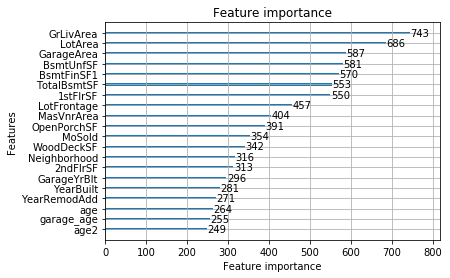

In [23]:
lgb.plot_importance(model_jmda,max_num_features=20)

In [24]:
im = pd.Series(index=data_x.columns,data=model_jmda.feature_importances_).sort_values(ascending=False)

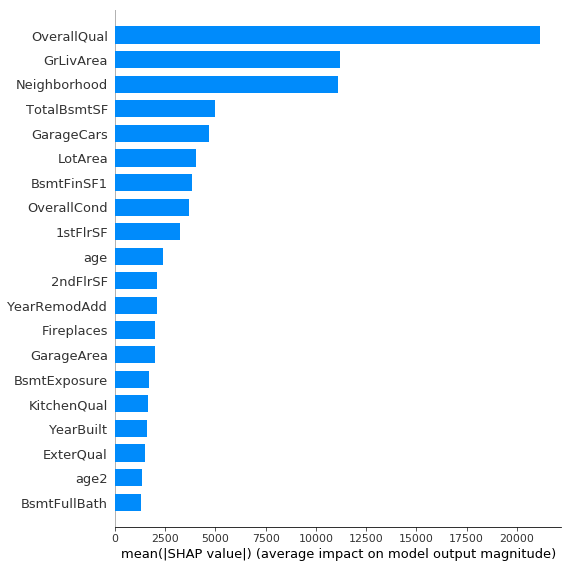

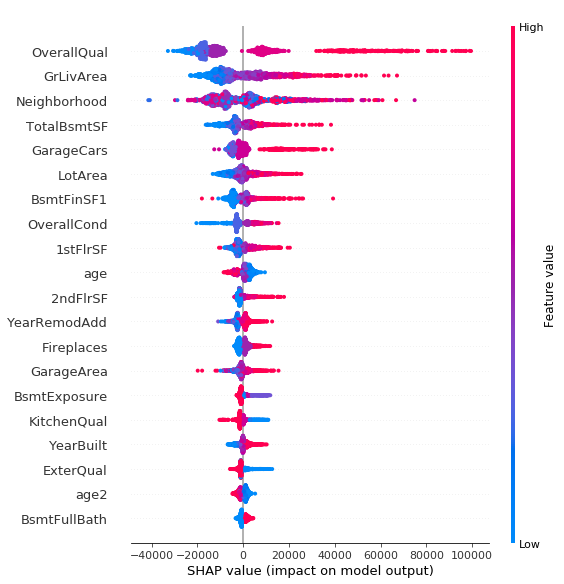

In [25]:
import shap
explainer = shap.TreeExplainer(model_jmda)
shap_values = explainer.shap_values(data_x)
#importance
shap.summary_plot(shap_values, data_x, plot_type="bar")
shap.summary_plot(shap_values, data_x)